In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.datasets import make_blobs
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report
from sklearn.metrics import matthews_corrcoef,cohen_kappa_score,balanced_accuracy_score


import lightgbm as lgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from catboost import CatBoostClassifier

from modAL.models import ActiveLearner, Committee
from modAL.uncertainty import uncertainty_sampling
from functools import partial
from modAL.batch import uncertainty_batch_sampling

import warnings

warnings.filterwarnings('ignore')

In [2]:
float_cd='PR_PF_3901684'
data_source="./dataset/"+float_cd+".csv"
data= pd.read_csv(data_source)
data

,Date,Latitude,longitude,Pressure,Salinity,Temperature,QC,label
0,-1.730828,0.107096,2.266649,-1.726008,1.953818,2.745999,0,0
1,-1.730828,0.107096,2.266649,-1.722558,1.953818,2.746051,0,0
2,-1.730828,0.107096,2.266649,-1.719125,1.953170,2.746051,0,0
3,-1.730828,0.107096,2.266649,-1.715604,1.953008,2.746121,0,0
4,-1.730828,0.107096,2.266649,-1.712171,1.953656,2.746190,0,0
...,...,...,...,...,...,...,...,...
149842,1.723431,0.987100,-0.978713,1.721038,-0.410773,-0.828686,0,0
149843,1.723431,0.987100,-0.978713,1.724454,-0.410935,-0.828842,0,0
149844,1.723431,0.987100,-0.978713,1.727869,-0.410935,-0.829206,0,0
149845,1.723431,0.987100,-0.978713,1.731425,-0.411259,-0.829744,0,0


In [3]:
row,col=data.shape

In [4]:
#def compute ratio
def comp_ratio(data):
    instance = data[(data['QC']==0)]
    rate=len(instance)/len(data)*100
    print(rate)
    return rate

In [5]:
dirty_ratio = 100-comp_ratio(data)
dirty_ratio

97.56084539563689


2.439154604363111

In [6]:
data['QC'].unique()
# num_values = len()

array([0, 5])

In [7]:
data.columns

Index(['Date', 'Latitude', 'longitude', 'Pressure', 'Salinity', 'Temperature',
       'QC', 'label'],
      dtype='object')

In [8]:
def plotCluster(data,name1,name2,name3,start,end):   
    %matplotlib notebook

    data1=data.loc[data['QC'] == 0]

    x1 = data1.loc[:,[name1]].iloc[start:end, :]  
    y1 = data1.loc[:,[name2]].iloc[start:end, :]  
    z1 = data1.loc[:,[name3]].iloc[start:end, :]  


    data2=data.loc[data['QC'] == 3]

    x2 = data2.loc[:,[name1]].iloc[start:end, :]  
    y2 = data2.loc[:,[name2]].iloc[start:end, :]  
    z2 = data2.loc[:,[name3]].iloc[start:end, :]  
    
    
    
    data3=data.loc[data['QC'] == 4]

    x3 = data3.loc[:,[name1]].iloc[start:end, :]  
    y3 = data3.loc[:,[name2]].iloc[start:end, :]  
    z3 = data3.loc[:,[name3]].iloc[start:end, :]  
    
    data4=data.loc[data['QC'] == 5]

    x4 = data4.loc[:,[name1]].iloc[start:end, :]  
    y4 = data4.loc[:,[name2]].iloc[start:end, :]  
    z4 = data4.loc[:,[name3]].iloc[start:end, :]  
    

    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")
    ax.scatter(x1, y1, z1, c='y',s=0.01, label='Normal Data')
    ax.scatter(x2, y2, z2, c='g',s=10, label='PRES')
    ax.scatter(x3, y3, z3, c='b',s=10, label='PSAL')
    ax.scatter(x4, y4, z4, c='r',s=10, label='TEMP')
    
    ax.legend(loc='best')

    ax.set_zlabel(name1, fontdict={'size': 15, 'color': 'black'})
    ax.set_ylabel(name2, fontdict={'size': 15, 'color': 'black'})
    ax.set_xlabel(name3, fontdict={'size': 15, 'color': 'black'})
    plt.show()
    plt.savefig('./image/'+float_cd+'_scatter.png')
    


In [9]:
# dataplot=data.copy()

# plotCluster(dataplot,"Temperature","Pressure","Salinity",0,data.shape[0])

# Splite Dataset

In [10]:
train_set=pd.read_csv('./randomtrain/'+float_cd+'.csv')
test_set=pd.read_csv('./randomtest/'+float_cd+'.csv')
len(train_set),len(test_set)

(104892, 44955)

In [11]:
comp_ratio(train_set)
comp_ratio(test_set)

97.56130114784732
97.55978200422645


97.55978200422645

In [12]:
#this function use random grid search to find best parameters
def getPar(model,dist,data,niter):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import RandomizedSearchCV
    x,y=data.shape

    clf = model

    param_dist = dist
    grid = RandomizedSearchCV(clf,param_dist,cv = 3,scoring = "balanced_accuracy",n_iter=niter,n_jobs = -1)

    #train
    grid.fit(data.iloc[:,0:y-1],data.iloc[:,y-1])
    #get best parameter
    print(grid.best_score_)
    return grid.best_params_

In [13]:
# metric
def computeMetric(y_tru,y_pre):
    acc = accuracy_score(y_tru,y_pre)
    pre=precision_score(y_tru,y_pre,average='macro')
    recall=recall_score(y_tru,y_pre,average='macro')
    cm=confusion_matrix(y_tru,y_pre)
    f1 = f1_score(y_tru,y_pre,average='macro')
    mcc=matthews_corrcoef(y_tru, y_pre)
    kappa=cohen_kappa_score(y_tru, y_pre)
    bac=balanced_accuracy_score(y_tru,y_pre)
    print("acc:",acc)
    print("precision:",pre)
    print("recall:",recall)
    print("cm:",cm)
    print("f1:",f1)
    print("balanced acc:",bac)
    print("MCC:", mcc)
    print("Kappa:",kappa)
    
    #confusion matrix
    cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
    plt.subplots(figsize=(12,8))
    cf_matrix = confusion_matrix(y_tru, y_pre)
    sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})
    
    return f1

In [14]:
def draw(performance_history):
    fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
    ax.plot(performance_history)
    ax.scatter(range(len(performance_history)), performance_history, s=13)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
    ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))
    ax.set_ylim(bottom=0, top=1)
    ax.grid(True)
    ax.set_title('Incremental classification accuracy')
    ax.set_xlabel('Query iteration')
    ax.set_ylabel('Classification Accuracy')
    plt.show()

# splite train(pool), test, Labeled, Unlabeled

In [15]:
x,y=train_set.shape ##no qc
#pool 
X_Pool = train_set.iloc[:,0:y-2].values
y_Pool = train_set.iloc[:,y-1].values

In [16]:
#test set
X_test=test_set.iloc[:,0:y-2]
y_tru=test_set.iloc[:,y-1]
print(len(X_test),len(y_tru))

44955 44955


In [17]:
#Pool
def initial_data(n_initial,X_Pool,y_Pool):
    #inital
    initial_idx = np.random.choice(range(len(X_Pool)), size=n_initial, replace=False)
    #initial Labeled data
    #X_initial, y_initial = X_train[], y_train[initial_idx]
    X_L = X_Pool[initial_idx]
    y_L = y_Pool[initial_idx]
    # Unlabeled data
    # X_U = Pool_X[ini_num:]
    # y_U = Pool_X[ini_num:]
    X_U, y_U = np.delete(X_Pool, initial_idx, axis=0), np.delete(y_Pool, initial_idx, axis=0)
    return X_L,y_L,X_U,y_U

In [18]:
# Set RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

#n_initial= 1000
n_initial = 1000
N_QUERIES = 200

In [19]:
# X_initial,y_initial,X_re,y_re=initial_data(n_initial,X_Pool,y_Pool)
# df_X_i = pd.DataFrame(X_initial)
# df_y_i = pd.DataFrame(y_initial)
# df_X_r = pd.DataFrame(X_re)
# df_y_r = pd.DataFrame(y_re)




X_initial=pd.read_csv('./randomtrain/'+float_cd+'_X_initial.csv').values
y_initial=pd.read_csv('./randomtrain/'+float_cd+'_y_initial.csv').values.ravel()
X_re=pd.read_csv('./randomtrain/'+float_cd+'_X_re.csv').values
y_re=pd.read_csv('./randomtrain/'+float_cd+'_y_re.csv').values.ravel()
print(X_re.shape,X_initial.shape)
print(y_re.shape,y_initial.shape)

(104792, 6) (100, 6)
(104792,) (100,)


In [20]:
# df_X_i.to_csv('./randomtrain/'+float_cd+'_X_initial.csv', index=False)
# df_y_i.to_csv('./randomtrain/'+float_cd+'_y_initial.csv', index=False)
# df_X_r.to_csv('./randomtrain/'+float_cd+'_X_re.csv', index=False)
# df_y_r.to_csv('./randomtrain/'+float_cd+'_y_re.csv', index=False)

# molAL

In [21]:
def random_sampling(classifier, X_pool):
    n_samples = len(X_pool)
    query_idx = np.random.choice(range(n_samples))
    return query_idx, X_pool[query_idx]

In [22]:
def al(clf,strategy,X_L,y_L):
    learner = ActiveLearner(estimator=clf,
                            query_strategy=strategy,
                            X_training=X_L, y_training=y_L)
    return learner

In [23]:
def al_learn(clf,sampling,X_initial,y_initial,X_re,y_re):
    X_L = X_initial.copy()
    y_L = y_initial.copy()
    X_U,y_U =X_re.copy(),y_re.copy()
    #print(len(X_U),len(y_U))
    learner = al(clf,sampling,X_L,y_L)
    y_pre=learner.predict(X_test)
    unqueried_kappa=cohen_kappa_score(y_tru, y_pre)
    unqueried_f1=f1_score(y_tru,y_pre)
    #print("unqueried --------------------->",unqueried_score)
    kappa_history = [unqueried_kappa]
    f1_history = [unqueried_f1]
    y_L_2 = y_L.tolist()
    y_L_2 = np.array(y_L_2).reshape((-1, 1))
    queried_instance = np.concatenate((X_L, y_L_2), axis=1)

    # Query
    for index in range(N_QUERIES):
        query_index, query_instance = learner.query(X_U)
        # Teach ActiveLearner model the record it has requested.
        X, y = X_U[query_index].reshape(1, -1), y_U[query_index].reshape(1, )
        #print(X.flatten(), y)
        instance = np.concatenate((X.flatten(), y))
        #print(index+1,"query instance --------------------->",instance)
        learner.teach(X=X, y=y)
        
        X_U, y_U = np.delete(X_U, query_index, axis=0), np.delete(y_U, query_index)
        y_pre=learner.predict(X_test)
        kappa=cohen_kappa_score(y_tru, y_pre)
        f1=f1_score(y_tru,y_pre)
        print(index+1,"-------------------->",kappa)
        print(index+1,"-------------------->",f1)
        # Recall precision F1
        kappa_history.append(kappa)
        f1_history.append(f1)
        queried_instance = np.vstack((queried_instance, instance))

    #print(query_history)
    df_scores= pd.concat([pd.DataFrame(kappa_history,columns=['kappa']), 
                          pd.DataFrame(f1_history,columns=['f1'])],
                         axis=1)
    df_instance = pd.DataFrame(data=queried_instance, columns=['Date','Latitude','longitude','Pressure','Salinity','Temperature','Label'])
    #print(df_instance)
    return df_scores, df_instance 
#     return f1_history


1.0
{'n_neighbors': 1}
acc: 0.9993104215326437
precision: 0.9925430151718868
recall: 0.9929807654295605
cm: [[43842    16]
 [   15  1082]]
f1: 0.9927617879244193
balanced acc: 0.9929807654295605
MCC: 0.98552368338142
Kappa: 0.9855235759240272


0.9927617879244193

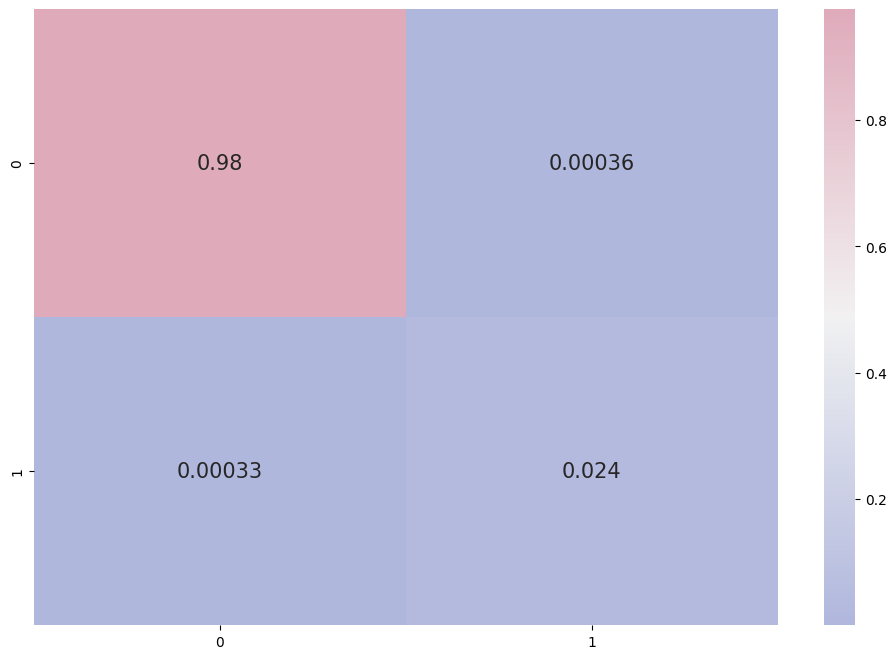

In [24]:
# clf1 KNN
clf1 = KNeighborsClassifier()
dic1={'n_neighbors':[1,2,3,4,5,6,7,8]}
para1=getPar(clf1,dic1,test_set,10)
print(para1)
clf1 = KNeighborsClassifier(n_neighbors=para1['n_neighbors'],n_jobs=-1)
clf1.fit(X_Pool, y_Pool)
y_pre=clf1.predict(X_test)
computeMetric(y_tru,y_pre)

1.0
acc: 0.9993771549327105
precision: 0.9974209375634475
recall: 0.9894598620317422
cm: [[43853     5]
 [   23  1074]]
f1: 0.9934066032150659
balanced acc: 0.9894598620317422
MCC: 0.9868486884452041
Kappa: 0.9868132288099554


0.9934066032150659

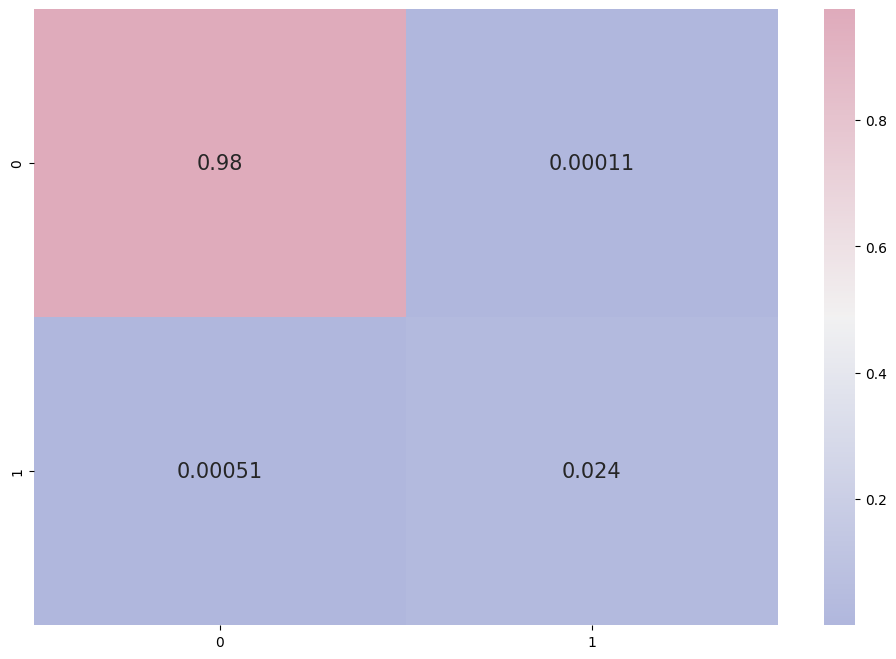

In [25]:
# clf2 lightgbm
clf2 = lgb.LGBMClassifier()

dic2 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para2=getPar(clf2,dic2,test_set,10)

    
clf2 = lgb.LGBMClassifier(boosting_type='gbdt',
                          #objective='multiclass',
                          num_leaves=para2['num_leaves'], max_depth=-1, 
                              learning_rate=para2['learning_rate'], n_estimators=para2['n_estimators'], 
                              subsample_for_bin=200000, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para2['min_child_weight'],
                              min_child_samples=para2['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para2['reg_alpha'], 
                              reg_lambda=para2['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf2.fit(X_Pool, y_Pool)
y_pre=clf2.predict(X_test)
computeMetric(y_tru,y_pre)

1.0
acc: 0.9993549104660215
precision: 0.9960706250403207
recall: 0.9903372377740327
cm: [[43850     8]
 [   21  1076]]
f1: 0.993186391824404
balanced acc: 0.9903372377740327
MCC: 0.9863912003320159
Kappa: 0.9863727956851529


0.993186391824404

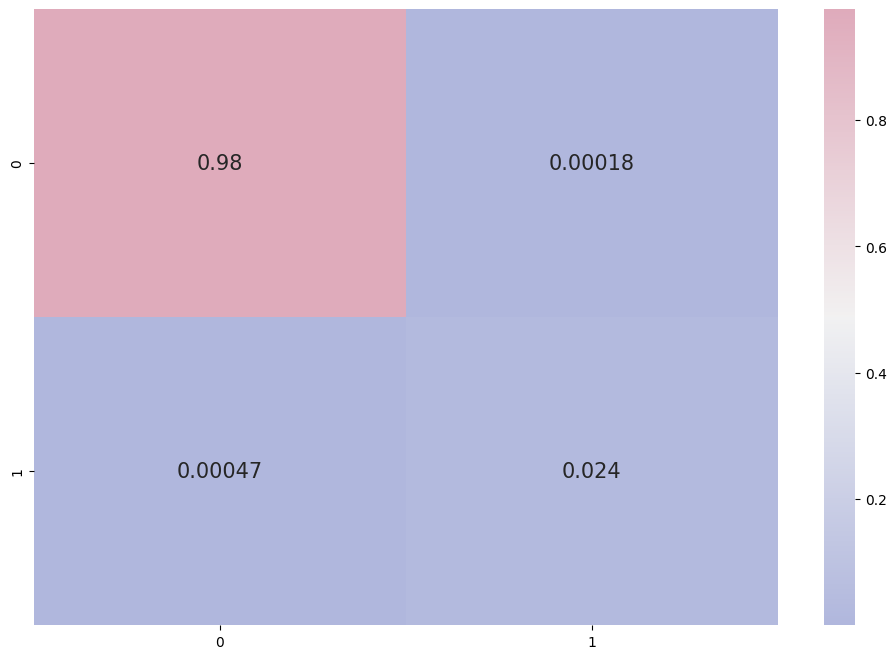

In [26]:
#XGBOOST
clf3 = xgb.XGBClassifier()
dic3 = {'n_estimators':range(80,2000,4),
        'max_depth':range(2,15,1),
        'learning_rate':np.linspace(0.01,2,20),
        'subsample':np.linspace(0.7,0.9,20),
        'colsample_bytree':np.linspace(0.5,0.98,10)
        }
para3=getPar(clf3,dic3,test_set,10)
clf3 = xgb.XGBClassifier(booster='gbtree',n_estimators=para3['n_estimators'], learning_rate=para3['learning_rate'],
                    max_depth=para3['max_depth'],subsample=para3['subsample'],
                    colsample_bytree=para3['colsample_bytree'],
                         #objective='multi:softprob',
                    n_jobs=-1)
clf3.fit(X_Pool, y_Pool)
y_pre=clf3.predict(X_test)
computeMetric(y_tru,y_pre)

Learning rate set to 0.075126
0:	learn: 0.4357151	total: 68.1ms	remaining: 1m 8s
1:	learn: 0.2803195	total: 77.9ms	remaining: 38.9s
2:	learn: 0.1769600	total: 88.2ms	remaining: 29.3s
3:	learn: 0.1143459	total: 98.2ms	remaining: 24.4s
4:	learn: 0.0784480	total: 109ms	remaining: 21.6s
5:	learn: 0.0520920	total: 119ms	remaining: 19.6s
6:	learn: 0.0365680	total: 129ms	remaining: 18.3s
7:	learn: 0.0257107	total: 139ms	remaining: 17.2s
8:	learn: 0.0193376	total: 149ms	remaining: 16.4s
9:	learn: 0.0150478	total: 159ms	remaining: 15.8s
10:	learn: 0.0112292	total: 171ms	remaining: 15.4s
11:	learn: 0.0098838	total: 182ms	remaining: 15s
12:	learn: 0.0083975	total: 194ms	remaining: 14.7s
13:	learn: 0.0069913	total: 205ms	remaining: 14.4s
14:	learn: 0.0063638	total: 215ms	remaining: 14.1s
15:	learn: 0.0056814	total: 227ms	remaining: 14s
16:	learn: 0.0052964	total: 238ms	remaining: 13.8s
17:	learn: 0.0048239	total: 249ms	remaining: 13.6s
18:	learn: 0.0046327	total: 260ms	remaining: 13.4s
19:	learn: 

176:	learn: 0.0011079	total: 2.52s	remaining: 11.7s
177:	learn: 0.0011051	total: 2.53s	remaining: 11.7s
178:	learn: 0.0011044	total: 2.54s	remaining: 11.7s
179:	learn: 0.0011005	total: 2.55s	remaining: 11.6s
180:	learn: 0.0010973	total: 2.56s	remaining: 11.6s
181:	learn: 0.0010876	total: 2.57s	remaining: 11.6s
182:	learn: 0.0010844	total: 2.58s	remaining: 11.5s
183:	learn: 0.0010776	total: 2.59s	remaining: 11.5s
184:	learn: 0.0010757	total: 2.6s	remaining: 11.5s
185:	learn: 0.0010667	total: 2.61s	remaining: 11.4s
186:	learn: 0.0010639	total: 2.62s	remaining: 11.4s
187:	learn: 0.0010611	total: 2.63s	remaining: 11.4s
188:	learn: 0.0010560	total: 2.64s	remaining: 11.3s
189:	learn: 0.0010513	total: 2.65s	remaining: 11.3s
190:	learn: 0.0010471	total: 2.66s	remaining: 11.3s
191:	learn: 0.0010443	total: 2.67s	remaining: 11.2s
192:	learn: 0.0010396	total: 2.68s	remaining: 11.2s
193:	learn: 0.0010335	total: 2.69s	remaining: 11.2s
194:	learn: 0.0010273	total: 2.7s	remaining: 11.2s
195:	learn: 0.

335:	learn: 0.0007755	total: 4.64s	remaining: 9.18s
336:	learn: 0.0007755	total: 4.65s	remaining: 9.16s
337:	learn: 0.0007755	total: 4.66s	remaining: 9.13s
338:	learn: 0.0007755	total: 4.67s	remaining: 9.11s
339:	learn: 0.0007755	total: 4.68s	remaining: 9.08s
340:	learn: 0.0007755	total: 4.69s	remaining: 9.06s
341:	learn: 0.0007755	total: 4.7s	remaining: 9.04s
342:	learn: 0.0007755	total: 4.7s	remaining: 9.01s
343:	learn: 0.0007755	total: 4.71s	remaining: 8.99s
344:	learn: 0.0007755	total: 4.72s	remaining: 8.96s
345:	learn: 0.0007755	total: 4.73s	remaining: 8.94s
346:	learn: 0.0007755	total: 4.74s	remaining: 8.92s
347:	learn: 0.0007755	total: 4.75s	remaining: 8.89s
348:	learn: 0.0007755	total: 4.75s	remaining: 8.87s
349:	learn: 0.0007755	total: 4.76s	remaining: 8.85s
350:	learn: 0.0007755	total: 4.77s	remaining: 8.82s
351:	learn: 0.0007755	total: 4.78s	remaining: 8.8s
352:	learn: 0.0007755	total: 4.79s	remaining: 8.78s
353:	learn: 0.0007755	total: 4.8s	remaining: 8.75s
354:	learn: 0.00

498:	learn: 0.0007755	total: 6.29s	remaining: 6.32s
499:	learn: 0.0007755	total: 6.38s	remaining: 6.38s
500:	learn: 0.0007755	total: 6.45s	remaining: 6.42s
501:	learn: 0.0007755	total: 6.47s	remaining: 6.42s
502:	learn: 0.0007755	total: 6.5s	remaining: 6.42s
503:	learn: 0.0007755	total: 6.53s	remaining: 6.42s
504:	learn: 0.0007755	total: 6.56s	remaining: 6.43s
505:	learn: 0.0007755	total: 6.58s	remaining: 6.42s
506:	learn: 0.0007755	total: 6.59s	remaining: 6.41s
507:	learn: 0.0007755	total: 6.6s	remaining: 6.39s
508:	learn: 0.0007755	total: 6.61s	remaining: 6.37s
509:	learn: 0.0007755	total: 6.62s	remaining: 6.36s
510:	learn: 0.0007755	total: 6.62s	remaining: 6.34s
511:	learn: 0.0007755	total: 6.63s	remaining: 6.32s
512:	learn: 0.0007755	total: 6.64s	remaining: 6.3s
513:	learn: 0.0007755	total: 6.65s	remaining: 6.29s
514:	learn: 0.0007755	total: 6.66s	remaining: 6.27s
515:	learn: 0.0007755	total: 6.66s	remaining: 6.25s
516:	learn: 0.0007755	total: 6.69s	remaining: 6.25s
517:	learn: 0.0

678:	learn: 0.0007755	total: 8.37s	remaining: 3.96s
679:	learn: 0.0007755	total: 8.38s	remaining: 3.94s
680:	learn: 0.0007755	total: 8.39s	remaining: 3.93s
681:	learn: 0.0007755	total: 8.39s	remaining: 3.91s
682:	learn: 0.0007755	total: 8.4s	remaining: 3.9s
683:	learn: 0.0007755	total: 8.41s	remaining: 3.89s
684:	learn: 0.0007755	total: 8.42s	remaining: 3.87s
685:	learn: 0.0007755	total: 8.43s	remaining: 3.86s
686:	learn: 0.0007755	total: 8.44s	remaining: 3.84s
687:	learn: 0.0007755	total: 8.44s	remaining: 3.83s
688:	learn: 0.0007755	total: 8.45s	remaining: 3.81s
689:	learn: 0.0007755	total: 8.46s	remaining: 3.8s
690:	learn: 0.0007755	total: 8.47s	remaining: 3.79s
691:	learn: 0.0007755	total: 8.47s	remaining: 3.77s
692:	learn: 0.0007755	total: 8.48s	remaining: 3.76s
693:	learn: 0.0007755	total: 8.49s	remaining: 3.74s
694:	learn: 0.0007755	total: 8.5s	remaining: 3.73s
695:	learn: 0.0007755	total: 8.51s	remaining: 3.72s
696:	learn: 0.0007755	total: 8.52s	remaining: 3.7s
697:	learn: 0.000

842:	learn: 0.0007755	total: 10.3s	remaining: 1.92s
843:	learn: 0.0007755	total: 10.3s	remaining: 1.9s
844:	learn: 0.0007755	total: 10.3s	remaining: 1.89s
845:	learn: 0.0007755	total: 10.3s	remaining: 1.88s
846:	learn: 0.0007755	total: 10.3s	remaining: 1.86s
847:	learn: 0.0007755	total: 10.3s	remaining: 1.85s
848:	learn: 0.0007755	total: 10.3s	remaining: 1.84s
849:	learn: 0.0007755	total: 10.4s	remaining: 1.83s
850:	learn: 0.0007755	total: 10.4s	remaining: 1.81s
851:	learn: 0.0007755	total: 10.4s	remaining: 1.8s
852:	learn: 0.0007755	total: 10.4s	remaining: 1.79s
853:	learn: 0.0007755	total: 10.4s	remaining: 1.77s
854:	learn: 0.0007755	total: 10.4s	remaining: 1.76s
855:	learn: 0.0007755	total: 10.4s	remaining: 1.75s
856:	learn: 0.0007755	total: 10.4s	remaining: 1.74s
857:	learn: 0.0007755	total: 10.4s	remaining: 1.72s
858:	learn: 0.0007755	total: 10.4s	remaining: 1.71s
859:	learn: 0.0007755	total: 10.4s	remaining: 1.7s
860:	learn: 0.0007755	total: 10.4s	remaining: 1.69s
861:	learn: 0.0

acc: 0.9994438883327772
precision: 0.997908831908832
recall: 0.9903828394886571
cm: [[43854     4]
 [   21  1076]]
f1: 0.9941156756771643
balanced acc: 0.9903828394886571
MCC: 0.9882630151896479
Kappa: 0.9882313691618049


0.9941156756771643

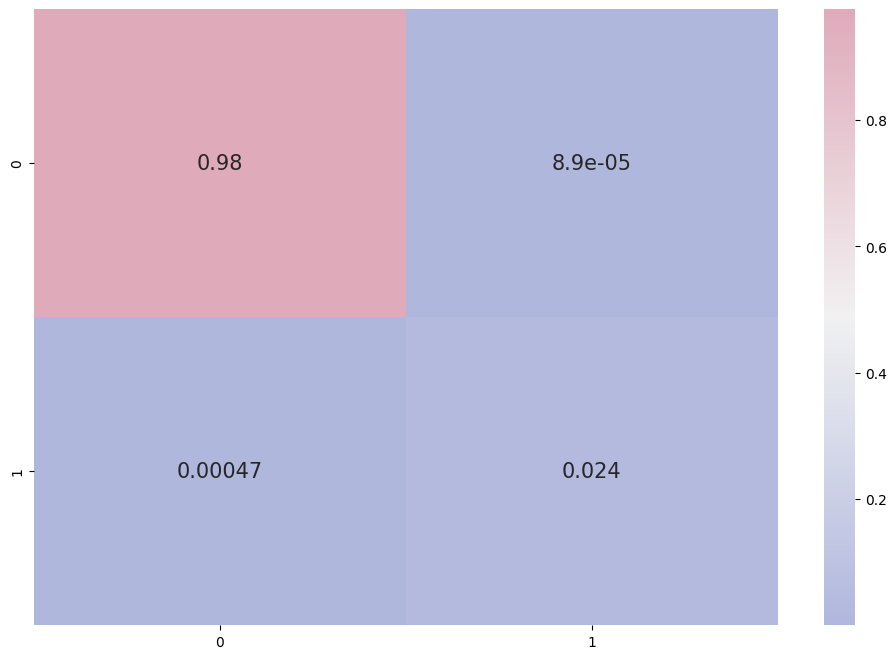

In [27]:
#clf4 catboost
clf4 = CatBoostClassifier(loss_function='Logloss')
# dic4 = {'learning_rate': [0.03, 0.1],
#         'depth': [4, 6, 10],
#         'l2_leaf_reg': [1, 3, 5, 7, 9]}
# #para3=getPar(clf4,dic4,test_set,10)

# grid_search_result = clf4.grid_search(dic4, 
#                                        X=X_Pool, 
#                                        y=y_Pool)

clf4.fit(X_Pool, y_Pool)
y_pre=clf4.predict(X_test)
computeMetric(y_tru,y_pre)

## random sampling

In [28]:
sampling=random_sampling

In [29]:
metric01,instance01 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)
instance01.to_csv("./query/random_Knn_"+float_cd+".csv")

1 --------------------> 0.31492117910145123
1 --------------------> 0.3321554770318021
2 --------------------> 0.31492117910145123
2 --------------------> 0.3321554770318021
3 --------------------> 0.31492117910145123
3 --------------------> 0.3321554770318021
4 --------------------> 0.31492117910145123
4 --------------------> 0.3321554770318021
5 --------------------> 0.31492117910145123
5 --------------------> 0.3321554770318021
6 --------------------> 0.31492117910145123
6 --------------------> 0.3321554770318021
7 --------------------> 0.31492117910145123
7 --------------------> 0.3321554770318021
8 --------------------> 0.31492117910145123
8 --------------------> 0.3321554770318021
9 --------------------> 0.31492117910145123
9 --------------------> 0.3321554770318021
10 --------------------> 0.31492117910145123
10 --------------------> 0.3321554770318021
11 --------------------> 0.31539530665826043
11 --------------------> 0.3325961963732862
12 --------------------> 0.328927586126

94 --------------------> 0.335584504170239
94 --------------------> 0.34840132304299887
95 --------------------> 0.335584504170239
95 --------------------> 0.34840132304299887
96 --------------------> 0.335584504170239
96 --------------------> 0.34840132304299887
97 --------------------> 0.335584504170239
97 --------------------> 0.34840132304299887
98 --------------------> 0.335584504170239
98 --------------------> 0.34840132304299887
99 --------------------> 0.335584504170239
99 --------------------> 0.34840132304299887
100 --------------------> 0.335584504170239
100 --------------------> 0.34840132304299887
101 --------------------> 0.335584504170239
101 --------------------> 0.34840132304299887
102 --------------------> 0.335584504170239
102 --------------------> 0.34840132304299887
103 --------------------> 0.335584504170239
103 --------------------> 0.34840132304299887
104 --------------------> 0.33662159197748953
104 --------------------> 0.3493642896627971
105 -----------------

184 --------------------> 0.40572656900986626
184 --------------------> 0.41730558598028483
185 --------------------> 0.40572656900986626
185 --------------------> 0.41730558598028483
186 --------------------> 0.40572656900986626
186 --------------------> 0.41730558598028483
187 --------------------> 0.40572656900986626
187 --------------------> 0.41730558598028483
188 --------------------> 0.40572656900986626
188 --------------------> 0.41730558598028483
189 --------------------> 0.40572656900986626
189 --------------------> 0.41730558598028483
190 --------------------> 0.40572656900986626
190 --------------------> 0.41730558598028483
191 --------------------> 0.40572656900986626
191 --------------------> 0.41730558598028483
192 --------------------> 0.40572656900986626
192 --------------------> 0.41730558598028483
193 --------------------> 0.40572656900986626
193 --------------------> 0.41730558598028483
194 --------------------> 0.40572656900986626
194 --------------------> 0.417305

In [30]:
metric02,instance02 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)
instance02.to_csv("./query/random_Lg_"+float_cd+".csv")

1 --------------------> 0.0
1 --------------------> 0.0
2 --------------------> 0.0
2 --------------------> 0.0
3 --------------------> 0.0
3 --------------------> 0.0
4 --------------------> 0.0
4 --------------------> 0.0
5 --------------------> 0.0
5 --------------------> 0.0
6 --------------------> 0.0
6 --------------------> 0.0
7 --------------------> 0.0
7 --------------------> 0.0
8 --------------------> 0.0
8 --------------------> 0.0
9 --------------------> 0.0
9 --------------------> 0.0
10 --------------------> 0.0
10 --------------------> 0.0
11 --------------------> 0.0
11 --------------------> 0.0
12 --------------------> 0.0
12 --------------------> 0.0
13 --------------------> 0.0
13 --------------------> 0.0
14 --------------------> 0.0
14 --------------------> 0.0
15 --------------------> 0.0
15 --------------------> 0.0
16 --------------------> 0.0
16 --------------------> 0.0
17 --------------------> 0.0
17 --------------------> 0.0
18 --------------------> 0.0
18 

142 --------------------> 0.0
142 --------------------> 0.0
143 --------------------> 0.0
143 --------------------> 0.0
144 --------------------> 0.0
144 --------------------> 0.0
145 --------------------> 0.0
145 --------------------> 0.0
146 --------------------> 0.0
146 --------------------> 0.0
147 --------------------> 0.0
147 --------------------> 0.0
148 --------------------> 0.0
148 --------------------> 0.0
149 --------------------> 0.0
149 --------------------> 0.0
150 --------------------> 0.0
150 --------------------> 0.0
151 --------------------> 0.0
151 --------------------> 0.0
152 --------------------> 0.0
152 --------------------> 0.0
153 --------------------> 0.0
153 --------------------> 0.0
154 --------------------> 0.0
154 --------------------> 0.0
155 --------------------> 0.0
155 --------------------> 0.0
156 --------------------> 0.0
156 --------------------> 0.0
157 --------------------> 0.0
157 --------------------> 0.0
158 --------------------> 0.0
158 ------

In [31]:
metric03,instance03= al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)
instance03.to_csv("./query/random_XB_"+float_cd+".csv")

1 --------------------> 0.012375541071663054
1 --------------------> 0.012681159420289854
2 --------------------> 0.03668399423773838
2 --------------------> 0.03756708407871198
3 --------------------> 0.03668399423773838
3 --------------------> 0.03756708407871198
4 --------------------> 0.03496691455626977
4 --------------------> 0.035810205908683966
5 --------------------> 0.03668399423773838
5 --------------------> 0.03756708407871198
6 --------------------> 0.031523959319587624
6 --------------------> 0.03228699551569507
7 --------------------> 0.02979806873235835
7 --------------------> 0.03052064631956912
8 --------------------> 0.04522571162225397
8 --------------------> 0.046304541406945676
9 --------------------> 0.028069226101674727
9 --------------------> 0.02875112309074573
10 --------------------> 0.031523959319587624
10 --------------------> 0.03228699551569507
11 --------------------> 0.03839815194000151
11 --------------------> 0.03932082216264522
12 ------------------

92 --------------------> 0.2992758239620563
92 --------------------> 0.3044822256568779
93 --------------------> 0.5552192135085816
93 --------------------> 0.5613114754098361
94 --------------------> 0.2992758239620563
94 --------------------> 0.3044822256568779
95 --------------------> 0.2992758239620563
95 --------------------> 0.3044822256568779
96 --------------------> 0.30057239141673
96 --------------------> 0.30579150579150577
97 --------------------> 0.35820833372176175
97 --------------------> 0.36390753169276663
98 --------------------> 0.2992758239620563
98 --------------------> 0.3044822256568779
99 --------------------> 0.329872659302476
99 --------------------> 0.3353566009104704
100 --------------------> 0.3044506052053063
100 --------------------> 0.30970724191063176
101 --------------------> 0.4531409141849564
101 --------------------> 0.4592696629213483
102 --------------------> 0.2992758239620563
102 --------------------> 0.3044822256568779
103 -------------------->

183 --------------------> 0.5599349136771208
183 --------------------> 0.5660130718954248
184 --------------------> 0.47234087186494145
184 --------------------> 0.478502080443828
185 --------------------> 0.600185802768141
185 --------------------> 0.6060991105463787
186 --------------------> 0.5589941533791031
186 --------------------> 0.5650752125572269
187 --------------------> 0.47863874969673414
187 --------------------> 0.48480662983425415
188 --------------------> 0.5243179628199923
188 --------------------> 0.5304755525787006
189 --------------------> 0.5370242690639206
189 --------------------> 0.5431606905710491
190 --------------------> 0.601963828441652
190 --------------------> 0.6078680203045685
191 --------------------> 0.5002911331812299
191 --------------------> 0.5064669843430906
192 --------------------> 0.5775866644070728
192 --------------------> 0.5836023240800516
193 --------------------> 0.40647212504463237
193 --------------------> 0.41244573082489144
194 ----

In [ ]:
metric04,instance04= al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)
instance04.to_csv("./query/random_CB_"+float_cd+".csv")

## Uncertainty

In [33]:
sampling=uncertainty_sampling

In [34]:
metric11,instance11 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)
instance11.to_csv("./query/Un_Knn_"+float_cd+".csv")

1 --------------------> 0.31492117910145123
1 --------------------> 0.3321554770318021
2 --------------------> 0.31492117910145123
2 --------------------> 0.3321554770318021
3 --------------------> 0.31492117910145123
3 --------------------> 0.3321554770318021
4 --------------------> 0.31492117910145123
4 --------------------> 0.3321554770318021
5 --------------------> 0.316188253215145
5 --------------------> 0.3333333333333333
6 --------------------> 0.316188253215145
6 --------------------> 0.3333333333333333
7 --------------------> 0.316188253215145
7 --------------------> 0.3333333333333333
8 --------------------> 0.316188253215145
8 --------------------> 0.3333333333333333
9 --------------------> 0.316188253215145
9 --------------------> 0.3333333333333333
10 --------------------> 0.316188253215145
10 --------------------> 0.3333333333333333
11 --------------------> 0.316188253215145
11 --------------------> 0.3333333333333333
12 --------------------> 0.32074969698761346
12 -----

94 --------------------> 0.28327893475757193
94 --------------------> 0.3028846153846154
95 --------------------> 0.28327893475757193
95 --------------------> 0.3028846153846154
96 --------------------> 0.28327893475757193
96 --------------------> 0.3028846153846154
97 --------------------> 0.28327893475757193
97 --------------------> 0.3028846153846154
98 --------------------> 0.28327893475757193
98 --------------------> 0.3028846153846154
99 --------------------> 0.28327893475757193
99 --------------------> 0.3028846153846154
100 --------------------> 0.28327893475757193
100 --------------------> 0.3028846153846154
101 --------------------> 0.28327893475757193
101 --------------------> 0.3028846153846154
102 --------------------> 0.28327893475757193
102 --------------------> 0.3028846153846154
103 --------------------> 0.28327893475757193
103 --------------------> 0.3028846153846154
104 --------------------> 0.28327893475757193
104 --------------------> 0.3028846153846154
105 -------

185 --------------------> 0.36232542173855486
185 --------------------> 0.37775735294117646
186 --------------------> 0.36232542173855486
186 --------------------> 0.37775735294117646
187 --------------------> 0.3462855907741268
187 --------------------> 0.3619489559164733
188 --------------------> 0.3462855907741268
188 --------------------> 0.3619489559164733
189 --------------------> 0.3462855907741268
189 --------------------> 0.3619489559164733
190 --------------------> 0.3462855907741268
190 --------------------> 0.3619489559164733
191 --------------------> 0.3462855907741268
191 --------------------> 0.3619489559164733
192 --------------------> 0.3462855907741268
192 --------------------> 0.3619489559164733
193 --------------------> 0.3462855907741268
193 --------------------> 0.3619489559164733
194 --------------------> 0.3462855907741268
194 --------------------> 0.3619489559164733
195 --------------------> 0.3462855907741268
195 --------------------> 0.3619489559164733
196 --

In [35]:
metric12,instance12 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)
instance12.to_csv("./query/Un_Lg_"+float_cd+".csv")

1 --------------------> 0.0
1 --------------------> 0.0
2 --------------------> 0.0
2 --------------------> 0.0
3 --------------------> 0.0
3 --------------------> 0.0
4 --------------------> 0.0
4 --------------------> 0.0
5 --------------------> 0.0
5 --------------------> 0.0
6 --------------------> 0.0
6 --------------------> 0.0
7 --------------------> 0.0
7 --------------------> 0.0
8 --------------------> 0.0
8 --------------------> 0.0
9 --------------------> 0.0
9 --------------------> 0.0
10 --------------------> 0.0
10 --------------------> 0.0
11 --------------------> 0.0
11 --------------------> 0.0
12 --------------------> 0.0
12 --------------------> 0.0
13 --------------------> 0.0
13 --------------------> 0.0
14 --------------------> 0.0
14 --------------------> 0.0
15 --------------------> 0.0
15 --------------------> 0.0
16 --------------------> 0.0
16 --------------------> 0.0
17 --------------------> 0.0
17 --------------------> 0.0
18 --------------------> 0.0
18 

125 --------------------> 0.27693660429362876
125 --------------------> 0.28191072826938135
126 --------------------> 0.27693660429362876
126 --------------------> 0.28191072826938135
127 --------------------> 0.27560477862555155
127 --------------------> 0.280564263322884
128 --------------------> 0.27693660429362876
128 --------------------> 0.28191072826938135
129 --------------------> 0.4931402237097873
129 --------------------> 0.49931600547195626
130 --------------------> 0.4931402237097873
130 --------------------> 0.49931600547195626
131 --------------------> 0.5073767070855257
131 --------------------> 0.513550135501355
132 --------------------> 0.5163921600139518
132 --------------------> 0.5225589225589226
133 --------------------> 0.649207736065563
133 --------------------> 0.6548129981606376
134 --------------------> 0.649207736065563
134 --------------------> 0.6548129981606376
135 --------------------> 0.649207736065563
135 --------------------> 0.6548129981606376
136 --

In [36]:
metric13,instance13 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)
instance13.to_csv("./query/Un_XB_"+float_cd+".csv")

1 --------------------> 0.052007111282921126
1 --------------------> 0.05323868677905945
2 --------------------> 0.055380647146010986
2 --------------------> 0.0566873339238264
3 --------------------> 0.6273443631343099
3 --------------------> 0.633147113594041
4 --------------------> 0.6433666419478106
4 --------------------> 0.6490147783251231
5 --------------------> 0.650452310079491
5 --------------------> 0.6560587515299878
6 --------------------> 0.649207736065563
6 --------------------> 0.6548129981606376
7 --------------------> 0.6541759501813199
7 --------------------> 0.6597434331093464
8 --------------------> 0.6504491674885473
8 --------------------> 0.6560975609756098
9 --------------------> 0.6475438033715553
9 --------------------> 0.6531614487415592
10 --------------------> 0.6500382240493058
10 --------------------> 0.6556372549019608
11 --------------------> 0.6631934878280986
11 --------------------> 0.6686893203883495
12 --------------------> 0.6682869474568182
12 -

95 --------------------> 0.9867538900253595
95 --------------------> 0.9870729455216989
96 --------------------> 0.9867538900253595
96 --------------------> 0.9870729455216989
97 --------------------> 0.9867538900253595
97 --------------------> 0.9870729455216989
98 --------------------> 0.9867538900253595
98 --------------------> 0.9870729455216989
99 --------------------> 0.9867538900253595
99 --------------------> 0.9870729455216989
100 --------------------> 0.9867538900253595
100 --------------------> 0.9870729455216989
101 --------------------> 0.9867538900253595
101 --------------------> 0.9870729455216989
102 --------------------> 0.9867538900253595
102 --------------------> 0.9870729455216989
103 --------------------> 0.9867538900253595
103 --------------------> 0.9870729455216989
104 --------------------> 0.9867538900253595
104 --------------------> 0.9870729455216989
105 --------------------> 0.9867538900253595
105 --------------------> 0.9870729455216989
106 ----------------

187 --------------------> 0.9867538900253595
187 --------------------> 0.9870729455216989
188 --------------------> 0.9867538900253595
188 --------------------> 0.9870729455216989
189 --------------------> 0.9867538900253595
189 --------------------> 0.9870729455216989
190 --------------------> 0.9867538900253595
190 --------------------> 0.9870729455216989
191 --------------------> 0.9867538900253595
191 --------------------> 0.9870729455216989
192 --------------------> 0.9867538900253595
192 --------------------> 0.9870729455216989
193 --------------------> 0.9867538900253595
193 --------------------> 0.9870729455216989
194 --------------------> 0.9867538900253595
194 --------------------> 0.9870729455216989
195 --------------------> 0.9867538900253595
195 --------------------> 0.9870729455216989
196 --------------------> 0.9867538900253595
196 --------------------> 0.9870729455216989
197 --------------------> 0.9867538900253595
197 --------------------> 0.9870729455216989
198 ------

In [37]:
metric14,instance14 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)
instance14.to_csv("./query/Un_CB_"+float_cd+".csv")

Learning rate set to 0.003854
0:	learn: 0.6878579	total: 1.13ms	remaining: 1.13s
1:	learn: 0.6827304	total: 2.04ms	remaining: 1.02s
2:	learn: 0.6768861	total: 2.82ms	remaining: 938ms
3:	learn: 0.6718995	total: 3.82ms	remaining: 952ms
4:	learn: 0.6669280	total: 4.61ms	remaining: 917ms
5:	learn: 0.6621703	total: 5.52ms	remaining: 915ms
6:	learn: 0.6573842	total: 6.31ms	remaining: 895ms
7:	learn: 0.6527747	total: 7.13ms	remaining: 884ms
8:	learn: 0.6480296	total: 7.95ms	remaining: 875ms
9:	learn: 0.6433402	total: 8.7ms	remaining: 862ms
10:	learn: 0.6387503	total: 9.59ms	remaining: 862ms
11:	learn: 0.6327321	total: 10.4ms	remaining: 855ms
12:	learn: 0.6283003	total: 11.2ms	remaining: 850ms
13:	learn: 0.6235205	total: 12ms	remaining: 843ms
14:	learn: 0.6189182	total: 12.9ms	remaining: 845ms
15:	learn: 0.6142275	total: 14ms	remaining: 858ms
16:	learn: 0.6094045	total: 14.9ms	remaining: 864ms
17:	learn: 0.6053598	total: 15.8ms	remaining: 860ms
18:	learn: 0.6007926	total: 16.6ms	remaining: 859

182:	learn: 0.2196716	total: 157ms	remaining: 703ms
183:	learn: 0.2187973	total: 159ms	remaining: 703ms
184:	learn: 0.2178907	total: 160ms	remaining: 703ms
185:	learn: 0.2169019	total: 160ms	remaining: 702ms
186:	learn: 0.2158130	total: 161ms	remaining: 700ms
187:	learn: 0.2149132	total: 162ms	remaining: 699ms
188:	learn: 0.2135954	total: 163ms	remaining: 698ms
189:	learn: 0.2121512	total: 163ms	remaining: 696ms
190:	learn: 0.2107323	total: 164ms	remaining: 696ms
191:	learn: 0.2095537	total: 165ms	remaining: 695ms
192:	learn: 0.2083434	total: 166ms	remaining: 694ms
193:	learn: 0.2071876	total: 167ms	remaining: 694ms
194:	learn: 0.2062992	total: 168ms	remaining: 693ms
195:	learn: 0.2054472	total: 169ms	remaining: 692ms
196:	learn: 0.2044796	total: 169ms	remaining: 690ms
197:	learn: 0.2034575	total: 170ms	remaining: 688ms
198:	learn: 0.2026240	total: 182ms	remaining: 732ms
199:	learn: 0.2018189	total: 184ms	remaining: 735ms
200:	learn: 0.2009076	total: 185ms	remaining: 734ms
201:	learn: 

401:	learn: 0.0936331	total: 341ms	remaining: 508ms
402:	learn: 0.0934412	total: 342ms	remaining: 507ms
403:	learn: 0.0933162	total: 343ms	remaining: 506ms
404:	learn: 0.0930322	total: 344ms	remaining: 505ms
405:	learn: 0.0926558	total: 345ms	remaining: 504ms
406:	learn: 0.0924499	total: 345ms	remaining: 503ms
407:	learn: 0.0921575	total: 346ms	remaining: 502ms
408:	learn: 0.0919113	total: 347ms	remaining: 501ms
409:	learn: 0.0916817	total: 348ms	remaining: 500ms
410:	learn: 0.0913466	total: 348ms	remaining: 499ms
411:	learn: 0.0910040	total: 349ms	remaining: 498ms
412:	learn: 0.0907306	total: 350ms	remaining: 497ms
413:	learn: 0.0904402	total: 351ms	remaining: 496ms
414:	learn: 0.0901769	total: 351ms	remaining: 495ms
415:	learn: 0.0899215	total: 352ms	remaining: 494ms
416:	learn: 0.0896812	total: 353ms	remaining: 493ms
417:	learn: 0.0894542	total: 354ms	remaining: 492ms
418:	learn: 0.0890802	total: 354ms	remaining: 491ms
419:	learn: 0.0887867	total: 355ms	remaining: 490ms
420:	learn: 

644:	learn: 0.0489209	total: 523ms	remaining: 288ms
645:	learn: 0.0487740	total: 524ms	remaining: 287ms
646:	learn: 0.0486683	total: 524ms	remaining: 286ms
647:	learn: 0.0485920	total: 525ms	remaining: 285ms
648:	learn: 0.0484450	total: 526ms	remaining: 284ms
649:	learn: 0.0483054	total: 527ms	remaining: 284ms
650:	learn: 0.0481920	total: 527ms	remaining: 283ms
651:	learn: 0.0481000	total: 528ms	remaining: 282ms
652:	learn: 0.0480348	total: 529ms	remaining: 281ms
653:	learn: 0.0479455	total: 529ms	remaining: 280ms
654:	learn: 0.0478191	total: 530ms	remaining: 279ms
655:	learn: 0.0477300	total: 531ms	remaining: 278ms
656:	learn: 0.0476493	total: 531ms	remaining: 277ms
657:	learn: 0.0475641	total: 532ms	remaining: 276ms
658:	learn: 0.0473979	total: 533ms	remaining: 276ms
659:	learn: 0.0473301	total: 533ms	remaining: 275ms
660:	learn: 0.0472526	total: 534ms	remaining: 274ms
661:	learn: 0.0471942	total: 535ms	remaining: 273ms
662:	learn: 0.0470748	total: 535ms	remaining: 272ms
663:	learn: 

886:	learn: 0.0303127	total: 704ms	remaining: 89.7ms
887:	learn: 0.0302644	total: 706ms	remaining: 89ms
888:	learn: 0.0302032	total: 707ms	remaining: 88.2ms
889:	learn: 0.0301478	total: 707ms	remaining: 87.4ms
890:	learn: 0.0301072	total: 708ms	remaining: 86.6ms
891:	learn: 0.0300364	total: 709ms	remaining: 85.8ms
892:	learn: 0.0299701	total: 709ms	remaining: 85ms
893:	learn: 0.0299213	total: 710ms	remaining: 84.2ms
894:	learn: 0.0298856	total: 711ms	remaining: 83.4ms
895:	learn: 0.0298137	total: 712ms	remaining: 82.6ms
896:	learn: 0.0297734	total: 712ms	remaining: 81.8ms
897:	learn: 0.0297275	total: 713ms	remaining: 81ms
898:	learn: 0.0296865	total: 714ms	remaining: 80.2ms
899:	learn: 0.0296415	total: 715ms	remaining: 79.4ms
900:	learn: 0.0296020	total: 716ms	remaining: 78.6ms
901:	learn: 0.0295656	total: 716ms	remaining: 77.8ms
902:	learn: 0.0295330	total: 717ms	remaining: 77ms
903:	learn: 0.0294551	total: 718ms	remaining: 76.2ms
904:	learn: 0.0293949	total: 719ms	remaining: 75.4ms
9

237:	learn: 0.1762606	total: 182ms	remaining: 582ms
238:	learn: 0.1755171	total: 183ms	remaining: 584ms
239:	learn: 0.1747053	total: 184ms	remaining: 584ms
240:	learn: 0.1739487	total: 185ms	remaining: 583ms
241:	learn: 0.1732886	total: 186ms	remaining: 582ms
242:	learn: 0.1723605	total: 187ms	remaining: 582ms
243:	learn: 0.1715257	total: 187ms	remaining: 581ms
244:	learn: 0.1709411	total: 188ms	remaining: 580ms
245:	learn: 0.1702032	total: 189ms	remaining: 580ms
246:	learn: 0.1695001	total: 190ms	remaining: 579ms
247:	learn: 0.1685665	total: 191ms	remaining: 579ms
248:	learn: 0.1679807	total: 192ms	remaining: 578ms
249:	learn: 0.1670914	total: 193ms	remaining: 578ms
250:	learn: 0.1662554	total: 194ms	remaining: 578ms
251:	learn: 0.1655188	total: 194ms	remaining: 577ms
252:	learn: 0.1647505	total: 195ms	remaining: 576ms
253:	learn: 0.1643198	total: 196ms	remaining: 575ms
254:	learn: 0.1636622	total: 197ms	remaining: 575ms
255:	learn: 0.1630117	total: 197ms	remaining: 574ms
256:	learn: 

466:	learn: 0.0783431	total: 363ms	remaining: 414ms
467:	learn: 0.0780091	total: 364ms	remaining: 414ms
468:	learn: 0.0776242	total: 365ms	remaining: 413ms
469:	learn: 0.0774441	total: 366ms	remaining: 412ms
470:	learn: 0.0772810	total: 366ms	remaining: 412ms
471:	learn: 0.0770437	total: 367ms	remaining: 411ms
472:	learn: 0.0767787	total: 368ms	remaining: 410ms
473:	learn: 0.0766145	total: 369ms	remaining: 409ms
474:	learn: 0.0763236	total: 369ms	remaining: 408ms
475:	learn: 0.0761066	total: 370ms	remaining: 407ms
476:	learn: 0.0759531	total: 371ms	remaining: 407ms
477:	learn: 0.0757352	total: 372ms	remaining: 406ms
478:	learn: 0.0755132	total: 372ms	remaining: 405ms
479:	learn: 0.0753469	total: 373ms	remaining: 404ms
480:	learn: 0.0751756	total: 374ms	remaining: 404ms
481:	learn: 0.0750355	total: 375ms	remaining: 403ms
482:	learn: 0.0748604	total: 376ms	remaining: 402ms
483:	learn: 0.0745935	total: 376ms	remaining: 401ms
484:	learn: 0.0743740	total: 377ms	remaining: 400ms
485:	learn: 

695:	learn: 0.0444732	total: 544ms	remaining: 238ms
696:	learn: 0.0443573	total: 545ms	remaining: 237ms
697:	learn: 0.0442779	total: 546ms	remaining: 236ms
698:	learn: 0.0442123	total: 547ms	remaining: 236ms
699:	learn: 0.0441181	total: 548ms	remaining: 235ms
700:	learn: 0.0440042	total: 548ms	remaining: 234ms
701:	learn: 0.0439284	total: 549ms	remaining: 233ms
702:	learn: 0.0438225	total: 550ms	remaining: 232ms
703:	learn: 0.0437012	total: 551ms	remaining: 231ms
704:	learn: 0.0436530	total: 551ms	remaining: 231ms
705:	learn: 0.0435264	total: 552ms	remaining: 230ms
706:	learn: 0.0434335	total: 553ms	remaining: 229ms
707:	learn: 0.0432761	total: 554ms	remaining: 228ms
708:	learn: 0.0431625	total: 555ms	remaining: 228ms
709:	learn: 0.0430598	total: 555ms	remaining: 227ms
710:	learn: 0.0429824	total: 556ms	remaining: 226ms
711:	learn: 0.0428852	total: 557ms	remaining: 225ms
712:	learn: 0.0427871	total: 557ms	remaining: 224ms
713:	learn: 0.0426812	total: 558ms	remaining: 224ms
714:	learn: 

942:	learn: 0.0276162	total: 725ms	remaining: 43.9ms
943:	learn: 0.0275537	total: 726ms	remaining: 43.1ms
944:	learn: 0.0275135	total: 727ms	remaining: 42.3ms
945:	learn: 0.0274864	total: 728ms	remaining: 41.6ms
946:	learn: 0.0274425	total: 729ms	remaining: 40.8ms
947:	learn: 0.0274161	total: 730ms	remaining: 40ms
948:	learn: 0.0273656	total: 730ms	remaining: 39.2ms
949:	learn: 0.0273123	total: 731ms	remaining: 38.5ms
950:	learn: 0.0272634	total: 732ms	remaining: 37.7ms
951:	learn: 0.0271875	total: 733ms	remaining: 36.9ms
952:	learn: 0.0271502	total: 733ms	remaining: 36.2ms
953:	learn: 0.0271238	total: 734ms	remaining: 35.4ms
954:	learn: 0.0271001	total: 735ms	remaining: 34.6ms
955:	learn: 0.0270826	total: 735ms	remaining: 33.9ms
956:	learn: 0.0270436	total: 736ms	remaining: 33.1ms
957:	learn: 0.0270072	total: 737ms	remaining: 32.3ms
958:	learn: 0.0269603	total: 738ms	remaining: 31.5ms
959:	learn: 0.0269174	total: 738ms	remaining: 30.8ms
960:	learn: 0.0268710	total: 739ms	remaining: 30

209:	learn: 0.2020380	total: 182ms	remaining: 684ms
210:	learn: 0.2013925	total: 183ms	remaining: 685ms
211:	learn: 0.2002482	total: 184ms	remaining: 683ms
212:	learn: 0.1996414	total: 185ms	remaining: 682ms
213:	learn: 0.1983832	total: 185ms	remaining: 681ms
214:	learn: 0.1976765	total: 186ms	remaining: 679ms
215:	learn: 0.1968874	total: 187ms	remaining: 678ms
216:	learn: 0.1961726	total: 187ms	remaining: 676ms
217:	learn: 0.1950543	total: 188ms	remaining: 675ms
218:	learn: 0.1939673	total: 189ms	remaining: 674ms
219:	learn: 0.1932277	total: 190ms	remaining: 673ms
220:	learn: 0.1923889	total: 190ms	remaining: 671ms
221:	learn: 0.1918119	total: 191ms	remaining: 670ms
222:	learn: 0.1909961	total: 192ms	remaining: 669ms
223:	learn: 0.1903239	total: 193ms	remaining: 668ms
224:	learn: 0.1892722	total: 194ms	remaining: 667ms
225:	learn: 0.1885822	total: 194ms	remaining: 666ms
226:	learn: 0.1877084	total: 195ms	remaining: 664ms
227:	learn: 0.1868811	total: 196ms	remaining: 663ms
228:	learn: 

431:	learn: 0.0852917	total: 363ms	remaining: 478ms
432:	learn: 0.0851055	total: 365ms	remaining: 478ms
433:	learn: 0.0849034	total: 366ms	remaining: 478ms
434:	learn: 0.0846084	total: 367ms	remaining: 477ms
435:	learn: 0.0844129	total: 368ms	remaining: 476ms
436:	learn: 0.0841502	total: 370ms	remaining: 476ms
437:	learn: 0.0840336	total: 371ms	remaining: 475ms
438:	learn: 0.0837349	total: 371ms	remaining: 475ms
439:	learn: 0.0833960	total: 372ms	remaining: 474ms
440:	learn: 0.0831990	total: 373ms	remaining: 473ms
441:	learn: 0.0829646	total: 374ms	remaining: 472ms
442:	learn: 0.0826904	total: 375ms	remaining: 471ms
443:	learn: 0.0824918	total: 376ms	remaining: 471ms
444:	learn: 0.0822713	total: 377ms	remaining: 470ms
445:	learn: 0.0820089	total: 378ms	remaining: 469ms
446:	learn: 0.0817442	total: 379ms	remaining: 469ms
447:	learn: 0.0815424	total: 380ms	remaining: 468ms
448:	learn: 0.0813120	total: 380ms	remaining: 467ms
449:	learn: 0.0811093	total: 381ms	remaining: 466ms
450:	learn: 

668:	learn: 0.0455215	total: 545ms	remaining: 270ms
669:	learn: 0.0453981	total: 546ms	remaining: 269ms
670:	learn: 0.0452751	total: 547ms	remaining: 268ms
671:	learn: 0.0452082	total: 548ms	remaining: 267ms
672:	learn: 0.0451396	total: 549ms	remaining: 267ms
673:	learn: 0.0450289	total: 549ms	remaining: 266ms
674:	learn: 0.0449541	total: 550ms	remaining: 265ms
675:	learn: 0.0448458	total: 551ms	remaining: 264ms
676:	learn: 0.0447247	total: 552ms	remaining: 263ms
677:	learn: 0.0446844	total: 552ms	remaining: 262ms
678:	learn: 0.0445722	total: 553ms	remaining: 261ms
679:	learn: 0.0444165	total: 554ms	remaining: 261ms
680:	learn: 0.0443445	total: 555ms	remaining: 260ms
681:	learn: 0.0442648	total: 555ms	remaining: 259ms
682:	learn: 0.0441455	total: 556ms	remaining: 258ms
683:	learn: 0.0440228	total: 557ms	remaining: 257ms
684:	learn: 0.0439063	total: 557ms	remaining: 256ms
685:	learn: 0.0438375	total: 558ms	remaining: 255ms
686:	learn: 0.0437697	total: 559ms	remaining: 255ms
687:	learn: 

916:	learn: 0.0277564	total: 728ms	remaining: 65.9ms
917:	learn: 0.0276990	total: 729ms	remaining: 65.1ms
918:	learn: 0.0276495	total: 730ms	remaining: 64.3ms
919:	learn: 0.0276045	total: 731ms	remaining: 63.5ms
920:	learn: 0.0275708	total: 731ms	remaining: 62.7ms
921:	learn: 0.0275404	total: 732ms	remaining: 61.9ms
922:	learn: 0.0274990	total: 733ms	remaining: 61.1ms
923:	learn: 0.0274564	total: 734ms	remaining: 60.3ms
924:	learn: 0.0274031	total: 734ms	remaining: 59.5ms
925:	learn: 0.0273770	total: 735ms	remaining: 58.8ms
926:	learn: 0.0273254	total: 736ms	remaining: 58ms
927:	learn: 0.0272713	total: 737ms	remaining: 57.2ms
928:	learn: 0.0272356	total: 737ms	remaining: 56.4ms
929:	learn: 0.0271841	total: 738ms	remaining: 55.6ms
930:	learn: 0.0271487	total: 739ms	remaining: 54.8ms
931:	learn: 0.0271119	total: 740ms	remaining: 54ms
932:	learn: 0.0270678	total: 740ms	remaining: 53.2ms
933:	learn: 0.0270080	total: 741ms	remaining: 52.4ms
934:	learn: 0.0269504	total: 742ms	remaining: 51.6

244:	learn: 0.1828778	total: 182ms	remaining: 560ms
245:	learn: 0.1821201	total: 183ms	remaining: 560ms
246:	learn: 0.1809951	total: 184ms	remaining: 559ms
247:	learn: 0.1802321	total: 184ms	remaining: 559ms
248:	learn: 0.1793605	total: 185ms	remaining: 558ms
249:	learn: 0.1782422	total: 186ms	remaining: 558ms
250:	learn: 0.1775668	total: 187ms	remaining: 557ms
251:	learn: 0.1769624	total: 187ms	remaining: 556ms
252:	learn: 0.1761821	total: 188ms	remaining: 556ms
253:	learn: 0.1756374	total: 189ms	remaining: 556ms
254:	learn: 0.1749061	total: 190ms	remaining: 555ms
255:	learn: 0.1741347	total: 191ms	remaining: 554ms
256:	learn: 0.1734843	total: 191ms	remaining: 554ms
257:	learn: 0.1725961	total: 192ms	remaining: 553ms
258:	learn: 0.1718252	total: 193ms	remaining: 552ms
259:	learn: 0.1712138	total: 194ms	remaining: 551ms
260:	learn: 0.1703538	total: 195ms	remaining: 551ms
261:	learn: 0.1697345	total: 195ms	remaining: 550ms
262:	learn: 0.1691597	total: 196ms	remaining: 549ms
263:	learn: 

489:	learn: 0.0753380	total: 365ms	remaining: 379ms
490:	learn: 0.0752058	total: 366ms	remaining: 379ms
491:	learn: 0.0749372	total: 367ms	remaining: 378ms
492:	learn: 0.0747663	total: 367ms	remaining: 378ms
493:	learn: 0.0744659	total: 368ms	remaining: 377ms
494:	learn: 0.0742815	total: 369ms	remaining: 376ms
495:	learn: 0.0740262	total: 370ms	remaining: 376ms
496:	learn: 0.0738952	total: 371ms	remaining: 375ms
497:	learn: 0.0736034	total: 371ms	remaining: 374ms
498:	learn: 0.0733775	total: 372ms	remaining: 374ms
499:	learn: 0.0731348	total: 373ms	remaining: 373ms
500:	learn: 0.0729562	total: 374ms	remaining: 372ms
501:	learn: 0.0727184	total: 375ms	remaining: 372ms
502:	learn: 0.0723361	total: 375ms	remaining: 371ms
503:	learn: 0.0721649	total: 376ms	remaining: 370ms
504:	learn: 0.0718333	total: 377ms	remaining: 370ms
505:	learn: 0.0717056	total: 378ms	remaining: 369ms
506:	learn: 0.0715347	total: 378ms	remaining: 368ms
507:	learn: 0.0714208	total: 379ms	remaining: 367ms
508:	learn: 

732:	learn: 0.0400208	total: 546ms	remaining: 199ms
733:	learn: 0.0399100	total: 547ms	remaining: 198ms
734:	learn: 0.0398091	total: 548ms	remaining: 197ms
735:	learn: 0.0396898	total: 548ms	remaining: 197ms
736:	learn: 0.0395319	total: 549ms	remaining: 196ms
737:	learn: 0.0394476	total: 550ms	remaining: 195ms
738:	learn: 0.0393768	total: 550ms	remaining: 194ms
739:	learn: 0.0392463	total: 551ms	remaining: 194ms
740:	learn: 0.0391370	total: 552ms	remaining: 193ms
741:	learn: 0.0390762	total: 553ms	remaining: 192ms
742:	learn: 0.0389911	total: 553ms	remaining: 191ms
743:	learn: 0.0389313	total: 554ms	remaining: 191ms
744:	learn: 0.0388525	total: 555ms	remaining: 190ms
745:	learn: 0.0387392	total: 556ms	remaining: 189ms
746:	learn: 0.0386190	total: 556ms	remaining: 188ms
747:	learn: 0.0384927	total: 557ms	remaining: 188ms
748:	learn: 0.0383506	total: 558ms	remaining: 187ms
749:	learn: 0.0382407	total: 559ms	remaining: 186ms
750:	learn: 0.0381502	total: 559ms	remaining: 186ms
751:	learn: 

977:	learn: 0.0246512	total: 728ms	remaining: 16.4ms
978:	learn: 0.0246163	total: 729ms	remaining: 15.6ms
979:	learn: 0.0245644	total: 729ms	remaining: 14.9ms
980:	learn: 0.0245071	total: 730ms	remaining: 14.1ms
981:	learn: 0.0244496	total: 731ms	remaining: 13.4ms
982:	learn: 0.0244015	total: 732ms	remaining: 12.7ms
983:	learn: 0.0243720	total: 732ms	remaining: 11.9ms
984:	learn: 0.0243412	total: 733ms	remaining: 11.2ms
985:	learn: 0.0242852	total: 734ms	remaining: 10.4ms
986:	learn: 0.0242401	total: 734ms	remaining: 9.67ms
987:	learn: 0.0242027	total: 735ms	remaining: 8.93ms
988:	learn: 0.0241403	total: 736ms	remaining: 8.18ms
989:	learn: 0.0241165	total: 737ms	remaining: 7.44ms
990:	learn: 0.0240613	total: 737ms	remaining: 6.7ms
991:	learn: 0.0240106	total: 738ms	remaining: 5.95ms
992:	learn: 0.0239880	total: 739ms	remaining: 5.21ms
993:	learn: 0.0239454	total: 740ms	remaining: 4.46ms
994:	learn: 0.0239090	total: 740ms	remaining: 3.72ms
995:	learn: 0.0238753	total: 741ms	remaining: 2

245:	learn: 0.1799456	total: 181ms	remaining: 555ms
246:	learn: 0.1789196	total: 182ms	remaining: 556ms
247:	learn: 0.1781996	total: 183ms	remaining: 556ms
248:	learn: 0.1774123	total: 184ms	remaining: 555ms
249:	learn: 0.1763374	total: 185ms	remaining: 555ms
250:	learn: 0.1759497	total: 186ms	remaining: 554ms
251:	learn: 0.1751784	total: 186ms	remaining: 553ms
252:	learn: 0.1744788	total: 187ms	remaining: 553ms
253:	learn: 0.1737717	total: 188ms	remaining: 552ms
254:	learn: 0.1731226	total: 189ms	remaining: 552ms
255:	learn: 0.1721292	total: 190ms	remaining: 551ms
256:	learn: 0.1714700	total: 190ms	remaining: 550ms
257:	learn: 0.1707164	total: 191ms	remaining: 549ms
258:	learn: 0.1696738	total: 192ms	remaining: 549ms
259:	learn: 0.1690914	total: 192ms	remaining: 548ms
260:	learn: 0.1685015	total: 193ms	remaining: 547ms
261:	learn: 0.1677688	total: 194ms	remaining: 546ms
262:	learn: 0.1669781	total: 195ms	remaining: 545ms
263:	learn: 0.1663841	total: 195ms	remaining: 545ms
264:	learn: 

487:	learn: 0.0737097	total: 363ms	remaining: 381ms
488:	learn: 0.0735010	total: 365ms	remaining: 381ms
489:	learn: 0.0733364	total: 365ms	remaining: 380ms
490:	learn: 0.0731929	total: 366ms	remaining: 380ms
491:	learn: 0.0729331	total: 367ms	remaining: 379ms
492:	learn: 0.0727730	total: 368ms	remaining: 378ms
493:	learn: 0.0724839	total: 369ms	remaining: 378ms
494:	learn: 0.0722921	total: 370ms	remaining: 377ms
495:	learn: 0.0720262	total: 370ms	remaining: 376ms
496:	learn: 0.0717797	total: 371ms	remaining: 376ms
497:	learn: 0.0714940	total: 372ms	remaining: 375ms
498:	learn: 0.0712881	total: 373ms	remaining: 375ms
499:	learn: 0.0710617	total: 374ms	remaining: 374ms
500:	learn: 0.0708916	total: 375ms	remaining: 373ms
501:	learn: 0.0707203	total: 376ms	remaining: 373ms
502:	learn: 0.0703573	total: 376ms	remaining: 372ms
503:	learn: 0.0701998	total: 377ms	remaining: 371ms
504:	learn: 0.0698752	total: 378ms	remaining: 371ms
505:	learn: 0.0696849	total: 379ms	remaining: 370ms
506:	learn: 

704:	learn: 0.0413865	total: 546ms	remaining: 229ms
705:	learn: 0.0412803	total: 547ms	remaining: 228ms
706:	learn: 0.0411320	total: 548ms	remaining: 227ms
707:	learn: 0.0410369	total: 549ms	remaining: 226ms
708:	learn: 0.0409541	total: 550ms	remaining: 226ms
709:	learn: 0.0408592	total: 550ms	remaining: 225ms
710:	learn: 0.0407850	total: 551ms	remaining: 224ms
711:	learn: 0.0406670	total: 552ms	remaining: 223ms
712:	learn: 0.0405772	total: 552ms	remaining: 222ms
713:	learn: 0.0404581	total: 553ms	remaining: 222ms
714:	learn: 0.0403310	total: 554ms	remaining: 221ms
715:	learn: 0.0402170	total: 555ms	remaining: 220ms
716:	learn: 0.0400851	total: 555ms	remaining: 219ms
717:	learn: 0.0400146	total: 556ms	remaining: 218ms
718:	learn: 0.0399440	total: 557ms	remaining: 218ms
719:	learn: 0.0397857	total: 558ms	remaining: 217ms
720:	learn: 0.0397309	total: 558ms	remaining: 216ms
721:	learn: 0.0395988	total: 559ms	remaining: 215ms
722:	learn: 0.0394914	total: 560ms	remaining: 214ms
723:	learn: 

951:	learn: 0.0251771	total: 728ms	remaining: 36.7ms
952:	learn: 0.0251182	total: 729ms	remaining: 36ms
953:	learn: 0.0250904	total: 730ms	remaining: 35.2ms
954:	learn: 0.0250335	total: 731ms	remaining: 34.4ms
955:	learn: 0.0250079	total: 732ms	remaining: 33.7ms
956:	learn: 0.0249786	total: 732ms	remaining: 32.9ms
957:	learn: 0.0249161	total: 733ms	remaining: 32.1ms
958:	learn: 0.0248443	total: 734ms	remaining: 31.4ms
959:	learn: 0.0248143	total: 734ms	remaining: 30.6ms
960:	learn: 0.0247574	total: 735ms	remaining: 29.8ms
961:	learn: 0.0247064	total: 736ms	remaining: 29.1ms
962:	learn: 0.0246622	total: 737ms	remaining: 28.3ms
963:	learn: 0.0246200	total: 737ms	remaining: 27.5ms
964:	learn: 0.0245628	total: 738ms	remaining: 26.8ms
965:	learn: 0.0245145	total: 739ms	remaining: 26ms
966:	learn: 0.0244619	total: 740ms	remaining: 25.2ms
967:	learn: 0.0244238	total: 741ms	remaining: 24.5ms
968:	learn: 0.0243780	total: 741ms	remaining: 23.7ms
969:	learn: 0.0243335	total: 742ms	remaining: 22.9

245:	learn: 0.1866147	total: 181ms	remaining: 556ms
246:	learn: 0.1853283	total: 182ms	remaining: 556ms
247:	learn: 0.1844188	total: 183ms	remaining: 556ms
248:	learn: 0.1835705	total: 184ms	remaining: 555ms
249:	learn: 0.1824618	total: 185ms	remaining: 554ms
250:	learn: 0.1818473	total: 185ms	remaining: 554ms
251:	learn: 0.1813444	total: 186ms	remaining: 553ms
252:	learn: 0.1805698	total: 187ms	remaining: 552ms
253:	learn: 0.1794819	total: 188ms	remaining: 551ms
254:	learn: 0.1786022	total: 188ms	remaining: 550ms
255:	learn: 0.1776704	total: 189ms	remaining: 549ms
256:	learn: 0.1769741	total: 190ms	remaining: 549ms
257:	learn: 0.1760335	total: 190ms	remaining: 548ms
258:	learn: 0.1754074	total: 191ms	remaining: 547ms
259:	learn: 0.1746876	total: 192ms	remaining: 546ms
260:	learn: 0.1739592	total: 193ms	remaining: 545ms
261:	learn: 0.1733276	total: 193ms	remaining: 545ms
262:	learn: 0.1727411	total: 194ms	remaining: 544ms
263:	learn: 0.1717619	total: 195ms	remaining: 543ms
264:	learn: 

493:	learn: 0.0748196	total: 363ms	remaining: 372ms
494:	learn: 0.0745370	total: 364ms	remaining: 372ms
495:	learn: 0.0743726	total: 365ms	remaining: 371ms
496:	learn: 0.0742198	total: 366ms	remaining: 370ms
497:	learn: 0.0740491	total: 367ms	remaining: 369ms
498:	learn: 0.0738874	total: 367ms	remaining: 369ms
499:	learn: 0.0736929	total: 368ms	remaining: 368ms
500:	learn: 0.0734754	total: 369ms	remaining: 367ms
501:	learn: 0.0731653	total: 370ms	remaining: 367ms
502:	learn: 0.0730154	total: 370ms	remaining: 366ms
503:	learn: 0.0727731	total: 371ms	remaining: 365ms
504:	learn: 0.0725148	total: 372ms	remaining: 364ms
505:	learn: 0.0723069	total: 372ms	remaining: 364ms
506:	learn: 0.0721586	total: 373ms	remaining: 363ms
507:	learn: 0.0719834	total: 374ms	remaining: 362ms
508:	learn: 0.0717920	total: 375ms	remaining: 362ms
509:	learn: 0.0716210	total: 375ms	remaining: 361ms
510:	learn: 0.0713472	total: 376ms	remaining: 360ms
511:	learn: 0.0712187	total: 377ms	remaining: 359ms
512:	learn: 

740:	learn: 0.0399096	total: 545ms	remaining: 191ms
741:	learn: 0.0398404	total: 546ms	remaining: 190ms
742:	learn: 0.0397134	total: 547ms	remaining: 189ms
743:	learn: 0.0396426	total: 548ms	remaining: 188ms
744:	learn: 0.0395880	total: 548ms	remaining: 188ms
745:	learn: 0.0395140	total: 549ms	remaining: 187ms
746:	learn: 0.0394258	total: 550ms	remaining: 186ms
747:	learn: 0.0393306	total: 551ms	remaining: 186ms
748:	learn: 0.0392473	total: 551ms	remaining: 185ms
749:	learn: 0.0391689	total: 552ms	remaining: 184ms
750:	learn: 0.0391101	total: 553ms	remaining: 183ms
751:	learn: 0.0390445	total: 554ms	remaining: 183ms
752:	learn: 0.0389899	total: 555ms	remaining: 182ms
753:	learn: 0.0389190	total: 555ms	remaining: 181ms
754:	learn: 0.0388508	total: 556ms	remaining: 180ms
755:	learn: 0.0387552	total: 557ms	remaining: 180ms
756:	learn: 0.0386584	total: 558ms	remaining: 179ms
757:	learn: 0.0386037	total: 558ms	remaining: 178ms
758:	learn: 0.0384867	total: 559ms	remaining: 177ms
759:	learn: 

987:	learn: 0.0245826	total: 727ms	remaining: 8.83ms
988:	learn: 0.0245377	total: 728ms	remaining: 8.1ms
989:	learn: 0.0245122	total: 729ms	remaining: 7.36ms
990:	learn: 0.0244605	total: 730ms	remaining: 6.63ms
991:	learn: 0.0244309	total: 730ms	remaining: 5.89ms
992:	learn: 0.0243848	total: 731ms	remaining: 5.15ms
993:	learn: 0.0243303	total: 732ms	remaining: 4.42ms
994:	learn: 0.0243011	total: 733ms	remaining: 3.68ms
995:	learn: 0.0242458	total: 733ms	remaining: 2.94ms
996:	learn: 0.0242077	total: 734ms	remaining: 2.21ms
997:	learn: 0.0241565	total: 735ms	remaining: 1.47ms
998:	learn: 0.0240936	total: 736ms	remaining: 736us
999:	learn: 0.0240328	total: 737ms	remaining: 0us
5 --------------------> 0.7523664713691578
5 --------------------> 0.7569405099150142
Learning rate set to 0.003951
0:	learn: 0.6887303	total: 927us	remaining: 926ms
1:	learn: 0.6840015	total: 1.77ms	remaining: 884ms
2:	learn: 0.6781544	total: 2.58ms	remaining: 856ms
3:	learn: 0.6740384	total: 3.37ms	remaining: 839

216:	learn: 0.2112738	total: 183ms	remaining: 659ms
217:	learn: 0.2105986	total: 184ms	remaining: 659ms
218:	learn: 0.2093921	total: 184ms	remaining: 658ms
219:	learn: 0.2086153	total: 185ms	remaining: 657ms
220:	learn: 0.2078578	total: 186ms	remaining: 656ms
221:	learn: 0.2072949	total: 187ms	remaining: 655ms
222:	learn: 0.2060567	total: 188ms	remaining: 654ms
223:	learn: 0.2051790	total: 188ms	remaining: 652ms
224:	learn: 0.2040141	total: 189ms	remaining: 651ms
225:	learn: 0.2033695	total: 190ms	remaining: 651ms
226:	learn: 0.2024347	total: 191ms	remaining: 650ms
227:	learn: 0.2012718	total: 192ms	remaining: 649ms
228:	learn: 0.2005173	total: 192ms	remaining: 648ms
229:	learn: 0.1998939	total: 193ms	remaining: 647ms
230:	learn: 0.1989087	total: 194ms	remaining: 646ms
231:	learn: 0.1983013	total: 195ms	remaining: 644ms
232:	learn: 0.1973208	total: 195ms	remaining: 643ms
233:	learn: 0.1965932	total: 196ms	remaining: 642ms
234:	learn: 0.1961106	total: 197ms	remaining: 640ms
235:	learn: 

460:	learn: 0.0857353	total: 364ms	remaining: 426ms
461:	learn: 0.0855069	total: 365ms	remaining: 425ms
462:	learn: 0.0853108	total: 366ms	remaining: 425ms
463:	learn: 0.0850821	total: 367ms	remaining: 424ms
464:	learn: 0.0849275	total: 368ms	remaining: 423ms
465:	learn: 0.0846208	total: 369ms	remaining: 422ms
466:	learn: 0.0843443	total: 369ms	remaining: 422ms
467:	learn: 0.0840327	total: 370ms	remaining: 421ms
468:	learn: 0.0836846	total: 371ms	remaining: 420ms
469:	learn: 0.0833023	total: 372ms	remaining: 419ms
470:	learn: 0.0831878	total: 372ms	remaining: 418ms
471:	learn: 0.0829995	total: 373ms	remaining: 417ms
472:	learn: 0.0826192	total: 374ms	remaining: 416ms
473:	learn: 0.0822205	total: 374ms	remaining: 415ms
474:	learn: 0.0819059	total: 375ms	remaining: 415ms
475:	learn: 0.0816753	total: 376ms	remaining: 414ms
476:	learn: 0.0814250	total: 376ms	remaining: 413ms
477:	learn: 0.0811740	total: 377ms	remaining: 412ms
478:	learn: 0.0809499	total: 378ms	remaining: 411ms
479:	learn: 

689:	learn: 0.0455785	total: 545ms	remaining: 245ms
690:	learn: 0.0454035	total: 546ms	remaining: 244ms
691:	learn: 0.0453196	total: 548ms	remaining: 244ms
692:	learn: 0.0452259	total: 549ms	remaining: 243ms
693:	learn: 0.0451019	total: 550ms	remaining: 243ms
694:	learn: 0.0450127	total: 551ms	remaining: 242ms
695:	learn: 0.0448552	total: 552ms	remaining: 241ms
696:	learn: 0.0447908	total: 553ms	remaining: 240ms
697:	learn: 0.0447188	total: 554ms	remaining: 240ms
698:	learn: 0.0446571	total: 555ms	remaining: 239ms
699:	learn: 0.0445963	total: 556ms	remaining: 238ms
700:	learn: 0.0445313	total: 557ms	remaining: 237ms
701:	learn: 0.0444487	total: 558ms	remaining: 237ms
702:	learn: 0.0443664	total: 559ms	remaining: 236ms
703:	learn: 0.0442282	total: 560ms	remaining: 235ms
704:	learn: 0.0441641	total: 561ms	remaining: 235ms
705:	learn: 0.0440676	total: 561ms	remaining: 234ms
706:	learn: 0.0439451	total: 563ms	remaining: 233ms
707:	learn: 0.0438045	total: 564ms	remaining: 233ms
708:	learn: 

923:	learn: 0.0278586	total: 728ms	remaining: 59.9ms
924:	learn: 0.0277893	total: 729ms	remaining: 59.1ms
925:	learn: 0.0277586	total: 730ms	remaining: 58.3ms
926:	learn: 0.0277251	total: 731ms	remaining: 57.6ms
927:	learn: 0.0276909	total: 732ms	remaining: 56.8ms
928:	learn: 0.0276414	total: 732ms	remaining: 56ms
929:	learn: 0.0275900	total: 733ms	remaining: 55.2ms
930:	learn: 0.0275589	total: 734ms	remaining: 54.4ms
931:	learn: 0.0275203	total: 735ms	remaining: 53.6ms
932:	learn: 0.0274700	total: 735ms	remaining: 52.8ms
933:	learn: 0.0274392	total: 736ms	remaining: 52ms
934:	learn: 0.0273848	total: 737ms	remaining: 51.2ms
935:	learn: 0.0273174	total: 737ms	remaining: 50.4ms
936:	learn: 0.0272744	total: 738ms	remaining: 49.6ms
937:	learn: 0.0272357	total: 739ms	remaining: 48.8ms
938:	learn: 0.0271957	total: 739ms	remaining: 48ms
939:	learn: 0.0271457	total: 740ms	remaining: 47.2ms
940:	learn: 0.0270988	total: 741ms	remaining: 46.5ms
941:	learn: 0.0270611	total: 742ms	remaining: 45.7ms

238:	learn: 0.1905798	total: 180ms	remaining: 574ms
239:	learn: 0.1898870	total: 182ms	remaining: 576ms
240:	learn: 0.1889066	total: 183ms	remaining: 575ms
241:	learn: 0.1885009	total: 184ms	remaining: 575ms
242:	learn: 0.1874660	total: 184ms	remaining: 574ms
243:	learn: 0.1865749	total: 185ms	remaining: 573ms
244:	learn: 0.1853293	total: 186ms	remaining: 573ms
245:	learn: 0.1848998	total: 187ms	remaining: 572ms
246:	learn: 0.1839520	total: 187ms	remaining: 571ms
247:	learn: 0.1830348	total: 188ms	remaining: 571ms
248:	learn: 0.1821648	total: 189ms	remaining: 570ms
249:	learn: 0.1811981	total: 190ms	remaining: 569ms
250:	learn: 0.1805104	total: 191ms	remaining: 569ms
251:	learn: 0.1797276	total: 191ms	remaining: 568ms
252:	learn: 0.1790676	total: 192ms	remaining: 567ms
253:	learn: 0.1783994	total: 193ms	remaining: 566ms
254:	learn: 0.1777877	total: 194ms	remaining: 565ms
255:	learn: 0.1767903	total: 194ms	remaining: 565ms
256:	learn: 0.1758277	total: 195ms	remaining: 564ms
257:	learn: 

478:	learn: 0.0793699	total: 363ms	remaining: 395ms
479:	learn: 0.0789979	total: 364ms	remaining: 394ms
480:	learn: 0.0788165	total: 365ms	remaining: 394ms
481:	learn: 0.0786474	total: 366ms	remaining: 393ms
482:	learn: 0.0783604	total: 366ms	remaining: 392ms
483:	learn: 0.0779362	total: 367ms	remaining: 391ms
484:	learn: 0.0777831	total: 368ms	remaining: 390ms
485:	learn: 0.0776277	total: 369ms	remaining: 390ms
486:	learn: 0.0774149	total: 370ms	remaining: 389ms
487:	learn: 0.0770802	total: 370ms	remaining: 389ms
488:	learn: 0.0768515	total: 371ms	remaining: 388ms
489:	learn: 0.0767138	total: 372ms	remaining: 387ms
490:	learn: 0.0764996	total: 373ms	remaining: 386ms
491:	learn: 0.0762879	total: 373ms	remaining: 386ms
492:	learn: 0.0760576	total: 374ms	remaining: 385ms
493:	learn: 0.0757639	total: 375ms	remaining: 384ms
494:	learn: 0.0755387	total: 376ms	remaining: 383ms
495:	learn: 0.0751745	total: 376ms	remaining: 382ms
496:	learn: 0.0748946	total: 377ms	remaining: 382ms
497:	learn: 

720:	learn: 0.0424589	total: 544ms	remaining: 211ms
721:	learn: 0.0423200	total: 545ms	remaining: 210ms
722:	learn: 0.0422018	total: 546ms	remaining: 209ms
723:	learn: 0.0420838	total: 547ms	remaining: 208ms
724:	learn: 0.0419683	total: 548ms	remaining: 208ms
725:	learn: 0.0418911	total: 549ms	remaining: 207ms
726:	learn: 0.0418132	total: 549ms	remaining: 206ms
727:	learn: 0.0417555	total: 550ms	remaining: 206ms
728:	learn: 0.0416579	total: 551ms	remaining: 205ms
729:	learn: 0.0415414	total: 552ms	remaining: 204ms
730:	learn: 0.0414469	total: 552ms	remaining: 203ms
731:	learn: 0.0413141	total: 553ms	remaining: 203ms
732:	learn: 0.0412029	total: 554ms	remaining: 202ms
733:	learn: 0.0411079	total: 555ms	remaining: 201ms
734:	learn: 0.0410236	total: 556ms	remaining: 200ms
735:	learn: 0.0409021	total: 556ms	remaining: 200ms
736:	learn: 0.0408608	total: 557ms	remaining: 199ms
737:	learn: 0.0407485	total: 558ms	remaining: 198ms
738:	learn: 0.0406664	total: 559ms	remaining: 197ms
739:	learn: 

963:	learn: 0.0259341	total: 726ms	remaining: 27.1ms
964:	learn: 0.0258960	total: 727ms	remaining: 26.4ms
965:	learn: 0.0258572	total: 727ms	remaining: 25.6ms
966:	learn: 0.0258074	total: 728ms	remaining: 24.9ms
967:	learn: 0.0257686	total: 729ms	remaining: 24.1ms
968:	learn: 0.0257090	total: 730ms	remaining: 23.4ms
969:	learn: 0.0256314	total: 731ms	remaining: 22.6ms
970:	learn: 0.0255601	total: 731ms	remaining: 21.8ms
971:	learn: 0.0254908	total: 732ms	remaining: 21.1ms
972:	learn: 0.0254494	total: 733ms	remaining: 20.3ms
973:	learn: 0.0253954	total: 733ms	remaining: 19.6ms
974:	learn: 0.0253591	total: 734ms	remaining: 18.8ms
975:	learn: 0.0252864	total: 735ms	remaining: 18.1ms
976:	learn: 0.0252327	total: 736ms	remaining: 17.3ms
977:	learn: 0.0251975	total: 737ms	remaining: 16.6ms
978:	learn: 0.0251707	total: 737ms	remaining: 15.8ms
979:	learn: 0.0251439	total: 738ms	remaining: 15.1ms
980:	learn: 0.0251095	total: 739ms	remaining: 14.3ms
981:	learn: 0.0250541	total: 740ms	remaining: 

242:	learn: 0.1901079	total: 180ms	remaining: 562ms
243:	learn: 0.1892632	total: 181ms	remaining: 562ms
244:	learn: 0.1888891	total: 182ms	remaining: 562ms
245:	learn: 0.1879738	total: 183ms	remaining: 562ms
246:	learn: 0.1870351	total: 184ms	remaining: 561ms
247:	learn: 0.1860183	total: 185ms	remaining: 560ms
248:	learn: 0.1850228	total: 186ms	remaining: 560ms
249:	learn: 0.1839475	total: 186ms	remaining: 559ms
250:	learn: 0.1830611	total: 187ms	remaining: 558ms
251:	learn: 0.1824436	total: 188ms	remaining: 557ms
252:	learn: 0.1818392	total: 189ms	remaining: 557ms
253:	learn: 0.1812369	total: 189ms	remaining: 556ms
254:	learn: 0.1802233	total: 190ms	remaining: 556ms
255:	learn: 0.1792344	total: 191ms	remaining: 555ms
256:	learn: 0.1783557	total: 192ms	remaining: 555ms
257:	learn: 0.1774374	total: 193ms	remaining: 554ms
258:	learn: 0.1768719	total: 193ms	remaining: 553ms
259:	learn: 0.1762819	total: 194ms	remaining: 553ms
260:	learn: 0.1752665	total: 195ms	remaining: 552ms
261:	learn: 

484:	learn: 0.0781065	total: 362ms	remaining: 385ms
485:	learn: 0.0779537	total: 364ms	remaining: 385ms
486:	learn: 0.0778053	total: 366ms	remaining: 385ms
487:	learn: 0.0776783	total: 367ms	remaining: 385ms
488:	learn: 0.0773419	total: 368ms	remaining: 384ms
489:	learn: 0.0771335	total: 369ms	remaining: 384ms
490:	learn: 0.0768672	total: 369ms	remaining: 383ms
491:	learn: 0.0766296	total: 370ms	remaining: 382ms
492:	learn: 0.0764747	total: 371ms	remaining: 382ms
493:	learn: 0.0761992	total: 372ms	remaining: 381ms
494:	learn: 0.0759030	total: 373ms	remaining: 381ms
495:	learn: 0.0757771	total: 374ms	remaining: 380ms
496:	learn: 0.0755707	total: 375ms	remaining: 379ms
497:	learn: 0.0753919	total: 376ms	remaining: 379ms
498:	learn: 0.0752169	total: 377ms	remaining: 378ms
499:	learn: 0.0749872	total: 377ms	remaining: 377ms
500:	learn: 0.0748023	total: 378ms	remaining: 377ms
501:	learn: 0.0745737	total: 379ms	remaining: 376ms
502:	learn: 0.0744558	total: 380ms	remaining: 375ms
503:	learn: 

706:	learn: 0.0433468	total: 545ms	remaining: 226ms
707:	learn: 0.0432492	total: 546ms	remaining: 225ms
708:	learn: 0.0431546	total: 546ms	remaining: 224ms
709:	learn: 0.0430295	total: 547ms	remaining: 224ms
710:	learn: 0.0428509	total: 548ms	remaining: 223ms
711:	learn: 0.0426994	total: 549ms	remaining: 222ms
712:	learn: 0.0425886	total: 550ms	remaining: 221ms
713:	learn: 0.0424557	total: 550ms	remaining: 220ms
714:	learn: 0.0423028	total: 551ms	remaining: 220ms
715:	learn: 0.0422414	total: 552ms	remaining: 219ms
716:	learn: 0.0421061	total: 553ms	remaining: 218ms
717:	learn: 0.0419459	total: 553ms	remaining: 217ms
718:	learn: 0.0418864	total: 554ms	remaining: 217ms
719:	learn: 0.0417780	total: 555ms	remaining: 216ms
720:	learn: 0.0416498	total: 556ms	remaining: 215ms
721:	learn: 0.0414875	total: 556ms	remaining: 214ms
722:	learn: 0.0413733	total: 557ms	remaining: 213ms
723:	learn: 0.0412628	total: 558ms	remaining: 213ms
724:	learn: 0.0411819	total: 559ms	remaining: 212ms
725:	learn: 

947:	learn: 0.0262856	total: 726ms	remaining: 39.8ms
948:	learn: 0.0262287	total: 727ms	remaining: 39.1ms
949:	learn: 0.0262012	total: 728ms	remaining: 38.3ms
950:	learn: 0.0261677	total: 729ms	remaining: 37.6ms
951:	learn: 0.0261359	total: 730ms	remaining: 36.8ms
952:	learn: 0.0260685	total: 730ms	remaining: 36ms
953:	learn: 0.0260246	total: 731ms	remaining: 35.3ms
954:	learn: 0.0259462	total: 732ms	remaining: 34.5ms
955:	learn: 0.0258844	total: 733ms	remaining: 33.7ms
956:	learn: 0.0258050	total: 733ms	remaining: 33ms
957:	learn: 0.0257595	total: 734ms	remaining: 32.2ms
958:	learn: 0.0256750	total: 735ms	remaining: 31.4ms
959:	learn: 0.0256491	total: 736ms	remaining: 30.6ms
960:	learn: 0.0255794	total: 736ms	remaining: 29.9ms
961:	learn: 0.0255439	total: 737ms	remaining: 29.1ms
962:	learn: 0.0254999	total: 738ms	remaining: 28.4ms
963:	learn: 0.0254359	total: 739ms	remaining: 27.6ms
964:	learn: 0.0254016	total: 739ms	remaining: 26.8ms
965:	learn: 0.0253483	total: 740ms	remaining: 26ms

240:	learn: 0.1897968	total: 180ms	remaining: 567ms
241:	learn: 0.1888061	total: 181ms	remaining: 568ms
242:	learn: 0.1879564	total: 182ms	remaining: 568ms
243:	learn: 0.1869919	total: 183ms	remaining: 567ms
244:	learn: 0.1858103	total: 184ms	remaining: 566ms
245:	learn: 0.1845310	total: 185ms	remaining: 566ms
246:	learn: 0.1838927	total: 185ms	remaining: 565ms
247:	learn: 0.1828959	total: 186ms	remaining: 564ms
248:	learn: 0.1819548	total: 187ms	remaining: 563ms
249:	learn: 0.1810232	total: 188ms	remaining: 563ms
250:	learn: 0.1807190	total: 188ms	remaining: 562ms
251:	learn: 0.1800371	total: 189ms	remaining: 561ms
252:	learn: 0.1787553	total: 190ms	remaining: 560ms
253:	learn: 0.1780559	total: 190ms	remaining: 559ms
254:	learn: 0.1770806	total: 191ms	remaining: 558ms
255:	learn: 0.1763866	total: 192ms	remaining: 557ms
256:	learn: 0.1752923	total: 193ms	remaining: 557ms
257:	learn: 0.1745464	total: 193ms	remaining: 556ms
258:	learn: 0.1739277	total: 194ms	remaining: 556ms
259:	learn: 

474:	learn: 0.0774078	total: 362ms	remaining: 401ms
475:	learn: 0.0772357	total: 364ms	remaining: 401ms
476:	learn: 0.0770192	total: 365ms	remaining: 400ms
477:	learn: 0.0768213	total: 366ms	remaining: 400ms
478:	learn: 0.0764736	total: 367ms	remaining: 400ms
479:	learn: 0.0762297	total: 368ms	remaining: 399ms
480:	learn: 0.0760409	total: 369ms	remaining: 398ms
481:	learn: 0.0758105	total: 370ms	remaining: 398ms
482:	learn: 0.0753941	total: 371ms	remaining: 397ms
483:	learn: 0.0752759	total: 372ms	remaining: 397ms
484:	learn: 0.0749701	total: 373ms	remaining: 396ms
485:	learn: 0.0747522	total: 375ms	remaining: 397ms
486:	learn: 0.0744363	total: 376ms	remaining: 396ms
487:	learn: 0.0742243	total: 377ms	remaining: 396ms
488:	learn: 0.0740961	total: 379ms	remaining: 396ms
489:	learn: 0.0738834	total: 380ms	remaining: 395ms
490:	learn: 0.0737266	total: 381ms	remaining: 395ms
491:	learn: 0.0734719	total: 382ms	remaining: 395ms
492:	learn: 0.0731592	total: 383ms	remaining: 394ms
493:	learn: 

693:	learn: 0.0428535	total: 546ms	remaining: 241ms
694:	learn: 0.0427864	total: 548ms	remaining: 240ms
695:	learn: 0.0426742	total: 548ms	remaining: 239ms
696:	learn: 0.0426123	total: 549ms	remaining: 239ms
697:	learn: 0.0425309	total: 550ms	remaining: 238ms
698:	learn: 0.0423412	total: 551ms	remaining: 237ms
699:	learn: 0.0422619	total: 551ms	remaining: 236ms
700:	learn: 0.0421413	total: 552ms	remaining: 235ms
701:	learn: 0.0420422	total: 553ms	remaining: 235ms
702:	learn: 0.0419276	total: 553ms	remaining: 234ms
703:	learn: 0.0418090	total: 554ms	remaining: 233ms
704:	learn: 0.0417327	total: 555ms	remaining: 232ms
705:	learn: 0.0416528	total: 556ms	remaining: 231ms
706:	learn: 0.0415068	total: 557ms	remaining: 231ms
707:	learn: 0.0414011	total: 557ms	remaining: 230ms
708:	learn: 0.0413465	total: 558ms	remaining: 229ms
709:	learn: 0.0412408	total: 559ms	remaining: 228ms
710:	learn: 0.0412026	total: 560ms	remaining: 227ms
711:	learn: 0.0410704	total: 560ms	remaining: 227ms
712:	learn: 

938:	learn: 0.0255517	total: 728ms	remaining: 47.3ms
939:	learn: 0.0254686	total: 729ms	remaining: 46.5ms
940:	learn: 0.0254517	total: 730ms	remaining: 45.8ms
941:	learn: 0.0254282	total: 731ms	remaining: 45ms
942:	learn: 0.0253964	total: 732ms	remaining: 44.2ms
943:	learn: 0.0253342	total: 733ms	remaining: 43.5ms
944:	learn: 0.0252913	total: 733ms	remaining: 42.7ms
945:	learn: 0.0252378	total: 734ms	remaining: 41.9ms
946:	learn: 0.0251494	total: 735ms	remaining: 41.1ms
947:	learn: 0.0250789	total: 736ms	remaining: 40.3ms
948:	learn: 0.0250307	total: 736ms	remaining: 39.6ms
949:	learn: 0.0249802	total: 737ms	remaining: 38.8ms
950:	learn: 0.0249086	total: 738ms	remaining: 38ms
951:	learn: 0.0248880	total: 739ms	remaining: 37.2ms
952:	learn: 0.0248506	total: 739ms	remaining: 36.5ms
953:	learn: 0.0248269	total: 740ms	remaining: 35.7ms
954:	learn: 0.0247601	total: 741ms	remaining: 34.9ms
955:	learn: 0.0246843	total: 742ms	remaining: 34.1ms
956:	learn: 0.0246457	total: 742ms	remaining: 33.4

243:	learn: 0.1855018	total: 182ms	remaining: 565ms
244:	learn: 0.1845927	total: 183ms	remaining: 565ms
245:	learn: 0.1834103	total: 184ms	remaining: 564ms
246:	learn: 0.1829103	total: 185ms	remaining: 564ms
247:	learn: 0.1820625	total: 186ms	remaining: 563ms
248:	learn: 0.1809945	total: 187ms	remaining: 563ms
249:	learn: 0.1800664	total: 187ms	remaining: 562ms
250:	learn: 0.1790440	total: 188ms	remaining: 562ms
251:	learn: 0.1780619	total: 189ms	remaining: 561ms
252:	learn: 0.1772328	total: 190ms	remaining: 560ms
253:	learn: 0.1765517	total: 190ms	remaining: 559ms
254:	learn: 0.1756474	total: 191ms	remaining: 558ms
255:	learn: 0.1751027	total: 192ms	remaining: 557ms
256:	learn: 0.1741380	total: 193ms	remaining: 557ms
257:	learn: 0.1735704	total: 193ms	remaining: 556ms
258:	learn: 0.1727115	total: 194ms	remaining: 555ms
259:	learn: 0.1718732	total: 195ms	remaining: 554ms
260:	learn: 0.1713360	total: 195ms	remaining: 553ms
261:	learn: 0.1707512	total: 196ms	remaining: 553ms
262:	learn: 

486:	learn: 0.0740967	total: 363ms	remaining: 383ms
487:	learn: 0.0738542	total: 365ms	remaining: 383ms
488:	learn: 0.0736473	total: 365ms	remaining: 382ms
489:	learn: 0.0733332	total: 366ms	remaining: 381ms
490:	learn: 0.0731511	total: 367ms	remaining: 380ms
491:	learn: 0.0728586	total: 368ms	remaining: 380ms
492:	learn: 0.0725599	total: 368ms	remaining: 379ms
493:	learn: 0.0723981	total: 369ms	remaining: 378ms
494:	learn: 0.0721518	total: 370ms	remaining: 377ms
495:	learn: 0.0718390	total: 371ms	remaining: 377ms
496:	learn: 0.0717098	total: 371ms	remaining: 376ms
497:	learn: 0.0715851	total: 372ms	remaining: 375ms
498:	learn: 0.0713229	total: 373ms	remaining: 374ms
499:	learn: 0.0711710	total: 374ms	remaining: 374ms
500:	learn: 0.0710270	total: 374ms	remaining: 373ms
501:	learn: 0.0708739	total: 375ms	remaining: 372ms
502:	learn: 0.0705728	total: 376ms	remaining: 371ms
503:	learn: 0.0703679	total: 377ms	remaining: 371ms
504:	learn: 0.0701523	total: 377ms	remaining: 370ms
505:	learn: 

732:	learn: 0.0385079	total: 545ms	remaining: 198ms
733:	learn: 0.0383708	total: 546ms	remaining: 198ms
734:	learn: 0.0382982	total: 547ms	remaining: 197ms
735:	learn: 0.0382509	total: 548ms	remaining: 196ms
736:	learn: 0.0382074	total: 548ms	remaining: 196ms
737:	learn: 0.0380996	total: 549ms	remaining: 195ms
738:	learn: 0.0379256	total: 550ms	remaining: 194ms
739:	learn: 0.0378691	total: 551ms	remaining: 193ms
740:	learn: 0.0378170	total: 551ms	remaining: 193ms
741:	learn: 0.0376992	total: 552ms	remaining: 192ms
742:	learn: 0.0376463	total: 553ms	remaining: 191ms
743:	learn: 0.0375588	total: 554ms	remaining: 191ms
744:	learn: 0.0374351	total: 555ms	remaining: 190ms
745:	learn: 0.0373891	total: 555ms	remaining: 189ms
746:	learn: 0.0373136	total: 556ms	remaining: 188ms
747:	learn: 0.0372602	total: 557ms	remaining: 188ms
748:	learn: 0.0372106	total: 557ms	remaining: 187ms
749:	learn: 0.0371549	total: 558ms	remaining: 186ms
750:	learn: 0.0370875	total: 559ms	remaining: 185ms
751:	learn: 

977:	learn: 0.0232937	total: 727ms	remaining: 16.3ms
978:	learn: 0.0232292	total: 728ms	remaining: 15.6ms
979:	learn: 0.0231905	total: 729ms	remaining: 14.9ms
980:	learn: 0.0231696	total: 730ms	remaining: 14.1ms
981:	learn: 0.0231141	total: 730ms	remaining: 13.4ms
982:	learn: 0.0230641	total: 731ms	remaining: 12.6ms
983:	learn: 0.0230240	total: 732ms	remaining: 11.9ms
984:	learn: 0.0230032	total: 733ms	remaining: 11.2ms
985:	learn: 0.0229396	total: 733ms	remaining: 10.4ms
986:	learn: 0.0228988	total: 734ms	remaining: 9.67ms
987:	learn: 0.0228721	total: 735ms	remaining: 8.92ms
988:	learn: 0.0227958	total: 736ms	remaining: 8.18ms
989:	learn: 0.0227361	total: 736ms	remaining: 7.44ms
990:	learn: 0.0226737	total: 737ms	remaining: 6.69ms
991:	learn: 0.0226484	total: 738ms	remaining: 5.95ms
992:	learn: 0.0226171	total: 738ms	remaining: 5.21ms
993:	learn: 0.0225592	total: 739ms	remaining: 4.46ms
994:	learn: 0.0225053	total: 740ms	remaining: 3.72ms
995:	learn: 0.0224826	total: 741ms	remaining: 

207:	learn: 0.2156490	total: 182ms	remaining: 694ms
208:	learn: 0.2142897	total: 184ms	remaining: 696ms
209:	learn: 0.2136329	total: 185ms	remaining: 695ms
210:	learn: 0.2127741	total: 185ms	remaining: 693ms
211:	learn: 0.2118994	total: 186ms	remaining: 692ms
212:	learn: 0.2104454	total: 187ms	remaining: 691ms
213:	learn: 0.2099328	total: 188ms	remaining: 690ms
214:	learn: 0.2093887	total: 188ms	remaining: 688ms
215:	learn: 0.2086864	total: 189ms	remaining: 687ms
216:	learn: 0.2080354	total: 191ms	remaining: 688ms
217:	learn: 0.2073513	total: 192ms	remaining: 687ms
218:	learn: 0.2061297	total: 193ms	remaining: 687ms
219:	learn: 0.2048667	total: 193ms	remaining: 686ms
220:	learn: 0.2039704	total: 194ms	remaining: 685ms
221:	learn: 0.2024368	total: 195ms	remaining: 683ms
222:	learn: 0.2014190	total: 196ms	remaining: 682ms
223:	learn: 0.2008291	total: 197ms	remaining: 681ms
224:	learn: 0.1999828	total: 197ms	remaining: 680ms
225:	learn: 0.1991940	total: 198ms	remaining: 678ms
226:	learn: 

418:	learn: 0.0941647	total: 346ms	remaining: 479ms
419:	learn: 0.0938221	total: 347ms	remaining: 479ms
420:	learn: 0.0936089	total: 348ms	remaining: 478ms
421:	learn: 0.0933896	total: 348ms	remaining: 477ms
422:	learn: 0.0932524	total: 349ms	remaining: 476ms
423:	learn: 0.0929572	total: 350ms	remaining: 475ms
424:	learn: 0.0925904	total: 351ms	remaining: 475ms
425:	learn: 0.0922146	total: 351ms	remaining: 474ms
426:	learn: 0.0916849	total: 352ms	remaining: 473ms
427:	learn: 0.0913275	total: 353ms	remaining: 472ms
428:	learn: 0.0909145	total: 354ms	remaining: 471ms
429:	learn: 0.0904267	total: 354ms	remaining: 470ms
430:	learn: 0.0900871	total: 355ms	remaining: 469ms
431:	learn: 0.0898474	total: 356ms	remaining: 468ms
432:	learn: 0.0897171	total: 357ms	remaining: 467ms
433:	learn: 0.0893462	total: 357ms	remaining: 466ms
434:	learn: 0.0889854	total: 358ms	remaining: 465ms
435:	learn: 0.0884617	total: 359ms	remaining: 464ms
436:	learn: 0.0882087	total: 360ms	remaining: 463ms
437:	learn: 

659:	learn: 0.0472126	total: 529ms	remaining: 272ms
660:	learn: 0.0471518	total: 530ms	remaining: 272ms
661:	learn: 0.0469070	total: 530ms	remaining: 271ms
662:	learn: 0.0468075	total: 531ms	remaining: 270ms
663:	learn: 0.0467334	total: 532ms	remaining: 269ms
664:	learn: 0.0465709	total: 533ms	remaining: 268ms
665:	learn: 0.0465011	total: 534ms	remaining: 268ms
666:	learn: 0.0464395	total: 534ms	remaining: 267ms
667:	learn: 0.0462441	total: 535ms	remaining: 266ms
668:	learn: 0.0460415	total: 536ms	remaining: 265ms
669:	learn: 0.0459636	total: 537ms	remaining: 264ms
670:	learn: 0.0458286	total: 537ms	remaining: 264ms
671:	learn: 0.0457556	total: 538ms	remaining: 263ms
672:	learn: 0.0455898	total: 539ms	remaining: 262ms
673:	learn: 0.0455158	total: 540ms	remaining: 261ms
674:	learn: 0.0453722	total: 541ms	remaining: 260ms
675:	learn: 0.0452942	total: 542ms	remaining: 260ms
676:	learn: 0.0452117	total: 542ms	remaining: 259ms
677:	learn: 0.0450852	total: 543ms	remaining: 258ms
678:	learn: 

900:	learn: 0.0279636	total: 711ms	remaining: 78.2ms
901:	learn: 0.0279114	total: 712ms	remaining: 77.4ms
902:	learn: 0.0278523	total: 713ms	remaining: 76.6ms
903:	learn: 0.0278251	total: 714ms	remaining: 75.8ms
904:	learn: 0.0277863	total: 715ms	remaining: 75ms
905:	learn: 0.0277016	total: 716ms	remaining: 74.3ms
906:	learn: 0.0276291	total: 716ms	remaining: 73.5ms
907:	learn: 0.0275513	total: 717ms	remaining: 72.7ms
908:	learn: 0.0274634	total: 718ms	remaining: 71.9ms
909:	learn: 0.0273955	total: 719ms	remaining: 71.1ms
910:	learn: 0.0273634	total: 720ms	remaining: 70.3ms
911:	learn: 0.0273079	total: 720ms	remaining: 69.5ms
912:	learn: 0.0272313	total: 721ms	remaining: 68.7ms
913:	learn: 0.0271919	total: 722ms	remaining: 67.9ms
914:	learn: 0.0271075	total: 723ms	remaining: 67.1ms
915:	learn: 0.0270752	total: 723ms	remaining: 66.3ms
916:	learn: 0.0270443	total: 724ms	remaining: 65.5ms
917:	learn: 0.0269695	total: 725ms	remaining: 64.7ms
918:	learn: 0.0269336	total: 726ms	remaining: 64

237:	learn: 0.2017851	total: 181ms	remaining: 579ms
238:	learn: 0.2006100	total: 182ms	remaining: 580ms
239:	learn: 0.1993105	total: 183ms	remaining: 579ms
240:	learn: 0.1985536	total: 184ms	remaining: 578ms
241:	learn: 0.1975582	total: 184ms	remaining: 577ms
242:	learn: 0.1965436	total: 185ms	remaining: 576ms
243:	learn: 0.1956183	total: 186ms	remaining: 576ms
244:	learn: 0.1945580	total: 187ms	remaining: 575ms
245:	learn: 0.1931870	total: 187ms	remaining: 574ms
246:	learn: 0.1926446	total: 188ms	remaining: 574ms
247:	learn: 0.1915416	total: 189ms	remaining: 573ms
248:	learn: 0.1905136	total: 190ms	remaining: 572ms
249:	learn: 0.1895540	total: 190ms	remaining: 571ms
250:	learn: 0.1892915	total: 191ms	remaining: 570ms
251:	learn: 0.1882541	total: 192ms	remaining: 569ms
252:	learn: 0.1875851	total: 193ms	remaining: 569ms
253:	learn: 0.1869768	total: 194ms	remaining: 568ms
254:	learn: 0.1859633	total: 194ms	remaining: 568ms
255:	learn: 0.1848533	total: 195ms	remaining: 567ms
256:	learn: 

477:	learn: 0.0828799	total: 362ms	remaining: 396ms
478:	learn: 0.0824515	total: 364ms	remaining: 395ms
479:	learn: 0.0822464	total: 364ms	remaining: 395ms
480:	learn: 0.0818072	total: 365ms	remaining: 394ms
481:	learn: 0.0814463	total: 366ms	remaining: 393ms
482:	learn: 0.0812996	total: 367ms	remaining: 393ms
483:	learn: 0.0810952	total: 368ms	remaining: 392ms
484:	learn: 0.0809535	total: 369ms	remaining: 391ms
485:	learn: 0.0807868	total: 369ms	remaining: 391ms
486:	learn: 0.0804987	total: 370ms	remaining: 390ms
487:	learn: 0.0802985	total: 371ms	remaining: 389ms
488:	learn: 0.0801095	total: 372ms	remaining: 388ms
489:	learn: 0.0797236	total: 372ms	remaining: 388ms
490:	learn: 0.0793171	total: 373ms	remaining: 387ms
491:	learn: 0.0789551	total: 374ms	remaining: 386ms
492:	learn: 0.0786122	total: 375ms	remaining: 385ms
493:	learn: 0.0783046	total: 376ms	remaining: 385ms
494:	learn: 0.0780171	total: 376ms	remaining: 384ms
495:	learn: 0.0778189	total: 377ms	remaining: 383ms
496:	learn: 

719:	learn: 0.0433504	total: 544ms	remaining: 211ms
720:	learn: 0.0432922	total: 545ms	remaining: 211ms
721:	learn: 0.0432048	total: 546ms	remaining: 210ms
722:	learn: 0.0431063	total: 546ms	remaining: 209ms
723:	learn: 0.0430480	total: 547ms	remaining: 209ms
724:	learn: 0.0430045	total: 548ms	remaining: 208ms
725:	learn: 0.0429482	total: 549ms	remaining: 207ms
726:	learn: 0.0428861	total: 549ms	remaining: 206ms
727:	learn: 0.0427678	total: 550ms	remaining: 206ms
728:	learn: 0.0427055	total: 551ms	remaining: 205ms
729:	learn: 0.0425321	total: 551ms	remaining: 204ms
730:	learn: 0.0424548	total: 552ms	remaining: 203ms
731:	learn: 0.0423987	total: 553ms	remaining: 202ms
732:	learn: 0.0423514	total: 554ms	remaining: 202ms
733:	learn: 0.0422645	total: 554ms	remaining: 201ms
734:	learn: 0.0421855	total: 555ms	remaining: 200ms
735:	learn: 0.0421326	total: 556ms	remaining: 199ms
736:	learn: 0.0420390	total: 557ms	remaining: 199ms
737:	learn: 0.0419139	total: 557ms	remaining: 198ms
738:	learn: 

962:	learn: 0.0262323	total: 726ms	remaining: 27.9ms
963:	learn: 0.0261481	total: 727ms	remaining: 27.2ms
964:	learn: 0.0261146	total: 728ms	remaining: 26.4ms
965:	learn: 0.0260511	total: 729ms	remaining: 25.7ms
966:	learn: 0.0260173	total: 730ms	remaining: 24.9ms
967:	learn: 0.0259311	total: 730ms	remaining: 24.1ms
968:	learn: 0.0258700	total: 731ms	remaining: 23.4ms
969:	learn: 0.0258232	total: 732ms	remaining: 22.6ms
970:	learn: 0.0257880	total: 733ms	remaining: 21.9ms
971:	learn: 0.0257355	total: 733ms	remaining: 21.1ms
972:	learn: 0.0256833	total: 734ms	remaining: 20.4ms
973:	learn: 0.0256128	total: 735ms	remaining: 19.6ms
974:	learn: 0.0255901	total: 736ms	remaining: 18.9ms
975:	learn: 0.0255497	total: 737ms	remaining: 18.1ms
976:	learn: 0.0255257	total: 738ms	remaining: 17.4ms
977:	learn: 0.0254552	total: 738ms	remaining: 16.6ms
978:	learn: 0.0254025	total: 739ms	remaining: 15.9ms
979:	learn: 0.0253388	total: 740ms	remaining: 15.1ms
980:	learn: 0.0253117	total: 741ms	remaining: 

242:	learn: 0.1901085	total: 181ms	remaining: 565ms
243:	learn: 0.1888758	total: 183ms	remaining: 567ms
244:	learn: 0.1886070	total: 185ms	remaining: 569ms
245:	learn: 0.1878881	total: 195ms	remaining: 597ms
246:	learn: 0.1867080	total: 196ms	remaining: 597ms
247:	learn: 0.1859028	total: 200ms	remaining: 605ms
248:	learn: 0.1848411	total: 201ms	remaining: 606ms
249:	learn: 0.1842273	total: 202ms	remaining: 607ms
250:	learn: 0.1836888	total: 204ms	remaining: 608ms
251:	learn: 0.1830108	total: 205ms	remaining: 609ms
252:	learn: 0.1820549	total: 207ms	remaining: 610ms
253:	learn: 0.1815470	total: 208ms	remaining: 611ms
254:	learn: 0.1807114	total: 209ms	remaining: 611ms
255:	learn: 0.1801561	total: 210ms	remaining: 611ms
256:	learn: 0.1793050	total: 212ms	remaining: 612ms
257:	learn: 0.1783700	total: 213ms	remaining: 613ms
258:	learn: 0.1777053	total: 214ms	remaining: 613ms
259:	learn: 0.1772461	total: 215ms	remaining: 613ms
260:	learn: 0.1765395	total: 216ms	remaining: 613ms
261:	learn: 

632:	learn: 0.0512325	total: 529ms	remaining: 307ms
633:	learn: 0.0511151	total: 531ms	remaining: 306ms
634:	learn: 0.0510074	total: 532ms	remaining: 306ms
635:	learn: 0.0509319	total: 533ms	remaining: 305ms
636:	learn: 0.0508163	total: 533ms	remaining: 304ms
637:	learn: 0.0506129	total: 534ms	remaining: 303ms
638:	learn: 0.0505297	total: 535ms	remaining: 302ms
639:	learn: 0.0503407	total: 536ms	remaining: 301ms
640:	learn: 0.0502721	total: 536ms	remaining: 300ms
641:	learn: 0.0501954	total: 537ms	remaining: 299ms
642:	learn: 0.0501225	total: 538ms	remaining: 299ms
643:	learn: 0.0500453	total: 538ms	remaining: 298ms
644:	learn: 0.0499639	total: 539ms	remaining: 297ms
645:	learn: 0.0497826	total: 540ms	remaining: 296ms
646:	learn: 0.0497026	total: 541ms	remaining: 295ms
647:	learn: 0.0495892	total: 541ms	remaining: 294ms
648:	learn: 0.0494078	total: 542ms	remaining: 293ms
649:	learn: 0.0492823	total: 543ms	remaining: 292ms
650:	learn: 0.0491684	total: 544ms	remaining: 291ms
651:	learn: 

874:	learn: 0.0298283	total: 711ms	remaining: 102ms
875:	learn: 0.0297940	total: 712ms	remaining: 101ms
876:	learn: 0.0297370	total: 712ms	remaining: 99.9ms
877:	learn: 0.0296979	total: 713ms	remaining: 99.1ms
878:	learn: 0.0296631	total: 714ms	remaining: 98.3ms
879:	learn: 0.0295831	total: 715ms	remaining: 97.5ms
880:	learn: 0.0295438	total: 716ms	remaining: 96.7ms
881:	learn: 0.0295029	total: 716ms	remaining: 95.8ms
882:	learn: 0.0294254	total: 717ms	remaining: 95ms
883:	learn: 0.0293910	total: 718ms	remaining: 94.2ms
884:	learn: 0.0293454	total: 718ms	remaining: 93.3ms
885:	learn: 0.0292480	total: 719ms	remaining: 92.5ms
886:	learn: 0.0291729	total: 720ms	remaining: 91.7ms
887:	learn: 0.0291144	total: 721ms	remaining: 90.9ms
888:	learn: 0.0290821	total: 721ms	remaining: 90.1ms
889:	learn: 0.0290061	total: 722ms	remaining: 89.3ms
890:	learn: 0.0289452	total: 723ms	remaining: 88.5ms
891:	learn: 0.0288778	total: 724ms	remaining: 87.6ms
892:	learn: 0.0288397	total: 725ms	remaining: 86.8

212:	learn: 0.2239216	total: 182ms	remaining: 672ms
213:	learn: 0.2229717	total: 183ms	remaining: 672ms
214:	learn: 0.2222674	total: 184ms	remaining: 671ms
215:	learn: 0.2209693	total: 185ms	remaining: 670ms
216:	learn: 0.2202772	total: 185ms	remaining: 669ms
217:	learn: 0.2188240	total: 186ms	remaining: 668ms
218:	learn: 0.2182121	total: 187ms	remaining: 666ms
219:	learn: 0.2174350	total: 188ms	remaining: 665ms
220:	learn: 0.2169845	total: 188ms	remaining: 664ms
221:	learn: 0.2154021	total: 189ms	remaining: 663ms
222:	learn: 0.2144000	total: 190ms	remaining: 662ms
223:	learn: 0.2127825	total: 191ms	remaining: 661ms
224:	learn: 0.2121448	total: 191ms	remaining: 659ms
225:	learn: 0.2110464	total: 192ms	remaining: 658ms
226:	learn: 0.2096389	total: 193ms	remaining: 657ms
227:	learn: 0.2089533	total: 194ms	remaining: 656ms
228:	learn: 0.2083506	total: 195ms	remaining: 655ms
229:	learn: 0.2074119	total: 195ms	remaining: 654ms
230:	learn: 0.2062679	total: 196ms	remaining: 653ms
231:	learn: 

452:	learn: 0.0883525	total: 365ms	remaining: 441ms
453:	learn: 0.0878634	total: 366ms	remaining: 440ms
454:	learn: 0.0876534	total: 367ms	remaining: 440ms
455:	learn: 0.0874215	total: 368ms	remaining: 439ms
456:	learn: 0.0869626	total: 369ms	remaining: 438ms
457:	learn: 0.0866249	total: 369ms	remaining: 437ms
458:	learn: 0.0862813	total: 370ms	remaining: 436ms
459:	learn: 0.0861221	total: 371ms	remaining: 436ms
460:	learn: 0.0858408	total: 372ms	remaining: 435ms
461:	learn: 0.0855312	total: 373ms	remaining: 434ms
462:	learn: 0.0851541	total: 374ms	remaining: 433ms
463:	learn: 0.0847559	total: 375ms	remaining: 433ms
464:	learn: 0.0846590	total: 375ms	remaining: 432ms
465:	learn: 0.0844693	total: 376ms	remaining: 431ms
466:	learn: 0.0842727	total: 377ms	remaining: 430ms
467:	learn: 0.0840634	total: 378ms	remaining: 429ms
468:	learn: 0.0837375	total: 379ms	remaining: 429ms
469:	learn: 0.0834669	total: 379ms	remaining: 428ms
470:	learn: 0.0832614	total: 380ms	remaining: 427ms
471:	learn: 

684:	learn: 0.0447549	total: 547ms	remaining: 252ms
685:	learn: 0.0446224	total: 548ms	remaining: 251ms
686:	learn: 0.0444598	total: 549ms	remaining: 250ms
687:	learn: 0.0443490	total: 550ms	remaining: 249ms
688:	learn: 0.0442784	total: 550ms	remaining: 248ms
689:	learn: 0.0442232	total: 551ms	remaining: 248ms
690:	learn: 0.0441070	total: 552ms	remaining: 247ms
691:	learn: 0.0440424	total: 553ms	remaining: 246ms
692:	learn: 0.0438863	total: 553ms	remaining: 245ms
693:	learn: 0.0438280	total: 554ms	remaining: 244ms
694:	learn: 0.0437009	total: 555ms	remaining: 244ms
695:	learn: 0.0435700	total: 556ms	remaining: 243ms
696:	learn: 0.0434957	total: 557ms	remaining: 242ms
697:	learn: 0.0433819	total: 557ms	remaining: 241ms
698:	learn: 0.0433258	total: 558ms	remaining: 240ms
699:	learn: 0.0431633	total: 559ms	remaining: 240ms
700:	learn: 0.0430055	total: 560ms	remaining: 239ms
701:	learn: 0.0428322	total: 560ms	remaining: 238ms
702:	learn: 0.0427533	total: 561ms	remaining: 237ms
703:	learn: 

926:	learn: 0.0262023	total: 730ms	remaining: 57.5ms
927:	learn: 0.0261708	total: 731ms	remaining: 56.7ms
928:	learn: 0.0261203	total: 731ms	remaining: 55.9ms
929:	learn: 0.0260854	total: 732ms	remaining: 55.1ms
930:	learn: 0.0260130	total: 733ms	remaining: 54.3ms
931:	learn: 0.0259440	total: 734ms	remaining: 53.5ms
932:	learn: 0.0259069	total: 734ms	remaining: 52.7ms
933:	learn: 0.0258548	total: 735ms	remaining: 51.9ms
934:	learn: 0.0258210	total: 736ms	remaining: 51.2ms
935:	learn: 0.0257668	total: 737ms	remaining: 50.4ms
936:	learn: 0.0257025	total: 737ms	remaining: 49.6ms
937:	learn: 0.0256641	total: 738ms	remaining: 48.8ms
938:	learn: 0.0255922	total: 739ms	remaining: 48ms
939:	learn: 0.0255648	total: 739ms	remaining: 47.2ms
940:	learn: 0.0255342	total: 740ms	remaining: 46.4ms
941:	learn: 0.0254993	total: 741ms	remaining: 45.6ms
942:	learn: 0.0254257	total: 741ms	remaining: 44.8ms
943:	learn: 0.0253906	total: 742ms	remaining: 44ms
944:	learn: 0.0253547	total: 743ms	remaining: 43.2

237:	learn: 0.2052954	total: 182ms	remaining: 582ms
238:	learn: 0.2038750	total: 183ms	remaining: 583ms
239:	learn: 0.2026679	total: 184ms	remaining: 582ms
240:	learn: 0.2021213	total: 184ms	remaining: 581ms
241:	learn: 0.2012862	total: 185ms	remaining: 580ms
242:	learn: 0.2004699	total: 186ms	remaining: 579ms
243:	learn: 0.1993027	total: 187ms	remaining: 579ms
244:	learn: 0.1990231	total: 188ms	remaining: 578ms
245:	learn: 0.1980644	total: 188ms	remaining: 577ms
246:	learn: 0.1972929	total: 189ms	remaining: 576ms
247:	learn: 0.1963969	total: 190ms	remaining: 575ms
248:	learn: 0.1952260	total: 190ms	remaining: 574ms
249:	learn: 0.1943096	total: 191ms	remaining: 573ms
250:	learn: 0.1935798	total: 192ms	remaining: 573ms
251:	learn: 0.1928943	total: 193ms	remaining: 572ms
252:	learn: 0.1918399	total: 193ms	remaining: 571ms
253:	learn: 0.1913143	total: 194ms	remaining: 570ms
254:	learn: 0.1903137	total: 195ms	remaining: 569ms
255:	learn: 0.1897664	total: 196ms	remaining: 568ms
256:	learn: 

478:	learn: 0.0828870	total: 364ms	remaining: 396ms
479:	learn: 0.0825423	total: 365ms	remaining: 396ms
480:	learn: 0.0823586	total: 366ms	remaining: 395ms
481:	learn: 0.0819073	total: 367ms	remaining: 394ms
482:	learn: 0.0814618	total: 367ms	remaining: 393ms
483:	learn: 0.0812943	total: 368ms	remaining: 392ms
484:	learn: 0.0810687	total: 369ms	remaining: 392ms
485:	learn: 0.0808443	total: 370ms	remaining: 391ms
486:	learn: 0.0806849	total: 370ms	remaining: 390ms
487:	learn: 0.0803818	total: 371ms	remaining: 389ms
488:	learn: 0.0801714	total: 372ms	remaining: 389ms
489:	learn: 0.0799875	total: 373ms	remaining: 388ms
490:	learn: 0.0795419	total: 373ms	remaining: 387ms
491:	learn: 0.0790890	total: 374ms	remaining: 386ms
492:	learn: 0.0787175	total: 375ms	remaining: 386ms
493:	learn: 0.0782566	total: 376ms	remaining: 385ms
494:	learn: 0.0779392	total: 377ms	remaining: 384ms
495:	learn: 0.0776654	total: 377ms	remaining: 383ms
496:	learn: 0.0774865	total: 378ms	remaining: 383ms
497:	learn: 

712:	learn: 0.0432980	total: 545ms	remaining: 219ms
713:	learn: 0.0431848	total: 546ms	remaining: 219ms
714:	learn: 0.0430664	total: 548ms	remaining: 218ms
715:	learn: 0.0429901	total: 550ms	remaining: 218ms
716:	learn: 0.0427946	total: 551ms	remaining: 217ms
717:	learn: 0.0426658	total: 552ms	remaining: 217ms
718:	learn: 0.0425775	total: 553ms	remaining: 216ms
719:	learn: 0.0424379	total: 554ms	remaining: 216ms
720:	learn: 0.0422699	total: 555ms	remaining: 215ms
721:	learn: 0.0421520	total: 556ms	remaining: 214ms
722:	learn: 0.0420422	total: 557ms	remaining: 213ms
723:	learn: 0.0419271	total: 558ms	remaining: 213ms
724:	learn: 0.0418669	total: 559ms	remaining: 212ms
725:	learn: 0.0417113	total: 561ms	remaining: 212ms
726:	learn: 0.0416560	total: 562ms	remaining: 211ms
727:	learn: 0.0415203	total: 563ms	remaining: 210ms
728:	learn: 0.0413481	total: 564ms	remaining: 210ms
729:	learn: 0.0412887	total: 565ms	remaining: 209ms
730:	learn: 0.0411258	total: 566ms	remaining: 208ms
731:	learn: 

Learning rate set to 0.004106
0:	learn: 0.6892344	total: 795us	remaining: 794ms
1:	learn: 0.6845664	total: 1.54ms	remaining: 770ms
2:	learn: 0.6786263	total: 2.27ms	remaining: 754ms
3:	learn: 0.6751558	total: 3.01ms	remaining: 749ms
4:	learn: 0.6705929	total: 3.89ms	remaining: 775ms
5:	learn: 0.6658498	total: 4.78ms	remaining: 791ms
6:	learn: 0.6616893	total: 5.5ms	remaining: 780ms
7:	learn: 0.6583820	total: 6.21ms	remaining: 770ms
8:	learn: 0.6543788	total: 6.91ms	remaining: 761ms
9:	learn: 0.6506638	total: 7.6ms	remaining: 752ms
10:	learn: 0.6458321	total: 8.4ms	remaining: 755ms
11:	learn: 0.6398844	total: 9.49ms	remaining: 782ms
12:	learn: 0.6362360	total: 10.3ms	remaining: 780ms
13:	learn: 0.6328505	total: 11ms	remaining: 775ms
14:	learn: 0.6296291	total: 11.8ms	remaining: 774ms
15:	learn: 0.6258507	total: 12.7ms	remaining: 782ms
16:	learn: 0.6228343	total: 13.3ms	remaining: 771ms
17:	learn: 0.6193683	total: 14.1ms	remaining: 768ms
18:	learn: 0.6154062	total: 14.8ms	remaining: 765m

235:	learn: 0.2039066	total: 182ms	remaining: 590ms
236:	learn: 0.2028572	total: 183ms	remaining: 590ms
237:	learn: 0.2016077	total: 184ms	remaining: 590ms
238:	learn: 0.2008261	total: 185ms	remaining: 589ms
239:	learn: 0.1995191	total: 186ms	remaining: 589ms
240:	learn: 0.1988535	total: 187ms	remaining: 587ms
241:	learn: 0.1981662	total: 187ms	remaining: 587ms
242:	learn: 0.1971623	total: 188ms	remaining: 585ms
243:	learn: 0.1956234	total: 189ms	remaining: 585ms
244:	learn: 0.1951452	total: 190ms	remaining: 584ms
245:	learn: 0.1943762	total: 190ms	remaining: 583ms
246:	learn: 0.1936408	total: 191ms	remaining: 582ms
247:	learn: 0.1928639	total: 192ms	remaining: 581ms
248:	learn: 0.1921889	total: 192ms	remaining: 580ms
249:	learn: 0.1917527	total: 193ms	remaining: 579ms
250:	learn: 0.1904563	total: 194ms	remaining: 578ms
251:	learn: 0.1899476	total: 195ms	remaining: 577ms
252:	learn: 0.1887396	total: 195ms	remaining: 577ms
253:	learn: 0.1884363	total: 196ms	remaining: 576ms
254:	learn: 

476:	learn: 0.0796761	total: 364ms	remaining: 399ms
477:	learn: 0.0795192	total: 365ms	remaining: 399ms
478:	learn: 0.0791214	total: 367ms	remaining: 399ms
479:	learn: 0.0789510	total: 367ms	remaining: 398ms
480:	learn: 0.0785212	total: 368ms	remaining: 397ms
481:	learn: 0.0780977	total: 369ms	remaining: 397ms
482:	learn: 0.0779578	total: 370ms	remaining: 396ms
483:	learn: 0.0777465	total: 371ms	remaining: 395ms
484:	learn: 0.0775994	total: 371ms	remaining: 394ms
485:	learn: 0.0774430	total: 372ms	remaining: 393ms
486:	learn: 0.0771202	total: 373ms	remaining: 393ms
487:	learn: 0.0769225	total: 373ms	remaining: 392ms
488:	learn: 0.0767561	total: 374ms	remaining: 391ms
489:	learn: 0.0763357	total: 375ms	remaining: 390ms
490:	learn: 0.0759056	total: 376ms	remaining: 390ms
491:	learn: 0.0755419	total: 376ms	remaining: 389ms
492:	learn: 0.0751059	total: 377ms	remaining: 388ms
493:	learn: 0.0748029	total: 378ms	remaining: 387ms
494:	learn: 0.0744537	total: 379ms	remaining: 386ms
495:	learn: 

715:	learn: 0.0419329	total: 546ms	remaining: 217ms
716:	learn: 0.0418081	total: 548ms	remaining: 216ms
717:	learn: 0.0417196	total: 548ms	remaining: 215ms
718:	learn: 0.0415857	total: 549ms	remaining: 215ms
719:	learn: 0.0414775	total: 550ms	remaining: 214ms
720:	learn: 0.0413667	total: 551ms	remaining: 213ms
721:	learn: 0.0412548	total: 551ms	remaining: 212ms
722:	learn: 0.0411443	total: 552ms	remaining: 212ms
723:	learn: 0.0410844	total: 553ms	remaining: 211ms
724:	learn: 0.0409170	total: 554ms	remaining: 210ms
725:	learn: 0.0408643	total: 554ms	remaining: 209ms
726:	learn: 0.0407333	total: 555ms	remaining: 209ms
727:	learn: 0.0406191	total: 556ms	remaining: 208ms
728:	learn: 0.0405314	total: 557ms	remaining: 207ms
729:	learn: 0.0403716	total: 558ms	remaining: 206ms
730:	learn: 0.0402918	total: 558ms	remaining: 205ms
731:	learn: 0.0401716	total: 559ms	remaining: 205ms
732:	learn: 0.0400198	total: 560ms	remaining: 204ms
733:	learn: 0.0399528	total: 561ms	remaining: 203ms
734:	learn: 

957:	learn: 0.0244677	total: 729ms	remaining: 31.9ms
958:	learn: 0.0244033	total: 730ms	remaining: 31.2ms
959:	learn: 0.0243587	total: 731ms	remaining: 30.4ms
960:	learn: 0.0243397	total: 732ms	remaining: 29.7ms
961:	learn: 0.0242656	total: 732ms	remaining: 28.9ms
962:	learn: 0.0242212	total: 733ms	remaining: 28.2ms
963:	learn: 0.0241811	total: 734ms	remaining: 27.4ms
964:	learn: 0.0241356	total: 735ms	remaining: 26.6ms
965:	learn: 0.0240592	total: 735ms	remaining: 25.9ms
966:	learn: 0.0240260	total: 736ms	remaining: 25.1ms
967:	learn: 0.0239954	total: 737ms	remaining: 24.4ms
968:	learn: 0.0239751	total: 738ms	remaining: 23.6ms
969:	learn: 0.0239497	total: 738ms	remaining: 22.8ms
970:	learn: 0.0239244	total: 739ms	remaining: 22.1ms
971:	learn: 0.0238808	total: 740ms	remaining: 21.3ms
972:	learn: 0.0238522	total: 741ms	remaining: 20.6ms
973:	learn: 0.0238006	total: 741ms	remaining: 19.8ms
974:	learn: 0.0237678	total: 742ms	remaining: 19ms
975:	learn: 0.0237103	total: 743ms	remaining: 18

238:	learn: 0.1945436	total: 182ms	remaining: 580ms
239:	learn: 0.1938096	total: 183ms	remaining: 580ms
240:	learn: 0.1924948	total: 184ms	remaining: 580ms
241:	learn: 0.1911786	total: 185ms	remaining: 579ms
242:	learn: 0.1903419	total: 186ms	remaining: 579ms
243:	learn: 0.1888668	total: 187ms	remaining: 578ms
244:	learn: 0.1877840	total: 187ms	remaining: 577ms
245:	learn: 0.1873511	total: 188ms	remaining: 576ms
246:	learn: 0.1870845	total: 189ms	remaining: 576ms
247:	learn: 0.1866483	total: 190ms	remaining: 575ms
248:	learn: 0.1853719	total: 190ms	remaining: 574ms
249:	learn: 0.1840515	total: 191ms	remaining: 573ms
250:	learn: 0.1835384	total: 192ms	remaining: 573ms
251:	learn: 0.1830204	total: 193ms	remaining: 572ms
252:	learn: 0.1822526	total: 193ms	remaining: 571ms
253:	learn: 0.1814162	total: 194ms	remaining: 570ms
254:	learn: 0.1812205	total: 195ms	remaining: 569ms
255:	learn: 0.1804997	total: 195ms	remaining: 568ms
256:	learn: 0.1799046	total: 196ms	remaining: 567ms
257:	learn: 

474:	learn: 0.0807247	total: 365ms	remaining: 403ms
475:	learn: 0.0805125	total: 366ms	remaining: 403ms
476:	learn: 0.0802240	total: 367ms	remaining: 402ms
477:	learn: 0.0798694	total: 368ms	remaining: 402ms
478:	learn: 0.0794408	total: 369ms	remaining: 401ms
479:	learn: 0.0792913	total: 369ms	remaining: 400ms
480:	learn: 0.0788906	total: 370ms	remaining: 399ms
481:	learn: 0.0787767	total: 371ms	remaining: 399ms
482:	learn: 0.0783465	total: 372ms	remaining: 398ms
483:	learn: 0.0780341	total: 372ms	remaining: 397ms
484:	learn: 0.0778897	total: 373ms	remaining: 396ms
485:	learn: 0.0776778	total: 374ms	remaining: 395ms
486:	learn: 0.0775340	total: 375ms	remaining: 395ms
487:	learn: 0.0773598	total: 375ms	remaining: 394ms
488:	learn: 0.0770404	total: 376ms	remaining: 393ms
489:	learn: 0.0768355	total: 377ms	remaining: 393ms
490:	learn: 0.0766652	total: 378ms	remaining: 392ms
491:	learn: 0.0762427	total: 379ms	remaining: 391ms
492:	learn: 0.0758089	total: 380ms	remaining: 390ms
493:	learn: 

705:	learn: 0.0428260	total: 547ms	remaining: 228ms
706:	learn: 0.0427245	total: 548ms	remaining: 227ms
707:	learn: 0.0426624	total: 549ms	remaining: 227ms
708:	learn: 0.0425360	total: 550ms	remaining: 226ms
709:	learn: 0.0424545	total: 551ms	remaining: 225ms
710:	learn: 0.0423319	total: 552ms	remaining: 224ms
711:	learn: 0.0421848	total: 552ms	remaining: 223ms
712:	learn: 0.0421166	total: 553ms	remaining: 223ms
713:	learn: 0.0420716	total: 554ms	remaining: 222ms
714:	learn: 0.0420007	total: 555ms	remaining: 221ms
715:	learn: 0.0418844	total: 555ms	remaining: 220ms
716:	learn: 0.0417805	total: 556ms	remaining: 220ms
717:	learn: 0.0415893	total: 557ms	remaining: 219ms
718:	learn: 0.0414730	total: 558ms	remaining: 218ms
719:	learn: 0.0412884	total: 559ms	remaining: 218ms
720:	learn: 0.0411467	total: 561ms	remaining: 217ms
721:	learn: 0.0410501	total: 563ms	remaining: 217ms
722:	learn: 0.0409404	total: 564ms	remaining: 216ms
723:	learn: 0.0408279	total: 565ms	remaining: 216ms
724:	learn: 

908:	learn: 0.0270093	total: 732ms	remaining: 73.3ms
909:	learn: 0.0269179	total: 733ms	remaining: 72.5ms
910:	learn: 0.0268879	total: 734ms	remaining: 71.7ms
911:	learn: 0.0268225	total: 735ms	remaining: 70.9ms
912:	learn: 0.0267895	total: 735ms	remaining: 70.1ms
913:	learn: 0.0267133	total: 736ms	remaining: 69.3ms
914:	learn: 0.0266839	total: 737ms	remaining: 68.5ms
915:	learn: 0.0266249	total: 738ms	remaining: 67.6ms
916:	learn: 0.0265898	total: 738ms	remaining: 66.8ms
917:	learn: 0.0265216	total: 739ms	remaining: 66ms
918:	learn: 0.0264734	total: 740ms	remaining: 65.2ms
919:	learn: 0.0264323	total: 740ms	remaining: 64.4ms
920:	learn: 0.0264014	total: 741ms	remaining: 63.6ms
921:	learn: 0.0263564	total: 742ms	remaining: 62.8ms
922:	learn: 0.0263245	total: 743ms	remaining: 62ms
923:	learn: 0.0262385	total: 743ms	remaining: 61.1ms
924:	learn: 0.0261740	total: 744ms	remaining: 60.3ms
925:	learn: 0.0261155	total: 745ms	remaining: 59.5ms
926:	learn: 0.0260024	total: 746ms	remaining: 58.7

237:	learn: 0.1945418	total: 181ms	remaining: 579ms
238:	learn: 0.1937861	total: 182ms	remaining: 580ms
239:	learn: 0.1930080	total: 183ms	remaining: 580ms
240:	learn: 0.1920468	total: 184ms	remaining: 579ms
241:	learn: 0.1914304	total: 185ms	remaining: 579ms
242:	learn: 0.1899683	total: 186ms	remaining: 578ms
243:	learn: 0.1891957	total: 186ms	remaining: 577ms
244:	learn: 0.1881112	total: 187ms	remaining: 577ms
245:	learn: 0.1876872	total: 188ms	remaining: 576ms
246:	learn: 0.1874830	total: 189ms	remaining: 575ms
247:	learn: 0.1870768	total: 189ms	remaining: 574ms
248:	learn: 0.1860422	total: 190ms	remaining: 573ms
249:	learn: 0.1850127	total: 191ms	remaining: 573ms
250:	learn: 0.1845018	total: 192ms	remaining: 572ms
251:	learn: 0.1839833	total: 193ms	remaining: 572ms
252:	learn: 0.1832235	total: 193ms	remaining: 571ms
253:	learn: 0.1823785	total: 194ms	remaining: 570ms
254:	learn: 0.1821890	total: 195ms	remaining: 569ms
255:	learn: 0.1814577	total: 195ms	remaining: 568ms
256:	learn: 

477:	learn: 0.0782221	total: 364ms	remaining: 398ms
478:	learn: 0.0778017	total: 365ms	remaining: 397ms
479:	learn: 0.0776136	total: 366ms	remaining: 397ms
480:	learn: 0.0772255	total: 367ms	remaining: 396ms
481:	learn: 0.0770615	total: 368ms	remaining: 395ms
482:	learn: 0.0766395	total: 369ms	remaining: 395ms
483:	learn: 0.0762227	total: 369ms	remaining: 394ms
484:	learn: 0.0760334	total: 370ms	remaining: 393ms
485:	learn: 0.0758785	total: 371ms	remaining: 392ms
486:	learn: 0.0757578	total: 371ms	remaining: 391ms
487:	learn: 0.0755875	total: 372ms	remaining: 391ms
488:	learn: 0.0753170	total: 373ms	remaining: 390ms
489:	learn: 0.0751160	total: 374ms	remaining: 389ms
490:	learn: 0.0749601	total: 375ms	remaining: 389ms
491:	learn: 0.0745484	total: 376ms	remaining: 388ms
492:	learn: 0.0741232	total: 376ms	remaining: 387ms
493:	learn: 0.0737678	total: 377ms	remaining: 386ms
494:	learn: 0.0733569	total: 378ms	remaining: 385ms
495:	learn: 0.0730537	total: 379ms	remaining: 385ms
496:	learn: 

718:	learn: 0.0401541	total: 546ms	remaining: 213ms
719:	learn: 0.0399655	total: 547ms	remaining: 213ms
720:	learn: 0.0398460	total: 548ms	remaining: 212ms
721:	learn: 0.0397542	total: 549ms	remaining: 211ms
722:	learn: 0.0396495	total: 550ms	remaining: 211ms
723:	learn: 0.0395401	total: 550ms	remaining: 210ms
724:	learn: 0.0394356	total: 551ms	remaining: 209ms
725:	learn: 0.0393838	total: 552ms	remaining: 208ms
726:	learn: 0.0392553	total: 553ms	remaining: 208ms
727:	learn: 0.0392141	total: 554ms	remaining: 207ms
728:	learn: 0.0390882	total: 554ms	remaining: 206ms
729:	learn: 0.0389736	total: 555ms	remaining: 205ms
730:	learn: 0.0389058	total: 556ms	remaining: 205ms
731:	learn: 0.0387531	total: 557ms	remaining: 204ms
732:	learn: 0.0386761	total: 558ms	remaining: 203ms
733:	learn: 0.0386232	total: 558ms	remaining: 202ms
734:	learn: 0.0384709	total: 559ms	remaining: 202ms
735:	learn: 0.0384225	total: 560ms	remaining: 201ms
736:	learn: 0.0382717	total: 561ms	remaining: 200ms
737:	learn: 

957:	learn: 0.0237189	total: 729ms	remaining: 31.9ms
958:	learn: 0.0236626	total: 730ms	remaining: 31.2ms
959:	learn: 0.0236187	total: 731ms	remaining: 30.5ms
960:	learn: 0.0235997	total: 732ms	remaining: 29.7ms
961:	learn: 0.0235304	total: 733ms	remaining: 28.9ms
962:	learn: 0.0234867	total: 733ms	remaining: 28.2ms
963:	learn: 0.0234489	total: 734ms	remaining: 27.4ms
964:	learn: 0.0234146	total: 735ms	remaining: 26.7ms
965:	learn: 0.0233409	total: 736ms	remaining: 25.9ms
966:	learn: 0.0233092	total: 736ms	remaining: 25.1ms
967:	learn: 0.0232785	total: 737ms	remaining: 24.4ms
968:	learn: 0.0232576	total: 738ms	remaining: 23.6ms
969:	learn: 0.0232329	total: 739ms	remaining: 22.8ms
970:	learn: 0.0232185	total: 740ms	remaining: 22.1ms
971:	learn: 0.0231762	total: 740ms	remaining: 21.3ms
972:	learn: 0.0231265	total: 741ms	remaining: 20.6ms
973:	learn: 0.0231006	total: 742ms	remaining: 19.8ms
974:	learn: 0.0230692	total: 742ms	remaining: 19ms
975:	learn: 0.0230194	total: 743ms	remaining: 18

235:	learn: 0.1972019	total: 182ms	remaining: 590ms
236:	learn: 0.1963329	total: 183ms	remaining: 590ms
237:	learn: 0.1958402	total: 184ms	remaining: 589ms
238:	learn: 0.1948472	total: 185ms	remaining: 588ms
239:	learn: 0.1942571	total: 185ms	remaining: 587ms
240:	learn: 0.1934721	total: 186ms	remaining: 587ms
241:	learn: 0.1923924	total: 187ms	remaining: 586ms
242:	learn: 0.1914415	total: 188ms	remaining: 586ms
243:	learn: 0.1906365	total: 189ms	remaining: 584ms
244:	learn: 0.1894154	total: 189ms	remaining: 583ms
245:	learn: 0.1890682	total: 190ms	remaining: 583ms
246:	learn: 0.1886355	total: 191ms	remaining: 582ms
247:	learn: 0.1874576	total: 192ms	remaining: 582ms
248:	learn: 0.1861094	total: 193ms	remaining: 581ms
249:	learn: 0.1855701	total: 193ms	remaining: 580ms
250:	learn: 0.1850425	total: 194ms	remaining: 580ms
251:	learn: 0.1842858	total: 195ms	remaining: 579ms
252:	learn: 0.1833655	total: 196ms	remaining: 578ms
253:	learn: 0.1827721	total: 197ms	remaining: 577ms
254:	learn: 

473:	learn: 0.0803058	total: 365ms	remaining: 405ms
474:	learn: 0.0797738	total: 366ms	remaining: 404ms
475:	learn: 0.0795943	total: 367ms	remaining: 404ms
476:	learn: 0.0790543	total: 368ms	remaining: 403ms
477:	learn: 0.0786793	total: 368ms	remaining: 402ms
478:	learn: 0.0783249	total: 369ms	remaining: 401ms
479:	learn: 0.0780797	total: 370ms	remaining: 401ms
480:	learn: 0.0777282	total: 371ms	remaining: 400ms
481:	learn: 0.0774104	total: 372ms	remaining: 399ms
482:	learn: 0.0769797	total: 372ms	remaining: 398ms
483:	learn: 0.0766604	total: 373ms	remaining: 398ms
484:	learn: 0.0765857	total: 374ms	remaining: 397ms
485:	learn: 0.0763973	total: 375ms	remaining: 396ms
486:	learn: 0.0762749	total: 375ms	remaining: 395ms
487:	learn: 0.0760496	total: 376ms	remaining: 395ms
488:	learn: 0.0758440	total: 377ms	remaining: 394ms
489:	learn: 0.0755597	total: 378ms	remaining: 393ms
490:	learn: 0.0753332	total: 378ms	remaining: 392ms
491:	learn: 0.0749690	total: 379ms	remaining: 392ms
492:	learn: 

684:	learn: 0.0436018	total: 548ms	remaining: 252ms
685:	learn: 0.0434820	total: 549ms	remaining: 252ms
686:	learn: 0.0433740	total: 550ms	remaining: 251ms
687:	learn: 0.0432991	total: 551ms	remaining: 250ms
688:	learn: 0.0431582	total: 552ms	remaining: 249ms
689:	learn: 0.0430965	total: 553ms	remaining: 248ms
690:	learn: 0.0429955	total: 553ms	remaining: 248ms
691:	learn: 0.0429257	total: 554ms	remaining: 247ms
692:	learn: 0.0427929	total: 555ms	remaining: 246ms
693:	learn: 0.0427183	total: 556ms	remaining: 245ms
694:	learn: 0.0425994	total: 557ms	remaining: 244ms
695:	learn: 0.0425264	total: 558ms	remaining: 244ms
696:	learn: 0.0424389	total: 558ms	remaining: 243ms
697:	learn: 0.0424072	total: 559ms	remaining: 242ms
698:	learn: 0.0422098	total: 560ms	remaining: 241ms
699:	learn: 0.0421245	total: 561ms	remaining: 240ms
700:	learn: 0.0420386	total: 562ms	remaining: 240ms
701:	learn: 0.0419770	total: 563ms	remaining: 239ms
702:	learn: 0.0418098	total: 563ms	remaining: 238ms
703:	learn: 

921:	learn: 0.0256538	total: 731ms	remaining: 61.9ms
922:	learn: 0.0256082	total: 732ms	remaining: 61.1ms
923:	learn: 0.0255788	total: 733ms	remaining: 60.3ms
924:	learn: 0.0254883	total: 734ms	remaining: 59.5ms
925:	learn: 0.0254618	total: 735ms	remaining: 58.7ms
926:	learn: 0.0254126	total: 736ms	remaining: 57.9ms
927:	learn: 0.0253465	total: 737ms	remaining: 57.1ms
928:	learn: 0.0253314	total: 737ms	remaining: 56.3ms
929:	learn: 0.0252402	total: 738ms	remaining: 55.5ms
930:	learn: 0.0251637	total: 739ms	remaining: 54.7ms
931:	learn: 0.0251427	total: 739ms	remaining: 54ms
932:	learn: 0.0250644	total: 740ms	remaining: 53.2ms
933:	learn: 0.0250041	total: 741ms	remaining: 52.4ms
934:	learn: 0.0249586	total: 742ms	remaining: 51.6ms
935:	learn: 0.0249136	total: 742ms	remaining: 50.8ms
936:	learn: 0.0248878	total: 743ms	remaining: 50ms
937:	learn: 0.0248563	total: 744ms	remaining: 49.2ms
938:	learn: 0.0248400	total: 745ms	remaining: 48.4ms
939:	learn: 0.0247906	total: 745ms	remaining: 47.6

238:	learn: 0.1986672	total: 181ms	remaining: 576ms
239:	learn: 0.1976891	total: 182ms	remaining: 577ms
240:	learn: 0.1970956	total: 183ms	remaining: 576ms
241:	learn: 0.1964870	total: 184ms	remaining: 576ms
242:	learn: 0.1957717	total: 185ms	remaining: 575ms
243:	learn: 0.1942618	total: 185ms	remaining: 575ms
244:	learn: 0.1938215	total: 186ms	remaining: 574ms
245:	learn: 0.1925328	total: 187ms	remaining: 573ms
246:	learn: 0.1919244	total: 188ms	remaining: 573ms
247:	learn: 0.1912782	total: 189ms	remaining: 572ms
248:	learn: 0.1906540	total: 189ms	remaining: 571ms
249:	learn: 0.1901622	total: 190ms	remaining: 570ms
250:	learn: 0.1895655	total: 191ms	remaining: 569ms
251:	learn: 0.1890785	total: 192ms	remaining: 569ms
252:	learn: 0.1877571	total: 192ms	remaining: 568ms
253:	learn: 0.1874246	total: 193ms	remaining: 567ms
254:	learn: 0.1861273	total: 194ms	remaining: 566ms
255:	learn: 0.1855836	total: 195ms	remaining: 566ms
256:	learn: 0.1841961	total: 195ms	remaining: 565ms
257:	learn: 

476:	learn: 0.0789570	total: 363ms	remaining: 398ms
477:	learn: 0.0785793	total: 364ms	remaining: 398ms
478:	learn: 0.0781272	total: 365ms	remaining: 397ms
479:	learn: 0.0780079	total: 366ms	remaining: 396ms
480:	learn: 0.0776539	total: 367ms	remaining: 396ms
481:	learn: 0.0773365	total: 368ms	remaining: 395ms
482:	learn: 0.0769083	total: 368ms	remaining: 394ms
483:	learn: 0.0764821	total: 369ms	remaining: 394ms
484:	learn: 0.0764092	total: 370ms	remaining: 393ms
485:	learn: 0.0762247	total: 371ms	remaining: 392ms
486:	learn: 0.0760630	total: 371ms	remaining: 391ms
487:	learn: 0.0758402	total: 372ms	remaining: 390ms
488:	learn: 0.0756362	total: 373ms	remaining: 390ms
489:	learn: 0.0753473	total: 374ms	remaining: 389ms
490:	learn: 0.0752194	total: 374ms	remaining: 388ms
491:	learn: 0.0748526	total: 375ms	remaining: 387ms
492:	learn: 0.0743462	total: 376ms	remaining: 387ms
493:	learn: 0.0740182	total: 377ms	remaining: 386ms
494:	learn: 0.0737562	total: 377ms	remaining: 385ms
495:	learn: 

714:	learn: 0.0402570	total: 545ms	remaining: 217ms
715:	learn: 0.0402088	total: 546ms	remaining: 216ms
716:	learn: 0.0400450	total: 547ms	remaining: 216ms
717:	learn: 0.0398864	total: 547ms	remaining: 215ms
718:	learn: 0.0398351	total: 548ms	remaining: 214ms
719:	learn: 0.0396842	total: 549ms	remaining: 214ms
720:	learn: 0.0395087	total: 550ms	remaining: 213ms
721:	learn: 0.0393579	total: 551ms	remaining: 212ms
722:	learn: 0.0392972	total: 551ms	remaining: 211ms
723:	learn: 0.0391368	total: 552ms	remaining: 210ms
724:	learn: 0.0390489	total: 553ms	remaining: 210ms
725:	learn: 0.0389304	total: 554ms	remaining: 209ms
726:	learn: 0.0387995	total: 554ms	remaining: 208ms
727:	learn: 0.0387233	total: 555ms	remaining: 207ms
728:	learn: 0.0386400	total: 556ms	remaining: 207ms
729:	learn: 0.0384978	total: 557ms	remaining: 206ms
730:	learn: 0.0383910	total: 557ms	remaining: 205ms
731:	learn: 0.0383074	total: 558ms	remaining: 204ms
732:	learn: 0.0382092	total: 559ms	remaining: 204ms
733:	learn: 

946:	learn: 0.0242753	total: 728ms	remaining: 40.8ms
947:	learn: 0.0242535	total: 730ms	remaining: 40ms
948:	learn: 0.0241945	total: 731ms	remaining: 39.3ms
949:	learn: 0.0241274	total: 733ms	remaining: 38.6ms
950:	learn: 0.0240838	total: 734ms	remaining: 37.8ms
951:	learn: 0.0240360	total: 735ms	remaining: 37ms
952:	learn: 0.0239692	total: 735ms	remaining: 36.3ms
953:	learn: 0.0239403	total: 736ms	remaining: 35.5ms
954:	learn: 0.0238904	total: 737ms	remaining: 34.7ms
955:	learn: 0.0238150	total: 739ms	remaining: 34ms
956:	learn: 0.0237869	total: 739ms	remaining: 33.2ms
957:	learn: 0.0237131	total: 741ms	remaining: 32.5ms
958:	learn: 0.0236832	total: 741ms	remaining: 31.7ms
959:	learn: 0.0236384	total: 742ms	remaining: 30.9ms
960:	learn: 0.0235740	total: 744ms	remaining: 30.2ms
961:	learn: 0.0235473	total: 744ms	remaining: 29.4ms
962:	learn: 0.0234688	total: 745ms	remaining: 28.6ms
963:	learn: 0.0234056	total: 747ms	remaining: 27.9ms
964:	learn: 0.0233466	total: 748ms	remaining: 27.1ms

236:	learn: 0.1901680	total: 182ms	remaining: 585ms
237:	learn: 0.1896119	total: 183ms	remaining: 584ms
238:	learn: 0.1887978	total: 183ms	remaining: 584ms
239:	learn: 0.1881539	total: 184ms	remaining: 583ms
240:	learn: 0.1869553	total: 185ms	remaining: 583ms
241:	learn: 0.1858663	total: 186ms	remaining: 582ms
242:	learn: 0.1847500	total: 187ms	remaining: 581ms
243:	learn: 0.1835467	total: 187ms	remaining: 580ms
244:	learn: 0.1824837	total: 188ms	remaining: 579ms
245:	learn: 0.1819040	total: 189ms	remaining: 578ms
246:	learn: 0.1814993	total: 189ms	remaining: 578ms
247:	learn: 0.1809724	total: 190ms	remaining: 577ms
248:	learn: 0.1799777	total: 191ms	remaining: 576ms
249:	learn: 0.1793489	total: 192ms	remaining: 575ms
250:	learn: 0.1786971	total: 192ms	remaining: 574ms
251:	learn: 0.1781916	total: 193ms	remaining: 573ms
252:	learn: 0.1774131	total: 194ms	remaining: 573ms
253:	learn: 0.1765199	total: 195ms	remaining: 572ms
254:	learn: 0.1759523	total: 196ms	remaining: 571ms
255:	learn: 

474:	learn: 0.0750682	total: 363ms	remaining: 401ms
475:	learn: 0.0745620	total: 365ms	remaining: 402ms
476:	learn: 0.0742166	total: 366ms	remaining: 401ms
477:	learn: 0.0739078	total: 367ms	remaining: 400ms
478:	learn: 0.0737937	total: 367ms	remaining: 400ms
479:	learn: 0.0734695	total: 368ms	remaining: 399ms
480:	learn: 0.0731753	total: 369ms	remaining: 398ms
481:	learn: 0.0728038	total: 370ms	remaining: 397ms
482:	learn: 0.0724067	total: 371ms	remaining: 397ms
483:	learn: 0.0722626	total: 371ms	remaining: 396ms
484:	learn: 0.0720972	total: 372ms	remaining: 395ms
485:	learn: 0.0719474	total: 373ms	remaining: 394ms
486:	learn: 0.0716388	total: 374ms	remaining: 394ms
487:	learn: 0.0713929	total: 375ms	remaining: 393ms
488:	learn: 0.0711304	total: 375ms	remaining: 392ms
489:	learn: 0.0710113	total: 376ms	remaining: 392ms
490:	learn: 0.0707411	total: 377ms	remaining: 391ms
491:	learn: 0.0702659	total: 378ms	remaining: 390ms
492:	learn: 0.0699381	total: 379ms	remaining: 389ms
493:	learn: 

712:	learn: 0.0387041	total: 546ms	remaining: 220ms
713:	learn: 0.0386432	total: 547ms	remaining: 219ms
714:	learn: 0.0385734	total: 548ms	remaining: 218ms
715:	learn: 0.0384115	total: 549ms	remaining: 218ms
716:	learn: 0.0383261	total: 549ms	remaining: 217ms
717:	learn: 0.0382002	total: 550ms	remaining: 216ms
718:	learn: 0.0380895	total: 551ms	remaining: 215ms
719:	learn: 0.0379718	total: 552ms	remaining: 215ms
720:	learn: 0.0379157	total: 552ms	remaining: 214ms
721:	learn: 0.0378524	total: 553ms	remaining: 213ms
722:	learn: 0.0377086	total: 554ms	remaining: 212ms
723:	learn: 0.0376208	total: 554ms	remaining: 211ms
724:	learn: 0.0375621	total: 555ms	remaining: 211ms
725:	learn: 0.0374836	total: 556ms	remaining: 210ms
726:	learn: 0.0373725	total: 557ms	remaining: 209ms
727:	learn: 0.0373194	total: 558ms	remaining: 208ms
728:	learn: 0.0371567	total: 558ms	remaining: 208ms
729:	learn: 0.0370832	total: 559ms	remaining: 207ms
730:	learn: 0.0369651	total: 560ms	remaining: 206ms
731:	learn: 

948:	learn: 0.0237166	total: 727ms	remaining: 39.1ms
949:	learn: 0.0236729	total: 729ms	remaining: 38.3ms
950:	learn: 0.0236235	total: 729ms	remaining: 37.6ms
951:	learn: 0.0235581	total: 730ms	remaining: 36.8ms
952:	learn: 0.0235292	total: 731ms	remaining: 36ms
953:	learn: 0.0234802	total: 732ms	remaining: 35.3ms
954:	learn: 0.0234059	total: 732ms	remaining: 34.5ms
955:	learn: 0.0233729	total: 733ms	remaining: 33.7ms
956:	learn: 0.0233300	total: 734ms	remaining: 33ms
957:	learn: 0.0232744	total: 735ms	remaining: 32.2ms
958:	learn: 0.0232301	total: 736ms	remaining: 31.5ms
959:	learn: 0.0231939	total: 736ms	remaining: 30.7ms
960:	learn: 0.0231683	total: 737ms	remaining: 29.9ms
961:	learn: 0.0230913	total: 738ms	remaining: 29.2ms
962:	learn: 0.0230442	total: 739ms	remaining: 28.4ms
963:	learn: 0.0230116	total: 740ms	remaining: 27.6ms
964:	learn: 0.0229905	total: 741ms	remaining: 26.9ms
965:	learn: 0.0229544	total: 742ms	remaining: 26.1ms
966:	learn: 0.0229150	total: 742ms	remaining: 25.3

205:	learn: 0.2117772	total: 183ms	remaining: 705ms
206:	learn: 0.2105802	total: 184ms	remaining: 705ms
207:	learn: 0.2093388	total: 185ms	remaining: 705ms
208:	learn: 0.2082729	total: 186ms	remaining: 704ms
209:	learn: 0.2075134	total: 187ms	remaining: 702ms
210:	learn: 0.2062501	total: 187ms	remaining: 701ms
211:	learn: 0.2052950	total: 188ms	remaining: 700ms
212:	learn: 0.2046037	total: 189ms	remaining: 698ms
213:	learn: 0.2030076	total: 190ms	remaining: 697ms
214:	learn: 0.2021472	total: 190ms	remaining: 695ms
215:	learn: 0.2014648	total: 191ms	remaining: 693ms
216:	learn: 0.2007778	total: 192ms	remaining: 692ms
217:	learn: 0.1999766	total: 193ms	remaining: 691ms
218:	learn: 0.1990166	total: 193ms	remaining: 689ms
219:	learn: 0.1975055	total: 194ms	remaining: 688ms
220:	learn: 0.1968555	total: 195ms	remaining: 687ms
221:	learn: 0.1954123	total: 196ms	remaining: 686ms
222:	learn: 0.1946490	total: 196ms	remaining: 684ms
223:	learn: 0.1940380	total: 197ms	remaining: 682ms
224:	learn: 

442:	learn: 0.0807925	total: 365ms	remaining: 459ms
443:	learn: 0.0805950	total: 367ms	remaining: 459ms
444:	learn: 0.0801664	total: 367ms	remaining: 458ms
445:	learn: 0.0799925	total: 368ms	remaining: 457ms
446:	learn: 0.0796328	total: 369ms	remaining: 457ms
447:	learn: 0.0791676	total: 370ms	remaining: 456ms
448:	learn: 0.0788604	total: 370ms	remaining: 455ms
449:	learn: 0.0786841	total: 371ms	remaining: 454ms
450:	learn: 0.0785021	total: 372ms	remaining: 453ms
451:	learn: 0.0783127	total: 373ms	remaining: 452ms
452:	learn: 0.0777993	total: 373ms	remaining: 451ms
453:	learn: 0.0773509	total: 374ms	remaining: 450ms
454:	learn: 0.0771411	total: 375ms	remaining: 449ms
455:	learn: 0.0769098	total: 376ms	remaining: 448ms
456:	learn: 0.0765483	total: 376ms	remaining: 447ms
457:	learn: 0.0764089	total: 377ms	remaining: 446ms
458:	learn: 0.0762698	total: 378ms	remaining: 445ms
459:	learn: 0.0758631	total: 379ms	remaining: 445ms
460:	learn: 0.0756206	total: 379ms	remaining: 444ms
461:	learn: 

678:	learn: 0.0409264	total: 547ms	remaining: 259ms
679:	learn: 0.0407447	total: 548ms	remaining: 258ms
680:	learn: 0.0406302	total: 549ms	remaining: 257ms
681:	learn: 0.0405569	total: 550ms	remaining: 256ms
682:	learn: 0.0404904	total: 551ms	remaining: 256ms
683:	learn: 0.0403291	total: 551ms	remaining: 255ms
684:	learn: 0.0402309	total: 552ms	remaining: 254ms
685:	learn: 0.0401815	total: 553ms	remaining: 253ms
686:	learn: 0.0400533	total: 554ms	remaining: 252ms
687:	learn: 0.0399982	total: 554ms	remaining: 251ms
688:	learn: 0.0399538	total: 555ms	remaining: 251ms
689:	learn: 0.0397890	total: 556ms	remaining: 250ms
690:	learn: 0.0396791	total: 557ms	remaining: 249ms
691:	learn: 0.0396169	total: 557ms	remaining: 248ms
692:	learn: 0.0395180	total: 558ms	remaining: 247ms
693:	learn: 0.0394574	total: 559ms	remaining: 246ms
694:	learn: 0.0393753	total: 560ms	remaining: 246ms
695:	learn: 0.0393260	total: 560ms	remaining: 245ms
696:	learn: 0.0392591	total: 561ms	remaining: 244ms
697:	learn: 

917:	learn: 0.0244872	total: 730ms	remaining: 65.2ms
918:	learn: 0.0244419	total: 730ms	remaining: 64.4ms
919:	learn: 0.0243856	total: 731ms	remaining: 63.6ms
920:	learn: 0.0243438	total: 732ms	remaining: 62.8ms
921:	learn: 0.0242844	total: 733ms	remaining: 62ms
922:	learn: 0.0242354	total: 734ms	remaining: 61.2ms
923:	learn: 0.0242091	total: 734ms	remaining: 60.4ms
924:	learn: 0.0241845	total: 735ms	remaining: 59.6ms
925:	learn: 0.0241385	total: 736ms	remaining: 58.8ms
926:	learn: 0.0241086	total: 737ms	remaining: 58ms
927:	learn: 0.0240775	total: 737ms	remaining: 57.2ms
928:	learn: 0.0240290	total: 738ms	remaining: 56.4ms
929:	learn: 0.0239779	total: 739ms	remaining: 55.6ms
930:	learn: 0.0239542	total: 740ms	remaining: 54.8ms
931:	learn: 0.0238835	total: 741ms	remaining: 54ms
932:	learn: 0.0238014	total: 741ms	remaining: 53.2ms
933:	learn: 0.0237652	total: 742ms	remaining: 52.4ms
934:	learn: 0.0237401	total: 743ms	remaining: 51.6ms
935:	learn: 0.0237028	total: 744ms	remaining: 50.8ms

232:	learn: 0.1908211	total: 182ms	remaining: 598ms
233:	learn: 0.1896510	total: 183ms	remaining: 598ms
234:	learn: 0.1890775	total: 184ms	remaining: 597ms
235:	learn: 0.1880455	total: 184ms	remaining: 597ms
236:	learn: 0.1875634	total: 185ms	remaining: 596ms
237:	learn: 0.1866299	total: 186ms	remaining: 596ms
238:	learn: 0.1859614	total: 187ms	remaining: 595ms
239:	learn: 0.1850259	total: 188ms	remaining: 594ms
240:	learn: 0.1843610	total: 188ms	remaining: 593ms
241:	learn: 0.1834522	total: 189ms	remaining: 592ms
242:	learn: 0.1826887	total: 190ms	remaining: 590ms
243:	learn: 0.1814796	total: 190ms	remaining: 589ms
244:	learn: 0.1807058	total: 191ms	remaining: 589ms
245:	learn: 0.1801348	total: 192ms	remaining: 588ms
246:	learn: 0.1795984	total: 192ms	remaining: 587ms
247:	learn: 0.1786326	total: 193ms	remaining: 586ms
248:	learn: 0.1778770	total: 194ms	remaining: 586ms
249:	learn: 0.1773575	total: 195ms	remaining: 585ms
250:	learn: 0.1764458	total: 196ms	remaining: 584ms
251:	learn: 

467:	learn: 0.0760715	total: 364ms	remaining: 414ms
468:	learn: 0.0757248	total: 365ms	remaining: 414ms
469:	learn: 0.0755554	total: 366ms	remaining: 413ms
470:	learn: 0.0751614	total: 367ms	remaining: 413ms
471:	learn: 0.0750316	total: 368ms	remaining: 412ms
472:	learn: 0.0748502	total: 369ms	remaining: 411ms
473:	learn: 0.0743394	total: 370ms	remaining: 410ms
474:	learn: 0.0739856	total: 370ms	remaining: 409ms
475:	learn: 0.0737942	total: 371ms	remaining: 409ms
476:	learn: 0.0736789	total: 372ms	remaining: 408ms
477:	learn: 0.0733291	total: 373ms	remaining: 407ms
478:	learn: 0.0730339	total: 373ms	remaining: 406ms
479:	learn: 0.0726290	total: 374ms	remaining: 405ms
480:	learn: 0.0722249	total: 375ms	remaining: 405ms
481:	learn: 0.0720925	total: 376ms	remaining: 404ms
482:	learn: 0.0720056	total: 376ms	remaining: 403ms
483:	learn: 0.0718514	total: 377ms	remaining: 402ms
484:	learn: 0.0716390	total: 378ms	remaining: 401ms
485:	learn: 0.0713829	total: 379ms	remaining: 401ms
486:	learn: 

703:	learn: 0.0389346	total: 547ms	remaining: 230ms
704:	learn: 0.0388727	total: 548ms	remaining: 229ms
705:	learn: 0.0388148	total: 549ms	remaining: 229ms
706:	learn: 0.0387522	total: 550ms	remaining: 228ms
707:	learn: 0.0386594	total: 551ms	remaining: 227ms
708:	learn: 0.0385198	total: 551ms	remaining: 226ms
709:	learn: 0.0384036	total: 552ms	remaining: 226ms
710:	learn: 0.0383491	total: 553ms	remaining: 225ms
711:	learn: 0.0382846	total: 554ms	remaining: 224ms
712:	learn: 0.0381150	total: 554ms	remaining: 223ms
713:	learn: 0.0379539	total: 555ms	remaining: 222ms
714:	learn: 0.0378905	total: 556ms	remaining: 222ms
715:	learn: 0.0377654	total: 557ms	remaining: 221ms
716:	learn: 0.0376371	total: 558ms	remaining: 220ms
717:	learn: 0.0375171	total: 558ms	remaining: 219ms
718:	learn: 0.0374623	total: 559ms	remaining: 219ms
719:	learn: 0.0374008	total: 560ms	remaining: 218ms
720:	learn: 0.0372438	total: 561ms	remaining: 217ms
721:	learn: 0.0371864	total: 562ms	remaining: 216ms
722:	learn: 

937:	learn: 0.0233866	total: 729ms	remaining: 48.2ms
938:	learn: 0.0233609	total: 731ms	remaining: 47.5ms
939:	learn: 0.0233135	total: 732ms	remaining: 46.7ms
940:	learn: 0.0232494	total: 732ms	remaining: 45.9ms
941:	learn: 0.0231801	total: 733ms	remaining: 45.1ms
942:	learn: 0.0231485	total: 734ms	remaining: 44.4ms
943:	learn: 0.0231200	total: 735ms	remaining: 43.6ms
944:	learn: 0.0230457	total: 736ms	remaining: 42.8ms
945:	learn: 0.0230358	total: 736ms	remaining: 42ms
946:	learn: 0.0229700	total: 737ms	remaining: 41.3ms
947:	learn: 0.0229361	total: 738ms	remaining: 40.5ms
948:	learn: 0.0228665	total: 739ms	remaining: 39.7ms
949:	learn: 0.0228396	total: 739ms	remaining: 38.9ms
950:	learn: 0.0227985	total: 740ms	remaining: 38.1ms
951:	learn: 0.0227177	total: 741ms	remaining: 37.4ms
952:	learn: 0.0226808	total: 742ms	remaining: 36.6ms
953:	learn: 0.0226335	total: 743ms	remaining: 35.8ms
954:	learn: 0.0226178	total: 743ms	remaining: 35ms
955:	learn: 0.0225525	total: 744ms	remaining: 34.2

200:	learn: 0.2220156	total: 183ms	remaining: 726ms
201:	learn: 0.2202281	total: 184ms	remaining: 725ms
202:	learn: 0.2191154	total: 184ms	remaining: 724ms
203:	learn: 0.2177991	total: 185ms	remaining: 723ms
204:	learn: 0.2168332	total: 186ms	remaining: 721ms
205:	learn: 0.2156297	total: 187ms	remaining: 720ms
206:	learn: 0.2140766	total: 188ms	remaining: 719ms
207:	learn: 0.2129978	total: 188ms	remaining: 717ms
208:	learn: 0.2114099	total: 189ms	remaining: 716ms
209:	learn: 0.2102438	total: 190ms	remaining: 714ms
210:	learn: 0.2092864	total: 191ms	remaining: 713ms
211:	learn: 0.2083454	total: 191ms	remaining: 711ms
212:	learn: 0.2066833	total: 192ms	remaining: 710ms
213:	learn: 0.2060182	total: 193ms	remaining: 709ms
214:	learn: 0.2053057	total: 194ms	remaining: 707ms
215:	learn: 0.2045942	total: 195ms	remaining: 706ms
216:	learn: 0.2037623	total: 195ms	remaining: 705ms
217:	learn: 0.2027280	total: 196ms	remaining: 703ms
218:	learn: 0.2011920	total: 197ms	remaining: 702ms
219:	learn: 

434:	learn: 0.0812536	total: 365ms	remaining: 474ms
435:	learn: 0.0809626	total: 366ms	remaining: 473ms
436:	learn: 0.0807738	total: 367ms	remaining: 472ms
437:	learn: 0.0806030	total: 367ms	remaining: 471ms
438:	learn: 0.0802996	total: 368ms	remaining: 470ms
439:	learn: 0.0801376	total: 369ms	remaining: 470ms
440:	learn: 0.0800105	total: 370ms	remaining: 469ms
441:	learn: 0.0797532	total: 371ms	remaining: 468ms
442:	learn: 0.0794039	total: 371ms	remaining: 467ms
443:	learn: 0.0791868	total: 372ms	remaining: 466ms
444:	learn: 0.0789498	total: 373ms	remaining: 465ms
445:	learn: 0.0786113	total: 374ms	remaining: 464ms
446:	learn: 0.0784368	total: 375ms	remaining: 463ms
447:	learn: 0.0782184	total: 375ms	remaining: 462ms
448:	learn: 0.0780358	total: 376ms	remaining: 462ms
449:	learn: 0.0779025	total: 377ms	remaining: 461ms
450:	learn: 0.0776970	total: 378ms	remaining: 460ms
451:	learn: 0.0775262	total: 379ms	remaining: 459ms
452:	learn: 0.0772161	total: 379ms	remaining: 458ms
453:	learn: 

669:	learn: 0.0399327	total: 547ms	remaining: 270ms
670:	learn: 0.0398600	total: 548ms	remaining: 269ms
671:	learn: 0.0397493	total: 549ms	remaining: 268ms
672:	learn: 0.0396732	total: 550ms	remaining: 267ms
673:	learn: 0.0396224	total: 551ms	remaining: 267ms
674:	learn: 0.0395530	total: 552ms	remaining: 266ms
675:	learn: 0.0394429	total: 553ms	remaining: 265ms
676:	learn: 0.0393687	total: 553ms	remaining: 264ms
677:	learn: 0.0393034	total: 554ms	remaining: 263ms
678:	learn: 0.0392310	total: 555ms	remaining: 262ms
679:	learn: 0.0391564	total: 556ms	remaining: 261ms
680:	learn: 0.0390879	total: 556ms	remaining: 261ms
681:	learn: 0.0389889	total: 557ms	remaining: 260ms
682:	learn: 0.0388747	total: 558ms	remaining: 259ms
683:	learn: 0.0387365	total: 559ms	remaining: 258ms
684:	learn: 0.0386983	total: 560ms	remaining: 257ms
685:	learn: 0.0386401	total: 560ms	remaining: 256ms
686:	learn: 0.0385852	total: 561ms	remaining: 256ms
687:	learn: 0.0384986	total: 562ms	remaining: 255ms
688:	learn: 

905:	learn: 0.0241165	total: 729ms	remaining: 75.7ms
906:	learn: 0.0240353	total: 730ms	remaining: 74.9ms
907:	learn: 0.0239809	total: 731ms	remaining: 74.1ms
908:	learn: 0.0239149	total: 732ms	remaining: 73.3ms
909:	learn: 0.0238512	total: 733ms	remaining: 72.5ms
910:	learn: 0.0238231	total: 734ms	remaining: 71.7ms
911:	learn: 0.0237848	total: 734ms	remaining: 70.9ms
912:	learn: 0.0237468	total: 735ms	remaining: 70.1ms
913:	learn: 0.0237073	total: 736ms	remaining: 69.2ms
914:	learn: 0.0236767	total: 737ms	remaining: 68.4ms
915:	learn: 0.0236386	total: 737ms	remaining: 67.6ms
916:	learn: 0.0235881	total: 738ms	remaining: 66.8ms
917:	learn: 0.0235445	total: 739ms	remaining: 66ms
918:	learn: 0.0234708	total: 740ms	remaining: 65.2ms
919:	learn: 0.0234401	total: 741ms	remaining: 64.4ms
920:	learn: 0.0233656	total: 741ms	remaining: 63.6ms
921:	learn: 0.0233371	total: 742ms	remaining: 62.8ms
922:	learn: 0.0232926	total: 743ms	remaining: 62ms
923:	learn: 0.0232224	total: 744ms	remaining: 61.2

234:	learn: 0.1908994	total: 182ms	remaining: 591ms
235:	learn: 0.1901678	total: 183ms	remaining: 591ms
236:	learn: 0.1891895	total: 184ms	remaining: 591ms
237:	learn: 0.1882348	total: 184ms	remaining: 590ms
238:	learn: 0.1876723	total: 185ms	remaining: 589ms
239:	learn: 0.1869844	total: 186ms	remaining: 589ms
240:	learn: 0.1856382	total: 187ms	remaining: 588ms
241:	learn: 0.1849573	total: 187ms	remaining: 587ms
242:	learn: 0.1845109	total: 188ms	remaining: 586ms
243:	learn: 0.1836271	total: 189ms	remaining: 585ms
244:	learn: 0.1830618	total: 190ms	remaining: 584ms
245:	learn: 0.1825077	total: 190ms	remaining: 583ms
246:	learn: 0.1819700	total: 191ms	remaining: 583ms
247:	learn: 0.1810581	total: 192ms	remaining: 583ms
248:	learn: 0.1801763	total: 193ms	remaining: 582ms
249:	learn: 0.1792547	total: 194ms	remaining: 582ms
250:	learn: 0.1782825	total: 195ms	remaining: 581ms
251:	learn: 0.1777111	total: 196ms	remaining: 580ms
252:	learn: 0.1764804	total: 196ms	remaining: 579ms
253:	learn: 

465:	learn: 0.0750560	total: 364ms	remaining: 417ms
466:	learn: 0.0749751	total: 365ms	remaining: 417ms
467:	learn: 0.0748191	total: 366ms	remaining: 416ms
468:	learn: 0.0746064	total: 367ms	remaining: 416ms
469:	learn: 0.0744425	total: 368ms	remaining: 415ms
470:	learn: 0.0740073	total: 369ms	remaining: 414ms
471:	learn: 0.0738271	total: 369ms	remaining: 413ms
472:	learn: 0.0734069	total: 370ms	remaining: 412ms
473:	learn: 0.0730231	total: 371ms	remaining: 411ms
474:	learn: 0.0728452	total: 372ms	remaining: 411ms
475:	learn: 0.0724880	total: 372ms	remaining: 410ms
476:	learn: 0.0723628	total: 373ms	remaining: 409ms
477:	learn: 0.0720723	total: 374ms	remaining: 408ms
478:	learn: 0.0718151	total: 375ms	remaining: 408ms
479:	learn: 0.0714190	total: 376ms	remaining: 407ms
480:	learn: 0.0712182	total: 377ms	remaining: 406ms
481:	learn: 0.0710919	total: 377ms	remaining: 405ms
482:	learn: 0.0708253	total: 378ms	remaining: 405ms
483:	learn: 0.0707053	total: 379ms	remaining: 404ms
484:	learn: 

700:	learn: 0.0383228	total: 546ms	remaining: 233ms
701:	learn: 0.0382155	total: 547ms	remaining: 232ms
702:	learn: 0.0381218	total: 548ms	remaining: 232ms
703:	learn: 0.0379465	total: 549ms	remaining: 231ms
704:	learn: 0.0377930	total: 550ms	remaining: 230ms
705:	learn: 0.0377108	total: 551ms	remaining: 229ms
706:	learn: 0.0376341	total: 551ms	remaining: 228ms
707:	learn: 0.0375743	total: 552ms	remaining: 228ms
708:	learn: 0.0375480	total: 553ms	remaining: 227ms
709:	learn: 0.0374381	total: 554ms	remaining: 226ms
710:	learn: 0.0373929	total: 555ms	remaining: 225ms
711:	learn: 0.0372859	total: 555ms	remaining: 225ms
712:	learn: 0.0371463	total: 556ms	remaining: 224ms
713:	learn: 0.0369887	total: 557ms	remaining: 223ms
714:	learn: 0.0369163	total: 558ms	remaining: 222ms
715:	learn: 0.0368295	total: 559ms	remaining: 222ms
716:	learn: 0.0366837	total: 559ms	remaining: 221ms
717:	learn: 0.0366327	total: 560ms	remaining: 220ms
718:	learn: 0.0365550	total: 561ms	remaining: 219ms
719:	learn: 

932:	learn: 0.0229989	total: 729ms	remaining: 52.3ms
933:	learn: 0.0229572	total: 730ms	remaining: 51.6ms
934:	learn: 0.0228829	total: 731ms	remaining: 50.8ms
935:	learn: 0.0228555	total: 732ms	remaining: 50ms
936:	learn: 0.0227824	total: 733ms	remaining: 49.3ms
937:	learn: 0.0227380	total: 734ms	remaining: 48.5ms
938:	learn: 0.0227134	total: 735ms	remaining: 47.7ms
939:	learn: 0.0226672	total: 735ms	remaining: 46.9ms
940:	learn: 0.0226118	total: 736ms	remaining: 46.2ms
941:	learn: 0.0225816	total: 737ms	remaining: 45.4ms
942:	learn: 0.0225280	total: 738ms	remaining: 44.6ms
943:	learn: 0.0224685	total: 739ms	remaining: 43.8ms
944:	learn: 0.0224434	total: 740ms	remaining: 43ms
945:	learn: 0.0224065	total: 740ms	remaining: 42.3ms
946:	learn: 0.0223709	total: 741ms	remaining: 41.5ms
947:	learn: 0.0223601	total: 742ms	remaining: 40.7ms
948:	learn: 0.0223131	total: 743ms	remaining: 39.9ms
949:	learn: 0.0222367	total: 744ms	remaining: 39.1ms
950:	learn: 0.0222131	total: 744ms	remaining: 38.4

206:	learn: 0.2193418	total: 183ms	remaining: 700ms
207:	learn: 0.2181663	total: 184ms	remaining: 700ms
208:	learn: 0.2175505	total: 185ms	remaining: 699ms
209:	learn: 0.2157883	total: 185ms	remaining: 698ms
210:	learn: 0.2149903	total: 186ms	remaining: 697ms
211:	learn: 0.2139563	total: 187ms	remaining: 695ms
212:	learn: 0.2134763	total: 188ms	remaining: 694ms
213:	learn: 0.2126714	total: 189ms	remaining: 693ms
214:	learn: 0.2117645	total: 189ms	remaining: 692ms
215:	learn: 0.2101175	total: 190ms	remaining: 691ms
216:	learn: 0.2092908	total: 191ms	remaining: 689ms
217:	learn: 0.2078033	total: 192ms	remaining: 688ms
218:	learn: 0.2066642	total: 193ms	remaining: 687ms
219:	learn: 0.2059223	total: 193ms	remaining: 686ms
220:	learn: 0.2050598	total: 194ms	remaining: 685ms
221:	learn: 0.2046355	total: 195ms	remaining: 683ms
222:	learn: 0.2036533	total: 196ms	remaining: 682ms
223:	learn: 0.2027998	total: 197ms	remaining: 681ms
224:	learn: 0.2022597	total: 197ms	remaining: 679ms
225:	learn: 

442:	learn: 0.0810621	total: 366ms	remaining: 460ms
443:	learn: 0.0808401	total: 367ms	remaining: 459ms
444:	learn: 0.0805739	total: 368ms	remaining: 458ms
445:	learn: 0.0802795	total: 369ms	remaining: 458ms
446:	learn: 0.0801489	total: 370ms	remaining: 457ms
447:	learn: 0.0799834	total: 370ms	remaining: 456ms
448:	learn: 0.0797722	total: 371ms	remaining: 456ms
449:	learn: 0.0795864	total: 372ms	remaining: 455ms
450:	learn: 0.0794015	total: 373ms	remaining: 454ms
451:	learn: 0.0789572	total: 374ms	remaining: 453ms
452:	learn: 0.0787582	total: 375ms	remaining: 452ms
453:	learn: 0.0784233	total: 375ms	remaining: 452ms
454:	learn: 0.0782702	total: 376ms	remaining: 451ms
455:	learn: 0.0780121	total: 377ms	remaining: 450ms
456:	learn: 0.0775395	total: 378ms	remaining: 449ms
457:	learn: 0.0771110	total: 379ms	remaining: 448ms
458:	learn: 0.0769709	total: 380ms	remaining: 448ms
459:	learn: 0.0766923	total: 381ms	remaining: 447ms
460:	learn: 0.0765136	total: 382ms	remaining: 446ms
461:	learn: 

667:	learn: 0.0416919	total: 548ms	remaining: 273ms
668:	learn: 0.0415145	total: 549ms	remaining: 272ms
669:	learn: 0.0414406	total: 550ms	remaining: 271ms
670:	learn: 0.0413614	total: 551ms	remaining: 270ms
671:	learn: 0.0412711	total: 552ms	remaining: 269ms
672:	learn: 0.0411987	total: 553ms	remaining: 269ms
673:	learn: 0.0411462	total: 554ms	remaining: 268ms
674:	learn: 0.0410581	total: 554ms	remaining: 267ms
675:	learn: 0.0409923	total: 555ms	remaining: 266ms
676:	learn: 0.0408668	total: 556ms	remaining: 265ms
677:	learn: 0.0407996	total: 557ms	remaining: 264ms
678:	learn: 0.0406826	total: 558ms	remaining: 264ms
679:	learn: 0.0405959	total: 559ms	remaining: 263ms
680:	learn: 0.0404259	total: 560ms	remaining: 262ms
681:	learn: 0.0403513	total: 562ms	remaining: 262ms
682:	learn: 0.0401838	total: 563ms	remaining: 261ms
683:	learn: 0.0400361	total: 564ms	remaining: 260ms
684:	learn: 0.0399798	total: 565ms	remaining: 260ms
685:	learn: 0.0398970	total: 566ms	remaining: 259ms
686:	learn: 

870:	learn: 0.0261486	total: 731ms	remaining: 108ms
871:	learn: 0.0261184	total: 732ms	remaining: 108ms
872:	learn: 0.0260528	total: 733ms	remaining: 107ms
873:	learn: 0.0259538	total: 734ms	remaining: 106ms
874:	learn: 0.0258751	total: 735ms	remaining: 105ms
875:	learn: 0.0258435	total: 736ms	remaining: 104ms
876:	learn: 0.0258141	total: 737ms	remaining: 103ms
877:	learn: 0.0257795	total: 737ms	remaining: 102ms
878:	learn: 0.0257516	total: 738ms	remaining: 102ms
879:	learn: 0.0256921	total: 739ms	remaining: 101ms
880:	learn: 0.0256000	total: 740ms	remaining: 99.9ms
881:	learn: 0.0255403	total: 740ms	remaining: 99.1ms
882:	learn: 0.0254665	total: 741ms	remaining: 98.2ms
883:	learn: 0.0254166	total: 742ms	remaining: 97.4ms
884:	learn: 0.0253618	total: 743ms	remaining: 96.5ms
885:	learn: 0.0253076	total: 744ms	remaining: 95.7ms
886:	learn: 0.0252277	total: 744ms	remaining: 94.8ms
887:	learn: 0.0251981	total: 745ms	remaining: 94ms
888:	learn: 0.0251670	total: 746ms	remaining: 93.1ms
889:	

229:	learn: 0.1970554	total: 182ms	remaining: 608ms
230:	learn: 0.1957615	total: 183ms	remaining: 609ms
231:	learn: 0.1949661	total: 184ms	remaining: 608ms
232:	learn: 0.1937202	total: 185ms	remaining: 608ms
233:	learn: 0.1920468	total: 189ms	remaining: 618ms
234:	learn: 0.1909036	total: 190ms	remaining: 618ms
235:	learn: 0.1901729	total: 191ms	remaining: 618ms
236:	learn: 0.1894903	total: 192ms	remaining: 618ms
237:	learn: 0.1885304	total: 193ms	remaining: 617ms
238:	learn: 0.1875729	total: 196ms	remaining: 624ms
239:	learn: 0.1869825	total: 197ms	remaining: 623ms
240:	learn: 0.1862971	total: 198ms	remaining: 622ms
241:	learn: 0.1849339	total: 201ms	remaining: 628ms
242:	learn: 0.1834056	total: 201ms	remaining: 627ms
243:	learn: 0.1829950	total: 202ms	remaining: 627ms
244:	learn: 0.1818821	total: 203ms	remaining: 626ms
245:	learn: 0.1813902	total: 204ms	remaining: 625ms
246:	learn: 0.1808825	total: 205ms	remaining: 624ms
247:	learn: 0.1803379	total: 206ms	remaining: 623ms
248:	learn: 

447:	learn: 0.0798014	total: 365ms	remaining: 449ms
448:	learn: 0.0795919	total: 366ms	remaining: 449ms
449:	learn: 0.0794057	total: 367ms	remaining: 448ms
450:	learn: 0.0792240	total: 368ms	remaining: 448ms
451:	learn: 0.0787764	total: 368ms	remaining: 447ms
452:	learn: 0.0785799	total: 369ms	remaining: 446ms
453:	learn: 0.0782413	total: 370ms	remaining: 445ms
454:	learn: 0.0780833	total: 371ms	remaining: 444ms
455:	learn: 0.0778227	total: 372ms	remaining: 443ms
456:	learn: 0.0773458	total: 372ms	remaining: 442ms
457:	learn: 0.0769138	total: 373ms	remaining: 442ms
458:	learn: 0.0767701	total: 374ms	remaining: 441ms
459:	learn: 0.0764851	total: 375ms	remaining: 440ms
460:	learn: 0.0762992	total: 375ms	remaining: 439ms
461:	learn: 0.0760530	total: 376ms	remaining: 438ms
462:	learn: 0.0757185	total: 377ms	remaining: 437ms
463:	learn: 0.0755204	total: 378ms	remaining: 436ms
464:	learn: 0.0752215	total: 378ms	remaining: 435ms
465:	learn: 0.0747382	total: 379ms	remaining: 435ms
466:	learn: 

680:	learn: 0.0400608	total: 547ms	remaining: 256ms
681:	learn: 0.0399608	total: 548ms	remaining: 256ms
682:	learn: 0.0398913	total: 549ms	remaining: 255ms
683:	learn: 0.0397649	total: 550ms	remaining: 254ms
684:	learn: 0.0397027	total: 551ms	remaining: 253ms
685:	learn: 0.0396459	total: 552ms	remaining: 253ms
686:	learn: 0.0395091	total: 553ms	remaining: 252ms
687:	learn: 0.0393958	total: 553ms	remaining: 251ms
688:	learn: 0.0393244	total: 554ms	remaining: 250ms
689:	learn: 0.0392458	total: 555ms	remaining: 249ms
690:	learn: 0.0391648	total: 556ms	remaining: 249ms
691:	learn: 0.0390546	total: 557ms	remaining: 248ms
692:	learn: 0.0390000	total: 557ms	remaining: 247ms
693:	learn: 0.0388496	total: 558ms	remaining: 246ms
694:	learn: 0.0387852	total: 559ms	remaining: 245ms
695:	learn: 0.0386108	total: 560ms	remaining: 244ms
696:	learn: 0.0385157	total: 560ms	remaining: 244ms
697:	learn: 0.0383752	total: 561ms	remaining: 243ms
698:	learn: 0.0383194	total: 562ms	remaining: 242ms
699:	learn: 

914:	learn: 0.0236041	total: 730ms	remaining: 67.8ms
915:	learn: 0.0235610	total: 730ms	remaining: 67ms
916:	learn: 0.0235150	total: 731ms	remaining: 66.2ms
917:	learn: 0.0234600	total: 732ms	remaining: 65.4ms
918:	learn: 0.0234340	total: 733ms	remaining: 64.6ms
919:	learn: 0.0233886	total: 734ms	remaining: 63.8ms
920:	learn: 0.0233651	total: 735ms	remaining: 63ms
921:	learn: 0.0233328	total: 736ms	remaining: 62.2ms
922:	learn: 0.0232852	total: 736ms	remaining: 61.4ms
923:	learn: 0.0232743	total: 737ms	remaining: 60.6ms
924:	learn: 0.0232047	total: 738ms	remaining: 59.8ms
925:	learn: 0.0231600	total: 739ms	remaining: 59ms
926:	learn: 0.0231118	total: 740ms	remaining: 58.2ms
927:	learn: 0.0230878	total: 740ms	remaining: 57.4ms
928:	learn: 0.0230546	total: 741ms	remaining: 56.6ms
929:	learn: 0.0229756	total: 742ms	remaining: 55.8ms
930:	learn: 0.0229375	total: 742ms	remaining: 55ms
931:	learn: 0.0229102	total: 743ms	remaining: 54.2ms
932:	learn: 0.0228415	total: 744ms	remaining: 53.4ms
9

231:	learn: 0.1946175	total: 181ms	remaining: 601ms
232:	learn: 0.1933650	total: 182ms	remaining: 601ms
233:	learn: 0.1916885	total: 183ms	remaining: 600ms
234:	learn: 0.1908881	total: 184ms	remaining: 599ms
235:	learn: 0.1902405	total: 185ms	remaining: 599ms
236:	learn: 0.1893116	total: 186ms	remaining: 599ms
237:	learn: 0.1883311	total: 187ms	remaining: 598ms
238:	learn: 0.1871652	total: 187ms	remaining: 597ms
239:	learn: 0.1864683	total: 188ms	remaining: 596ms
240:	learn: 0.1848346	total: 189ms	remaining: 596ms
241:	learn: 0.1844317	total: 190ms	remaining: 595ms
242:	learn: 0.1837157	total: 191ms	remaining: 594ms
243:	learn: 0.1826049	total: 192ms	remaining: 594ms
244:	learn: 0.1820420	total: 192ms	remaining: 593ms
245:	learn: 0.1818169	total: 193ms	remaining: 592ms
246:	learn: 0.1810700	total: 194ms	remaining: 591ms
247:	learn: 0.1795484	total: 195ms	remaining: 591ms
248:	learn: 0.1784335	total: 196ms	remaining: 590ms
249:	learn: 0.1777613	total: 196ms	remaining: 589ms
250:	learn: 

466:	learn: 0.0740803	total: 363ms	remaining: 415ms
467:	learn: 0.0737089	total: 365ms	remaining: 415ms
468:	learn: 0.0735555	total: 366ms	remaining: 414ms
469:	learn: 0.0734012	total: 367ms	remaining: 414ms
470:	learn: 0.0732039	total: 368ms	remaining: 413ms
471:	learn: 0.0730473	total: 368ms	remaining: 412ms
472:	learn: 0.0727075	total: 369ms	remaining: 411ms
473:	learn: 0.0725511	total: 370ms	remaining: 411ms
474:	learn: 0.0721343	total: 371ms	remaining: 410ms
475:	learn: 0.0717470	total: 372ms	remaining: 409ms
476:	learn: 0.0713595	total: 373ms	remaining: 409ms
477:	learn: 0.0711690	total: 373ms	remaining: 408ms
478:	learn: 0.0710456	total: 374ms	remaining: 407ms
479:	learn: 0.0707566	total: 375ms	remaining: 406ms
480:	learn: 0.0705014	total: 376ms	remaining: 406ms
481:	learn: 0.0701122	total: 377ms	remaining: 405ms
482:	learn: 0.0699076	total: 378ms	remaining: 404ms
483:	learn: 0.0696506	total: 378ms	remaining: 403ms
484:	learn: 0.0693914	total: 379ms	remaining: 403ms
485:	learn: 

699:	learn: 0.0376822	total: 546ms	remaining: 234ms
700:	learn: 0.0374891	total: 547ms	remaining: 233ms
701:	learn: 0.0374264	total: 548ms	remaining: 233ms
702:	learn: 0.0373228	total: 549ms	remaining: 232ms
703:	learn: 0.0372048	total: 550ms	remaining: 231ms
704:	learn: 0.0370426	total: 550ms	remaining: 230ms
705:	learn: 0.0369986	total: 551ms	remaining: 230ms
706:	learn: 0.0369035	total: 552ms	remaining: 229ms
707:	learn: 0.0368013	total: 553ms	remaining: 228ms
708:	learn: 0.0367497	total: 554ms	remaining: 227ms
709:	learn: 0.0366889	total: 554ms	remaining: 226ms
710:	learn: 0.0366420	total: 555ms	remaining: 226ms
711:	learn: 0.0365984	total: 556ms	remaining: 225ms
712:	learn: 0.0364218	total: 557ms	remaining: 224ms
713:	learn: 0.0363496	total: 558ms	remaining: 223ms
714:	learn: 0.0362257	total: 558ms	remaining: 223ms
715:	learn: 0.0360878	total: 559ms	remaining: 222ms
716:	learn: 0.0360438	total: 560ms	remaining: 221ms
717:	learn: 0.0359127	total: 561ms	remaining: 220ms
718:	learn: 

929:	learn: 0.0222947	total: 728ms	remaining: 54.8ms
930:	learn: 0.0222491	total: 730ms	remaining: 54.1ms
931:	learn: 0.0222162	total: 731ms	remaining: 53.3ms
932:	learn: 0.0221439	total: 732ms	remaining: 52.5ms
933:	learn: 0.0220683	total: 732ms	remaining: 51.7ms
934:	learn: 0.0220455	total: 733ms	remaining: 51ms
935:	learn: 0.0219784	total: 734ms	remaining: 50.2ms
936:	learn: 0.0219373	total: 735ms	remaining: 49.4ms
937:	learn: 0.0219145	total: 736ms	remaining: 48.6ms
938:	learn: 0.0218872	total: 737ms	remaining: 47.8ms
939:	learn: 0.0218281	total: 737ms	remaining: 47.1ms
940:	learn: 0.0217554	total: 738ms	remaining: 46.3ms
941:	learn: 0.0216892	total: 739ms	remaining: 45.5ms
942:	learn: 0.0216338	total: 740ms	remaining: 44.7ms
943:	learn: 0.0215647	total: 740ms	remaining: 43.9ms
944:	learn: 0.0215538	total: 741ms	remaining: 43.1ms
945:	learn: 0.0215057	total: 742ms	remaining: 42.3ms
946:	learn: 0.0214733	total: 742ms	remaining: 41.5ms
947:	learn: 0.0214365	total: 743ms	remaining: 40

228:	learn: 0.1949290	total: 182ms	remaining: 612ms
229:	learn: 0.1944096	total: 184ms	remaining: 615ms
230:	learn: 0.1931404	total: 184ms	remaining: 614ms
231:	learn: 0.1923545	total: 185ms	remaining: 613ms
232:	learn: 0.1911110	total: 186ms	remaining: 613ms
233:	learn: 0.1894513	total: 187ms	remaining: 612ms
234:	learn: 0.1886651	total: 188ms	remaining: 611ms
235:	learn: 0.1880039	total: 189ms	remaining: 611ms
236:	learn: 0.1869158	total: 189ms	remaining: 610ms
237:	learn: 0.1856673	total: 190ms	remaining: 609ms
238:	learn: 0.1848580	total: 191ms	remaining: 608ms
239:	learn: 0.1841674	total: 192ms	remaining: 608ms
240:	learn: 0.1825458	total: 193ms	remaining: 607ms
241:	learn: 0.1819845	total: 193ms	remaining: 606ms
242:	learn: 0.1812910	total: 194ms	remaining: 605ms
243:	learn: 0.1803517	total: 195ms	remaining: 605ms
244:	learn: 0.1797930	total: 196ms	remaining: 604ms
245:	learn: 0.1795531	total: 197ms	remaining: 603ms
246:	learn: 0.1789423	total: 197ms	remaining: 602ms
247:	learn: 

458:	learn: 0.0751735	total: 366ms	remaining: 432ms
459:	learn: 0.0749238	total: 367ms	remaining: 431ms
460:	learn: 0.0747733	total: 368ms	remaining: 431ms
461:	learn: 0.0746100	total: 369ms	remaining: 430ms
462:	learn: 0.0743630	total: 370ms	remaining: 429ms
463:	learn: 0.0740093	total: 371ms	remaining: 428ms
464:	learn: 0.0738121	total: 371ms	remaining: 427ms
465:	learn: 0.0735164	total: 372ms	remaining: 427ms
466:	learn: 0.0730408	total: 373ms	remaining: 426ms
467:	learn: 0.0727145	total: 374ms	remaining: 425ms
468:	learn: 0.0725642	total: 375ms	remaining: 424ms
469:	learn: 0.0724133	total: 376ms	remaining: 423ms
470:	learn: 0.0722205	total: 376ms	remaining: 423ms
471:	learn: 0.0720655	total: 377ms	remaining: 422ms
472:	learn: 0.0718517	total: 378ms	remaining: 421ms
473:	learn: 0.0716942	total: 379ms	remaining: 420ms
474:	learn: 0.0712802	total: 379ms	remaining: 419ms
475:	learn: 0.0708986	total: 380ms	remaining: 418ms
476:	learn: 0.0705124	total: 381ms	remaining: 418ms
477:	learn: 

688:	learn: 0.0382678	total: 549ms	remaining: 248ms
689:	learn: 0.0382018	total: 550ms	remaining: 247ms
690:	learn: 0.0381270	total: 551ms	remaining: 246ms
691:	learn: 0.0380608	total: 552ms	remaining: 245ms
692:	learn: 0.0379551	total: 552ms	remaining: 245ms
693:	learn: 0.0379006	total: 553ms	remaining: 244ms
694:	learn: 0.0378533	total: 554ms	remaining: 243ms
695:	learn: 0.0377733	total: 555ms	remaining: 242ms
696:	learn: 0.0376029	total: 555ms	remaining: 241ms
697:	learn: 0.0375117	total: 556ms	remaining: 241ms
698:	learn: 0.0373595	total: 557ms	remaining: 240ms
699:	learn: 0.0372464	total: 558ms	remaining: 239ms
700:	learn: 0.0371845	total: 559ms	remaining: 238ms
701:	learn: 0.0370445	total: 559ms	remaining: 237ms
702:	learn: 0.0369749	total: 560ms	remaining: 237ms
703:	learn: 0.0369165	total: 561ms	remaining: 236ms
704:	learn: 0.0368295	total: 562ms	remaining: 235ms
705:	learn: 0.0367387	total: 562ms	remaining: 234ms
706:	learn: 0.0366947	total: 563ms	remaining: 233ms
707:	learn: 

919:	learn: 0.0226198	total: 733ms	remaining: 63.7ms
920:	learn: 0.0225446	total: 734ms	remaining: 63ms
921:	learn: 0.0225229	total: 735ms	remaining: 62.2ms
922:	learn: 0.0224937	total: 736ms	remaining: 61.4ms
923:	learn: 0.0224492	total: 737ms	remaining: 60.6ms
924:	learn: 0.0224245	total: 737ms	remaining: 59.8ms
925:	learn: 0.0223687	total: 738ms	remaining: 59ms
926:	learn: 0.0222974	total: 739ms	remaining: 58.2ms
927:	learn: 0.0222321	total: 740ms	remaining: 57.4ms
928:	learn: 0.0221973	total: 740ms	remaining: 56.6ms
929:	learn: 0.0221657	total: 741ms	remaining: 55.8ms
930:	learn: 0.0220909	total: 742ms	remaining: 55ms
931:	learn: 0.0220552	total: 743ms	remaining: 54.2ms
932:	learn: 0.0220288	total: 743ms	remaining: 53.4ms
933:	learn: 0.0219645	total: 744ms	remaining: 52.6ms
934:	learn: 0.0219357	total: 745ms	remaining: 51.8ms
935:	learn: 0.0218590	total: 746ms	remaining: 51ms
936:	learn: 0.0218184	total: 746ms	remaining: 50.2ms
937:	learn: 0.0217888	total: 747ms	remaining: 49.4ms
9

206:	learn: 0.2198211	total: 183ms	remaining: 702ms
207:	learn: 0.2186038	total: 184ms	remaining: 701ms
208:	learn: 0.2176479	total: 185ms	remaining: 700ms
209:	learn: 0.2159974	total: 186ms	remaining: 699ms
210:	learn: 0.2151737	total: 187ms	remaining: 698ms
211:	learn: 0.2141123	total: 187ms	remaining: 697ms
212:	learn: 0.2136158	total: 188ms	remaining: 696ms
213:	learn: 0.2129865	total: 189ms	remaining: 694ms
214:	learn: 0.2121146	total: 190ms	remaining: 693ms
215:	learn: 0.2104178	total: 191ms	remaining: 692ms
216:	learn: 0.2095825	total: 191ms	remaining: 691ms
217:	learn: 0.2086312	total: 192ms	remaining: 689ms
218:	learn: 0.2072834	total: 193ms	remaining: 688ms
219:	learn: 0.2065329	total: 194ms	remaining: 687ms
220:	learn: 0.2056564	total: 194ms	remaining: 685ms
221:	learn: 0.2050070	total: 195ms	remaining: 684ms
222:	learn: 0.2040295	total: 196ms	remaining: 683ms
223:	learn: 0.2029824	total: 197ms	remaining: 682ms
224:	learn: 0.2024591	total: 198ms	remaining: 680ms
225:	learn: 

437:	learn: 0.0819778	total: 365ms	remaining: 469ms
438:	learn: 0.0814842	total: 367ms	remaining: 469ms
439:	learn: 0.0811112	total: 368ms	remaining: 468ms
440:	learn: 0.0808175	total: 368ms	remaining: 467ms
441:	learn: 0.0806160	total: 369ms	remaining: 466ms
442:	learn: 0.0802863	total: 370ms	remaining: 465ms
443:	learn: 0.0800884	total: 371ms	remaining: 465ms
444:	learn: 0.0798953	total: 372ms	remaining: 464ms
445:	learn: 0.0795828	total: 373ms	remaining: 463ms
446:	learn: 0.0793674	total: 374ms	remaining: 462ms
447:	learn: 0.0791348	total: 374ms	remaining: 461ms
448:	learn: 0.0787694	total: 375ms	remaining: 461ms
449:	learn: 0.0784999	total: 376ms	remaining: 460ms
450:	learn: 0.0783144	total: 377ms	remaining: 459ms
451:	learn: 0.0778110	total: 378ms	remaining: 458ms
452:	learn: 0.0773641	total: 379ms	remaining: 457ms
453:	learn: 0.0771739	total: 379ms	remaining: 456ms
454:	learn: 0.0768427	total: 380ms	remaining: 455ms
455:	learn: 0.0766853	total: 381ms	remaining: 455ms
456:	learn: 

672:	learn: 0.0405120	total: 550ms	remaining: 267ms
673:	learn: 0.0404492	total: 551ms	remaining: 267ms
674:	learn: 0.0402828	total: 552ms	remaining: 266ms
675:	learn: 0.0402158	total: 553ms	remaining: 265ms
676:	learn: 0.0400931	total: 554ms	remaining: 264ms
677:	learn: 0.0399418	total: 555ms	remaining: 263ms
678:	learn: 0.0398278	total: 555ms	remaining: 263ms
679:	learn: 0.0397481	total: 556ms	remaining: 262ms
680:	learn: 0.0396975	total: 557ms	remaining: 261ms
681:	learn: 0.0395400	total: 558ms	remaining: 260ms
682:	learn: 0.0394400	total: 559ms	remaining: 259ms
683:	learn: 0.0393816	total: 559ms	remaining: 258ms
684:	learn: 0.0392542	total: 560ms	remaining: 258ms
685:	learn: 0.0391917	total: 561ms	remaining: 257ms
686:	learn: 0.0391357	total: 562ms	remaining: 256ms
687:	learn: 0.0390430	total: 562ms	remaining: 255ms
688:	learn: 0.0389279	total: 563ms	remaining: 254ms
689:	learn: 0.0388565	total: 564ms	remaining: 253ms
690:	learn: 0.0387784	total: 565ms	remaining: 253ms
691:	learn: 

906:	learn: 0.0237848	total: 733ms	remaining: 75.2ms
907:	learn: 0.0237257	total: 734ms	remaining: 74.4ms
908:	learn: 0.0236866	total: 735ms	remaining: 73.6ms
909:	learn: 0.0236233	total: 736ms	remaining: 72.8ms
910:	learn: 0.0235991	total: 737ms	remaining: 72ms
911:	learn: 0.0235482	total: 738ms	remaining: 71.2ms
912:	learn: 0.0235035	total: 739ms	remaining: 70.4ms
913:	learn: 0.0234677	total: 739ms	remaining: 69.6ms
914:	learn: 0.0234399	total: 740ms	remaining: 68.8ms
915:	learn: 0.0233424	total: 741ms	remaining: 68ms
916:	learn: 0.0232904	total: 742ms	remaining: 67.1ms
917:	learn: 0.0232523	total: 742ms	remaining: 66.3ms
918:	learn: 0.0231763	total: 743ms	remaining: 65.5ms
919:	learn: 0.0231463	total: 744ms	remaining: 64.7ms
920:	learn: 0.0230725	total: 745ms	remaining: 63.9ms
921:	learn: 0.0230492	total: 746ms	remaining: 63.1ms
922:	learn: 0.0230038	total: 746ms	remaining: 62.3ms
923:	learn: 0.0229332	total: 747ms	remaining: 61.4ms
924:	learn: 0.0229010	total: 748ms	remaining: 60.6

200:	learn: 0.2228896	total: 183ms	remaining: 728ms
201:	learn: 0.2216692	total: 184ms	remaining: 728ms
202:	learn: 0.2201489	total: 185ms	remaining: 727ms
203:	learn: 0.2185444	total: 186ms	remaining: 726ms
204:	learn: 0.2165572	total: 187ms	remaining: 725ms
205:	learn: 0.2160031	total: 188ms	remaining: 723ms
206:	learn: 0.2152308	total: 189ms	remaining: 723ms
207:	learn: 0.2140290	total: 189ms	remaining: 721ms
208:	learn: 0.2130846	total: 190ms	remaining: 720ms
209:	learn: 0.2115020	total: 191ms	remaining: 718ms
210:	learn: 0.2106685	total: 192ms	remaining: 717ms
211:	learn: 0.2096449	total: 192ms	remaining: 715ms
212:	learn: 0.2087507	total: 193ms	remaining: 714ms
213:	learn: 0.2081432	total: 194ms	remaining: 713ms
214:	learn: 0.2072971	total: 195ms	remaining: 712ms
215:	learn: 0.2056347	total: 196ms	remaining: 710ms
216:	learn: 0.2048283	total: 196ms	remaining: 709ms
217:	learn: 0.2039054	total: 197ms	remaining: 708ms
218:	learn: 0.2025823	total: 198ms	remaining: 707ms
219:	learn: 

425:	learn: 0.0818908	total: 365ms	remaining: 492ms
426:	learn: 0.0816601	total: 367ms	remaining: 493ms
427:	learn: 0.0814572	total: 368ms	remaining: 492ms
428:	learn: 0.0811128	total: 369ms	remaining: 491ms
429:	learn: 0.0808808	total: 370ms	remaining: 490ms
430:	learn: 0.0806037	total: 370ms	remaining: 489ms
431:	learn: 0.0802971	total: 371ms	remaining: 488ms
432:	learn: 0.0798319	total: 372ms	remaining: 487ms
433:	learn: 0.0795331	total: 373ms	remaining: 486ms
434:	learn: 0.0792600	total: 374ms	remaining: 485ms
435:	learn: 0.0790875	total: 375ms	remaining: 484ms
436:	learn: 0.0788208	total: 375ms	remaining: 483ms
437:	learn: 0.0786169	total: 376ms	remaining: 483ms
438:	learn: 0.0781711	total: 377ms	remaining: 482ms
439:	learn: 0.0778167	total: 378ms	remaining: 481ms
440:	learn: 0.0776558	total: 378ms	remaining: 480ms
441:	learn: 0.0774843	total: 379ms	remaining: 479ms
442:	learn: 0.0771727	total: 380ms	remaining: 478ms
443:	learn: 0.0769837	total: 381ms	remaining: 477ms
444:	learn: 

648:	learn: 0.0417521	total: 547ms	remaining: 296ms
649:	learn: 0.0416843	total: 549ms	remaining: 296ms
650:	learn: 0.0416393	total: 550ms	remaining: 295ms
651:	learn: 0.0414883	total: 551ms	remaining: 294ms
652:	learn: 0.0414259	total: 551ms	remaining: 293ms
653:	learn: 0.0412437	total: 552ms	remaining: 292ms
654:	learn: 0.0411592	total: 553ms	remaining: 291ms
655:	learn: 0.0410588	total: 554ms	remaining: 290ms
656:	learn: 0.0408764	total: 555ms	remaining: 290ms
657:	learn: 0.0408119	total: 555ms	remaining: 289ms
658:	learn: 0.0406244	total: 556ms	remaining: 288ms
659:	learn: 0.0404999	total: 557ms	remaining: 287ms
660:	learn: 0.0404207	total: 558ms	remaining: 286ms
661:	learn: 0.0403154	total: 558ms	remaining: 285ms
662:	learn: 0.0402612	total: 559ms	remaining: 284ms
663:	learn: 0.0401964	total: 560ms	remaining: 283ms
664:	learn: 0.0400586	total: 561ms	remaining: 282ms
665:	learn: 0.0400035	total: 562ms	remaining: 282ms
666:	learn: 0.0399387	total: 563ms	remaining: 281ms
667:	learn: 

877:	learn: 0.0242423	total: 730ms	remaining: 101ms
878:	learn: 0.0242295	total: 731ms	remaining: 101ms
879:	learn: 0.0241946	total: 732ms	remaining: 99.8ms
880:	learn: 0.0241516	total: 733ms	remaining: 99ms
881:	learn: 0.0240655	total: 734ms	remaining: 98.1ms
882:	learn: 0.0240130	total: 734ms	remaining: 97.3ms
883:	learn: 0.0239576	total: 735ms	remaining: 96.5ms
884:	learn: 0.0239126	total: 736ms	remaining: 95.6ms
885:	learn: 0.0238752	total: 737ms	remaining: 94.8ms
886:	learn: 0.0238289	total: 737ms	remaining: 93.9ms
887:	learn: 0.0237510	total: 738ms	remaining: 93.1ms
888:	learn: 0.0236719	total: 739ms	remaining: 92.3ms
889:	learn: 0.0236343	total: 740ms	remaining: 91.5ms
890:	learn: 0.0235966	total: 741ms	remaining: 90.6ms
891:	learn: 0.0235659	total: 741ms	remaining: 89.8ms
892:	learn: 0.0235310	total: 742ms	remaining: 88.9ms
893:	learn: 0.0234991	total: 743ms	remaining: 88.1ms
894:	learn: 0.0234471	total: 744ms	remaining: 87.3ms
895:	learn: 0.0233920	total: 745ms	remaining: 86.4

213:	learn: 0.2094196	total: 184ms	remaining: 677ms
214:	learn: 0.2085799	total: 186ms	remaining: 679ms
215:	learn: 0.2068933	total: 187ms	remaining: 680ms
216:	learn: 0.2060889	total: 189ms	remaining: 680ms
217:	learn: 0.2051880	total: 190ms	remaining: 681ms
218:	learn: 0.2038536	total: 192ms	remaining: 684ms
219:	learn: 0.2031155	total: 193ms	remaining: 685ms
220:	learn: 0.2022536	total: 194ms	remaining: 685ms
221:	learn: 0.2016213	total: 196ms	remaining: 686ms
222:	learn: 0.2006699	total: 197ms	remaining: 686ms
223:	learn: 0.1995991	total: 198ms	remaining: 686ms
224:	learn: 0.1989186	total: 199ms	remaining: 685ms
225:	learn: 0.1976072	total: 200ms	remaining: 685ms
226:	learn: 0.1963330	total: 201ms	remaining: 684ms
227:	learn: 0.1949157	total: 202ms	remaining: 684ms
228:	learn: 0.1937962	total: 203ms	remaining: 685ms
229:	learn: 0.1933048	total: 205ms	remaining: 687ms
230:	learn: 0.1920217	total: 206ms	remaining: 686ms
231:	learn: 0.1912640	total: 208ms	remaining: 689ms
232:	learn: 

401:	learn: 0.0890936	total: 369ms	remaining: 549ms
402:	learn: 0.0886450	total: 370ms	remaining: 549ms
403:	learn: 0.0883073	total: 371ms	remaining: 548ms
404:	learn: 0.0881308	total: 372ms	remaining: 546ms
405:	learn: 0.0877112	total: 373ms	remaining: 545ms
406:	learn: 0.0873233	total: 374ms	remaining: 544ms
407:	learn: 0.0869022	total: 374ms	remaining: 543ms
408:	learn: 0.0864149	total: 375ms	remaining: 542ms
409:	learn: 0.0860952	total: 376ms	remaining: 541ms
410:	learn: 0.0858164	total: 377ms	remaining: 540ms
411:	learn: 0.0856105	total: 378ms	remaining: 539ms
412:	learn: 0.0850097	total: 378ms	remaining: 538ms
413:	learn: 0.0846983	total: 379ms	remaining: 537ms
414:	learn: 0.0844802	total: 380ms	remaining: 536ms
415:	learn: 0.0841544	total: 381ms	remaining: 535ms
416:	learn: 0.0839085	total: 382ms	remaining: 534ms
417:	learn: 0.0834988	total: 382ms	remaining: 532ms
418:	learn: 0.0831589	total: 383ms	remaining: 531ms
419:	learn: 0.0829469	total: 384ms	remaining: 530ms
420:	learn: 

632:	learn: 0.0419605	total: 552ms	remaining: 320ms
633:	learn: 0.0418214	total: 553ms	remaining: 319ms
634:	learn: 0.0417322	total: 554ms	remaining: 318ms
635:	learn: 0.0416157	total: 554ms	remaining: 317ms
636:	learn: 0.0414233	total: 555ms	remaining: 316ms
637:	learn: 0.0413278	total: 556ms	remaining: 316ms
638:	learn: 0.0411035	total: 557ms	remaining: 315ms
639:	learn: 0.0410481	total: 558ms	remaining: 314ms
640:	learn: 0.0409542	total: 559ms	remaining: 313ms
641:	learn: 0.0408189	total: 559ms	remaining: 312ms
642:	learn: 0.0407152	total: 560ms	remaining: 311ms
643:	learn: 0.0405187	total: 561ms	remaining: 310ms
644:	learn: 0.0404535	total: 562ms	remaining: 309ms
645:	learn: 0.0403925	total: 563ms	remaining: 308ms
646:	learn: 0.0402687	total: 563ms	remaining: 307ms
647:	learn: 0.0401432	total: 564ms	remaining: 306ms
648:	learn: 0.0400144	total: 565ms	remaining: 305ms
649:	learn: 0.0398718	total: 566ms	remaining: 305ms
650:	learn: 0.0398110	total: 566ms	remaining: 304ms
651:	learn: 

854:	learn: 0.0245946	total: 733ms	remaining: 124ms
855:	learn: 0.0245560	total: 735ms	remaining: 124ms
856:	learn: 0.0245050	total: 735ms	remaining: 123ms
857:	learn: 0.0244330	total: 736ms	remaining: 122ms
858:	learn: 0.0243722	total: 737ms	remaining: 121ms
859:	learn: 0.0243221	total: 738ms	remaining: 120ms
860:	learn: 0.0242682	total: 739ms	remaining: 119ms
861:	learn: 0.0242054	total: 740ms	remaining: 118ms
862:	learn: 0.0241780	total: 741ms	remaining: 118ms
863:	learn: 0.0241445	total: 741ms	remaining: 117ms
864:	learn: 0.0240818	total: 742ms	remaining: 116ms
865:	learn: 0.0240270	total: 743ms	remaining: 115ms
866:	learn: 0.0239839	total: 744ms	remaining: 114ms
867:	learn: 0.0239437	total: 745ms	remaining: 113ms
868:	learn: 0.0239169	total: 746ms	remaining: 112ms
869:	learn: 0.0238902	total: 747ms	remaining: 112ms
870:	learn: 0.0237984	total: 747ms	remaining: 111ms
871:	learn: 0.0237494	total: 748ms	remaining: 110ms
872:	learn: 0.0236926	total: 749ms	remaining: 109ms
873:	learn: 

225:	learn: 0.1972112	total: 182ms	remaining: 624ms
226:	learn: 0.1959304	total: 183ms	remaining: 624ms
227:	learn: 0.1945216	total: 184ms	remaining: 623ms
228:	learn: 0.1934010	total: 185ms	remaining: 623ms
229:	learn: 0.1928565	total: 186ms	remaining: 621ms
230:	learn: 0.1912321	total: 186ms	remaining: 620ms
231:	learn: 0.1907843	total: 187ms	remaining: 620ms
232:	learn: 0.1898798	total: 188ms	remaining: 619ms
233:	learn: 0.1893160	total: 189ms	remaining: 617ms
234:	learn: 0.1877721	total: 189ms	remaining: 617ms
235:	learn: 0.1872134	total: 190ms	remaining: 616ms
236:	learn: 0.1865753	total: 191ms	remaining: 615ms
237:	learn: 0.1858399	total: 192ms	remaining: 614ms
238:	learn: 0.1844788	total: 193ms	remaining: 613ms
239:	learn: 0.1839446	total: 194ms	remaining: 613ms
240:	learn: 0.1831203	total: 194ms	remaining: 612ms
241:	learn: 0.1816920	total: 195ms	remaining: 611ms
242:	learn: 0.1814792	total: 196ms	remaining: 610ms
243:	learn: 0.1808481	total: 197ms	remaining: 609ms
244:	learn: 

456:	learn: 0.0724114	total: 366ms	remaining: 435ms
457:	learn: 0.0722031	total: 367ms	remaining: 434ms
458:	learn: 0.0717976	total: 368ms	remaining: 433ms
459:	learn: 0.0715659	total: 368ms	remaining: 433ms
460:	learn: 0.0714291	total: 369ms	remaining: 432ms
461:	learn: 0.0712599	total: 370ms	remaining: 431ms
462:	learn: 0.0710326	total: 371ms	remaining: 430ms
463:	learn: 0.0707124	total: 372ms	remaining: 429ms
464:	learn: 0.0703062	total: 372ms	remaining: 429ms
465:	learn: 0.0699497	total: 373ms	remaining: 428ms
466:	learn: 0.0695644	total: 374ms	remaining: 427ms
467:	learn: 0.0691887	total: 375ms	remaining: 426ms
468:	learn: 0.0690367	total: 376ms	remaining: 426ms
469:	learn: 0.0689083	total: 377ms	remaining: 425ms
470:	learn: 0.0685990	total: 377ms	remaining: 424ms
471:	learn: 0.0684469	total: 378ms	remaining: 423ms
472:	learn: 0.0681134	total: 379ms	remaining: 422ms
473:	learn: 0.0679833	total: 380ms	remaining: 421ms
474:	learn: 0.0675888	total: 381ms	remaining: 421ms
475:	learn: 

686:	learn: 0.0361923	total: 549ms	remaining: 250ms
687:	learn: 0.0361246	total: 550ms	remaining: 249ms
688:	learn: 0.0360286	total: 551ms	remaining: 249ms
689:	learn: 0.0359459	total: 552ms	remaining: 248ms
690:	learn: 0.0359005	total: 552ms	remaining: 247ms
691:	learn: 0.0357407	total: 553ms	remaining: 246ms
692:	learn: 0.0356683	total: 554ms	remaining: 245ms
693:	learn: 0.0355135	total: 555ms	remaining: 245ms
694:	learn: 0.0354336	total: 556ms	remaining: 244ms
695:	learn: 0.0354107	total: 556ms	remaining: 243ms
696:	learn: 0.0352993	total: 557ms	remaining: 242ms
697:	learn: 0.0351307	total: 558ms	remaining: 241ms
698:	learn: 0.0350423	total: 559ms	remaining: 241ms
699:	learn: 0.0348810	total: 560ms	remaining: 240ms
700:	learn: 0.0347977	total: 560ms	remaining: 239ms
701:	learn: 0.0347002	total: 561ms	remaining: 238ms
702:	learn: 0.0345935	total: 562ms	remaining: 237ms
703:	learn: 0.0344428	total: 563ms	remaining: 237ms
704:	learn: 0.0344024	total: 563ms	remaining: 236ms
705:	learn: 

917:	learn: 0.0214789	total: 732ms	remaining: 65.4ms
918:	learn: 0.0214546	total: 733ms	remaining: 64.6ms
919:	learn: 0.0213706	total: 734ms	remaining: 63.8ms
920:	learn: 0.0213491	total: 735ms	remaining: 63ms
921:	learn: 0.0213087	total: 735ms	remaining: 62.2ms
922:	learn: 0.0212444	total: 736ms	remaining: 61.4ms
923:	learn: 0.0212139	total: 737ms	remaining: 60.6ms
924:	learn: 0.0211446	total: 738ms	remaining: 59.8ms
925:	learn: 0.0210898	total: 739ms	remaining: 59ms
926:	learn: 0.0210683	total: 740ms	remaining: 58.2ms
927:	learn: 0.0210028	total: 740ms	remaining: 57.4ms
928:	learn: 0.0209585	total: 741ms	remaining: 56.6ms
929:	learn: 0.0209102	total: 742ms	remaining: 55.9ms
930:	learn: 0.0208816	total: 743ms	remaining: 55.1ms
931:	learn: 0.0208500	total: 744ms	remaining: 54.3ms
932:	learn: 0.0208200	total: 744ms	remaining: 53.5ms
933:	learn: 0.0207624	total: 745ms	remaining: 52.7ms
934:	learn: 0.0207282	total: 746ms	remaining: 51.9ms
935:	learn: 0.0206643	total: 747ms	remaining: 51.1

229:	learn: 0.1946770	total: 182ms	remaining: 608ms
230:	learn: 0.1930245	total: 183ms	remaining: 610ms
231:	learn: 0.1923926	total: 184ms	remaining: 609ms
232:	learn: 0.1914621	total: 185ms	remaining: 609ms
233:	learn: 0.1909151	total: 186ms	remaining: 608ms
234:	learn: 0.1900702	total: 187ms	remaining: 607ms
235:	learn: 0.1894591	total: 187ms	remaining: 606ms
236:	learn: 0.1888241	total: 188ms	remaining: 606ms
237:	learn: 0.1880855	total: 189ms	remaining: 605ms
238:	learn: 0.1866902	total: 190ms	remaining: 604ms
239:	learn: 0.1859936	total: 191ms	remaining: 604ms
240:	learn: 0.1851327	total: 191ms	remaining: 603ms
241:	learn: 0.1836633	total: 192ms	remaining: 602ms
242:	learn: 0.1833799	total: 193ms	remaining: 602ms
243:	learn: 0.1827177	total: 194ms	remaining: 601ms
244:	learn: 0.1821846	total: 195ms	remaining: 601ms
245:	learn: 0.1816808	total: 196ms	remaining: 600ms
246:	learn: 0.1805372	total: 196ms	remaining: 599ms
247:	learn: 0.1795057	total: 197ms	remaining: 598ms
248:	learn: 

461:	learn: 0.0703689	total: 366ms	remaining: 426ms
462:	learn: 0.0701461	total: 367ms	remaining: 426ms
463:	learn: 0.0698324	total: 368ms	remaining: 425ms
464:	learn: 0.0694343	total: 369ms	remaining: 425ms
465:	learn: 0.0691074	total: 370ms	remaining: 424ms
466:	learn: 0.0687262	total: 371ms	remaining: 423ms
467:	learn: 0.0683560	total: 371ms	remaining: 422ms
468:	learn: 0.0682083	total: 372ms	remaining: 421ms
469:	learn: 0.0680795	total: 373ms	remaining: 421ms
470:	learn: 0.0678471	total: 374ms	remaining: 420ms
471:	learn: 0.0676965	total: 375ms	remaining: 419ms
472:	learn: 0.0673669	total: 376ms	remaining: 419ms
473:	learn: 0.0670306	total: 376ms	remaining: 418ms
474:	learn: 0.0666413	total: 377ms	remaining: 417ms
475:	learn: 0.0662542	total: 378ms	remaining: 416ms
476:	learn: 0.0659695	total: 379ms	remaining: 415ms
477:	learn: 0.0656376	total: 380ms	remaining: 415ms
478:	learn: 0.0655212	total: 381ms	remaining: 414ms
479:	learn: 0.0651641	total: 381ms	remaining: 413ms
480:	learn: 

669:	learn: 0.0373115	total: 549ms	remaining: 270ms
670:	learn: 0.0372423	total: 551ms	remaining: 270ms
671:	learn: 0.0371780	total: 552ms	remaining: 269ms
672:	learn: 0.0371110	total: 553ms	remaining: 269ms
673:	learn: 0.0370560	total: 554ms	remaining: 268ms
674:	learn: 0.0368649	total: 554ms	remaining: 267ms
675:	learn: 0.0367908	total: 556ms	remaining: 266ms
676:	learn: 0.0366897	total: 557ms	remaining: 266ms
677:	learn: 0.0366344	total: 558ms	remaining: 265ms
678:	learn: 0.0364866	total: 559ms	remaining: 264ms
679:	learn: 0.0364082	total: 560ms	remaining: 264ms
680:	learn: 0.0362585	total: 561ms	remaining: 263ms
681:	learn: 0.0361906	total: 562ms	remaining: 262ms
682:	learn: 0.0360656	total: 563ms	remaining: 261ms
683:	learn: 0.0359593	total: 564ms	remaining: 261ms
684:	learn: 0.0359125	total: 565ms	remaining: 260ms
685:	learn: 0.0358548	total: 566ms	remaining: 259ms
686:	learn: 0.0357702	total: 567ms	remaining: 258ms
687:	learn: 0.0357098	total: 568ms	remaining: 257ms
688:	learn: 

895:	learn: 0.0217228	total: 732ms	remaining: 85ms
896:	learn: 0.0216555	total: 733ms	remaining: 84.2ms
897:	learn: 0.0216302	total: 734ms	remaining: 83.4ms
898:	learn: 0.0215875	total: 735ms	remaining: 82.5ms
899:	learn: 0.0215679	total: 736ms	remaining: 81.7ms
900:	learn: 0.0215364	total: 736ms	remaining: 80.9ms
901:	learn: 0.0215085	total: 737ms	remaining: 80.1ms
902:	learn: 0.0214585	total: 738ms	remaining: 79.3ms
903:	learn: 0.0213917	total: 739ms	remaining: 78.4ms
904:	learn: 0.0213094	total: 739ms	remaining: 77.6ms
905:	learn: 0.0212374	total: 740ms	remaining: 76.8ms
906:	learn: 0.0211893	total: 741ms	remaining: 76ms
907:	learn: 0.0211355	total: 742ms	remaining: 75.2ms
908:	learn: 0.0210888	total: 743ms	remaining: 74.3ms
909:	learn: 0.0210669	total: 743ms	remaining: 73.5ms
910:	learn: 0.0210246	total: 744ms	remaining: 72.7ms
911:	learn: 0.0209907	total: 745ms	remaining: 71.9ms
912:	learn: 0.0209599	total: 746ms	remaining: 71.1ms
913:	learn: 0.0209064	total: 747ms	remaining: 70.2

223:	learn: 0.1997260	total: 182ms	remaining: 630ms
224:	learn: 0.1992832	total: 184ms	remaining: 634ms
225:	learn: 0.1979611	total: 186ms	remaining: 635ms
226:	learn: 0.1966546	total: 187ms	remaining: 636ms
227:	learn: 0.1955986	total: 188ms	remaining: 635ms
228:	learn: 0.1944464	total: 189ms	remaining: 636ms
229:	learn: 0.1939812	total: 190ms	remaining: 636ms
230:	learn: 0.1926736	total: 191ms	remaining: 637ms
231:	learn: 0.1919918	total: 193ms	remaining: 638ms
232:	learn: 0.1909921	total: 194ms	remaining: 638ms
233:	learn: 0.1892757	total: 195ms	remaining: 638ms
234:	learn: 0.1884784	total: 196ms	remaining: 639ms
235:	learn: 0.1876967	total: 198ms	remaining: 640ms
236:	learn: 0.1870302	total: 199ms	remaining: 641ms
237:	learn: 0.1860754	total: 201ms	remaining: 642ms
238:	learn: 0.1851709	total: 201ms	remaining: 641ms
239:	learn: 0.1843587	total: 203ms	remaining: 641ms
240:	learn: 0.1833502	total: 204ms	remaining: 642ms
241:	learn: 0.1819663	total: 205ms	remaining: 641ms
242:	learn: 

406:	learn: 0.0870816	total: 367ms	remaining: 535ms
407:	learn: 0.0866953	total: 369ms	remaining: 536ms
408:	learn: 0.0862732	total: 371ms	remaining: 536ms
409:	learn: 0.0857801	total: 372ms	remaining: 535ms
410:	learn: 0.0853920	total: 373ms	remaining: 534ms
411:	learn: 0.0851155	total: 374ms	remaining: 533ms
412:	learn: 0.0849084	total: 374ms	remaining: 532ms
413:	learn: 0.0843005	total: 375ms	remaining: 531ms
414:	learn: 0.0839560	total: 376ms	remaining: 530ms
415:	learn: 0.0835952	total: 378ms	remaining: 530ms
416:	learn: 0.0832702	total: 378ms	remaining: 529ms
417:	learn: 0.0830075	total: 379ms	remaining: 528ms
418:	learn: 0.0825930	total: 380ms	remaining: 527ms
419:	learn: 0.0820594	total: 381ms	remaining: 526ms
420:	learn: 0.0818432	total: 382ms	remaining: 525ms
421:	learn: 0.0813404	total: 383ms	remaining: 524ms
422:	learn: 0.0811694	total: 384ms	remaining: 523ms
423:	learn: 0.0808911	total: 385ms	remaining: 523ms
424:	learn: 0.0806936	total: 386ms	remaining: 522ms
425:	learn: 

623:	learn: 0.0425941	total: 550ms	remaining: 332ms
624:	learn: 0.0424878	total: 552ms	remaining: 331ms
625:	learn: 0.0424091	total: 552ms	remaining: 330ms
626:	learn: 0.0422518	total: 553ms	remaining: 329ms
627:	learn: 0.0421083	total: 554ms	remaining: 328ms
628:	learn: 0.0420279	total: 555ms	remaining: 327ms
629:	learn: 0.0418108	total: 556ms	remaining: 326ms
630:	learn: 0.0416280	total: 557ms	remaining: 326ms
631:	learn: 0.0414894	total: 557ms	remaining: 325ms
632:	learn: 0.0414157	total: 558ms	remaining: 324ms
633:	learn: 0.0413492	total: 559ms	remaining: 323ms
634:	learn: 0.0412627	total: 560ms	remaining: 322ms
635:	learn: 0.0411826	total: 561ms	remaining: 321ms
636:	learn: 0.0410219	total: 562ms	remaining: 320ms
637:	learn: 0.0409676	total: 562ms	remaining: 319ms
638:	learn: 0.0408254	total: 563ms	remaining: 318ms
639:	learn: 0.0406877	total: 564ms	remaining: 317ms
640:	learn: 0.0406448	total: 565ms	remaining: 316ms
641:	learn: 0.0405754	total: 566ms	remaining: 315ms
642:	learn: 

853:	learn: 0.0237524	total: 733ms	remaining: 125ms
854:	learn: 0.0236861	total: 734ms	remaining: 125ms
855:	learn: 0.0236432	total: 735ms	remaining: 124ms
856:	learn: 0.0236186	total: 736ms	remaining: 123ms
857:	learn: 0.0235646	total: 737ms	remaining: 122ms
858:	learn: 0.0235034	total: 738ms	remaining: 121ms
859:	learn: 0.0234617	total: 738ms	remaining: 120ms
860:	learn: 0.0234320	total: 739ms	remaining: 119ms
861:	learn: 0.0233800	total: 740ms	remaining: 118ms
862:	learn: 0.0233471	total: 741ms	remaining: 118ms
863:	learn: 0.0232783	total: 742ms	remaining: 117ms
864:	learn: 0.0232264	total: 743ms	remaining: 116ms
865:	learn: 0.0231960	total: 743ms	remaining: 115ms
866:	learn: 0.0231254	total: 744ms	remaining: 114ms
867:	learn: 0.0230609	total: 745ms	remaining: 113ms
868:	learn: 0.0230148	total: 746ms	remaining: 112ms
869:	learn: 0.0229611	total: 747ms	remaining: 112ms
870:	learn: 0.0228871	total: 747ms	remaining: 111ms
871:	learn: 0.0228668	total: 748ms	remaining: 110ms
872:	learn: 

204:	learn: 0.2108163	total: 182ms	remaining: 706ms
205:	learn: 0.2097546	total: 183ms	remaining: 706ms
206:	learn: 0.2092683	total: 184ms	remaining: 705ms
207:	learn: 0.2086453	total: 185ms	remaining: 703ms
208:	learn: 0.2075236	total: 186ms	remaining: 702ms
209:	learn: 0.2066243	total: 186ms	remaining: 701ms
210:	learn: 0.2052236	total: 187ms	remaining: 699ms
211:	learn: 0.2043514	total: 188ms	remaining: 698ms
212:	learn: 0.2033529	total: 189ms	remaining: 697ms
213:	learn: 0.2028125	total: 189ms	remaining: 696ms
214:	learn: 0.2022767	total: 190ms	remaining: 694ms
215:	learn: 0.2017067	total: 191ms	remaining: 693ms
216:	learn: 0.2005642	total: 192ms	remaining: 692ms
217:	learn: 0.1996566	total: 193ms	remaining: 691ms
218:	learn: 0.1978481	total: 193ms	remaining: 689ms
219:	learn: 0.1965692	total: 194ms	remaining: 688ms
220:	learn: 0.1959003	total: 195ms	remaining: 687ms
221:	learn: 0.1950578	total: 196ms	remaining: 686ms
222:	learn: 0.1944584	total: 196ms	remaining: 684ms
223:	learn: 

434:	learn: 0.0761790	total: 365ms	remaining: 474ms
435:	learn: 0.0759143	total: 366ms	remaining: 474ms
436:	learn: 0.0757433	total: 367ms	remaining: 473ms
437:	learn: 0.0754857	total: 368ms	remaining: 472ms
438:	learn: 0.0752812	total: 369ms	remaining: 471ms
439:	learn: 0.0748194	total: 370ms	remaining: 470ms
440:	learn: 0.0744631	total: 370ms	remaining: 469ms
441:	learn: 0.0743039	total: 371ms	remaining: 469ms
442:	learn: 0.0741394	total: 372ms	remaining: 468ms
443:	learn: 0.0738375	total: 373ms	remaining: 467ms
444:	learn: 0.0736420	total: 373ms	remaining: 466ms
445:	learn: 0.0734325	total: 374ms	remaining: 465ms
446:	learn: 0.0731269	total: 375ms	remaining: 464ms
447:	learn: 0.0729293	total: 376ms	remaining: 463ms
448:	learn: 0.0727098	total: 377ms	remaining: 462ms
449:	learn: 0.0725727	total: 378ms	remaining: 462ms
450:	learn: 0.0723203	total: 378ms	remaining: 461ms
451:	learn: 0.0721425	total: 379ms	remaining: 460ms
452:	learn: 0.0716771	total: 380ms	remaining: 459ms
453:	learn: 

666:	learn: 0.0372473	total: 549ms	remaining: 274ms
667:	learn: 0.0371670	total: 550ms	remaining: 273ms
668:	learn: 0.0370492	total: 551ms	remaining: 273ms
669:	learn: 0.0368991	total: 552ms	remaining: 272ms
670:	learn: 0.0368382	total: 552ms	remaining: 271ms
671:	learn: 0.0367431	total: 553ms	remaining: 270ms
672:	learn: 0.0366919	total: 554ms	remaining: 269ms
673:	learn: 0.0365727	total: 555ms	remaining: 268ms
674:	learn: 0.0364386	total: 555ms	remaining: 267ms
675:	learn: 0.0363035	total: 556ms	remaining: 267ms
676:	learn: 0.0362297	total: 557ms	remaining: 266ms
677:	learn: 0.0360952	total: 558ms	remaining: 265ms
678:	learn: 0.0360423	total: 558ms	remaining: 264ms
679:	learn: 0.0359785	total: 559ms	remaining: 263ms
680:	learn: 0.0358994	total: 560ms	remaining: 262ms
681:	learn: 0.0357498	total: 561ms	remaining: 261ms
682:	learn: 0.0355931	total: 562ms	remaining: 261ms
683:	learn: 0.0354408	total: 562ms	remaining: 260ms
684:	learn: 0.0353351	total: 563ms	remaining: 259ms
685:	learn: 

898:	learn: 0.0216827	total: 731ms	remaining: 82.2ms
899:	learn: 0.0216033	total: 733ms	remaining: 81.4ms
900:	learn: 0.0215714	total: 734ms	remaining: 80.6ms
901:	learn: 0.0215522	total: 734ms	remaining: 79.8ms
902:	learn: 0.0215303	total: 735ms	remaining: 79ms
903:	learn: 0.0215024	total: 736ms	remaining: 78.2ms
904:	learn: 0.0214524	total: 737ms	remaining: 77.4ms
905:	learn: 0.0213843	total: 738ms	remaining: 76.5ms
906:	learn: 0.0213013	total: 738ms	remaining: 75.7ms
907:	learn: 0.0212286	total: 739ms	remaining: 74.9ms
908:	learn: 0.0212047	total: 740ms	remaining: 74.1ms
909:	learn: 0.0211433	total: 741ms	remaining: 73.3ms
910:	learn: 0.0210852	total: 742ms	remaining: 72.5ms
911:	learn: 0.0210181	total: 743ms	remaining: 71.7ms
912:	learn: 0.0209750	total: 743ms	remaining: 70.8ms
913:	learn: 0.0209430	total: 744ms	remaining: 70ms
914:	learn: 0.0209130	total: 745ms	remaining: 69.2ms
915:	learn: 0.0208509	total: 746ms	remaining: 68.4ms
916:	learn: 0.0207647	total: 747ms	remaining: 67.6

181:	learn: 0.2364264	total: 187ms	remaining: 839ms
182:	learn: 0.2357566	total: 188ms	remaining: 840ms
183:	learn: 0.2350218	total: 189ms	remaining: 839ms
184:	learn: 0.2336426	total: 190ms	remaining: 836ms
185:	learn: 0.2319644	total: 191ms	remaining: 834ms
186:	learn: 0.2311349	total: 191ms	remaining: 832ms
187:	learn: 0.2303224	total: 192ms	remaining: 831ms
188:	learn: 0.2291913	total: 194ms	remaining: 832ms
189:	learn: 0.2285891	total: 195ms	remaining: 832ms
190:	learn: 0.2269797	total: 196ms	remaining: 831ms
191:	learn: 0.2260849	total: 197ms	remaining: 830ms
192:	learn: 0.2246859	total: 198ms	remaining: 828ms
193:	learn: 0.2239376	total: 199ms	remaining: 827ms
194:	learn: 0.2232813	total: 200ms	remaining: 826ms
195:	learn: 0.2229677	total: 201ms	remaining: 825ms
196:	learn: 0.2206720	total: 202ms	remaining: 824ms
197:	learn: 0.2189885	total: 204ms	remaining: 824ms
198:	learn: 0.2182247	total: 205ms	remaining: 824ms
199:	learn: 0.2173294	total: 206ms	remaining: 823ms
200:	learn: 

390:	learn: 0.0868539	total: 371ms	remaining: 577ms
391:	learn: 0.0866439	total: 372ms	remaining: 577ms
392:	learn: 0.0862503	total: 373ms	remaining: 575ms
393:	learn: 0.0857782	total: 373ms	remaining: 574ms
394:	learn: 0.0853076	total: 374ms	remaining: 573ms
395:	learn: 0.0851016	total: 375ms	remaining: 572ms
396:	learn: 0.0847656	total: 376ms	remaining: 571ms
397:	learn: 0.0845112	total: 377ms	remaining: 570ms
398:	learn: 0.0839527	total: 377ms	remaining: 569ms
399:	learn: 0.0833668	total: 378ms	remaining: 567ms
400:	learn: 0.0830688	total: 379ms	remaining: 566ms
401:	learn: 0.0826824	total: 380ms	remaining: 565ms
402:	learn: 0.0823833	total: 381ms	remaining: 564ms
403:	learn: 0.0819727	total: 382ms	remaining: 563ms
404:	learn: 0.0817704	total: 383ms	remaining: 562ms
405:	learn: 0.0815851	total: 384ms	remaining: 561ms
406:	learn: 0.0812007	total: 385ms	remaining: 560ms
407:	learn: 0.0808463	total: 386ms	remaining: 560ms
408:	learn: 0.0805855	total: 387ms	remaining: 559ms
409:	learn: 

601:	learn: 0.0411712	total: 555ms	remaining: 367ms
602:	learn: 0.0410481	total: 556ms	remaining: 366ms
603:	learn: 0.0410151	total: 557ms	remaining: 365ms
604:	learn: 0.0409225	total: 557ms	remaining: 364ms
605:	learn: 0.0408260	total: 558ms	remaining: 363ms
606:	learn: 0.0407287	total: 559ms	remaining: 362ms
607:	learn: 0.0405619	total: 560ms	remaining: 361ms
608:	learn: 0.0404742	total: 561ms	remaining: 360ms
609:	learn: 0.0403353	total: 562ms	remaining: 359ms
610:	learn: 0.0402440	total: 563ms	remaining: 358ms
611:	learn: 0.0401509	total: 564ms	remaining: 357ms
612:	learn: 0.0400575	total: 565ms	remaining: 356ms
613:	learn: 0.0399900	total: 565ms	remaining: 355ms
614:	learn: 0.0397940	total: 566ms	remaining: 354ms
615:	learn: 0.0396190	total: 567ms	remaining: 353ms
616:	learn: 0.0394923	total: 568ms	remaining: 352ms
617:	learn: 0.0394260	total: 569ms	remaining: 351ms
618:	learn: 0.0393503	total: 569ms	remaining: 350ms
619:	learn: 0.0392253	total: 570ms	remaining: 349ms
620:	learn: 

821:	learn: 0.0237018	total: 738ms	remaining: 160ms
822:	learn: 0.0236532	total: 739ms	remaining: 159ms
823:	learn: 0.0236342	total: 740ms	remaining: 158ms
824:	learn: 0.0236065	total: 741ms	remaining: 157ms
825:	learn: 0.0235781	total: 742ms	remaining: 156ms
826:	learn: 0.0235237	total: 742ms	remaining: 155ms
827:	learn: 0.0234599	total: 744ms	remaining: 154ms
828:	learn: 0.0233950	total: 744ms	remaining: 154ms
829:	learn: 0.0233119	total: 745ms	remaining: 153ms
830:	learn: 0.0232671	total: 746ms	remaining: 152ms
831:	learn: 0.0232384	total: 747ms	remaining: 151ms
832:	learn: 0.0232188	total: 748ms	remaining: 150ms
833:	learn: 0.0231490	total: 749ms	remaining: 149ms
834:	learn: 0.0231022	total: 749ms	remaining: 148ms
835:	learn: 0.0230686	total: 750ms	remaining: 147ms
836:	learn: 0.0229879	total: 751ms	remaining: 146ms
837:	learn: 0.0229075	total: 752ms	remaining: 145ms
838:	learn: 0.0228705	total: 753ms	remaining: 144ms
839:	learn: 0.0228148	total: 754ms	remaining: 144ms
840:	learn: 

37 --------------------> 0.9867538900253595
37 --------------------> 0.9870729455216989
Learning rate set to 0.004422
0:	learn: 0.6898592	total: 969us	remaining: 969ms
1:	learn: 0.6851806	total: 1.77ms	remaining: 883ms
2:	learn: 0.6793630	total: 2.58ms	remaining: 857ms
3:	learn: 0.6765154	total: 3.53ms	remaining: 878ms
4:	learn: 0.6727203	total: 4.34ms	remaining: 864ms
5:	learn: 0.6677725	total: 5.23ms	remaining: 867ms
6:	learn: 0.6627602	total: 6.08ms	remaining: 863ms
7:	learn: 0.6587841	total: 6.92ms	remaining: 858ms
8:	learn: 0.6535364	total: 7.74ms	remaining: 853ms
9:	learn: 0.6481750	total: 8.62ms	remaining: 853ms
10:	learn: 0.6432498	total: 9.43ms	remaining: 847ms
11:	learn: 0.6369705	total: 10.3ms	remaining: 850ms
12:	learn: 0.6299327	total: 11.3ms	remaining: 854ms
13:	learn: 0.6271430	total: 12.1ms	remaining: 853ms
14:	learn: 0.6221578	total: 13ms	remaining: 856ms
15:	learn: 0.6191831	total: 13.8ms	remaining: 851ms
16:	learn: 0.6149725	total: 14.7ms	remaining: 848ms
17:	learn: 

189:	learn: 0.2209147	total: 153ms	remaining: 654ms
190:	learn: 0.2193573	total: 155ms	remaining: 655ms
191:	learn: 0.2185273	total: 155ms	remaining: 654ms
192:	learn: 0.2179536	total: 156ms	remaining: 654ms
193:	learn: 0.2172482	total: 157ms	remaining: 653ms
194:	learn: 0.2167755	total: 158ms	remaining: 652ms
195:	learn: 0.2164259	total: 159ms	remaining: 651ms
196:	learn: 0.2142125	total: 160ms	remaining: 650ms
197:	learn: 0.2125940	total: 160ms	remaining: 650ms
198:	learn: 0.2117390	total: 161ms	remaining: 649ms
199:	learn: 0.2109224	total: 162ms	remaining: 648ms
200:	learn: 0.2099103	total: 163ms	remaining: 647ms
201:	learn: 0.2091774	total: 163ms	remaining: 646ms
202:	learn: 0.2077607	total: 164ms	remaining: 645ms
203:	learn: 0.2061568	total: 165ms	remaining: 645ms
204:	learn: 0.2053822	total: 166ms	remaining: 644ms
205:	learn: 0.2047277	total: 167ms	remaining: 644ms
206:	learn: 0.2039226	total: 168ms	remaining: 643ms
207:	learn: 0.2028042	total: 169ms	remaining: 642ms
208:	learn: 

414:	learn: 0.0794798	total: 336ms	remaining: 474ms
415:	learn: 0.0789844	total: 337ms	remaining: 474ms
416:	learn: 0.0787353	total: 338ms	remaining: 473ms
417:	learn: 0.0783429	total: 339ms	remaining: 472ms
418:	learn: 0.0778366	total: 340ms	remaining: 471ms
419:	learn: 0.0776154	total: 341ms	remaining: 470ms
420:	learn: 0.0772211	total: 341ms	remaining: 470ms
421:	learn: 0.0770027	total: 342ms	remaining: 469ms
422:	learn: 0.0768543	total: 343ms	remaining: 468ms
423:	learn: 0.0766714	total: 344ms	remaining: 467ms
424:	learn: 0.0761796	total: 345ms	remaining: 466ms
425:	learn: 0.0758796	total: 345ms	remaining: 465ms
426:	learn: 0.0756885	total: 346ms	remaining: 465ms
427:	learn: 0.0754394	total: 347ms	remaining: 464ms
428:	learn: 0.0752190	total: 348ms	remaining: 463ms
429:	learn: 0.0749568	total: 349ms	remaining: 462ms
430:	learn: 0.0746071	total: 350ms	remaining: 462ms
431:	learn: 0.0741633	total: 350ms	remaining: 461ms
432:	learn: 0.0739539	total: 351ms	remaining: 460ms
433:	learn: 

607:	learn: 0.0416965	total: 521ms	remaining: 336ms
608:	learn: 0.0415739	total: 522ms	remaining: 335ms
609:	learn: 0.0414748	total: 523ms	remaining: 334ms
610:	learn: 0.0413775	total: 524ms	remaining: 333ms
611:	learn: 0.0412338	total: 525ms	remaining: 333ms
612:	learn: 0.0411153	total: 525ms	remaining: 332ms
613:	learn: 0.0410208	total: 526ms	remaining: 331ms
614:	learn: 0.0408865	total: 527ms	remaining: 330ms
615:	learn: 0.0407497	total: 528ms	remaining: 329ms
616:	learn: 0.0406264	total: 528ms	remaining: 328ms
617:	learn: 0.0405318	total: 529ms	remaining: 327ms
618:	learn: 0.0404410	total: 530ms	remaining: 326ms
619:	learn: 0.0402769	total: 531ms	remaining: 325ms
620:	learn: 0.0401370	total: 532ms	remaining: 324ms
621:	learn: 0.0400714	total: 532ms	remaining: 323ms
622:	learn: 0.0400084	total: 533ms	remaining: 323ms
623:	learn: 0.0398779	total: 534ms	remaining: 322ms
624:	learn: 0.0397621	total: 535ms	remaining: 321ms
625:	learn: 0.0396104	total: 535ms	remaining: 320ms
626:	learn: 

827:	learn: 0.0242716	total: 704ms	remaining: 146ms
828:	learn: 0.0242145	total: 705ms	remaining: 145ms
829:	learn: 0.0241661	total: 706ms	remaining: 145ms
830:	learn: 0.0241258	total: 707ms	remaining: 144ms
831:	learn: 0.0240867	total: 708ms	remaining: 143ms
832:	learn: 0.0240527	total: 709ms	remaining: 142ms
833:	learn: 0.0239674	total: 709ms	remaining: 141ms
834:	learn: 0.0239163	total: 710ms	remaining: 140ms
835:	learn: 0.0238500	total: 711ms	remaining: 140ms
836:	learn: 0.0238128	total: 712ms	remaining: 139ms
837:	learn: 0.0237615	total: 713ms	remaining: 138ms
838:	learn: 0.0237028	total: 714ms	remaining: 137ms
839:	learn: 0.0236319	total: 714ms	remaining: 136ms
840:	learn: 0.0235919	total: 715ms	remaining: 135ms
841:	learn: 0.0235324	total: 716ms	remaining: 134ms
842:	learn: 0.0234480	total: 717ms	remaining: 134ms
843:	learn: 0.0233649	total: 718ms	remaining: 133ms
844:	learn: 0.0233119	total: 719ms	remaining: 132ms
845:	learn: 0.0232609	total: 720ms	remaining: 131ms
846:	learn: 

38 --------------------> 0.9867538900253595
38 --------------------> 0.9870729455216989
Learning rate set to 0.004436
0:	learn: 0.6899407	total: 955us	remaining: 955ms
1:	learn: 0.6850839	total: 1.98ms	remaining: 990ms
2:	learn: 0.6792605	total: 2.99ms	remaining: 995ms
3:	learn: 0.6764828	total: 3.88ms	remaining: 967ms
4:	learn: 0.6727830	total: 4.7ms	remaining: 935ms
5:	learn: 0.6684963	total: 5.5ms	remaining: 911ms
6:	learn: 0.6626484	total: 6.41ms	remaining: 909ms
7:	learn: 0.6587128	total: 7.22ms	remaining: 895ms
8:	learn: 0.6535031	total: 8.05ms	remaining: 886ms
9:	learn: 0.6480918	total: 8.82ms	remaining: 873ms
10:	learn: 0.6425160	total: 9.71ms	remaining: 873ms
11:	learn: 0.6362064	total: 10.6ms	remaining: 875ms
12:	learn: 0.6291402	total: 11.6ms	remaining: 882ms
13:	learn: 0.6263702	total: 12.5ms	remaining: 881ms
14:	learn: 0.6213818	total: 13.3ms	remaining: 875ms
15:	learn: 0.6179844	total: 14.2ms	remaining: 871ms
16:	learn: 0.6137763	total: 15ms	remaining: 867ms
17:	learn: 0.

183:	learn: 0.2293566	total: 152ms	remaining: 672ms
184:	learn: 0.2280310	total: 153ms	remaining: 672ms
185:	learn: 0.2264254	total: 153ms	remaining: 672ms
186:	learn: 0.2251540	total: 155ms	remaining: 672ms
187:	learn: 0.2243700	total: 155ms	remaining: 671ms
188:	learn: 0.2232625	total: 156ms	remaining: 671ms
189:	learn: 0.2226860	total: 157ms	remaining: 670ms
190:	learn: 0.2211172	total: 158ms	remaining: 668ms
191:	learn: 0.2202539	total: 159ms	remaining: 667ms
192:	learn: 0.2196768	total: 159ms	remaining: 666ms
193:	learn: 0.2189578	total: 160ms	remaining: 665ms
194:	learn: 0.2183437	total: 161ms	remaining: 664ms
195:	learn: 0.2180071	total: 162ms	remaining: 664ms
196:	learn: 0.2157483	total: 163ms	remaining: 663ms
197:	learn: 0.2140981	total: 164ms	remaining: 662ms
198:	learn: 0.2132285	total: 164ms	remaining: 661ms
199:	learn: 0.2123713	total: 165ms	remaining: 660ms
200:	learn: 0.2113436	total: 166ms	remaining: 659ms
201:	learn: 0.2105209	total: 167ms	remaining: 658ms
202:	learn: 

408:	learn: 0.0797275	total: 335ms	remaining: 485ms
409:	learn: 0.0793936	total: 337ms	remaining: 484ms
410:	learn: 0.0791246	total: 337ms	remaining: 484ms
411:	learn: 0.0788136	total: 338ms	remaining: 483ms
412:	learn: 0.0783846	total: 339ms	remaining: 482ms
413:	learn: 0.0778629	total: 340ms	remaining: 481ms
414:	learn: 0.0776903	total: 341ms	remaining: 480ms
415:	learn: 0.0775166	total: 341ms	remaining: 479ms
416:	learn: 0.0772994	total: 342ms	remaining: 479ms
417:	learn: 0.0770730	total: 343ms	remaining: 478ms
418:	learn: 0.0765738	total: 344ms	remaining: 477ms
419:	learn: 0.0763956	total: 345ms	remaining: 476ms
420:	learn: 0.0761213	total: 346ms	remaining: 475ms
421:	learn: 0.0759352	total: 347ms	remaining: 475ms
422:	learn: 0.0756162	total: 348ms	remaining: 474ms
423:	learn: 0.0754715	total: 348ms	remaining: 473ms
424:	learn: 0.0751001	total: 349ms	remaining: 473ms
425:	learn: 0.0749132	total: 350ms	remaining: 472ms
426:	learn: 0.0747060	total: 351ms	remaining: 471ms
427:	learn: 

632:	learn: 0.0385865	total: 519ms	remaining: 301ms
633:	learn: 0.0384994	total: 520ms	remaining: 300ms
634:	learn: 0.0383592	total: 521ms	remaining: 299ms
635:	learn: 0.0383369	total: 522ms	remaining: 299ms
636:	learn: 0.0382085	total: 523ms	remaining: 298ms
637:	learn: 0.0380122	total: 524ms	remaining: 297ms
638:	learn: 0.0379644	total: 524ms	remaining: 296ms
639:	learn: 0.0377644	total: 525ms	remaining: 295ms
640:	learn: 0.0376975	total: 526ms	remaining: 294ms
641:	learn: 0.0376358	total: 527ms	remaining: 294ms
642:	learn: 0.0375332	total: 527ms	remaining: 293ms
643:	learn: 0.0374272	total: 528ms	remaining: 292ms
644:	learn: 0.0373119	total: 529ms	remaining: 291ms
645:	learn: 0.0372504	total: 530ms	remaining: 290ms
646:	learn: 0.0371873	total: 531ms	remaining: 290ms
647:	learn: 0.0370884	total: 532ms	remaining: 289ms
648:	learn: 0.0369194	total: 533ms	remaining: 288ms
649:	learn: 0.0368149	total: 534ms	remaining: 287ms
650:	learn: 0.0366961	total: 535ms	remaining: 287ms
651:	learn: 

857:	learn: 0.0221812	total: 703ms	remaining: 116ms
858:	learn: 0.0221248	total: 704ms	remaining: 115ms
859:	learn: 0.0220850	total: 705ms	remaining: 115ms
860:	learn: 0.0220585	total: 706ms	remaining: 114ms
861:	learn: 0.0220076	total: 706ms	remaining: 113ms
862:	learn: 0.0219770	total: 707ms	remaining: 112ms
863:	learn: 0.0219026	total: 708ms	remaining: 111ms
864:	learn: 0.0218505	total: 709ms	remaining: 111ms
865:	learn: 0.0218223	total: 710ms	remaining: 110ms
866:	learn: 0.0217533	total: 710ms	remaining: 109ms
867:	learn: 0.0216985	total: 711ms	remaining: 108ms
868:	learn: 0.0216551	total: 712ms	remaining: 107ms
869:	learn: 0.0216058	total: 713ms	remaining: 107ms
870:	learn: 0.0215361	total: 714ms	remaining: 106ms
871:	learn: 0.0215050	total: 714ms	remaining: 105ms
872:	learn: 0.0214614	total: 715ms	remaining: 104ms
873:	learn: 0.0214384	total: 716ms	remaining: 103ms
874:	learn: 0.0214044	total: 717ms	remaining: 102ms
875:	learn: 0.0213373	total: 718ms	remaining: 102ms
876:	learn: 

158:	learn: 0.2587028	total: 184ms	remaining: 973ms
159:	learn: 0.2577201	total: 186ms	remaining: 974ms
160:	learn: 0.2561899	total: 187ms	remaining: 972ms
161:	learn: 0.2550670	total: 187ms	remaining: 970ms
162:	learn: 0.2538451	total: 189ms	remaining: 969ms
163:	learn: 0.2521050	total: 190ms	remaining: 967ms
164:	learn: 0.2500374	total: 191ms	remaining: 965ms
165:	learn: 0.2484858	total: 192ms	remaining: 965ms
166:	learn: 0.2473524	total: 193ms	remaining: 964ms
167:	learn: 0.2457368	total: 194ms	remaining: 963ms
168:	learn: 0.2433675	total: 195ms	remaining: 961ms
169:	learn: 0.2412411	total: 197ms	remaining: 960ms
170:	learn: 0.2396635	total: 198ms	remaining: 959ms
171:	learn: 0.2375841	total: 199ms	remaining: 957ms
172:	learn: 0.2369341	total: 200ms	remaining: 955ms
173:	learn: 0.2354791	total: 202ms	remaining: 957ms
174:	learn: 0.2339702	total: 203ms	remaining: 956ms
175:	learn: 0.2318886	total: 204ms	remaining: 956ms
176:	learn: 0.2309422	total: 205ms	remaining: 955ms
177:	learn: 

537:	learn: 0.0473355	total: 516ms	remaining: 443ms
538:	learn: 0.0472748	total: 517ms	remaining: 442ms
539:	learn: 0.0471517	total: 518ms	remaining: 441ms
540:	learn: 0.0469127	total: 519ms	remaining: 440ms
541:	learn: 0.0468038	total: 520ms	remaining: 439ms
542:	learn: 0.0466184	total: 521ms	remaining: 438ms
543:	learn: 0.0465398	total: 522ms	remaining: 437ms
544:	learn: 0.0464298	total: 522ms	remaining: 436ms
545:	learn: 0.0462089	total: 523ms	remaining: 435ms
546:	learn: 0.0459525	total: 524ms	remaining: 434ms
547:	learn: 0.0458125	total: 525ms	remaining: 433ms
548:	learn: 0.0457452	total: 526ms	remaining: 432ms
549:	learn: 0.0456025	total: 526ms	remaining: 430ms
550:	learn: 0.0454027	total: 527ms	remaining: 429ms
551:	learn: 0.0452415	total: 528ms	remaining: 428ms
552:	learn: 0.0450647	total: 529ms	remaining: 427ms
553:	learn: 0.0449002	total: 529ms	remaining: 426ms
554:	learn: 0.0447535	total: 530ms	remaining: 425ms
555:	learn: 0.0445821	total: 531ms	remaining: 424ms
556:	learn: 

751:	learn: 0.0266430	total: 703ms	remaining: 232ms
752:	learn: 0.0265989	total: 704ms	remaining: 231ms
753:	learn: 0.0265713	total: 706ms	remaining: 230ms
754:	learn: 0.0265421	total: 708ms	remaining: 230ms
755:	learn: 0.0264696	total: 709ms	remaining: 229ms
756:	learn: 0.0263727	total: 709ms	remaining: 228ms
757:	learn: 0.0263125	total: 711ms	remaining: 227ms
758:	learn: 0.0262773	total: 712ms	remaining: 226ms
759:	learn: 0.0262067	total: 713ms	remaining: 225ms
760:	learn: 0.0261416	total: 713ms	remaining: 224ms
761:	learn: 0.0260365	total: 714ms	remaining: 223ms
762:	learn: 0.0259907	total: 715ms	remaining: 222ms
763:	learn: 0.0259410	total: 716ms	remaining: 221ms
764:	learn: 0.0258936	total: 717ms	remaining: 220ms
765:	learn: 0.0258335	total: 718ms	remaining: 219ms
766:	learn: 0.0257742	total: 718ms	remaining: 218ms
767:	learn: 0.0257179	total: 719ms	remaining: 217ms
768:	learn: 0.0256469	total: 720ms	remaining: 216ms
769:	learn: 0.0255611	total: 721ms	remaining: 215ms
770:	learn: 

967:	learn: 0.0167483	total: 886ms	remaining: 29.3ms
968:	learn: 0.0167259	total: 887ms	remaining: 28.4ms
969:	learn: 0.0166955	total: 888ms	remaining: 27.5ms
970:	learn: 0.0166794	total: 889ms	remaining: 26.5ms
971:	learn: 0.0166477	total: 889ms	remaining: 25.6ms
972:	learn: 0.0165964	total: 890ms	remaining: 24.7ms
973:	learn: 0.0165521	total: 891ms	remaining: 23.8ms
974:	learn: 0.0165263	total: 892ms	remaining: 22.9ms
975:	learn: 0.0164818	total: 893ms	remaining: 22ms
976:	learn: 0.0164582	total: 894ms	remaining: 21ms
977:	learn: 0.0164259	total: 894ms	remaining: 20.1ms
978:	learn: 0.0163791	total: 895ms	remaining: 19.2ms
979:	learn: 0.0163340	total: 896ms	remaining: 18.3ms
980:	learn: 0.0163039	total: 897ms	remaining: 17.4ms
981:	learn: 0.0162573	total: 898ms	remaining: 16.5ms
982:	learn: 0.0162084	total: 899ms	remaining: 15.5ms
983:	learn: 0.0161646	total: 900ms	remaining: 14.6ms
984:	learn: 0.0161299	total: 901ms	remaining: 13.7ms
985:	learn: 0.0161116	total: 901ms	remaining: 12.8

214:	learn: 0.1864615	total: 182ms	remaining: 663ms
215:	learn: 0.1856887	total: 183ms	remaining: 665ms
216:	learn: 0.1844819	total: 184ms	remaining: 664ms
217:	learn: 0.1837922	total: 185ms	remaining: 663ms
218:	learn: 0.1830061	total: 186ms	remaining: 663ms
219:	learn: 0.1823628	total: 187ms	remaining: 662ms
220:	learn: 0.1809638	total: 187ms	remaining: 661ms
221:	learn: 0.1799106	total: 188ms	remaining: 659ms
222:	learn: 0.1793916	total: 189ms	remaining: 658ms
223:	learn: 0.1788283	total: 190ms	remaining: 657ms
224:	learn: 0.1776459	total: 191ms	remaining: 656ms
225:	learn: 0.1763819	total: 191ms	remaining: 655ms
226:	learn: 0.1756548	total: 192ms	remaining: 654ms
227:	learn: 0.1748620	total: 193ms	remaining: 653ms
228:	learn: 0.1738177	total: 194ms	remaining: 652ms
229:	learn: 0.1733250	total: 195ms	remaining: 651ms
230:	learn: 0.1722925	total: 195ms	remaining: 650ms
231:	learn: 0.1714145	total: 196ms	remaining: 649ms
232:	learn: 0.1708749	total: 197ms	remaining: 648ms
233:	learn: 

441:	learn: 0.0663360	total: 365ms	remaining: 460ms
442:	learn: 0.0658942	total: 366ms	remaining: 460ms
443:	learn: 0.0655778	total: 367ms	remaining: 459ms
444:	learn: 0.0651842	total: 368ms	remaining: 459ms
445:	learn: 0.0650285	total: 369ms	remaining: 458ms
446:	learn: 0.0648558	total: 370ms	remaining: 457ms
447:	learn: 0.0647637	total: 371ms	remaining: 457ms
448:	learn: 0.0646480	total: 371ms	remaining: 456ms
449:	learn: 0.0642621	total: 372ms	remaining: 455ms
450:	learn: 0.0641724	total: 373ms	remaining: 454ms
451:	learn: 0.0638568	total: 374ms	remaining: 453ms
452:	learn: 0.0637804	total: 374ms	remaining: 452ms
453:	learn: 0.0636070	total: 375ms	remaining: 451ms
454:	learn: 0.0634241	total: 376ms	remaining: 450ms
455:	learn: 0.0631234	total: 377ms	remaining: 450ms
456:	learn: 0.0630000	total: 378ms	remaining: 449ms
457:	learn: 0.0628520	total: 378ms	remaining: 448ms
458:	learn: 0.0626836	total: 379ms	remaining: 447ms
459:	learn: 0.0624944	total: 380ms	remaining: 446ms
460:	learn: 

666:	learn: 0.0331120	total: 548ms	remaining: 274ms
667:	learn: 0.0330698	total: 550ms	remaining: 273ms
668:	learn: 0.0330194	total: 551ms	remaining: 272ms
669:	learn: 0.0329789	total: 551ms	remaining: 272ms
670:	learn: 0.0328505	total: 552ms	remaining: 271ms
671:	learn: 0.0327910	total: 553ms	remaining: 270ms
672:	learn: 0.0327300	total: 554ms	remaining: 269ms
673:	learn: 0.0326584	total: 555ms	remaining: 268ms
674:	learn: 0.0325404	total: 555ms	remaining: 267ms
675:	learn: 0.0324029	total: 556ms	remaining: 267ms
676:	learn: 0.0322396	total: 557ms	remaining: 266ms
677:	learn: 0.0321893	total: 558ms	remaining: 265ms
678:	learn: 0.0320875	total: 559ms	remaining: 264ms
679:	learn: 0.0320381	total: 560ms	remaining: 263ms
680:	learn: 0.0319385	total: 560ms	remaining: 263ms
681:	learn: 0.0317956	total: 561ms	remaining: 262ms
682:	learn: 0.0317253	total: 562ms	remaining: 261ms
683:	learn: 0.0316687	total: 563ms	remaining: 260ms
684:	learn: 0.0315450	total: 564ms	remaining: 259ms
685:	learn: 

894:	learn: 0.0194409	total: 731ms	remaining: 85.8ms
895:	learn: 0.0194050	total: 733ms	remaining: 85ms
896:	learn: 0.0193804	total: 733ms	remaining: 84.2ms
897:	learn: 0.0193341	total: 734ms	remaining: 83.4ms
898:	learn: 0.0192829	total: 735ms	remaining: 82.6ms
899:	learn: 0.0192437	total: 736ms	remaining: 81.8ms
900:	learn: 0.0192196	total: 737ms	remaining: 80.9ms
901:	learn: 0.0192033	total: 737ms	remaining: 80.1ms
902:	learn: 0.0191852	total: 738ms	remaining: 79.3ms
903:	learn: 0.0191263	total: 739ms	remaining: 78.5ms
904:	learn: 0.0190923	total: 740ms	remaining: 77.7ms
905:	learn: 0.0190338	total: 740ms	remaining: 76.8ms
906:	learn: 0.0189640	total: 741ms	remaining: 76ms
907:	learn: 0.0189275	total: 742ms	remaining: 75.2ms
908:	learn: 0.0189117	total: 743ms	remaining: 74.4ms
909:	learn: 0.0188761	total: 743ms	remaining: 73.5ms
910:	learn: 0.0188288	total: 744ms	remaining: 72.7ms
911:	learn: 0.0187782	total: 745ms	remaining: 71.9ms
912:	learn: 0.0187564	total: 746ms	remaining: 71.1

228:	learn: 0.1746011	total: 185ms	remaining: 622ms
229:	learn: 0.1733732	total: 186ms	remaining: 622ms
230:	learn: 0.1723306	total: 187ms	remaining: 621ms
231:	learn: 0.1714676	total: 187ms	remaining: 621ms
232:	learn: 0.1709406	total: 188ms	remaining: 620ms
233:	learn: 0.1702409	total: 189ms	remaining: 619ms
234:	learn: 0.1690545	total: 190ms	remaining: 618ms
235:	learn: 0.1685977	total: 191ms	remaining: 617ms
236:	learn: 0.1670423	total: 192ms	remaining: 617ms
237:	learn: 0.1664678	total: 192ms	remaining: 616ms
238:	learn: 0.1654790	total: 193ms	remaining: 615ms
239:	learn: 0.1644824	total: 194ms	remaining: 614ms
240:	learn: 0.1639357	total: 195ms	remaining: 613ms
241:	learn: 0.1631718	total: 195ms	remaining: 612ms
242:	learn: 0.1616516	total: 196ms	remaining: 611ms
243:	learn: 0.1613758	total: 197ms	remaining: 610ms
244:	learn: 0.1607729	total: 198ms	remaining: 610ms
245:	learn: 0.1598895	total: 199ms	remaining: 609ms
246:	learn: 0.1592096	total: 199ms	remaining: 608ms
247:	learn: 

457:	learn: 0.0620268	total: 369ms	remaining: 437ms
458:	learn: 0.0618962	total: 370ms	remaining: 436ms
459:	learn: 0.0617472	total: 371ms	remaining: 435ms
460:	learn: 0.0616103	total: 372ms	remaining: 435ms
461:	learn: 0.0615469	total: 373ms	remaining: 434ms
462:	learn: 0.0612760	total: 373ms	remaining: 433ms
463:	learn: 0.0609426	total: 374ms	remaining: 432ms
464:	learn: 0.0606014	total: 375ms	remaining: 432ms
465:	learn: 0.0603444	total: 376ms	remaining: 431ms
466:	learn: 0.0599887	total: 377ms	remaining: 430ms
467:	learn: 0.0599392	total: 378ms	remaining: 429ms
468:	learn: 0.0598296	total: 378ms	remaining: 428ms
469:	learn: 0.0597015	total: 379ms	remaining: 428ms
470:	learn: 0.0594284	total: 380ms	remaining: 427ms
471:	learn: 0.0592066	total: 381ms	remaining: 426ms
472:	learn: 0.0590620	total: 382ms	remaining: 425ms
473:	learn: 0.0587411	total: 382ms	remaining: 424ms
474:	learn: 0.0585768	total: 383ms	remaining: 424ms
475:	learn: 0.0584535	total: 384ms	remaining: 423ms
476:	learn: 

684:	learn: 0.0310336	total: 552ms	remaining: 254ms
685:	learn: 0.0309612	total: 553ms	remaining: 253ms
686:	learn: 0.0309002	total: 554ms	remaining: 252ms
687:	learn: 0.0307742	total: 555ms	remaining: 252ms
688:	learn: 0.0307093	total: 556ms	remaining: 251ms
689:	learn: 0.0306550	total: 557ms	remaining: 250ms
690:	learn: 0.0305328	total: 557ms	remaining: 249ms
691:	learn: 0.0304434	total: 558ms	remaining: 249ms
692:	learn: 0.0303843	total: 559ms	remaining: 248ms
693:	learn: 0.0302892	total: 560ms	remaining: 247ms
694:	learn: 0.0302073	total: 561ms	remaining: 246ms
695:	learn: 0.0301245	total: 562ms	remaining: 245ms
696:	learn: 0.0300506	total: 563ms	remaining: 245ms
697:	learn: 0.0299551	total: 564ms	remaining: 244ms
698:	learn: 0.0298264	total: 564ms	remaining: 243ms
699:	learn: 0.0297729	total: 565ms	remaining: 242ms
700:	learn: 0.0297104	total: 566ms	remaining: 241ms
701:	learn: 0.0296465	total: 567ms	remaining: 241ms
702:	learn: 0.0295795	total: 567ms	remaining: 240ms
703:	learn: 

906:	learn: 0.0188439	total: 734ms	remaining: 75.2ms
907:	learn: 0.0188079	total: 735ms	remaining: 74.5ms
908:	learn: 0.0187991	total: 736ms	remaining: 73.7ms
909:	learn: 0.0187576	total: 737ms	remaining: 72.9ms
910:	learn: 0.0187324	total: 738ms	remaining: 72.1ms
911:	learn: 0.0187080	total: 739ms	remaining: 71.3ms
912:	learn: 0.0186666	total: 740ms	remaining: 70.5ms
913:	learn: 0.0186456	total: 741ms	remaining: 69.7ms
914:	learn: 0.0186219	total: 741ms	remaining: 68.9ms
915:	learn: 0.0185859	total: 742ms	remaining: 68.1ms
916:	learn: 0.0185332	total: 743ms	remaining: 67.3ms
917:	learn: 0.0184903	total: 744ms	remaining: 66.4ms
918:	learn: 0.0184660	total: 745ms	remaining: 65.6ms
919:	learn: 0.0184389	total: 745ms	remaining: 64.8ms
920:	learn: 0.0184062	total: 746ms	remaining: 64ms
921:	learn: 0.0183594	total: 747ms	remaining: 63.2ms
922:	learn: 0.0183134	total: 748ms	remaining: 62.4ms
923:	learn: 0.0182929	total: 749ms	remaining: 61.6ms
924:	learn: 0.0182651	total: 750ms	remaining: 60

116:	learn: 0.3251287	total: 100ms	remaining: 757ms
117:	learn: 0.3222349	total: 101ms	remaining: 757ms
118:	learn: 0.3206804	total: 102ms	remaining: 757ms
119:	learn: 0.3180285	total: 103ms	remaining: 756ms
120:	learn: 0.3158394	total: 104ms	remaining: 755ms
121:	learn: 0.3127424	total: 105ms	remaining: 754ms
122:	learn: 0.3116738	total: 106ms	remaining: 753ms
123:	learn: 0.3100331	total: 106ms	remaining: 752ms
124:	learn: 0.3086309	total: 107ms	remaining: 751ms
125:	learn: 0.3068375	total: 108ms	remaining: 750ms
126:	learn: 0.3045277	total: 109ms	remaining: 749ms
127:	learn: 0.3014494	total: 110ms	remaining: 748ms
128:	learn: 0.2994751	total: 111ms	remaining: 748ms
129:	learn: 0.2978956	total: 112ms	remaining: 746ms
130:	learn: 0.2967651	total: 112ms	remaining: 745ms
131:	learn: 0.2950314	total: 113ms	remaining: 744ms
132:	learn: 0.2934096	total: 114ms	remaining: 743ms
133:	learn: 0.2917363	total: 115ms	remaining: 741ms
134:	learn: 0.2897797	total: 115ms	remaining: 740ms
135:	learn: 

339:	learn: 0.0990622	total: 285ms	remaining: 553ms
340:	learn: 0.0986156	total: 286ms	remaining: 552ms
341:	learn: 0.0982824	total: 287ms	remaining: 552ms
342:	learn: 0.0977990	total: 287ms	remaining: 550ms
343:	learn: 0.0974678	total: 288ms	remaining: 550ms
344:	learn: 0.0971574	total: 289ms	remaining: 548ms
345:	learn: 0.0968813	total: 290ms	remaining: 548ms
346:	learn: 0.0964334	total: 291ms	remaining: 547ms
347:	learn: 0.0957675	total: 292ms	remaining: 546ms
348:	learn: 0.0953538	total: 293ms	remaining: 546ms
349:	learn: 0.0947004	total: 293ms	remaining: 545ms
350:	learn: 0.0944924	total: 294ms	remaining: 544ms
351:	learn: 0.0938466	total: 295ms	remaining: 543ms
352:	learn: 0.0933327	total: 296ms	remaining: 543ms
353:	learn: 0.0929610	total: 297ms	remaining: 542ms
354:	learn: 0.0924958	total: 298ms	remaining: 541ms
355:	learn: 0.0922211	total: 298ms	remaining: 540ms
356:	learn: 0.0917697	total: 299ms	remaining: 539ms
357:	learn: 0.0913849	total: 300ms	remaining: 538ms
358:	learn: 

562:	learn: 0.0433736	total: 468ms	remaining: 363ms
563:	learn: 0.0431867	total: 469ms	remaining: 363ms
564:	learn: 0.0429896	total: 470ms	remaining: 362ms
565:	learn: 0.0427993	total: 471ms	remaining: 361ms
566:	learn: 0.0427300	total: 472ms	remaining: 360ms
567:	learn: 0.0426264	total: 472ms	remaining: 359ms
568:	learn: 0.0425496	total: 473ms	remaining: 358ms
569:	learn: 0.0424856	total: 474ms	remaining: 358ms
570:	learn: 0.0422817	total: 475ms	remaining: 357ms
571:	learn: 0.0421184	total: 476ms	remaining: 356ms
572:	learn: 0.0420227	total: 476ms	remaining: 355ms
573:	learn: 0.0418755	total: 477ms	remaining: 354ms
574:	learn: 0.0417988	total: 478ms	remaining: 354ms
575:	learn: 0.0417253	total: 479ms	remaining: 353ms
576:	learn: 0.0416369	total: 480ms	remaining: 352ms
577:	learn: 0.0414426	total: 482ms	remaining: 352ms
578:	learn: 0.0413566	total: 483ms	remaining: 351ms
579:	learn: 0.0412311	total: 484ms	remaining: 350ms
580:	learn: 0.0411741	total: 485ms	remaining: 349ms
581:	learn: 

758:	learn: 0.0254585	total: 652ms	remaining: 207ms
759:	learn: 0.0254230	total: 653ms	remaining: 206ms
760:	learn: 0.0253953	total: 654ms	remaining: 205ms
761:	learn: 0.0253660	total: 655ms	remaining: 204ms
762:	learn: 0.0253389	total: 655ms	remaining: 204ms
763:	learn: 0.0252861	total: 656ms	remaining: 203ms
764:	learn: 0.0252170	total: 657ms	remaining: 202ms
765:	learn: 0.0251731	total: 658ms	remaining: 201ms
766:	learn: 0.0251169	total: 659ms	remaining: 200ms
767:	learn: 0.0250395	total: 659ms	remaining: 199ms
768:	learn: 0.0249748	total: 660ms	remaining: 198ms
769:	learn: 0.0249488	total: 661ms	remaining: 197ms
770:	learn: 0.0248939	total: 662ms	remaining: 197ms
771:	learn: 0.0247997	total: 663ms	remaining: 196ms
772:	learn: 0.0247196	total: 664ms	remaining: 195ms
773:	learn: 0.0246318	total: 664ms	remaining: 194ms
774:	learn: 0.0246033	total: 665ms	remaining: 193ms
775:	learn: 0.0245250	total: 666ms	remaining: 192ms
776:	learn: 0.0244218	total: 667ms	remaining: 191ms
777:	learn: 

984:	learn: 0.0159674	total: 834ms	remaining: 12.7ms
985:	learn: 0.0159507	total: 835ms	remaining: 11.9ms
986:	learn: 0.0159081	total: 836ms	remaining: 11ms
987:	learn: 0.0158944	total: 837ms	remaining: 10.2ms
988:	learn: 0.0158540	total: 838ms	remaining: 9.32ms
989:	learn: 0.0158264	total: 839ms	remaining: 8.47ms
990:	learn: 0.0158156	total: 840ms	remaining: 7.63ms
991:	learn: 0.0157976	total: 841ms	remaining: 6.78ms
992:	learn: 0.0157850	total: 841ms	remaining: 5.93ms
993:	learn: 0.0157398	total: 842ms	remaining: 5.08ms
994:	learn: 0.0157104	total: 843ms	remaining: 4.24ms
995:	learn: 0.0156873	total: 844ms	remaining: 3.39ms
996:	learn: 0.0156625	total: 844ms	remaining: 2.54ms
997:	learn: 0.0156361	total: 845ms	remaining: 1.69ms
998:	learn: 0.0155998	total: 846ms	remaining: 846us
999:	learn: 0.0155657	total: 847ms	remaining: 0us
43 --------------------> 0.9867538900253595
43 --------------------> 0.9870729455216989
Learning rate set to 0.004504
0:	learn: 0.6897595	total: 909us	remaini

224:	learn: 0.1689805	total: 183ms	remaining: 629ms
225:	learn: 0.1683881	total: 184ms	remaining: 629ms
226:	learn: 0.1674772	total: 184ms	remaining: 628ms
227:	learn: 0.1669028	total: 185ms	remaining: 627ms
228:	learn: 0.1662481	total: 186ms	remaining: 627ms
229:	learn: 0.1655975	total: 187ms	remaining: 626ms
230:	learn: 0.1651716	total: 188ms	remaining: 625ms
231:	learn: 0.1641849	total: 189ms	remaining: 624ms
232:	learn: 0.1634495	total: 189ms	remaining: 624ms
233:	learn: 0.1627360	total: 190ms	remaining: 623ms
234:	learn: 0.1619944	total: 191ms	remaining: 622ms
235:	learn: 0.1608690	total: 192ms	remaining: 621ms
236:	learn: 0.1600833	total: 193ms	remaining: 620ms
237:	learn: 0.1587579	total: 193ms	remaining: 619ms
238:	learn: 0.1582044	total: 194ms	remaining: 618ms
239:	learn: 0.1574722	total: 195ms	remaining: 618ms
240:	learn: 0.1567968	total: 196ms	remaining: 617ms
241:	learn: 0.1554990	total: 197ms	remaining: 616ms
242:	learn: 0.1549237	total: 198ms	remaining: 615ms
243:	learn: 

448:	learn: 0.0618649	total: 365ms	remaining: 448ms
449:	learn: 0.0615204	total: 366ms	remaining: 448ms
450:	learn: 0.0611500	total: 367ms	remaining: 447ms
451:	learn: 0.0609991	total: 368ms	remaining: 446ms
452:	learn: 0.0607792	total: 369ms	remaining: 445ms
453:	learn: 0.0606614	total: 370ms	remaining: 444ms
454:	learn: 0.0604861	total: 370ms	remaining: 444ms
455:	learn: 0.0601855	total: 371ms	remaining: 443ms
456:	learn: 0.0599030	total: 372ms	remaining: 442ms
457:	learn: 0.0597801	total: 373ms	remaining: 441ms
458:	learn: 0.0596395	total: 374ms	remaining: 440ms
459:	learn: 0.0595063	total: 374ms	remaining: 440ms
460:	learn: 0.0594383	total: 375ms	remaining: 439ms
461:	learn: 0.0591789	total: 376ms	remaining: 438ms
462:	learn: 0.0588630	total: 377ms	remaining: 437ms
463:	learn: 0.0585357	total: 378ms	remaining: 436ms
464:	learn: 0.0582499	total: 378ms	remaining: 435ms
465:	learn: 0.0579093	total: 379ms	remaining: 434ms
466:	learn: 0.0578527	total: 380ms	remaining: 434ms
467:	learn: 

652:	learn: 0.0322135	total: 551ms	remaining: 293ms
653:	learn: 0.0320775	total: 552ms	remaining: 292ms
654:	learn: 0.0320004	total: 553ms	remaining: 291ms
655:	learn: 0.0318817	total: 554ms	remaining: 291ms
656:	learn: 0.0318310	total: 555ms	remaining: 290ms
657:	learn: 0.0317336	total: 556ms	remaining: 289ms
658:	learn: 0.0316243	total: 557ms	remaining: 288ms
659:	learn: 0.0315642	total: 557ms	remaining: 287ms
660:	learn: 0.0314522	total: 558ms	remaining: 286ms
661:	learn: 0.0314068	total: 559ms	remaining: 285ms
662:	learn: 0.0313228	total: 560ms	remaining: 285ms
663:	learn: 0.0312387	total: 561ms	remaining: 284ms
664:	learn: 0.0311515	total: 561ms	remaining: 283ms
665:	learn: 0.0311135	total: 562ms	remaining: 282ms
666:	learn: 0.0310658	total: 563ms	remaining: 281ms
667:	learn: 0.0310259	total: 564ms	remaining: 280ms
668:	learn: 0.0309026	total: 565ms	remaining: 279ms
669:	learn: 0.0308373	total: 565ms	remaining: 278ms
670:	learn: 0.0307797	total: 566ms	remaining: 278ms
671:	learn: 

879:	learn: 0.0189448	total: 734ms	remaining: 100ms
880:	learn: 0.0189093	total: 736ms	remaining: 99.4ms
881:	learn: 0.0188497	total: 736ms	remaining: 98.5ms
882:	learn: 0.0187932	total: 737ms	remaining: 97.7ms
883:	learn: 0.0187441	total: 738ms	remaining: 96.9ms
884:	learn: 0.0186899	total: 739ms	remaining: 96ms
885:	learn: 0.0186667	total: 740ms	remaining: 95.2ms
886:	learn: 0.0186123	total: 741ms	remaining: 94.4ms
887:	learn: 0.0185929	total: 742ms	remaining: 93.5ms
888:	learn: 0.0185458	total: 742ms	remaining: 92.7ms
889:	learn: 0.0185207	total: 743ms	remaining: 91.8ms
890:	learn: 0.0184782	total: 744ms	remaining: 91ms
891:	learn: 0.0184536	total: 745ms	remaining: 90.1ms
892:	learn: 0.0184286	total: 745ms	remaining: 89.3ms
893:	learn: 0.0183944	total: 746ms	remaining: 88.5ms
894:	learn: 0.0183381	total: 747ms	remaining: 87.6ms
895:	learn: 0.0183000	total: 748ms	remaining: 86.8ms
896:	learn: 0.0182777	total: 748ms	remaining: 85.9ms
897:	learn: 0.0182295	total: 749ms	remaining: 85.1m

225:	learn: 0.1710399	total: 183ms	remaining: 626ms
226:	learn: 0.1702997	total: 184ms	remaining: 625ms
227:	learn: 0.1689823	total: 184ms	remaining: 624ms
228:	learn: 0.1677118	total: 185ms	remaining: 624ms
229:	learn: 0.1672174	total: 186ms	remaining: 623ms
230:	learn: 0.1665774	total: 187ms	remaining: 622ms
231:	learn: 0.1659886	total: 188ms	remaining: 622ms
232:	learn: 0.1649985	total: 189ms	remaining: 621ms
233:	learn: 0.1642428	total: 189ms	remaining: 620ms
234:	learn: 0.1636857	total: 190ms	remaining: 620ms
235:	learn: 0.1628014	total: 191ms	remaining: 619ms
236:	learn: 0.1619337	total: 192ms	remaining: 618ms
237:	learn: 0.1611390	total: 193ms	remaining: 617ms
238:	learn: 0.1604312	total: 194ms	remaining: 616ms
239:	learn: 0.1593016	total: 194ms	remaining: 615ms
240:	learn: 0.1584253	total: 195ms	remaining: 614ms
241:	learn: 0.1572716	total: 196ms	remaining: 613ms
242:	learn: 0.1561511	total: 197ms	remaining: 613ms
243:	learn: 0.1557193	total: 198ms	remaining: 612ms
244:	learn: 

450:	learn: 0.0630413	total: 365ms	remaining: 445ms
451:	learn: 0.0626550	total: 367ms	remaining: 445ms
452:	learn: 0.0624972	total: 367ms	remaining: 444ms
453:	learn: 0.0621250	total: 368ms	remaining: 443ms
454:	learn: 0.0620072	total: 369ms	remaining: 442ms
455:	learn: 0.0618092	total: 370ms	remaining: 441ms
456:	learn: 0.0615040	total: 371ms	remaining: 441ms
457:	learn: 0.0611432	total: 372ms	remaining: 440ms
458:	learn: 0.0610053	total: 373ms	remaining: 439ms
459:	learn: 0.0608591	total: 374ms	remaining: 438ms
460:	learn: 0.0606307	total: 374ms	remaining: 438ms
461:	learn: 0.0604066	total: 375ms	remaining: 437ms
462:	learn: 0.0602293	total: 376ms	remaining: 436ms
463:	learn: 0.0600782	total: 377ms	remaining: 436ms
464:	learn: 0.0598158	total: 378ms	remaining: 435ms
465:	learn: 0.0595534	total: 379ms	remaining: 434ms
466:	learn: 0.0591805	total: 379ms	remaining: 433ms
467:	learn: 0.0590319	total: 380ms	remaining: 432ms
468:	learn: 0.0589259	total: 381ms	remaining: 431ms
469:	learn: 

673:	learn: 0.0314101	total: 549ms	remaining: 265ms
674:	learn: 0.0313173	total: 550ms	remaining: 265ms
675:	learn: 0.0312427	total: 551ms	remaining: 264ms
676:	learn: 0.0311915	total: 551ms	remaining: 263ms
677:	learn: 0.0310859	total: 552ms	remaining: 262ms
678:	learn: 0.0310299	total: 553ms	remaining: 261ms
679:	learn: 0.0309888	total: 554ms	remaining: 261ms
680:	learn: 0.0308534	total: 555ms	remaining: 260ms
681:	learn: 0.0308058	total: 555ms	remaining: 259ms
682:	learn: 0.0307583	total: 556ms	remaining: 258ms
683:	learn: 0.0306908	total: 557ms	remaining: 257ms
684:	learn: 0.0306167	total: 558ms	remaining: 256ms
685:	learn: 0.0305771	total: 559ms	remaining: 256ms
686:	learn: 0.0304477	total: 559ms	remaining: 255ms
687:	learn: 0.0303262	total: 560ms	remaining: 254ms
688:	learn: 0.0301895	total: 561ms	remaining: 253ms
689:	learn: 0.0301419	total: 562ms	remaining: 252ms
690:	learn: 0.0300682	total: 562ms	remaining: 251ms
691:	learn: 0.0300271	total: 563ms	remaining: 251ms
692:	learn: 

849:	learn: 0.0209096	total: 698ms	remaining: 123ms
850:	learn: 0.0208360	total: 699ms	remaining: 122ms
851:	learn: 0.0208241	total: 699ms	remaining: 121ms
852:	learn: 0.0207753	total: 700ms	remaining: 121ms
853:	learn: 0.0207125	total: 701ms	remaining: 120ms
854:	learn: 0.0206956	total: 702ms	remaining: 119ms
855:	learn: 0.0206766	total: 703ms	remaining: 118ms
856:	learn: 0.0206210	total: 703ms	remaining: 117ms
857:	learn: 0.0205700	total: 704ms	remaining: 117ms
858:	learn: 0.0205224	total: 705ms	remaining: 116ms
859:	learn: 0.0204840	total: 706ms	remaining: 115ms
860:	learn: 0.0204367	total: 706ms	remaining: 114ms
861:	learn: 0.0204051	total: 707ms	remaining: 113ms
862:	learn: 0.0203832	total: 708ms	remaining: 112ms
863:	learn: 0.0203283	total: 709ms	remaining: 112ms
864:	learn: 0.0202863	total: 710ms	remaining: 111ms
865:	learn: 0.0202333	total: 711ms	remaining: 110ms
866:	learn: 0.0202125	total: 711ms	remaining: 109ms
867:	learn: 0.0201456	total: 712ms	remaining: 108ms
868:	learn: 

193:	learn: 0.1974666	total: 184ms	remaining: 766ms
194:	learn: 0.1956275	total: 186ms	remaining: 766ms
195:	learn: 0.1945533	total: 187ms	remaining: 766ms
196:	learn: 0.1938678	total: 187ms	remaining: 764ms
197:	learn: 0.1930902	total: 188ms	remaining: 763ms
198:	learn: 0.1924993	total: 189ms	remaining: 762ms
199:	learn: 0.1913068	total: 190ms	remaining: 761ms
200:	learn: 0.1903255	total: 191ms	remaining: 760ms
201:	learn: 0.1888630	total: 192ms	remaining: 758ms
202:	learn: 0.1880763	total: 193ms	remaining: 757ms
203:	learn: 0.1869252	total: 194ms	remaining: 756ms
204:	learn: 0.1863012	total: 194ms	remaining: 754ms
205:	learn: 0.1855716	total: 195ms	remaining: 753ms
206:	learn: 0.1848565	total: 196ms	remaining: 751ms
207:	learn: 0.1834017	total: 197ms	remaining: 750ms
208:	learn: 0.1826101	total: 198ms	remaining: 748ms
209:	learn: 0.1812730	total: 199ms	remaining: 747ms
210:	learn: 0.1803016	total: 199ms	remaining: 746ms
211:	learn: 0.1785405	total: 200ms	remaining: 744ms
212:	learn: 

413:	learn: 0.0686700	total: 367ms	remaining: 519ms
414:	learn: 0.0683128	total: 368ms	remaining: 519ms
415:	learn: 0.0681476	total: 369ms	remaining: 518ms
416:	learn: 0.0679514	total: 370ms	remaining: 517ms
417:	learn: 0.0678102	total: 371ms	remaining: 516ms
418:	learn: 0.0676157	total: 371ms	remaining: 515ms
419:	learn: 0.0674268	total: 372ms	remaining: 514ms
420:	learn: 0.0672299	total: 373ms	remaining: 513ms
421:	learn: 0.0669515	total: 374ms	remaining: 512ms
422:	learn: 0.0666597	total: 375ms	remaining: 511ms
423:	learn: 0.0664599	total: 375ms	remaining: 510ms
424:	learn: 0.0661627	total: 376ms	remaining: 509ms
425:	learn: 0.0660311	total: 377ms	remaining: 508ms
426:	learn: 0.0657450	total: 378ms	remaining: 507ms
427:	learn: 0.0655667	total: 379ms	remaining: 506ms
428:	learn: 0.0653034	total: 379ms	remaining: 505ms
429:	learn: 0.0650982	total: 380ms	remaining: 504ms
430:	learn: 0.0649663	total: 381ms	remaining: 503ms
431:	learn: 0.0646421	total: 382ms	remaining: 502ms
432:	learn: 

636:	learn: 0.0331219	total: 550ms	remaining: 313ms
637:	learn: 0.0330113	total: 552ms	remaining: 313ms
638:	learn: 0.0328807	total: 552ms	remaining: 312ms
639:	learn: 0.0328392	total: 553ms	remaining: 311ms
640:	learn: 0.0327781	total: 554ms	remaining: 310ms
641:	learn: 0.0327257	total: 555ms	remaining: 310ms
642:	learn: 0.0325821	total: 556ms	remaining: 309ms
643:	learn: 0.0325186	total: 557ms	remaining: 308ms
644:	learn: 0.0323579	total: 558ms	remaining: 307ms
645:	learn: 0.0322529	total: 558ms	remaining: 306ms
646:	learn: 0.0321092	total: 559ms	remaining: 305ms
647:	learn: 0.0320191	total: 560ms	remaining: 304ms
648:	learn: 0.0319248	total: 561ms	remaining: 303ms
649:	learn: 0.0317766	total: 562ms	remaining: 303ms
650:	learn: 0.0316701	total: 563ms	remaining: 302ms
651:	learn: 0.0315651	total: 564ms	remaining: 301ms
652:	learn: 0.0314850	total: 564ms	remaining: 300ms
653:	learn: 0.0314429	total: 565ms	remaining: 299ms
654:	learn: 0.0313119	total: 566ms	remaining: 298ms
655:	learn: 

854:	learn: 0.0188552	total: 733ms	remaining: 124ms
855:	learn: 0.0188311	total: 734ms	remaining: 123ms
856:	learn: 0.0188096	total: 735ms	remaining: 123ms
857:	learn: 0.0187515	total: 736ms	remaining: 122ms
858:	learn: 0.0187122	total: 737ms	remaining: 121ms
859:	learn: 0.0186696	total: 737ms	remaining: 120ms
860:	learn: 0.0186070	total: 738ms	remaining: 119ms
861:	learn: 0.0185819	total: 739ms	remaining: 118ms
862:	learn: 0.0185550	total: 740ms	remaining: 117ms
863:	learn: 0.0185268	total: 741ms	remaining: 117ms
864:	learn: 0.0184701	total: 742ms	remaining: 116ms
865:	learn: 0.0184286	total: 743ms	remaining: 115ms
866:	learn: 0.0183647	total: 744ms	remaining: 114ms
867:	learn: 0.0183189	total: 744ms	remaining: 113ms
868:	learn: 0.0182735	total: 745ms	remaining: 112ms
869:	learn: 0.0182290	total: 746ms	remaining: 111ms
870:	learn: 0.0181754	total: 747ms	remaining: 111ms
871:	learn: 0.0181097	total: 748ms	remaining: 110ms
872:	learn: 0.0180908	total: 749ms	remaining: 109ms
873:	learn: 

217:	learn: 0.1661393	total: 183ms	remaining: 656ms
218:	learn: 0.1651644	total: 184ms	remaining: 656ms
219:	learn: 0.1639288	total: 185ms	remaining: 656ms
220:	learn: 0.1628132	total: 186ms	remaining: 655ms
221:	learn: 0.1618994	total: 187ms	remaining: 654ms
222:	learn: 0.1614409	total: 187ms	remaining: 653ms
223:	learn: 0.1606561	total: 188ms	remaining: 652ms
224:	learn: 0.1600435	total: 189ms	remaining: 651ms
225:	learn: 0.1588893	total: 190ms	remaining: 650ms
226:	learn: 0.1582829	total: 191ms	remaining: 649ms
227:	learn: 0.1574719	total: 192ms	remaining: 649ms
228:	learn: 0.1564524	total: 192ms	remaining: 648ms
229:	learn: 0.1552078	total: 193ms	remaining: 647ms
230:	learn: 0.1544046	total: 194ms	remaining: 646ms
231:	learn: 0.1537787	total: 195ms	remaining: 645ms
232:	learn: 0.1527986	total: 196ms	remaining: 644ms
233:	learn: 0.1521901	total: 196ms	remaining: 643ms
234:	learn: 0.1515132	total: 197ms	remaining: 642ms
235:	learn: 0.1509602	total: 198ms	remaining: 641ms
236:	learn: 

439:	learn: 0.0591719	total: 366ms	remaining: 466ms
440:	learn: 0.0589810	total: 367ms	remaining: 465ms
441:	learn: 0.0587714	total: 368ms	remaining: 465ms
442:	learn: 0.0586043	total: 369ms	remaining: 464ms
443:	learn: 0.0582566	total: 370ms	remaining: 464ms
444:	learn: 0.0581325	total: 371ms	remaining: 463ms
445:	learn: 0.0577848	total: 372ms	remaining: 462ms
446:	learn: 0.0574702	total: 373ms	remaining: 461ms
447:	learn: 0.0572117	total: 374ms	remaining: 461ms
448:	learn: 0.0570521	total: 375ms	remaining: 460ms
449:	learn: 0.0567767	total: 376ms	remaining: 459ms
450:	learn: 0.0565373	total: 377ms	remaining: 458ms
451:	learn: 0.0562880	total: 377ms	remaining: 458ms
452:	learn: 0.0561168	total: 378ms	remaining: 457ms
453:	learn: 0.0559256	total: 379ms	remaining: 456ms
454:	learn: 0.0558191	total: 380ms	remaining: 455ms
455:	learn: 0.0555834	total: 381ms	remaining: 454ms
456:	learn: 0.0554797	total: 382ms	remaining: 453ms
457:	learn: 0.0552661	total: 383ms	remaining: 453ms
458:	learn: 

661:	learn: 0.0290771	total: 550ms	remaining: 281ms
662:	learn: 0.0290453	total: 551ms	remaining: 280ms
663:	learn: 0.0289752	total: 552ms	remaining: 279ms
664:	learn: 0.0288834	total: 553ms	remaining: 279ms
665:	learn: 0.0288239	total: 554ms	remaining: 278ms
666:	learn: 0.0287793	total: 555ms	remaining: 277ms
667:	learn: 0.0287472	total: 556ms	remaining: 276ms
668:	learn: 0.0286097	total: 557ms	remaining: 275ms
669:	learn: 0.0285352	total: 557ms	remaining: 275ms
670:	learn: 0.0284916	total: 558ms	remaining: 274ms
671:	learn: 0.0283715	total: 559ms	remaining: 273ms
672:	learn: 0.0283216	total: 560ms	remaining: 272ms
673:	learn: 0.0282422	total: 561ms	remaining: 271ms
674:	learn: 0.0281776	total: 561ms	remaining: 270ms
675:	learn: 0.0281327	total: 562ms	remaining: 269ms
676:	learn: 0.0280427	total: 563ms	remaining: 269ms
677:	learn: 0.0279952	total: 564ms	remaining: 268ms
678:	learn: 0.0279609	total: 565ms	remaining: 267ms
679:	learn: 0.0278471	total: 566ms	remaining: 266ms
680:	learn: 

886:	learn: 0.0174962	total: 734ms	remaining: 93.5ms
887:	learn: 0.0174797	total: 735ms	remaining: 92.7ms
888:	learn: 0.0174257	total: 736ms	remaining: 91.9ms
889:	learn: 0.0173691	total: 737ms	remaining: 91.1ms
890:	learn: 0.0173187	total: 738ms	remaining: 90.2ms
891:	learn: 0.0172464	total: 739ms	remaining: 89.4ms
892:	learn: 0.0172205	total: 739ms	remaining: 88.6ms
893:	learn: 0.0172015	total: 740ms	remaining: 87.8ms
894:	learn: 0.0171528	total: 741ms	remaining: 86.9ms
895:	learn: 0.0171061	total: 742ms	remaining: 86.1ms
896:	learn: 0.0170697	total: 742ms	remaining: 85.3ms
897:	learn: 0.0170502	total: 743ms	remaining: 84.4ms
898:	learn: 0.0170058	total: 744ms	remaining: 83.6ms
899:	learn: 0.0169899	total: 745ms	remaining: 82.8ms
900:	learn: 0.0169399	total: 746ms	remaining: 81.9ms
901:	learn: 0.0169109	total: 747ms	remaining: 81.1ms
902:	learn: 0.0168613	total: 747ms	remaining: 80.3ms
903:	learn: 0.0167986	total: 748ms	remaining: 79.4ms
904:	learn: 0.0167672	total: 749ms	remaining: 

217:	learn: 0.1667436	total: 183ms	remaining: 656ms
218:	learn: 0.1657643	total: 184ms	remaining: 658ms
219:	learn: 0.1645134	total: 186ms	remaining: 658ms
220:	learn: 0.1633929	total: 187ms	remaining: 660ms
221:	learn: 0.1624747	total: 188ms	remaining: 660ms
222:	learn: 0.1619979	total: 189ms	remaining: 660ms
223:	learn: 0.1612077	total: 190ms	remaining: 659ms
224:	learn: 0.1605790	total: 191ms	remaining: 659ms
225:	learn: 0.1594253	total: 192ms	remaining: 658ms
226:	learn: 0.1588151	total: 194ms	remaining: 660ms
227:	learn: 0.1579907	total: 195ms	remaining: 660ms
228:	learn: 0.1569620	total: 196ms	remaining: 660ms
229:	learn: 0.1557032	total: 197ms	remaining: 659ms
230:	learn: 0.1549832	total: 198ms	remaining: 658ms
231:	learn: 0.1543450	total: 199ms	remaining: 658ms
232:	learn: 0.1533624	total: 200ms	remaining: 659ms
233:	learn: 0.1521157	total: 201ms	remaining: 659ms
234:	learn: 0.1514243	total: 202ms	remaining: 659ms
235:	learn: 0.1508944	total: 204ms	remaining: 661ms
236:	learn: 

416:	learn: 0.0650348	total: 366ms	remaining: 512ms
417:	learn: 0.0647643	total: 368ms	remaining: 512ms
418:	learn: 0.0645499	total: 368ms	remaining: 511ms
419:	learn: 0.0641495	total: 369ms	remaining: 510ms
420:	learn: 0.0639754	total: 370ms	remaining: 509ms
421:	learn: 0.0636391	total: 371ms	remaining: 509ms
422:	learn: 0.0634983	total: 372ms	remaining: 508ms
423:	learn: 0.0632301	total: 373ms	remaining: 507ms
424:	learn: 0.0628934	total: 374ms	remaining: 506ms
425:	learn: 0.0626771	total: 375ms	remaining: 505ms
426:	learn: 0.0623698	total: 376ms	remaining: 504ms
427:	learn: 0.0621754	total: 377ms	remaining: 503ms
428:	learn: 0.0619124	total: 377ms	remaining: 502ms
429:	learn: 0.0616416	total: 378ms	remaining: 501ms
430:	learn: 0.0614901	total: 379ms	remaining: 500ms
431:	learn: 0.0613447	total: 380ms	remaining: 499ms
432:	learn: 0.0609488	total: 381ms	remaining: 499ms
433:	learn: 0.0607023	total: 382ms	remaining: 498ms
434:	learn: 0.0605461	total: 382ms	remaining: 497ms
435:	learn: 

606:	learn: 0.0342405	total: 533ms	remaining: 345ms
607:	learn: 0.0341746	total: 534ms	remaining: 344ms
608:	learn: 0.0341081	total: 535ms	remaining: 344ms
609:	learn: 0.0340251	total: 537ms	remaining: 343ms
610:	learn: 0.0339663	total: 538ms	remaining: 342ms
611:	learn: 0.0339043	total: 539ms	remaining: 342ms
612:	learn: 0.0338308	total: 540ms	remaining: 341ms
613:	learn: 0.0337494	total: 542ms	remaining: 340ms
614:	learn: 0.0336986	total: 542ms	remaining: 340ms
615:	learn: 0.0335971	total: 543ms	remaining: 339ms
616:	learn: 0.0334601	total: 544ms	remaining: 338ms
617:	learn: 0.0333901	total: 545ms	remaining: 337ms
618:	learn: 0.0333309	total: 546ms	remaining: 336ms
619:	learn: 0.0331896	total: 547ms	remaining: 335ms
620:	learn: 0.0331238	total: 548ms	remaining: 334ms
621:	learn: 0.0330624	total: 549ms	remaining: 334ms
622:	learn: 0.0330115	total: 550ms	remaining: 333ms
623:	learn: 0.0329693	total: 551ms	remaining: 332ms
624:	learn: 0.0328905	total: 552ms	remaining: 331ms
625:	learn: 

809:	learn: 0.0206840	total: 715ms	remaining: 168ms
810:	learn: 0.0206357	total: 716ms	remaining: 167ms
811:	learn: 0.0206233	total: 717ms	remaining: 166ms
812:	learn: 0.0205835	total: 718ms	remaining: 165ms
813:	learn: 0.0205566	total: 719ms	remaining: 164ms
814:	learn: 0.0205154	total: 720ms	remaining: 163ms
815:	learn: 0.0204585	total: 721ms	remaining: 163ms
816:	learn: 0.0204084	total: 722ms	remaining: 162ms
817:	learn: 0.0203402	total: 722ms	remaining: 161ms
818:	learn: 0.0203170	total: 723ms	remaining: 160ms
819:	learn: 0.0202916	total: 724ms	remaining: 159ms
820:	learn: 0.0202223	total: 725ms	remaining: 158ms
821:	learn: 0.0201948	total: 726ms	remaining: 157ms
822:	learn: 0.0201563	total: 727ms	remaining: 156ms
823:	learn: 0.0200840	total: 727ms	remaining: 155ms
824:	learn: 0.0200220	total: 728ms	remaining: 154ms
825:	learn: 0.0199463	total: 729ms	remaining: 154ms
826:	learn: 0.0199115	total: 730ms	remaining: 153ms
827:	learn: 0.0198480	total: 730ms	remaining: 152ms
828:	learn: 

48 --------------------> 0.9867538900253595
48 --------------------> 0.9870729455216989
Learning rate set to 0.00457
0:	learn: 0.6897671	total: 874us	remaining: 874ms
1:	learn: 0.6849250	total: 1.71ms	remaining: 854ms
2:	learn: 0.6791222	total: 2.6ms	remaining: 863ms
3:	learn: 0.6752545	total: 3.47ms	remaining: 864ms
4:	learn: 0.6706538	total: 4.39ms	remaining: 873ms
5:	learn: 0.6647417	total: 5.3ms	remaining: 878ms
6:	learn: 0.6593609	total: 6.25ms	remaining: 886ms
7:	learn: 0.6555953	total: 7.27ms	remaining: 902ms
8:	learn: 0.6505048	total: 8.11ms	remaining: 893ms
9:	learn: 0.6452921	total: 9ms	remaining: 891ms
10:	learn: 0.6400772	total: 9.86ms	remaining: 887ms
11:	learn: 0.6336424	total: 10.7ms	remaining: 878ms
12:	learn: 0.6283530	total: 11.5ms	remaining: 872ms
13:	learn: 0.6257326	total: 12.3ms	remaining: 869ms
14:	learn: 0.6200961	total: 13.2ms	remaining: 864ms
15:	learn: 0.6173021	total: 14.1ms	remaining: 864ms
16:	learn: 0.6126966	total: 14.8ms	remaining: 857ms
17:	learn: 0.60

181:	learn: 0.2090602	total: 153ms	remaining: 688ms
182:	learn: 0.2071792	total: 154ms	remaining: 689ms
183:	learn: 0.2055787	total: 155ms	remaining: 688ms
184:	learn: 0.2036530	total: 156ms	remaining: 688ms
185:	learn: 0.2023798	total: 157ms	remaining: 687ms
186:	learn: 0.2017562	total: 158ms	remaining: 686ms
187:	learn: 0.1999919	total: 159ms	remaining: 686ms
188:	learn: 0.1987899	total: 160ms	remaining: 685ms
189:	learn: 0.1975920	total: 161ms	remaining: 685ms
190:	learn: 0.1960796	total: 161ms	remaining: 684ms
191:	learn: 0.1948287	total: 162ms	remaining: 682ms
192:	learn: 0.1930429	total: 163ms	remaining: 681ms
193:	learn: 0.1913161	total: 164ms	remaining: 681ms
194:	learn: 0.1900045	total: 165ms	remaining: 680ms
195:	learn: 0.1893187	total: 166ms	remaining: 679ms
196:	learn: 0.1883228	total: 166ms	remaining: 678ms
197:	learn: 0.1879640	total: 167ms	remaining: 677ms
198:	learn: 0.1871149	total: 168ms	remaining: 676ms
199:	learn: 0.1861965	total: 169ms	remaining: 675ms
200:	learn: 

402:	learn: 0.0669789	total: 335ms	remaining: 497ms
403:	learn: 0.0665792	total: 337ms	remaining: 496ms
404:	learn: 0.0663669	total: 337ms	remaining: 496ms
405:	learn: 0.0661135	total: 338ms	remaining: 495ms
406:	learn: 0.0658672	total: 339ms	remaining: 494ms
407:	learn: 0.0656318	total: 340ms	remaining: 493ms
408:	learn: 0.0654555	total: 341ms	remaining: 492ms
409:	learn: 0.0650101	total: 342ms	remaining: 492ms
410:	learn: 0.0646887	total: 342ms	remaining: 491ms
411:	learn: 0.0645101	total: 343ms	remaining: 490ms
412:	learn: 0.0643691	total: 344ms	remaining: 489ms
413:	learn: 0.0641029	total: 345ms	remaining: 488ms
414:	learn: 0.0639004	total: 346ms	remaining: 487ms
415:	learn: 0.0636912	total: 347ms	remaining: 487ms
416:	learn: 0.0634271	total: 347ms	remaining: 486ms
417:	learn: 0.0631012	total: 348ms	remaining: 485ms
418:	learn: 0.0627639	total: 349ms	remaining: 484ms
419:	learn: 0.0626041	total: 350ms	remaining: 483ms
420:	learn: 0.0623768	total: 350ms	remaining: 482ms
421:	learn: 

620:	learn: 0.0324388	total: 518ms	remaining: 316ms
621:	learn: 0.0323034	total: 519ms	remaining: 316ms
622:	learn: 0.0322375	total: 520ms	remaining: 315ms
623:	learn: 0.0322094	total: 521ms	remaining: 314ms
624:	learn: 0.0321576	total: 522ms	remaining: 313ms
625:	learn: 0.0321349	total: 523ms	remaining: 312ms
626:	learn: 0.0320546	total: 524ms	remaining: 312ms
627:	learn: 0.0320008	total: 525ms	remaining: 311ms
628:	learn: 0.0319516	total: 525ms	remaining: 310ms
629:	learn: 0.0318620	total: 526ms	remaining: 309ms
630:	learn: 0.0317219	total: 527ms	remaining: 308ms
631:	learn: 0.0316532	total: 528ms	remaining: 307ms
632:	learn: 0.0315089	total: 529ms	remaining: 307ms
633:	learn: 0.0314625	total: 530ms	remaining: 306ms
634:	learn: 0.0314167	total: 530ms	remaining: 305ms
635:	learn: 0.0313616	total: 531ms	remaining: 304ms
636:	learn: 0.0312257	total: 532ms	remaining: 303ms
637:	learn: 0.0311757	total: 533ms	remaining: 302ms
638:	learn: 0.0311268	total: 534ms	remaining: 301ms
639:	learn: 

846:	learn: 0.0190444	total: 703ms	remaining: 127ms
847:	learn: 0.0190013	total: 704ms	remaining: 126ms
848:	learn: 0.0189778	total: 705ms	remaining: 125ms
849:	learn: 0.0189173	total: 706ms	remaining: 125ms
850:	learn: 0.0188762	total: 707ms	remaining: 124ms
851:	learn: 0.0188529	total: 708ms	remaining: 123ms
852:	learn: 0.0188018	total: 708ms	remaining: 122ms
853:	learn: 0.0187357	total: 709ms	remaining: 121ms
854:	learn: 0.0187143	total: 710ms	remaining: 120ms
855:	learn: 0.0186903	total: 711ms	remaining: 120ms
856:	learn: 0.0186181	total: 712ms	remaining: 119ms
857:	learn: 0.0185887	total: 713ms	remaining: 118ms
858:	learn: 0.0185376	total: 713ms	remaining: 117ms
859:	learn: 0.0185185	total: 714ms	remaining: 116ms
860:	learn: 0.0184650	total: 715ms	remaining: 115ms
861:	learn: 0.0184248	total: 716ms	remaining: 115ms
862:	learn: 0.0183710	total: 717ms	remaining: 114ms
863:	learn: 0.0183247	total: 717ms	remaining: 113ms
864:	learn: 0.0182946	total: 718ms	remaining: 112ms
865:	learn: 

222:	learn: 0.1584026	total: 182ms	remaining: 634ms
223:	learn: 0.1579432	total: 183ms	remaining: 635ms
224:	learn: 0.1573418	total: 184ms	remaining: 634ms
225:	learn: 0.1567891	total: 185ms	remaining: 633ms
226:	learn: 0.1561967	total: 186ms	remaining: 633ms
227:	learn: 0.1556341	total: 187ms	remaining: 632ms
228:	learn: 0.1547893	total: 187ms	remaining: 631ms
229:	learn: 0.1534092	total: 188ms	remaining: 630ms
230:	learn: 0.1528278	total: 189ms	remaining: 629ms
231:	learn: 0.1526093	total: 190ms	remaining: 629ms
232:	learn: 0.1519930	total: 191ms	remaining: 628ms
233:	learn: 0.1506570	total: 192ms	remaining: 627ms
234:	learn: 0.1503512	total: 192ms	remaining: 627ms
235:	learn: 0.1497504	total: 193ms	remaining: 626ms
236:	learn: 0.1491561	total: 194ms	remaining: 625ms
237:	learn: 0.1486653	total: 195ms	remaining: 624ms
238:	learn: 0.1481411	total: 196ms	remaining: 624ms
239:	learn: 0.1475044	total: 197ms	remaining: 623ms
240:	learn: 0.1465553	total: 197ms	remaining: 622ms
241:	learn: 

441:	learn: 0.0589506	total: 365ms	remaining: 460ms
442:	learn: 0.0587262	total: 366ms	remaining: 460ms
443:	learn: 0.0585356	total: 367ms	remaining: 460ms
444:	learn: 0.0582555	total: 368ms	remaining: 459ms
445:	learn: 0.0581021	total: 369ms	remaining: 458ms
446:	learn: 0.0579795	total: 370ms	remaining: 458ms
447:	learn: 0.0577140	total: 371ms	remaining: 457ms
448:	learn: 0.0575280	total: 372ms	remaining: 456ms
449:	learn: 0.0573904	total: 372ms	remaining: 455ms
450:	learn: 0.0570319	total: 373ms	remaining: 454ms
451:	learn: 0.0567048	total: 374ms	remaining: 453ms
452:	learn: 0.0565295	total: 375ms	remaining: 453ms
453:	learn: 0.0562729	total: 376ms	remaining: 452ms
454:	learn: 0.0561547	total: 377ms	remaining: 451ms
455:	learn: 0.0559977	total: 378ms	remaining: 451ms
456:	learn: 0.0557949	total: 379ms	remaining: 450ms
457:	learn: 0.0556020	total: 379ms	remaining: 449ms
458:	learn: 0.0554700	total: 380ms	remaining: 448ms
459:	learn: 0.0553210	total: 382ms	remaining: 448ms
460:	learn: 

660:	learn: 0.0291404	total: 549ms	remaining: 281ms
661:	learn: 0.0289942	total: 550ms	remaining: 281ms
662:	learn: 0.0289520	total: 551ms	remaining: 280ms
663:	learn: 0.0289035	total: 552ms	remaining: 279ms
664:	learn: 0.0288223	total: 553ms	remaining: 278ms
665:	learn: 0.0287554	total: 553ms	remaining: 278ms
666:	learn: 0.0287118	total: 554ms	remaining: 277ms
667:	learn: 0.0285925	total: 555ms	remaining: 276ms
668:	learn: 0.0285431	total: 556ms	remaining: 275ms
669:	learn: 0.0284288	total: 557ms	remaining: 274ms
670:	learn: 0.0283105	total: 558ms	remaining: 273ms
671:	learn: 0.0281849	total: 559ms	remaining: 273ms
672:	learn: 0.0281484	total: 559ms	remaining: 272ms
673:	learn: 0.0280804	total: 560ms	remaining: 271ms
674:	learn: 0.0280008	total: 561ms	remaining: 270ms
675:	learn: 0.0279673	total: 562ms	remaining: 269ms
676:	learn: 0.0278841	total: 563ms	remaining: 269ms
677:	learn: 0.0277787	total: 564ms	remaining: 268ms
678:	learn: 0.0276886	total: 565ms	remaining: 267ms
679:	learn: 

864:	learn: 0.0176422	total: 733ms	remaining: 114ms
865:	learn: 0.0176203	total: 734ms	remaining: 114ms
866:	learn: 0.0175679	total: 736ms	remaining: 113ms
867:	learn: 0.0175144	total: 737ms	remaining: 112ms
868:	learn: 0.0174921	total: 739ms	remaining: 111ms
869:	learn: 0.0174533	total: 740ms	remaining: 111ms
870:	learn: 0.0173916	total: 741ms	remaining: 110ms
871:	learn: 0.0173687	total: 742ms	remaining: 109ms
872:	learn: 0.0173274	total: 743ms	remaining: 108ms
873:	learn: 0.0172778	total: 743ms	remaining: 107ms
874:	learn: 0.0172580	total: 744ms	remaining: 106ms
875:	learn: 0.0172146	total: 746ms	remaining: 106ms
876:	learn: 0.0171833	total: 747ms	remaining: 105ms
877:	learn: 0.0171455	total: 749ms	remaining: 104ms
878:	learn: 0.0171321	total: 750ms	remaining: 103ms
879:	learn: 0.0170970	total: 752ms	remaining: 102ms
880:	learn: 0.0170355	total: 753ms	remaining: 102ms
881:	learn: 0.0169973	total: 754ms	remaining: 101ms
882:	learn: 0.0169564	total: 756ms	remaining: 100ms
883:	learn: 

209:	learn: 0.1683390	total: 183ms	remaining: 688ms
210:	learn: 0.1673237	total: 184ms	remaining: 687ms
211:	learn: 0.1663887	total: 185ms	remaining: 687ms
212:	learn: 0.1656586	total: 186ms	remaining: 686ms
213:	learn: 0.1643690	total: 186ms	remaining: 685ms
214:	learn: 0.1628887	total: 187ms	remaining: 683ms
215:	learn: 0.1613841	total: 188ms	remaining: 682ms
216:	learn: 0.1603118	total: 189ms	remaining: 681ms
217:	learn: 0.1592632	total: 190ms	remaining: 681ms
218:	learn: 0.1581687	total: 191ms	remaining: 680ms
219:	learn: 0.1572759	total: 191ms	remaining: 679ms
220:	learn: 0.1561001	total: 192ms	remaining: 678ms
221:	learn: 0.1548263	total: 193ms	remaining: 677ms
222:	learn: 0.1543145	total: 194ms	remaining: 676ms
223:	learn: 0.1538529	total: 194ms	remaining: 674ms
224:	learn: 0.1526603	total: 195ms	remaining: 673ms
225:	learn: 0.1521278	total: 196ms	remaining: 672ms
226:	learn: 0.1515580	total: 197ms	remaining: 671ms
227:	learn: 0.1510143	total: 198ms	remaining: 669ms
228:	learn: 

429:	learn: 0.0604442	total: 365ms	remaining: 484ms
430:	learn: 0.0601472	total: 367ms	remaining: 484ms
431:	learn: 0.0599880	total: 368ms	remaining: 484ms
432:	learn: 0.0599206	total: 369ms	remaining: 483ms
433:	learn: 0.0597445	total: 369ms	remaining: 482ms
434:	learn: 0.0594922	total: 370ms	remaining: 481ms
435:	learn: 0.0593232	total: 371ms	remaining: 480ms
436:	learn: 0.0591338	total: 372ms	remaining: 479ms
437:	learn: 0.0587523	total: 373ms	remaining: 478ms
438:	learn: 0.0585826	total: 373ms	remaining: 477ms
439:	learn: 0.0583780	total: 374ms	remaining: 476ms
440:	learn: 0.0580935	total: 375ms	remaining: 475ms
441:	learn: 0.0579168	total: 376ms	remaining: 475ms
442:	learn: 0.0576977	total: 377ms	remaining: 474ms
443:	learn: 0.0574963	total: 378ms	remaining: 473ms
444:	learn: 0.0572240	total: 378ms	remaining: 472ms
445:	learn: 0.0570731	total: 379ms	remaining: 471ms
446:	learn: 0.0569520	total: 380ms	remaining: 470ms
447:	learn: 0.0566931	total: 381ms	remaining: 469ms
448:	learn: 

648:	learn: 0.0297757	total: 549ms	remaining: 297ms
649:	learn: 0.0296880	total: 550ms	remaining: 296ms
650:	learn: 0.0295878	total: 551ms	remaining: 295ms
651:	learn: 0.0294839	total: 552ms	remaining: 295ms
652:	learn: 0.0293316	total: 553ms	remaining: 294ms
653:	learn: 0.0292141	total: 554ms	remaining: 293ms
654:	learn: 0.0291704	total: 555ms	remaining: 292ms
655:	learn: 0.0290960	total: 555ms	remaining: 291ms
656:	learn: 0.0289871	total: 556ms	remaining: 290ms
657:	learn: 0.0289101	total: 557ms	remaining: 289ms
658:	learn: 0.0288002	total: 558ms	remaining: 289ms
659:	learn: 0.0286846	total: 558ms	remaining: 288ms
660:	learn: 0.0286207	total: 559ms	remaining: 287ms
661:	learn: 0.0284763	total: 560ms	remaining: 286ms
662:	learn: 0.0284343	total: 561ms	remaining: 285ms
663:	learn: 0.0283937	total: 562ms	remaining: 284ms
664:	learn: 0.0283129	total: 563ms	remaining: 284ms
665:	learn: 0.0282479	total: 564ms	remaining: 283ms
666:	learn: 0.0282031	total: 565ms	remaining: 282ms
667:	learn: 

873:	learn: 0.0170112	total: 734ms	remaining: 106ms
874:	learn: 0.0169630	total: 735ms	remaining: 105ms
875:	learn: 0.0169375	total: 736ms	remaining: 104ms
876:	learn: 0.0169093	total: 737ms	remaining: 103ms
877:	learn: 0.0168697	total: 738ms	remaining: 103ms
878:	learn: 0.0168332	total: 739ms	remaining: 102ms
879:	learn: 0.0168200	total: 740ms	remaining: 101ms
880:	learn: 0.0167700	total: 740ms	remaining: 100ms
881:	learn: 0.0167098	total: 741ms	remaining: 99.2ms
882:	learn: 0.0166729	total: 742ms	remaining: 98.3ms
883:	learn: 0.0166333	total: 743ms	remaining: 97.5ms
884:	learn: 0.0166139	total: 744ms	remaining: 96.6ms
885:	learn: 0.0165513	total: 745ms	remaining: 95.8ms
886:	learn: 0.0165106	total: 745ms	remaining: 95ms
887:	learn: 0.0164879	total: 746ms	remaining: 94.1ms
888:	learn: 0.0164697	total: 747ms	remaining: 93.3ms
889:	learn: 0.0164497	total: 748ms	remaining: 92.4ms
890:	learn: 0.0164028	total: 748ms	remaining: 91.6ms
891:	learn: 0.0163523	total: 749ms	remaining: 90.7ms
892

211:	learn: 0.1677979	total: 184ms	remaining: 684ms
212:	learn: 0.1670665	total: 186ms	remaining: 686ms
213:	learn: 0.1657509	total: 187ms	remaining: 688ms
214:	learn: 0.1644696	total: 189ms	remaining: 689ms
215:	learn: 0.1629397	total: 189ms	remaining: 688ms
216:	learn: 0.1618476	total: 190ms	remaining: 687ms
217:	learn: 0.1607844	total: 191ms	remaining: 687ms
218:	learn: 0.1596705	total: 193ms	remaining: 687ms
219:	learn: 0.1587594	total: 193ms	remaining: 686ms
220:	learn: 0.1575623	total: 195ms	remaining: 686ms
221:	learn: 0.1563392	total: 196ms	remaining: 685ms
222:	learn: 0.1558183	total: 197ms	remaining: 685ms
223:	learn: 0.1553517	total: 197ms	remaining: 683ms
224:	learn: 0.1541362	total: 198ms	remaining: 682ms
225:	learn: 0.1534410	total: 199ms	remaining: 681ms
226:	learn: 0.1527829	total: 200ms	remaining: 682ms
227:	learn: 0.1522249	total: 201ms	remaining: 681ms
228:	learn: 0.1514375	total: 202ms	remaining: 680ms
229:	learn: 0.1500903	total: 203ms	remaining: 679ms
230:	learn: 

420:	learn: 0.0625740	total: 368ms	remaining: 506ms
421:	learn: 0.0621765	total: 369ms	remaining: 505ms
422:	learn: 0.0618993	total: 370ms	remaining: 505ms
423:	learn: 0.0617665	total: 371ms	remaining: 504ms
424:	learn: 0.0613873	total: 372ms	remaining: 503ms
425:	learn: 0.0611439	total: 373ms	remaining: 503ms
426:	learn: 0.0609868	total: 374ms	remaining: 502ms
427:	learn: 0.0608423	total: 375ms	remaining: 501ms
428:	learn: 0.0606701	total: 375ms	remaining: 500ms
429:	learn: 0.0605249	total: 376ms	remaining: 499ms
430:	learn: 0.0602268	total: 377ms	remaining: 498ms
431:	learn: 0.0600625	total: 378ms	remaining: 497ms
432:	learn: 0.0599943	total: 379ms	remaining: 496ms
433:	learn: 0.0598171	total: 379ms	remaining: 495ms
434:	learn: 0.0595595	total: 380ms	remaining: 494ms
435:	learn: 0.0593897	total: 381ms	remaining: 493ms
436:	learn: 0.0592642	total: 382ms	remaining: 492ms
437:	learn: 0.0589448	total: 382ms	remaining: 491ms
438:	learn: 0.0587253	total: 383ms	remaining: 490ms
439:	learn: 

641:	learn: 0.0302518	total: 553ms	remaining: 308ms
642:	learn: 0.0301655	total: 554ms	remaining: 307ms
643:	learn: 0.0300373	total: 555ms	remaining: 307ms
644:	learn: 0.0299781	total: 555ms	remaining: 306ms
645:	learn: 0.0298895	total: 556ms	remaining: 305ms
646:	learn: 0.0297986	total: 557ms	remaining: 304ms
647:	learn: 0.0297072	total: 558ms	remaining: 303ms
648:	learn: 0.0295750	total: 559ms	remaining: 302ms
649:	learn: 0.0294463	total: 560ms	remaining: 301ms
650:	learn: 0.0293461	total: 560ms	remaining: 300ms
651:	learn: 0.0292430	total: 561ms	remaining: 300ms
652:	learn: 0.0290918	total: 562ms	remaining: 299ms
653:	learn: 0.0289744	total: 563ms	remaining: 298ms
654:	learn: 0.0289309	total: 564ms	remaining: 297ms
655:	learn: 0.0288570	total: 565ms	remaining: 296ms
656:	learn: 0.0287489	total: 565ms	remaining: 295ms
657:	learn: 0.0286728	total: 566ms	remaining: 294ms
658:	learn: 0.0285637	total: 567ms	remaining: 293ms
659:	learn: 0.0284657	total: 568ms	remaining: 293ms
660:	learn: 

867:	learn: 0.0171490	total: 738ms	remaining: 112ms
868:	learn: 0.0171089	total: 739ms	remaining: 111ms
869:	learn: 0.0170598	total: 740ms	remaining: 111ms
870:	learn: 0.0170092	total: 741ms	remaining: 110ms
871:	learn: 0.0169597	total: 742ms	remaining: 109ms
872:	learn: 0.0169230	total: 743ms	remaining: 108ms
873:	learn: 0.0168971	total: 744ms	remaining: 107ms
874:	learn: 0.0168226	total: 744ms	remaining: 106ms
875:	learn: 0.0167789	total: 745ms	remaining: 105ms
876:	learn: 0.0167444	total: 746ms	remaining: 105ms
877:	learn: 0.0167264	total: 747ms	remaining: 104ms
878:	learn: 0.0166933	total: 748ms	remaining: 103ms
879:	learn: 0.0166569	total: 748ms	remaining: 102ms
880:	learn: 0.0166216	total: 749ms	remaining: 101ms
881:	learn: 0.0165932	total: 750ms	remaining: 100ms
882:	learn: 0.0165382	total: 751ms	remaining: 99.5ms
883:	learn: 0.0164876	total: 752ms	remaining: 98.6ms
884:	learn: 0.0164739	total: 753ms	remaining: 97.8ms
885:	learn: 0.0164452	total: 753ms	remaining: 96.9ms
886:	lea

220:	learn: 0.1544683	total: 183ms	remaining: 646ms
221:	learn: 0.1535727	total: 185ms	remaining: 647ms
222:	learn: 0.1527563	total: 185ms	remaining: 646ms
223:	learn: 0.1523090	total: 186ms	remaining: 644ms
224:	learn: 0.1511177	total: 187ms	remaining: 643ms
225:	learn: 0.1504564	total: 188ms	remaining: 643ms
226:	learn: 0.1498111	total: 188ms	remaining: 642ms
227:	learn: 0.1492727	total: 189ms	remaining: 641ms
228:	learn: 0.1485250	total: 190ms	remaining: 640ms
229:	learn: 0.1472075	total: 191ms	remaining: 639ms
230:	learn: 0.1466829	total: 192ms	remaining: 638ms
231:	learn: 0.1464741	total: 193ms	remaining: 637ms
232:	learn: 0.1458871	total: 193ms	remaining: 637ms
233:	learn: 0.1446037	total: 194ms	remaining: 636ms
234:	learn: 0.1440957	total: 195ms	remaining: 635ms
235:	learn: 0.1435206	total: 196ms	remaining: 634ms
236:	learn: 0.1427930	total: 197ms	remaining: 633ms
237:	learn: 0.1423572	total: 197ms	remaining: 632ms
238:	learn: 0.1414345	total: 198ms	remaining: 631ms
239:	learn: 

443:	learn: 0.0546763	total: 366ms	remaining: 459ms
444:	learn: 0.0544206	total: 368ms	remaining: 459ms
445:	learn: 0.0542822	total: 369ms	remaining: 458ms
446:	learn: 0.0539110	total: 370ms	remaining: 457ms
447:	learn: 0.0536685	total: 371ms	remaining: 457ms
448:	learn: 0.0535357	total: 371ms	remaining: 456ms
449:	learn: 0.0534095	total: 372ms	remaining: 455ms
450:	learn: 0.0533004	total: 373ms	remaining: 454ms
451:	learn: 0.0531139	total: 374ms	remaining: 453ms
452:	learn: 0.0529596	total: 375ms	remaining: 453ms
453:	learn: 0.0527335	total: 376ms	remaining: 452ms
454:	learn: 0.0526649	total: 377ms	remaining: 451ms
455:	learn: 0.0524745	total: 377ms	remaining: 450ms
456:	learn: 0.0522319	total: 378ms	remaining: 449ms
457:	learn: 0.0520702	total: 379ms	remaining: 449ms
458:	learn: 0.0519479	total: 380ms	remaining: 448ms
459:	learn: 0.0518596	total: 381ms	remaining: 447ms
460:	learn: 0.0516346	total: 382ms	remaining: 446ms
461:	learn: 0.0515263	total: 382ms	remaining: 445ms
462:	learn: 

663:	learn: 0.0271406	total: 550ms	remaining: 278ms
664:	learn: 0.0270750	total: 551ms	remaining: 278ms
665:	learn: 0.0270139	total: 552ms	remaining: 277ms
666:	learn: 0.0270025	total: 553ms	remaining: 276ms
667:	learn: 0.0268942	total: 554ms	remaining: 275ms
668:	learn: 0.0268486	total: 554ms	remaining: 274ms
669:	learn: 0.0267505	total: 555ms	remaining: 273ms
670:	learn: 0.0266949	total: 556ms	remaining: 273ms
671:	learn: 0.0266035	total: 557ms	remaining: 272ms
672:	learn: 0.0265591	total: 558ms	remaining: 271ms
673:	learn: 0.0265041	total: 558ms	remaining: 270ms
674:	learn: 0.0264619	total: 559ms	remaining: 269ms
675:	learn: 0.0264336	total: 560ms	remaining: 268ms
676:	learn: 0.0263577	total: 561ms	remaining: 268ms
677:	learn: 0.0262376	total: 562ms	remaining: 267ms
678:	learn: 0.0261528	total: 563ms	remaining: 266ms
679:	learn: 0.0261055	total: 563ms	remaining: 265ms
680:	learn: 0.0259975	total: 564ms	remaining: 264ms
681:	learn: 0.0259633	total: 565ms	remaining: 263ms
682:	learn: 

885:	learn: 0.0159308	total: 734ms	remaining: 94.5ms
886:	learn: 0.0158980	total: 735ms	remaining: 93.7ms
887:	learn: 0.0158802	total: 736ms	remaining: 92.8ms
888:	learn: 0.0158544	total: 737ms	remaining: 92ms
889:	learn: 0.0158092	total: 738ms	remaining: 91.2ms
890:	learn: 0.0157605	total: 739ms	remaining: 90.4ms
891:	learn: 0.0157160	total: 740ms	remaining: 89.5ms
892:	learn: 0.0156639	total: 740ms	remaining: 88.7ms
893:	learn: 0.0156382	total: 741ms	remaining: 87.9ms
894:	learn: 0.0156141	total: 742ms	remaining: 87.1ms
895:	learn: 0.0155913	total: 743ms	remaining: 86.2ms
896:	learn: 0.0155334	total: 744ms	remaining: 85.4ms
897:	learn: 0.0155011	total: 745ms	remaining: 84.6ms
898:	learn: 0.0154749	total: 745ms	remaining: 83.7ms
899:	learn: 0.0154548	total: 746ms	remaining: 82.9ms
900:	learn: 0.0154392	total: 747ms	remaining: 82.1ms
901:	learn: 0.0153989	total: 748ms	remaining: 81.2ms
902:	learn: 0.0153596	total: 749ms	remaining: 80.4ms
903:	learn: 0.0153165	total: 749ms	remaining: 79

179:	learn: 0.2051248	total: 163ms	remaining: 743ms
180:	learn: 0.2041150	total: 165ms	remaining: 745ms
181:	learn: 0.2021432	total: 166ms	remaining: 747ms
182:	learn: 0.2006020	total: 167ms	remaining: 746ms
183:	learn: 0.1993673	total: 168ms	remaining: 744ms
184:	learn: 0.1976884	total: 169ms	remaining: 743ms
185:	learn: 0.1963462	total: 170ms	remaining: 743ms
186:	learn: 0.1951488	total: 171ms	remaining: 742ms
187:	learn: 0.1944461	total: 172ms	remaining: 741ms
188:	learn: 0.1934366	total: 172ms	remaining: 740ms
189:	learn: 0.1918983	total: 173ms	remaining: 738ms
190:	learn: 0.1907827	total: 174ms	remaining: 738ms
191:	learn: 0.1889964	total: 175ms	remaining: 737ms
192:	learn: 0.1871730	total: 177ms	remaining: 739ms
193:	learn: 0.1854292	total: 178ms	remaining: 738ms
194:	learn: 0.1837612	total: 179ms	remaining: 737ms
195:	learn: 0.1821804	total: 180ms	remaining: 737ms
196:	learn: 0.1811985	total: 181ms	remaining: 738ms
197:	learn: 0.1804262	total: 182ms	remaining: 736ms
198:	learn: 

397:	learn: 0.0671262	total: 347ms	remaining: 525ms
398:	learn: 0.0667534	total: 348ms	remaining: 525ms
399:	learn: 0.0663589	total: 349ms	remaining: 524ms
400:	learn: 0.0660383	total: 350ms	remaining: 523ms
401:	learn: 0.0658447	total: 351ms	remaining: 522ms
402:	learn: 0.0655320	total: 352ms	remaining: 521ms
403:	learn: 0.0651319	total: 353ms	remaining: 520ms
404:	learn: 0.0649843	total: 353ms	remaining: 519ms
405:	learn: 0.0646512	total: 354ms	remaining: 518ms
406:	learn: 0.0643571	total: 355ms	remaining: 517ms
407:	learn: 0.0639519	total: 356ms	remaining: 517ms
408:	learn: 0.0637775	total: 357ms	remaining: 516ms
409:	learn: 0.0633836	total: 358ms	remaining: 515ms
410:	learn: 0.0631268	total: 359ms	remaining: 514ms
411:	learn: 0.0629783	total: 360ms	remaining: 513ms
412:	learn: 0.0627378	total: 361ms	remaining: 513ms
413:	learn: 0.0623813	total: 362ms	remaining: 512ms
414:	learn: 0.0619803	total: 362ms	remaining: 511ms
415:	learn: 0.0617742	total: 363ms	remaining: 510ms
416:	learn: 

617:	learn: 0.0311359	total: 531ms	remaining: 328ms
618:	learn: 0.0310066	total: 532ms	remaining: 328ms
619:	learn: 0.0308580	total: 533ms	remaining: 327ms
620:	learn: 0.0308097	total: 534ms	remaining: 326ms
621:	learn: 0.0307451	total: 535ms	remaining: 325ms
622:	learn: 0.0306753	total: 536ms	remaining: 324ms
623:	learn: 0.0306270	total: 537ms	remaining: 323ms
624:	learn: 0.0305701	total: 537ms	remaining: 322ms
625:	learn: 0.0304945	total: 538ms	remaining: 321ms
626:	learn: 0.0304192	total: 539ms	remaining: 321ms
627:	learn: 0.0303382	total: 540ms	remaining: 320ms
628:	learn: 0.0302120	total: 541ms	remaining: 319ms
629:	learn: 0.0301535	total: 542ms	remaining: 318ms
630:	learn: 0.0300792	total: 542ms	remaining: 317ms
631:	learn: 0.0300319	total: 543ms	remaining: 316ms
632:	learn: 0.0299791	total: 544ms	remaining: 316ms
633:	learn: 0.0299028	total: 545ms	remaining: 315ms
634:	learn: 0.0298380	total: 546ms	remaining: 314ms
635:	learn: 0.0296988	total: 547ms	remaining: 313ms
636:	learn: 

836:	learn: 0.0177813	total: 715ms	remaining: 139ms
837:	learn: 0.0177438	total: 716ms	remaining: 138ms
838:	learn: 0.0176894	total: 716ms	remaining: 137ms
839:	learn: 0.0176578	total: 717ms	remaining: 137ms
840:	learn: 0.0176410	total: 718ms	remaining: 136ms
841:	learn: 0.0175816	total: 719ms	remaining: 135ms
842:	learn: 0.0175252	total: 720ms	remaining: 134ms
843:	learn: 0.0174779	total: 721ms	remaining: 133ms
844:	learn: 0.0174410	total: 722ms	remaining: 132ms
845:	learn: 0.0173912	total: 723ms	remaining: 132ms
846:	learn: 0.0173357	total: 723ms	remaining: 131ms
847:	learn: 0.0173098	total: 724ms	remaining: 130ms
848:	learn: 0.0172594	total: 725ms	remaining: 129ms
849:	learn: 0.0172245	total: 726ms	remaining: 128ms
850:	learn: 0.0171846	total: 727ms	remaining: 127ms
851:	learn: 0.0171695	total: 728ms	remaining: 126ms
852:	learn: 0.0171521	total: 728ms	remaining: 126ms
853:	learn: 0.0170981	total: 729ms	remaining: 125ms
854:	learn: 0.0170791	total: 730ms	remaining: 124ms
855:	learn: 

Learning rate set to 0.004647
0:	learn: 0.6894282	total: 956us	remaining: 955ms
1:	learn: 0.6843451	total: 1.81ms	remaining: 904ms
2:	learn: 0.6782465	total: 2.77ms	remaining: 920ms
3:	learn: 0.6750312	total: 3.61ms	remaining: 898ms
4:	learn: 0.6700231	total: 4.51ms	remaining: 897ms
5:	learn: 0.6632012	total: 5.43ms	remaining: 900ms
6:	learn: 0.6576198	total: 6.28ms	remaining: 891ms
7:	learn: 0.6536974	total: 7.29ms	remaining: 904ms
8:	learn: 0.6479642	total: 8.39ms	remaining: 923ms
9:	learn: 0.6428824	total: 9.41ms	remaining: 932ms
10:	learn: 0.6375261	total: 10.5ms	remaining: 942ms
11:	learn: 0.6321951	total: 11.3ms	remaining: 935ms
12:	learn: 0.6266207	total: 12.2ms	remaining: 926ms
13:	learn: 0.6240993	total: 13.1ms	remaining: 921ms
14:	learn: 0.6183800	total: 14ms	remaining: 920ms
15:	learn: 0.6143335	total: 14.9ms	remaining: 916ms
16:	learn: 0.6105918	total: 15.8ms	remaining: 914ms
17:	learn: 0.6069742	total: 16.7ms	remaining: 911ms
18:	learn: 0.6007252	total: 17.5ms	remaining: 9

215:	learn: 0.1623590	total: 184ms	remaining: 667ms
216:	learn: 0.1610716	total: 185ms	remaining: 667ms
217:	learn: 0.1605420	total: 186ms	remaining: 666ms
218:	learn: 0.1593174	total: 187ms	remaining: 665ms
219:	learn: 0.1585650	total: 187ms	remaining: 664ms
220:	learn: 0.1580891	total: 188ms	remaining: 663ms
221:	learn: 0.1571758	total: 189ms	remaining: 663ms
222:	learn: 0.1567665	total: 190ms	remaining: 663ms
223:	learn: 0.1562815	total: 191ms	remaining: 662ms
224:	learn: 0.1555383	total: 192ms	remaining: 661ms
225:	learn: 0.1548247	total: 193ms	remaining: 661ms
226:	learn: 0.1542726	total: 194ms	remaining: 660ms
227:	learn: 0.1531783	total: 195ms	remaining: 659ms
228:	learn: 0.1519613	total: 196ms	remaining: 658ms
229:	learn: 0.1510414	total: 196ms	remaining: 657ms
230:	learn: 0.1499630	total: 197ms	remaining: 656ms
231:	learn: 0.1490189	total: 198ms	remaining: 655ms
232:	learn: 0.1485494	total: 199ms	remaining: 654ms
233:	learn: 0.1479057	total: 200ms	remaining: 653ms
234:	learn: 

429:	learn: 0.0578376	total: 367ms	remaining: 486ms
430:	learn: 0.0575104	total: 368ms	remaining: 486ms
431:	learn: 0.0573684	total: 369ms	remaining: 485ms
432:	learn: 0.0573001	total: 370ms	remaining: 484ms
433:	learn: 0.0570346	total: 371ms	remaining: 483ms
434:	learn: 0.0568598	total: 372ms	remaining: 483ms
435:	learn: 0.0565884	total: 372ms	remaining: 482ms
436:	learn: 0.0564283	total: 373ms	remaining: 481ms
437:	learn: 0.0560693	total: 374ms	remaining: 480ms
438:	learn: 0.0558276	total: 375ms	remaining: 479ms
439:	learn: 0.0556709	total: 376ms	remaining: 478ms
440:	learn: 0.0555369	total: 377ms	remaining: 478ms
441:	learn: 0.0552637	total: 378ms	remaining: 477ms
442:	learn: 0.0551511	total: 379ms	remaining: 476ms
443:	learn: 0.0548779	total: 379ms	remaining: 475ms
444:	learn: 0.0545492	total: 380ms	remaining: 474ms
445:	learn: 0.0543915	total: 381ms	remaining: 474ms
446:	learn: 0.0540882	total: 382ms	remaining: 473ms
447:	learn: 0.0537618	total: 383ms	remaining: 472ms
448:	learn: 

645:	learn: 0.0278329	total: 550ms	remaining: 301ms
646:	learn: 0.0277688	total: 551ms	remaining: 301ms
647:	learn: 0.0277063	total: 552ms	remaining: 300ms
648:	learn: 0.0276496	total: 553ms	remaining: 299ms
649:	learn: 0.0275654	total: 554ms	remaining: 298ms
650:	learn: 0.0274665	total: 554ms	remaining: 297ms
651:	learn: 0.0273902	total: 555ms	remaining: 296ms
652:	learn: 0.0272773	total: 556ms	remaining: 296ms
653:	learn: 0.0272423	total: 557ms	remaining: 295ms
654:	learn: 0.0271771	total: 558ms	remaining: 294ms
655:	learn: 0.0270867	total: 559ms	remaining: 293ms
656:	learn: 0.0269736	total: 560ms	remaining: 292ms
657:	learn: 0.0268661	total: 561ms	remaining: 291ms
658:	learn: 0.0267943	total: 561ms	remaining: 290ms
659:	learn: 0.0267518	total: 562ms	remaining: 290ms
660:	learn: 0.0266416	total: 563ms	remaining: 289ms
661:	learn: 0.0265983	total: 564ms	remaining: 288ms
662:	learn: 0.0265603	total: 565ms	remaining: 287ms
663:	learn: 0.0264484	total: 565ms	remaining: 286ms
664:	learn: 

848:	learn: 0.0168635	total: 735ms	remaining: 131ms
849:	learn: 0.0168189	total: 736ms	remaining: 130ms
850:	learn: 0.0167714	total: 737ms	remaining: 129ms
851:	learn: 0.0167359	total: 738ms	remaining: 128ms
852:	learn: 0.0166917	total: 739ms	remaining: 127ms
853:	learn: 0.0166472	total: 739ms	remaining: 126ms
854:	learn: 0.0166116	total: 740ms	remaining: 126ms
855:	learn: 0.0165781	total: 741ms	remaining: 125ms
856:	learn: 0.0165444	total: 742ms	remaining: 124ms
857:	learn: 0.0165269	total: 743ms	remaining: 123ms
858:	learn: 0.0164921	total: 744ms	remaining: 122ms
859:	learn: 0.0164730	total: 744ms	remaining: 121ms
860:	learn: 0.0164375	total: 745ms	remaining: 120ms
861:	learn: 0.0164024	total: 746ms	remaining: 119ms
862:	learn: 0.0163678	total: 747ms	remaining: 119ms
863:	learn: 0.0163286	total: 748ms	remaining: 118ms
864:	learn: 0.0162910	total: 749ms	remaining: 117ms
865:	learn: 0.0162720	total: 749ms	remaining: 116ms
866:	learn: 0.0162273	total: 750ms	remaining: 115ms
867:	learn: 

219:	learn: 0.1590455	total: 184ms	remaining: 652ms
220:	learn: 0.1584735	total: 185ms	remaining: 652ms
221:	learn: 0.1576933	total: 186ms	remaining: 651ms
222:	learn: 0.1567329	total: 187ms	remaining: 651ms
223:	learn: 0.1562362	total: 188ms	remaining: 650ms
224:	learn: 0.1554837	total: 189ms	remaining: 650ms
225:	learn: 0.1547582	total: 190ms	remaining: 649ms
226:	learn: 0.1533157	total: 190ms	remaining: 649ms
227:	learn: 0.1522250	total: 191ms	remaining: 648ms
228:	learn: 0.1515617	total: 192ms	remaining: 647ms
229:	learn: 0.1510212	total: 193ms	remaining: 646ms
230:	learn: 0.1499337	total: 194ms	remaining: 646ms
231:	learn: 0.1489834	total: 195ms	remaining: 645ms
232:	learn: 0.1485888	total: 196ms	remaining: 644ms
233:	learn: 0.1479532	total: 196ms	remaining: 643ms
234:	learn: 0.1467082	total: 197ms	remaining: 642ms
235:	learn: 0.1462874	total: 198ms	remaining: 642ms
236:	learn: 0.1454131	total: 199ms	remaining: 641ms
237:	learn: 0.1448124	total: 200ms	remaining: 640ms
238:	learn: 

417:	learn: 0.0605138	total: 370ms	remaining: 515ms
418:	learn: 0.0603684	total: 371ms	remaining: 515ms
419:	learn: 0.0601301	total: 372ms	remaining: 514ms
420:	learn: 0.0599218	total: 373ms	remaining: 513ms
421:	learn: 0.0595393	total: 374ms	remaining: 512ms
422:	learn: 0.0592762	total: 375ms	remaining: 511ms
423:	learn: 0.0590344	total: 376ms	remaining: 511ms
424:	learn: 0.0586953	total: 377ms	remaining: 510ms
425:	learn: 0.0584476	total: 378ms	remaining: 509ms
426:	learn: 0.0582671	total: 379ms	remaining: 508ms
427:	learn: 0.0579359	total: 381ms	remaining: 510ms
428:	learn: 0.0577281	total: 383ms	remaining: 509ms
429:	learn: 0.0573707	total: 384ms	remaining: 508ms
430:	learn: 0.0570455	total: 385ms	remaining: 508ms
431:	learn: 0.0569118	total: 386ms	remaining: 507ms
432:	learn: 0.0568464	total: 386ms	remaining: 506ms
433:	learn: 0.0564904	total: 388ms	remaining: 505ms
434:	learn: 0.0563341	total: 389ms	remaining: 505ms
435:	learn: 0.0560633	total: 390ms	remaining: 504ms
436:	learn: 

631:	learn: 0.0289024	total: 554ms	remaining: 322ms
632:	learn: 0.0287809	total: 555ms	remaining: 322ms
633:	learn: 0.0287231	total: 557ms	remaining: 321ms
634:	learn: 0.0286779	total: 558ms	remaining: 321ms
635:	learn: 0.0286356	total: 559ms	remaining: 320ms
636:	learn: 0.0285752	total: 560ms	remaining: 319ms
637:	learn: 0.0284826	total: 561ms	remaining: 318ms
638:	learn: 0.0283923	total: 561ms	remaining: 317ms
639:	learn: 0.0283312	total: 562ms	remaining: 316ms
640:	learn: 0.0282671	total: 563ms	remaining: 315ms
641:	learn: 0.0282254	total: 564ms	remaining: 315ms
642:	learn: 0.0281090	total: 565ms	remaining: 314ms
643:	learn: 0.0280275	total: 566ms	remaining: 313ms
644:	learn: 0.0279183	total: 567ms	remaining: 312ms
645:	learn: 0.0278325	total: 568ms	remaining: 311ms
646:	learn: 0.0277818	total: 568ms	remaining: 310ms
647:	learn: 0.0277099	total: 569ms	remaining: 309ms
648:	learn: 0.0276200	total: 570ms	remaining: 308ms
649:	learn: 0.0275401	total: 571ms	remaining: 308ms
650:	learn: 

850:	learn: 0.0170682	total: 738ms	remaining: 129ms
851:	learn: 0.0170309	total: 739ms	remaining: 128ms
852:	learn: 0.0169782	total: 740ms	remaining: 127ms
853:	learn: 0.0169325	total: 740ms	remaining: 127ms
854:	learn: 0.0169178	total: 741ms	remaining: 126ms
855:	learn: 0.0168834	total: 742ms	remaining: 125ms
856:	learn: 0.0168474	total: 743ms	remaining: 124ms
857:	learn: 0.0168325	total: 744ms	remaining: 123ms
858:	learn: 0.0168143	total: 744ms	remaining: 122ms
859:	learn: 0.0167948	total: 745ms	remaining: 121ms
860:	learn: 0.0167535	total: 746ms	remaining: 120ms
861:	learn: 0.0167151	total: 747ms	remaining: 120ms
862:	learn: 0.0166858	total: 748ms	remaining: 119ms
863:	learn: 0.0166574	total: 749ms	remaining: 118ms
864:	learn: 0.0166180	total: 750ms	remaining: 117ms
865:	learn: 0.0165978	total: 750ms	remaining: 116ms
866:	learn: 0.0165610	total: 751ms	remaining: 115ms
867:	learn: 0.0165210	total: 752ms	remaining: 114ms
868:	learn: 0.0164840	total: 753ms	remaining: 114ms
869:	learn: 

171:	learn: 0.2103868	total: 184ms	remaining: 887ms
172:	learn: 0.2089475	total: 186ms	remaining: 890ms
173:	learn: 0.2072944	total: 187ms	remaining: 889ms
174:	learn: 0.2057829	total: 189ms	remaining: 891ms
175:	learn: 0.2052071	total: 191ms	remaining: 893ms
176:	learn: 0.2042061	total: 193ms	remaining: 895ms
177:	learn: 0.2032907	total: 194ms	remaining: 895ms
178:	learn: 0.2021138	total: 195ms	remaining: 893ms
179:	learn: 0.2013224	total: 196ms	remaining: 891ms
180:	learn: 0.2002977	total: 197ms	remaining: 890ms
181:	learn: 0.1989622	total: 198ms	remaining: 889ms
182:	learn: 0.1974482	total: 199ms	remaining: 886ms
183:	learn: 0.1961273	total: 200ms	remaining: 885ms
184:	learn: 0.1944568	total: 201ms	remaining: 884ms
185:	learn: 0.1926988	total: 202ms	remaining: 884ms
186:	learn: 0.1916588	total: 203ms	remaining: 883ms
187:	learn: 0.1909528	total: 204ms	remaining: 881ms
188:	learn: 0.1897696	total: 205ms	remaining: 880ms
189:	learn: 0.1881175	total: 207ms	remaining: 881ms
190:	learn: 

374:	learn: 0.0705508	total: 369ms	remaining: 615ms
375:	learn: 0.0703324	total: 370ms	remaining: 614ms
376:	learn: 0.0701492	total: 371ms	remaining: 613ms
377:	learn: 0.0699068	total: 372ms	remaining: 612ms
378:	learn: 0.0695679	total: 373ms	remaining: 610ms
379:	learn: 0.0694043	total: 373ms	remaining: 609ms
380:	learn: 0.0692189	total: 374ms	remaining: 608ms
381:	learn: 0.0689262	total: 375ms	remaining: 607ms
382:	learn: 0.0685598	total: 376ms	remaining: 606ms
383:	learn: 0.0683348	total: 377ms	remaining: 605ms
384:	learn: 0.0679850	total: 378ms	remaining: 604ms
385:	learn: 0.0677521	total: 379ms	remaining: 602ms
386:	learn: 0.0674545	total: 380ms	remaining: 601ms
387:	learn: 0.0672948	total: 380ms	remaining: 600ms
388:	learn: 0.0668990	total: 381ms	remaining: 599ms
389:	learn: 0.0663861	total: 382ms	remaining: 598ms
390:	learn: 0.0662273	total: 383ms	remaining: 597ms
391:	learn: 0.0658628	total: 384ms	remaining: 595ms
392:	learn: 0.0654986	total: 385ms	remaining: 594ms
393:	learn: 

594:	learn: 0.0312536	total: 553ms	remaining: 376ms
595:	learn: 0.0311634	total: 554ms	remaining: 375ms
596:	learn: 0.0310652	total: 555ms	remaining: 374ms
597:	learn: 0.0310101	total: 556ms	remaining: 374ms
598:	learn: 0.0309108	total: 557ms	remaining: 373ms
599:	learn: 0.0308168	total: 557ms	remaining: 372ms
600:	learn: 0.0307532	total: 558ms	remaining: 371ms
601:	learn: 0.0307324	total: 559ms	remaining: 370ms
602:	learn: 0.0306498	total: 560ms	remaining: 369ms
603:	learn: 0.0305761	total: 561ms	remaining: 368ms
604:	learn: 0.0304518	total: 562ms	remaining: 367ms
605:	learn: 0.0303223	total: 562ms	remaining: 366ms
606:	learn: 0.0301996	total: 563ms	remaining: 365ms
607:	learn: 0.0300775	total: 564ms	remaining: 364ms
608:	learn: 0.0299853	total: 565ms	remaining: 363ms
609:	learn: 0.0298934	total: 566ms	remaining: 362ms
610:	learn: 0.0298326	total: 566ms	remaining: 361ms
611:	learn: 0.0297281	total: 567ms	remaining: 360ms
612:	learn: 0.0296379	total: 568ms	remaining: 359ms
613:	learn: 

816:	learn: 0.0176539	total: 737ms	remaining: 165ms
817:	learn: 0.0176092	total: 738ms	remaining: 164ms
818:	learn: 0.0175684	total: 739ms	remaining: 163ms
819:	learn: 0.0175359	total: 740ms	remaining: 162ms
820:	learn: 0.0175226	total: 741ms	remaining: 161ms
821:	learn: 0.0175024	total: 741ms	remaining: 161ms
822:	learn: 0.0174659	total: 742ms	remaining: 160ms
823:	learn: 0.0174451	total: 743ms	remaining: 159ms
824:	learn: 0.0174063	total: 744ms	remaining: 158ms
825:	learn: 0.0173549	total: 745ms	remaining: 157ms
826:	learn: 0.0173145	total: 746ms	remaining: 156ms
827:	learn: 0.0172828	total: 747ms	remaining: 155ms
828:	learn: 0.0172244	total: 747ms	remaining: 154ms
829:	learn: 0.0171966	total: 748ms	remaining: 153ms
830:	learn: 0.0171623	total: 749ms	remaining: 152ms
831:	learn: 0.0171275	total: 750ms	remaining: 151ms
832:	learn: 0.0170923	total: 750ms	remaining: 150ms
833:	learn: 0.0170595	total: 751ms	remaining: 150ms
834:	learn: 0.0169839	total: 752ms	remaining: 149ms
835:	learn: 

57 --------------------> 0.9867538900253595
57 --------------------> 0.9870729455216989
Learning rate set to 0.004686
0:	learn: 0.6894934	total: 967us	remaining: 967ms
1:	learn: 0.6844018	total: 1.82ms	remaining: 911ms
2:	learn: 0.6782713	total: 2.72ms	remaining: 904ms
3:	learn: 0.6750819	total: 3.53ms	remaining: 880ms
4:	learn: 0.6700621	total: 4.43ms	remaining: 882ms
5:	learn: 0.6635498	total: 5.3ms	remaining: 877ms
6:	learn: 0.6563571	total: 6.08ms	remaining: 862ms
7:	learn: 0.6524585	total: 6.97ms	remaining: 864ms
8:	learn: 0.6476984	total: 7.87ms	remaining: 867ms
9:	learn: 0.6426165	total: 8.99ms	remaining: 890ms
10:	learn: 0.6372059	total: 9.91ms	remaining: 891ms
11:	learn: 0.6318974	total: 10.7ms	remaining: 885ms
12:	learn: 0.6263049	total: 11.6ms	remaining: 881ms
13:	learn: 0.6238072	total: 12.5ms	remaining: 877ms
14:	learn: 0.6180276	total: 13.3ms	remaining: 872ms
15:	learn: 0.6136073	total: 14.1ms	remaining: 866ms
16:	learn: 0.6098883	total: 15ms	remaining: 869ms
17:	learn: 0

164:	learn: 0.2280755	total: 156ms	remaining: 789ms
165:	learn: 0.2267001	total: 157ms	remaining: 789ms
166:	learn: 0.2257105	total: 158ms	remaining: 787ms
167:	learn: 0.2238749	total: 159ms	remaining: 786ms
168:	learn: 0.2217564	total: 160ms	remaining: 786ms
169:	learn: 0.2199398	total: 161ms	remaining: 784ms
170:	learn: 0.2177899	total: 161ms	remaining: 783ms
171:	learn: 0.2165368	total: 162ms	remaining: 781ms
172:	learn: 0.2150387	total: 163ms	remaining: 779ms
173:	learn: 0.2133112	total: 164ms	remaining: 778ms
174:	learn: 0.2117358	total: 165ms	remaining: 776ms
175:	learn: 0.2111653	total: 165ms	remaining: 774ms
176:	learn: 0.2101245	total: 166ms	remaining: 773ms
177:	learn: 0.2091616	total: 167ms	remaining: 771ms
178:	learn: 0.2079450	total: 168ms	remaining: 770ms
179:	learn: 0.2071204	total: 169ms	remaining: 768ms
180:	learn: 0.2063210	total: 169ms	remaining: 767ms
181:	learn: 0.2049606	total: 170ms	remaining: 765ms
182:	learn: 0.2033830	total: 171ms	remaining: 764ms
183:	learn: 

380:	learn: 0.0703496	total: 339ms	remaining: 551ms
381:	learn: 0.0700458	total: 341ms	remaining: 551ms
382:	learn: 0.0696696	total: 342ms	remaining: 550ms
383:	learn: 0.0694376	total: 342ms	remaining: 549ms
384:	learn: 0.0689995	total: 343ms	remaining: 548ms
385:	learn: 0.0687640	total: 344ms	remaining: 547ms
386:	learn: 0.0683208	total: 345ms	remaining: 547ms
387:	learn: 0.0681543	total: 346ms	remaining: 546ms
388:	learn: 0.0677441	total: 347ms	remaining: 545ms
389:	learn: 0.0672188	total: 348ms	remaining: 544ms
390:	learn: 0.0670546	total: 349ms	remaining: 543ms
391:	learn: 0.0668895	total: 350ms	remaining: 542ms
392:	learn: 0.0664995	total: 350ms	remaining: 541ms
393:	learn: 0.0662860	total: 351ms	remaining: 540ms
394:	learn: 0.0659395	total: 352ms	remaining: 539ms
395:	learn: 0.0657623	total: 353ms	remaining: 538ms
396:	learn: 0.0655805	total: 354ms	remaining: 537ms
397:	learn: 0.0652678	total: 355ms	remaining: 536ms
398:	learn: 0.0649635	total: 355ms	remaining: 535ms
399:	learn: 

597:	learn: 0.0313931	total: 524ms	remaining: 352ms
598:	learn: 0.0312829	total: 525ms	remaining: 351ms
599:	learn: 0.0311857	total: 526ms	remaining: 351ms
600:	learn: 0.0311395	total: 527ms	remaining: 350ms
601:	learn: 0.0311217	total: 528ms	remaining: 349ms
602:	learn: 0.0310412	total: 528ms	remaining: 348ms
603:	learn: 0.0309612	total: 529ms	remaining: 347ms
604:	learn: 0.0309009	total: 530ms	remaining: 346ms
605:	learn: 0.0307666	total: 531ms	remaining: 345ms
606:	learn: 0.0306379	total: 532ms	remaining: 344ms
607:	learn: 0.0305063	total: 533ms	remaining: 343ms
608:	learn: 0.0304112	total: 534ms	remaining: 343ms
609:	learn: 0.0303181	total: 534ms	remaining: 342ms
610:	learn: 0.0302258	total: 535ms	remaining: 341ms
611:	learn: 0.0301194	total: 536ms	remaining: 340ms
612:	learn: 0.0300257	total: 537ms	remaining: 339ms
613:	learn: 0.0299222	total: 538ms	remaining: 338ms
614:	learn: 0.0298344	total: 539ms	remaining: 337ms
615:	learn: 0.0297522	total: 540ms	remaining: 336ms
616:	learn: 

817:	learn: 0.0178365	total: 709ms	remaining: 158ms
818:	learn: 0.0177967	total: 710ms	remaining: 157ms
819:	learn: 0.0177569	total: 711ms	remaining: 156ms
820:	learn: 0.0177156	total: 712ms	remaining: 155ms
821:	learn: 0.0176596	total: 712ms	remaining: 154ms
822:	learn: 0.0176076	total: 713ms	remaining: 153ms
823:	learn: 0.0175524	total: 714ms	remaining: 152ms
824:	learn: 0.0175142	total: 715ms	remaining: 152ms
825:	learn: 0.0174776	total: 716ms	remaining: 151ms
826:	learn: 0.0174472	total: 716ms	remaining: 150ms
827:	learn: 0.0174115	total: 717ms	remaining: 149ms
828:	learn: 0.0173784	total: 718ms	remaining: 148ms
829:	learn: 0.0173523	total: 719ms	remaining: 147ms
830:	learn: 0.0173032	total: 720ms	remaining: 146ms
831:	learn: 0.0172625	total: 720ms	remaining: 145ms
832:	learn: 0.0172049	total: 721ms	remaining: 145ms
833:	learn: 0.0171818	total: 722ms	remaining: 144ms
834:	learn: 0.0171268	total: 723ms	remaining: 143ms
835:	learn: 0.0170971	total: 724ms	remaining: 142ms
836:	learn: 

58 --------------------> 0.9867538900253595
58 --------------------> 0.9870729455216989
Learning rate set to 0.004698
0:	learn: 0.6898501	total: 930us	remaining: 930ms
1:	learn: 0.6847540	total: 1.87ms	remaining: 933ms
2:	learn: 0.6786874	total: 2.77ms	remaining: 919ms
3:	learn: 0.6754787	total: 3.65ms	remaining: 910ms
4:	learn: 0.6707740	total: 4.49ms	remaining: 893ms
5:	learn: 0.6641925	total: 5.28ms	remaining: 875ms
6:	learn: 0.6569856	total: 6.12ms	remaining: 868ms
7:	learn: 0.6530837	total: 7.09ms	remaining: 880ms
8:	learn: 0.6484819	total: 7.99ms	remaining: 880ms
9:	learn: 0.6433799	total: 8.88ms	remaining: 879ms
10:	learn: 0.6379707	total: 9.79ms	remaining: 881ms
11:	learn: 0.6326737	total: 10.7ms	remaining: 879ms
12:	learn: 0.6271014	total: 11.8ms	remaining: 892ms
13:	learn: 0.6246403	total: 12.6ms	remaining: 889ms
14:	learn: 0.6188022	total: 13.4ms	remaining: 883ms
15:	learn: 0.6148299	total: 14.2ms	remaining: 875ms
16:	learn: 0.6111079	total: 15ms	remaining: 868ms
17:	learn: 

179:	learn: 0.2080362	total: 154ms	remaining: 700ms
180:	learn: 0.2065334	total: 155ms	remaining: 701ms
181:	learn: 0.2051932	total: 156ms	remaining: 701ms
182:	learn: 0.2036416	total: 157ms	remaining: 700ms
183:	learn: 0.2022355	total: 158ms	remaining: 700ms
184:	learn: 0.2007267	total: 159ms	remaining: 699ms
185:	learn: 0.1988692	total: 159ms	remaining: 698ms
186:	learn: 0.1977568	total: 160ms	remaining: 697ms
187:	learn: 0.1969984	total: 161ms	remaining: 695ms
188:	learn: 0.1950632	total: 162ms	remaining: 694ms
189:	learn: 0.1939491	total: 163ms	remaining: 694ms
190:	learn: 0.1928207	total: 164ms	remaining: 693ms
191:	learn: 0.1908426	total: 164ms	remaining: 692ms
192:	learn: 0.1892317	total: 165ms	remaining: 691ms
193:	learn: 0.1874967	total: 166ms	remaining: 690ms
194:	learn: 0.1857472	total: 167ms	remaining: 690ms
195:	learn: 0.1850921	total: 168ms	remaining: 689ms
196:	learn: 0.1840340	total: 169ms	remaining: 689ms
197:	learn: 0.1832744	total: 170ms	remaining: 688ms
198:	learn: 

392:	learn: 0.0646871	total: 337ms	remaining: 520ms
393:	learn: 0.0644514	total: 338ms	remaining: 520ms
394:	learn: 0.0640304	total: 339ms	remaining: 519ms
395:	learn: 0.0639202	total: 340ms	remaining: 518ms
396:	learn: 0.0636605	total: 340ms	remaining: 517ms
397:	learn: 0.0633615	total: 341ms	remaining: 516ms
398:	learn: 0.0631764	total: 342ms	remaining: 515ms
399:	learn: 0.0629540	total: 343ms	remaining: 515ms
400:	learn: 0.0627347	total: 344ms	remaining: 514ms
401:	learn: 0.0623363	total: 345ms	remaining: 513ms
402:	learn: 0.0620606	total: 345ms	remaining: 512ms
403:	learn: 0.0619262	total: 346ms	remaining: 511ms
404:	learn: 0.0617181	total: 347ms	remaining: 510ms
405:	learn: 0.0614848	total: 348ms	remaining: 509ms
406:	learn: 0.0613394	total: 349ms	remaining: 508ms
407:	learn: 0.0609595	total: 349ms	remaining: 507ms
408:	learn: 0.0608166	total: 350ms	remaining: 506ms
409:	learn: 0.0604486	total: 351ms	remaining: 505ms
410:	learn: 0.0600579	total: 352ms	remaining: 505ms
411:	learn: 

613:	learn: 0.0291816	total: 522ms	remaining: 328ms
614:	learn: 0.0291295	total: 523ms	remaining: 328ms
615:	learn: 0.0290411	total: 524ms	remaining: 327ms
616:	learn: 0.0289369	total: 525ms	remaining: 326ms
617:	learn: 0.0288900	total: 526ms	remaining: 325ms
618:	learn: 0.0288484	total: 527ms	remaining: 324ms
619:	learn: 0.0287345	total: 528ms	remaining: 323ms
620:	learn: 0.0286156	total: 528ms	remaining: 322ms
621:	learn: 0.0285826	total: 529ms	remaining: 322ms
622:	learn: 0.0285028	total: 530ms	remaining: 321ms
623:	learn: 0.0284561	total: 531ms	remaining: 320ms
624:	learn: 0.0283709	total: 531ms	remaining: 319ms
625:	learn: 0.0282979	total: 532ms	remaining: 318ms
626:	learn: 0.0281728	total: 533ms	remaining: 317ms
627:	learn: 0.0280481	total: 534ms	remaining: 316ms
628:	learn: 0.0279514	total: 535ms	remaining: 316ms
629:	learn: 0.0278629	total: 536ms	remaining: 315ms
630:	learn: 0.0277413	total: 537ms	remaining: 314ms
631:	learn: 0.0276287	total: 537ms	remaining: 313ms
632:	learn: 

832:	learn: 0.0168155	total: 706ms	remaining: 142ms
833:	learn: 0.0167961	total: 707ms	remaining: 141ms
834:	learn: 0.0167420	total: 708ms	remaining: 140ms
835:	learn: 0.0167162	total: 709ms	remaining: 139ms
836:	learn: 0.0166637	total: 710ms	remaining: 138ms
837:	learn: 0.0166353	total: 711ms	remaining: 137ms
838:	learn: 0.0165914	total: 711ms	remaining: 137ms
839:	learn: 0.0165393	total: 712ms	remaining: 136ms
840:	learn: 0.0165045	total: 713ms	remaining: 135ms
841:	learn: 0.0164526	total: 714ms	remaining: 134ms
842:	learn: 0.0164254	total: 715ms	remaining: 133ms
843:	learn: 0.0163884	total: 716ms	remaining: 132ms
844:	learn: 0.0163717	total: 716ms	remaining: 131ms
845:	learn: 0.0163290	total: 717ms	remaining: 131ms
846:	learn: 0.0162861	total: 718ms	remaining: 130ms
847:	learn: 0.0162515	total: 719ms	remaining: 129ms
848:	learn: 0.0162299	total: 720ms	remaining: 128ms
849:	learn: 0.0161877	total: 721ms	remaining: 127ms
850:	learn: 0.0161427	total: 722ms	remaining: 126ms
851:	learn: 

Learning rate set to 0.004711
0:	learn: 0.6898535	total: 904us	remaining: 904ms
1:	learn: 0.6847684	total: 1.83ms	remaining: 915ms
2:	learn: 0.6786597	total: 2.71ms	remaining: 901ms
3:	learn: 0.6754542	total: 3.48ms	remaining: 868ms
4:	learn: 0.6707400	total: 4.34ms	remaining: 863ms
5:	learn: 0.6641888	total: 5.21ms	remaining: 863ms
6:	learn: 0.6570301	total: 6.14ms	remaining: 871ms
7:	learn: 0.6531005	total: 7ms	remaining: 868ms
8:	learn: 0.6484824	total: 7.94ms	remaining: 874ms
9:	learn: 0.6433533	total: 8.82ms	remaining: 873ms
10:	learn: 0.6379455	total: 9.66ms	remaining: 868ms
11:	learn: 0.6326650	total: 10.5ms	remaining: 865ms
12:	learn: 0.6271089	total: 11.4ms	remaining: 865ms
13:	learn: 0.6246037	total: 12.2ms	remaining: 860ms
14:	learn: 0.6187281	total: 13ms	remaining: 857ms
15:	learn: 0.6147202	total: 13.9ms	remaining: 854ms
16:	learn: 0.6110057	total: 14.7ms	remaining: 848ms
17:	learn: 0.6074596	total: 15.5ms	remaining: 847ms
18:	learn: 0.6012031	total: 16.4ms	remaining: 845m

220:	learn: 0.1594926	total: 183ms	remaining: 647ms
221:	learn: 0.1585269	total: 185ms	remaining: 648ms
222:	learn: 0.1575999	total: 186ms	remaining: 647ms
223:	learn: 0.1564130	total: 187ms	remaining: 646ms
224:	learn: 0.1553301	total: 188ms	remaining: 646ms
225:	learn: 0.1543770	total: 189ms	remaining: 646ms
226:	learn: 0.1531898	total: 189ms	remaining: 645ms
227:	learn: 0.1525625	total: 190ms	remaining: 644ms
228:	learn: 0.1516912	total: 191ms	remaining: 643ms
229:	learn: 0.1505930	total: 192ms	remaining: 642ms
230:	learn: 0.1496168	total: 193ms	remaining: 641ms
231:	learn: 0.1485965	total: 194ms	remaining: 641ms
232:	learn: 0.1472676	total: 195ms	remaining: 640ms
233:	learn: 0.1466484	total: 195ms	remaining: 639ms
234:	learn: 0.1458875	total: 196ms	remaining: 638ms
235:	learn: 0.1454465	total: 197ms	remaining: 637ms
236:	learn: 0.1447020	total: 198ms	remaining: 637ms
237:	learn: 0.1440668	total: 199ms	remaining: 636ms
238:	learn: 0.1436217	total: 199ms	remaining: 635ms
239:	learn: 

421:	learn: 0.0569252	total: 367ms	remaining: 503ms
422:	learn: 0.0567225	total: 369ms	remaining: 503ms
423:	learn: 0.0563348	total: 370ms	remaining: 503ms
424:	learn: 0.0559470	total: 372ms	remaining: 503ms
425:	learn: 0.0556639	total: 373ms	remaining: 503ms
426:	learn: 0.0553246	total: 374ms	remaining: 502ms
427:	learn: 0.0552102	total: 375ms	remaining: 501ms
428:	learn: 0.0550567	total: 377ms	remaining: 501ms
429:	learn: 0.0547920	total: 378ms	remaining: 501ms
430:	learn: 0.0545601	total: 379ms	remaining: 500ms
431:	learn: 0.0543022	total: 380ms	remaining: 500ms
432:	learn: 0.0540148	total: 381ms	remaining: 499ms
433:	learn: 0.0537527	total: 382ms	remaining: 498ms
434:	learn: 0.0535305	total: 383ms	remaining: 497ms
435:	learn: 0.0532479	total: 384ms	remaining: 496ms
436:	learn: 0.0529954	total: 385ms	remaining: 495ms
437:	learn: 0.0528313	total: 385ms	remaining: 494ms
438:	learn: 0.0525054	total: 386ms	remaining: 493ms
439:	learn: 0.0522672	total: 387ms	remaining: 492ms
440:	learn: 

633:	learn: 0.0274535	total: 552ms	remaining: 318ms
634:	learn: 0.0273964	total: 553ms	remaining: 318ms
635:	learn: 0.0273172	total: 554ms	remaining: 317ms
636:	learn: 0.0272195	total: 554ms	remaining: 316ms
637:	learn: 0.0271609	total: 555ms	remaining: 315ms
638:	learn: 0.0270719	total: 556ms	remaining: 314ms
639:	learn: 0.0269617	total: 557ms	remaining: 313ms
640:	learn: 0.0269048	total: 558ms	remaining: 312ms
641:	learn: 0.0268635	total: 559ms	remaining: 312ms
642:	learn: 0.0268113	total: 560ms	remaining: 311ms
643:	learn: 0.0267171	total: 560ms	remaining: 310ms
644:	learn: 0.0266400	total: 561ms	remaining: 309ms
645:	learn: 0.0265340	total: 562ms	remaining: 308ms
646:	learn: 0.0264527	total: 563ms	remaining: 307ms
647:	learn: 0.0264117	total: 564ms	remaining: 306ms
648:	learn: 0.0263321	total: 565ms	remaining: 305ms
649:	learn: 0.0262476	total: 565ms	remaining: 304ms
650:	learn: 0.0261707	total: 566ms	remaining: 304ms
651:	learn: 0.0260663	total: 567ms	remaining: 303ms
652:	learn: 

849:	learn: 0.0162441	total: 736ms	remaining: 130ms
850:	learn: 0.0162017	total: 737ms	remaining: 129ms
851:	learn: 0.0161571	total: 738ms	remaining: 128ms
852:	learn: 0.0161197	total: 738ms	remaining: 127ms
853:	learn: 0.0160695	total: 739ms	remaining: 126ms
854:	learn: 0.0160276	total: 740ms	remaining: 126ms
855:	learn: 0.0160136	total: 741ms	remaining: 125ms
856:	learn: 0.0159813	total: 742ms	remaining: 124ms
857:	learn: 0.0159470	total: 743ms	remaining: 123ms
858:	learn: 0.0159328	total: 743ms	remaining: 122ms
859:	learn: 0.0159163	total: 744ms	remaining: 121ms
860:	learn: 0.0158987	total: 745ms	remaining: 120ms
861:	learn: 0.0158698	total: 746ms	remaining: 119ms
862:	learn: 0.0158267	total: 747ms	remaining: 119ms
863:	learn: 0.0157992	total: 748ms	remaining: 118ms
864:	learn: 0.0157718	total: 748ms	remaining: 117ms
865:	learn: 0.0157354	total: 749ms	remaining: 116ms
866:	learn: 0.0157166	total: 750ms	remaining: 115ms
867:	learn: 0.0156728	total: 751ms	remaining: 114ms
868:	learn: 

218:	learn: 0.1544899	total: 184ms	remaining: 657ms
219:	learn: 0.1535952	total: 185ms	remaining: 657ms
220:	learn: 0.1528193	total: 186ms	remaining: 656ms
221:	learn: 0.1520067	total: 187ms	remaining: 656ms
222:	learn: 0.1511293	total: 188ms	remaining: 655ms
223:	learn: 0.1499270	total: 189ms	remaining: 654ms
224:	learn: 0.1488979	total: 190ms	remaining: 653ms
225:	learn: 0.1479963	total: 191ms	remaining: 653ms
226:	learn: 0.1468693	total: 191ms	remaining: 652ms
227:	learn: 0.1460991	total: 192ms	remaining: 651ms
228:	learn: 0.1452716	total: 193ms	remaining: 650ms
229:	learn: 0.1442294	total: 194ms	remaining: 650ms
230:	learn: 0.1433165	total: 195ms	remaining: 649ms
231:	learn: 0.1426789	total: 196ms	remaining: 648ms
232:	learn: 0.1414124	total: 197ms	remaining: 647ms
233:	learn: 0.1408194	total: 197ms	remaining: 647ms
234:	learn: 0.1401080	total: 198ms	remaining: 646ms
235:	learn: 0.1396883	total: 199ms	remaining: 645ms
236:	learn: 0.1389827	total: 200ms	remaining: 644ms
237:	learn: 

433:	learn: 0.0525084	total: 368ms	remaining: 479ms
434:	learn: 0.0521813	total: 369ms	remaining: 480ms
435:	learn: 0.0520021	total: 370ms	remaining: 479ms
436:	learn: 0.0517551	total: 371ms	remaining: 478ms
437:	learn: 0.0516088	total: 372ms	remaining: 477ms
438:	learn: 0.0512822	total: 373ms	remaining: 476ms
439:	learn: 0.0510969	total: 374ms	remaining: 475ms
440:	learn: 0.0509543	total: 374ms	remaining: 475ms
441:	learn: 0.0507414	total: 375ms	remaining: 474ms
442:	learn: 0.0505334	total: 376ms	remaining: 473ms
443:	learn: 0.0504706	total: 377ms	remaining: 472ms
444:	learn: 0.0502241	total: 378ms	remaining: 471ms
445:	learn: 0.0500050	total: 379ms	remaining: 471ms
446:	learn: 0.0498601	total: 380ms	remaining: 470ms
447:	learn: 0.0496414	total: 381ms	remaining: 469ms
448:	learn: 0.0493434	total: 382ms	remaining: 468ms
449:	learn: 0.0491277	total: 383ms	remaining: 468ms
450:	learn: 0.0488688	total: 383ms	remaining: 467ms
451:	learn: 0.0485725	total: 384ms	remaining: 466ms
452:	learn: 

648:	learn: 0.0253237	total: 551ms	remaining: 298ms
649:	learn: 0.0252463	total: 552ms	remaining: 297ms
650:	learn: 0.0251952	total: 553ms	remaining: 297ms
651:	learn: 0.0251254	total: 554ms	remaining: 296ms
652:	learn: 0.0250224	total: 555ms	remaining: 295ms
653:	learn: 0.0249890	total: 556ms	remaining: 294ms
654:	learn: 0.0249304	total: 557ms	remaining: 293ms
655:	learn: 0.0248107	total: 558ms	remaining: 293ms
656:	learn: 0.0247079	total: 559ms	remaining: 292ms
657:	learn: 0.0246106	total: 560ms	remaining: 291ms
658:	learn: 0.0245455	total: 561ms	remaining: 290ms
659:	learn: 0.0245084	total: 562ms	remaining: 289ms
660:	learn: 0.0244197	total: 562ms	remaining: 288ms
661:	learn: 0.0243678	total: 563ms	remaining: 288ms
662:	learn: 0.0243337	total: 564ms	remaining: 287ms
663:	learn: 0.0242855	total: 565ms	remaining: 286ms
664:	learn: 0.0242521	total: 566ms	remaining: 285ms
665:	learn: 0.0241789	total: 567ms	remaining: 284ms
666:	learn: 0.0240984	total: 568ms	remaining: 283ms
667:	learn: 

865:	learn: 0.0151775	total: 736ms	remaining: 114ms
866:	learn: 0.0151371	total: 737ms	remaining: 113ms
867:	learn: 0.0150863	total: 738ms	remaining: 112ms
868:	learn: 0.0150711	total: 739ms	remaining: 111ms
869:	learn: 0.0150276	total: 740ms	remaining: 111ms
870:	learn: 0.0149755	total: 741ms	remaining: 110ms
871:	learn: 0.0149314	total: 741ms	remaining: 109ms
872:	learn: 0.0148804	total: 742ms	remaining: 108ms
873:	learn: 0.0148435	total: 743ms	remaining: 107ms
874:	learn: 0.0148081	total: 744ms	remaining: 106ms
875:	learn: 0.0147679	total: 745ms	remaining: 105ms
876:	learn: 0.0147247	total: 746ms	remaining: 105ms
877:	learn: 0.0146900	total: 747ms	remaining: 104ms
878:	learn: 0.0146699	total: 748ms	remaining: 103ms
879:	learn: 0.0146423	total: 748ms	remaining: 102ms
880:	learn: 0.0145933	total: 749ms	remaining: 101ms
881:	learn: 0.0145811	total: 750ms	remaining: 100ms
882:	learn: 0.0145466	total: 751ms	remaining: 99.5ms
883:	learn: 0.0145163	total: 752ms	remaining: 98.6ms
884:	learn

216:	learn: 0.1564659	total: 184ms	remaining: 663ms
217:	learn: 0.1549481	total: 185ms	remaining: 663ms
218:	learn: 0.1543182	total: 186ms	remaining: 662ms
219:	learn: 0.1534984	total: 187ms	remaining: 661ms
220:	learn: 0.1525874	total: 187ms	remaining: 660ms
221:	learn: 0.1517808	total: 188ms	remaining: 660ms
222:	learn: 0.1509015	total: 189ms	remaining: 659ms
223:	learn: 0.1496955	total: 190ms	remaining: 658ms
224:	learn: 0.1486615	total: 191ms	remaining: 657ms
225:	learn: 0.1479935	total: 192ms	remaining: 656ms
226:	learn: 0.1468602	total: 192ms	remaining: 655ms
227:	learn: 0.1462693	total: 193ms	remaining: 654ms
228:	learn: 0.1454326	total: 194ms	remaining: 653ms
229:	learn: 0.1443835	total: 195ms	remaining: 652ms
230:	learn: 0.1434752	total: 196ms	remaining: 652ms
231:	learn: 0.1428380	total: 197ms	remaining: 651ms
232:	learn: 0.1415633	total: 197ms	remaining: 650ms
233:	learn: 0.1409772	total: 198ms	remaining: 649ms
234:	learn: 0.1402688	total: 199ms	remaining: 648ms
235:	learn: 

410:	learn: 0.0563310	total: 369ms	remaining: 529ms
411:	learn: 0.0560486	total: 371ms	remaining: 529ms
412:	learn: 0.0557876	total: 371ms	remaining: 528ms
413:	learn: 0.0556086	total: 372ms	remaining: 527ms
414:	learn: 0.0552419	total: 373ms	remaining: 526ms
415:	learn: 0.0548836	total: 374ms	remaining: 525ms
416:	learn: 0.0546426	total: 375ms	remaining: 524ms
417:	learn: 0.0544615	total: 376ms	remaining: 523ms
418:	learn: 0.0542226	total: 377ms	remaining: 522ms
419:	learn: 0.0538227	total: 377ms	remaining: 521ms
420:	learn: 0.0535417	total: 378ms	remaining: 520ms
421:	learn: 0.0532758	total: 379ms	remaining: 519ms
422:	learn: 0.0529413	total: 380ms	remaining: 518ms
423:	learn: 0.0528317	total: 381ms	remaining: 518ms
424:	learn: 0.0526270	total: 382ms	remaining: 517ms
425:	learn: 0.0522973	total: 383ms	remaining: 516ms
426:	learn: 0.0521086	total: 384ms	remaining: 515ms
427:	learn: 0.0519454	total: 385ms	remaining: 514ms
428:	learn: 0.0516399	total: 385ms	remaining: 513ms
429:	learn: 

624:	learn: 0.0268128	total: 553ms	remaining: 332ms
625:	learn: 0.0266998	total: 555ms	remaining: 331ms
626:	learn: 0.0266504	total: 556ms	remaining: 330ms
627:	learn: 0.0266085	total: 556ms	remaining: 330ms
628:	learn: 0.0265073	total: 557ms	remaining: 329ms
629:	learn: 0.0264472	total: 558ms	remaining: 328ms
630:	learn: 0.0263243	total: 559ms	remaining: 327ms
631:	learn: 0.0262769	total: 560ms	remaining: 326ms
632:	learn: 0.0262088	total: 560ms	remaining: 325ms
633:	learn: 0.0261423	total: 561ms	remaining: 324ms
634:	learn: 0.0260733	total: 562ms	remaining: 323ms
635:	learn: 0.0260329	total: 563ms	remaining: 322ms
636:	learn: 0.0259772	total: 564ms	remaining: 321ms
637:	learn: 0.0259041	total: 565ms	remaining: 321ms
638:	learn: 0.0258205	total: 566ms	remaining: 320ms
639:	learn: 0.0257664	total: 567ms	remaining: 319ms
640:	learn: 0.0257214	total: 568ms	remaining: 318ms
641:	learn: 0.0256706	total: 569ms	remaining: 317ms
642:	learn: 0.0255532	total: 570ms	remaining: 316ms
643:	learn: 

836:	learn: 0.0160050	total: 737ms	remaining: 144ms
837:	learn: 0.0159520	total: 738ms	remaining: 143ms
838:	learn: 0.0159105	total: 739ms	remaining: 142ms
839:	learn: 0.0158612	total: 740ms	remaining: 141ms
840:	learn: 0.0158280	total: 741ms	remaining: 140ms
841:	learn: 0.0157804	total: 742ms	remaining: 139ms
842:	learn: 0.0157580	total: 743ms	remaining: 138ms
843:	learn: 0.0157229	total: 744ms	remaining: 137ms
844:	learn: 0.0157096	total: 744ms	remaining: 137ms
845:	learn: 0.0156695	total: 746ms	remaining: 136ms
846:	learn: 0.0156261	total: 746ms	remaining: 135ms
847:	learn: 0.0155940	total: 747ms	remaining: 134ms
848:	learn: 0.0155728	total: 748ms	remaining: 133ms
849:	learn: 0.0155326	total: 749ms	remaining: 132ms
850:	learn: 0.0154907	total: 750ms	remaining: 131ms
851:	learn: 0.0154569	total: 751ms	remaining: 130ms
852:	learn: 0.0154093	total: 751ms	remaining: 129ms
853:	learn: 0.0153709	total: 752ms	remaining: 129ms
854:	learn: 0.0153578	total: 753ms	remaining: 128ms
855:	learn: 

Learning rate set to 0.004748
0:	learn: 0.6897887	total: 923us	remaining: 923ms
1:	learn: 0.6848057	total: 1.83ms	remaining: 915ms
2:	learn: 0.6786664	total: 2.67ms	remaining: 888ms
3:	learn: 0.6755267	total: 3.6ms	remaining: 897ms
4:	learn: 0.6707623	total: 4.46ms	remaining: 888ms
5:	learn: 0.6639589	total: 5.29ms	remaining: 877ms
6:	learn: 0.6568026	total: 6.27ms	remaining: 889ms
7:	learn: 0.6529836	total: 7.13ms	remaining: 884ms
8:	learn: 0.6483475	total: 8.04ms	remaining: 885ms
9:	learn: 0.6432462	total: 8.9ms	remaining: 881ms
10:	learn: 0.6378649	total: 9.78ms	remaining: 879ms
11:	learn: 0.6325901	total: 10.7ms	remaining: 877ms
12:	learn: 0.6269889	total: 11.5ms	remaining: 874ms
13:	learn: 0.6246074	total: 12.4ms	remaining: 874ms
14:	learn: 0.6187251	total: 13.3ms	remaining: 874ms
15:	learn: 0.6145513	total: 14.2ms	remaining: 873ms
16:	learn: 0.6108515	total: 15.1ms	remaining: 875ms
17:	learn: 0.6057271	total: 16ms	remaining: 875ms
18:	learn: 0.5994032	total: 17ms	remaining: 876ms

213:	learn: 0.1591219	total: 183ms	remaining: 672ms
214:	learn: 0.1585920	total: 184ms	remaining: 672ms
215:	learn: 0.1572068	total: 185ms	remaining: 672ms
216:	learn: 0.1562065	total: 186ms	remaining: 671ms
217:	learn: 0.1546840	total: 187ms	remaining: 670ms
218:	learn: 0.1541044	total: 188ms	remaining: 669ms
219:	learn: 0.1532056	total: 189ms	remaining: 668ms
220:	learn: 0.1524399	total: 189ms	remaining: 668ms
221:	learn: 0.1516308	total: 190ms	remaining: 667ms
222:	learn: 0.1508170	total: 191ms	remaining: 666ms
223:	learn: 0.1496078	total: 192ms	remaining: 666ms
224:	learn: 0.1485608	total: 193ms	remaining: 665ms
225:	learn: 0.1477386	total: 194ms	remaining: 664ms
226:	learn: 0.1466016	total: 195ms	remaining: 663ms
227:	learn: 0.1460151	total: 195ms	remaining: 662ms
228:	learn: 0.1451821	total: 196ms	remaining: 661ms
229:	learn: 0.1441297	total: 197ms	remaining: 660ms
230:	learn: 0.1432278	total: 198ms	remaining: 659ms
231:	learn: 0.1425960	total: 199ms	remaining: 658ms
232:	learn: 

430:	learn: 0.0517932	total: 367ms	remaining: 484ms
431:	learn: 0.0515009	total: 368ms	remaining: 484ms
432:	learn: 0.0513761	total: 369ms	remaining: 483ms
433:	learn: 0.0513026	total: 370ms	remaining: 483ms
434:	learn: 0.0509824	total: 371ms	remaining: 482ms
435:	learn: 0.0507746	total: 372ms	remaining: 481ms
436:	learn: 0.0506075	total: 373ms	remaining: 480ms
437:	learn: 0.0503566	total: 374ms	remaining: 480ms
438:	learn: 0.0500379	total: 375ms	remaining: 479ms
439:	learn: 0.0498825	total: 375ms	remaining: 478ms
440:	learn: 0.0497419	total: 376ms	remaining: 477ms
441:	learn: 0.0495320	total: 377ms	remaining: 476ms
442:	learn: 0.0492532	total: 378ms	remaining: 475ms
443:	learn: 0.0491560	total: 379ms	remaining: 474ms
444:	learn: 0.0489893	total: 380ms	remaining: 474ms
445:	learn: 0.0487753	total: 381ms	remaining: 473ms
446:	learn: 0.0486350	total: 381ms	remaining: 472ms
447:	learn: 0.0484219	total: 382ms	remaining: 471ms
448:	learn: 0.0481314	total: 383ms	remaining: 470ms
449:	learn: 

641:	learn: 0.0255996	total: 551ms	remaining: 308ms
642:	learn: 0.0255620	total: 553ms	remaining: 307ms
643:	learn: 0.0254496	total: 555ms	remaining: 307ms
644:	learn: 0.0253696	total: 556ms	remaining: 306ms
645:	learn: 0.0253103	total: 557ms	remaining: 305ms
646:	learn: 0.0252578	total: 559ms	remaining: 305ms
647:	learn: 0.0252008	total: 560ms	remaining: 304ms
648:	learn: 0.0251455	total: 561ms	remaining: 303ms
649:	learn: 0.0250885	total: 563ms	remaining: 303ms
650:	learn: 0.0250108	total: 563ms	remaining: 302ms
651:	learn: 0.0249215	total: 565ms	remaining: 301ms
652:	learn: 0.0248518	total: 565ms	remaining: 300ms
653:	learn: 0.0247488	total: 566ms	remaining: 300ms
654:	learn: 0.0247159	total: 567ms	remaining: 299ms
655:	learn: 0.0246588	total: 568ms	remaining: 298ms
656:	learn: 0.0245484	total: 569ms	remaining: 297ms
657:	learn: 0.0244466	total: 570ms	remaining: 296ms
658:	learn: 0.0243497	total: 571ms	remaining: 295ms
659:	learn: 0.0242844	total: 572ms	remaining: 295ms
660:	learn: 

836:	learn: 0.0157971	total: 736ms	remaining: 143ms
837:	learn: 0.0157541	total: 737ms	remaining: 143ms
838:	learn: 0.0157234	total: 738ms	remaining: 142ms
839:	learn: 0.0156983	total: 739ms	remaining: 141ms
840:	learn: 0.0156649	total: 740ms	remaining: 140ms
841:	learn: 0.0156158	total: 741ms	remaining: 139ms
842:	learn: 0.0155697	total: 742ms	remaining: 138ms
843:	learn: 0.0155451	total: 742ms	remaining: 137ms
844:	learn: 0.0155107	total: 743ms	remaining: 136ms
845:	learn: 0.0154956	total: 744ms	remaining: 135ms
846:	learn: 0.0154561	total: 745ms	remaining: 135ms
847:	learn: 0.0154135	total: 746ms	remaining: 134ms
848:	learn: 0.0153815	total: 747ms	remaining: 133ms
849:	learn: 0.0153612	total: 748ms	remaining: 132ms
850:	learn: 0.0153217	total: 748ms	remaining: 131ms
851:	learn: 0.0152807	total: 749ms	remaining: 130ms
852:	learn: 0.0152475	total: 750ms	remaining: 129ms
853:	learn: 0.0151998	total: 751ms	remaining: 128ms
854:	learn: 0.0151631	total: 752ms	remaining: 127ms
855:	learn: 

Learning rate set to 0.004761
0:	learn: 0.6895264	total: 921us	remaining: 920ms
1:	learn: 0.6845499	total: 1.8ms	remaining: 897ms
2:	learn: 0.6783633	total: 2.68ms	remaining: 891ms
3:	learn: 0.6752229	total: 3.58ms	remaining: 892ms
4:	learn: 0.6704456	total: 4.43ms	remaining: 882ms
5:	learn: 0.6635964	total: 5.23ms	remaining: 867ms
6:	learn: 0.6564254	total: 6.11ms	remaining: 866ms
7:	learn: 0.6525820	total: 6.97ms	remaining: 865ms
8:	learn: 0.6479383	total: 7.84ms	remaining: 863ms
9:	learn: 0.6428639	total: 8.78ms	remaining: 869ms
10:	learn: 0.6374603	total: 9.81ms	remaining: 882ms
11:	learn: 0.6321499	total: 10.8ms	remaining: 893ms
12:	learn: 0.6265278	total: 11.8ms	remaining: 895ms
13:	learn: 0.6241517	total: 12.8ms	remaining: 900ms
14:	learn: 0.6182521	total: 13.8ms	remaining: 908ms
15:	learn: 0.6140906	total: 14.7ms	remaining: 903ms
16:	learn: 0.6103507	total: 15.5ms	remaining: 897ms
17:	learn: 0.6052054	total: 16.4ms	remaining: 895ms
18:	learn: 0.5988462	total: 17.2ms	remaining: 

211:	learn: 0.1614892	total: 182ms	remaining: 678ms
212:	learn: 0.1608274	total: 184ms	remaining: 678ms
213:	learn: 0.1595411	total: 185ms	remaining: 678ms
214:	learn: 0.1590064	total: 185ms	remaining: 677ms
215:	learn: 0.1573231	total: 186ms	remaining: 676ms
216:	learn: 0.1563081	total: 187ms	remaining: 676ms
217:	learn: 0.1547826	total: 188ms	remaining: 675ms
218:	learn: 0.1542042	total: 189ms	remaining: 674ms
219:	learn: 0.1532963	total: 190ms	remaining: 672ms
220:	learn: 0.1525277	total: 191ms	remaining: 672ms
221:	learn: 0.1517158	total: 191ms	remaining: 671ms
222:	learn: 0.1509305	total: 192ms	remaining: 670ms
223:	learn: 0.1497157	total: 193ms	remaining: 669ms
224:	learn: 0.1486675	total: 194ms	remaining: 668ms
225:	learn: 0.1478510	total: 195ms	remaining: 667ms
226:	learn: 0.1467067	total: 196ms	remaining: 666ms
227:	learn: 0.1461349	total: 196ms	remaining: 665ms
228:	learn: 0.1452790	total: 197ms	remaining: 664ms
229:	learn: 0.1441984	total: 198ms	remaining: 663ms
230:	learn: 

405:	learn: 0.0588723	total: 366ms	remaining: 536ms
406:	learn: 0.0585926	total: 368ms	remaining: 536ms
407:	learn: 0.0583101	total: 369ms	remaining: 535ms
408:	learn: 0.0579448	total: 370ms	remaining: 534ms
409:	learn: 0.0578047	total: 370ms	remaining: 533ms
410:	learn: 0.0574934	total: 371ms	remaining: 532ms
411:	learn: 0.0571074	total: 372ms	remaining: 531ms
412:	learn: 0.0568461	total: 373ms	remaining: 530ms
413:	learn: 0.0566621	total: 374ms	remaining: 529ms
414:	learn: 0.0562807	total: 375ms	remaining: 528ms
415:	learn: 0.0559069	total: 376ms	remaining: 527ms
416:	learn: 0.0556548	total: 376ms	remaining: 526ms
417:	learn: 0.0554613	total: 377ms	remaining: 525ms
418:	learn: 0.0552107	total: 378ms	remaining: 524ms
419:	learn: 0.0547953	total: 379ms	remaining: 523ms
420:	learn: 0.0545156	total: 380ms	remaining: 522ms
421:	learn: 0.0542398	total: 381ms	remaining: 521ms
422:	learn: 0.0538909	total: 381ms	remaining: 520ms
423:	learn: 0.0537023	total: 382ms	remaining: 519ms
424:	learn: 

618:	learn: 0.0269124	total: 550ms	remaining: 338ms
619:	learn: 0.0267968	total: 551ms	remaining: 338ms
620:	learn: 0.0267167	total: 552ms	remaining: 337ms
621:	learn: 0.0265879	total: 553ms	remaining: 336ms
622:	learn: 0.0265327	total: 554ms	remaining: 335ms
623:	learn: 0.0264668	total: 555ms	remaining: 334ms
624:	learn: 0.0263878	total: 556ms	remaining: 333ms
625:	learn: 0.0262769	total: 556ms	remaining: 332ms
626:	learn: 0.0262470	total: 557ms	remaining: 332ms
627:	learn: 0.0262054	total: 558ms	remaining: 331ms
628:	learn: 0.0261051	total: 559ms	remaining: 330ms
629:	learn: 0.0260444	total: 560ms	remaining: 329ms
630:	learn: 0.0259230	total: 561ms	remaining: 328ms
631:	learn: 0.0258762	total: 561ms	remaining: 327ms
632:	learn: 0.0257817	total: 562ms	remaining: 326ms
633:	learn: 0.0257305	total: 563ms	remaining: 325ms
634:	learn: 0.0256769	total: 564ms	remaining: 324ms
635:	learn: 0.0256133	total: 565ms	remaining: 323ms
636:	learn: 0.0255606	total: 566ms	remaining: 322ms
637:	learn: 

834:	learn: 0.0159368	total: 733ms	remaining: 145ms
835:	learn: 0.0158669	total: 734ms	remaining: 144ms
836:	learn: 0.0158326	total: 735ms	remaining: 143ms
837:	learn: 0.0158006	total: 736ms	remaining: 142ms
838:	learn: 0.0157752	total: 737ms	remaining: 141ms
839:	learn: 0.0157418	total: 738ms	remaining: 141ms
840:	learn: 0.0156918	total: 739ms	remaining: 140ms
841:	learn: 0.0156724	total: 740ms	remaining: 139ms
842:	learn: 0.0156465	total: 740ms	remaining: 138ms
843:	learn: 0.0156114	total: 741ms	remaining: 137ms
844:	learn: 0.0155960	total: 742ms	remaining: 136ms
845:	learn: 0.0155612	total: 743ms	remaining: 135ms
846:	learn: 0.0155172	total: 744ms	remaining: 134ms
847:	learn: 0.0154814	total: 745ms	remaining: 133ms
848:	learn: 0.0154613	total: 745ms	remaining: 133ms
849:	learn: 0.0154213	total: 746ms	remaining: 132ms
850:	learn: 0.0153799	total: 747ms	remaining: 131ms
851:	learn: 0.0153463	total: 748ms	remaining: 130ms
852:	learn: 0.0152998	total: 749ms	remaining: 129ms
853:	learn: 

Learning rate set to 0.004773
0:	learn: 0.6896078	total: 960us	remaining: 960ms
1:	learn: 0.6846959	total: 1.83ms	remaining: 913ms
2:	learn: 0.6785053	total: 2.67ms	remaining: 888ms
3:	learn: 0.6754083	total: 3.63ms	remaining: 905ms
4:	learn: 0.6694333	total: 4.51ms	remaining: 898ms
5:	learn: 0.6625937	total: 5.39ms	remaining: 894ms
6:	learn: 0.6557339	total: 6.25ms	remaining: 887ms
7:	learn: 0.6519330	total: 7.08ms	remaining: 878ms
8:	learn: 0.6464813	total: 7.95ms	remaining: 875ms
9:	learn: 0.6414961	total: 8.8ms	remaining: 872ms
10:	learn: 0.6361606	total: 9.73ms	remaining: 875ms
11:	learn: 0.6308863	total: 10.5ms	remaining: 867ms
12:	learn: 0.6252999	total: 11.3ms	remaining: 861ms
13:	learn: 0.6229710	total: 12.2ms	remaining: 861ms
14:	learn: 0.6170481	total: 13.1ms	remaining: 860ms
15:	learn: 0.6128434	total: 14.1ms	remaining: 866ms
16:	learn: 0.6091417	total: 14.9ms	remaining: 860ms
17:	learn: 0.6040013	total: 15.7ms	remaining: 855ms
18:	learn: 0.5976596	total: 16.5ms	remaining: 

212:	learn: 0.1540189	total: 184ms	remaining: 679ms
213:	learn: 0.1527919	total: 185ms	remaining: 679ms
214:	learn: 0.1522866	total: 186ms	remaining: 679ms
215:	learn: 0.1509622	total: 187ms	remaining: 678ms
216:	learn: 0.1499985	total: 188ms	remaining: 678ms
217:	learn: 0.1485445	total: 189ms	remaining: 677ms
218:	learn: 0.1479952	total: 189ms	remaining: 675ms
219:	learn: 0.1472426	total: 190ms	remaining: 675ms
220:	learn: 0.1463716	total: 191ms	remaining: 673ms
221:	learn: 0.1456015	total: 192ms	remaining: 673ms
222:	learn: 0.1447614	total: 193ms	remaining: 672ms
223:	learn: 0.1436104	total: 194ms	remaining: 671ms
224:	learn: 0.1426068	total: 194ms	remaining: 670ms
225:	learn: 0.1418329	total: 195ms	remaining: 669ms
226:	learn: 0.1407430	total: 196ms	remaining: 668ms
227:	learn: 0.1401971	total: 197ms	remaining: 667ms
228:	learn: 0.1393720	total: 198ms	remaining: 666ms
229:	learn: 0.1383668	total: 199ms	remaining: 665ms
230:	learn: 0.1375533	total: 199ms	remaining: 664ms
231:	learn: 

425:	learn: 0.0502267	total: 367ms	remaining: 494ms
426:	learn: 0.0500559	total: 368ms	remaining: 494ms
427:	learn: 0.0499188	total: 369ms	remaining: 493ms
428:	learn: 0.0496646	total: 370ms	remaining: 492ms
429:	learn: 0.0494464	total: 371ms	remaining: 491ms
430:	learn: 0.0491807	total: 372ms	remaining: 491ms
431:	learn: 0.0489193	total: 372ms	remaining: 490ms
432:	learn: 0.0487032	total: 373ms	remaining: 489ms
433:	learn: 0.0484659	total: 374ms	remaining: 488ms
434:	learn: 0.0481741	total: 375ms	remaining: 487ms
435:	learn: 0.0480279	total: 376ms	remaining: 486ms
436:	learn: 0.0478425	total: 377ms	remaining: 485ms
437:	learn: 0.0477287	total: 378ms	remaining: 485ms
438:	learn: 0.0475355	total: 379ms	remaining: 484ms
439:	learn: 0.0473820	total: 380ms	remaining: 483ms
440:	learn: 0.0472901	total: 380ms	remaining: 482ms
441:	learn: 0.0471265	total: 381ms	remaining: 481ms
442:	learn: 0.0469937	total: 382ms	remaining: 481ms
443:	learn: 0.0468705	total: 383ms	remaining: 480ms
444:	learn: 

635:	learn: 0.0244558	total: 551ms	remaining: 315ms
636:	learn: 0.0244065	total: 552ms	remaining: 315ms
637:	learn: 0.0243099	total: 553ms	remaining: 314ms
638:	learn: 0.0242921	total: 554ms	remaining: 313ms
639:	learn: 0.0242143	total: 555ms	remaining: 312ms
640:	learn: 0.0241795	total: 555ms	remaining: 311ms
641:	learn: 0.0241569	total: 556ms	remaining: 310ms
642:	learn: 0.0241174	total: 557ms	remaining: 309ms
643:	learn: 0.0240145	total: 558ms	remaining: 308ms
644:	learn: 0.0239417	total: 559ms	remaining: 308ms
645:	learn: 0.0238870	total: 560ms	remaining: 307ms
646:	learn: 0.0238384	total: 561ms	remaining: 306ms
647:	learn: 0.0237419	total: 562ms	remaining: 305ms
648:	learn: 0.0236389	total: 562ms	remaining: 304ms
649:	learn: 0.0235886	total: 563ms	remaining: 303ms
650:	learn: 0.0235177	total: 564ms	remaining: 302ms
651:	learn: 0.0234734	total: 565ms	remaining: 302ms
652:	learn: 0.0234091	total: 566ms	remaining: 301ms
653:	learn: 0.0233275	total: 567ms	remaining: 300ms
654:	learn: 

850:	learn: 0.0147033	total: 734ms	remaining: 128ms
851:	learn: 0.0146726	total: 735ms	remaining: 128ms
852:	learn: 0.0146287	total: 736ms	remaining: 127ms
853:	learn: 0.0145913	total: 737ms	remaining: 126ms
854:	learn: 0.0145784	total: 738ms	remaining: 125ms
855:	learn: 0.0145501	total: 739ms	remaining: 124ms
856:	learn: 0.0145197	total: 740ms	remaining: 123ms
857:	learn: 0.0145048	total: 740ms	remaining: 123ms
858:	learn: 0.0144885	total: 741ms	remaining: 122ms
859:	learn: 0.0144731	total: 742ms	remaining: 121ms
860:	learn: 0.0144427	total: 743ms	remaining: 120ms
861:	learn: 0.0143989	total: 744ms	remaining: 119ms
862:	learn: 0.0143832	total: 745ms	remaining: 118ms
863:	learn: 0.0143414	total: 745ms	remaining: 117ms
864:	learn: 0.0143099	total: 746ms	remaining: 116ms
865:	learn: 0.0142942	total: 747ms	remaining: 116ms
866:	learn: 0.0142667	total: 748ms	remaining: 115ms
867:	learn: 0.0142334	total: 749ms	remaining: 114ms
868:	learn: 0.0142034	total: 749ms	remaining: 113ms
869:	learn: 

191:	learn: 0.1739218	total: 184ms	remaining: 776ms
192:	learn: 0.1726711	total: 186ms	remaining: 777ms
193:	learn: 0.1719516	total: 187ms	remaining: 776ms
194:	learn: 0.1707544	total: 188ms	remaining: 775ms
195:	learn: 0.1701173	total: 188ms	remaining: 773ms
196:	learn: 0.1690576	total: 189ms	remaining: 772ms
197:	learn: 0.1676816	total: 190ms	remaining: 770ms
198:	learn: 0.1661368	total: 191ms	remaining: 769ms
199:	learn: 0.1646993	total: 192ms	remaining: 767ms
200:	learn: 0.1638926	total: 193ms	remaining: 766ms
201:	learn: 0.1629773	total: 194ms	remaining: 765ms
202:	learn: 0.1616752	total: 194ms	remaining: 764ms
203:	learn: 0.1603347	total: 195ms	remaining: 762ms
204:	learn: 0.1589352	total: 196ms	remaining: 761ms
205:	learn: 0.1580604	total: 197ms	remaining: 760ms
206:	learn: 0.1574818	total: 198ms	remaining: 759ms
207:	learn: 0.1565931	total: 199ms	remaining: 758ms
208:	learn: 0.1556919	total: 200ms	remaining: 757ms
209:	learn: 0.1548813	total: 201ms	remaining: 756ms
210:	learn: 

407:	learn: 0.0550947	total: 370ms	remaining: 537ms
408:	learn: 0.0547199	total: 371ms	remaining: 536ms
409:	learn: 0.0544038	total: 372ms	remaining: 535ms
410:	learn: 0.0541668	total: 373ms	remaining: 534ms
411:	learn: 0.0538980	total: 374ms	remaining: 533ms
412:	learn: 0.0535579	total: 375ms	remaining: 533ms
413:	learn: 0.0532480	total: 376ms	remaining: 532ms
414:	learn: 0.0531079	total: 376ms	remaining: 531ms
415:	learn: 0.0527613	total: 377ms	remaining: 530ms
416:	learn: 0.0524920	total: 378ms	remaining: 529ms
417:	learn: 0.0522341	total: 379ms	remaining: 528ms
418:	learn: 0.0519624	total: 380ms	remaining: 527ms
419:	learn: 0.0517336	total: 381ms	remaining: 526ms
420:	learn: 0.0513944	total: 382ms	remaining: 525ms
421:	learn: 0.0512247	total: 382ms	remaining: 524ms
422:	learn: 0.0510789	total: 383ms	remaining: 523ms
423:	learn: 0.0507758	total: 384ms	remaining: 522ms
424:	learn: 0.0506211	total: 385ms	remaining: 521ms
425:	learn: 0.0504174	total: 386ms	remaining: 520ms
426:	learn: 

623:	learn: 0.0254900	total: 554ms	remaining: 334ms
624:	learn: 0.0254034	total: 555ms	remaining: 333ms
625:	learn: 0.0252979	total: 556ms	remaining: 332ms
626:	learn: 0.0252798	total: 557ms	remaining: 331ms
627:	learn: 0.0252412	total: 558ms	remaining: 330ms
628:	learn: 0.0251454	total: 559ms	remaining: 330ms
629:	learn: 0.0250887	total: 560ms	remaining: 329ms
630:	learn: 0.0249724	total: 560ms	remaining: 328ms
631:	learn: 0.0249263	total: 561ms	remaining: 327ms
632:	learn: 0.0248343	total: 562ms	remaining: 326ms
633:	learn: 0.0247843	total: 563ms	remaining: 325ms
634:	learn: 0.0247158	total: 564ms	remaining: 324ms
635:	learn: 0.0246553	total: 565ms	remaining: 323ms
636:	learn: 0.0246041	total: 566ms	remaining: 322ms
637:	learn: 0.0245345	total: 567ms	remaining: 321ms
638:	learn: 0.0244371	total: 567ms	remaining: 321ms
639:	learn: 0.0243747	total: 568ms	remaining: 320ms
640:	learn: 0.0243316	total: 569ms	remaining: 319ms
641:	learn: 0.0242862	total: 570ms	remaining: 318ms
642:	learn: 

842:	learn: 0.0148378	total: 740ms	remaining: 138ms
843:	learn: 0.0148052	total: 741ms	remaining: 137ms
844:	learn: 0.0147906	total: 742ms	remaining: 136ms
845:	learn: 0.0147535	total: 743ms	remaining: 135ms
846:	learn: 0.0147177	total: 744ms	remaining: 134ms
847:	learn: 0.0146876	total: 745ms	remaining: 133ms
848:	learn: 0.0146684	total: 746ms	remaining: 133ms
849:	learn: 0.0146320	total: 747ms	remaining: 132ms
850:	learn: 0.0145943	total: 747ms	remaining: 131ms
851:	learn: 0.0145634	total: 748ms	remaining: 130ms
852:	learn: 0.0144993	total: 749ms	remaining: 129ms
853:	learn: 0.0144657	total: 750ms	remaining: 128ms
854:	learn: 0.0144526	total: 751ms	remaining: 127ms
855:	learn: 0.0144245	total: 752ms	remaining: 126ms
856:	learn: 0.0143942	total: 753ms	remaining: 126ms
857:	learn: 0.0143798	total: 754ms	remaining: 125ms
858:	learn: 0.0143644	total: 754ms	remaining: 124ms
859:	learn: 0.0143451	total: 755ms	remaining: 123ms
860:	learn: 0.0143199	total: 756ms	remaining: 122ms
861:	learn: 

Learning rate set to 0.004798
0:	learn: 0.6896604	total: 964us	remaining: 964ms
1:	learn: 0.6846985	total: 2ms	remaining: 997ms
2:	learn: 0.6784992	total: 2.91ms	remaining: 967ms
3:	learn: 0.6754805	total: 3.86ms	remaining: 962ms
4:	learn: 0.6694390	total: 4.78ms	remaining: 951ms
5:	learn: 0.6626200	total: 5.66ms	remaining: 938ms
6:	learn: 0.6554836	total: 6.54ms	remaining: 928ms
7:	learn: 0.6505867	total: 7.5ms	remaining: 930ms
8:	learn: 0.6451014	total: 8.46ms	remaining: 931ms
9:	learn: 0.6400474	total: 9.41ms	remaining: 932ms
10:	learn: 0.6346662	total: 10.3ms	remaining: 925ms
11:	learn: 0.6293618	total: 11.2ms	remaining: 920ms
12:	learn: 0.6237258	total: 12.1ms	remaining: 915ms
13:	learn: 0.6214266	total: 12.8ms	remaining: 905ms
14:	learn: 0.6155109	total: 13.7ms	remaining: 900ms
15:	learn: 0.6113897	total: 14.6ms	remaining: 897ms
16:	learn: 0.6076651	total: 15.4ms	remaining: 890ms
17:	learn: 0.6024923	total: 16.3ms	remaining: 888ms
18:	learn: 0.5961534	total: 17.2ms	remaining: 888

213:	learn: 0.1495929	total: 183ms	remaining: 670ms
214:	learn: 0.1490915	total: 184ms	remaining: 672ms
215:	learn: 0.1478002	total: 185ms	remaining: 671ms
216:	learn: 0.1468572	total: 186ms	remaining: 671ms
217:	learn: 0.1455050	total: 187ms	remaining: 670ms
218:	learn: 0.1449602	total: 188ms	remaining: 670ms
219:	learn: 0.1442240	total: 189ms	remaining: 668ms
220:	learn: 0.1434386	total: 189ms	remaining: 667ms
221:	learn: 0.1426781	total: 190ms	remaining: 666ms
222:	learn: 0.1418557	total: 191ms	remaining: 665ms
223:	learn: 0.1407263	total: 192ms	remaining: 664ms
224:	learn: 0.1397346	total: 193ms	remaining: 663ms
225:	learn: 0.1388845	total: 193ms	remaining: 663ms
226:	learn: 0.1378165	total: 194ms	remaining: 662ms
227:	learn: 0.1371495	total: 195ms	remaining: 662ms
228:	learn: 0.1364045	total: 196ms	remaining: 661ms
229:	learn: 0.1354183	total: 197ms	remaining: 660ms
230:	learn: 0.1349566	total: 198ms	remaining: 659ms
231:	learn: 0.1344331	total: 199ms	remaining: 658ms
232:	learn: 

421:	learn: 0.0498852	total: 368ms	remaining: 504ms
422:	learn: 0.0495689	total: 369ms	remaining: 503ms
423:	learn: 0.0494006	total: 370ms	remaining: 502ms
424:	learn: 0.0492560	total: 371ms	remaining: 502ms
425:	learn: 0.0489478	total: 371ms	remaining: 501ms
426:	learn: 0.0487756	total: 372ms	remaining: 500ms
427:	learn: 0.0485008	total: 373ms	remaining: 499ms
428:	learn: 0.0482278	total: 374ms	remaining: 498ms
429:	learn: 0.0480564	total: 375ms	remaining: 497ms
430:	learn: 0.0479122	total: 376ms	remaining: 496ms
431:	learn: 0.0476471	total: 377ms	remaining: 495ms
432:	learn: 0.0475344	total: 378ms	remaining: 494ms
433:	learn: 0.0474230	total: 378ms	remaining: 493ms
434:	learn: 0.0471298	total: 379ms	remaining: 493ms
435:	learn: 0.0469900	total: 380ms	remaining: 492ms
436:	learn: 0.0468353	total: 381ms	remaining: 491ms
437:	learn: 0.0467358	total: 382ms	remaining: 490ms
438:	learn: 0.0464463	total: 383ms	remaining: 489ms
439:	learn: 0.0462850	total: 383ms	remaining: 488ms
440:	learn: 

638:	learn: 0.0236228	total: 552ms	remaining: 312ms
639:	learn: 0.0235810	total: 554ms	remaining: 311ms
640:	learn: 0.0235366	total: 554ms	remaining: 310ms
641:	learn: 0.0234567	total: 555ms	remaining: 310ms
642:	learn: 0.0233935	total: 556ms	remaining: 309ms
643:	learn: 0.0232885	total: 557ms	remaining: 308ms
644:	learn: 0.0232233	total: 558ms	remaining: 307ms
645:	learn: 0.0231797	total: 559ms	remaining: 306ms
646:	learn: 0.0231355	total: 560ms	remaining: 305ms
647:	learn: 0.0230654	total: 561ms	remaining: 305ms
648:	learn: 0.0230014	total: 561ms	remaining: 304ms
649:	learn: 0.0229133	total: 562ms	remaining: 303ms
650:	learn: 0.0228871	total: 563ms	remaining: 302ms
651:	learn: 0.0227817	total: 564ms	remaining: 301ms
652:	learn: 0.0227508	total: 565ms	remaining: 300ms
653:	learn: 0.0226837	total: 566ms	remaining: 299ms
654:	learn: 0.0226256	total: 567ms	remaining: 298ms
655:	learn: 0.0225912	total: 568ms	remaining: 298ms
656:	learn: 0.0225520	total: 568ms	remaining: 297ms
657:	learn: 

852:	learn: 0.0144266	total: 737ms	remaining: 127ms
853:	learn: 0.0144134	total: 738ms	remaining: 126ms
854:	learn: 0.0143852	total: 739ms	remaining: 125ms
855:	learn: 0.0143551	total: 739ms	remaining: 124ms
856:	learn: 0.0143402	total: 741ms	remaining: 124ms
857:	learn: 0.0143247	total: 741ms	remaining: 123ms
858:	learn: 0.0143093	total: 742ms	remaining: 122ms
859:	learn: 0.0142790	total: 743ms	remaining: 121ms
860:	learn: 0.0142486	total: 744ms	remaining: 120ms
861:	learn: 0.0142331	total: 745ms	remaining: 119ms
862:	learn: 0.0141922	total: 746ms	remaining: 118ms
863:	learn: 0.0141613	total: 747ms	remaining: 118ms
864:	learn: 0.0141458	total: 747ms	remaining: 117ms
865:	learn: 0.0141303	total: 748ms	remaining: 116ms
866:	learn: 0.0140976	total: 749ms	remaining: 115ms
867:	learn: 0.0140680	total: 750ms	remaining: 114ms
868:	learn: 0.0140417	total: 751ms	remaining: 113ms
869:	learn: 0.0140124	total: 752ms	remaining: 112ms
870:	learn: 0.0139862	total: 752ms	remaining: 111ms
871:	learn: 

178:	learn: 0.1816849	total: 153ms	remaining: 703ms
179:	learn: 0.1802155	total: 155ms	remaining: 704ms
180:	learn: 0.1788965	total: 156ms	remaining: 704ms
181:	learn: 0.1780255	total: 157ms	remaining: 704ms
182:	learn: 0.1767329	total: 157ms	remaining: 703ms
183:	learn: 0.1751109	total: 158ms	remaining: 702ms
184:	learn: 0.1735595	total: 159ms	remaining: 701ms
185:	learn: 0.1718342	total: 160ms	remaining: 700ms
186:	learn: 0.1711443	total: 161ms	remaining: 699ms
187:	learn: 0.1700056	total: 162ms	remaining: 698ms
188:	learn: 0.1693158	total: 163ms	remaining: 698ms
189:	learn: 0.1682058	total: 163ms	remaining: 697ms
190:	learn: 0.1669304	total: 164ms	remaining: 696ms
191:	learn: 0.1654330	total: 165ms	remaining: 695ms
192:	learn: 0.1642239	total: 166ms	remaining: 694ms
193:	learn: 0.1627080	total: 167ms	remaining: 693ms
194:	learn: 0.1615553	total: 168ms	remaining: 692ms
195:	learn: 0.1609142	total: 168ms	remaining: 691ms
196:	learn: 0.1599306	total: 169ms	remaining: 690ms
197:	learn: 

367:	learn: 0.0608021	total: 338ms	remaining: 581ms
368:	learn: 0.0606609	total: 339ms	remaining: 580ms
369:	learn: 0.0604506	total: 340ms	remaining: 579ms
370:	learn: 0.0602520	total: 341ms	remaining: 578ms
371:	learn: 0.0601073	total: 342ms	remaining: 577ms
372:	learn: 0.0599656	total: 343ms	remaining: 576ms
373:	learn: 0.0598426	total: 344ms	remaining: 576ms
374:	learn: 0.0595421	total: 345ms	remaining: 575ms
375:	learn: 0.0592277	total: 346ms	remaining: 574ms
376:	learn: 0.0590687	total: 347ms	remaining: 573ms
377:	learn: 0.0589243	total: 347ms	remaining: 572ms
378:	learn: 0.0587522	total: 348ms	remaining: 571ms
379:	learn: 0.0584775	total: 349ms	remaining: 570ms
380:	learn: 0.0583429	total: 350ms	remaining: 569ms
381:	learn: 0.0581235	total: 351ms	remaining: 568ms
382:	learn: 0.0578951	total: 352ms	remaining: 566ms
383:	learn: 0.0575980	total: 352ms	remaining: 565ms
384:	learn: 0.0573689	total: 353ms	remaining: 564ms
385:	learn: 0.0572187	total: 354ms	remaining: 563ms
386:	learn: 

583:	learn: 0.0277409	total: 522ms	remaining: 372ms
584:	learn: 0.0276346	total: 523ms	remaining: 371ms
585:	learn: 0.0275461	total: 524ms	remaining: 370ms
586:	learn: 0.0275197	total: 525ms	remaining: 369ms
587:	learn: 0.0274221	total: 526ms	remaining: 368ms
588:	learn: 0.0273309	total: 527ms	remaining: 367ms
589:	learn: 0.0272121	total: 527ms	remaining: 367ms
590:	learn: 0.0271668	total: 528ms	remaining: 366ms
591:	learn: 0.0271147	total: 529ms	remaining: 365ms
592:	learn: 0.0269963	total: 530ms	remaining: 364ms
593:	learn: 0.0268958	total: 531ms	remaining: 363ms
594:	learn: 0.0267986	total: 532ms	remaining: 362ms
595:	learn: 0.0267441	total: 532ms	remaining: 361ms
596:	learn: 0.0266644	total: 533ms	remaining: 360ms
597:	learn: 0.0266053	total: 534ms	remaining: 359ms
598:	learn: 0.0264871	total: 535ms	remaining: 358ms
599:	learn: 0.0264127	total: 536ms	remaining: 357ms
600:	learn: 0.0263387	total: 537ms	remaining: 356ms
601:	learn: 0.0262404	total: 538ms	remaining: 356ms
602:	learn: 

800:	learn: 0.0157592	total: 707ms	remaining: 176ms
801:	learn: 0.0157145	total: 708ms	remaining: 175ms
802:	learn: 0.0156876	total: 709ms	remaining: 174ms
803:	learn: 0.0156525	total: 710ms	remaining: 173ms
804:	learn: 0.0156342	total: 711ms	remaining: 172ms
805:	learn: 0.0155995	total: 711ms	remaining: 171ms
806:	learn: 0.0155783	total: 712ms	remaining: 170ms
807:	learn: 0.0155594	total: 713ms	remaining: 169ms
808:	learn: 0.0155436	total: 714ms	remaining: 169ms
809:	learn: 0.0155093	total: 715ms	remaining: 168ms
810:	learn: 0.0154668	total: 716ms	remaining: 167ms
811:	learn: 0.0154526	total: 716ms	remaining: 166ms
812:	learn: 0.0154324	total: 717ms	remaining: 165ms
813:	learn: 0.0154007	total: 718ms	remaining: 164ms
814:	learn: 0.0153537	total: 719ms	remaining: 163ms
815:	learn: 0.0153075	total: 720ms	remaining: 162ms
816:	learn: 0.0152914	total: 721ms	remaining: 162ms
817:	learn: 0.0152709	total: 722ms	remaining: 161ms
818:	learn: 0.0152489	total: 723ms	remaining: 160ms
819:	learn: 

68 --------------------> 0.9867538900253595
68 --------------------> 0.9870729455216989
Learning rate set to 0.004822
0:	learn: 0.6896992	total: 940us	remaining: 939ms
1:	learn: 0.6847991	total: 1.79ms	remaining: 896ms
2:	learn: 0.6785871	total: 2.7ms	remaining: 897ms
3:	learn: 0.6744488	total: 3.69ms	remaining: 919ms
4:	learn: 0.6695407	total: 4.61ms	remaining: 916ms
5:	learn: 0.6628026	total: 5.49ms	remaining: 909ms
6:	learn: 0.6556880	total: 6.32ms	remaining: 896ms
7:	learn: 0.6510044	total: 7.22ms	remaining: 895ms
8:	learn: 0.6455099	total: 8.14ms	remaining: 896ms
9:	learn: 0.6404506	total: 9.04ms	remaining: 895ms
10:	learn: 0.6350456	total: 9.89ms	remaining: 889ms
11:	learn: 0.6297738	total: 10.8ms	remaining: 887ms
12:	learn: 0.6241264	total: 11.8ms	remaining: 892ms
13:	learn: 0.6217587	total: 12.6ms	remaining: 885ms
14:	learn: 0.6158240	total: 13.4ms	remaining: 883ms
15:	learn: 0.6126496	total: 14.4ms	remaining: 887ms
16:	learn: 0.6089122	total: 15.3ms	remaining: 888ms
17:	learn:

179:	learn: 0.1839868	total: 154ms	remaining: 704ms
180:	learn: 0.1826316	total: 156ms	remaining: 705ms
181:	learn: 0.1817593	total: 157ms	remaining: 705ms
182:	learn: 0.1804138	total: 158ms	remaining: 704ms
183:	learn: 0.1788040	total: 159ms	remaining: 703ms
184:	learn: 0.1776014	total: 159ms	remaining: 703ms
185:	learn: 0.1758244	total: 160ms	remaining: 701ms
186:	learn: 0.1751068	total: 161ms	remaining: 701ms
187:	learn: 0.1739236	total: 162ms	remaining: 700ms
188:	learn: 0.1731465	total: 163ms	remaining: 699ms
189:	learn: 0.1723048	total: 164ms	remaining: 698ms
190:	learn: 0.1713123	total: 164ms	remaining: 697ms
191:	learn: 0.1697594	total: 165ms	remaining: 696ms
192:	learn: 0.1685160	total: 166ms	remaining: 695ms
193:	learn: 0.1678258	total: 167ms	remaining: 694ms
194:	learn: 0.1666429	total: 168ms	remaining: 693ms
195:	learn: 0.1660152	total: 169ms	remaining: 692ms
196:	learn: 0.1649719	total: 170ms	remaining: 691ms
197:	learn: 0.1636219	total: 170ms	remaining: 690ms
198:	learn: 

394:	learn: 0.0556009	total: 338ms	remaining: 518ms
395:	learn: 0.0553259	total: 340ms	remaining: 518ms
396:	learn: 0.0550979	total: 341ms	remaining: 517ms
397:	learn: 0.0549609	total: 342ms	remaining: 517ms
398:	learn: 0.0547328	total: 343ms	remaining: 516ms
399:	learn: 0.0544807	total: 343ms	remaining: 515ms
400:	learn: 0.0542398	total: 344ms	remaining: 514ms
401:	learn: 0.0539749	total: 345ms	remaining: 513ms
402:	learn: 0.0537261	total: 346ms	remaining: 513ms
403:	learn: 0.0535437	total: 347ms	remaining: 512ms
404:	learn: 0.0533276	total: 348ms	remaining: 511ms
405:	learn: 0.0530319	total: 348ms	remaining: 510ms
406:	learn: 0.0528751	total: 349ms	remaining: 509ms
407:	learn: 0.0526258	total: 350ms	remaining: 508ms
408:	learn: 0.0523989	total: 351ms	remaining: 507ms
409:	learn: 0.0520787	total: 352ms	remaining: 507ms
410:	learn: 0.0519548	total: 353ms	remaining: 506ms
411:	learn: 0.0516852	total: 354ms	remaining: 505ms
412:	learn: 0.0514302	total: 354ms	remaining: 504ms
413:	learn: 

607:	learn: 0.0257341	total: 522ms	remaining: 336ms
608:	learn: 0.0256466	total: 523ms	remaining: 336ms
609:	learn: 0.0255384	total: 524ms	remaining: 335ms
610:	learn: 0.0254631	total: 525ms	remaining: 334ms
611:	learn: 0.0253917	total: 526ms	remaining: 333ms
612:	learn: 0.0253456	total: 527ms	remaining: 332ms
613:	learn: 0.0252812	total: 528ms	remaining: 332ms
614:	learn: 0.0252343	total: 529ms	remaining: 331ms
615:	learn: 0.0251555	total: 530ms	remaining: 330ms
616:	learn: 0.0250879	total: 531ms	remaining: 330ms
617:	learn: 0.0250221	total: 533ms	remaining: 329ms
618:	learn: 0.0249463	total: 534ms	remaining: 329ms
619:	learn: 0.0248575	total: 535ms	remaining: 328ms
620:	learn: 0.0247975	total: 536ms	remaining: 327ms
621:	learn: 0.0246864	total: 537ms	remaining: 327ms
622:	learn: 0.0246392	total: 538ms	remaining: 326ms
623:	learn: 0.0245706	total: 539ms	remaining: 325ms
624:	learn: 0.0244877	total: 540ms	remaining: 324ms
625:	learn: 0.0243869	total: 541ms	remaining: 323ms
626:	learn: 

792:	learn: 0.0161747	total: 707ms	remaining: 185ms
793:	learn: 0.0161544	total: 708ms	remaining: 184ms
794:	learn: 0.0161263	total: 709ms	remaining: 183ms
795:	learn: 0.0161023	total: 710ms	remaining: 182ms
796:	learn: 0.0160651	total: 711ms	remaining: 181ms
797:	learn: 0.0160463	total: 712ms	remaining: 180ms
798:	learn: 0.0160028	total: 713ms	remaining: 179ms
799:	learn: 0.0159715	total: 714ms	remaining: 178ms
800:	learn: 0.0159409	total: 714ms	remaining: 178ms
801:	learn: 0.0159162	total: 715ms	remaining: 177ms
802:	learn: 0.0158704	total: 716ms	remaining: 176ms
803:	learn: 0.0158302	total: 717ms	remaining: 175ms
804:	learn: 0.0158001	total: 718ms	remaining: 174ms
805:	learn: 0.0157639	total: 719ms	remaining: 173ms
806:	learn: 0.0157402	total: 720ms	remaining: 172ms
807:	learn: 0.0157187	total: 720ms	remaining: 171ms
808:	learn: 0.0156638	total: 721ms	remaining: 170ms
809:	learn: 0.0156275	total: 722ms	remaining: 169ms
810:	learn: 0.0155962	total: 723ms	remaining: 169ms
811:	learn: 

69 --------------------> 0.9867538900253595
69 --------------------> 0.9870729455216989
Learning rate set to 0.004834
0:	learn: 0.6891043	total: 1.07ms	remaining: 1.07s
1:	learn: 0.6843180	total: 1.99ms	remaining: 992ms
2:	learn: 0.6780483	total: 2.91ms	remaining: 967ms
3:	learn: 0.6743989	total: 3.77ms	remaining: 940ms
4:	learn: 0.6684710	total: 4.68ms	remaining: 931ms
5:	learn: 0.6624136	total: 5.52ms	remaining: 914ms
6:	learn: 0.6552950	total: 6.41ms	remaining: 909ms
7:	learn: 0.6514373	total: 7.23ms	remaining: 897ms
8:	learn: 0.6464874	total: 8.1ms	remaining: 892ms
9:	learn: 0.6415938	total: 8.97ms	remaining: 888ms
10:	learn: 0.6370109	total: 9.88ms	remaining: 888ms
11:	learn: 0.6316322	total: 10.8ms	remaining: 886ms
12:	learn: 0.6259567	total: 11.5ms	remaining: 876ms
13:	learn: 0.6236609	total: 12.4ms	remaining: 871ms
14:	learn: 0.6176784	total: 13.2ms	remaining: 870ms
15:	learn: 0.6124654	total: 14.1ms	remaining: 868ms
16:	learn: 0.6088343	total: 14.9ms	remaining: 860ms
17:	learn

175:	learn: 0.1961646	total: 152ms	remaining: 713ms
176:	learn: 0.1949032	total: 154ms	remaining: 715ms
177:	learn: 0.1931022	total: 155ms	remaining: 714ms
178:	learn: 0.1914261	total: 155ms	remaining: 713ms
179:	learn: 0.1894232	total: 157ms	remaining: 713ms
180:	learn: 0.1875303	total: 157ms	remaining: 712ms
181:	learn: 0.1860913	total: 158ms	remaining: 711ms
182:	learn: 0.1841412	total: 159ms	remaining: 710ms
183:	learn: 0.1825258	total: 160ms	remaining: 709ms
184:	learn: 0.1810251	total: 161ms	remaining: 708ms
185:	learn: 0.1800138	total: 162ms	remaining: 707ms
186:	learn: 0.1791984	total: 163ms	remaining: 707ms
187:	learn: 0.1781181	total: 164ms	remaining: 706ms
188:	learn: 0.1768742	total: 164ms	remaining: 705ms
189:	learn: 0.1755422	total: 165ms	remaining: 704ms
190:	learn: 0.1742080	total: 166ms	remaining: 704ms
191:	learn: 0.1729499	total: 167ms	remaining: 703ms
192:	learn: 0.1726764	total: 168ms	remaining: 702ms
193:	learn: 0.1709010	total: 169ms	remaining: 701ms
194:	learn: 

365:	learn: 0.0636563	total: 338ms	remaining: 585ms
366:	learn: 0.0633324	total: 339ms	remaining: 584ms
367:	learn: 0.0631376	total: 340ms	remaining: 583ms
368:	learn: 0.0628074	total: 341ms	remaining: 583ms
369:	learn: 0.0625869	total: 342ms	remaining: 582ms
370:	learn: 0.0622118	total: 342ms	remaining: 581ms
371:	learn: 0.0620130	total: 343ms	remaining: 579ms
372:	learn: 0.0616992	total: 344ms	remaining: 578ms
373:	learn: 0.0614138	total: 345ms	remaining: 577ms
374:	learn: 0.0610104	total: 346ms	remaining: 576ms
375:	learn: 0.0607964	total: 347ms	remaining: 575ms
376:	learn: 0.0606020	total: 348ms	remaining: 575ms
377:	learn: 0.0604219	total: 349ms	remaining: 574ms
378:	learn: 0.0600875	total: 349ms	remaining: 573ms
379:	learn: 0.0598828	total: 350ms	remaining: 571ms
380:	learn: 0.0595065	total: 351ms	remaining: 570ms
381:	learn: 0.0590532	total: 352ms	remaining: 569ms
382:	learn: 0.0586709	total: 353ms	remaining: 568ms
383:	learn: 0.0583970	total: 354ms	remaining: 567ms
384:	learn: 

576:	learn: 0.0282774	total: 521ms	remaining: 382ms
577:	learn: 0.0281617	total: 522ms	remaining: 381ms
578:	learn: 0.0281190	total: 523ms	remaining: 380ms
579:	learn: 0.0280274	total: 524ms	remaining: 379ms
580:	learn: 0.0279469	total: 525ms	remaining: 378ms
581:	learn: 0.0278324	total: 526ms	remaining: 378ms
582:	learn: 0.0277755	total: 527ms	remaining: 377ms
583:	learn: 0.0277096	total: 527ms	remaining: 376ms
584:	learn: 0.0276420	total: 528ms	remaining: 375ms
585:	learn: 0.0276207	total: 529ms	remaining: 374ms
586:	learn: 0.0275546	total: 530ms	remaining: 373ms
587:	learn: 0.0274372	total: 531ms	remaining: 372ms
588:	learn: 0.0273283	total: 532ms	remaining: 371ms
589:	learn: 0.0272885	total: 533ms	remaining: 370ms
590:	learn: 0.0271636	total: 534ms	remaining: 369ms
591:	learn: 0.0270390	total: 535ms	remaining: 368ms
592:	learn: 0.0269263	total: 535ms	remaining: 368ms
593:	learn: 0.0268309	total: 536ms	remaining: 367ms
594:	learn: 0.0267431	total: 537ms	remaining: 366ms
595:	learn: 

790:	learn: 0.0162510	total: 704ms	remaining: 186ms
791:	learn: 0.0162198	total: 705ms	remaining: 185ms
792:	learn: 0.0161991	total: 706ms	remaining: 184ms
793:	learn: 0.0161803	total: 707ms	remaining: 184ms
794:	learn: 0.0161515	total: 708ms	remaining: 183ms
795:	learn: 0.0161163	total: 709ms	remaining: 182ms
796:	learn: 0.0160941	total: 710ms	remaining: 181ms
797:	learn: 0.0160350	total: 711ms	remaining: 180ms
798:	learn: 0.0159817	total: 712ms	remaining: 179ms
799:	learn: 0.0159629	total: 712ms	remaining: 178ms
800:	learn: 0.0159132	total: 713ms	remaining: 177ms
801:	learn: 0.0158814	total: 714ms	remaining: 176ms
802:	learn: 0.0158749	total: 715ms	remaining: 175ms
803:	learn: 0.0158269	total: 716ms	remaining: 175ms
804:	learn: 0.0157781	total: 717ms	remaining: 174ms
805:	learn: 0.0157640	total: 718ms	remaining: 173ms
806:	learn: 0.0157260	total: 718ms	remaining: 172ms
807:	learn: 0.0156937	total: 719ms	remaining: 171ms
808:	learn: 0.0156431	total: 720ms	remaining: 170ms
809:	learn: 

70 --------------------> 0.9867538900253595
70 --------------------> 0.9870729455216989
Learning rate set to 0.004846
0:	learn: 0.6887711	total: 1.09ms	remaining: 1.09s
1:	learn: 0.6839933	total: 2.04ms	remaining: 1.02s
2:	learn: 0.6776769	total: 2.98ms	remaining: 991ms
3:	learn: 0.6740961	total: 3.82ms	remaining: 950ms
4:	learn: 0.6680461	total: 4.72ms	remaining: 939ms
5:	learn: 0.6619098	total: 5.62ms	remaining: 931ms
6:	learn: 0.6547555	total: 6.45ms	remaining: 915ms
7:	learn: 0.6509247	total: 7.26ms	remaining: 900ms
8:	learn: 0.6459711	total: 8.13ms	remaining: 895ms
9:	learn: 0.6410499	total: 9.18ms	remaining: 909ms
10:	learn: 0.6364438	total: 10.1ms	remaining: 905ms
11:	learn: 0.6310282	total: 10.9ms	remaining: 901ms
12:	learn: 0.6253272	total: 11.9ms	remaining: 903ms
13:	learn: 0.6229967	total: 12.8ms	remaining: 902ms
14:	learn: 0.6169944	total: 13.8ms	remaining: 903ms
15:	learn: 0.6124778	total: 14.7ms	remaining: 903ms
16:	learn: 0.6087939	total: 15.6ms	remaining: 900ms
17:	lear

177:	learn: 0.1910623	total: 154ms	remaining: 710ms
178:	learn: 0.1894072	total: 155ms	remaining: 711ms
179:	learn: 0.1874209	total: 156ms	remaining: 710ms
180:	learn: 0.1855469	total: 157ms	remaining: 710ms
181:	learn: 0.1841186	total: 158ms	remaining: 709ms
182:	learn: 0.1821888	total: 159ms	remaining: 708ms
183:	learn: 0.1805953	total: 160ms	remaining: 708ms
184:	learn: 0.1796497	total: 160ms	remaining: 707ms
185:	learn: 0.1786526	total: 161ms	remaining: 706ms
186:	learn: 0.1776313	total: 162ms	remaining: 705ms
187:	learn: 0.1765726	total: 163ms	remaining: 704ms
188:	learn: 0.1753350	total: 164ms	remaining: 703ms
189:	learn: 0.1740154	total: 165ms	remaining: 702ms
190:	learn: 0.1726930	total: 166ms	remaining: 701ms
191:	learn: 0.1714461	total: 166ms	remaining: 700ms
192:	learn: 0.1711787	total: 167ms	remaining: 699ms
193:	learn: 0.1694465	total: 168ms	remaining: 699ms
194:	learn: 0.1687765	total: 169ms	remaining: 698ms
195:	learn: 0.1681290	total: 170ms	remaining: 697ms
196:	learn: 

361:	learn: 0.0644921	total: 338ms	remaining: 596ms
362:	learn: 0.0642466	total: 339ms	remaining: 596ms
363:	learn: 0.0640526	total: 340ms	remaining: 594ms
364:	learn: 0.0639358	total: 341ms	remaining: 594ms
365:	learn: 0.0634908	total: 342ms	remaining: 592ms
366:	learn: 0.0631814	total: 343ms	remaining: 591ms
367:	learn: 0.0629710	total: 344ms	remaining: 590ms
368:	learn: 0.0626398	total: 345ms	remaining: 589ms
369:	learn: 0.0624193	total: 346ms	remaining: 588ms
370:	learn: 0.0620442	total: 346ms	remaining: 587ms
371:	learn: 0.0618471	total: 347ms	remaining: 586ms
372:	learn: 0.0615366	total: 348ms	remaining: 585ms
373:	learn: 0.0612049	total: 349ms	remaining: 584ms
374:	learn: 0.0608103	total: 350ms	remaining: 583ms
375:	learn: 0.0605967	total: 351ms	remaining: 582ms
376:	learn: 0.0604078	total: 351ms	remaining: 581ms
377:	learn: 0.0602260	total: 352ms	remaining: 580ms
378:	learn: 0.0598539	total: 353ms	remaining: 579ms
379:	learn: 0.0596784	total: 354ms	remaining: 577ms
380:	learn: 

576:	learn: 0.0280684	total: 522ms	remaining: 383ms
577:	learn: 0.0279619	total: 523ms	remaining: 382ms
578:	learn: 0.0278795	total: 524ms	remaining: 381ms
579:	learn: 0.0277459	total: 525ms	remaining: 380ms
580:	learn: 0.0275970	total: 526ms	remaining: 379ms
581:	learn: 0.0274599	total: 527ms	remaining: 379ms
582:	learn: 0.0273336	total: 528ms	remaining: 378ms
583:	learn: 0.0272904	total: 529ms	remaining: 377ms
584:	learn: 0.0272362	total: 530ms	remaining: 376ms
585:	learn: 0.0271449	total: 530ms	remaining: 375ms
586:	learn: 0.0270279	total: 531ms	remaining: 374ms
587:	learn: 0.0269595	total: 532ms	remaining: 373ms
588:	learn: 0.0268385	total: 533ms	remaining: 372ms
589:	learn: 0.0267247	total: 534ms	remaining: 371ms
590:	learn: 0.0266432	total: 535ms	remaining: 370ms
591:	learn: 0.0265575	total: 535ms	remaining: 369ms
592:	learn: 0.0265247	total: 536ms	remaining: 368ms
593:	learn: 0.0264475	total: 537ms	remaining: 367ms
594:	learn: 0.0263842	total: 538ms	remaining: 366ms
595:	learn: 

789:	learn: 0.0159373	total: 705ms	remaining: 188ms
790:	learn: 0.0159123	total: 706ms	remaining: 187ms
791:	learn: 0.0158726	total: 707ms	remaining: 186ms
792:	learn: 0.0158546	total: 708ms	remaining: 185ms
793:	learn: 0.0158290	total: 709ms	remaining: 184ms
794:	learn: 0.0157787	total: 710ms	remaining: 183ms
795:	learn: 0.0157296	total: 711ms	remaining: 182ms
796:	learn: 0.0156925	total: 712ms	remaining: 181ms
797:	learn: 0.0156510	total: 713ms	remaining: 180ms
798:	learn: 0.0156250	total: 714ms	remaining: 179ms
799:	learn: 0.0156026	total: 714ms	remaining: 179ms
800:	learn: 0.0155633	total: 715ms	remaining: 178ms
801:	learn: 0.0155356	total: 716ms	remaining: 177ms
802:	learn: 0.0155113	total: 717ms	remaining: 176ms
803:	learn: 0.0154766	total: 718ms	remaining: 175ms
804:	learn: 0.0154440	total: 719ms	remaining: 174ms
805:	learn: 0.0154250	total: 720ms	remaining: 173ms
806:	learn: 0.0153965	total: 721ms	remaining: 172ms
807:	learn: 0.0153679	total: 722ms	remaining: 171ms
808:	learn: 

71 --------------------> 0.9867538900253595
71 --------------------> 0.9870729455216989
Learning rate set to 0.004859
0:	learn: 0.6887479	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6839856	total: 1.95ms	remaining: 973ms
2:	learn: 0.6776850	total: 2.93ms	remaining: 972ms
3:	learn: 0.6740875	total: 3.81ms	remaining: 949ms
4:	learn: 0.6680173	total: 4.71ms	remaining: 937ms
5:	learn: 0.6619100	total: 5.67ms	remaining: 939ms
6:	learn: 0.6547376	total: 6.61ms	remaining: 938ms
7:	learn: 0.6508261	total: 7.39ms	remaining: 917ms
8:	learn: 0.6458451	total: 8.4ms	remaining: 925ms
9:	learn: 0.6408884	total: 9.37ms	remaining: 927ms
10:	learn: 0.6364149	total: 10.2ms	remaining: 918ms
11:	learn: 0.6310318	total: 11.1ms	remaining: 914ms
12:	learn: 0.6252943	total: 12ms	remaining: 914ms
13:	learn: 0.6228395	total: 12.8ms	remaining: 905ms
14:	learn: 0.6168586	total: 13.8ms	remaining: 909ms
15:	learn: 0.6123859	total: 14.8ms	remaining: 909ms
16:	learn: 0.6086536	total: 15.8ms	remaining: 911ms
17:	learn: 

178:	learn: 0.1815832	total: 156ms	remaining: 714ms
179:	learn: 0.1797798	total: 157ms	remaining: 715ms
180:	learn: 0.1784044	total: 158ms	remaining: 714ms
181:	learn: 0.1765450	total: 159ms	remaining: 713ms
182:	learn: 0.1750082	total: 160ms	remaining: 712ms
183:	learn: 0.1736494	total: 160ms	remaining: 712ms
184:	learn: 0.1726401	total: 161ms	remaining: 711ms
185:	learn: 0.1717039	total: 162ms	remaining: 709ms
186:	learn: 0.1706939	total: 163ms	remaining: 708ms
187:	learn: 0.1695157	total: 164ms	remaining: 707ms
188:	learn: 0.1682443	total: 165ms	remaining: 706ms
189:	learn: 0.1669797	total: 165ms	remaining: 706ms
190:	learn: 0.1657733	total: 166ms	remaining: 704ms
191:	learn: 0.1655168	total: 167ms	remaining: 703ms
192:	learn: 0.1638485	total: 168ms	remaining: 703ms
193:	learn: 0.1631913	total: 169ms	remaining: 701ms
194:	learn: 0.1625727	total: 170ms	remaining: 700ms
195:	learn: 0.1619847	total: 170ms	remaining: 699ms
196:	learn: 0.1614092	total: 171ms	remaining: 699ms
197:	learn: 

393:	learn: 0.0546480	total: 340ms	remaining: 523ms
394:	learn: 0.0544241	total: 341ms	remaining: 522ms
395:	learn: 0.0542152	total: 342ms	remaining: 522ms
396:	learn: 0.0538863	total: 343ms	remaining: 521ms
397:	learn: 0.0537696	total: 344ms	remaining: 520ms
398:	learn: 0.0536501	total: 345ms	remaining: 519ms
399:	learn: 0.0534906	total: 345ms	remaining: 518ms
400:	learn: 0.0533445	total: 346ms	remaining: 517ms
401:	learn: 0.0529768	total: 347ms	remaining: 516ms
402:	learn: 0.0528613	total: 348ms	remaining: 516ms
403:	learn: 0.0526032	total: 349ms	remaining: 515ms
404:	learn: 0.0522752	total: 350ms	remaining: 514ms
405:	learn: 0.0521141	total: 351ms	remaining: 513ms
406:	learn: 0.0519995	total: 351ms	remaining: 512ms
407:	learn: 0.0518060	total: 352ms	remaining: 511ms
408:	learn: 0.0515524	total: 353ms	remaining: 510ms
409:	learn: 0.0513114	total: 354ms	remaining: 509ms
410:	learn: 0.0511839	total: 355ms	remaining: 508ms
411:	learn: 0.0508725	total: 356ms	remaining: 508ms
412:	learn: 

604:	learn: 0.0250264	total: 524ms	remaining: 342ms
605:	learn: 0.0249142	total: 525ms	remaining: 341ms
606:	learn: 0.0248800	total: 526ms	remaining: 340ms
607:	learn: 0.0247801	total: 527ms	remaining: 339ms
608:	learn: 0.0247473	total: 527ms	remaining: 339ms
609:	learn: 0.0246804	total: 528ms	remaining: 338ms
610:	learn: 0.0246396	total: 529ms	remaining: 337ms
611:	learn: 0.0245337	total: 530ms	remaining: 336ms
612:	learn: 0.0244519	total: 531ms	remaining: 335ms
613:	learn: 0.0243545	total: 532ms	remaining: 334ms
614:	learn: 0.0243009	total: 533ms	remaining: 333ms
615:	learn: 0.0242175	total: 533ms	remaining: 333ms
616:	learn: 0.0241125	total: 534ms	remaining: 332ms
617:	learn: 0.0240594	total: 535ms	remaining: 331ms
618:	learn: 0.0240160	total: 536ms	remaining: 330ms
619:	learn: 0.0239851	total: 537ms	remaining: 329ms
620:	learn: 0.0239140	total: 538ms	remaining: 328ms
621:	learn: 0.0238442	total: 539ms	remaining: 327ms
622:	learn: 0.0237373	total: 540ms	remaining: 326ms
623:	learn: 

793:	learn: 0.0154643	total: 708ms	remaining: 184ms
794:	learn: 0.0154154	total: 709ms	remaining: 183ms
795:	learn: 0.0153673	total: 710ms	remaining: 182ms
796:	learn: 0.0153317	total: 711ms	remaining: 181ms
797:	learn: 0.0152862	total: 712ms	remaining: 180ms
798:	learn: 0.0152610	total: 713ms	remaining: 179ms
799:	learn: 0.0152391	total: 714ms	remaining: 178ms
800:	learn: 0.0152012	total: 715ms	remaining: 178ms
801:	learn: 0.0151757	total: 716ms	remaining: 177ms
802:	learn: 0.0151544	total: 716ms	remaining: 176ms
803:	learn: 0.0151210	total: 717ms	remaining: 175ms
804:	learn: 0.0151042	total: 718ms	remaining: 174ms
805:	learn: 0.0150856	total: 719ms	remaining: 173ms
806:	learn: 0.0150579	total: 720ms	remaining: 172ms
807:	learn: 0.0150212	total: 721ms	remaining: 171ms
808:	learn: 0.0149871	total: 722ms	remaining: 170ms
809:	learn: 0.0149382	total: 722ms	remaining: 169ms
810:	learn: 0.0149012	total: 723ms	remaining: 169ms
811:	learn: 0.0148693	total: 724ms	remaining: 168ms
812:	learn: 

72 --------------------> 0.9867538900253595
72 --------------------> 0.9870729455216989
Learning rate set to 0.004871
0:	learn: 0.6864907	total: 965us	remaining: 965ms
1:	learn: 0.6817683	total: 2.23ms	remaining: 1.11s
2:	learn: 0.6754822	total: 3.06ms	remaining: 1.02s
3:	learn: 0.6719814	total: 4.24ms	remaining: 1.06s
4:	learn: 0.6659512	total: 5.38ms	remaining: 1.07s
5:	learn: 0.6598778	total: 6.44ms	remaining: 1.07s
6:	learn: 0.6530492	total: 7.33ms	remaining: 1.04s
7:	learn: 0.6491910	total: 8.33ms	remaining: 1.03s
8:	learn: 0.6442385	total: 9.25ms	remaining: 1.02s
9:	learn: 0.6386960	total: 10.3ms	remaining: 1.02s
10:	learn: 0.6342579	total: 11.3ms	remaining: 1.02s
11:	learn: 0.6289290	total: 12.5ms	remaining: 1.03s
12:	learn: 0.6232450	total: 13.4ms	remaining: 1.02s
13:	learn: 0.6208334	total: 14.4ms	remaining: 1.01s
14:	learn: 0.6148541	total: 15.4ms	remaining: 1.01s
15:	learn: 0.6096671	total: 16.5ms	remaining: 1.01s
16:	learn: 0.6059863	total: 17.6ms	remaining: 1.02s
17:	learn

301:	learn: 0.0838418	total: 317ms	remaining: 732ms
302:	learn: 0.0834913	total: 318ms	remaining: 732ms
303:	learn: 0.0831232	total: 319ms	remaining: 730ms
304:	learn: 0.0826483	total: 320ms	remaining: 729ms
305:	learn: 0.0823764	total: 321ms	remaining: 727ms
306:	learn: 0.0817906	total: 322ms	remaining: 726ms
307:	learn: 0.0813042	total: 323ms	remaining: 725ms
308:	learn: 0.0807856	total: 324ms	remaining: 724ms
309:	learn: 0.0805287	total: 324ms	remaining: 722ms
310:	learn: 0.0802207	total: 325ms	remaining: 721ms
311:	learn: 0.0798007	total: 326ms	remaining: 719ms
312:	learn: 0.0797248	total: 327ms	remaining: 718ms
313:	learn: 0.0792842	total: 328ms	remaining: 716ms
314:	learn: 0.0787685	total: 329ms	remaining: 714ms
315:	learn: 0.0784921	total: 329ms	remaining: 713ms
316:	learn: 0.0782429	total: 330ms	remaining: 711ms
317:	learn: 0.0778382	total: 331ms	remaining: 710ms
318:	learn: 0.0772591	total: 332ms	remaining: 708ms
319:	learn: 0.0768235	total: 333ms	remaining: 707ms
320:	learn: 

505:	learn: 0.0340175	total: 500ms	remaining: 489ms
506:	learn: 0.0339547	total: 502ms	remaining: 488ms
507:	learn: 0.0337647	total: 502ms	remaining: 487ms
508:	learn: 0.0335910	total: 503ms	remaining: 486ms
509:	learn: 0.0335177	total: 504ms	remaining: 485ms
510:	learn: 0.0334223	total: 505ms	remaining: 484ms
511:	learn: 0.0332373	total: 506ms	remaining: 482ms
512:	learn: 0.0331073	total: 507ms	remaining: 481ms
513:	learn: 0.0329858	total: 508ms	remaining: 480ms
514:	learn: 0.0328170	total: 509ms	remaining: 479ms
515:	learn: 0.0326534	total: 510ms	remaining: 478ms
516:	learn: 0.0325900	total: 511ms	remaining: 477ms
517:	learn: 0.0325176	total: 511ms	remaining: 476ms
518:	learn: 0.0323459	total: 512ms	remaining: 475ms
519:	learn: 0.0322780	total: 513ms	remaining: 474ms
520:	learn: 0.0321187	total: 514ms	remaining: 472ms
521:	learn: 0.0320071	total: 515ms	remaining: 471ms
522:	learn: 0.0318683	total: 516ms	remaining: 470ms
523:	learn: 0.0318167	total: 516ms	remaining: 469ms
524:	learn: 

708:	learn: 0.0184669	total: 684ms	remaining: 281ms
709:	learn: 0.0184358	total: 686ms	remaining: 280ms
710:	learn: 0.0183731	total: 687ms	remaining: 279ms
711:	learn: 0.0183482	total: 688ms	remaining: 278ms
712:	learn: 0.0183087	total: 689ms	remaining: 277ms
713:	learn: 0.0182614	total: 690ms	remaining: 276ms
714:	learn: 0.0182387	total: 691ms	remaining: 275ms
715:	learn: 0.0182003	total: 691ms	remaining: 274ms
716:	learn: 0.0181380	total: 692ms	remaining: 273ms
717:	learn: 0.0181097	total: 693ms	remaining: 272ms
718:	learn: 0.0180718	total: 694ms	remaining: 271ms
719:	learn: 0.0180312	total: 695ms	remaining: 270ms
720:	learn: 0.0180008	total: 696ms	remaining: 269ms
721:	learn: 0.0179549	total: 697ms	remaining: 268ms
722:	learn: 0.0179152	total: 697ms	remaining: 267ms
723:	learn: 0.0178687	total: 698ms	remaining: 266ms
724:	learn: 0.0178355	total: 699ms	remaining: 265ms
725:	learn: 0.0177959	total: 700ms	remaining: 264ms
726:	learn: 0.0177730	total: 701ms	remaining: 263ms
727:	learn: 

918:	learn: 0.0117095	total: 867ms	remaining: 76.4ms
919:	learn: 0.0116783	total: 869ms	remaining: 75.6ms
920:	learn: 0.0116569	total: 870ms	remaining: 74.6ms
921:	learn: 0.0116348	total: 871ms	remaining: 73.7ms
922:	learn: 0.0116182	total: 872ms	remaining: 72.7ms
923:	learn: 0.0115980	total: 872ms	remaining: 71.8ms
924:	learn: 0.0115754	total: 873ms	remaining: 70.8ms
925:	learn: 0.0115460	total: 874ms	remaining: 69.8ms
926:	learn: 0.0115283	total: 875ms	remaining: 68.9ms
927:	learn: 0.0115076	total: 876ms	remaining: 68ms
928:	learn: 0.0114792	total: 877ms	remaining: 67ms
929:	learn: 0.0114511	total: 878ms	remaining: 66.1ms
930:	learn: 0.0114232	total: 879ms	remaining: 65.1ms
931:	learn: 0.0113998	total: 880ms	remaining: 64.2ms
932:	learn: 0.0113785	total: 881ms	remaining: 63.2ms
933:	learn: 0.0113583	total: 882ms	remaining: 62.3ms
934:	learn: 0.0113338	total: 882ms	remaining: 61.3ms
935:	learn: 0.0113066	total: 883ms	remaining: 60.4ms
936:	learn: 0.0112868	total: 884ms	remaining: 59.4

209:	learn: 0.1476347	total: 183ms	remaining: 690ms
210:	learn: 0.1463782	total: 185ms	remaining: 690ms
211:	learn: 0.1450906	total: 185ms	remaining: 689ms
212:	learn: 0.1437200	total: 186ms	remaining: 688ms
213:	learn: 0.1425286	total: 187ms	remaining: 687ms
214:	learn: 0.1414681	total: 188ms	remaining: 687ms
215:	learn: 0.1403693	total: 189ms	remaining: 686ms
216:	learn: 0.1392195	total: 190ms	remaining: 685ms
217:	learn: 0.1381813	total: 191ms	remaining: 684ms
218:	learn: 0.1370566	total: 191ms	remaining: 683ms
219:	learn: 0.1359755	total: 192ms	remaining: 682ms
220:	learn: 0.1349764	total: 193ms	remaining: 681ms
221:	learn: 0.1340893	total: 194ms	remaining: 680ms
222:	learn: 0.1334864	total: 195ms	remaining: 679ms
223:	learn: 0.1330396	total: 196ms	remaining: 678ms
224:	learn: 0.1323815	total: 197ms	remaining: 677ms
225:	learn: 0.1317243	total: 197ms	remaining: 676ms
226:	learn: 0.1307555	total: 198ms	remaining: 675ms
227:	learn: 0.1301843	total: 199ms	remaining: 674ms
228:	learn: 

422:	learn: 0.0470573	total: 368ms	remaining: 502ms
423:	learn: 0.0467603	total: 369ms	remaining: 501ms
424:	learn: 0.0465365	total: 370ms	remaining: 501ms
425:	learn: 0.0463559	total: 371ms	remaining: 500ms
426:	learn: 0.0461110	total: 372ms	remaining: 499ms
427:	learn: 0.0458149	total: 373ms	remaining: 498ms
428:	learn: 0.0455486	total: 374ms	remaining: 497ms
429:	learn: 0.0452465	total: 374ms	remaining: 496ms
430:	learn: 0.0450772	total: 375ms	remaining: 495ms
431:	learn: 0.0450021	total: 376ms	remaining: 495ms
432:	learn: 0.0448921	total: 377ms	remaining: 494ms
433:	learn: 0.0447840	total: 378ms	remaining: 493ms
434:	learn: 0.0446756	total: 379ms	remaining: 492ms
435:	learn: 0.0443985	total: 380ms	remaining: 491ms
436:	learn: 0.0441414	total: 381ms	remaining: 490ms
437:	learn: 0.0439357	total: 382ms	remaining: 490ms
438:	learn: 0.0436820	total: 382ms	remaining: 489ms
439:	learn: 0.0434095	total: 383ms	remaining: 488ms
440:	learn: 0.0432343	total: 384ms	remaining: 487ms
441:	learn: 

634:	learn: 0.0218154	total: 552ms	remaining: 317ms
635:	learn: 0.0217436	total: 553ms	remaining: 317ms
636:	learn: 0.0217136	total: 554ms	remaining: 316ms
637:	learn: 0.0216478	total: 555ms	remaining: 315ms
638:	learn: 0.0216160	total: 556ms	remaining: 314ms
639:	learn: 0.0215885	total: 557ms	remaining: 313ms
640:	learn: 0.0215281	total: 558ms	remaining: 312ms
641:	learn: 0.0214947	total: 558ms	remaining: 311ms
642:	learn: 0.0214038	total: 559ms	remaining: 311ms
643:	learn: 0.0213196	total: 560ms	remaining: 310ms
644:	learn: 0.0212800	total: 561ms	remaining: 309ms
645:	learn: 0.0212489	total: 562ms	remaining: 308ms
646:	learn: 0.0212215	total: 563ms	remaining: 307ms
647:	learn: 0.0211992	total: 564ms	remaining: 306ms
648:	learn: 0.0211639	total: 565ms	remaining: 305ms
649:	learn: 0.0210855	total: 566ms	remaining: 305ms
650:	learn: 0.0210294	total: 567ms	remaining: 304ms
651:	learn: 0.0209440	total: 567ms	remaining: 303ms
652:	learn: 0.0208723	total: 568ms	remaining: 302ms
653:	learn: 

848:	learn: 0.0131732	total: 736ms	remaining: 131ms
849:	learn: 0.0131367	total: 737ms	remaining: 130ms
850:	learn: 0.0131041	total: 738ms	remaining: 129ms
851:	learn: 0.0130785	total: 739ms	remaining: 128ms
852:	learn: 0.0130484	total: 739ms	remaining: 127ms
853:	learn: 0.0130148	total: 740ms	remaining: 127ms
854:	learn: 0.0129994	total: 741ms	remaining: 126ms
855:	learn: 0.0129804	total: 742ms	remaining: 125ms
856:	learn: 0.0129434	total: 743ms	remaining: 124ms
857:	learn: 0.0129305	total: 744ms	remaining: 123ms
858:	learn: 0.0129178	total: 745ms	remaining: 122ms
859:	learn: 0.0129053	total: 745ms	remaining: 121ms
860:	learn: 0.0128777	total: 746ms	remaining: 120ms
861:	learn: 0.0128486	total: 747ms	remaining: 120ms
862:	learn: 0.0128279	total: 748ms	remaining: 119ms
863:	learn: 0.0127925	total: 749ms	remaining: 118ms
864:	learn: 0.0127701	total: 750ms	remaining: 117ms
865:	learn: 0.0127558	total: 751ms	remaining: 116ms
866:	learn: 0.0127206	total: 751ms	remaining: 115ms
867:	learn: 

206:	learn: 0.1481461	total: 183ms	remaining: 702ms
207:	learn: 0.1470152	total: 184ms	remaining: 703ms
208:	learn: 0.1461285	total: 185ms	remaining: 702ms
209:	learn: 0.1449347	total: 186ms	remaining: 702ms
210:	learn: 0.1435204	total: 187ms	remaining: 701ms
211:	learn: 0.1422584	total: 188ms	remaining: 700ms
212:	learn: 0.1409165	total: 189ms	remaining: 699ms
213:	learn: 0.1401919	total: 190ms	remaining: 698ms
214:	learn: 0.1391398	total: 191ms	remaining: 697ms
215:	learn: 0.1378825	total: 192ms	remaining: 696ms
216:	learn: 0.1367570	total: 193ms	remaining: 695ms
217:	learn: 0.1357431	total: 194ms	remaining: 695ms
218:	learn: 0.1346357	total: 194ms	remaining: 693ms
219:	learn: 0.1335852	total: 195ms	remaining: 692ms
220:	learn: 0.1326715	total: 196ms	remaining: 692ms
221:	learn: 0.1317951	total: 197ms	remaining: 690ms
222:	learn: 0.1312049	total: 198ms	remaining: 690ms
223:	learn: 0.1307635	total: 199ms	remaining: 689ms
224:	learn: 0.1301219	total: 200ms	remaining: 688ms
225:	learn: 

395:	learn: 0.0523330	total: 368ms	remaining: 561ms
396:	learn: 0.0519887	total: 369ms	remaining: 560ms
397:	learn: 0.0518754	total: 370ms	remaining: 560ms
398:	learn: 0.0517600	total: 371ms	remaining: 559ms
399:	learn: 0.0516071	total: 372ms	remaining: 558ms
400:	learn: 0.0514260	total: 373ms	remaining: 557ms
401:	learn: 0.0510719	total: 374ms	remaining: 556ms
402:	learn: 0.0509014	total: 375ms	remaining: 555ms
403:	learn: 0.0506554	total: 376ms	remaining: 554ms
404:	learn: 0.0503409	total: 377ms	remaining: 553ms
405:	learn: 0.0501853	total: 378ms	remaining: 552ms
406:	learn: 0.0499603	total: 378ms	remaining: 551ms
407:	learn: 0.0496394	total: 379ms	remaining: 550ms
408:	learn: 0.0495378	total: 380ms	remaining: 549ms
409:	learn: 0.0493179	total: 381ms	remaining: 549ms
410:	learn: 0.0491957	total: 382ms	remaining: 548ms
411:	learn: 0.0489780	total: 383ms	remaining: 547ms
412:	learn: 0.0487817	total: 384ms	remaining: 546ms
413:	learn: 0.0485000	total: 385ms	remaining: 545ms
414:	learn: 

603:	learn: 0.0243084	total: 551ms	remaining: 361ms
604:	learn: 0.0242933	total: 553ms	remaining: 361ms
605:	learn: 0.0242351	total: 554ms	remaining: 360ms
606:	learn: 0.0241572	total: 555ms	remaining: 359ms
607:	learn: 0.0240594	total: 555ms	remaining: 358ms
608:	learn: 0.0239545	total: 557ms	remaining: 357ms
609:	learn: 0.0238586	total: 557ms	remaining: 356ms
610:	learn: 0.0237390	total: 558ms	remaining: 355ms
611:	learn: 0.0236963	total: 559ms	remaining: 355ms
612:	learn: 0.0236108	total: 560ms	remaining: 354ms
613:	learn: 0.0235687	total: 561ms	remaining: 353ms
614:	learn: 0.0234881	total: 562ms	remaining: 352ms
615:	learn: 0.0234354	total: 563ms	remaining: 351ms
616:	learn: 0.0233941	total: 564ms	remaining: 350ms
617:	learn: 0.0233127	total: 564ms	remaining: 349ms
618:	learn: 0.0232410	total: 565ms	remaining: 348ms
619:	learn: 0.0231545	total: 566ms	remaining: 347ms
620:	learn: 0.0230862	total: 567ms	remaining: 346ms
621:	learn: 0.0230289	total: 568ms	remaining: 345ms
622:	learn: 

814:	learn: 0.0141787	total: 735ms	remaining: 167ms
815:	learn: 0.0141480	total: 737ms	remaining: 166ms
816:	learn: 0.0141229	total: 738ms	remaining: 165ms
817:	learn: 0.0141067	total: 739ms	remaining: 164ms
818:	learn: 0.0140637	total: 740ms	remaining: 163ms
819:	learn: 0.0140294	total: 740ms	remaining: 163ms
820:	learn: 0.0139994	total: 741ms	remaining: 162ms
821:	learn: 0.0139586	total: 742ms	remaining: 161ms
822:	learn: 0.0139177	total: 743ms	remaining: 160ms
823:	learn: 0.0139032	total: 744ms	remaining: 159ms
824:	learn: 0.0138729	total: 745ms	remaining: 158ms
825:	learn: 0.0138353	total: 746ms	remaining: 157ms
826:	learn: 0.0137932	total: 747ms	remaining: 156ms
827:	learn: 0.0137545	total: 748ms	remaining: 155ms
828:	learn: 0.0137050	total: 749ms	remaining: 154ms
829:	learn: 0.0136676	total: 750ms	remaining: 154ms
830:	learn: 0.0136319	total: 751ms	remaining: 153ms
831:	learn: 0.0136062	total: 751ms	remaining: 152ms
832:	learn: 0.0135798	total: 752ms	remaining: 151ms
833:	learn: 

75 --------------------> 0.9867538900253595
75 --------------------> 0.9870729455216989
Learning rate set to 0.004906
0:	learn: 0.6857480	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6809935	total: 1.9ms	remaining: 947ms
2:	learn: 0.6747373	total: 2.86ms	remaining: 951ms
3:	learn: 0.6712103	total: 3.7ms	remaining: 921ms
4:	learn: 0.6662132	total: 4.57ms	remaining: 909ms
5:	learn: 0.6600692	total: 5.4ms	remaining: 894ms
6:	learn: 0.6532098	total: 6.29ms	remaining: 892ms
7:	learn: 0.6494327	total: 7.21ms	remaining: 894ms
8:	learn: 0.6444033	total: 8.05ms	remaining: 886ms
9:	learn: 0.6389065	total: 9.14ms	remaining: 905ms
10:	learn: 0.6343637	total: 10.2ms	remaining: 921ms
11:	learn: 0.6289432	total: 11.1ms	remaining: 918ms
12:	learn: 0.6231933	total: 12.1ms	remaining: 917ms
13:	learn: 0.6208226	total: 13ms	remaining: 913ms
14:	learn: 0.6147881	total: 13.9ms	remaining: 912ms
15:	learn: 0.6101991	total: 14.9ms	remaining: 915ms
16:	learn: 0.6065489	total: 15.8ms	remaining: 915ms
17:	learn: 0.

160:	learn: 0.2045308	total: 154ms	remaining: 800ms
161:	learn: 0.2030098	total: 155ms	remaining: 804ms
162:	learn: 0.2018874	total: 157ms	remaining: 806ms
163:	learn: 0.2000145	total: 159ms	remaining: 808ms
164:	learn: 0.1990350	total: 160ms	remaining: 811ms
165:	learn: 0.1983667	total: 161ms	remaining: 811ms
166:	learn: 0.1960615	total: 162ms	remaining: 809ms
167:	learn: 0.1943403	total: 163ms	remaining: 809ms
168:	learn: 0.1924057	total: 164ms	remaining: 807ms
169:	learn: 0.1901929	total: 165ms	remaining: 806ms
170:	learn: 0.1881449	total: 166ms	remaining: 805ms
171:	learn: 0.1867813	total: 167ms	remaining: 803ms
172:	learn: 0.1860660	total: 168ms	remaining: 803ms
173:	learn: 0.1852119	total: 169ms	remaining: 801ms
174:	learn: 0.1831608	total: 170ms	remaining: 800ms
175:	learn: 0.1818366	total: 171ms	remaining: 799ms
176:	learn: 0.1805522	total: 172ms	remaining: 799ms
177:	learn: 0.1785443	total: 173ms	remaining: 800ms
178:	learn: 0.1773781	total: 175ms	remaining: 802ms
179:	learn: 

360:	learn: 0.0614060	total: 338ms	remaining: 597ms
361:	learn: 0.0612303	total: 339ms	remaining: 597ms
362:	learn: 0.0610358	total: 340ms	remaining: 596ms
363:	learn: 0.0606057	total: 341ms	remaining: 596ms
364:	learn: 0.0601643	total: 342ms	remaining: 595ms
365:	learn: 0.0599685	total: 343ms	remaining: 594ms
366:	learn: 0.0596494	total: 343ms	remaining: 592ms
367:	learn: 0.0594420	total: 344ms	remaining: 591ms
368:	learn: 0.0591417	total: 345ms	remaining: 590ms
369:	learn: 0.0589496	total: 346ms	remaining: 589ms
370:	learn: 0.0586499	total: 347ms	remaining: 588ms
371:	learn: 0.0583338	total: 348ms	remaining: 587ms
372:	learn: 0.0578944	total: 349ms	remaining: 586ms
373:	learn: 0.0576966	total: 350ms	remaining: 585ms
374:	learn: 0.0575114	total: 351ms	remaining: 584ms
375:	learn: 0.0573396	total: 351ms	remaining: 583ms
376:	learn: 0.0569856	total: 352ms	remaining: 582ms
377:	learn: 0.0568164	total: 353ms	remaining: 581ms
378:	learn: 0.0564553	total: 354ms	remaining: 580ms
379:	learn: 

567:	learn: 0.0267666	total: 521ms	remaining: 396ms
568:	learn: 0.0266393	total: 522ms	remaining: 396ms
569:	learn: 0.0265571	total: 523ms	remaining: 395ms
570:	learn: 0.0264365	total: 524ms	remaining: 394ms
571:	learn: 0.0263515	total: 525ms	remaining: 393ms
572:	learn: 0.0262897	total: 526ms	remaining: 392ms
573:	learn: 0.0261951	total: 527ms	remaining: 391ms
574:	learn: 0.0261102	total: 528ms	remaining: 390ms
575:	learn: 0.0260103	total: 529ms	remaining: 389ms
576:	learn: 0.0259358	total: 529ms	remaining: 388ms
577:	learn: 0.0258789	total: 530ms	remaining: 387ms
578:	learn: 0.0257407	total: 531ms	remaining: 386ms
579:	learn: 0.0256145	total: 532ms	remaining: 385ms
580:	learn: 0.0254978	total: 533ms	remaining: 384ms
581:	learn: 0.0254579	total: 534ms	remaining: 383ms
582:	learn: 0.0254089	total: 534ms	remaining: 382ms
583:	learn: 0.0253585	total: 535ms	remaining: 381ms
584:	learn: 0.0252500	total: 536ms	remaining: 380ms
585:	learn: 0.0251884	total: 537ms	remaining: 379ms
586:	learn: 

779:	learn: 0.0150166	total: 705ms	remaining: 199ms
780:	learn: 0.0149905	total: 706ms	remaining: 198ms
781:	learn: 0.0149592	total: 707ms	remaining: 197ms
782:	learn: 0.0149298	total: 708ms	remaining: 196ms
783:	learn: 0.0149087	total: 709ms	remaining: 195ms
784:	learn: 0.0148536	total: 710ms	remaining: 194ms
785:	learn: 0.0147923	total: 711ms	remaining: 193ms
786:	learn: 0.0147743	total: 711ms	remaining: 193ms
787:	learn: 0.0147318	total: 712ms	remaining: 192ms
788:	learn: 0.0147186	total: 713ms	remaining: 191ms
789:	learn: 0.0146880	total: 714ms	remaining: 190ms
790:	learn: 0.0146565	total: 715ms	remaining: 189ms
791:	learn: 0.0146333	total: 716ms	remaining: 188ms
792:	learn: 0.0145880	total: 717ms	remaining: 187ms
793:	learn: 0.0145424	total: 718ms	remaining: 186ms
794:	learn: 0.0145000	total: 718ms	remaining: 185ms
795:	learn: 0.0144525	total: 719ms	remaining: 184ms
796:	learn: 0.0144286	total: 720ms	remaining: 183ms
797:	learn: 0.0144125	total: 721ms	remaining: 183ms
798:	learn: 

993:	learn: 0.0096770	total: 889ms	remaining: 5.37ms
994:	learn: 0.0096608	total: 890ms	remaining: 4.47ms
995:	learn: 0.0096406	total: 891ms	remaining: 3.58ms
996:	learn: 0.0096313	total: 892ms	remaining: 2.68ms
997:	learn: 0.0096094	total: 893ms	remaining: 1.79ms
998:	learn: 0.0096021	total: 894ms	remaining: 894us
999:	learn: 0.0095876	total: 895ms	remaining: 0us
76 --------------------> 0.9867538900253595
76 --------------------> 0.9870729455216989
Learning rate set to 0.004918
0:	learn: 0.6863517	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6816001	total: 1.82ms	remaining: 910ms
2:	learn: 0.6753678	total: 2.74ms	remaining: 910ms
3:	learn: 0.6718952	total: 3.57ms	remaining: 889ms
4:	learn: 0.6668966	total: 4.46ms	remaining: 888ms
5:	learn: 0.6607589	total: 5.33ms	remaining: 883ms
6:	learn: 0.6538644	total: 6.26ms	remaining: 889ms
7:	learn: 0.6501018	total: 7.15ms	remaining: 887ms
8:	learn: 0.6451313	total: 8.02ms	remaining: 883ms
9:	learn: 0.6402237	total: 8.91ms	remaining: 882ms
10:	l

213:	learn: 0.1392933	total: 185ms	remaining: 680ms
214:	learn: 0.1382419	total: 186ms	remaining: 680ms
215:	learn: 0.1369812	total: 187ms	remaining: 679ms
216:	learn: 0.1358537	total: 188ms	remaining: 679ms
217:	learn: 0.1349652	total: 189ms	remaining: 678ms
218:	learn: 0.1338591	total: 190ms	remaining: 677ms
219:	learn: 0.1327982	total: 191ms	remaining: 676ms
220:	learn: 0.1319014	total: 192ms	remaining: 675ms
221:	learn: 0.1310203	total: 192ms	remaining: 674ms
222:	learn: 0.1304278	total: 193ms	remaining: 673ms
223:	learn: 0.1299934	total: 194ms	remaining: 672ms
224:	learn: 0.1293574	total: 195ms	remaining: 671ms
225:	learn: 0.1285197	total: 196ms	remaining: 670ms
226:	learn: 0.1275781	total: 197ms	remaining: 669ms
227:	learn: 0.1270172	total: 197ms	remaining: 669ms
228:	learn: 0.1262811	total: 198ms	remaining: 668ms
229:	learn: 0.1257020	total: 199ms	remaining: 667ms
230:	learn: 0.1248848	total: 200ms	remaining: 666ms
231:	learn: 0.1241820	total: 201ms	remaining: 664ms
232:	learn: 

425:	learn: 0.0448567	total: 369ms	remaining: 497ms
426:	learn: 0.0446191	total: 370ms	remaining: 497ms
427:	learn: 0.0443343	total: 371ms	remaining: 496ms
428:	learn: 0.0440792	total: 372ms	remaining: 495ms
429:	learn: 0.0437884	total: 373ms	remaining: 494ms
430:	learn: 0.0436761	total: 374ms	remaining: 493ms
431:	learn: 0.0436037	total: 375ms	remaining: 492ms
432:	learn: 0.0434983	total: 375ms	remaining: 492ms
433:	learn: 0.0433921	total: 376ms	remaining: 491ms
434:	learn: 0.0433335	total: 377ms	remaining: 490ms
435:	learn: 0.0430643	total: 378ms	remaining: 489ms
436:	learn: 0.0428132	total: 379ms	remaining: 488ms
437:	learn: 0.0426144	total: 380ms	remaining: 487ms
438:	learn: 0.0423752	total: 381ms	remaining: 486ms
439:	learn: 0.0421110	total: 381ms	remaining: 485ms
440:	learn: 0.0419422	total: 382ms	remaining: 485ms
441:	learn: 0.0418257	total: 383ms	remaining: 484ms
442:	learn: 0.0416543	total: 384ms	remaining: 483ms
443:	learn: 0.0414665	total: 385ms	remaining: 482ms
444:	learn: 

638:	learn: 0.0211776	total: 553ms	remaining: 312ms
639:	learn: 0.0211511	total: 554ms	remaining: 312ms
640:	learn: 0.0210932	total: 555ms	remaining: 311ms
641:	learn: 0.0210604	total: 556ms	remaining: 310ms
642:	learn: 0.0209736	total: 557ms	remaining: 309ms
643:	learn: 0.0208906	total: 558ms	remaining: 308ms
644:	learn: 0.0208467	total: 559ms	remaining: 307ms
645:	learn: 0.0208157	total: 559ms	remaining: 307ms
646:	learn: 0.0207880	total: 560ms	remaining: 306ms
647:	learn: 0.0207328	total: 561ms	remaining: 305ms
648:	learn: 0.0206986	total: 562ms	remaining: 304ms
649:	learn: 0.0206209	total: 563ms	remaining: 303ms
650:	learn: 0.0205657	total: 564ms	remaining: 302ms
651:	learn: 0.0204746	total: 565ms	remaining: 301ms
652:	learn: 0.0204037	total: 565ms	remaining: 300ms
653:	learn: 0.0203221	total: 566ms	remaining: 300ms
654:	learn: 0.0202904	total: 567ms	remaining: 299ms
655:	learn: 0.0202470	total: 568ms	remaining: 298ms
656:	learn: 0.0201739	total: 569ms	remaining: 297ms
657:	learn: 

851:	learn: 0.0127804	total: 737ms	remaining: 128ms
852:	learn: 0.0127508	total: 739ms	remaining: 127ms
853:	learn: 0.0127181	total: 739ms	remaining: 126ms
854:	learn: 0.0127035	total: 740ms	remaining: 126ms
855:	learn: 0.0126851	total: 741ms	remaining: 125ms
856:	learn: 0.0126470	total: 742ms	remaining: 124ms
857:	learn: 0.0126338	total: 743ms	remaining: 123ms
858:	learn: 0.0126216	total: 744ms	remaining: 122ms
859:	learn: 0.0126096	total: 745ms	remaining: 121ms
860:	learn: 0.0125817	total: 746ms	remaining: 120ms
861:	learn: 0.0125512	total: 746ms	remaining: 120ms
862:	learn: 0.0125354	total: 747ms	remaining: 119ms
863:	learn: 0.0125166	total: 748ms	remaining: 118ms
864:	learn: 0.0124948	total: 749ms	remaining: 117ms
865:	learn: 0.0124806	total: 750ms	remaining: 116ms
866:	learn: 0.0124466	total: 751ms	remaining: 115ms
867:	learn: 0.0124193	total: 751ms	remaining: 114ms
868:	learn: 0.0123942	total: 752ms	remaining: 113ms
869:	learn: 0.0123614	total: 753ms	remaining: 113ms
870:	learn: 

207:	learn: 0.1440389	total: 183ms	remaining: 697ms
208:	learn: 0.1434808	total: 184ms	remaining: 697ms
209:	learn: 0.1428965	total: 185ms	remaining: 696ms
210:	learn: 0.1416974	total: 186ms	remaining: 695ms
211:	learn: 0.1412770	total: 187ms	remaining: 694ms
212:	learn: 0.1401445	total: 188ms	remaining: 693ms
213:	learn: 0.1388668	total: 188ms	remaining: 692ms
214:	learn: 0.1375116	total: 189ms	remaining: 691ms
215:	learn: 0.1370237	total: 190ms	remaining: 690ms
216:	learn: 0.1359528	total: 191ms	remaining: 689ms
217:	learn: 0.1354648	total: 192ms	remaining: 688ms
218:	learn: 0.1348063	total: 193ms	remaining: 687ms
219:	learn: 0.1340319	total: 194ms	remaining: 686ms
220:	learn: 0.1335734	total: 194ms	remaining: 685ms
221:	learn: 0.1327111	total: 195ms	remaining: 684ms
222:	learn: 0.1318420	total: 196ms	remaining: 684ms
223:	learn: 0.1311152	total: 197ms	remaining: 683ms
224:	learn: 0.1303001	total: 198ms	remaining: 682ms
225:	learn: 0.1293437	total: 199ms	remaining: 681ms
226:	learn: 

409:	learn: 0.0485781	total: 366ms	remaining: 527ms
410:	learn: 0.0483584	total: 368ms	remaining: 527ms
411:	learn: 0.0481658	total: 369ms	remaining: 527ms
412:	learn: 0.0478857	total: 370ms	remaining: 526ms
413:	learn: 0.0475811	total: 371ms	remaining: 525ms
414:	learn: 0.0473647	total: 372ms	remaining: 524ms
415:	learn: 0.0470552	total: 373ms	remaining: 523ms
416:	learn: 0.0469084	total: 374ms	remaining: 522ms
417:	learn: 0.0466854	total: 375ms	remaining: 521ms
418:	learn: 0.0465467	total: 375ms	remaining: 521ms
419:	learn: 0.0464228	total: 376ms	remaining: 520ms
420:	learn: 0.0463056	total: 377ms	remaining: 519ms
421:	learn: 0.0461552	total: 378ms	remaining: 518ms
422:	learn: 0.0460349	total: 379ms	remaining: 517ms
423:	learn: 0.0457518	total: 380ms	remaining: 516ms
424:	learn: 0.0456025	total: 380ms	remaining: 515ms
425:	learn: 0.0453920	total: 381ms	remaining: 514ms
426:	learn: 0.0451563	total: 382ms	remaining: 513ms
427:	learn: 0.0448259	total: 383ms	remaining: 512ms
428:	learn: 

619:	learn: 0.0228722	total: 550ms	remaining: 337ms
620:	learn: 0.0228170	total: 551ms	remaining: 336ms
621:	learn: 0.0227140	total: 552ms	remaining: 335ms
622:	learn: 0.0226682	total: 553ms	remaining: 335ms
623:	learn: 0.0226054	total: 554ms	remaining: 334ms
624:	learn: 0.0224938	total: 555ms	remaining: 333ms
625:	learn: 0.0224034	total: 556ms	remaining: 332ms
626:	learn: 0.0223144	total: 556ms	remaining: 331ms
627:	learn: 0.0222407	total: 557ms	remaining: 330ms
628:	learn: 0.0221972	total: 558ms	remaining: 329ms
629:	learn: 0.0221670	total: 559ms	remaining: 328ms
630:	learn: 0.0220908	total: 560ms	remaining: 327ms
631:	learn: 0.0220077	total: 561ms	remaining: 327ms
632:	learn: 0.0219420	total: 562ms	remaining: 326ms
633:	learn: 0.0218612	total: 562ms	remaining: 325ms
634:	learn: 0.0217970	total: 563ms	remaining: 324ms
635:	learn: 0.0217249	total: 564ms	remaining: 323ms
636:	learn: 0.0216959	total: 565ms	remaining: 322ms
637:	learn: 0.0216283	total: 566ms	remaining: 321ms
638:	learn: 

829:	learn: 0.0133300	total: 733ms	remaining: 150ms
830:	learn: 0.0133052	total: 735ms	remaining: 149ms
831:	learn: 0.0132788	total: 736ms	remaining: 149ms
832:	learn: 0.0132630	total: 737ms	remaining: 148ms
833:	learn: 0.0132384	total: 738ms	remaining: 147ms
834:	learn: 0.0132042	total: 739ms	remaining: 146ms
835:	learn: 0.0131858	total: 740ms	remaining: 145ms
836:	learn: 0.0131455	total: 741ms	remaining: 144ms
837:	learn: 0.0131108	total: 741ms	remaining: 143ms
838:	learn: 0.0130840	total: 742ms	remaining: 142ms
839:	learn: 0.0130479	total: 743ms	remaining: 142ms
840:	learn: 0.0130082	total: 744ms	remaining: 141ms
841:	learn: 0.0129810	total: 745ms	remaining: 140ms
842:	learn: 0.0129623	total: 746ms	remaining: 139ms
843:	learn: 0.0129347	total: 747ms	remaining: 138ms
844:	learn: 0.0129086	total: 748ms	remaining: 137ms
845:	learn: 0.0128874	total: 749ms	remaining: 136ms
846:	learn: 0.0128727	total: 749ms	remaining: 135ms
847:	learn: 0.0128523	total: 750ms	remaining: 134ms
848:	learn: 

78 --------------------> 0.9867538900253595
78 --------------------> 0.9870729455216989
Learning rate set to 0.004942
0:	learn: 0.6856755	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6809204	total: 1.97ms	remaining: 982ms
2:	learn: 0.6746630	total: 2.9ms	remaining: 965ms
3:	learn: 0.6711461	total: 3.91ms	remaining: 974ms
4:	learn: 0.6660696	total: 4.97ms	remaining: 989ms
5:	learn: 0.6598482	total: 5.88ms	remaining: 974ms
6:	learn: 0.6527197	total: 6.73ms	remaining: 955ms
7:	learn: 0.6475432	total: 7.64ms	remaining: 948ms
8:	learn: 0.6419398	total: 8.63ms	remaining: 950ms
9:	learn: 0.6370205	total: 9.55ms	remaining: 945ms
10:	learn: 0.6330152	total: 10.5ms	remaining: 947ms
11:	learn: 0.6275989	total: 11.6ms	remaining: 952ms
12:	learn: 0.6218153	total: 12.5ms	remaining: 948ms
13:	learn: 0.6195174	total: 13.4ms	remaining: 943ms
14:	learn: 0.6134963	total: 14.3ms	remaining: 937ms
15:	learn: 0.6089574	total: 15.1ms	remaining: 930ms
16:	learn: 0.6053120	total: 16ms	remaining: 928ms
17:	learn: 

172:	learn: 0.1854617	total: 155ms	remaining: 739ms
173:	learn: 0.1847362	total: 156ms	remaining: 739ms
174:	learn: 0.1838912	total: 157ms	remaining: 739ms
175:	learn: 0.1818759	total: 158ms	remaining: 738ms
176:	learn: 0.1806510	total: 159ms	remaining: 737ms
177:	learn: 0.1793786	total: 159ms	remaining: 736ms
178:	learn: 0.1773590	total: 160ms	remaining: 735ms
179:	learn: 0.1763373	total: 161ms	remaining: 735ms
180:	learn: 0.1747801	total: 162ms	remaining: 734ms
181:	learn: 0.1733084	total: 163ms	remaining: 733ms
182:	learn: 0.1726513	total: 164ms	remaining: 732ms
183:	learn: 0.1718158	total: 165ms	remaining: 730ms
184:	learn: 0.1701814	total: 165ms	remaining: 729ms
185:	learn: 0.1683175	total: 166ms	remaining: 727ms
186:	learn: 0.1669947	total: 167ms	remaining: 726ms
187:	learn: 0.1654939	total: 168ms	remaining: 725ms
188:	learn: 0.1637445	total: 169ms	remaining: 724ms
189:	learn: 0.1625340	total: 170ms	remaining: 723ms
190:	learn: 0.1616209	total: 170ms	remaining: 722ms
191:	learn: 

384:	learn: 0.0542680	total: 339ms	remaining: 541ms
385:	learn: 0.0541270	total: 340ms	remaining: 541ms
386:	learn: 0.0539967	total: 341ms	remaining: 540ms
387:	learn: 0.0537419	total: 342ms	remaining: 539ms
388:	learn: 0.0535836	total: 343ms	remaining: 538ms
389:	learn: 0.0534043	total: 344ms	remaining: 538ms
390:	learn: 0.0531922	total: 345ms	remaining: 537ms
391:	learn: 0.0528343	total: 346ms	remaining: 536ms
392:	learn: 0.0525957	total: 346ms	remaining: 535ms
393:	learn: 0.0522524	total: 347ms	remaining: 534ms
394:	learn: 0.0520518	total: 348ms	remaining: 533ms
395:	learn: 0.0517295	total: 349ms	remaining: 532ms
396:	learn: 0.0516136	total: 350ms	remaining: 531ms
397:	learn: 0.0515021	total: 351ms	remaining: 530ms
398:	learn: 0.0513451	total: 352ms	remaining: 529ms
399:	learn: 0.0511380	total: 352ms	remaining: 529ms
400:	learn: 0.0507787	total: 353ms	remaining: 528ms
401:	learn: 0.0506083	total: 354ms	remaining: 527ms
402:	learn: 0.0503953	total: 355ms	remaining: 526ms
403:	learn: 

593:	learn: 0.0248000	total: 522ms	remaining: 357ms
594:	learn: 0.0247179	total: 524ms	remaining: 356ms
595:	learn: 0.0246766	total: 525ms	remaining: 356ms
596:	learn: 0.0245740	total: 525ms	remaining: 355ms
597:	learn: 0.0245091	total: 526ms	remaining: 354ms
598:	learn: 0.0244433	total: 527ms	remaining: 353ms
599:	learn: 0.0243558	total: 528ms	remaining: 352ms
600:	learn: 0.0243195	total: 529ms	remaining: 351ms
601:	learn: 0.0242468	total: 530ms	remaining: 350ms
602:	learn: 0.0242061	total: 531ms	remaining: 349ms
603:	learn: 0.0241913	total: 532ms	remaining: 349ms
604:	learn: 0.0241329	total: 532ms	remaining: 348ms
605:	learn: 0.0240592	total: 533ms	remaining: 347ms
606:	learn: 0.0239490	total: 534ms	remaining: 346ms
607:	learn: 0.0238540	total: 535ms	remaining: 345ms
608:	learn: 0.0237825	total: 536ms	remaining: 344ms
609:	learn: 0.0236604	total: 537ms	remaining: 343ms
610:	learn: 0.0236168	total: 538ms	remaining: 342ms
611:	learn: 0.0235539	total: 539ms	remaining: 342ms
612:	learn: 

804:	learn: 0.0144139	total: 707ms	remaining: 171ms
805:	learn: 0.0143872	total: 708ms	remaining: 170ms
806:	learn: 0.0143600	total: 709ms	remaining: 170ms
807:	learn: 0.0143280	total: 710ms	remaining: 169ms
808:	learn: 0.0142825	total: 711ms	remaining: 168ms
809:	learn: 0.0142470	total: 712ms	remaining: 167ms
810:	learn: 0.0142162	total: 713ms	remaining: 166ms
811:	learn: 0.0141725	total: 714ms	remaining: 165ms
812:	learn: 0.0141479	total: 714ms	remaining: 164ms
813:	learn: 0.0141045	total: 715ms	remaining: 163ms
814:	learn: 0.0140682	total: 716ms	remaining: 163ms
815:	learn: 0.0140427	total: 717ms	remaining: 162ms
816:	learn: 0.0140263	total: 718ms	remaining: 161ms
817:	learn: 0.0139824	total: 719ms	remaining: 160ms
818:	learn: 0.0139469	total: 720ms	remaining: 159ms
819:	learn: 0.0139211	total: 721ms	remaining: 158ms
820:	learn: 0.0138789	total: 721ms	remaining: 157ms
821:	learn: 0.0138371	total: 722ms	remaining: 156ms
822:	learn: 0.0138223	total: 723ms	remaining: 156ms
823:	learn: 

79 --------------------> 0.9867538900253595
79 --------------------> 0.9870729455216989
Learning rate set to 0.004954
0:	learn: 0.6857055	total: 1.1ms	remaining: 1.1s
1:	learn: 0.6809981	total: 1.96ms	remaining: 977ms
2:	learn: 0.6747375	total: 2.97ms	remaining: 988ms
3:	learn: 0.6680381	total: 3.97ms	remaining: 989ms
4:	learn: 0.6618710	total: 4.89ms	remaining: 974ms
5:	learn: 0.6557087	total: 5.75ms	remaining: 953ms
6:	learn: 0.6492175	total: 6.69ms	remaining: 949ms
7:	learn: 0.6439898	total: 7.67ms	remaining: 951ms
8:	learn: 0.6385005	total: 8.53ms	remaining: 940ms
9:	learn: 0.6336458	total: 9.35ms	remaining: 925ms
10:	learn: 0.6292375	total: 10.1ms	remaining: 912ms
11:	learn: 0.6238691	total: 11ms	remaining: 904ms
12:	learn: 0.6181550	total: 11.9ms	remaining: 903ms
13:	learn: 0.6158437	total: 12.8ms	remaining: 901ms
14:	learn: 0.6098246	total: 13.8ms	remaining: 906ms
15:	learn: 0.6047492	total: 14.7ms	remaining: 904ms
16:	learn: 0.6011672	total: 15.6ms	remaining: 901ms
17:	learn: 0

174:	learn: 0.1728802	total: 155ms	remaining: 729ms
175:	learn: 0.1720911	total: 156ms	remaining: 729ms
176:	learn: 0.1708831	total: 157ms	remaining: 728ms
177:	learn: 0.1689759	total: 158ms	remaining: 728ms
178:	learn: 0.1678601	total: 158ms	remaining: 727ms
179:	learn: 0.1663996	total: 159ms	remaining: 726ms
180:	learn: 0.1649318	total: 160ms	remaining: 726ms
181:	learn: 0.1642977	total: 161ms	remaining: 724ms
182:	learn: 0.1635045	total: 162ms	remaining: 723ms
183:	learn: 0.1619708	total: 163ms	remaining: 722ms
184:	learn: 0.1602121	total: 164ms	remaining: 721ms
185:	learn: 0.1589670	total: 165ms	remaining: 720ms
186:	learn: 0.1575656	total: 166ms	remaining: 720ms
187:	learn: 0.1560075	total: 167ms	remaining: 719ms
188:	learn: 0.1548600	total: 167ms	remaining: 718ms
189:	learn: 0.1541629	total: 168ms	remaining: 717ms
190:	learn: 0.1533762	total: 169ms	remaining: 716ms
191:	learn: 0.1522127	total: 170ms	remaining: 716ms
192:	learn: 0.1505932	total: 171ms	remaining: 715ms
193:	learn: 

368:	learn: 0.0560668	total: 339ms	remaining: 580ms
369:	learn: 0.0557814	total: 340ms	remaining: 580ms
370:	learn: 0.0555947	total: 341ms	remaining: 579ms
371:	learn: 0.0553181	total: 342ms	remaining: 578ms
372:	learn: 0.0550244	total: 343ms	remaining: 577ms
373:	learn: 0.0546604	total: 344ms	remaining: 576ms
374:	learn: 0.0544731	total: 345ms	remaining: 575ms
375:	learn: 0.0542994	total: 346ms	remaining: 574ms
376:	learn: 0.0541327	total: 347ms	remaining: 573ms
377:	learn: 0.0538555	total: 347ms	remaining: 572ms
378:	learn: 0.0536958	total: 348ms	remaining: 571ms
379:	learn: 0.0534395	total: 349ms	remaining: 569ms
380:	learn: 0.0530308	total: 350ms	remaining: 568ms
381:	learn: 0.0527528	total: 351ms	remaining: 567ms
382:	learn: 0.0525351	total: 352ms	remaining: 566ms
383:	learn: 0.0522353	total: 352ms	remaining: 565ms
384:	learn: 0.0520291	total: 353ms	remaining: 564ms
385:	learn: 0.0518922	total: 354ms	remaining: 563ms
386:	learn: 0.0517704	total: 355ms	remaining: 562ms
387:	learn: 

557:	learn: 0.0267955	total: 507ms	remaining: 401ms
558:	learn: 0.0267463	total: 508ms	remaining: 400ms
559:	learn: 0.0266976	total: 509ms	remaining: 400ms
560:	learn: 0.0266071	total: 510ms	remaining: 399ms
561:	learn: 0.0265187	total: 510ms	remaining: 398ms
562:	learn: 0.0264041	total: 511ms	remaining: 397ms
563:	learn: 0.0263481	total: 512ms	remaining: 396ms
564:	learn: 0.0262801	total: 513ms	remaining: 395ms
565:	learn: 0.0262278	total: 514ms	remaining: 394ms
566:	learn: 0.0260780	total: 515ms	remaining: 393ms
567:	learn: 0.0260325	total: 516ms	remaining: 392ms
568:	learn: 0.0258999	total: 517ms	remaining: 391ms
569:	learn: 0.0257788	total: 518ms	remaining: 391ms
570:	learn: 0.0257196	total: 518ms	remaining: 390ms
571:	learn: 0.0256678	total: 519ms	remaining: 389ms
572:	learn: 0.0255609	total: 520ms	remaining: 388ms
573:	learn: 0.0254429	total: 521ms	remaining: 387ms
574:	learn: 0.0253790	total: 522ms	remaining: 386ms
575:	learn: 0.0252943	total: 523ms	remaining: 385ms
576:	learn: 

771:	learn: 0.0148557	total: 692ms	remaining: 204ms
772:	learn: 0.0148299	total: 693ms	remaining: 204ms
773:	learn: 0.0148120	total: 694ms	remaining: 203ms
774:	learn: 0.0147761	total: 695ms	remaining: 202ms
775:	learn: 0.0147231	total: 696ms	remaining: 201ms
776:	learn: 0.0147012	total: 697ms	remaining: 200ms
777:	learn: 0.0146857	total: 698ms	remaining: 199ms
778:	learn: 0.0146345	total: 698ms	remaining: 198ms
779:	learn: 0.0145912	total: 699ms	remaining: 197ms
780:	learn: 0.0145340	total: 700ms	remaining: 196ms
781:	learn: 0.0145030	total: 701ms	remaining: 195ms
782:	learn: 0.0144699	total: 702ms	remaining: 195ms
783:	learn: 0.0144425	total: 703ms	remaining: 194ms
784:	learn: 0.0144216	total: 704ms	remaining: 193ms
785:	learn: 0.0143683	total: 705ms	remaining: 192ms
786:	learn: 0.0143159	total: 705ms	remaining: 191ms
787:	learn: 0.0142854	total: 706ms	remaining: 190ms
788:	learn: 0.0142440	total: 707ms	remaining: 189ms
789:	learn: 0.0142310	total: 708ms	remaining: 188ms
790:	learn: 

958:	learn: 0.0100321	total: 859ms	remaining: 36.7ms
959:	learn: 0.0100069	total: 861ms	remaining: 35.9ms
960:	learn: 0.0099819	total: 862ms	remaining: 35ms
961:	learn: 0.0099593	total: 863ms	remaining: 34.1ms
962:	learn: 0.0099449	total: 864ms	remaining: 33.2ms
963:	learn: 0.0099219	total: 865ms	remaining: 32.3ms
964:	learn: 0.0098955	total: 866ms	remaining: 31.4ms
965:	learn: 0.0098794	total: 867ms	remaining: 30.5ms
966:	learn: 0.0098634	total: 867ms	remaining: 29.6ms
967:	learn: 0.0098462	total: 868ms	remaining: 28.7ms
968:	learn: 0.0098189	total: 869ms	remaining: 27.8ms
969:	learn: 0.0098026	total: 870ms	remaining: 26.9ms
970:	learn: 0.0097875	total: 871ms	remaining: 26ms
971:	learn: 0.0097637	total: 872ms	remaining: 25.1ms
972:	learn: 0.0097379	total: 873ms	remaining: 24.2ms
973:	learn: 0.0097218	total: 874ms	remaining: 23.3ms
974:	learn: 0.0096901	total: 874ms	remaining: 22.4ms
975:	learn: 0.0096761	total: 875ms	remaining: 21.5ms
976:	learn: 0.0096502	total: 876ms	remaining: 20.6

191:	learn: 0.1509878	total: 184ms	remaining: 775ms
192:	learn: 0.1493828	total: 186ms	remaining: 777ms
193:	learn: 0.1488014	total: 188ms	remaining: 780ms
194:	learn: 0.1482070	total: 189ms	remaining: 779ms
195:	learn: 0.1471397	total: 190ms	remaining: 780ms
196:	learn: 0.1462897	total: 191ms	remaining: 779ms
197:	learn: 0.1455772	total: 192ms	remaining: 777ms
198:	learn: 0.1447499	total: 193ms	remaining: 777ms
199:	learn: 0.1440295	total: 194ms	remaining: 777ms
200:	learn: 0.1434540	total: 196ms	remaining: 778ms
201:	learn: 0.1422633	total: 196ms	remaining: 776ms
202:	learn: 0.1410237	total: 198ms	remaining: 775ms
203:	learn: 0.1402829	total: 198ms	remaining: 774ms
204:	learn: 0.1398842	total: 199ms	remaining: 774ms
205:	learn: 0.1392309	total: 201ms	remaining: 775ms
206:	learn: 0.1384716	total: 202ms	remaining: 774ms
207:	learn: 0.1373287	total: 203ms	remaining: 773ms
208:	learn: 0.1368469	total: 204ms	remaining: 773ms
209:	learn: 0.1363066	total: 205ms	remaining: 772ms
210:	learn: 

363:	learn: 0.0567686	total: 351ms	remaining: 614ms
364:	learn: 0.0563729	total: 353ms	remaining: 614ms
365:	learn: 0.0559662	total: 354ms	remaining: 613ms
366:	learn: 0.0557563	total: 355ms	remaining: 612ms
367:	learn: 0.0554907	total: 356ms	remaining: 611ms
368:	learn: 0.0550839	total: 357ms	remaining: 610ms
369:	learn: 0.0548033	total: 358ms	remaining: 609ms
370:	learn: 0.0546201	total: 358ms	remaining: 608ms
371:	learn: 0.0543496	total: 359ms	remaining: 607ms
372:	learn: 0.0540623	total: 360ms	remaining: 606ms
373:	learn: 0.0537063	total: 361ms	remaining: 605ms
374:	learn: 0.0533996	total: 362ms	remaining: 604ms
375:	learn: 0.0532292	total: 363ms	remaining: 602ms
376:	learn: 0.0530665	total: 364ms	remaining: 601ms
377:	learn: 0.0527965	total: 365ms	remaining: 600ms
378:	learn: 0.0526402	total: 366ms	remaining: 599ms
379:	learn: 0.0523109	total: 367ms	remaining: 598ms
380:	learn: 0.0519145	total: 368ms	remaining: 597ms
381:	learn: 0.0516443	total: 368ms	remaining: 596ms
382:	learn: 

567:	learn: 0.0253690	total: 535ms	remaining: 407ms
568:	learn: 0.0252440	total: 537ms	remaining: 406ms
569:	learn: 0.0251293	total: 538ms	remaining: 406ms
570:	learn: 0.0250723	total: 539ms	remaining: 405ms
571:	learn: 0.0250227	total: 540ms	remaining: 404ms
572:	learn: 0.0249212	total: 540ms	remaining: 403ms
573:	learn: 0.0248078	total: 541ms	remaining: 402ms
574:	learn: 0.0247459	total: 542ms	remaining: 401ms
575:	learn: 0.0246651	total: 543ms	remaining: 400ms
576:	learn: 0.0245897	total: 544ms	remaining: 399ms
577:	learn: 0.0245545	total: 545ms	remaining: 398ms
578:	learn: 0.0244737	total: 546ms	remaining: 397ms
579:	learn: 0.0243847	total: 547ms	remaining: 396ms
580:	learn: 0.0243079	total: 548ms	remaining: 395ms
581:	learn: 0.0242488	total: 548ms	remaining: 394ms
582:	learn: 0.0241799	total: 549ms	remaining: 393ms
583:	learn: 0.0240799	total: 550ms	remaining: 392ms
584:	learn: 0.0240603	total: 551ms	remaining: 391ms
585:	learn: 0.0239737	total: 552ms	remaining: 390ms
586:	learn: 

776:	learn: 0.0144807	total: 719ms	remaining: 206ms
777:	learn: 0.0144582	total: 720ms	remaining: 206ms
778:	learn: 0.0144231	total: 721ms	remaining: 204ms
779:	learn: 0.0143939	total: 722ms	remaining: 204ms
780:	learn: 0.0143632	total: 723ms	remaining: 203ms
781:	learn: 0.0143358	total: 724ms	remaining: 202ms
782:	learn: 0.0142937	total: 725ms	remaining: 201ms
783:	learn: 0.0142775	total: 726ms	remaining: 200ms
784:	learn: 0.0142554	total: 727ms	remaining: 199ms
785:	learn: 0.0142355	total: 727ms	remaining: 198ms
786:	learn: 0.0142029	total: 728ms	remaining: 197ms
787:	learn: 0.0141846	total: 729ms	remaining: 196ms
788:	learn: 0.0141538	total: 730ms	remaining: 195ms
789:	learn: 0.0141260	total: 731ms	remaining: 194ms
790:	learn: 0.0141021	total: 732ms	remaining: 193ms
791:	learn: 0.0140837	total: 733ms	remaining: 192ms
792:	learn: 0.0140483	total: 734ms	remaining: 192ms
793:	learn: 0.0140193	total: 735ms	remaining: 191ms
794:	learn: 0.0139899	total: 736ms	remaining: 190ms
795:	learn: 

988:	learn: 0.0093067	total: 904ms	remaining: 10.1ms
989:	learn: 0.0092881	total: 906ms	remaining: 9.15ms
990:	learn: 0.0092737	total: 906ms	remaining: 8.23ms
991:	learn: 0.0092574	total: 907ms	remaining: 7.32ms
992:	learn: 0.0092432	total: 908ms	remaining: 6.4ms
993:	learn: 0.0092361	total: 909ms	remaining: 5.49ms
994:	learn: 0.0092285	total: 910ms	remaining: 4.57ms
995:	learn: 0.0092199	total: 911ms	remaining: 3.66ms
996:	learn: 0.0092043	total: 912ms	remaining: 2.74ms
997:	learn: 0.0091856	total: 913ms	remaining: 1.83ms
998:	learn: 0.0091705	total: 913ms	remaining: 914us
999:	learn: 0.0091501	total: 914ms	remaining: 0us
81 --------------------> 0.9867538900253595
81 --------------------> 0.9870729455216989
Learning rate set to 0.004977
0:	learn: 0.6863564	total: 1ms	remaining: 1s
1:	learn: 0.6816254	total: 1.87ms	remaining: 931ms
2:	learn: 0.6753233	total: 2.73ms	remaining: 906ms
3:	learn: 0.6687686	total: 3.67ms	remaining: 915ms
4:	learn: 0.6625659	total: 4.57ms	remaining: 909ms
5:

208:	learn: 0.1353523	total: 184ms	remaining: 697ms
209:	learn: 0.1341889	total: 185ms	remaining: 697ms
210:	learn: 0.1333253	total: 186ms	remaining: 696ms
211:	learn: 0.1323028	total: 187ms	remaining: 695ms
212:	learn: 0.1312006	total: 188ms	remaining: 695ms
213:	learn: 0.1302186	total: 189ms	remaining: 694ms
214:	learn: 0.1289776	total: 190ms	remaining: 693ms
215:	learn: 0.1279255	total: 191ms	remaining: 692ms
216:	learn: 0.1270393	total: 191ms	remaining: 691ms
217:	learn: 0.1261412	total: 192ms	remaining: 690ms
218:	learn: 0.1251448	total: 193ms	remaining: 689ms
219:	learn: 0.1242328	total: 194ms	remaining: 688ms
220:	learn: 0.1233966	total: 195ms	remaining: 687ms
221:	learn: 0.1228459	total: 196ms	remaining: 686ms
222:	learn: 0.1224367	total: 197ms	remaining: 685ms
223:	learn: 0.1218686	total: 197ms	remaining: 684ms
224:	learn: 0.1211190	total: 198ms	remaining: 683ms
225:	learn: 0.1202248	total: 199ms	remaining: 682ms
226:	learn: 0.1196915	total: 200ms	remaining: 681ms
227:	learn: 

420:	learn: 0.0434775	total: 368ms	remaining: 507ms
421:	learn: 0.0433228	total: 370ms	remaining: 506ms
422:	learn: 0.0432762	total: 370ms	remaining: 505ms
423:	learn: 0.0430736	total: 371ms	remaining: 505ms
424:	learn: 0.0429109	total: 372ms	remaining: 504ms
425:	learn: 0.0426807	total: 373ms	remaining: 503ms
426:	learn: 0.0424061	total: 374ms	remaining: 502ms
427:	learn: 0.0421467	total: 375ms	remaining: 501ms
428:	learn: 0.0418666	total: 376ms	remaining: 500ms
429:	learn: 0.0416803	total: 377ms	remaining: 499ms
430:	learn: 0.0416143	total: 378ms	remaining: 499ms
431:	learn: 0.0415119	total: 379ms	remaining: 498ms
432:	learn: 0.0414133	total: 379ms	remaining: 497ms
433:	learn: 0.0413594	total: 380ms	remaining: 496ms
434:	learn: 0.0411011	total: 381ms	remaining: 495ms
435:	learn: 0.0408771	total: 382ms	remaining: 494ms
436:	learn: 0.0406998	total: 383ms	remaining: 493ms
437:	learn: 0.0404658	total: 384ms	remaining: 492ms
438:	learn: 0.0402121	total: 384ms	remaining: 491ms
439:	learn: 

633:	learn: 0.0205187	total: 553ms	remaining: 320ms
634:	learn: 0.0204661	total: 555ms	remaining: 319ms
635:	learn: 0.0204253	total: 556ms	remaining: 318ms
636:	learn: 0.0203657	total: 557ms	remaining: 317ms
637:	learn: 0.0202958	total: 558ms	remaining: 316ms
638:	learn: 0.0202581	total: 559ms	remaining: 316ms
639:	learn: 0.0201905	total: 559ms	remaining: 315ms
640:	learn: 0.0201335	total: 560ms	remaining: 314ms
641:	learn: 0.0200566	total: 561ms	remaining: 313ms
642:	learn: 0.0200051	total: 562ms	remaining: 312ms
643:	learn: 0.0199336	total: 563ms	remaining: 311ms
644:	learn: 0.0198646	total: 564ms	remaining: 310ms
645:	learn: 0.0198154	total: 565ms	remaining: 309ms
646:	learn: 0.0197482	total: 566ms	remaining: 309ms
647:	learn: 0.0196900	total: 566ms	remaining: 308ms
648:	learn: 0.0196134	total: 567ms	remaining: 307ms
649:	learn: 0.0195392	total: 568ms	remaining: 306ms
650:	learn: 0.0194596	total: 569ms	remaining: 305ms
651:	learn: 0.0193958	total: 570ms	remaining: 304ms
652:	learn: 

844:	learn: 0.0123641	total: 738ms	remaining: 135ms
845:	learn: 0.0123442	total: 739ms	remaining: 135ms
846:	learn: 0.0123130	total: 740ms	remaining: 134ms
847:	learn: 0.0122938	total: 741ms	remaining: 133ms
848:	learn: 0.0122794	total: 742ms	remaining: 132ms
849:	learn: 0.0122456	total: 743ms	remaining: 131ms
850:	learn: 0.0122166	total: 744ms	remaining: 130ms
851:	learn: 0.0121891	total: 745ms	remaining: 129ms
852:	learn: 0.0121609	total: 745ms	remaining: 128ms
853:	learn: 0.0121298	total: 746ms	remaining: 128ms
854:	learn: 0.0121165	total: 747ms	remaining: 127ms
855:	learn: 0.0120994	total: 748ms	remaining: 126ms
856:	learn: 0.0120650	total: 749ms	remaining: 125ms
857:	learn: 0.0120528	total: 750ms	remaining: 124ms
858:	learn: 0.0120360	total: 751ms	remaining: 123ms
859:	learn: 0.0120247	total: 752ms	remaining: 122ms
860:	learn: 0.0120008	total: 753ms	remaining: 122ms
861:	learn: 0.0119716	total: 753ms	remaining: 121ms
862:	learn: 0.0119567	total: 754ms	remaining: 120ms
863:	learn: 

Learning rate set to 0.004989
0:	learn: 0.6863114	total: 1.04ms	remaining: 1.04s
1:	learn: 0.6809620	total: 1.98ms	remaining: 990ms
2:	learn: 0.6746939	total: 2.82ms	remaining: 938ms
3:	learn: 0.6681184	total: 3.75ms	remaining: 933ms
4:	learn: 0.6618913	total: 4.55ms	remaining: 905ms
5:	learn: 0.6556894	total: 5.36ms	remaining: 888ms
6:	learn: 0.6491916	total: 6.26ms	remaining: 888ms
7:	learn: 0.6455547	total: 7.37ms	remaining: 914ms
8:	learn: 0.6401133	total: 8.34ms	remaining: 918ms
9:	learn: 0.6351885	total: 9.35ms	remaining: 926ms
10:	learn: 0.6307337	total: 10.2ms	remaining: 917ms
11:	learn: 0.6253533	total: 11.1ms	remaining: 916ms
12:	learn: 0.6195967	total: 12ms	remaining: 914ms
13:	learn: 0.6172362	total: 13ms	remaining: 916ms
14:	learn: 0.6111703	total: 13.8ms	remaining: 909ms
15:	learn: 0.6060981	total: 14.7ms	remaining: 903ms
16:	learn: 0.6024890	total: 15.6ms	remaining: 902ms
17:	learn: 0.5978020	total: 16.5ms	remaining: 899ms
18:	learn: 0.5912605	total: 17.3ms	remaining: 89

204:	learn: 0.1351994	total: 183ms	remaining: 711ms
205:	learn: 0.1345094	total: 184ms	remaining: 711ms
206:	learn: 0.1330414	total: 185ms	remaining: 710ms
207:	learn: 0.1320419	total: 186ms	remaining: 710ms
208:	learn: 0.1312608	total: 187ms	remaining: 709ms
209:	learn: 0.1302230	total: 188ms	remaining: 708ms
210:	learn: 0.1291145	total: 189ms	remaining: 708ms
211:	learn: 0.1278679	total: 200ms	remaining: 742ms
212:	learn: 0.1268957	total: 204ms	remaining: 753ms
213:	learn: 0.1258497	total: 205ms	remaining: 755ms
214:	learn: 0.1249058	total: 207ms	remaining: 754ms
215:	learn: 0.1237403	total: 208ms	remaining: 755ms
216:	learn: 0.1227399	total: 209ms	remaining: 756ms
217:	learn: 0.1217770	total: 211ms	remaining: 756ms
218:	learn: 0.1209107	total: 212ms	remaining: 757ms
219:	learn: 0.1199659	total: 214ms	remaining: 759ms
220:	learn: 0.1191660	total: 215ms	remaining: 759ms
221:	learn: 0.1183716	total: 216ms	remaining: 758ms
222:	learn: 0.1178472	total: 218ms	remaining: 760ms
223:	learn: 

370:	learn: 0.0518864	total: 368ms	remaining: 623ms
371:	learn: 0.0515664	total: 369ms	remaining: 623ms
372:	learn: 0.0513340	total: 370ms	remaining: 622ms
373:	learn: 0.0510537	total: 371ms	remaining: 621ms
374:	learn: 0.0507801	total: 372ms	remaining: 620ms
375:	learn: 0.0505374	total: 373ms	remaining: 620ms
376:	learn: 0.0503853	total: 374ms	remaining: 619ms
377:	learn: 0.0502791	total: 375ms	remaining: 617ms
378:	learn: 0.0500903	total: 376ms	remaining: 616ms
379:	learn: 0.0498169	total: 377ms	remaining: 615ms
380:	learn: 0.0496303	total: 378ms	remaining: 614ms
381:	learn: 0.0493461	total: 379ms	remaining: 613ms
382:	learn: 0.0491020	total: 380ms	remaining: 612ms
383:	learn: 0.0488679	total: 381ms	remaining: 611ms
384:	learn: 0.0487030	total: 381ms	remaining: 609ms
385:	learn: 0.0486007	total: 382ms	remaining: 608ms
386:	learn: 0.0483588	total: 383ms	remaining: 607ms
387:	learn: 0.0481233	total: 384ms	remaining: 606ms
388:	learn: 0.0480022	total: 385ms	remaining: 604ms
389:	learn: 

578:	learn: 0.0235702	total: 552ms	remaining: 401ms
579:	learn: 0.0234709	total: 553ms	remaining: 400ms
580:	learn: 0.0234317	total: 554ms	remaining: 399ms
581:	learn: 0.0233597	total: 555ms	remaining: 398ms
582:	learn: 0.0232441	total: 555ms	remaining: 397ms
583:	learn: 0.0232059	total: 557ms	remaining: 397ms
584:	learn: 0.0231041	total: 558ms	remaining: 396ms
585:	learn: 0.0230506	total: 559ms	remaining: 395ms
586:	learn: 0.0230068	total: 560ms	remaining: 394ms
587:	learn: 0.0229298	total: 560ms	remaining: 393ms
588:	learn: 0.0228867	total: 561ms	remaining: 392ms
589:	learn: 0.0228127	total: 562ms	remaining: 391ms
590:	learn: 0.0227791	total: 563ms	remaining: 390ms
591:	learn: 0.0227283	total: 564ms	remaining: 389ms
592:	learn: 0.0226710	total: 565ms	remaining: 388ms
593:	learn: 0.0225914	total: 566ms	remaining: 387ms
594:	learn: 0.0225160	total: 567ms	remaining: 386ms
595:	learn: 0.0224682	total: 568ms	remaining: 385ms
596:	learn: 0.0224044	total: 568ms	remaining: 384ms
597:	learn: 

790:	learn: 0.0135648	total: 737ms	remaining: 195ms
791:	learn: 0.0135471	total: 738ms	remaining: 194ms
792:	learn: 0.0135136	total: 739ms	remaining: 193ms
793:	learn: 0.0134868	total: 740ms	remaining: 192ms
794:	learn: 0.0134587	total: 741ms	remaining: 191ms
795:	learn: 0.0134413	total: 742ms	remaining: 190ms
796:	learn: 0.0133968	total: 743ms	remaining: 189ms
797:	learn: 0.0133554	total: 744ms	remaining: 188ms
798:	learn: 0.0133393	total: 745ms	remaining: 187ms
799:	learn: 0.0133137	total: 746ms	remaining: 186ms
800:	learn: 0.0132876	total: 746ms	remaining: 185ms
801:	learn: 0.0132742	total: 747ms	remaining: 184ms
802:	learn: 0.0132332	total: 748ms	remaining: 184ms
803:	learn: 0.0131941	total: 749ms	remaining: 183ms
804:	learn: 0.0131534	total: 750ms	remaining: 182ms
805:	learn: 0.0131192	total: 751ms	remaining: 181ms
806:	learn: 0.0130923	total: 752ms	remaining: 180ms
807:	learn: 0.0130520	total: 753ms	remaining: 179ms
808:	learn: 0.0130309	total: 753ms	remaining: 178ms
809:	learn: 

83 --------------------> 0.9867538900253595
83 --------------------> 0.9870729455216989
Learning rate set to 0.005
0:	learn: 0.6863193	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6816403	total: 2.04ms	remaining: 1.02s
2:	learn: 0.6754241	total: 3.01ms	remaining: 1s
3:	learn: 0.6686913	total: 3.95ms	remaining: 983ms
4:	learn: 0.6624252	total: 4.96ms	remaining: 986ms
5:	learn: 0.6561611	total: 5.92ms	remaining: 981ms
6:	learn: 0.6493320	total: 6.78ms	remaining: 962ms
7:	learn: 0.6450731	total: 7.72ms	remaining: 957ms
8:	learn: 0.6396667	total: 8.59ms	remaining: 946ms
9:	learn: 0.6347286	total: 9.53ms	remaining: 943ms
10:	learn: 0.6302848	total: 10.4ms	remaining: 932ms
11:	learn: 0.6249239	total: 11.2ms	remaining: 924ms
12:	learn: 0.6191825	total: 12ms	remaining: 914ms
13:	learn: 0.6168312	total: 12.9ms	remaining: 909ms
14:	learn: 0.6107293	total: 13.8ms	remaining: 908ms
15:	learn: 0.6062031	total: 14.7ms	remaining: 905ms
16:	learn: 0.6026017	total: 15.6ms	remaining: 903ms
17:	learn: 0.597

172:	learn: 0.1689644	total: 152ms	remaining: 727ms
173:	learn: 0.1678452	total: 154ms	remaining: 729ms
174:	learn: 0.1661582	total: 154ms	remaining: 728ms
175:	learn: 0.1649824	total: 155ms	remaining: 727ms
176:	learn: 0.1636018	total: 156ms	remaining: 727ms
177:	learn: 0.1628545	total: 157ms	remaining: 726ms
178:	learn: 0.1611237	total: 158ms	remaining: 726ms
179:	learn: 0.1594895	total: 159ms	remaining: 724ms
180:	learn: 0.1583276	total: 160ms	remaining: 724ms
181:	learn: 0.1566421	total: 161ms	remaining: 722ms
182:	learn: 0.1552476	total: 162ms	remaining: 721ms
183:	learn: 0.1540293	total: 163ms	remaining: 721ms
184:	learn: 0.1531850	total: 164ms	remaining: 720ms
185:	learn: 0.1522088	total: 164ms	remaining: 720ms
186:	learn: 0.1512790	total: 165ms	remaining: 719ms
187:	learn: 0.1504915	total: 166ms	remaining: 718ms
188:	learn: 0.1493514	total: 167ms	remaining: 718ms
189:	learn: 0.1482345	total: 168ms	remaining: 717ms
190:	learn: 0.1471351	total: 169ms	remaining: 717ms
191:	learn: 

381:	learn: 0.0492623	total: 337ms	remaining: 544ms
382:	learn: 0.0490660	total: 338ms	remaining: 544ms
383:	learn: 0.0487367	total: 339ms	remaining: 543ms
384:	learn: 0.0485450	total: 339ms	remaining: 542ms
385:	learn: 0.0484241	total: 340ms	remaining: 541ms
386:	learn: 0.0482964	total: 341ms	remaining: 540ms
387:	learn: 0.0480734	total: 342ms	remaining: 539ms
388:	learn: 0.0479379	total: 343ms	remaining: 538ms
389:	learn: 0.0477785	total: 344ms	remaining: 537ms
390:	learn: 0.0476205	total: 344ms	remaining: 536ms
391:	learn: 0.0473101	total: 345ms	remaining: 536ms
392:	learn: 0.0471029	total: 346ms	remaining: 535ms
393:	learn: 0.0468024	total: 347ms	remaining: 534ms
394:	learn: 0.0466236	total: 348ms	remaining: 533ms
395:	learn: 0.0463208	total: 349ms	remaining: 532ms
396:	learn: 0.0462226	total: 350ms	remaining: 531ms
397:	learn: 0.0461250	total: 351ms	remaining: 531ms
398:	learn: 0.0459899	total: 352ms	remaining: 530ms
399:	learn: 0.0458169	total: 353ms	remaining: 529ms
400:	learn: 

593:	learn: 0.0222809	total: 522ms	remaining: 357ms
594:	learn: 0.0222094	total: 524ms	remaining: 356ms
595:	learn: 0.0221728	total: 524ms	remaining: 356ms
596:	learn: 0.0220681	total: 525ms	remaining: 355ms
597:	learn: 0.0220125	total: 526ms	remaining: 354ms
598:	learn: 0.0219500	total: 527ms	remaining: 353ms
599:	learn: 0.0218604	total: 528ms	remaining: 352ms
600:	learn: 0.0218142	total: 529ms	remaining: 351ms
601:	learn: 0.0217522	total: 530ms	remaining: 350ms
602:	learn: 0.0216997	total: 531ms	remaining: 349ms
603:	learn: 0.0216676	total: 532ms	remaining: 349ms
604:	learn: 0.0216151	total: 532ms	remaining: 348ms
605:	learn: 0.0215531	total: 533ms	remaining: 347ms
606:	learn: 0.0214579	total: 534ms	remaining: 346ms
607:	learn: 0.0213663	total: 535ms	remaining: 345ms
608:	learn: 0.0212902	total: 536ms	remaining: 344ms
609:	learn: 0.0211856	total: 537ms	remaining: 343ms
610:	learn: 0.0211486	total: 538ms	remaining: 342ms
611:	learn: 0.0210760	total: 538ms	remaining: 341ms
612:	learn: 

805:	learn: 0.0129837	total: 707ms	remaining: 170ms
806:	learn: 0.0129571	total: 709ms	remaining: 170ms
807:	learn: 0.0129174	total: 710ms	remaining: 169ms
808:	learn: 0.0128911	total: 711ms	remaining: 168ms
809:	learn: 0.0128787	total: 712ms	remaining: 167ms
810:	learn: 0.0128596	total: 713ms	remaining: 166ms
811:	learn: 0.0128328	total: 714ms	remaining: 165ms
812:	learn: 0.0127976	total: 715ms	remaining: 164ms
813:	learn: 0.0127844	total: 716ms	remaining: 164ms
814:	learn: 0.0127393	total: 716ms	remaining: 163ms
815:	learn: 0.0127246	total: 717ms	remaining: 162ms
816:	learn: 0.0126875	total: 718ms	remaining: 161ms
817:	learn: 0.0126450	total: 719ms	remaining: 160ms
818:	learn: 0.0126171	total: 720ms	remaining: 159ms
819:	learn: 0.0126013	total: 720ms	remaining: 158ms
820:	learn: 0.0125598	total: 721ms	remaining: 157ms
821:	learn: 0.0125222	total: 722ms	remaining: 156ms
822:	learn: 0.0124994	total: 723ms	remaining: 155ms
823:	learn: 0.0124867	total: 724ms	remaining: 155ms
824:	learn: 

84 --------------------> 0.9867538900253595
84 --------------------> 0.9870729455216989
Learning rate set to 0.005012
0:	learn: 0.6862754	total: 1.1ms	remaining: 1.1s
1:	learn: 0.6815382	total: 2ms	remaining: 999ms
2:	learn: 0.6752832	total: 2.96ms	remaining: 985ms
3:	learn: 0.6687156	total: 3.87ms	remaining: 965ms
4:	learn: 0.6624081	total: 4.84ms	remaining: 964ms
5:	learn: 0.6561981	total: 5.7ms	remaining: 945ms
6:	learn: 0.6513987	total: 6.63ms	remaining: 940ms
7:	learn: 0.6469672	total: 7.47ms	remaining: 926ms
8:	learn: 0.6415168	total: 8.42ms	remaining: 927ms
9:	learn: 0.6365118	total: 9.26ms	remaining: 917ms
10:	learn: 0.6320425	total: 10.2ms	remaining: 917ms
11:	learn: 0.6266276	total: 11.3ms	remaining: 927ms
12:	learn: 0.6208338	total: 12.3ms	remaining: 931ms
13:	learn: 0.6184692	total: 13.5ms	remaining: 948ms
14:	learn: 0.6123095	total: 14.4ms	remaining: 948ms
15:	learn: 0.6081326	total: 15.5ms	remaining: 953ms
16:	learn: 0.6044744	total: 16.4ms	remaining: 951ms
17:	learn: 0.5

156:	learn: 0.1945055	total: 151ms	remaining: 811ms
157:	learn: 0.1924250	total: 153ms	remaining: 814ms
158:	learn: 0.1907061	total: 154ms	remaining: 813ms
159:	learn: 0.1895250	total: 155ms	remaining: 812ms
160:	learn: 0.1875513	total: 156ms	remaining: 811ms
161:	learn: 0.1865094	total: 157ms	remaining: 810ms
162:	learn: 0.1851519	total: 158ms	remaining: 809ms
163:	learn: 0.1831263	total: 159ms	remaining: 808ms
164:	learn: 0.1819229	total: 159ms	remaining: 807ms
165:	learn: 0.1807247	total: 160ms	remaining: 806ms
166:	learn: 0.1787942	total: 161ms	remaining: 804ms
167:	learn: 0.1776285	total: 162ms	remaining: 804ms
168:	learn: 0.1761775	total: 163ms	remaining: 803ms
169:	learn: 0.1752351	total: 164ms	remaining: 802ms
170:	learn: 0.1743703	total: 165ms	remaining: 800ms
171:	learn: 0.1727881	total: 166ms	remaining: 799ms
172:	learn: 0.1708690	total: 167ms	remaining: 798ms
173:	learn: 0.1699413	total: 168ms	remaining: 797ms
174:	learn: 0.1680599	total: 169ms	remaining: 796ms
175:	learn: 

362:	learn: 0.0547172	total: 336ms	remaining: 590ms
363:	learn: 0.0543362	total: 337ms	remaining: 590ms
364:	learn: 0.0540740	total: 338ms	remaining: 589ms
365:	learn: 0.0538703	total: 340ms	remaining: 588ms
366:	learn: 0.0535957	total: 341ms	remaining: 588ms
367:	learn: 0.0534085	total: 342ms	remaining: 587ms
368:	learn: 0.0531331	total: 343ms	remaining: 586ms
369:	learn: 0.0527980	total: 344ms	remaining: 585ms
370:	learn: 0.0525380	total: 345ms	remaining: 584ms
371:	learn: 0.0522618	total: 346ms	remaining: 583ms
372:	learn: 0.0518718	total: 347ms	remaining: 583ms
373:	learn: 0.0517521	total: 347ms	remaining: 582ms
374:	learn: 0.0515460	total: 348ms	remaining: 581ms
375:	learn: 0.0513823	total: 349ms	remaining: 580ms
376:	learn: 0.0510646	total: 350ms	remaining: 578ms
377:	learn: 0.0509111	total: 351ms	remaining: 578ms
378:	learn: 0.0506694	total: 352ms	remaining: 577ms
379:	learn: 0.0502828	total: 353ms	remaining: 576ms
380:	learn: 0.0500227	total: 354ms	remaining: 575ms
381:	learn: 

636:	learn: 0.0196218	total: 711ms	remaining: 405ms
637:	learn: 0.0195950	total: 712ms	remaining: 404ms
638:	learn: 0.0195702	total: 714ms	remaining: 403ms
639:	learn: 0.0195186	total: 715ms	remaining: 402ms
640:	learn: 0.0194810	total: 716ms	remaining: 401ms
641:	learn: 0.0194140	total: 717ms	remaining: 400ms
642:	learn: 0.0193373	total: 718ms	remaining: 399ms
643:	learn: 0.0193013	total: 719ms	remaining: 398ms
644:	learn: 0.0192595	total: 721ms	remaining: 397ms
645:	learn: 0.0192344	total: 721ms	remaining: 395ms
646:	learn: 0.0191843	total: 723ms	remaining: 394ms
647:	learn: 0.0191525	total: 724ms	remaining: 393ms
648:	learn: 0.0190812	total: 725ms	remaining: 392ms
649:	learn: 0.0190538	total: 726ms	remaining: 391ms
650:	learn: 0.0189749	total: 727ms	remaining: 390ms
651:	learn: 0.0189091	total: 728ms	remaining: 389ms
652:	learn: 0.0188349	total: 729ms	remaining: 388ms
653:	learn: 0.0188053	total: 730ms	remaining: 386ms
654:	learn: 0.0187680	total: 731ms	remaining: 385ms
655:	learn: 

802:	learn: 0.0129311	total: 876ms	remaining: 215ms
803:	learn: 0.0129121	total: 877ms	remaining: 214ms
804:	learn: 0.0128892	total: 878ms	remaining: 213ms
805:	learn: 0.0128664	total: 879ms	remaining: 212ms
806:	learn: 0.0128398	total: 880ms	remaining: 210ms
807:	learn: 0.0128083	total: 881ms	remaining: 209ms
808:	learn: 0.0127776	total: 882ms	remaining: 208ms
809:	learn: 0.0127625	total: 883ms	remaining: 207ms
810:	learn: 0.0127249	total: 884ms	remaining: 206ms
811:	learn: 0.0127040	total: 885ms	remaining: 205ms
812:	learn: 0.0126684	total: 886ms	remaining: 204ms
813:	learn: 0.0126414	total: 887ms	remaining: 203ms
814:	learn: 0.0126087	total: 888ms	remaining: 202ms
815:	learn: 0.0125946	total: 889ms	remaining: 200ms
816:	learn: 0.0125570	total: 889ms	remaining: 199ms
817:	learn: 0.0125276	total: 890ms	remaining: 198ms
818:	learn: 0.0124978	total: 891ms	remaining: 197ms
819:	learn: 0.0124645	total: 892ms	remaining: 196ms
820:	learn: 0.0124417	total: 893ms	remaining: 195ms
821:	learn: 

987:	learn: 0.0088749	total: 1.06s	remaining: 12.9ms
988:	learn: 0.0088618	total: 1.06s	remaining: 11.8ms
989:	learn: 0.0088418	total: 1.06s	remaining: 10.7ms
990:	learn: 0.0088283	total: 1.06s	remaining: 9.67ms
991:	learn: 0.0088200	total: 1.06s	remaining: 8.6ms
992:	learn: 0.0088129	total: 1.07s	remaining: 7.52ms
993:	learn: 0.0088058	total: 1.07s	remaining: 6.45ms
994:	learn: 0.0087916	total: 1.07s	remaining: 5.38ms
995:	learn: 0.0087736	total: 1.07s	remaining: 4.3ms
996:	learn: 0.0087593	total: 1.07s	remaining: 3.23ms
997:	learn: 0.0087403	total: 1.07s	remaining: 2.15ms
998:	learn: 0.0087282	total: 1.07s	remaining: 1.08ms
999:	learn: 0.0087153	total: 1.08s	remaining: 0us
85 --------------------> 0.9867538900253595
85 --------------------> 0.9870729455216989
Learning rate set to 0.005024
0:	learn: 0.6862309	total: 1.08ms	remaining: 1.08s
1:	learn: 0.6814827	total: 2.79ms	remaining: 1.4s
2:	learn: 0.6752424	total: 4.33ms	remaining: 1.44s
3:	learn: 0.6686244	total: 5.88ms	remaining: 1

236:	learn: 0.1071871	total: 273ms	remaining: 880ms
237:	learn: 0.1068137	total: 274ms	remaining: 878ms
238:	learn: 0.1062255	total: 275ms	remaining: 876ms
239:	learn: 0.1053007	total: 276ms	remaining: 875ms
240:	learn: 0.1043334	total: 277ms	remaining: 873ms
241:	learn: 0.1033552	total: 278ms	remaining: 871ms
242:	learn: 0.1024090	total: 279ms	remaining: 869ms
243:	learn: 0.1017281	total: 280ms	remaining: 867ms
244:	learn: 0.1007455	total: 281ms	remaining: 865ms
245:	learn: 0.1002468	total: 282ms	remaining: 863ms
246:	learn: 0.0994773	total: 282ms	remaining: 861ms
247:	learn: 0.0991271	total: 283ms	remaining: 860ms
248:	learn: 0.0984546	total: 284ms	remaining: 858ms
249:	learn: 0.0980602	total: 285ms	remaining: 856ms
250:	learn: 0.0975400	total: 286ms	remaining: 854ms
251:	learn: 0.0969888	total: 287ms	remaining: 852ms
252:	learn: 0.0966061	total: 288ms	remaining: 851ms
253:	learn: 0.0958293	total: 289ms	remaining: 849ms
254:	learn: 0.0951399	total: 290ms	remaining: 847ms
255:	learn: 

427:	learn: 0.0393025	total: 453ms	remaining: 605ms
428:	learn: 0.0391350	total: 454ms	remaining: 604ms
429:	learn: 0.0390606	total: 455ms	remaining: 603ms
430:	learn: 0.0389675	total: 456ms	remaining: 602ms
431:	learn: 0.0388602	total: 457ms	remaining: 600ms
432:	learn: 0.0388105	total: 458ms	remaining: 599ms
433:	learn: 0.0385680	total: 459ms	remaining: 598ms
434:	learn: 0.0383610	total: 460ms	remaining: 597ms
435:	learn: 0.0381977	total: 461ms	remaining: 596ms
436:	learn: 0.0380295	total: 462ms	remaining: 595ms
437:	learn: 0.0377818	total: 462ms	remaining: 593ms
438:	learn: 0.0375497	total: 463ms	remaining: 592ms
439:	learn: 0.0374159	total: 464ms	remaining: 591ms
440:	learn: 0.0373402	total: 465ms	remaining: 589ms
441:	learn: 0.0372920	total: 466ms	remaining: 588ms
442:	learn: 0.0372168	total: 467ms	remaining: 587ms
443:	learn: 0.0370945	total: 467ms	remaining: 585ms
444:	learn: 0.0370271	total: 468ms	remaining: 584ms
445:	learn: 0.0369141	total: 469ms	remaining: 583ms
446:	learn: 

605:	learn: 0.0214373	total: 622ms	remaining: 404ms
606:	learn: 0.0213555	total: 623ms	remaining: 404ms
607:	learn: 0.0212807	total: 624ms	remaining: 403ms
608:	learn: 0.0211748	total: 626ms	remaining: 402ms
609:	learn: 0.0211158	total: 627ms	remaining: 401ms
610:	learn: 0.0210432	total: 628ms	remaining: 400ms
611:	learn: 0.0210059	total: 629ms	remaining: 399ms
612:	learn: 0.0209350	total: 630ms	remaining: 398ms
613:	learn: 0.0208880	total: 631ms	remaining: 397ms
614:	learn: 0.0208539	total: 632ms	remaining: 395ms
615:	learn: 0.0207831	total: 633ms	remaining: 394ms
616:	learn: 0.0207253	total: 634ms	remaining: 393ms
617:	learn: 0.0206991	total: 634ms	remaining: 392ms
618:	learn: 0.0206286	total: 635ms	remaining: 391ms
619:	learn: 0.0205867	total: 636ms	remaining: 390ms
620:	learn: 0.0204956	total: 638ms	remaining: 389ms
621:	learn: 0.0204546	total: 639ms	remaining: 388ms
622:	learn: 0.0204048	total: 639ms	remaining: 387ms
623:	learn: 0.0203056	total: 640ms	remaining: 386ms
624:	learn: 

790:	learn: 0.0134024	total: 790ms	remaining: 209ms
791:	learn: 0.0133690	total: 792ms	remaining: 208ms
792:	learn: 0.0133426	total: 792ms	remaining: 207ms
793:	learn: 0.0133148	total: 793ms	remaining: 206ms
794:	learn: 0.0132972	total: 794ms	remaining: 205ms
795:	learn: 0.0132501	total: 795ms	remaining: 204ms
796:	learn: 0.0132086	total: 796ms	remaining: 203ms
797:	learn: 0.0131920	total: 797ms	remaining: 202ms
798:	learn: 0.0131667	total: 798ms	remaining: 201ms
799:	learn: 0.0131411	total: 799ms	remaining: 200ms
800:	learn: 0.0131277	total: 800ms	remaining: 199ms
801:	learn: 0.0130876	total: 800ms	remaining: 198ms
802:	learn: 0.0130486	total: 801ms	remaining: 197ms
803:	learn: 0.0130329	total: 802ms	remaining: 196ms
804:	learn: 0.0130046	total: 803ms	remaining: 195ms
805:	learn: 0.0129764	total: 804ms	remaining: 193ms
806:	learn: 0.0129364	total: 805ms	remaining: 192ms
807:	learn: 0.0129091	total: 806ms	remaining: 191ms
808:	learn: 0.0128946	total: 806ms	remaining: 190ms
809:	learn: 

989:	learn: 0.0089475	total: 976ms	remaining: 9.86ms
990:	learn: 0.0089292	total: 978ms	remaining: 8.88ms
991:	learn: 0.0089169	total: 978ms	remaining: 7.89ms
992:	learn: 0.0089019	total: 979ms	remaining: 6.9ms
993:	learn: 0.0088949	total: 980ms	remaining: 5.92ms
994:	learn: 0.0088877	total: 981ms	remaining: 4.93ms
995:	learn: 0.0088729	total: 982ms	remaining: 3.94ms
996:	learn: 0.0088548	total: 983ms	remaining: 2.96ms
997:	learn: 0.0088428	total: 984ms	remaining: 1.97ms
998:	learn: 0.0088233	total: 985ms	remaining: 985us
999:	learn: 0.0088076	total: 986ms	remaining: 0us
86 --------------------> 0.9867538900253595
86 --------------------> 0.9870729455216989
Learning rate set to 0.005035
0:	learn: 0.6861692	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6800234	total: 2.3ms	remaining: 1.15s
2:	learn: 0.6718791	total: 3.23ms	remaining: 1.07s
3:	learn: 0.6653168	total: 4.2ms	remaining: 1.05s
4:	learn: 0.6590592	total: 5.13ms	remaining: 1.02s
5:	learn: 0.6524720	total: 5.99ms	remaining: 993ms


161:	learn: 0.1909902	total: 186ms	remaining: 963ms
162:	learn: 0.1890275	total: 187ms	remaining: 962ms
163:	learn: 0.1881521	total: 188ms	remaining: 960ms
164:	learn: 0.1866932	total: 189ms	remaining: 958ms
165:	learn: 0.1851289	total: 190ms	remaining: 956ms
166:	learn: 0.1838519	total: 191ms	remaining: 954ms
167:	learn: 0.1828762	total: 192ms	remaining: 951ms
168:	learn: 0.1815157	total: 193ms	remaining: 949ms
169:	learn: 0.1796342	total: 194ms	remaining: 946ms
170:	learn: 0.1781215	total: 195ms	remaining: 944ms
171:	learn: 0.1766738	total: 195ms	remaining: 941ms
172:	learn: 0.1747790	total: 197ms	remaining: 939ms
173:	learn: 0.1737686	total: 197ms	remaining: 938ms
174:	learn: 0.1725239	total: 198ms	remaining: 935ms
175:	learn: 0.1709205	total: 199ms	remaining: 933ms
176:	learn: 0.1693253	total: 200ms	remaining: 931ms
177:	learn: 0.1674751	total: 201ms	remaining: 929ms
178:	learn: 0.1657439	total: 202ms	remaining: 927ms
179:	learn: 0.1649261	total: 203ms	remaining: 924ms
180:	learn: 

346:	learn: 0.0579260	total: 353ms	remaining: 665ms
347:	learn: 0.0575135	total: 355ms	remaining: 665ms
348:	learn: 0.0572056	total: 356ms	remaining: 665ms
349:	learn: 0.0568261	total: 358ms	remaining: 664ms
350:	learn: 0.0564415	total: 359ms	remaining: 664ms
351:	learn: 0.0562735	total: 360ms	remaining: 663ms
352:	learn: 0.0558918	total: 361ms	remaining: 662ms
353:	learn: 0.0557356	total: 362ms	remaining: 661ms
354:	learn: 0.0553682	total: 363ms	remaining: 660ms
355:	learn: 0.0550220	total: 364ms	remaining: 659ms
356:	learn: 0.0548960	total: 365ms	remaining: 658ms
357:	learn: 0.0547320	total: 366ms	remaining: 656ms
358:	learn: 0.0544270	total: 367ms	remaining: 655ms
359:	learn: 0.0540674	total: 368ms	remaining: 654ms
360:	learn: 0.0538672	total: 369ms	remaining: 653ms
361:	learn: 0.0535641	total: 370ms	remaining: 651ms
362:	learn: 0.0534414	total: 371ms	remaining: 650ms
363:	learn: 0.0530337	total: 372ms	remaining: 649ms
364:	learn: 0.0526492	total: 372ms	remaining: 648ms
365:	learn: 

699:	learn: 0.0161780	total: 674ms	remaining: 289ms
700:	learn: 0.0161324	total: 675ms	remaining: 288ms
701:	learn: 0.0160909	total: 676ms	remaining: 287ms
702:	learn: 0.0160670	total: 677ms	remaining: 286ms
703:	learn: 0.0160443	total: 678ms	remaining: 285ms
704:	learn: 0.0160136	total: 679ms	remaining: 284ms
705:	learn: 0.0159701	total: 680ms	remaining: 283ms
706:	learn: 0.0159029	total: 681ms	remaining: 282ms
707:	learn: 0.0158549	total: 682ms	remaining: 281ms
708:	learn: 0.0158293	total: 683ms	remaining: 280ms
709:	learn: 0.0157820	total: 684ms	remaining: 279ms
710:	learn: 0.0157456	total: 684ms	remaining: 278ms
711:	learn: 0.0157056	total: 685ms	remaining: 277ms
712:	learn: 0.0156456	total: 686ms	remaining: 276ms
713:	learn: 0.0156253	total: 687ms	remaining: 275ms
714:	learn: 0.0155930	total: 688ms	remaining: 274ms
715:	learn: 0.0155444	total: 689ms	remaining: 273ms
716:	learn: 0.0155112	total: 690ms	remaining: 272ms
717:	learn: 0.0154786	total: 691ms	remaining: 271ms
718:	learn: 

891:	learn: 0.0105793	total: 859ms	remaining: 104ms
892:	learn: 0.0105547	total: 861ms	remaining: 103ms
893:	learn: 0.0105149	total: 862ms	remaining: 102ms
894:	learn: 0.0104866	total: 863ms	remaining: 101ms
895:	learn: 0.0104690	total: 864ms	remaining: 100ms
896:	learn: 0.0104572	total: 866ms	remaining: 99.4ms
897:	learn: 0.0104351	total: 867ms	remaining: 98.4ms
898:	learn: 0.0104190	total: 868ms	remaining: 97.5ms
899:	learn: 0.0103879	total: 869ms	remaining: 96.5ms
900:	learn: 0.0103660	total: 870ms	remaining: 95.5ms
901:	learn: 0.0103547	total: 871ms	remaining: 94.6ms
902:	learn: 0.0103195	total: 872ms	remaining: 93.6ms
903:	learn: 0.0103056	total: 873ms	remaining: 92.7ms
904:	learn: 0.0102812	total: 874ms	remaining: 91.7ms
905:	learn: 0.0102624	total: 875ms	remaining: 90.7ms
906:	learn: 0.0102478	total: 876ms	remaining: 89.8ms
907:	learn: 0.0102256	total: 877ms	remaining: 88.8ms
908:	learn: 0.0102006	total: 878ms	remaining: 87.8ms
909:	learn: 0.0101733	total: 878ms	remaining: 86.9m

202:	learn: 0.1398507	total: 184ms	remaining: 721ms
203:	learn: 0.1387850	total: 185ms	remaining: 721ms
204:	learn: 0.1381942	total: 186ms	remaining: 721ms
205:	learn: 0.1367945	total: 187ms	remaining: 721ms
206:	learn: 0.1357332	total: 188ms	remaining: 720ms
207:	learn: 0.1349294	total: 189ms	remaining: 719ms
208:	learn: 0.1339560	total: 190ms	remaining: 718ms
209:	learn: 0.1329619	total: 191ms	remaining: 718ms
210:	learn: 0.1317508	total: 192ms	remaining: 716ms
211:	learn: 0.1314850	total: 193ms	remaining: 716ms
212:	learn: 0.1309188	total: 194ms	remaining: 715ms
213:	learn: 0.1299044	total: 195ms	remaining: 714ms
214:	learn: 0.1286601	total: 196ms	remaining: 714ms
215:	learn: 0.1275638	total: 197ms	remaining: 714ms
216:	learn: 0.1268672	total: 198ms	remaining: 713ms
217:	learn: 0.1258295	total: 199ms	remaining: 713ms
218:	learn: 0.1248107	total: 200ms	remaining: 712ms
219:	learn: 0.1237990	total: 201ms	remaining: 711ms
220:	learn: 0.1232588	total: 202ms	remaining: 711ms
221:	learn: 

406:	learn: 0.0432386	total: 368ms	remaining: 536ms
407:	learn: 0.0431233	total: 369ms	remaining: 535ms
408:	learn: 0.0429316	total: 370ms	remaining: 534ms
409:	learn: 0.0426465	total: 371ms	remaining: 534ms
410:	learn: 0.0424658	total: 372ms	remaining: 533ms
411:	learn: 0.0423528	total: 373ms	remaining: 532ms
412:	learn: 0.0422270	total: 374ms	remaining: 531ms
413:	learn: 0.0419718	total: 374ms	remaining: 530ms
414:	learn: 0.0418686	total: 375ms	remaining: 529ms
415:	learn: 0.0415975	total: 376ms	remaining: 528ms
416:	learn: 0.0414788	total: 377ms	remaining: 527ms
417:	learn: 0.0413916	total: 378ms	remaining: 526ms
418:	learn: 0.0412784	total: 379ms	remaining: 526ms
419:	learn: 0.0410736	total: 380ms	remaining: 525ms
420:	learn: 0.0409993	total: 381ms	remaining: 524ms
421:	learn: 0.0408021	total: 382ms	remaining: 523ms
422:	learn: 0.0405399	total: 382ms	remaining: 522ms
423:	learn: 0.0403398	total: 383ms	remaining: 521ms
424:	learn: 0.0402419	total: 384ms	remaining: 520ms
425:	learn: 

605:	learn: 0.0211491	total: 552ms	remaining: 359ms
606:	learn: 0.0210426	total: 553ms	remaining: 358ms
607:	learn: 0.0210021	total: 554ms	remaining: 357ms
608:	learn: 0.0209695	total: 555ms	remaining: 356ms
609:	learn: 0.0209168	total: 556ms	remaining: 355ms
610:	learn: 0.0208394	total: 557ms	remaining: 355ms
611:	learn: 0.0208108	total: 558ms	remaining: 354ms
612:	learn: 0.0207781	total: 559ms	remaining: 353ms
613:	learn: 0.0206868	total: 560ms	remaining: 352ms
614:	learn: 0.0205943	total: 561ms	remaining: 351ms
615:	learn: 0.0205368	total: 562ms	remaining: 350ms
616:	learn: 0.0204357	total: 563ms	remaining: 349ms
617:	learn: 0.0203481	total: 564ms	remaining: 348ms
618:	learn: 0.0202634	total: 564ms	remaining: 347ms
619:	learn: 0.0202350	total: 565ms	remaining: 347ms
620:	learn: 0.0201750	total: 566ms	remaining: 346ms
621:	learn: 0.0201097	total: 567ms	remaining: 345ms
622:	learn: 0.0200329	total: 568ms	remaining: 344ms
623:	learn: 0.0199653	total: 569ms	remaining: 343ms
624:	learn: 

789:	learn: 0.0132971	total: 736ms	remaining: 196ms
790:	learn: 0.0132629	total: 737ms	remaining: 195ms
791:	learn: 0.0132355	total: 738ms	remaining: 194ms
792:	learn: 0.0132113	total: 739ms	remaining: 193ms
793:	learn: 0.0131936	total: 740ms	remaining: 192ms
794:	learn: 0.0131482	total: 741ms	remaining: 191ms
795:	learn: 0.0131067	total: 742ms	remaining: 190ms
796:	learn: 0.0130872	total: 743ms	remaining: 189ms
797:	learn: 0.0130613	total: 744ms	remaining: 188ms
798:	learn: 0.0130353	total: 745ms	remaining: 187ms
799:	learn: 0.0130216	total: 746ms	remaining: 186ms
800:	learn: 0.0129815	total: 747ms	remaining: 186ms
801:	learn: 0.0129423	total: 748ms	remaining: 185ms
802:	learn: 0.0129292	total: 749ms	remaining: 184ms
803:	learn: 0.0129008	total: 749ms	remaining: 183ms
804:	learn: 0.0128701	total: 750ms	remaining: 182ms
805:	learn: 0.0128330	total: 751ms	remaining: 181ms
806:	learn: 0.0128066	total: 752ms	remaining: 180ms
807:	learn: 0.0127918	total: 753ms	remaining: 179ms
808:	learn: 

997:	learn: 0.0086170	total: 922ms	remaining: 1.85ms
998:	learn: 0.0085944	total: 923ms	remaining: 924us
999:	learn: 0.0085811	total: 924ms	remaining: 0us
88 --------------------> 0.9867538900253595
88 --------------------> 0.9870729455216989
Learning rate set to 0.005058
0:	learn: 0.6861285	total: 1.18ms	remaining: 1.18s
1:	learn: 0.6799803	total: 2.11ms	remaining: 1.05s
2:	learn: 0.6720517	total: 2.96ms	remaining: 983ms
3:	learn: 0.6654630	total: 3.82ms	remaining: 952ms
4:	learn: 0.6592012	total: 4.62ms	remaining: 919ms
5:	learn: 0.6526732	total: 5.42ms	remaining: 899ms
6:	learn: 0.6470154	total: 6.31ms	remaining: 895ms
7:	learn: 0.6424792	total: 7.15ms	remaining: 887ms
8:	learn: 0.6370594	total: 8.02ms	remaining: 883ms
9:	learn: 0.6317169	total: 8.9ms	remaining: 881ms
10:	learn: 0.6272883	total: 10ms	remaining: 901ms
11:	learn: 0.6219277	total: 11.1ms	remaining: 913ms
12:	learn: 0.6175696	total: 12ms	remaining: 911ms
13:	learn: 0.6151314	total: 12.9ms	remaining: 906ms
14:	learn: 0.6

182:	learn: 0.1589509	total: 184ms	remaining: 824ms
183:	learn: 0.1572912	total: 186ms	remaining: 825ms
184:	learn: 0.1564895	total: 187ms	remaining: 825ms
185:	learn: 0.1555259	total: 188ms	remaining: 824ms
186:	learn: 0.1546737	total: 189ms	remaining: 823ms
187:	learn: 0.1532163	total: 190ms	remaining: 822ms
188:	learn: 0.1519416	total: 191ms	remaining: 821ms
189:	learn: 0.1507825	total: 192ms	remaining: 821ms
190:	learn: 0.1501490	total: 193ms	remaining: 819ms
191:	learn: 0.1485514	total: 194ms	remaining: 818ms
192:	learn: 0.1475732	total: 196ms	remaining: 818ms
193:	learn: 0.1468267	total: 197ms	remaining: 817ms
194:	learn: 0.1458637	total: 198ms	remaining: 817ms
195:	learn: 0.1456582	total: 199ms	remaining: 815ms
196:	learn: 0.1444036	total: 200ms	remaining: 813ms
197:	learn: 0.1431461	total: 200ms	remaining: 812ms
198:	learn: 0.1425015	total: 201ms	remaining: 810ms
199:	learn: 0.1411611	total: 202ms	remaining: 809ms
200:	learn: 0.1400281	total: 203ms	remaining: 808ms
201:	learn: 

386:	learn: 0.0470178	total: 370ms	remaining: 586ms
387:	learn: 0.0467235	total: 371ms	remaining: 585ms
388:	learn: 0.0466142	total: 372ms	remaining: 585ms
389:	learn: 0.0464295	total: 373ms	remaining: 584ms
390:	learn: 0.0461577	total: 374ms	remaining: 583ms
391:	learn: 0.0458535	total: 375ms	remaining: 582ms
392:	learn: 0.0456326	total: 377ms	remaining: 582ms
393:	learn: 0.0454501	total: 378ms	remaining: 581ms
394:	learn: 0.0452112	total: 379ms	remaining: 580ms
395:	learn: 0.0450130	total: 380ms	remaining: 580ms
396:	learn: 0.0448536	total: 381ms	remaining: 579ms
397:	learn: 0.0446290	total: 382ms	remaining: 578ms
398:	learn: 0.0444470	total: 383ms	remaining: 577ms
399:	learn: 0.0441107	total: 384ms	remaining: 576ms
400:	learn: 0.0440036	total: 385ms	remaining: 575ms
401:	learn: 0.0437464	total: 386ms	remaining: 574ms
402:	learn: 0.0435497	total: 387ms	remaining: 573ms
403:	learn: 0.0434218	total: 388ms	remaining: 572ms
404:	learn: 0.0431386	total: 389ms	remaining: 571ms
405:	learn: 

588:	learn: 0.0215934	total: 554ms	remaining: 387ms
589:	learn: 0.0215298	total: 556ms	remaining: 386ms
590:	learn: 0.0214431	total: 557ms	remaining: 385ms
591:	learn: 0.0213682	total: 558ms	remaining: 385ms
592:	learn: 0.0213174	total: 559ms	remaining: 384ms
593:	learn: 0.0212846	total: 560ms	remaining: 383ms
594:	learn: 0.0212476	total: 562ms	remaining: 382ms
595:	learn: 0.0211503	total: 563ms	remaining: 381ms
596:	learn: 0.0210977	total: 564ms	remaining: 380ms
597:	learn: 0.0210441	total: 564ms	remaining: 379ms
598:	learn: 0.0209651	total: 566ms	remaining: 379ms
599:	learn: 0.0209309	total: 567ms	remaining: 378ms
600:	learn: 0.0208669	total: 568ms	remaining: 377ms
601:	learn: 0.0208165	total: 569ms	remaining: 376ms
602:	learn: 0.0207853	total: 570ms	remaining: 375ms
603:	learn: 0.0207332	total: 571ms	remaining: 374ms
604:	learn: 0.0206771	total: 572ms	remaining: 373ms
605:	learn: 0.0205841	total: 572ms	remaining: 372ms
606:	learn: 0.0205061	total: 573ms	remaining: 371ms
607:	learn: 

781:	learn: 0.0129984	total: 738ms	remaining: 206ms
782:	learn: 0.0129822	total: 739ms	remaining: 205ms
783:	learn: 0.0129562	total: 740ms	remaining: 204ms
784:	learn: 0.0129448	total: 741ms	remaining: 203ms
785:	learn: 0.0129188	total: 742ms	remaining: 202ms
786:	learn: 0.0128835	total: 743ms	remaining: 201ms
787:	learn: 0.0128695	total: 744ms	remaining: 200ms
788:	learn: 0.0128454	total: 745ms	remaining: 199ms
789:	learn: 0.0128346	total: 746ms	remaining: 198ms
790:	learn: 0.0128128	total: 747ms	remaining: 197ms
791:	learn: 0.0127893	total: 748ms	remaining: 196ms
792:	learn: 0.0127510	total: 749ms	remaining: 195ms
793:	learn: 0.0127278	total: 750ms	remaining: 194ms
794:	learn: 0.0127038	total: 751ms	remaining: 194ms
795:	learn: 0.0126757	total: 752ms	remaining: 193ms
796:	learn: 0.0126616	total: 753ms	remaining: 192ms
797:	learn: 0.0126398	total: 754ms	remaining: 191ms
798:	learn: 0.0126198	total: 755ms	remaining: 190ms
799:	learn: 0.0125938	total: 755ms	remaining: 189ms
800:	learn: 

977:	learn: 0.0087394	total: 923ms	remaining: 20.8ms
978:	learn: 0.0087213	total: 924ms	remaining: 19.8ms
979:	learn: 0.0087035	total: 925ms	remaining: 18.9ms
980:	learn: 0.0086822	total: 926ms	remaining: 17.9ms
981:	learn: 0.0086668	total: 927ms	remaining: 17ms
982:	learn: 0.0086536	total: 928ms	remaining: 16ms
983:	learn: 0.0086378	total: 928ms	remaining: 15.1ms
984:	learn: 0.0086204	total: 929ms	remaining: 14.2ms
985:	learn: 0.0086025	total: 930ms	remaining: 13.2ms
986:	learn: 0.0085901	total: 931ms	remaining: 12.3ms
987:	learn: 0.0085772	total: 932ms	remaining: 11.3ms
988:	learn: 0.0085625	total: 933ms	remaining: 10.4ms
989:	learn: 0.0085510	total: 934ms	remaining: 9.44ms
990:	learn: 0.0085354	total: 935ms	remaining: 8.49ms
991:	learn: 0.0085160	total: 936ms	remaining: 7.55ms
992:	learn: 0.0085035	total: 937ms	remaining: 6.6ms
993:	learn: 0.0084846	total: 938ms	remaining: 5.66ms
994:	learn: 0.0084698	total: 939ms	remaining: 4.72ms
995:	learn: 0.0084503	total: 939ms	remaining: 3.77m

201:	learn: 0.1394698	total: 184ms	remaining: 726ms
202:	learn: 0.1378810	total: 185ms	remaining: 726ms
203:	learn: 0.1368287	total: 186ms	remaining: 725ms
204:	learn: 0.1362608	total: 187ms	remaining: 724ms
205:	learn: 0.1348697	total: 188ms	remaining: 723ms
206:	learn: 0.1338231	total: 189ms	remaining: 723ms
207:	learn: 0.1330234	total: 190ms	remaining: 722ms
208:	learn: 0.1320464	total: 191ms	remaining: 721ms
209:	learn: 0.1310701	total: 191ms	remaining: 720ms
210:	learn: 0.1296184	total: 192ms	remaining: 719ms
211:	learn: 0.1282511	total: 193ms	remaining: 718ms
212:	learn: 0.1276958	total: 194ms	remaining: 718ms
213:	learn: 0.1267015	total: 195ms	remaining: 717ms
214:	learn: 0.1255155	total: 196ms	remaining: 717ms
215:	learn: 0.1244450	total: 197ms	remaining: 716ms
216:	learn: 0.1237756	total: 198ms	remaining: 715ms
217:	learn: 0.1227515	total: 199ms	remaining: 714ms
218:	learn: 0.1217575	total: 200ms	remaining: 713ms
219:	learn: 0.1207724	total: 201ms	remaining: 712ms
220:	learn: 

407:	learn: 0.0425876	total: 368ms	remaining: 533ms
408:	learn: 0.0423996	total: 369ms	remaining: 533ms
409:	learn: 0.0421607	total: 370ms	remaining: 532ms
410:	learn: 0.0419809	total: 371ms	remaining: 531ms
411:	learn: 0.0418693	total: 372ms	remaining: 531ms
412:	learn: 0.0415711	total: 373ms	remaining: 530ms
413:	learn: 0.0413194	total: 374ms	remaining: 529ms
414:	learn: 0.0411777	total: 375ms	remaining: 528ms
415:	learn: 0.0409612	total: 375ms	remaining: 527ms
416:	learn: 0.0408545	total: 376ms	remaining: 526ms
417:	learn: 0.0407642	total: 377ms	remaining: 525ms
418:	learn: 0.0406492	total: 378ms	remaining: 524ms
419:	learn: 0.0404464	total: 379ms	remaining: 523ms
420:	learn: 0.0403662	total: 380ms	remaining: 522ms
421:	learn: 0.0401713	total: 381ms	remaining: 521ms
422:	learn: 0.0399129	total: 381ms	remaining: 520ms
423:	learn: 0.0397150	total: 382ms	remaining: 519ms
424:	learn: 0.0396197	total: 383ms	remaining: 518ms
425:	learn: 0.0395345	total: 384ms	remaining: 518ms
426:	learn: 

615:	learn: 0.0199036	total: 552ms	remaining: 344ms
616:	learn: 0.0198241	total: 553ms	remaining: 343ms
617:	learn: 0.0197618	total: 554ms	remaining: 342ms
618:	learn: 0.0196955	total: 555ms	remaining: 342ms
619:	learn: 0.0196159	total: 556ms	remaining: 341ms
620:	learn: 0.0195085	total: 557ms	remaining: 340ms
621:	learn: 0.0194268	total: 558ms	remaining: 339ms
622:	learn: 0.0193647	total: 559ms	remaining: 338ms
623:	learn: 0.0193040	total: 560ms	remaining: 337ms
624:	learn: 0.0192503	total: 561ms	remaining: 336ms
625:	learn: 0.0192134	total: 562ms	remaining: 335ms
626:	learn: 0.0191777	total: 563ms	remaining: 335ms
627:	learn: 0.0190984	total: 564ms	remaining: 334ms
628:	learn: 0.0190724	total: 564ms	remaining: 333ms
629:	learn: 0.0189730	total: 565ms	remaining: 332ms
630:	learn: 0.0188954	total: 566ms	remaining: 331ms
631:	learn: 0.0188173	total: 567ms	remaining: 330ms
632:	learn: 0.0187707	total: 568ms	remaining: 329ms
633:	learn: 0.0186921	total: 569ms	remaining: 328ms
634:	learn: 

813:	learn: 0.0122402	total: 737ms	remaining: 168ms
814:	learn: 0.0122052	total: 739ms	remaining: 168ms
815:	learn: 0.0121639	total: 740ms	remaining: 167ms
816:	learn: 0.0121364	total: 741ms	remaining: 166ms
817:	learn: 0.0121216	total: 742ms	remaining: 165ms
818:	learn: 0.0120814	total: 743ms	remaining: 164ms
819:	learn: 0.0120443	total: 744ms	remaining: 163ms
820:	learn: 0.0120222	total: 745ms	remaining: 162ms
821:	learn: 0.0120028	total: 746ms	remaining: 162ms
822:	learn: 0.0119747	total: 747ms	remaining: 161ms
823:	learn: 0.0119347	total: 748ms	remaining: 160ms
824:	learn: 0.0119090	total: 749ms	remaining: 159ms
825:	learn: 0.0118799	total: 750ms	remaining: 158ms
826:	learn: 0.0118481	total: 751ms	remaining: 157ms
827:	learn: 0.0118155	total: 752ms	remaining: 156ms
828:	learn: 0.0118046	total: 753ms	remaining: 155ms
829:	learn: 0.0117854	total: 754ms	remaining: 155ms
830:	learn: 0.0117608	total: 755ms	remaining: 154ms
831:	learn: 0.0117358	total: 756ms	remaining: 153ms
832:	learn: 

90 --------------------> 0.9867538900253595
90 --------------------> 0.9870729455216989
Learning rate set to 0.005081
0:	learn: 0.6864892	total: 1.27ms	remaining: 1.27s
1:	learn: 0.6804896	total: 2.27ms	remaining: 1.13s
2:	learn: 0.6725610	total: 3.41ms	remaining: 1.13s
3:	learn: 0.6683001	total: 4.29ms	remaining: 1.07s
4:	learn: 0.6623016	total: 5.16ms	remaining: 1.03s
5:	learn: 0.6558097	total: 6.24ms	remaining: 1.03s
6:	learn: 0.6492338	total: 7.23ms	remaining: 1.03s
7:	learn: 0.6455619	total: 8.23ms	remaining: 1.02s
8:	learn: 0.6395423	total: 9.05ms	remaining: 997ms
9:	learn: 0.6340306	total: 10.1ms	remaining: 999ms
10:	learn: 0.6278404	total: 11ms	remaining: 990ms
11:	learn: 0.6225159	total: 11.9ms	remaining: 980ms
12:	learn: 0.6178418	total: 12.9ms	remaining: 977ms
13:	learn: 0.6133581	total: 13.8ms	remaining: 971ms
14:	learn: 0.6079279	total: 15ms	remaining: 982ms
15:	learn: 0.6033270	total: 15.8ms	remaining: 972ms
16:	learn: 0.5963028	total: 16.8ms	remaining: 972ms
17:	learn: 0

163:	learn: 0.1705760	total: 152ms	remaining: 774ms
164:	learn: 0.1694441	total: 153ms	remaining: 775ms
165:	learn: 0.1685001	total: 154ms	remaining: 774ms
166:	learn: 0.1677452	total: 155ms	remaining: 773ms
167:	learn: 0.1663576	total: 156ms	remaining: 772ms
168:	learn: 0.1650828	total: 157ms	remaining: 771ms
169:	learn: 0.1642860	total: 158ms	remaining: 769ms
170:	learn: 0.1635242	total: 158ms	remaining: 768ms
171:	learn: 0.1628956	total: 159ms	remaining: 767ms
172:	learn: 0.1618518	total: 160ms	remaining: 766ms
173:	learn: 0.1602390	total: 161ms	remaining: 765ms
174:	learn: 0.1587647	total: 162ms	remaining: 764ms
175:	learn: 0.1576156	total: 163ms	remaining: 763ms
176:	learn: 0.1561654	total: 164ms	remaining: 762ms
177:	learn: 0.1545007	total: 165ms	remaining: 761ms
178:	learn: 0.1528931	total: 166ms	remaining: 760ms
179:	learn: 0.1518101	total: 167ms	remaining: 759ms
180:	learn: 0.1505239	total: 168ms	remaining: 758ms
181:	learn: 0.1492136	total: 168ms	remaining: 757ms
182:	learn: 

369:	learn: 0.0480747	total: 336ms	remaining: 572ms
370:	learn: 0.0479126	total: 337ms	remaining: 571ms
371:	learn: 0.0477732	total: 338ms	remaining: 571ms
372:	learn: 0.0474955	total: 339ms	remaining: 570ms
373:	learn: 0.0471365	total: 340ms	remaining: 569ms
374:	learn: 0.0469000	total: 341ms	remaining: 568ms
375:	learn: 0.0466846	total: 342ms	remaining: 567ms
376:	learn: 0.0464718	total: 343ms	remaining: 566ms
377:	learn: 0.0462671	total: 344ms	remaining: 565ms
378:	learn: 0.0459982	total: 344ms	remaining: 564ms
379:	learn: 0.0458243	total: 345ms	remaining: 563ms
380:	learn: 0.0457269	total: 346ms	remaining: 562ms
381:	learn: 0.0454377	total: 347ms	remaining: 561ms
382:	learn: 0.0451514	total: 348ms	remaining: 560ms
383:	learn: 0.0449638	total: 349ms	remaining: 559ms
384:	learn: 0.0447880	total: 350ms	remaining: 558ms
385:	learn: 0.0445094	total: 351ms	remaining: 558ms
386:	learn: 0.0442928	total: 351ms	remaining: 557ms
387:	learn: 0.0441794	total: 352ms	remaining: 556ms
388:	learn: 

577:	learn: 0.0217514	total: 521ms	remaining: 380ms
578:	learn: 0.0217165	total: 522ms	remaining: 379ms
579:	learn: 0.0216753	total: 523ms	remaining: 379ms
580:	learn: 0.0216421	total: 524ms	remaining: 378ms
581:	learn: 0.0215492	total: 525ms	remaining: 377ms
582:	learn: 0.0214457	total: 526ms	remaining: 376ms
583:	learn: 0.0214051	total: 527ms	remaining: 375ms
584:	learn: 0.0213364	total: 528ms	remaining: 374ms
585:	learn: 0.0212868	total: 528ms	remaining: 373ms
586:	learn: 0.0212234	total: 529ms	remaining: 372ms
587:	learn: 0.0211342	total: 530ms	remaining: 371ms
588:	learn: 0.0210457	total: 531ms	remaining: 371ms
589:	learn: 0.0209826	total: 532ms	remaining: 370ms
590:	learn: 0.0209459	total: 533ms	remaining: 369ms
591:	learn: 0.0208779	total: 534ms	remaining: 368ms
592:	learn: 0.0207651	total: 535ms	remaining: 367ms
593:	learn: 0.0206774	total: 536ms	remaining: 366ms
594:	learn: 0.0206196	total: 537ms	remaining: 365ms
595:	learn: 0.0205374	total: 538ms	remaining: 364ms
596:	learn: 

783:	learn: 0.0129360	total: 705ms	remaining: 194ms
784:	learn: 0.0128858	total: 707ms	remaining: 194ms
785:	learn: 0.0128555	total: 708ms	remaining: 193ms
786:	learn: 0.0128386	total: 709ms	remaining: 192ms
787:	learn: 0.0128078	total: 710ms	remaining: 191ms
788:	learn: 0.0127720	total: 710ms	remaining: 190ms
789:	learn: 0.0127428	total: 711ms	remaining: 189ms
790:	learn: 0.0127088	total: 712ms	remaining: 188ms
791:	learn: 0.0126716	total: 713ms	remaining: 187ms
792:	learn: 0.0126477	total: 714ms	remaining: 186ms
793:	learn: 0.0126350	total: 715ms	remaining: 185ms
794:	learn: 0.0126048	total: 715ms	remaining: 184ms
795:	learn: 0.0125703	total: 716ms	remaining: 184ms
796:	learn: 0.0125274	total: 717ms	remaining: 183ms
797:	learn: 0.0124974	total: 718ms	remaining: 182ms
798:	learn: 0.0124627	total: 719ms	remaining: 181ms
799:	learn: 0.0124253	total: 720ms	remaining: 180ms
800:	learn: 0.0123921	total: 720ms	remaining: 179ms
801:	learn: 0.0123752	total: 721ms	remaining: 178ms
802:	learn: 

944:	learn: 0.0091646	total: 890ms	remaining: 51.8ms
945:	learn: 0.0091433	total: 892ms	remaining: 50.9ms
946:	learn: 0.0091261	total: 894ms	remaining: 50ms
947:	learn: 0.0091142	total: 895ms	remaining: 49.1ms
948:	learn: 0.0090889	total: 896ms	remaining: 48.2ms
949:	learn: 0.0090720	total: 897ms	remaining: 47.2ms
950:	learn: 0.0090569	total: 898ms	remaining: 46.3ms
951:	learn: 0.0090425	total: 899ms	remaining: 45.3ms
952:	learn: 0.0090236	total: 900ms	remaining: 44.4ms
953:	learn: 0.0090087	total: 901ms	remaining: 43.4ms
954:	learn: 0.0089943	total: 902ms	remaining: 42.5ms
955:	learn: 0.0089789	total: 903ms	remaining: 41.5ms
956:	learn: 0.0089518	total: 904ms	remaining: 40.6ms
957:	learn: 0.0089260	total: 905ms	remaining: 39.7ms
958:	learn: 0.0089044	total: 906ms	remaining: 38.7ms
959:	learn: 0.0088810	total: 907ms	remaining: 37.8ms
960:	learn: 0.0088682	total: 907ms	remaining: 36.8ms
961:	learn: 0.0088466	total: 908ms	remaining: 35.9ms
962:	learn: 0.0088295	total: 909ms	remaining: 34

204:	learn: 0.1270991	total: 185ms	remaining: 717ms
205:	learn: 0.1260576	total: 186ms	remaining: 718ms
206:	learn: 0.1250988	total: 187ms	remaining: 717ms
207:	learn: 0.1246443	total: 188ms	remaining: 717ms
208:	learn: 0.1234778	total: 189ms	remaining: 716ms
209:	learn: 0.1227433	total: 190ms	remaining: 715ms
210:	learn: 0.1217753	total: 191ms	remaining: 714ms
211:	learn: 0.1205654	total: 192ms	remaining: 714ms
212:	learn: 0.1195522	total: 193ms	remaining: 713ms
213:	learn: 0.1186204	total: 194ms	remaining: 712ms
214:	learn: 0.1175342	total: 195ms	remaining: 711ms
215:	learn: 0.1165481	total: 195ms	remaining: 709ms
216:	learn: 0.1155863	total: 196ms	remaining: 709ms
217:	learn: 0.1148610	total: 197ms	remaining: 707ms
218:	learn: 0.1139450	total: 198ms	remaining: 707ms
219:	learn: 0.1129245	total: 199ms	remaining: 706ms
220:	learn: 0.1124138	total: 200ms	remaining: 704ms
221:	learn: 0.1117928	total: 201ms	remaining: 703ms
222:	learn: 0.1114267	total: 201ms	remaining: 701ms
223:	learn: 

410:	learn: 0.0398585	total: 369ms	remaining: 529ms
411:	learn: 0.0397274	total: 370ms	remaining: 528ms
412:	learn: 0.0394926	total: 371ms	remaining: 528ms
413:	learn: 0.0393865	total: 372ms	remaining: 527ms
414:	learn: 0.0393136	total: 373ms	remaining: 526ms
415:	learn: 0.0391877	total: 374ms	remaining: 525ms
416:	learn: 0.0390880	total: 375ms	remaining: 524ms
417:	learn: 0.0389732	total: 376ms	remaining: 523ms
418:	learn: 0.0388617	total: 376ms	remaining: 522ms
419:	learn: 0.0387308	total: 377ms	remaining: 521ms
420:	learn: 0.0386565	total: 378ms	remaining: 520ms
421:	learn: 0.0385547	total: 379ms	remaining: 519ms
422:	learn: 0.0383760	total: 380ms	remaining: 518ms
423:	learn: 0.0381538	total: 381ms	remaining: 517ms
424:	learn: 0.0380788	total: 382ms	remaining: 517ms
425:	learn: 0.0379925	total: 383ms	remaining: 516ms
426:	learn: 0.0379099	total: 384ms	remaining: 515ms
427:	learn: 0.0378007	total: 385ms	remaining: 514ms
428:	learn: 0.0375845	total: 385ms	remaining: 513ms
429:	learn: 

616:	learn: 0.0193619	total: 554ms	remaining: 344ms
617:	learn: 0.0192910	total: 555ms	remaining: 343ms
618:	learn: 0.0192230	total: 556ms	remaining: 342ms
619:	learn: 0.0191376	total: 557ms	remaining: 342ms
620:	learn: 0.0190961	total: 558ms	remaining: 341ms
621:	learn: 0.0190399	total: 559ms	remaining: 340ms
622:	learn: 0.0190088	total: 560ms	remaining: 339ms
623:	learn: 0.0189663	total: 561ms	remaining: 338ms
624:	learn: 0.0189294	total: 562ms	remaining: 337ms
625:	learn: 0.0188743	total: 563ms	remaining: 336ms
626:	learn: 0.0187955	total: 564ms	remaining: 335ms
627:	learn: 0.0187653	total: 564ms	remaining: 334ms
628:	learn: 0.0186751	total: 565ms	remaining: 333ms
629:	learn: 0.0186024	total: 566ms	remaining: 333ms
630:	learn: 0.0185293	total: 567ms	remaining: 332ms
631:	learn: 0.0184680	total: 568ms	remaining: 331ms
632:	learn: 0.0184176	total: 569ms	remaining: 330ms
633:	learn: 0.0183741	total: 570ms	remaining: 329ms
634:	learn: 0.0183472	total: 571ms	remaining: 328ms
635:	learn: 

823:	learn: 0.0116932	total: 738ms	remaining: 158ms
824:	learn: 0.0116610	total: 739ms	remaining: 157ms
825:	learn: 0.0116301	total: 740ms	remaining: 156ms
826:	learn: 0.0116005	total: 741ms	remaining: 155ms
827:	learn: 0.0115884	total: 742ms	remaining: 154ms
828:	learn: 0.0115470	total: 743ms	remaining: 153ms
829:	learn: 0.0115128	total: 744ms	remaining: 152ms
830:	learn: 0.0114954	total: 745ms	remaining: 151ms
831:	learn: 0.0114784	total: 746ms	remaining: 151ms
832:	learn: 0.0114582	total: 747ms	remaining: 150ms
833:	learn: 0.0114432	total: 748ms	remaining: 149ms
834:	learn: 0.0114322	total: 749ms	remaining: 148ms
835:	learn: 0.0113991	total: 750ms	remaining: 147ms
836:	learn: 0.0113626	total: 750ms	remaining: 146ms
837:	learn: 0.0113395	total: 751ms	remaining: 145ms
838:	learn: 0.0113202	total: 752ms	remaining: 144ms
839:	learn: 0.0112993	total: 753ms	remaining: 143ms
840:	learn: 0.0112798	total: 754ms	remaining: 143ms
841:	learn: 0.0112582	total: 755ms	remaining: 142ms
842:	learn: 

92 --------------------> 0.9867538900253595
92 --------------------> 0.9870729455216989
Learning rate set to 0.005103
0:	learn: 0.6864125	total: 1.06ms	remaining: 1.06s
1:	learn: 0.6804085	total: 2ms	remaining: 1000ms
2:	learn: 0.6723976	total: 2.99ms	remaining: 994ms
3:	learn: 0.6681155	total: 3.94ms	remaining: 981ms
4:	learn: 0.6620575	total: 5.03ms	remaining: 1s
5:	learn: 0.6547709	total: 5.92ms	remaining: 980ms
6:	learn: 0.6481678	total: 6.87ms	remaining: 975ms
7:	learn: 0.6444778	total: 7.8ms	remaining: 967ms
8:	learn: 0.6384198	total: 8.69ms	remaining: 957ms
9:	learn: 0.6330291	total: 9.55ms	remaining: 946ms
10:	learn: 0.6268447	total: 10.4ms	remaining: 936ms
11:	learn: 0.6215056	total: 11.3ms	remaining: 931ms
12:	learn: 0.6168250	total: 12.2ms	remaining: 927ms
13:	learn: 0.6124128	total: 13ms	remaining: 919ms
14:	learn: 0.6070018	total: 13.9ms	remaining: 914ms
15:	learn: 0.6023895	total: 14.8ms	remaining: 908ms
16:	learn: 0.5953727	total: 15.6ms	remaining: 904ms
17:	learn: 0.589

172:	learn: 0.1622939	total: 155ms	remaining: 742ms
173:	learn: 0.1606758	total: 156ms	remaining: 743ms
174:	learn: 0.1591870	total: 157ms	remaining: 742ms
175:	learn: 0.1580249	total: 158ms	remaining: 741ms
176:	learn: 0.1565672	total: 159ms	remaining: 740ms
177:	learn: 0.1548839	total: 160ms	remaining: 739ms
178:	learn: 0.1532586	total: 161ms	remaining: 738ms
179:	learn: 0.1521777	total: 162ms	remaining: 738ms
180:	learn: 0.1508865	total: 163ms	remaining: 737ms
181:	learn: 0.1495599	total: 164ms	remaining: 736ms
182:	learn: 0.1488911	total: 165ms	remaining: 735ms
183:	learn: 0.1481684	total: 166ms	remaining: 734ms
184:	learn: 0.1474075	total: 166ms	remaining: 733ms
185:	learn: 0.1462924	total: 167ms	remaining: 732ms
186:	learn: 0.1453388	total: 168ms	remaining: 731ms
187:	learn: 0.1440246	total: 169ms	remaining: 730ms
188:	learn: 0.1430348	total: 170ms	remaining: 729ms
189:	learn: 0.1419510	total: 171ms	remaining: 728ms
190:	learn: 0.1413456	total: 172ms	remaining: 726ms
191:	learn: 

380:	learn: 0.0456396	total: 340ms	remaining: 553ms
381:	learn: 0.0453479	total: 341ms	remaining: 552ms
382:	learn: 0.0450589	total: 342ms	remaining: 552ms
383:	learn: 0.0447939	total: 343ms	remaining: 551ms
384:	learn: 0.0446188	total: 344ms	remaining: 550ms
385:	learn: 0.0443395	total: 345ms	remaining: 549ms
386:	learn: 0.0441215	total: 346ms	remaining: 548ms
387:	learn: 0.0440065	total: 347ms	remaining: 547ms
388:	learn: 0.0438926	total: 348ms	remaining: 547ms
389:	learn: 0.0437721	total: 349ms	remaining: 546ms
390:	learn: 0.0434391	total: 350ms	remaining: 545ms
391:	learn: 0.0432787	total: 351ms	remaining: 544ms
392:	learn: 0.0429757	total: 352ms	remaining: 543ms
393:	learn: 0.0427527	total: 353ms	remaining: 543ms
394:	learn: 0.0425441	total: 354ms	remaining: 542ms
395:	learn: 0.0423368	total: 355ms	remaining: 541ms
396:	learn: 0.0421322	total: 356ms	remaining: 540ms
397:	learn: 0.0418894	total: 356ms	remaining: 539ms
398:	learn: 0.0417616	total: 357ms	remaining: 538ms
399:	learn: 

587:	learn: 0.0208485	total: 525ms	remaining: 368ms
588:	learn: 0.0207614	total: 526ms	remaining: 367ms
589:	learn: 0.0206991	total: 527ms	remaining: 366ms
590:	learn: 0.0206602	total: 528ms	remaining: 366ms
591:	learn: 0.0205701	total: 529ms	remaining: 365ms
592:	learn: 0.0204627	total: 530ms	remaining: 364ms
593:	learn: 0.0203766	total: 531ms	remaining: 363ms
594:	learn: 0.0203395	total: 532ms	remaining: 362ms
595:	learn: 0.0202587	total: 533ms	remaining: 361ms
596:	learn: 0.0201877	total: 533ms	remaining: 360ms
597:	learn: 0.0201243	total: 534ms	remaining: 359ms
598:	learn: 0.0200906	total: 535ms	remaining: 358ms
599:	learn: 0.0200028	total: 536ms	remaining: 357ms
600:	learn: 0.0199646	total: 537ms	remaining: 356ms
601:	learn: 0.0199317	total: 538ms	remaining: 356ms
602:	learn: 0.0199183	total: 539ms	remaining: 355ms
603:	learn: 0.0198407	total: 539ms	remaining: 354ms
604:	learn: 0.0197768	total: 540ms	remaining: 353ms
605:	learn: 0.0197130	total: 541ms	remaining: 352ms
606:	learn: 

796:	learn: 0.0124326	total: 710ms	remaining: 181ms
797:	learn: 0.0124027	total: 711ms	remaining: 180ms
798:	learn: 0.0123683	total: 712ms	remaining: 179ms
799:	learn: 0.0123315	total: 713ms	remaining: 178ms
800:	learn: 0.0122983	total: 714ms	remaining: 177ms
801:	learn: 0.0122817	total: 715ms	remaining: 177ms
802:	learn: 0.0122542	total: 716ms	remaining: 176ms
803:	learn: 0.0122284	total: 717ms	remaining: 175ms
804:	learn: 0.0121902	total: 718ms	remaining: 174ms
805:	learn: 0.0121656	total: 719ms	remaining: 173ms
806:	learn: 0.0121426	total: 720ms	remaining: 172ms
807:	learn: 0.0121168	total: 721ms	remaining: 171ms
808:	learn: 0.0120940	total: 722ms	remaining: 170ms
809:	learn: 0.0120651	total: 722ms	remaining: 169ms
810:	learn: 0.0120403	total: 723ms	remaining: 169ms
811:	learn: 0.0120169	total: 724ms	remaining: 168ms
812:	learn: 0.0119857	total: 725ms	remaining: 167ms
813:	learn: 0.0119663	total: 726ms	remaining: 166ms
814:	learn: 0.0119471	total: 727ms	remaining: 165ms
815:	learn: 

979:	learn: 0.0084383	total: 896ms	remaining: 18.3ms
980:	learn: 0.0084241	total: 897ms	remaining: 17.4ms
981:	learn: 0.0084063	total: 898ms	remaining: 16.5ms
982:	learn: 0.0083890	total: 899ms	remaining: 15.5ms
983:	learn: 0.0083741	total: 900ms	remaining: 14.6ms
984:	learn: 0.0083621	total: 901ms	remaining: 13.7ms
985:	learn: 0.0083508	total: 902ms	remaining: 12.8ms
986:	learn: 0.0083268	total: 903ms	remaining: 11.9ms
987:	learn: 0.0083146	total: 904ms	remaining: 11ms
988:	learn: 0.0083070	total: 904ms	remaining: 10.1ms
989:	learn: 0.0082919	total: 905ms	remaining: 9.14ms
990:	learn: 0.0082798	total: 906ms	remaining: 8.23ms
991:	learn: 0.0082737	total: 907ms	remaining: 7.32ms
992:	learn: 0.0082672	total: 908ms	remaining: 6.4ms
993:	learn: 0.0082602	total: 909ms	remaining: 5.49ms
994:	learn: 0.0082386	total: 910ms	remaining: 4.57ms
995:	learn: 0.0082227	total: 911ms	remaining: 3.66ms
996:	learn: 0.0082083	total: 911ms	remaining: 2.74ms
997:	learn: 0.0081929	total: 912ms	remaining: 1.8

201:	learn: 0.1276261	total: 186ms	remaining: 733ms
202:	learn: 0.1264344	total: 187ms	remaining: 733ms
203:	learn: 0.1254803	total: 188ms	remaining: 733ms
204:	learn: 0.1243950	total: 189ms	remaining: 732ms
205:	learn: 0.1233809	total: 190ms	remaining: 732ms
206:	learn: 0.1224429	total: 191ms	remaining: 731ms
207:	learn: 0.1219869	total: 192ms	remaining: 730ms
208:	learn: 0.1207759	total: 193ms	remaining: 729ms
209:	learn: 0.1198616	total: 194ms	remaining: 728ms
210:	learn: 0.1186727	total: 195ms	remaining: 728ms
211:	learn: 0.1174889	total: 196ms	remaining: 727ms
212:	learn: 0.1165739	total: 196ms	remaining: 726ms
213:	learn: 0.1157305	total: 197ms	remaining: 724ms
214:	learn: 0.1146782	total: 198ms	remaining: 723ms
215:	learn: 0.1137202	total: 199ms	remaining: 722ms
216:	learn: 0.1127977	total: 200ms	remaining: 721ms
217:	learn: 0.1120913	total: 201ms	remaining: 721ms
218:	learn: 0.1111989	total: 202ms	remaining: 720ms
219:	learn: 0.1103555	total: 203ms	remaining: 719ms
220:	learn: 

405:	learn: 0.0413718	total: 370ms	remaining: 542ms
406:	learn: 0.0411691	total: 371ms	remaining: 541ms
407:	learn: 0.0409679	total: 372ms	remaining: 540ms
408:	learn: 0.0407188	total: 373ms	remaining: 539ms
409:	learn: 0.0404561	total: 374ms	remaining: 539ms
410:	learn: 0.0403462	total: 375ms	remaining: 538ms
411:	learn: 0.0400677	total: 376ms	remaining: 537ms
412:	learn: 0.0399762	total: 377ms	remaining: 536ms
413:	learn: 0.0398136	total: 378ms	remaining: 535ms
414:	learn: 0.0397098	total: 379ms	remaining: 534ms
415:	learn: 0.0395756	total: 380ms	remaining: 533ms
416:	learn: 0.0394752	total: 381ms	remaining: 532ms
417:	learn: 0.0393640	total: 382ms	remaining: 531ms
418:	learn: 0.0392512	total: 382ms	remaining: 530ms
419:	learn: 0.0391381	total: 383ms	remaining: 529ms
420:	learn: 0.0390306	total: 384ms	remaining: 528ms
421:	learn: 0.0387976	total: 385ms	remaining: 527ms
422:	learn: 0.0386525	total: 386ms	remaining: 527ms
423:	learn: 0.0384745	total: 387ms	remaining: 526ms
424:	learn: 

611:	learn: 0.0197092	total: 555ms	remaining: 352ms
612:	learn: 0.0196564	total: 556ms	remaining: 351ms
613:	learn: 0.0196025	total: 557ms	remaining: 350ms
614:	learn: 0.0195811	total: 559ms	remaining: 350ms
615:	learn: 0.0195081	total: 560ms	remaining: 349ms
616:	learn: 0.0194762	total: 562ms	remaining: 349ms
617:	learn: 0.0194084	total: 564ms	remaining: 349ms
618:	learn: 0.0193210	total: 566ms	remaining: 348ms
619:	learn: 0.0192781	total: 567ms	remaining: 347ms
620:	learn: 0.0192201	total: 569ms	remaining: 347ms
621:	learn: 0.0191883	total: 572ms	remaining: 348ms
622:	learn: 0.0191238	total: 573ms	remaining: 347ms
623:	learn: 0.0190864	total: 575ms	remaining: 346ms
624:	learn: 0.0190084	total: 576ms	remaining: 346ms
625:	learn: 0.0189264	total: 578ms	remaining: 345ms
626:	learn: 0.0188911	total: 579ms	remaining: 344ms
627:	learn: 0.0187959	total: 581ms	remaining: 344ms
628:	learn: 0.0187213	total: 583ms	remaining: 344ms
629:	learn: 0.0186471	total: 585ms	remaining: 343ms
630:	learn: 

957:	learn: 0.0087891	total: 897ms	remaining: 39.3ms
958:	learn: 0.0087760	total: 898ms	remaining: 38.4ms
959:	learn: 0.0087543	total: 899ms	remaining: 37.5ms
960:	learn: 0.0087373	total: 900ms	remaining: 36.5ms
961:	learn: 0.0087196	total: 901ms	remaining: 35.6ms
962:	learn: 0.0086980	total: 902ms	remaining: 34.7ms
963:	learn: 0.0086761	total: 903ms	remaining: 33.7ms
964:	learn: 0.0086539	total: 904ms	remaining: 32.8ms
965:	learn: 0.0086256	total: 905ms	remaining: 31.8ms
966:	learn: 0.0086098	total: 906ms	remaining: 30.9ms
967:	learn: 0.0085903	total: 907ms	remaining: 30ms
968:	learn: 0.0085796	total: 908ms	remaining: 29ms
969:	learn: 0.0085666	total: 909ms	remaining: 28.1ms
970:	learn: 0.0085480	total: 910ms	remaining: 27.2ms
971:	learn: 0.0085345	total: 910ms	remaining: 26.2ms
972:	learn: 0.0085149	total: 911ms	remaining: 25.3ms
973:	learn: 0.0084984	total: 912ms	remaining: 24.4ms
974:	learn: 0.0084787	total: 913ms	remaining: 23.4ms
975:	learn: 0.0084674	total: 914ms	remaining: 22.5

203:	learn: 0.1237752	total: 185ms	remaining: 721ms
204:	learn: 0.1227942	total: 186ms	remaining: 723ms
205:	learn: 0.1217915	total: 187ms	remaining: 722ms
206:	learn: 0.1208669	total: 188ms	remaining: 722ms
207:	learn: 0.1204249	total: 189ms	remaining: 721ms
208:	learn: 0.1192398	total: 190ms	remaining: 720ms
209:	learn: 0.1182960	total: 191ms	remaining: 720ms
210:	learn: 0.1173631	total: 192ms	remaining: 719ms
211:	learn: 0.1161926	total: 193ms	remaining: 717ms
212:	learn: 0.1152138	total: 194ms	remaining: 716ms
213:	learn: 0.1143129	total: 195ms	remaining: 716ms
214:	learn: 0.1135434	total: 196ms	remaining: 714ms
215:	learn: 0.1125942	total: 197ms	remaining: 713ms
216:	learn: 0.1116816	total: 197ms	remaining: 712ms
217:	learn: 0.1109787	total: 198ms	remaining: 711ms
218:	learn: 0.1100953	total: 199ms	remaining: 710ms
219:	learn: 0.1092627	total: 200ms	remaining: 709ms
220:	learn: 0.1087736	total: 201ms	remaining: 708ms
221:	learn: 0.1081760	total: 202ms	remaining: 707ms
222:	learn: 

405:	learn: 0.0407055	total: 368ms	remaining: 539ms
406:	learn: 0.0405071	total: 370ms	remaining: 539ms
407:	learn: 0.0403078	total: 371ms	remaining: 538ms
408:	learn: 0.0401986	total: 372ms	remaining: 538ms
409:	learn: 0.0399387	total: 373ms	remaining: 537ms
410:	learn: 0.0398277	total: 374ms	remaining: 536ms
411:	learn: 0.0395536	total: 375ms	remaining: 535ms
412:	learn: 0.0394641	total: 376ms	remaining: 534ms
413:	learn: 0.0393037	total: 377ms	remaining: 533ms
414:	learn: 0.0391190	total: 377ms	remaining: 532ms
415:	learn: 0.0389865	total: 378ms	remaining: 531ms
416:	learn: 0.0388882	total: 379ms	remaining: 530ms
417:	learn: 0.0387744	total: 380ms	remaining: 529ms
418:	learn: 0.0386643	total: 381ms	remaining: 528ms
419:	learn: 0.0385533	total: 382ms	remaining: 528ms
420:	learn: 0.0384470	total: 383ms	remaining: 527ms
421:	learn: 0.0383556	total: 384ms	remaining: 526ms
422:	learn: 0.0382133	total: 385ms	remaining: 525ms
423:	learn: 0.0380372	total: 386ms	remaining: 524ms
424:	learn: 

606:	learn: 0.0196266	total: 553ms	remaining: 358ms
607:	learn: 0.0195919	total: 554ms	remaining: 357ms
608:	learn: 0.0195369	total: 555ms	remaining: 356ms
609:	learn: 0.0195009	total: 556ms	remaining: 355ms
610:	learn: 0.0194684	total: 557ms	remaining: 354ms
611:	learn: 0.0194288	total: 558ms	remaining: 354ms
612:	learn: 0.0193868	total: 558ms	remaining: 353ms
613:	learn: 0.0193338	total: 559ms	remaining: 352ms
614:	learn: 0.0193124	total: 560ms	remaining: 351ms
615:	learn: 0.0192410	total: 561ms	remaining: 350ms
616:	learn: 0.0192133	total: 562ms	remaining: 349ms
617:	learn: 0.0191383	total: 563ms	remaining: 348ms
618:	learn: 0.0190529	total: 564ms	remaining: 347ms
619:	learn: 0.0190100	total: 565ms	remaining: 346ms
620:	learn: 0.0189533	total: 566ms	remaining: 345ms
621:	learn: 0.0189225	total: 567ms	remaining: 344ms
622:	learn: 0.0188592	total: 568ms	remaining: 343ms
623:	learn: 0.0188231	total: 568ms	remaining: 342ms
624:	learn: 0.0187474	total: 569ms	remaining: 342ms
625:	learn: 

809:	learn: 0.0119053	total: 736ms	remaining: 173ms
810:	learn: 0.0118821	total: 738ms	remaining: 172ms
811:	learn: 0.0118515	total: 738ms	remaining: 171ms
812:	learn: 0.0118320	total: 740ms	remaining: 170ms
813:	learn: 0.0118118	total: 740ms	remaining: 169ms
814:	learn: 0.0117852	total: 741ms	remaining: 168ms
815:	learn: 0.0117525	total: 742ms	remaining: 167ms
816:	learn: 0.0117205	total: 743ms	remaining: 166ms
817:	learn: 0.0116864	total: 744ms	remaining: 166ms
818:	learn: 0.0116646	total: 745ms	remaining: 165ms
819:	learn: 0.0116407	total: 746ms	remaining: 164ms
820:	learn: 0.0116065	total: 747ms	remaining: 163ms
821:	learn: 0.0115817	total: 748ms	remaining: 162ms
822:	learn: 0.0115520	total: 749ms	remaining: 161ms
823:	learn: 0.0115321	total: 749ms	remaining: 160ms
824:	learn: 0.0115200	total: 750ms	remaining: 159ms
825:	learn: 0.0115029	total: 751ms	remaining: 158ms
826:	learn: 0.0114722	total: 752ms	remaining: 157ms
827:	learn: 0.0114333	total: 753ms	remaining: 156ms
828:	learn: 

95 --------------------> 0.9867538900253595
95 --------------------> 0.9870729455216989
Learning rate set to 0.005137
0:	learn: 0.6863517	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6804171	total: 2.4ms	remaining: 1.2s
2:	learn: 0.6724390	total: 3.58ms	remaining: 1.19s
3:	learn: 0.6681855	total: 4.78ms	remaining: 1.19s
4:	learn: 0.6620811	total: 6.08ms	remaining: 1.21s
5:	learn: 0.6547824	total: 7.54ms	remaining: 1.25s
6:	learn: 0.6481479	total: 9.24ms	remaining: 1.31s
7:	learn: 0.6443419	total: 10.4ms	remaining: 1.29s
8:	learn: 0.6382460	total: 11.5ms	remaining: 1.27s
9:	learn: 0.6327803	total: 12.7ms	remaining: 1.26s
10:	learn: 0.6266126	total: 13.9ms	remaining: 1.25s
11:	learn: 0.6206112	total: 14.9ms	remaining: 1.23s
12:	learn: 0.6141066	total: 15.9ms	remaining: 1.21s
13:	learn: 0.6097044	total: 17ms	remaining: 1.2s
14:	learn: 0.6043019	total: 18.2ms	remaining: 1.2s
15:	learn: 0.5992594	total: 19.3ms	remaining: 1.19s
16:	learn: 0.5922046	total: 20.4ms	remaining: 1.18s
17:	learn: 0.5

303:	learn: 0.0671071	total: 342ms	remaining: 782ms
304:	learn: 0.0668679	total: 343ms	remaining: 781ms
305:	learn: 0.0667007	total: 344ms	remaining: 779ms
306:	learn: 0.0664382	total: 345ms	remaining: 778ms
307:	learn: 0.0662384	total: 345ms	remaining: 776ms
308:	learn: 0.0657028	total: 346ms	remaining: 775ms
309:	learn: 0.0652865	total: 348ms	remaining: 774ms
310:	learn: 0.0647181	total: 349ms	remaining: 772ms
311:	learn: 0.0642070	total: 349ms	remaining: 771ms
312:	learn: 0.0640525	total: 350ms	remaining: 769ms
313:	learn: 0.0635132	total: 351ms	remaining: 767ms
314:	learn: 0.0633142	total: 352ms	remaining: 766ms
315:	learn: 0.0631017	total: 353ms	remaining: 764ms
316:	learn: 0.0626823	total: 354ms	remaining: 763ms
317:	learn: 0.0621866	total: 355ms	remaining: 761ms
318:	learn: 0.0618754	total: 356ms	remaining: 760ms
319:	learn: 0.0616890	total: 357ms	remaining: 759ms
320:	learn: 0.0614965	total: 358ms	remaining: 757ms
321:	learn: 0.0613081	total: 359ms	remaining: 755ms
322:	learn: 

498:	learn: 0.0274268	total: 527ms	remaining: 529ms
499:	learn: 0.0272739	total: 528ms	remaining: 528ms
500:	learn: 0.0271799	total: 529ms	remaining: 527ms
501:	learn: 0.0270826	total: 530ms	remaining: 525ms
502:	learn: 0.0269758	total: 531ms	remaining: 524ms
503:	learn: 0.0268317	total: 532ms	remaining: 523ms
504:	learn: 0.0266888	total: 532ms	remaining: 522ms
505:	learn: 0.0265563	total: 533ms	remaining: 521ms
506:	learn: 0.0265051	total: 534ms	remaining: 519ms
507:	learn: 0.0263333	total: 535ms	remaining: 518ms
508:	learn: 0.0262477	total: 536ms	remaining: 517ms
509:	learn: 0.0261151	total: 537ms	remaining: 516ms
510:	learn: 0.0259928	total: 538ms	remaining: 515ms
511:	learn: 0.0259218	total: 539ms	remaining: 514ms
512:	learn: 0.0258479	total: 540ms	remaining: 512ms
513:	learn: 0.0257721	total: 541ms	remaining: 511ms
514:	learn: 0.0256942	total: 542ms	remaining: 510ms
515:	learn: 0.0255580	total: 543ms	remaining: 509ms
516:	learn: 0.0254618	total: 544ms	remaining: 508ms
517:	learn: 

690:	learn: 0.0151427	total: 711ms	remaining: 318ms
691:	learn: 0.0151064	total: 712ms	remaining: 317ms
692:	learn: 0.0150900	total: 713ms	remaining: 316ms
693:	learn: 0.0150552	total: 714ms	remaining: 315ms
694:	learn: 0.0150258	total: 715ms	remaining: 314ms
695:	learn: 0.0149979	total: 716ms	remaining: 313ms
696:	learn: 0.0149716	total: 717ms	remaining: 312ms
697:	learn: 0.0149508	total: 718ms	remaining: 311ms
698:	learn: 0.0149311	total: 718ms	remaining: 309ms
699:	learn: 0.0148958	total: 719ms	remaining: 308ms
700:	learn: 0.0148762	total: 720ms	remaining: 307ms
701:	learn: 0.0148457	total: 721ms	remaining: 306ms
702:	learn: 0.0148116	total: 722ms	remaining: 305ms
703:	learn: 0.0147717	total: 723ms	remaining: 304ms
704:	learn: 0.0147273	total: 724ms	remaining: 303ms
705:	learn: 0.0146830	total: 725ms	remaining: 302ms
706:	learn: 0.0146603	total: 726ms	remaining: 301ms
707:	learn: 0.0146110	total: 727ms	remaining: 300ms
708:	learn: 0.0145550	total: 728ms	remaining: 299ms
709:	learn: 

887:	learn: 0.0098247	total: 896ms	remaining: 113ms
888:	learn: 0.0098176	total: 897ms	remaining: 112ms
889:	learn: 0.0097955	total: 898ms	remaining: 111ms
890:	learn: 0.0097692	total: 899ms	remaining: 110ms
891:	learn: 0.0097429	total: 900ms	remaining: 109ms
892:	learn: 0.0097149	total: 901ms	remaining: 108ms
893:	learn: 0.0097025	total: 902ms	remaining: 107ms
894:	learn: 0.0096857	total: 902ms	remaining: 106ms
895:	learn: 0.0096744	total: 903ms	remaining: 105ms
896:	learn: 0.0096628	total: 904ms	remaining: 104ms
897:	learn: 0.0096389	total: 905ms	remaining: 103ms
898:	learn: 0.0096140	total: 906ms	remaining: 102ms
899:	learn: 0.0095960	total: 907ms	remaining: 101ms
900:	learn: 0.0095856	total: 908ms	remaining: 99.8ms
901:	learn: 0.0095597	total: 909ms	remaining: 98.7ms
902:	learn: 0.0095384	total: 910ms	remaining: 97.7ms
903:	learn: 0.0095251	total: 911ms	remaining: 96.7ms
904:	learn: 0.0095002	total: 912ms	remaining: 95.7ms
905:	learn: 0.0094782	total: 912ms	remaining: 94.7ms
906:	l

186:	learn: 0.1419069	total: 183ms	remaining: 797ms
187:	learn: 0.1406028	total: 185ms	remaining: 799ms
188:	learn: 0.1396344	total: 186ms	remaining: 798ms
189:	learn: 0.1385648	total: 187ms	remaining: 797ms
190:	learn: 0.1379659	total: 188ms	remaining: 796ms
191:	learn: 0.1370210	total: 189ms	remaining: 795ms
192:	learn: 0.1361088	total: 190ms	remaining: 794ms
193:	learn: 0.1348885	total: 191ms	remaining: 793ms
194:	learn: 0.1335680	total: 192ms	remaining: 793ms
195:	learn: 0.1330688	total: 193ms	remaining: 791ms
196:	learn: 0.1322425	total: 194ms	remaining: 790ms
197:	learn: 0.1306540	total: 195ms	remaining: 789ms
198:	learn: 0.1297476	total: 196ms	remaining: 788ms
199:	learn: 0.1287120	total: 197ms	remaining: 787ms
200:	learn: 0.1276786	total: 198ms	remaining: 786ms
201:	learn: 0.1268312	total: 199ms	remaining: 785ms
202:	learn: 0.1258251	total: 200ms	remaining: 784ms
203:	learn: 0.1248695	total: 201ms	remaining: 783ms
204:	learn: 0.1238680	total: 202ms	remaining: 782ms
205:	learn: 

388:	learn: 0.0429829	total: 367ms	remaining: 577ms
389:	learn: 0.0427915	total: 369ms	remaining: 577ms
390:	learn: 0.0425658	total: 370ms	remaining: 576ms
391:	learn: 0.0424049	total: 371ms	remaining: 575ms
392:	learn: 0.0421051	total: 371ms	remaining: 574ms
393:	learn: 0.0418837	total: 373ms	remaining: 573ms
394:	learn: 0.0416757	total: 374ms	remaining: 572ms
395:	learn: 0.0414734	total: 374ms	remaining: 571ms
396:	learn: 0.0412725	total: 375ms	remaining: 570ms
397:	learn: 0.0409855	total: 376ms	remaining: 569ms
398:	learn: 0.0408586	total: 377ms	remaining: 568ms
399:	learn: 0.0407727	total: 378ms	remaining: 567ms
400:	learn: 0.0405257	total: 379ms	remaining: 566ms
401:	learn: 0.0403425	total: 380ms	remaining: 565ms
402:	learn: 0.0401279	total: 381ms	remaining: 564ms
403:	learn: 0.0398655	total: 381ms	remaining: 563ms
404:	learn: 0.0396608	total: 382ms	remaining: 562ms
405:	learn: 0.0394731	total: 383ms	remaining: 561ms
406:	learn: 0.0392417	total: 384ms	remaining: 560ms
407:	learn: 

588:	learn: 0.0203550	total: 552ms	remaining: 385ms
589:	learn: 0.0202932	total: 553ms	remaining: 384ms
590:	learn: 0.0202544	total: 554ms	remaining: 384ms
591:	learn: 0.0201891	total: 555ms	remaining: 383ms
592:	learn: 0.0200866	total: 556ms	remaining: 382ms
593:	learn: 0.0200007	total: 557ms	remaining: 381ms
594:	learn: 0.0199654	total: 558ms	remaining: 380ms
595:	learn: 0.0199075	total: 559ms	remaining: 379ms
596:	learn: 0.0198365	total: 560ms	remaining: 378ms
597:	learn: 0.0197733	total: 560ms	remaining: 377ms
598:	learn: 0.0196721	total: 561ms	remaining: 376ms
599:	learn: 0.0195872	total: 562ms	remaining: 375ms
600:	learn: 0.0195501	total: 563ms	remaining: 374ms
601:	learn: 0.0195171	total: 564ms	remaining: 373ms
602:	learn: 0.0195030	total: 565ms	remaining: 372ms
603:	learn: 0.0194269	total: 566ms	remaining: 371ms
604:	learn: 0.0194030	total: 566ms	remaining: 370ms
605:	learn: 0.0193510	total: 567ms	remaining: 369ms
606:	learn: 0.0193201	total: 568ms	remaining: 368ms
607:	learn: 

772:	learn: 0.0126862	total: 739ms	remaining: 217ms
773:	learn: 0.0126498	total: 741ms	remaining: 216ms
774:	learn: 0.0126316	total: 742ms	remaining: 215ms
775:	learn: 0.0126064	total: 743ms	remaining: 215ms
776:	learn: 0.0125871	total: 744ms	remaining: 214ms
777:	learn: 0.0125501	total: 745ms	remaining: 213ms
778:	learn: 0.0125369	total: 747ms	remaining: 212ms
779:	learn: 0.0125018	total: 748ms	remaining: 211ms
780:	learn: 0.0124781	total: 749ms	remaining: 210ms
781:	learn: 0.0124664	total: 750ms	remaining: 209ms
782:	learn: 0.0124525	total: 751ms	remaining: 208ms
783:	learn: 0.0124284	total: 753ms	remaining: 207ms
784:	learn: 0.0123799	total: 754ms	remaining: 207ms
785:	learn: 0.0123515	total: 755ms	remaining: 206ms
786:	learn: 0.0123356	total: 757ms	remaining: 205ms
787:	learn: 0.0123027	total: 758ms	remaining: 204ms
788:	learn: 0.0122677	total: 759ms	remaining: 203ms
789:	learn: 0.0122387	total: 760ms	remaining: 202ms
790:	learn: 0.0122065	total: 761ms	remaining: 201ms
791:	learn: 

966:	learn: 0.0083485	total: 924ms	remaining: 31.5ms
967:	learn: 0.0083216	total: 925ms	remaining: 30.6ms
968:	learn: 0.0083067	total: 926ms	remaining: 29.6ms
969:	learn: 0.0082880	total: 927ms	remaining: 28.7ms
970:	learn: 0.0082777	total: 928ms	remaining: 27.7ms
971:	learn: 0.0082652	total: 929ms	remaining: 26.8ms
972:	learn: 0.0082474	total: 930ms	remaining: 25.8ms
973:	learn: 0.0082345	total: 931ms	remaining: 24.8ms
974:	learn: 0.0082162	total: 932ms	remaining: 23.9ms
975:	learn: 0.0082013	total: 933ms	remaining: 22.9ms
976:	learn: 0.0081830	total: 934ms	remaining: 22ms
977:	learn: 0.0081721	total: 935ms	remaining: 21ms
978:	learn: 0.0081648	total: 935ms	remaining: 20.1ms
979:	learn: 0.0081521	total: 936ms	remaining: 19.1ms
980:	learn: 0.0081382	total: 937ms	remaining: 18.2ms
981:	learn: 0.0081206	total: 938ms	remaining: 17.2ms
982:	learn: 0.0081044	total: 939ms	remaining: 16.2ms
983:	learn: 0.0080825	total: 940ms	remaining: 15.3ms
984:	learn: 0.0080707	total: 941ms	remaining: 14.3

203:	learn: 0.1240137	total: 184ms	remaining: 720ms
204:	learn: 0.1230151	total: 186ms	remaining: 720ms
205:	learn: 0.1219904	total: 187ms	remaining: 719ms
206:	learn: 0.1210526	total: 188ms	remaining: 719ms
207:	learn: 0.1205879	total: 189ms	remaining: 718ms
208:	learn: 0.1194070	total: 189ms	remaining: 717ms
209:	learn: 0.1184323	total: 190ms	remaining: 716ms
210:	learn: 0.1174895	total: 191ms	remaining: 716ms
211:	learn: 0.1162976	total: 192ms	remaining: 715ms
212:	learn: 0.1153242	total: 193ms	remaining: 714ms
213:	learn: 0.1144160	total: 194ms	remaining: 713ms
214:	learn: 0.1136368	total: 195ms	remaining: 712ms
215:	learn: 0.1126731	total: 196ms	remaining: 712ms
216:	learn: 0.1120837	total: 197ms	remaining: 710ms
217:	learn: 0.1113678	total: 198ms	remaining: 710ms
218:	learn: 0.1104664	total: 199ms	remaining: 709ms
219:	learn: 0.1096132	total: 200ms	remaining: 708ms
220:	learn: 0.1091275	total: 201ms	remaining: 707ms
221:	learn: 0.1085269	total: 202ms	remaining: 707ms
222:	learn: 

407:	learn: 0.0388242	total: 368ms	remaining: 534ms
408:	learn: 0.0385999	total: 370ms	remaining: 534ms
409:	learn: 0.0384786	total: 371ms	remaining: 533ms
410:	learn: 0.0383719	total: 372ms	remaining: 532ms
411:	learn: 0.0382443	total: 372ms	remaining: 532ms
412:	learn: 0.0380185	total: 373ms	remaining: 531ms
413:	learn: 0.0379034	total: 374ms	remaining: 530ms
414:	learn: 0.0378134	total: 375ms	remaining: 529ms
415:	learn: 0.0376828	total: 376ms	remaining: 528ms
416:	learn: 0.0375844	total: 377ms	remaining: 527ms
417:	learn: 0.0374707	total: 378ms	remaining: 526ms
418:	learn: 0.0373623	total: 378ms	remaining: 525ms
419:	learn: 0.0372364	total: 379ms	remaining: 524ms
420:	learn: 0.0371475	total: 380ms	remaining: 523ms
421:	learn: 0.0370501	total: 381ms	remaining: 522ms
422:	learn: 0.0367912	total: 382ms	remaining: 521ms
423:	learn: 0.0365840	total: 383ms	remaining: 520ms
424:	learn: 0.0364415	total: 384ms	remaining: 519ms
425:	learn: 0.0363469	total: 385ms	remaining: 518ms
426:	learn: 

609:	learn: 0.0188696	total: 553ms	remaining: 353ms
610:	learn: 0.0188349	total: 554ms	remaining: 352ms
611:	learn: 0.0188056	total: 555ms	remaining: 352ms
612:	learn: 0.0187679	total: 556ms	remaining: 351ms
613:	learn: 0.0187266	total: 557ms	remaining: 350ms
614:	learn: 0.0186774	total: 557ms	remaining: 349ms
615:	learn: 0.0186654	total: 558ms	remaining: 348ms
616:	learn: 0.0185975	total: 559ms	remaining: 347ms
617:	learn: 0.0185288	total: 560ms	remaining: 346ms
618:	learn: 0.0184585	total: 561ms	remaining: 345ms
619:	learn: 0.0183765	total: 562ms	remaining: 345ms
620:	learn: 0.0183364	total: 563ms	remaining: 344ms
621:	learn: 0.0182775	total: 564ms	remaining: 343ms
622:	learn: 0.0182475	total: 566ms	remaining: 342ms
623:	learn: 0.0181969	total: 567ms	remaining: 342ms
624:	learn: 0.0181621	total: 568ms	remaining: 341ms
625:	learn: 0.0180889	total: 569ms	remaining: 340ms
626:	learn: 0.0180116	total: 570ms	remaining: 339ms
627:	learn: 0.0179808	total: 571ms	remaining: 339ms
628:	learn: 

808:	learn: 0.0115057	total: 737ms	remaining: 174ms
809:	learn: 0.0114860	total: 738ms	remaining: 173ms
810:	learn: 0.0114632	total: 739ms	remaining: 172ms
811:	learn: 0.0114411	total: 740ms	remaining: 171ms
812:	learn: 0.0114085	total: 741ms	remaining: 170ms
813:	learn: 0.0113902	total: 742ms	remaining: 169ms
814:	learn: 0.0113723	total: 743ms	remaining: 169ms
815:	learn: 0.0113513	total: 743ms	remaining: 168ms
816:	learn: 0.0113182	total: 744ms	remaining: 167ms
817:	learn: 0.0112877	total: 745ms	remaining: 166ms
818:	learn: 0.0112535	total: 746ms	remaining: 165ms
819:	learn: 0.0112414	total: 747ms	remaining: 164ms
820:	learn: 0.0112187	total: 748ms	remaining: 163ms
821:	learn: 0.0111861	total: 749ms	remaining: 162ms
822:	learn: 0.0111626	total: 749ms	remaining: 161ms
823:	learn: 0.0111342	total: 750ms	remaining: 160ms
824:	learn: 0.0111152	total: 751ms	remaining: 159ms
825:	learn: 0.0111033	total: 752ms	remaining: 158ms
826:	learn: 0.0110874	total: 753ms	remaining: 157ms
827:	learn: 

98 --------------------> 0.9867538900253595
98 --------------------> 0.9870729455216989
Learning rate set to 0.005171
0:	learn: 0.6863054	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6802707	total: 2.12ms	remaining: 1.06s
2:	learn: 0.6723003	total: 2.99ms	remaining: 993ms
3:	learn: 0.6680303	total: 3.9ms	remaining: 972ms
4:	learn: 0.6618761	total: 4.89ms	remaining: 974ms
5:	learn: 0.6545373	total: 5.88ms	remaining: 975ms
6:	learn: 0.6478897	total: 6.73ms	remaining: 955ms
7:	learn: 0.6441200	total: 7.57ms	remaining: 938ms
8:	learn: 0.6379855	total: 8.57ms	remaining: 943ms
9:	learn: 0.6325351	total: 9.37ms	remaining: 928ms
10:	learn: 0.6262814	total: 10.4ms	remaining: 939ms
11:	learn: 0.6202078	total: 11.5ms	remaining: 945ms
12:	learn: 0.6149894	total: 12.6ms	remaining: 959ms
13:	learn: 0.6105672	total: 13.5ms	remaining: 952ms
14:	learn: 0.6051056	total: 14.4ms	remaining: 946ms
15:	learn: 0.6002668	total: 15.3ms	remaining: 940ms
16:	learn: 0.5931832	total: 16.1ms	remaining: 933ms
17:	learn

165:	learn: 0.1619296	total: 154ms	remaining: 775ms
166:	learn: 0.1612492	total: 156ms	remaining: 776ms
167:	learn: 0.1596514	total: 157ms	remaining: 775ms
168:	learn: 0.1580829	total: 157ms	remaining: 774ms
169:	learn: 0.1566524	total: 158ms	remaining: 773ms
170:	learn: 0.1559102	total: 159ms	remaining: 772ms
171:	learn: 0.1553656	total: 160ms	remaining: 771ms
172:	learn: 0.1543217	total: 161ms	remaining: 770ms
173:	learn: 0.1531388	total: 162ms	remaining: 769ms
174:	learn: 0.1522690	total: 163ms	remaining: 768ms
175:	learn: 0.1507933	total: 164ms	remaining: 767ms
176:	learn: 0.1494052	total: 165ms	remaining: 767ms
177:	learn: 0.1477859	total: 166ms	remaining: 766ms
178:	learn: 0.1461670	total: 167ms	remaining: 764ms
179:	learn: 0.1451353	total: 168ms	remaining: 763ms
180:	learn: 0.1439517	total: 168ms	remaining: 762ms
181:	learn: 0.1427019	total: 169ms	remaining: 761ms
182:	learn: 0.1420655	total: 171ms	remaining: 761ms
183:	learn: 0.1413793	total: 172ms	remaining: 761ms
184:	learn: 

365:	learn: 0.0465209	total: 339ms	remaining: 588ms
366:	learn: 0.0463988	total: 340ms	remaining: 587ms
367:	learn: 0.0461835	total: 341ms	remaining: 586ms
368:	learn: 0.0460804	total: 342ms	remaining: 585ms
369:	learn: 0.0459611	total: 343ms	remaining: 584ms
370:	learn: 0.0458054	total: 344ms	remaining: 583ms
371:	learn: 0.0456669	total: 345ms	remaining: 583ms
372:	learn: 0.0453963	total: 346ms	remaining: 582ms
373:	learn: 0.0450453	total: 347ms	remaining: 581ms
374:	learn: 0.0447358	total: 348ms	remaining: 580ms
375:	learn: 0.0445274	total: 349ms	remaining: 579ms
376:	learn: 0.0443209	total: 350ms	remaining: 579ms
377:	learn: 0.0441243	total: 351ms	remaining: 578ms
378:	learn: 0.0438748	total: 352ms	remaining: 577ms
379:	learn: 0.0437070	total: 353ms	remaining: 576ms
380:	learn: 0.0436022	total: 354ms	remaining: 575ms
381:	learn: 0.0433213	total: 355ms	remaining: 574ms
382:	learn: 0.0430431	total: 356ms	remaining: 573ms
383:	learn: 0.0428880	total: 357ms	remaining: 572ms
384:	learn: 

565:	learn: 0.0212282	total: 524ms	remaining: 402ms
566:	learn: 0.0211746	total: 525ms	remaining: 401ms
567:	learn: 0.0211147	total: 526ms	remaining: 400ms
568:	learn: 0.0210202	total: 527ms	remaining: 399ms
569:	learn: 0.0209418	total: 528ms	remaining: 398ms
570:	learn: 0.0208580	total: 529ms	remaining: 398ms
571:	learn: 0.0207726	total: 530ms	remaining: 397ms
572:	learn: 0.0207034	total: 531ms	remaining: 396ms
573:	learn: 0.0206693	total: 532ms	remaining: 395ms
574:	learn: 0.0206377	total: 533ms	remaining: 394ms
575:	learn: 0.0206114	total: 534ms	remaining: 393ms
576:	learn: 0.0205677	total: 534ms	remaining: 392ms
577:	learn: 0.0204727	total: 536ms	remaining: 391ms
578:	learn: 0.0204390	total: 536ms	remaining: 390ms
579:	learn: 0.0203994	total: 538ms	remaining: 389ms
580:	learn: 0.0203673	total: 539ms	remaining: 388ms
581:	learn: 0.0202852	total: 539ms	remaining: 387ms
582:	learn: 0.0201869	total: 541ms	remaining: 387ms
583:	learn: 0.0201301	total: 541ms	remaining: 386ms
584:	learn: 

759:	learn: 0.0126891	total: 709ms	remaining: 224ms
760:	learn: 0.0126473	total: 710ms	remaining: 223ms
761:	learn: 0.0126112	total: 712ms	remaining: 222ms
762:	learn: 0.0125953	total: 714ms	remaining: 222ms
763:	learn: 0.0125563	total: 715ms	remaining: 221ms
764:	learn: 0.0125319	total: 717ms	remaining: 220ms
765:	learn: 0.0125043	total: 718ms	remaining: 219ms
766:	learn: 0.0124769	total: 719ms	remaining: 218ms
767:	learn: 0.0124451	total: 720ms	remaining: 218ms
768:	learn: 0.0124165	total: 721ms	remaining: 217ms
769:	learn: 0.0123876	total: 722ms	remaining: 216ms
770:	learn: 0.0123769	total: 723ms	remaining: 215ms
771:	learn: 0.0123492	total: 724ms	remaining: 214ms
772:	learn: 0.0123192	total: 726ms	remaining: 213ms
773:	learn: 0.0122848	total: 727ms	remaining: 212ms
774:	learn: 0.0122669	total: 728ms	remaining: 211ms
775:	learn: 0.0122301	total: 728ms	remaining: 210ms
776:	learn: 0.0122120	total: 730ms	remaining: 209ms
777:	learn: 0.0121760	total: 731ms	remaining: 208ms
778:	learn: 

947:	learn: 0.0086021	total: 894ms	remaining: 49ms
948:	learn: 0.0085908	total: 895ms	remaining: 48.1ms
949:	learn: 0.0085763	total: 896ms	remaining: 47.2ms
950:	learn: 0.0085627	total: 897ms	remaining: 46.2ms
951:	learn: 0.0085450	total: 898ms	remaining: 45.3ms
952:	learn: 0.0085305	total: 899ms	remaining: 44.3ms
953:	learn: 0.0085166	total: 900ms	remaining: 43.4ms
954:	learn: 0.0085026	total: 901ms	remaining: 42.4ms
955:	learn: 0.0084791	total: 902ms	remaining: 41.5ms
956:	learn: 0.0084540	total: 902ms	remaining: 40.5ms
957:	learn: 0.0084344	total: 903ms	remaining: 39.6ms
958:	learn: 0.0084126	total: 904ms	remaining: 38.7ms
959:	learn: 0.0084002	total: 905ms	remaining: 37.7ms
960:	learn: 0.0083826	total: 906ms	remaining: 36.8ms
961:	learn: 0.0083684	total: 907ms	remaining: 35.8ms
962:	learn: 0.0083514	total: 908ms	remaining: 34.9ms
963:	learn: 0.0083311	total: 909ms	remaining: 33.9ms
964:	learn: 0.0083101	total: 910ms	remaining: 33ms
965:	learn: 0.0082887	total: 911ms	remaining: 32.1

195:	learn: 0.1293150	total: 185ms	remaining: 759ms
196:	learn: 0.1285293	total: 186ms	remaining: 759ms
197:	learn: 0.1269797	total: 187ms	remaining: 758ms
198:	learn: 0.1261069	total: 188ms	remaining: 757ms
199:	learn: 0.1249766	total: 189ms	remaining: 756ms
200:	learn: 0.1239690	total: 190ms	remaining: 755ms
201:	learn: 0.1230124	total: 191ms	remaining: 754ms
202:	learn: 0.1220325	total: 192ms	remaining: 753ms
203:	learn: 0.1211113	total: 193ms	remaining: 752ms
204:	learn: 0.1201367	total: 193ms	remaining: 750ms
205:	learn: 0.1191325	total: 194ms	remaining: 749ms
206:	learn: 0.1182181	total: 196ms	remaining: 749ms
207:	learn: 0.1175123	total: 197ms	remaining: 748ms
208:	learn: 0.1163777	total: 197ms	remaining: 747ms
209:	learn: 0.1156846	total: 198ms	remaining: 746ms
210:	learn: 0.1147653	total: 199ms	remaining: 745ms
211:	learn: 0.1136020	total: 200ms	remaining: 744ms
212:	learn: 0.1127027	total: 201ms	remaining: 743ms
213:	learn: 0.1118106	total: 202ms	remaining: 742ms
214:	learn: 

394:	learn: 0.0393394	total: 371ms	remaining: 569ms
395:	learn: 0.0391516	total: 373ms	remaining: 568ms
396:	learn: 0.0389673	total: 373ms	remaining: 567ms
397:	learn: 0.0387084	total: 375ms	remaining: 567ms
398:	learn: 0.0385292	total: 376ms	remaining: 566ms
399:	learn: 0.0384499	total: 376ms	remaining: 565ms
400:	learn: 0.0382207	total: 377ms	remaining: 564ms
401:	learn: 0.0380521	total: 378ms	remaining: 563ms
402:	learn: 0.0379994	total: 379ms	remaining: 562ms
403:	learn: 0.0377535	total: 380ms	remaining: 561ms
404:	learn: 0.0375639	total: 381ms	remaining: 560ms
405:	learn: 0.0373907	total: 382ms	remaining: 559ms
406:	learn: 0.0372419	total: 383ms	remaining: 558ms
407:	learn: 0.0370556	total: 384ms	remaining: 557ms
408:	learn: 0.0368455	total: 385ms	remaining: 556ms
409:	learn: 0.0367318	total: 386ms	remaining: 555ms
410:	learn: 0.0366098	total: 387ms	remaining: 554ms
411:	learn: 0.0364908	total: 388ms	remaining: 553ms
412:	learn: 0.0362785	total: 389ms	remaining: 552ms
413:	learn: 

593:	learn: 0.0189417	total: 555ms	remaining: 380ms
594:	learn: 0.0189080	total: 557ms	remaining: 379ms
595:	learn: 0.0188348	total: 558ms	remaining: 378ms
596:	learn: 0.0187695	total: 559ms	remaining: 377ms
597:	learn: 0.0187103	total: 560ms	remaining: 377ms
598:	learn: 0.0186162	total: 561ms	remaining: 376ms
599:	learn: 0.0185382	total: 562ms	remaining: 375ms
600:	learn: 0.0185119	total: 563ms	remaining: 374ms
601:	learn: 0.0184810	total: 564ms	remaining: 373ms
602:	learn: 0.0184667	total: 565ms	remaining: 372ms
603:	learn: 0.0183957	total: 567ms	remaining: 372ms
604:	learn: 0.0183705	total: 568ms	remaining: 371ms
605:	learn: 0.0183230	total: 569ms	remaining: 370ms
606:	learn: 0.0182938	total: 570ms	remaining: 369ms
607:	learn: 0.0182605	total: 571ms	remaining: 368ms
608:	learn: 0.0182301	total: 572ms	remaining: 367ms
609:	learn: 0.0181779	total: 573ms	remaining: 367ms
610:	learn: 0.0181461	total: 574ms	remaining: 366ms
611:	learn: 0.0181199	total: 575ms	remaining: 365ms
612:	learn: 

792:	learn: 0.0116376	total: 740ms	remaining: 193ms
793:	learn: 0.0116175	total: 741ms	remaining: 192ms
794:	learn: 0.0115894	total: 742ms	remaining: 191ms
795:	learn: 0.0115581	total: 743ms	remaining: 190ms
796:	learn: 0.0115194	total: 744ms	remaining: 190ms
797:	learn: 0.0115023	total: 745ms	remaining: 189ms
798:	learn: 0.0114875	total: 746ms	remaining: 188ms
799:	learn: 0.0114533	total: 747ms	remaining: 187ms
800:	learn: 0.0114161	total: 748ms	remaining: 186ms
801:	learn: 0.0113819	total: 748ms	remaining: 185ms
802:	learn: 0.0113638	total: 749ms	remaining: 184ms
803:	learn: 0.0113315	total: 750ms	remaining: 183ms
804:	learn: 0.0112968	total: 751ms	remaining: 182ms
805:	learn: 0.0112634	total: 752ms	remaining: 181ms
806:	learn: 0.0112444	total: 753ms	remaining: 180ms
807:	learn: 0.0112149	total: 754ms	remaining: 179ms
808:	learn: 0.0111922	total: 755ms	remaining: 178ms
809:	learn: 0.0111730	total: 756ms	remaining: 177ms
810:	learn: 0.0111513	total: 757ms	remaining: 176ms
811:	learn: 

996:	learn: 0.0075630	total: 925ms	remaining: 2.78ms
997:	learn: 0.0075452	total: 926ms	remaining: 1.86ms
998:	learn: 0.0075349	total: 928ms	remaining: 928us
999:	learn: 0.0075216	total: 929ms	remaining: 0us
100 --------------------> 0.9867538900253595
100 --------------------> 0.9870729455216989
Learning rate set to 0.005193
0:	learn: 0.6862244	total: 1.06ms	remaining: 1.06s
1:	learn: 0.6801669	total: 2.09ms	remaining: 1.04s
2:	learn: 0.6721997	total: 3.06ms	remaining: 1.02s
3:	learn: 0.6678761	total: 4.07ms	remaining: 1.01s
4:	learn: 0.6616613	total: 5.09ms	remaining: 1.01s
5:	learn: 0.6542828	total: 6.05ms	remaining: 1s
6:	learn: 0.6476037	total: 7.04ms	remaining: 999ms
7:	learn: 0.6412935	total: 8.02ms	remaining: 995ms
8:	learn: 0.6351294	total: 9.04ms	remaining: 996ms
9:	learn: 0.6296294	total: 10.1ms	remaining: 1s
10:	learn: 0.6234415	total: 11.2ms	remaining: 1.01s
11:	learn: 0.6173962	total: 12.4ms	remaining: 1.02s
12:	learn: 0.6108975	total: 13.6ms	remaining: 1.03s
13:	learn: 0

197:	learn: 0.1245621	total: 184ms	remaining: 744ms
198:	learn: 0.1237087	total: 185ms	remaining: 744ms
199:	learn: 0.1226043	total: 186ms	remaining: 744ms
200:	learn: 0.1216189	total: 187ms	remaining: 743ms
201:	learn: 0.1206940	total: 188ms	remaining: 742ms
202:	learn: 0.1196924	total: 189ms	remaining: 742ms
203:	learn: 0.1189437	total: 190ms	remaining: 741ms
204:	learn: 0.1179906	total: 191ms	remaining: 740ms
205:	learn: 0.1170058	total: 192ms	remaining: 739ms
206:	learn: 0.1161135	total: 193ms	remaining: 738ms
207:	learn: 0.1156749	total: 194ms	remaining: 737ms
208:	learn: 0.1145652	total: 195ms	remaining: 736ms
209:	learn: 0.1136301	total: 195ms	remaining: 735ms
210:	learn: 0.1127310	total: 196ms	remaining: 734ms
211:	learn: 0.1115874	total: 197ms	remaining: 733ms
212:	learn: 0.1106497	total: 198ms	remaining: 732ms
213:	learn: 0.1097786	total: 199ms	remaining: 731ms
214:	learn: 0.1089439	total: 200ms	remaining: 730ms
215:	learn: 0.1080007	total: 201ms	remaining: 729ms
216:	learn: 

401:	learn: 0.0389253	total: 369ms	remaining: 548ms
402:	learn: 0.0388589	total: 370ms	remaining: 548ms
403:	learn: 0.0386042	total: 371ms	remaining: 547ms
404:	learn: 0.0384061	total: 372ms	remaining: 546ms
405:	learn: 0.0382239	total: 373ms	remaining: 545ms
406:	learn: 0.0380381	total: 374ms	remaining: 544ms
407:	learn: 0.0378466	total: 374ms	remaining: 543ms
408:	learn: 0.0377317	total: 375ms	remaining: 542ms
409:	learn: 0.0375737	total: 376ms	remaining: 542ms
410:	learn: 0.0374458	total: 377ms	remaining: 541ms
411:	learn: 0.0373201	total: 378ms	remaining: 540ms
412:	learn: 0.0370993	total: 379ms	remaining: 539ms
413:	learn: 0.0369880	total: 380ms	remaining: 538ms
414:	learn: 0.0369005	total: 381ms	remaining: 537ms
415:	learn: 0.0367741	total: 382ms	remaining: 536ms
416:	learn: 0.0366777	total: 383ms	remaining: 536ms
417:	learn: 0.0365674	total: 384ms	remaining: 534ms
418:	learn: 0.0364607	total: 385ms	remaining: 534ms
419:	learn: 0.0362921	total: 386ms	remaining: 533ms
420:	learn: 

603:	learn: 0.0186079	total: 554ms	remaining: 363ms
604:	learn: 0.0185854	total: 555ms	remaining: 362ms
605:	learn: 0.0185290	total: 556ms	remaining: 361ms
606:	learn: 0.0184991	total: 557ms	remaining: 360ms
607:	learn: 0.0184639	total: 558ms	remaining: 360ms
608:	learn: 0.0184328	total: 559ms	remaining: 359ms
609:	learn: 0.0183615	total: 560ms	remaining: 358ms
610:	learn: 0.0183297	total: 561ms	remaining: 357ms
611:	learn: 0.0183043	total: 561ms	remaining: 356ms
612:	learn: 0.0182671	total: 562ms	remaining: 355ms
613:	learn: 0.0182190	total: 563ms	remaining: 354ms
614:	learn: 0.0181718	total: 564ms	remaining: 353ms
615:	learn: 0.0181536	total: 565ms	remaining: 352ms
616:	learn: 0.0180796	total: 566ms	remaining: 351ms
617:	learn: 0.0180083	total: 567ms	remaining: 350ms
618:	learn: 0.0179329	total: 568ms	remaining: 349ms
619:	learn: 0.0178535	total: 569ms	remaining: 349ms
620:	learn: 0.0177981	total: 570ms	remaining: 348ms
621:	learn: 0.0177466	total: 570ms	remaining: 347ms
622:	learn: 

805:	learn: 0.0111121	total: 737ms	remaining: 177ms
806:	learn: 0.0110865	total: 738ms	remaining: 177ms
807:	learn: 0.0110773	total: 739ms	remaining: 176ms
808:	learn: 0.0110656	total: 740ms	remaining: 175ms
809:	learn: 0.0110378	total: 741ms	remaining: 174ms
810:	learn: 0.0110240	total: 742ms	remaining: 173ms
811:	learn: 0.0109892	total: 743ms	remaining: 172ms
812:	learn: 0.0109529	total: 744ms	remaining: 171ms
813:	learn: 0.0109284	total: 745ms	remaining: 170ms
814:	learn: 0.0109107	total: 746ms	remaining: 169ms
815:	learn: 0.0108812	total: 747ms	remaining: 168ms
816:	learn: 0.0108590	total: 748ms	remaining: 168ms
817:	learn: 0.0108296	total: 749ms	remaining: 167ms
818:	learn: 0.0108026	total: 750ms	remaining: 166ms
819:	learn: 0.0107838	total: 751ms	remaining: 165ms
820:	learn: 0.0107613	total: 751ms	remaining: 164ms
821:	learn: 0.0107445	total: 752ms	remaining: 163ms
822:	learn: 0.0107060	total: 753ms	remaining: 162ms
823:	learn: 0.0106850	total: 754ms	remaining: 161ms
824:	learn: 

101 --------------------> 0.9867538900253595
101 --------------------> 0.9870729455216989
Learning rate set to 0.005204
0:	learn: 0.6862420	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6808226	total: 1.9ms	remaining: 949ms
2:	learn: 0.6723457	total: 2.83ms	remaining: 941ms
3:	learn: 0.6680083	total: 3.72ms	remaining: 927ms
4:	learn: 0.6618075	total: 4.62ms	remaining: 918ms
5:	learn: 0.6544305	total: 5.86ms	remaining: 970ms
6:	learn: 0.6473763	total: 6.76ms	remaining: 960ms
7:	learn: 0.6435847	total: 7.83ms	remaining: 971ms
8:	learn: 0.6373628	total: 8.77ms	remaining: 966ms
9:	learn: 0.6318400	total: 9.79ms	remaining: 969ms
10:	learn: 0.6255876	total: 10.7ms	remaining: 958ms
11:	learn: 0.6195109	total: 11.6ms	remaining: 956ms
12:	learn: 0.6142878	total: 12.5ms	remaining: 949ms
13:	learn: 0.6098708	total: 13.4ms	remaining: 944ms
14:	learn: 0.6043383	total: 14.4ms	remaining: 943ms
15:	learn: 0.5994234	total: 15.3ms	remaining: 942ms
16:	learn: 0.5922680	total: 16.2ms	remaining: 940ms
17:	lea

164:	learn: 0.1583170	total: 152ms	remaining: 771ms
165:	learn: 0.1573692	total: 154ms	remaining: 771ms
166:	learn: 0.1563976	total: 154ms	remaining: 771ms
167:	learn: 0.1548438	total: 155ms	remaining: 770ms
168:	learn: 0.1537721	total: 156ms	remaining: 769ms
169:	learn: 0.1523793	total: 157ms	remaining: 768ms
170:	learn: 0.1516096	total: 158ms	remaining: 766ms
171:	learn: 0.1510777	total: 159ms	remaining: 765ms
172:	learn: 0.1500461	total: 160ms	remaining: 765ms
173:	learn: 0.1484368	total: 161ms	remaining: 764ms
174:	learn: 0.1470477	total: 162ms	remaining: 764ms
175:	learn: 0.1456235	total: 163ms	remaining: 764ms
176:	learn: 0.1442877	total: 164ms	remaining: 762ms
177:	learn: 0.1427140	total: 165ms	remaining: 761ms
178:	learn: 0.1411495	total: 166ms	remaining: 760ms
179:	learn: 0.1401631	total: 167ms	remaining: 759ms
180:	learn: 0.1389656	total: 167ms	remaining: 758ms
181:	learn: 0.1377542	total: 168ms	remaining: 757ms
182:	learn: 0.1371363	total: 169ms	remaining: 756ms
183:	learn: 

369:	learn: 0.0440749	total: 338ms	remaining: 576ms
370:	learn: 0.0438256	total: 340ms	remaining: 576ms
371:	learn: 0.0435572	total: 341ms	remaining: 575ms
372:	learn: 0.0432588	total: 342ms	remaining: 574ms
373:	learn: 0.0431113	total: 343ms	remaining: 573ms
374:	learn: 0.0429760	total: 343ms	remaining: 572ms
375:	learn: 0.0428211	total: 344ms	remaining: 571ms
376:	learn: 0.0426166	total: 345ms	remaining: 570ms
377:	learn: 0.0424279	total: 346ms	remaining: 569ms
378:	learn: 0.0421972	total: 347ms	remaining: 568ms
379:	learn: 0.0420377	total: 348ms	remaining: 568ms
380:	learn: 0.0419378	total: 349ms	remaining: 567ms
381:	learn: 0.0416679	total: 350ms	remaining: 566ms
382:	learn: 0.0413983	total: 351ms	remaining: 565ms
383:	learn: 0.0411278	total: 352ms	remaining: 564ms
384:	learn: 0.0409704	total: 353ms	remaining: 563ms
385:	learn: 0.0407216	total: 353ms	remaining: 562ms
386:	learn: 0.0405184	total: 354ms	remaining: 561ms
387:	learn: 0.0404113	total: 355ms	remaining: 560ms
388:	learn: 

571:	learn: 0.0201222	total: 523ms	remaining: 391ms
572:	learn: 0.0200304	total: 524ms	remaining: 391ms
573:	learn: 0.0199980	total: 525ms	remaining: 390ms
574:	learn: 0.0199573	total: 527ms	remaining: 389ms
575:	learn: 0.0199324	total: 528ms	remaining: 388ms
576:	learn: 0.0198896	total: 528ms	remaining: 387ms
577:	learn: 0.0198231	total: 529ms	remaining: 386ms
578:	learn: 0.0197913	total: 530ms	remaining: 386ms
579:	learn: 0.0197532	total: 531ms	remaining: 385ms
580:	learn: 0.0197224	total: 532ms	remaining: 384ms
581:	learn: 0.0196659	total: 533ms	remaining: 383ms
582:	learn: 0.0195810	total: 534ms	remaining: 382ms
583:	learn: 0.0195284	total: 535ms	remaining: 381ms
584:	learn: 0.0194682	total: 536ms	remaining: 380ms
585:	learn: 0.0194232	total: 537ms	remaining: 379ms
586:	learn: 0.0193647	total: 538ms	remaining: 378ms
587:	learn: 0.0192833	total: 539ms	remaining: 377ms
588:	learn: 0.0191792	total: 539ms	remaining: 376ms
589:	learn: 0.0191219	total: 540ms	remaining: 376ms
590:	learn: 

762:	learn: 0.0120592	total: 709ms	remaining: 220ms
763:	learn: 0.0120275	total: 711ms	remaining: 220ms
764:	learn: 0.0120047	total: 713ms	remaining: 219ms
765:	learn: 0.0119788	total: 714ms	remaining: 218ms
766:	learn: 0.0119584	total: 715ms	remaining: 217ms
767:	learn: 0.0119271	total: 716ms	remaining: 216ms
768:	learn: 0.0118993	total: 718ms	remaining: 216ms
769:	learn: 0.0118724	total: 719ms	remaining: 215ms
770:	learn: 0.0118619	total: 720ms	remaining: 214ms
771:	learn: 0.0118361	total: 722ms	remaining: 213ms
772:	learn: 0.0117924	total: 723ms	remaining: 212ms
773:	learn: 0.0117599	total: 724ms	remaining: 211ms
774:	learn: 0.0117432	total: 725ms	remaining: 211ms
775:	learn: 0.0117087	total: 727ms	remaining: 210ms
776:	learn: 0.0116890	total: 727ms	remaining: 209ms
777:	learn: 0.0116564	total: 729ms	remaining: 208ms
778:	learn: 0.0116444	total: 730ms	remaining: 207ms
779:	learn: 0.0116136	total: 731ms	remaining: 206ms
780:	learn: 0.0115923	total: 732ms	remaining: 205ms
781:	learn: 

956:	learn: 0.0081282	total: 895ms	remaining: 40.2ms
957:	learn: 0.0081091	total: 896ms	remaining: 39.3ms
958:	learn: 0.0080916	total: 897ms	remaining: 38.4ms
959:	learn: 0.0080728	total: 898ms	remaining: 37.4ms
960:	learn: 0.0080559	total: 899ms	remaining: 36.5ms
961:	learn: 0.0080407	total: 900ms	remaining: 35.5ms
962:	learn: 0.0080250	total: 901ms	remaining: 34.6ms
963:	learn: 0.0080055	total: 902ms	remaining: 33.7ms
964:	learn: 0.0079855	total: 903ms	remaining: 32.7ms
965:	learn: 0.0079652	total: 904ms	remaining: 31.8ms
966:	learn: 0.0079398	total: 905ms	remaining: 30.9ms
967:	learn: 0.0079216	total: 906ms	remaining: 29.9ms
968:	learn: 0.0079037	total: 907ms	remaining: 29ms
969:	learn: 0.0078938	total: 908ms	remaining: 28.1ms
970:	learn: 0.0078820	total: 909ms	remaining: 27.1ms
971:	learn: 0.0078656	total: 909ms	remaining: 26.2ms
972:	learn: 0.0078531	total: 910ms	remaining: 25.3ms
973:	learn: 0.0078355	total: 911ms	remaining: 24.3ms
974:	learn: 0.0078218	total: 912ms	remaining: 23

198:	learn: 0.1218410	total: 184ms	remaining: 739ms
199:	learn: 0.1207566	total: 185ms	remaining: 739ms
200:	learn: 0.1197865	total: 186ms	remaining: 739ms
201:	learn: 0.1188728	total: 187ms	remaining: 738ms
202:	learn: 0.1176560	total: 188ms	remaining: 738ms
203:	learn: 0.1167736	total: 189ms	remaining: 737ms
204:	learn: 0.1158311	total: 190ms	remaining: 736ms
205:	learn: 0.1148636	total: 191ms	remaining: 735ms
206:	learn: 0.1139886	total: 192ms	remaining: 735ms
207:	learn: 0.1133126	total: 193ms	remaining: 734ms
208:	learn: 0.1122393	total: 194ms	remaining: 733ms
209:	learn: 0.1115715	total: 195ms	remaining: 732ms
210:	learn: 0.1106889	total: 196ms	remaining: 731ms
211:	learn: 0.1095693	total: 196ms	remaining: 730ms
212:	learn: 0.1086525	total: 197ms	remaining: 729ms
213:	learn: 0.1078617	total: 198ms	remaining: 728ms
214:	learn: 0.1069044	total: 199ms	remaining: 727ms
215:	learn: 0.1060080	total: 200ms	remaining: 726ms
216:	learn: 0.1051807	total: 201ms	remaining: 725ms
217:	learn: 

399:	learn: 0.0379173	total: 368ms	remaining: 552ms
400:	learn: 0.0376892	total: 369ms	remaining: 551ms
401:	learn: 0.0375224	total: 370ms	remaining: 550ms
402:	learn: 0.0374710	total: 371ms	remaining: 550ms
403:	learn: 0.0372265	total: 372ms	remaining: 549ms
404:	learn: 0.0370382	total: 373ms	remaining: 548ms
405:	learn: 0.0368658	total: 374ms	remaining: 547ms
406:	learn: 0.0366848	total: 375ms	remaining: 546ms
407:	learn: 0.0365046	total: 376ms	remaining: 545ms
408:	learn: 0.0363362	total: 377ms	remaining: 544ms
409:	learn: 0.0361123	total: 378ms	remaining: 544ms
410:	learn: 0.0359919	total: 379ms	remaining: 543ms
411:	learn: 0.0358748	total: 380ms	remaining: 542ms
412:	learn: 0.0356660	total: 381ms	remaining: 541ms
413:	learn: 0.0355721	total: 382ms	remaining: 540ms
414:	learn: 0.0354878	total: 383ms	remaining: 540ms
415:	learn: 0.0353525	total: 384ms	remaining: 539ms
416:	learn: 0.0352615	total: 385ms	remaining: 538ms
417:	learn: 0.0351572	total: 385ms	remaining: 537ms
418:	learn: 

597:	learn: 0.0183190	total: 552ms	remaining: 371ms
598:	learn: 0.0182263	total: 554ms	remaining: 371ms
599:	learn: 0.0181509	total: 555ms	remaining: 370ms
600:	learn: 0.0181169	total: 556ms	remaining: 369ms
601:	learn: 0.0180868	total: 557ms	remaining: 368ms
602:	learn: 0.0180695	total: 558ms	remaining: 367ms
603:	learn: 0.0180002	total: 559ms	remaining: 366ms
604:	learn: 0.0179792	total: 560ms	remaining: 365ms
605:	learn: 0.0179325	total: 561ms	remaining: 365ms
606:	learn: 0.0179038	total: 562ms	remaining: 364ms
607:	learn: 0.0178285	total: 563ms	remaining: 363ms
608:	learn: 0.0177992	total: 564ms	remaining: 362ms
609:	learn: 0.0177486	total: 565ms	remaining: 361ms
610:	learn: 0.0177176	total: 566ms	remaining: 360ms
611:	learn: 0.0176926	total: 566ms	remaining: 359ms
612:	learn: 0.0176571	total: 567ms	remaining: 358ms
613:	learn: 0.0176190	total: 568ms	remaining: 357ms
614:	learn: 0.0175738	total: 569ms	remaining: 356ms
615:	learn: 0.0175024	total: 570ms	remaining: 355ms
616:	learn: 

792:	learn: 0.0110603	total: 737ms	remaining: 192ms
793:	learn: 0.0110491	total: 738ms	remaining: 192ms
794:	learn: 0.0110209	total: 740ms	remaining: 191ms
795:	learn: 0.0109947	total: 740ms	remaining: 190ms
796:	learn: 0.0109674	total: 741ms	remaining: 189ms
797:	learn: 0.0109315	total: 742ms	remaining: 188ms
798:	learn: 0.0109155	total: 743ms	remaining: 187ms
799:	learn: 0.0109024	total: 744ms	remaining: 186ms
800:	learn: 0.0108709	total: 745ms	remaining: 185ms
801:	learn: 0.0108362	total: 746ms	remaining: 184ms
802:	learn: 0.0108069	total: 747ms	remaining: 183ms
803:	learn: 0.0107845	total: 748ms	remaining: 182ms
804:	learn: 0.0107548	total: 749ms	remaining: 181ms
805:	learn: 0.0107222	total: 750ms	remaining: 180ms
806:	learn: 0.0107001	total: 751ms	remaining: 180ms
807:	learn: 0.0106826	total: 752ms	remaining: 179ms
808:	learn: 0.0106533	total: 753ms	remaining: 178ms
809:	learn: 0.0106343	total: 753ms	remaining: 177ms
810:	learn: 0.0106168	total: 754ms	remaining: 176ms
811:	learn: 

995:	learn: 0.0073473	total: 922ms	remaining: 3.7ms
996:	learn: 0.0073336	total: 924ms	remaining: 2.78ms
997:	learn: 0.0073209	total: 925ms	remaining: 1.85ms
998:	learn: 0.0073037	total: 925ms	remaining: 926us
999:	learn: 0.0072938	total: 926ms	remaining: 0us
103 --------------------> 0.9867538900253595
103 --------------------> 0.9870729455216989
Learning rate set to 0.005226
0:	learn: 0.6862009	total: 1.13ms	remaining: 1.13s
1:	learn: 0.6808182	total: 2.15ms	remaining: 1.07s
2:	learn: 0.6722228	total: 3.14ms	remaining: 1.04s
3:	learn: 0.6679153	total: 4.08ms	remaining: 1.01s
4:	learn: 0.6616537	total: 5.1ms	remaining: 1.01s
5:	learn: 0.6542491	total: 6.11ms	remaining: 1.01s
6:	learn: 0.6471352	total: 7.26ms	remaining: 1.03s
7:	learn: 0.6433201	total: 8.18ms	remaining: 1.01s
8:	learn: 0.6370838	total: 9.33ms	remaining: 1.03s
9:	learn: 0.6314926	total: 10.6ms	remaining: 1.05s
10:	learn: 0.6250450	total: 11.8ms	remaining: 1.06s
11:	learn: 0.6189316	total: 12.8ms	remaining: 1.06s
12:	lea

192:	learn: 0.1248875	total: 183ms	remaining: 767ms
193:	learn: 0.1240783	total: 185ms	remaining: 768ms
194:	learn: 0.1229588	total: 186ms	remaining: 767ms
195:	learn: 0.1224968	total: 187ms	remaining: 766ms
196:	learn: 0.1217577	total: 188ms	remaining: 765ms
197:	learn: 0.1202885	total: 189ms	remaining: 764ms
198:	learn: 0.1194680	total: 190ms	remaining: 763ms
199:	learn: 0.1184071	total: 190ms	remaining: 762ms
200:	learn: 0.1174591	total: 191ms	remaining: 761ms
201:	learn: 0.1165651	total: 192ms	remaining: 760ms
202:	learn: 0.1153725	total: 193ms	remaining: 759ms
203:	learn: 0.1145084	total: 194ms	remaining: 758ms
204:	learn: 0.1135880	total: 195ms	remaining: 757ms
205:	learn: 0.1126476	total: 196ms	remaining: 756ms
206:	learn: 0.1117942	total: 197ms	remaining: 756ms
207:	learn: 0.1111371	total: 199ms	remaining: 758ms
208:	learn: 0.1100857	total: 200ms	remaining: 757ms
209:	learn: 0.1094339	total: 201ms	remaining: 758ms
210:	learn: 0.1085712	total: 203ms	remaining: 758ms
211:	learn: 

366:	learn: 0.0433823	total: 369ms	remaining: 637ms
367:	learn: 0.0430966	total: 370ms	remaining: 636ms
368:	learn: 0.0429976	total: 371ms	remaining: 635ms
369:	learn: 0.0428572	total: 372ms	remaining: 634ms
370:	learn: 0.0425600	total: 373ms	remaining: 633ms
371:	learn: 0.0424302	total: 374ms	remaining: 632ms
372:	learn: 0.0421810	total: 376ms	remaining: 631ms
373:	learn: 0.0418593	total: 376ms	remaining: 630ms
374:	learn: 0.0415811	total: 377ms	remaining: 629ms
375:	learn: 0.0413895	total: 378ms	remaining: 628ms
376:	learn: 0.0411998	total: 380ms	remaining: 627ms
377:	learn: 0.0410204	total: 381ms	remaining: 626ms
378:	learn: 0.0408005	total: 382ms	remaining: 626ms
379:	learn: 0.0406474	total: 383ms	remaining: 625ms
380:	learn: 0.0405720	total: 384ms	remaining: 624ms
381:	learn: 0.0403134	total: 385ms	remaining: 623ms
382:	learn: 0.0400562	total: 386ms	remaining: 622ms
383:	learn: 0.0399131	total: 387ms	remaining: 620ms
384:	learn: 0.0397599	total: 388ms	remaining: 619ms
385:	learn: 

561:	learn: 0.0201142	total: 555ms	remaining: 433ms
562:	learn: 0.0200767	total: 556ms	remaining: 432ms
563:	learn: 0.0199827	total: 557ms	remaining: 431ms
564:	learn: 0.0198942	total: 558ms	remaining: 430ms
565:	learn: 0.0198255	total: 559ms	remaining: 429ms
566:	learn: 0.0197766	total: 560ms	remaining: 428ms
567:	learn: 0.0197214	total: 561ms	remaining: 427ms
568:	learn: 0.0196849	total: 562ms	remaining: 426ms
569:	learn: 0.0196238	total: 563ms	remaining: 425ms
570:	learn: 0.0195467	total: 564ms	remaining: 424ms
571:	learn: 0.0194683	total: 565ms	remaining: 423ms
572:	learn: 0.0193805	total: 566ms	remaining: 422ms
573:	learn: 0.0193301	total: 567ms	remaining: 421ms
574:	learn: 0.0192910	total: 568ms	remaining: 420ms
575:	learn: 0.0192674	total: 569ms	remaining: 419ms
576:	learn: 0.0192457	total: 570ms	remaining: 418ms
577:	learn: 0.0191594	total: 571ms	remaining: 417ms
578:	learn: 0.0191191	total: 571ms	remaining: 415ms
579:	learn: 0.0190833	total: 572ms	remaining: 414ms
580:	learn: 

762:	learn: 0.0118000	total: 741ms	remaining: 230ms
763:	learn: 0.0117646	total: 742ms	remaining: 229ms
764:	learn: 0.0117427	total: 742ms	remaining: 228ms
765:	learn: 0.0117172	total: 743ms	remaining: 227ms
766:	learn: 0.0116925	total: 744ms	remaining: 226ms
767:	learn: 0.0116635	total: 745ms	remaining: 225ms
768:	learn: 0.0116368	total: 746ms	remaining: 224ms
769:	learn: 0.0116105	total: 747ms	remaining: 223ms
770:	learn: 0.0116009	total: 748ms	remaining: 222ms
771:	learn: 0.0115759	total: 749ms	remaining: 221ms
772:	learn: 0.0115479	total: 750ms	remaining: 220ms
773:	learn: 0.0115165	total: 751ms	remaining: 219ms
774:	learn: 0.0115004	total: 752ms	remaining: 218ms
775:	learn: 0.0114666	total: 753ms	remaining: 217ms
776:	learn: 0.0114473	total: 754ms	remaining: 216ms
777:	learn: 0.0114155	total: 754ms	remaining: 215ms
778:	learn: 0.0114034	total: 755ms	remaining: 214ms
779:	learn: 0.0113738	total: 756ms	remaining: 213ms
780:	learn: 0.0113528	total: 757ms	remaining: 212ms
781:	learn: 

963:	learn: 0.0078935	total: 925ms	remaining: 34.5ms
964:	learn: 0.0078742	total: 926ms	remaining: 33.6ms
965:	learn: 0.0078540	total: 927ms	remaining: 32.6ms
966:	learn: 0.0078290	total: 928ms	remaining: 31.7ms
967:	learn: 0.0078149	total: 929ms	remaining: 30.7ms
968:	learn: 0.0077976	total: 930ms	remaining: 29.8ms
969:	learn: 0.0077877	total: 931ms	remaining: 28.8ms
970:	learn: 0.0077762	total: 932ms	remaining: 27.8ms
971:	learn: 0.0077598	total: 933ms	remaining: 26.9ms
972:	learn: 0.0077477	total: 934ms	remaining: 25.9ms
973:	learn: 0.0077304	total: 935ms	remaining: 25ms
974:	learn: 0.0077171	total: 936ms	remaining: 24ms
975:	learn: 0.0076977	total: 937ms	remaining: 23ms
976:	learn: 0.0076876	total: 938ms	remaining: 22.1ms
977:	learn: 0.0076762	total: 939ms	remaining: 21.1ms
978:	learn: 0.0076646	total: 940ms	remaining: 20.2ms
979:	learn: 0.0076515	total: 941ms	remaining: 19.2ms
980:	learn: 0.0076351	total: 941ms	remaining: 18.2ms
981:	learn: 0.0076194	total: 942ms	remaining: 17.3ms

195:	learn: 0.1211744	total: 184ms	remaining: 754ms
196:	learn: 0.1204439	total: 185ms	remaining: 755ms
197:	learn: 0.1189906	total: 186ms	remaining: 754ms
198:	learn: 0.1181770	total: 187ms	remaining: 753ms
199:	learn: 0.1171289	total: 188ms	remaining: 752ms
200:	learn: 0.1161928	total: 189ms	remaining: 752ms
201:	learn: 0.1153124	total: 190ms	remaining: 751ms
202:	learn: 0.1141523	total: 191ms	remaining: 749ms
203:	learn: 0.1134418	total: 192ms	remaining: 748ms
204:	learn: 0.1125289	total: 193ms	remaining: 747ms
205:	learn: 0.1115982	total: 193ms	remaining: 746ms
206:	learn: 0.1107548	total: 194ms	remaining: 745ms
207:	learn: 0.1101102	total: 195ms	remaining: 744ms
208:	learn: 0.1090672	total: 196ms	remaining: 743ms
209:	learn: 0.1081791	total: 197ms	remaining: 742ms
210:	learn: 0.1072618	total: 198ms	remaining: 741ms
211:	learn: 0.1061772	total: 199ms	remaining: 741ms
212:	learn: 0.1052932	total: 200ms	remaining: 740ms
213:	learn: 0.1045269	total: 201ms	remaining: 739ms
214:	learn: 

386:	learn: 0.0402064	total: 368ms	remaining: 583ms
387:	learn: 0.0400690	total: 370ms	remaining: 583ms
388:	learn: 0.0398953	total: 371ms	remaining: 583ms
389:	learn: 0.0396103	total: 372ms	remaining: 582ms
390:	learn: 0.0395115	total: 373ms	remaining: 581ms
391:	learn: 0.0393710	total: 374ms	remaining: 581ms
392:	learn: 0.0392855	total: 375ms	remaining: 580ms
393:	learn: 0.0391025	total: 376ms	remaining: 579ms
394:	learn: 0.0388920	total: 377ms	remaining: 578ms
395:	learn: 0.0386297	total: 378ms	remaining: 577ms
396:	learn: 0.0383992	total: 379ms	remaining: 576ms
397:	learn: 0.0383136	total: 380ms	remaining: 575ms
398:	learn: 0.0382120	total: 381ms	remaining: 574ms
399:	learn: 0.0381460	total: 382ms	remaining: 574ms
400:	learn: 0.0379777	total: 383ms	remaining: 573ms
401:	learn: 0.0379013	total: 385ms	remaining: 572ms
402:	learn: 0.0377168	total: 386ms	remaining: 571ms
403:	learn: 0.0375245	total: 387ms	remaining: 571ms
404:	learn: 0.0372953	total: 388ms	remaining: 570ms
405:	learn: 

572:	learn: 0.0200004	total: 552ms	remaining: 412ms
573:	learn: 0.0199675	total: 554ms	remaining: 411ms
574:	learn: 0.0199264	total: 555ms	remaining: 410ms
575:	learn: 0.0199016	total: 556ms	remaining: 409ms
576:	learn: 0.0198582	total: 557ms	remaining: 408ms
577:	learn: 0.0197670	total: 558ms	remaining: 407ms
578:	learn: 0.0197278	total: 559ms	remaining: 407ms
579:	learn: 0.0196891	total: 560ms	remaining: 406ms
580:	learn: 0.0196592	total: 561ms	remaining: 405ms
581:	learn: 0.0195928	total: 562ms	remaining: 404ms
582:	learn: 0.0195074	total: 563ms	remaining: 403ms
583:	learn: 0.0194543	total: 564ms	remaining: 402ms
584:	learn: 0.0193945	total: 565ms	remaining: 401ms
585:	learn: 0.0193489	total: 566ms	remaining: 400ms
586:	learn: 0.0192897	total: 567ms	remaining: 399ms
587:	learn: 0.0192078	total: 567ms	remaining: 398ms
588:	learn: 0.0191029	total: 568ms	remaining: 397ms
589:	learn: 0.0190675	total: 569ms	remaining: 396ms
590:	learn: 0.0190401	total: 570ms	remaining: 395ms
591:	learn: 

731:	learn: 0.0130330	total: 741ms	remaining: 271ms
732:	learn: 0.0129807	total: 742ms	remaining: 270ms
733:	learn: 0.0129458	total: 743ms	remaining: 269ms
734:	learn: 0.0129118	total: 744ms	remaining: 268ms
735:	learn: 0.0128767	total: 745ms	remaining: 267ms
736:	learn: 0.0128252	total: 746ms	remaining: 266ms
737:	learn: 0.0128132	total: 747ms	remaining: 265ms
738:	learn: 0.0127720	total: 748ms	remaining: 264ms
739:	learn: 0.0127541	total: 749ms	remaining: 263ms
740:	learn: 0.0127308	total: 750ms	remaining: 262ms
741:	learn: 0.0126907	total: 751ms	remaining: 261ms
742:	learn: 0.0126697	total: 752ms	remaining: 260ms
743:	learn: 0.0126322	total: 753ms	remaining: 259ms
744:	learn: 0.0125857	total: 754ms	remaining: 258ms
745:	learn: 0.0125580	total: 755ms	remaining: 257ms
746:	learn: 0.0125299	total: 756ms	remaining: 256ms
747:	learn: 0.0125175	total: 757ms	remaining: 255ms
748:	learn: 0.0124805	total: 758ms	remaining: 254ms
749:	learn: 0.0124437	total: 759ms	remaining: 253ms
750:	learn: 

931:	learn: 0.0084873	total: 925ms	remaining: 67.5ms
932:	learn: 0.0084696	total: 926ms	remaining: 66.5ms
933:	learn: 0.0084570	total: 927ms	remaining: 65.5ms
934:	learn: 0.0084399	total: 928ms	remaining: 64.5ms
935:	learn: 0.0084315	total: 929ms	remaining: 63.5ms
936:	learn: 0.0084187	total: 930ms	remaining: 62.5ms
937:	learn: 0.0083970	total: 931ms	remaining: 61.5ms
938:	learn: 0.0083867	total: 932ms	remaining: 60.5ms
939:	learn: 0.0083795	total: 933ms	remaining: 59.5ms
940:	learn: 0.0083703	total: 934ms	remaining: 58.5ms
941:	learn: 0.0083604	total: 935ms	remaining: 57.5ms
942:	learn: 0.0083466	total: 936ms	remaining: 56.6ms
943:	learn: 0.0083289	total: 937ms	remaining: 55.6ms
944:	learn: 0.0083049	total: 937ms	remaining: 54.6ms
945:	learn: 0.0082896	total: 938ms	remaining: 53.6ms
946:	learn: 0.0082792	total: 939ms	remaining: 52.6ms
947:	learn: 0.0082623	total: 940ms	remaining: 51.6ms
948:	learn: 0.0082512	total: 941ms	remaining: 50.6ms
949:	learn: 0.0082354	total: 942ms	remaining: 

197:	learn: 0.1229138	total: 184ms	remaining: 747ms
198:	learn: 0.1220366	total: 186ms	remaining: 748ms
199:	learn: 0.1214685	total: 187ms	remaining: 749ms
200:	learn: 0.1204463	total: 188ms	remaining: 748ms
201:	learn: 0.1194650	total: 189ms	remaining: 748ms
202:	learn: 0.1185839	total: 190ms	remaining: 746ms
203:	learn: 0.1174418	total: 191ms	remaining: 745ms
204:	learn: 0.1166749	total: 192ms	remaining: 744ms
205:	learn: 0.1162018	total: 193ms	remaining: 743ms
206:	learn: 0.1150888	total: 194ms	remaining: 742ms
207:	learn: 0.1141349	total: 195ms	remaining: 741ms
208:	learn: 0.1136827	total: 195ms	remaining: 740ms
209:	learn: 0.1125396	total: 196ms	remaining: 739ms
210:	learn: 0.1117254	total: 197ms	remaining: 738ms
211:	learn: 0.1105741	total: 198ms	remaining: 737ms
212:	learn: 0.1094577	total: 199ms	remaining: 736ms
213:	learn: 0.1085983	total: 200ms	remaining: 736ms
214:	learn: 0.1078120	total: 201ms	remaining: 735ms
215:	learn: 0.1069878	total: 202ms	remaining: 734ms
216:	learn: 

397:	learn: 0.0382970	total: 369ms	remaining: 558ms
398:	learn: 0.0380536	total: 370ms	remaining: 558ms
399:	learn: 0.0379406	total: 371ms	remaining: 557ms
400:	learn: 0.0378672	total: 372ms	remaining: 556ms
401:	learn: 0.0377405	total: 373ms	remaining: 555ms
402:	learn: 0.0376331	total: 374ms	remaining: 554ms
403:	learn: 0.0374154	total: 375ms	remaining: 553ms
404:	learn: 0.0371669	total: 376ms	remaining: 553ms
405:	learn: 0.0370353	total: 377ms	remaining: 552ms
406:	learn: 0.0368104	total: 378ms	remaining: 551ms
407:	learn: 0.0366102	total: 379ms	remaining: 550ms
408:	learn: 0.0365170	total: 380ms	remaining: 549ms
409:	learn: 0.0363058	total: 381ms	remaining: 548ms
410:	learn: 0.0361045	total: 382ms	remaining: 547ms
411:	learn: 0.0359981	total: 383ms	remaining: 546ms
412:	learn: 0.0357593	total: 384ms	remaining: 545ms
413:	learn: 0.0356395	total: 384ms	remaining: 544ms
414:	learn: 0.0355428	total: 385ms	remaining: 543ms
415:	learn: 0.0353823	total: 386ms	remaining: 542ms
416:	learn: 

598:	learn: 0.0180479	total: 554ms	remaining: 371ms
599:	learn: 0.0179802	total: 555ms	remaining: 370ms
600:	learn: 0.0179503	total: 556ms	remaining: 369ms
601:	learn: 0.0178879	total: 557ms	remaining: 368ms
602:	learn: 0.0178696	total: 558ms	remaining: 368ms
603:	learn: 0.0178263	total: 559ms	remaining: 367ms
604:	learn: 0.0177542	total: 560ms	remaining: 366ms
605:	learn: 0.0176944	total: 561ms	remaining: 365ms
606:	learn: 0.0176471	total: 562ms	remaining: 364ms
607:	learn: 0.0175916	total: 563ms	remaining: 363ms
608:	learn: 0.0175614	total: 564ms	remaining: 362ms
609:	learn: 0.0175139	total: 565ms	remaining: 361ms
610:	learn: 0.0174835	total: 566ms	remaining: 360ms
611:	learn: 0.0174588	total: 567ms	remaining: 359ms
612:	learn: 0.0174245	total: 568ms	remaining: 358ms
613:	learn: 0.0173865	total: 568ms	remaining: 357ms
614:	learn: 0.0173601	total: 570ms	remaining: 357ms
615:	learn: 0.0173273	total: 571ms	remaining: 356ms
616:	learn: 0.0172676	total: 571ms	remaining: 355ms
617:	learn: 

801:	learn: 0.0110975	total: 739ms	remaining: 182ms
802:	learn: 0.0110677	total: 740ms	remaining: 182ms
803:	learn: 0.0110302	total: 741ms	remaining: 181ms
804:	learn: 0.0110123	total: 742ms	remaining: 180ms
805:	learn: 0.0109750	total: 743ms	remaining: 179ms
806:	learn: 0.0109560	total: 744ms	remaining: 178ms
807:	learn: 0.0109474	total: 745ms	remaining: 177ms
808:	learn: 0.0109353	total: 746ms	remaining: 176ms
809:	learn: 0.0109096	total: 747ms	remaining: 175ms
810:	learn: 0.0108894	total: 748ms	remaining: 174ms
811:	learn: 0.0108719	total: 749ms	remaining: 173ms
812:	learn: 0.0108321	total: 750ms	remaining: 172ms
813:	learn: 0.0108087	total: 751ms	remaining: 172ms
814:	learn: 0.0107908	total: 751ms	remaining: 171ms
815:	learn: 0.0107748	total: 752ms	remaining: 170ms
816:	learn: 0.0107542	total: 753ms	remaining: 169ms
817:	learn: 0.0107338	total: 754ms	remaining: 168ms
818:	learn: 0.0107061	total: 755ms	remaining: 167ms
819:	learn: 0.0106874	total: 756ms	remaining: 166ms
820:	learn: 

982:	learn: 0.0076780	total: 925ms	remaining: 16ms
983:	learn: 0.0076687	total: 926ms	remaining: 15.1ms
984:	learn: 0.0076577	total: 927ms	remaining: 14.1ms
985:	learn: 0.0076476	total: 928ms	remaining: 13.2ms
986:	learn: 0.0076332	total: 929ms	remaining: 12.2ms
987:	learn: 0.0076118	total: 930ms	remaining: 11.3ms
988:	learn: 0.0075956	total: 931ms	remaining: 10.4ms
989:	learn: 0.0075820	total: 932ms	remaining: 9.41ms
990:	learn: 0.0075650	total: 933ms	remaining: 8.47ms
991:	learn: 0.0075565	total: 934ms	remaining: 7.53ms
992:	learn: 0.0075449	total: 935ms	remaining: 6.59ms
993:	learn: 0.0075330	total: 936ms	remaining: 5.65ms
994:	learn: 0.0075198	total: 937ms	remaining: 4.71ms
995:	learn: 0.0075044	total: 938ms	remaining: 3.77ms
996:	learn: 0.0074941	total: 939ms	remaining: 2.82ms
997:	learn: 0.0074782	total: 940ms	remaining: 1.88ms
998:	learn: 0.0074693	total: 941ms	remaining: 941us
999:	learn: 0.0074551	total: 942ms	remaining: 0us
106 --------------------> 0.9867538900253595
106 ---

194:	learn: 0.1256230	total: 184ms	remaining: 758ms
195:	learn: 0.1251269	total: 185ms	remaining: 761ms
196:	learn: 0.1243513	total: 187ms	remaining: 763ms
197:	learn: 0.1232988	total: 189ms	remaining: 767ms
198:	learn: 0.1224713	total: 191ms	remaining: 769ms
199:	learn: 0.1216204	total: 193ms	remaining: 771ms
200:	learn: 0.1204003	total: 195ms	remaining: 774ms
201:	learn: 0.1194167	total: 197ms	remaining: 776ms
202:	learn: 0.1185197	total: 198ms	remaining: 779ms
203:	learn: 0.1173791	total: 200ms	remaining: 781ms
204:	learn: 0.1165995	total: 202ms	remaining: 783ms
205:	learn: 0.1159354	total: 203ms	remaining: 784ms
206:	learn: 0.1149436	total: 205ms	remaining: 785ms
207:	learn: 0.1140549	total: 206ms	remaining: 786ms
208:	learn: 0.1132034	total: 208ms	remaining: 787ms
209:	learn: 0.1120744	total: 210ms	remaining: 788ms
210:	learn: 0.1112499	total: 211ms	remaining: 789ms
211:	learn: 0.1101005	total: 213ms	remaining: 791ms
212:	learn: 0.1089917	total: 214ms	remaining: 792ms
213:	learn: 

540:	learn: 0.0219988	total: 554ms	remaining: 470ms
541:	learn: 0.0219208	total: 556ms	remaining: 470ms
542:	learn: 0.0218401	total: 557ms	remaining: 468ms
543:	learn: 0.0218033	total: 558ms	remaining: 467ms
544:	learn: 0.0217068	total: 559ms	remaining: 466ms
545:	learn: 0.0216344	total: 560ms	remaining: 465ms
546:	learn: 0.0215957	total: 561ms	remaining: 464ms
547:	learn: 0.0214962	total: 562ms	remaining: 463ms
548:	learn: 0.0213933	total: 563ms	remaining: 462ms
549:	learn: 0.0213290	total: 564ms	remaining: 461ms
550:	learn: 0.0212546	total: 565ms	remaining: 460ms
551:	learn: 0.0211900	total: 565ms	remaining: 459ms
552:	learn: 0.0211036	total: 566ms	remaining: 458ms
553:	learn: 0.0210517	total: 567ms	remaining: 457ms
554:	learn: 0.0209827	total: 568ms	remaining: 456ms
555:	learn: 0.0209091	total: 569ms	remaining: 455ms
556:	learn: 0.0208276	total: 570ms	remaining: 453ms
557:	learn: 0.0207603	total: 571ms	remaining: 452ms
558:	learn: 0.0206857	total: 572ms	remaining: 451ms
559:	learn: 

737:	learn: 0.0125167	total: 739ms	remaining: 262ms
738:	learn: 0.0124874	total: 740ms	remaining: 262ms
739:	learn: 0.0124398	total: 741ms	remaining: 261ms
740:	learn: 0.0124213	total: 743ms	remaining: 260ms
741:	learn: 0.0123998	total: 743ms	remaining: 258ms
742:	learn: 0.0123633	total: 744ms	remaining: 257ms
743:	learn: 0.0123236	total: 745ms	remaining: 256ms
744:	learn: 0.0122938	total: 746ms	remaining: 255ms
745:	learn: 0.0122597	total: 747ms	remaining: 254ms
746:	learn: 0.0122492	total: 748ms	remaining: 253ms
747:	learn: 0.0122088	total: 749ms	remaining: 252ms
748:	learn: 0.0121739	total: 750ms	remaining: 251ms
749:	learn: 0.0121604	total: 751ms	remaining: 250ms
750:	learn: 0.0121425	total: 752ms	remaining: 249ms
751:	learn: 0.0121116	total: 752ms	remaining: 248ms
752:	learn: 0.0120812	total: 753ms	remaining: 247ms
753:	learn: 0.0120437	total: 754ms	remaining: 246ms
754:	learn: 0.0120061	total: 755ms	remaining: 245ms
755:	learn: 0.0119708	total: 756ms	remaining: 244ms
756:	learn: 

933:	learn: 0.0082358	total: 924ms	remaining: 65.3ms
934:	learn: 0.0082181	total: 926ms	remaining: 64.3ms
935:	learn: 0.0082050	total: 927ms	remaining: 63.4ms
936:	learn: 0.0081842	total: 927ms	remaining: 62.4ms
937:	learn: 0.0081622	total: 928ms	remaining: 61.4ms
938:	learn: 0.0081552	total: 929ms	remaining: 60.4ms
939:	learn: 0.0081407	total: 930ms	remaining: 59.4ms
940:	learn: 0.0081319	total: 931ms	remaining: 58.4ms
941:	learn: 0.0081139	total: 932ms	remaining: 57.4ms
942:	learn: 0.0081031	total: 933ms	remaining: 56.4ms
943:	learn: 0.0080914	total: 934ms	remaining: 55.4ms
944:	learn: 0.0080807	total: 935ms	remaining: 54.4ms
945:	learn: 0.0080649	total: 936ms	remaining: 53.4ms
946:	learn: 0.0080510	total: 937ms	remaining: 52.4ms
947:	learn: 0.0080388	total: 938ms	remaining: 51.4ms
948:	learn: 0.0080187	total: 939ms	remaining: 50.4ms
949:	learn: 0.0080031	total: 940ms	remaining: 49.5ms
950:	learn: 0.0079909	total: 940ms	remaining: 48.5ms
951:	learn: 0.0079731	total: 941ms	remaining: 

194:	learn: 0.1247065	total: 184ms	remaining: 759ms
195:	learn: 0.1242095	total: 185ms	remaining: 759ms
196:	learn: 0.1237596	total: 186ms	remaining: 758ms
197:	learn: 0.1226279	total: 187ms	remaining: 758ms
198:	learn: 0.1217828	total: 188ms	remaining: 757ms
199:	learn: 0.1212099	total: 189ms	remaining: 756ms
200:	learn: 0.1199947	total: 190ms	remaining: 755ms
201:	learn: 0.1190135	total: 191ms	remaining: 754ms
202:	learn: 0.1182576	total: 192ms	remaining: 753ms
203:	learn: 0.1171192	total: 193ms	remaining: 752ms
204:	learn: 0.1163482	total: 194ms	remaining: 752ms
205:	learn: 0.1158011	total: 195ms	remaining: 751ms
206:	learn: 0.1152237	total: 196ms	remaining: 751ms
207:	learn: 0.1142620	total: 197ms	remaining: 750ms
208:	learn: 0.1134034	total: 198ms	remaining: 749ms
209:	learn: 0.1122767	total: 199ms	remaining: 748ms
210:	learn: 0.1114545	total: 200ms	remaining: 748ms
211:	learn: 0.1102975	total: 201ms	remaining: 747ms
212:	learn: 0.1091810	total: 202ms	remaining: 746ms
213:	learn: 

394:	learn: 0.0379958	total: 371ms	remaining: 568ms
395:	learn: 0.0378550	total: 372ms	remaining: 567ms
396:	learn: 0.0375979	total: 373ms	remaining: 566ms
397:	learn: 0.0373571	total: 374ms	remaining: 565ms
398:	learn: 0.0371200	total: 374ms	remaining: 564ms
399:	learn: 0.0368848	total: 375ms	remaining: 563ms
400:	learn: 0.0366747	total: 376ms	remaining: 562ms
401:	learn: 0.0366027	total: 377ms	remaining: 561ms
402:	learn: 0.0364929	total: 378ms	remaining: 560ms
403:	learn: 0.0363298	total: 379ms	remaining: 559ms
404:	learn: 0.0361215	total: 380ms	remaining: 558ms
405:	learn: 0.0358846	total: 381ms	remaining: 557ms
406:	learn: 0.0357598	total: 382ms	remaining: 556ms
407:	learn: 0.0355444	total: 383ms	remaining: 555ms
408:	learn: 0.0353538	total: 384ms	remaining: 554ms
409:	learn: 0.0352666	total: 385ms	remaining: 553ms
410:	learn: 0.0351033	total: 385ms	remaining: 552ms
411:	learn: 0.0349108	total: 386ms	remaining: 551ms
412:	learn: 0.0348093	total: 387ms	remaining: 551ms
413:	learn: 

592:	learn: 0.0179763	total: 556ms	remaining: 381ms
593:	learn: 0.0179471	total: 557ms	remaining: 381ms
594:	learn: 0.0178878	total: 558ms	remaining: 380ms
595:	learn: 0.0178299	total: 559ms	remaining: 379ms
596:	learn: 0.0177601	total: 559ms	remaining: 378ms
597:	learn: 0.0176826	total: 560ms	remaining: 377ms
598:	learn: 0.0176031	total: 561ms	remaining: 376ms
599:	learn: 0.0175548	total: 562ms	remaining: 375ms
600:	learn: 0.0175262	total: 563ms	remaining: 374ms
601:	learn: 0.0174722	total: 564ms	remaining: 373ms
602:	learn: 0.0174088	total: 565ms	remaining: 372ms
603:	learn: 0.0173673	total: 566ms	remaining: 371ms
604:	learn: 0.0173327	total: 567ms	remaining: 370ms
605:	learn: 0.0173054	total: 568ms	remaining: 369ms
606:	learn: 0.0172283	total: 569ms	remaining: 368ms
607:	learn: 0.0171584	total: 570ms	remaining: 367ms
608:	learn: 0.0171474	total: 571ms	remaining: 366ms
609:	learn: 0.0170857	total: 572ms	remaining: 365ms
610:	learn: 0.0170148	total: 573ms	remaining: 365ms
611:	learn: 

795:	learn: 0.0108246	total: 741ms	remaining: 190ms
796:	learn: 0.0107954	total: 742ms	remaining: 189ms
797:	learn: 0.0107771	total: 743ms	remaining: 188ms
798:	learn: 0.0107495	total: 744ms	remaining: 187ms
799:	learn: 0.0107174	total: 745ms	remaining: 186ms
800:	learn: 0.0107003	total: 755ms	remaining: 188ms
801:	learn: 0.0106767	total: 756ms	remaining: 187ms
802:	learn: 0.0106467	total: 757ms	remaining: 186ms
803:	learn: 0.0106185	total: 759ms	remaining: 185ms
804:	learn: 0.0105829	total: 760ms	remaining: 184ms
805:	learn: 0.0105666	total: 761ms	remaining: 183ms
806:	learn: 0.0105317	total: 762ms	remaining: 182ms
807:	learn: 0.0105137	total: 763ms	remaining: 181ms
808:	learn: 0.0105057	total: 764ms	remaining: 180ms
809:	learn: 0.0104941	total: 765ms	remaining: 179ms
810:	learn: 0.0104699	total: 766ms	remaining: 178ms
811:	learn: 0.0104406	total: 767ms	remaining: 178ms
812:	learn: 0.0104298	total: 768ms	remaining: 177ms
813:	learn: 0.0103926	total: 769ms	remaining: 176ms
814:	learn: 

961:	learn: 0.0076867	total: 928ms	remaining: 36.6ms
962:	learn: 0.0076729	total: 929ms	remaining: 35.7ms
963:	learn: 0.0076603	total: 930ms	remaining: 34.7ms
964:	learn: 0.0076448	total: 931ms	remaining: 33.8ms
965:	learn: 0.0076265	total: 932ms	remaining: 32.8ms
966:	learn: 0.0076152	total: 933ms	remaining: 31.8ms
967:	learn: 0.0075962	total: 934ms	remaining: 30.9ms
968:	learn: 0.0075812	total: 935ms	remaining: 29.9ms
969:	learn: 0.0075641	total: 936ms	remaining: 29ms
970:	learn: 0.0075487	total: 937ms	remaining: 28ms
971:	learn: 0.0075406	total: 938ms	remaining: 27ms
972:	learn: 0.0075294	total: 939ms	remaining: 26.1ms
973:	learn: 0.0075198	total: 940ms	remaining: 25.1ms
974:	learn: 0.0075081	total: 941ms	remaining: 24.1ms
975:	learn: 0.0074890	total: 942ms	remaining: 23.2ms
976:	learn: 0.0074711	total: 943ms	remaining: 22.2ms
977:	learn: 0.0074541	total: 944ms	remaining: 21.2ms
978:	learn: 0.0074393	total: 945ms	remaining: 20.3ms
979:	learn: 0.0074226	total: 946ms	remaining: 19.3ms

185:	learn: 0.1318096	total: 184ms	remaining: 805ms
186:	learn: 0.1311234	total: 185ms	remaining: 806ms
187:	learn: 0.1304772	total: 186ms	remaining: 805ms
188:	learn: 0.1293542	total: 187ms	remaining: 804ms
189:	learn: 0.1282803	total: 189ms	remaining: 804ms
190:	learn: 0.1270742	total: 190ms	remaining: 803ms
191:	learn: 0.1265263	total: 190ms	remaining: 802ms
192:	learn: 0.1253193	total: 191ms	remaining: 801ms
193:	learn: 0.1244605	total: 192ms	remaining: 799ms
194:	learn: 0.1233541	total: 193ms	remaining: 798ms
195:	learn: 0.1227198	total: 194ms	remaining: 797ms
196:	learn: 0.1222728	total: 195ms	remaining: 796ms
197:	learn: 0.1210890	total: 196ms	remaining: 795ms
198:	learn: 0.1202540	total: 197ms	remaining: 793ms
199:	learn: 0.1196908	total: 198ms	remaining: 792ms
200:	learn: 0.1186440	total: 199ms	remaining: 790ms
201:	learn: 0.1176745	total: 200ms	remaining: 789ms
202:	learn: 0.1166615	total: 201ms	remaining: 788ms
203:	learn: 0.1155432	total: 202ms	remaining: 787ms
204:	learn: 

380:	learn: 0.0406731	total: 368ms	remaining: 598ms
381:	learn: 0.0405309	total: 369ms	remaining: 598ms
382:	learn: 0.0403558	total: 370ms	remaining: 597ms
383:	learn: 0.0402192	total: 371ms	remaining: 596ms
384:	learn: 0.0401195	total: 373ms	remaining: 595ms
385:	learn: 0.0400000	total: 374ms	remaining: 594ms
386:	learn: 0.0398298	total: 375ms	remaining: 593ms
387:	learn: 0.0395521	total: 376ms	remaining: 593ms
388:	learn: 0.0394374	total: 377ms	remaining: 592ms
389:	learn: 0.0392362	total: 377ms	remaining: 590ms
390:	learn: 0.0391190	total: 379ms	remaining: 590ms
391:	learn: 0.0389267	total: 379ms	remaining: 589ms
392:	learn: 0.0387752	total: 381ms	remaining: 588ms
393:	learn: 0.0385443	total: 381ms	remaining: 587ms
394:	learn: 0.0383382	total: 382ms	remaining: 586ms
395:	learn: 0.0381689	total: 383ms	remaining: 585ms
396:	learn: 0.0379606	total: 384ms	remaining: 584ms
397:	learn: 0.0377777	total: 385ms	remaining: 583ms
398:	learn: 0.0375223	total: 386ms	remaining: 582ms
399:	learn: 

577:	learn: 0.0188960	total: 555ms	remaining: 405ms
578:	learn: 0.0188629	total: 556ms	remaining: 405ms
579:	learn: 0.0188326	total: 557ms	remaining: 404ms
580:	learn: 0.0187412	total: 559ms	remaining: 403ms
581:	learn: 0.0187191	total: 560ms	remaining: 402ms
582:	learn: 0.0186464	total: 561ms	remaining: 401ms
583:	learn: 0.0185409	total: 562ms	remaining: 400ms
584:	learn: 0.0184397	total: 562ms	remaining: 399ms
585:	learn: 0.0183658	total: 563ms	remaining: 398ms
586:	learn: 0.0183247	total: 564ms	remaining: 397ms
587:	learn: 0.0182507	total: 565ms	remaining: 396ms
588:	learn: 0.0181754	total: 566ms	remaining: 395ms
589:	learn: 0.0180880	total: 567ms	remaining: 394ms
590:	learn: 0.0180363	total: 568ms	remaining: 393ms
591:	learn: 0.0180040	total: 569ms	remaining: 392ms
592:	learn: 0.0179462	total: 570ms	remaining: 392ms
593:	learn: 0.0178700	total: 571ms	remaining: 391ms
594:	learn: 0.0178143	total: 572ms	remaining: 390ms
595:	learn: 0.0177852	total: 573ms	remaining: 389ms
596:	learn: 

760:	learn: 0.0118215	total: 742ms	remaining: 233ms
761:	learn: 0.0118044	total: 744ms	remaining: 232ms
762:	learn: 0.0117628	total: 745ms	remaining: 231ms
763:	learn: 0.0117257	total: 746ms	remaining: 230ms
764:	learn: 0.0117102	total: 747ms	remaining: 229ms
765:	learn: 0.0116732	total: 748ms	remaining: 229ms
766:	learn: 0.0116542	total: 749ms	remaining: 228ms
767:	learn: 0.0116307	total: 750ms	remaining: 227ms
768:	learn: 0.0115941	total: 751ms	remaining: 226ms
769:	learn: 0.0115554	total: 752ms	remaining: 225ms
770:	learn: 0.0115241	total: 754ms	remaining: 224ms
771:	learn: 0.0115116	total: 755ms	remaining: 223ms
772:	learn: 0.0114995	total: 756ms	remaining: 222ms
773:	learn: 0.0114708	total: 757ms	remaining: 221ms
774:	learn: 0.0114421	total: 758ms	remaining: 220ms
775:	learn: 0.0114064	total: 759ms	remaining: 219ms
776:	learn: 0.0113825	total: 760ms	remaining: 218ms
777:	learn: 0.0113620	total: 761ms	remaining: 217ms
778:	learn: 0.0113281	total: 762ms	remaining: 216ms
779:	learn: 

950:	learn: 0.0078783	total: 927ms	remaining: 47.8ms
951:	learn: 0.0078626	total: 929ms	remaining: 46.8ms
952:	learn: 0.0078511	total: 930ms	remaining: 45.8ms
953:	learn: 0.0078334	total: 931ms	remaining: 44.9ms
954:	learn: 0.0078140	total: 932ms	remaining: 43.9ms
955:	learn: 0.0078007	total: 932ms	remaining: 42.9ms
956:	learn: 0.0077889	total: 933ms	remaining: 41.9ms
957:	learn: 0.0077717	total: 934ms	remaining: 41ms
958:	learn: 0.0077540	total: 935ms	remaining: 40ms
959:	learn: 0.0077368	total: 936ms	remaining: 39ms
960:	learn: 0.0077207	total: 937ms	remaining: 38ms
961:	learn: 0.0076997	total: 938ms	remaining: 37.1ms
962:	learn: 0.0076831	total: 939ms	remaining: 36.1ms
963:	learn: 0.0076688	total: 940ms	remaining: 35.1ms
964:	learn: 0.0076598	total: 941ms	remaining: 34.1ms
965:	learn: 0.0076409	total: 942ms	remaining: 33.1ms
966:	learn: 0.0076298	total: 943ms	remaining: 32.2ms
967:	learn: 0.0076105	total: 944ms	remaining: 31.2ms
968:	learn: 0.0075961	total: 945ms	remaining: 30.2ms
9

189:	learn: 0.1265074	total: 183ms	remaining: 782ms
190:	learn: 0.1252054	total: 185ms	remaining: 784ms
191:	learn: 0.1246621	total: 186ms	remaining: 783ms
192:	learn: 0.1235002	total: 187ms	remaining: 783ms
193:	learn: 0.1226538	total: 188ms	remaining: 782ms
194:	learn: 0.1215628	total: 189ms	remaining: 781ms
195:	learn: 0.1209410	total: 190ms	remaining: 780ms
196:	learn: 0.1205033	total: 191ms	remaining: 779ms
197:	learn: 0.1193400	total: 192ms	remaining: 779ms
198:	learn: 0.1185172	total: 193ms	remaining: 779ms
199:	learn: 0.1176807	total: 194ms	remaining: 778ms
200:	learn: 0.1166899	total: 195ms	remaining: 777ms
201:	learn: 0.1157378	total: 196ms	remaining: 776ms
202:	learn: 0.1147444	total: 197ms	remaining: 775ms
203:	learn: 0.1136447	total: 199ms	remaining: 775ms
204:	learn: 0.1127716	total: 199ms	remaining: 774ms
205:	learn: 0.1122400	total: 200ms	remaining: 773ms
206:	learn: 0.1112119	total: 201ms	remaining: 771ms
207:	learn: 0.1102936	total: 202ms	remaining: 770ms
208:	learn: 

383:	learn: 0.0393501	total: 368ms	remaining: 591ms
384:	learn: 0.0392481	total: 370ms	remaining: 591ms
385:	learn: 0.0390445	total: 371ms	remaining: 590ms
386:	learn: 0.0387864	total: 372ms	remaining: 589ms
387:	learn: 0.0386915	total: 373ms	remaining: 588ms
388:	learn: 0.0385048	total: 374ms	remaining: 587ms
389:	learn: 0.0382581	total: 375ms	remaining: 586ms
390:	learn: 0.0381410	total: 376ms	remaining: 585ms
391:	learn: 0.0379447	total: 377ms	remaining: 584ms
392:	learn: 0.0378696	total: 378ms	remaining: 583ms
393:	learn: 0.0376882	total: 379ms	remaining: 583ms
394:	learn: 0.0375761	total: 380ms	remaining: 582ms
395:	learn: 0.0374837	total: 381ms	remaining: 580ms
396:	learn: 0.0372413	total: 381ms	remaining: 579ms
397:	learn: 0.0370094	total: 382ms	remaining: 578ms
398:	learn: 0.0367722	total: 383ms	remaining: 577ms
399:	learn: 0.0366618	total: 384ms	remaining: 576ms
400:	learn: 0.0365513	total: 385ms	remaining: 575ms
401:	learn: 0.0364220	total: 386ms	remaining: 574ms
402:	learn: 

563:	learn: 0.0194829	total: 554ms	remaining: 428ms
564:	learn: 0.0193740	total: 556ms	remaining: 428ms
565:	learn: 0.0193205	total: 557ms	remaining: 427ms
566:	learn: 0.0192605	total: 558ms	remaining: 426ms
567:	learn: 0.0191986	total: 559ms	remaining: 425ms
568:	learn: 0.0191128	total: 561ms	remaining: 425ms
569:	learn: 0.0190522	total: 562ms	remaining: 424ms
570:	learn: 0.0190136	total: 563ms	remaining: 423ms
571:	learn: 0.0189607	total: 564ms	remaining: 422ms
572:	learn: 0.0189274	total: 565ms	remaining: 421ms
573:	learn: 0.0188695	total: 566ms	remaining: 420ms
574:	learn: 0.0187757	total: 568ms	remaining: 420ms
575:	learn: 0.0187271	total: 569ms	remaining: 419ms
576:	learn: 0.0186997	total: 570ms	remaining: 418ms
577:	learn: 0.0186015	total: 571ms	remaining: 417ms
578:	learn: 0.0185443	total: 573ms	remaining: 417ms
579:	learn: 0.0184602	total: 575ms	remaining: 416ms
580:	learn: 0.0183796	total: 576ms	remaining: 415ms
581:	learn: 0.0183452	total: 577ms	remaining: 415ms
582:	learn: 

867:	learn: 0.0091304	total: 848ms	remaining: 129ms
868:	learn: 0.0091168	total: 849ms	remaining: 128ms
869:	learn: 0.0091061	total: 850ms	remaining: 127ms
870:	learn: 0.0090808	total: 851ms	remaining: 126ms
871:	learn: 0.0090555	total: 852ms	remaining: 125ms
872:	learn: 0.0090392	total: 853ms	remaining: 124ms
873:	learn: 0.0090237	total: 854ms	remaining: 123ms
874:	learn: 0.0089971	total: 855ms	remaining: 122ms
875:	learn: 0.0089823	total: 856ms	remaining: 121ms
876:	learn: 0.0089664	total: 857ms	remaining: 120ms
877:	learn: 0.0089476	total: 858ms	remaining: 119ms
878:	learn: 0.0089262	total: 859ms	remaining: 118ms
879:	learn: 0.0089039	total: 860ms	remaining: 117ms
880:	learn: 0.0088820	total: 861ms	remaining: 116ms
881:	learn: 0.0088633	total: 862ms	remaining: 115ms
882:	learn: 0.0088385	total: 863ms	remaining: 114ms
883:	learn: 0.0088253	total: 863ms	remaining: 113ms
884:	learn: 0.0088102	total: 865ms	remaining: 112ms
885:	learn: 0.0087900	total: 865ms	remaining: 111ms
886:	learn: 

177:	learn: 0.1406719	total: 186ms	remaining: 858ms
178:	learn: 0.1391003	total: 187ms	remaining: 857ms
179:	learn: 0.1387034	total: 188ms	remaining: 856ms
180:	learn: 0.1373130	total: 189ms	remaining: 854ms
181:	learn: 0.1358382	total: 190ms	remaining: 852ms
182:	learn: 0.1346972	total: 191ms	remaining: 851ms
183:	learn: 0.1338051	total: 192ms	remaining: 850ms
184:	learn: 0.1327148	total: 192ms	remaining: 848ms
185:	learn: 0.1318909	total: 193ms	remaining: 846ms
186:	learn: 0.1310928	total: 194ms	remaining: 845ms
187:	learn: 0.1306483	total: 195ms	remaining: 844ms
188:	learn: 0.1293826	total: 196ms	remaining: 843ms
189:	learn: 0.1283442	total: 197ms	remaining: 841ms
190:	learn: 0.1269552	total: 198ms	remaining: 839ms
191:	learn: 0.1262599	total: 199ms	remaining: 838ms
192:	learn: 0.1249616	total: 200ms	remaining: 836ms
193:	learn: 0.1242130	total: 201ms	remaining: 834ms
194:	learn: 0.1233302	total: 202ms	remaining: 833ms
195:	learn: 0.1223310	total: 203ms	remaining: 831ms
196:	learn: 

376:	learn: 0.0412018	total: 370ms	remaining: 612ms
377:	learn: 0.0411330	total: 371ms	remaining: 611ms
378:	learn: 0.0408466	total: 372ms	remaining: 610ms
379:	learn: 0.0407416	total: 373ms	remaining: 609ms
380:	learn: 0.0405781	total: 374ms	remaining: 607ms
381:	learn: 0.0404379	total: 375ms	remaining: 606ms
382:	learn: 0.0402382	total: 376ms	remaining: 605ms
383:	learn: 0.0401165	total: 377ms	remaining: 604ms
384:	learn: 0.0398440	total: 378ms	remaining: 603ms
385:	learn: 0.0397492	total: 379ms	remaining: 603ms
386:	learn: 0.0394846	total: 380ms	remaining: 602ms
387:	learn: 0.0392163	total: 381ms	remaining: 601ms
388:	learn: 0.0391035	total: 382ms	remaining: 600ms
389:	learn: 0.0388531	total: 383ms	remaining: 599ms
390:	learn: 0.0386578	total: 384ms	remaining: 597ms
391:	learn: 0.0385428	total: 385ms	remaining: 596ms
392:	learn: 0.0383921	total: 386ms	remaining: 595ms
393:	learn: 0.0382624	total: 386ms	remaining: 594ms
394:	learn: 0.0380564	total: 387ms	remaining: 593ms
395:	learn: 

579:	learn: 0.0185923	total: 555ms	remaining: 402ms
580:	learn: 0.0185544	total: 556ms	remaining: 401ms
581:	learn: 0.0185204	total: 557ms	remaining: 400ms
582:	learn: 0.0184859	total: 558ms	remaining: 399ms
583:	learn: 0.0184711	total: 559ms	remaining: 398ms
584:	learn: 0.0183879	total: 560ms	remaining: 397ms
585:	learn: 0.0183175	total: 561ms	remaining: 396ms
586:	learn: 0.0182429	total: 562ms	remaining: 395ms
587:	learn: 0.0181860	total: 563ms	remaining: 394ms
588:	learn: 0.0181307	total: 564ms	remaining: 393ms
589:	learn: 0.0180905	total: 565ms	remaining: 392ms
590:	learn: 0.0180156	total: 566ms	remaining: 391ms
591:	learn: 0.0179565	total: 567ms	remaining: 390ms
592:	learn: 0.0178846	total: 567ms	remaining: 389ms
593:	learn: 0.0178358	total: 568ms	remaining: 388ms
594:	learn: 0.0178162	total: 569ms	remaining: 387ms
595:	learn: 0.0177510	total: 570ms	remaining: 386ms
596:	learn: 0.0177060	total: 571ms	remaining: 385ms
597:	learn: 0.0176299	total: 572ms	remaining: 384ms
598:	learn: 

779:	learn: 0.0109000	total: 739ms	remaining: 208ms
780:	learn: 0.0108691	total: 740ms	remaining: 208ms
781:	learn: 0.0108496	total: 741ms	remaining: 207ms
782:	learn: 0.0108300	total: 742ms	remaining: 206ms
783:	learn: 0.0108193	total: 743ms	remaining: 205ms
784:	learn: 0.0108045	total: 744ms	remaining: 204ms
785:	learn: 0.0107758	total: 745ms	remaining: 203ms
786:	learn: 0.0107565	total: 746ms	remaining: 202ms
787:	learn: 0.0107352	total: 747ms	remaining: 201ms
788:	learn: 0.0107222	total: 748ms	remaining: 200ms
789:	learn: 0.0107071	total: 749ms	remaining: 199ms
790:	learn: 0.0106761	total: 750ms	remaining: 198ms
791:	learn: 0.0106450	total: 751ms	remaining: 197ms
792:	learn: 0.0106020	total: 752ms	remaining: 196ms
793:	learn: 0.0105667	total: 753ms	remaining: 195ms
794:	learn: 0.0105483	total: 754ms	remaining: 194ms
795:	learn: 0.0105166	total: 755ms	remaining: 193ms
796:	learn: 0.0104862	total: 755ms	remaining: 192ms
797:	learn: 0.0104653	total: 756ms	remaining: 191ms
798:	learn: 

977:	learn: 0.0072437	total: 925ms	remaining: 20.8ms
978:	learn: 0.0072274	total: 926ms	remaining: 19.9ms
979:	learn: 0.0072150	total: 927ms	remaining: 18.9ms
980:	learn: 0.0072028	total: 928ms	remaining: 18ms
981:	learn: 0.0071911	total: 929ms	remaining: 17ms
982:	learn: 0.0071748	total: 930ms	remaining: 16.1ms
983:	learn: 0.0071606	total: 931ms	remaining: 15.1ms
984:	learn: 0.0071459	total: 932ms	remaining: 14.2ms
985:	learn: 0.0071366	total: 933ms	remaining: 13.2ms
986:	learn: 0.0071217	total: 934ms	remaining: 12.3ms
987:	learn: 0.0071032	total: 934ms	remaining: 11.3ms
988:	learn: 0.0070932	total: 935ms	remaining: 10.4ms
989:	learn: 0.0070773	total: 936ms	remaining: 9.46ms
990:	learn: 0.0070648	total: 937ms	remaining: 8.51ms
991:	learn: 0.0070550	total: 938ms	remaining: 7.56ms
992:	learn: 0.0070438	total: 939ms	remaining: 6.62ms
993:	learn: 0.0070383	total: 940ms	remaining: 5.67ms
994:	learn: 0.0070327	total: 941ms	remaining: 4.73ms
995:	learn: 0.0070211	total: 942ms	remaining: 3.78

192:	learn: 0.1209819	total: 184ms	remaining: 770ms
193:	learn: 0.1201507	total: 185ms	remaining: 770ms
194:	learn: 0.1191154	total: 186ms	remaining: 769ms
195:	learn: 0.1184206	total: 187ms	remaining: 769ms
196:	learn: 0.1177204	total: 188ms	remaining: 768ms
197:	learn: 0.1166300	total: 189ms	remaining: 767ms
198:	learn: 0.1156918	total: 190ms	remaining: 766ms
199:	learn: 0.1147289	total: 191ms	remaining: 765ms
200:	learn: 0.1136713	total: 192ms	remaining: 764ms
201:	learn: 0.1127412	total: 193ms	remaining: 762ms
202:	learn: 0.1118652	total: 194ms	remaining: 761ms
203:	learn: 0.1107498	total: 195ms	remaining: 760ms
204:	learn: 0.1100251	total: 196ms	remaining: 759ms
205:	learn: 0.1093997	total: 197ms	remaining: 758ms
206:	learn: 0.1084037	total: 198ms	remaining: 758ms
207:	learn: 0.1075208	total: 199ms	remaining: 757ms
208:	learn: 0.1067340	total: 200ms	remaining: 756ms
209:	learn: 0.1058178	total: 201ms	remaining: 755ms
210:	learn: 0.1047770	total: 202ms	remaining: 754ms
211:	learn: 

386:	learn: 0.0377971	total: 369ms	remaining: 584ms
387:	learn: 0.0375466	total: 370ms	remaining: 583ms
388:	learn: 0.0374562	total: 371ms	remaining: 582ms
389:	learn: 0.0372199	total: 372ms	remaining: 581ms
390:	learn: 0.0370374	total: 373ms	remaining: 580ms
391:	learn: 0.0369282	total: 374ms	remaining: 579ms
392:	learn: 0.0367886	total: 375ms	remaining: 579ms
393:	learn: 0.0366675	total: 376ms	remaining: 578ms
394:	learn: 0.0364751	total: 377ms	remaining: 577ms
395:	learn: 0.0362635	total: 378ms	remaining: 576ms
396:	learn: 0.0361369	total: 378ms	remaining: 575ms
397:	learn: 0.0359324	total: 379ms	remaining: 574ms
398:	learn: 0.0357784	total: 380ms	remaining: 573ms
399:	learn: 0.0356228	total: 381ms	remaining: 572ms
400:	learn: 0.0355195	total: 382ms	remaining: 571ms
401:	learn: 0.0353246	total: 383ms	remaining: 570ms
402:	learn: 0.0350773	total: 384ms	remaining: 569ms
403:	learn: 0.0349907	total: 385ms	remaining: 568ms
404:	learn: 0.0348075	total: 386ms	remaining: 567ms
405:	learn: 

582:	learn: 0.0180507	total: 552ms	remaining: 395ms
583:	learn: 0.0180215	total: 554ms	remaining: 394ms
584:	learn: 0.0179830	total: 555ms	remaining: 393ms
585:	learn: 0.0179111	total: 556ms	remaining: 393ms
586:	learn: 0.0178402	total: 557ms	remaining: 392ms
587:	learn: 0.0177895	total: 558ms	remaining: 391ms
588:	learn: 0.0177168	total: 559ms	remaining: 390ms
589:	learn: 0.0176572	total: 560ms	remaining: 389ms
590:	learn: 0.0175824	total: 561ms	remaining: 388ms
591:	learn: 0.0175245	total: 562ms	remaining: 387ms
592:	learn: 0.0174657	total: 563ms	remaining: 386ms
593:	learn: 0.0174388	total: 564ms	remaining: 385ms
594:	learn: 0.0173813	total: 564ms	remaining: 384ms
595:	learn: 0.0173111	total: 565ms	remaining: 383ms
596:	learn: 0.0172448	total: 566ms	remaining: 382ms
597:	learn: 0.0172022	total: 567ms	remaining: 381ms
598:	learn: 0.0171401	total: 568ms	remaining: 380ms
599:	learn: 0.0170933	total: 569ms	remaining: 379ms
600:	learn: 0.0170454	total: 570ms	remaining: 378ms
601:	learn: 

777:	learn: 0.0107808	total: 736ms	remaining: 210ms
778:	learn: 0.0107663	total: 737ms	remaining: 209ms
779:	learn: 0.0107374	total: 738ms	remaining: 208ms
780:	learn: 0.0107187	total: 739ms	remaining: 207ms
781:	learn: 0.0106897	total: 740ms	remaining: 206ms
782:	learn: 0.0106704	total: 741ms	remaining: 205ms
783:	learn: 0.0106393	total: 742ms	remaining: 204ms
784:	learn: 0.0106250	total: 743ms	remaining: 203ms
785:	learn: 0.0105973	total: 744ms	remaining: 202ms
786:	learn: 0.0105782	total: 744ms	remaining: 201ms
787:	learn: 0.0105575	total: 745ms	remaining: 201ms
788:	learn: 0.0105455	total: 746ms	remaining: 200ms
789:	learn: 0.0105299	total: 747ms	remaining: 199ms
790:	learn: 0.0105082	total: 748ms	remaining: 198ms
791:	learn: 0.0104772	total: 749ms	remaining: 197ms
792:	learn: 0.0104364	total: 750ms	remaining: 196ms
793:	learn: 0.0104022	total: 751ms	remaining: 195ms
794:	learn: 0.0103841	total: 752ms	remaining: 194ms
795:	learn: 0.0103533	total: 752ms	remaining: 193ms
796:	learn: 

976:	learn: 0.0071407	total: 920ms	remaining: 21.7ms
977:	learn: 0.0071283	total: 922ms	remaining: 20.7ms
978:	learn: 0.0071142	total: 923ms	remaining: 19.8ms
979:	learn: 0.0071022	total: 924ms	remaining: 18.9ms
980:	learn: 0.0070925	total: 925ms	remaining: 17.9ms
981:	learn: 0.0070820	total: 926ms	remaining: 17ms
982:	learn: 0.0070719	total: 927ms	remaining: 16ms
983:	learn: 0.0070591	total: 928ms	remaining: 15.1ms
984:	learn: 0.0070453	total: 929ms	remaining: 14.1ms
985:	learn: 0.0070317	total: 929ms	remaining: 13.2ms
986:	learn: 0.0070150	total: 930ms	remaining: 12.3ms
987:	learn: 0.0069996	total: 931ms	remaining: 11.3ms
988:	learn: 0.0069879	total: 932ms	remaining: 10.4ms
989:	learn: 0.0069713	total: 933ms	remaining: 9.43ms
990:	learn: 0.0069630	total: 934ms	remaining: 8.48ms
991:	learn: 0.0069496	total: 935ms	remaining: 7.54ms
992:	learn: 0.0069407	total: 936ms	remaining: 6.6ms
993:	learn: 0.0069348	total: 937ms	remaining: 5.66ms
994:	learn: 0.0069192	total: 938ms	remaining: 4.71m

197:	learn: 0.1180746	total: 185ms	remaining: 751ms
198:	learn: 0.1170782	total: 187ms	remaining: 751ms
199:	learn: 0.1161077	total: 188ms	remaining: 751ms
200:	learn: 0.1150262	total: 189ms	remaining: 750ms
201:	learn: 0.1140750	total: 190ms	remaining: 749ms
202:	learn: 0.1131873	total: 191ms	remaining: 748ms
203:	learn: 0.1120464	total: 191ms	remaining: 747ms
204:	learn: 0.1113061	total: 192ms	remaining: 746ms
205:	learn: 0.1106624	total: 193ms	remaining: 745ms
206:	learn: 0.1096254	total: 194ms	remaining: 744ms
207:	learn: 0.1087213	total: 195ms	remaining: 743ms
208:	learn: 0.1079233	total: 196ms	remaining: 741ms
209:	learn: 0.1069609	total: 197ms	remaining: 740ms
210:	learn: 0.1061581	total: 198ms	remaining: 739ms
211:	learn: 0.1050264	total: 199ms	remaining: 739ms
212:	learn: 0.1039767	total: 200ms	remaining: 738ms
213:	learn: 0.1031334	total: 201ms	remaining: 737ms
214:	learn: 0.1023149	total: 202ms	remaining: 736ms
215:	learn: 0.1014195	total: 202ms	remaining: 735ms
216:	learn: 

395:	learn: 0.0360240	total: 371ms	remaining: 565ms
396:	learn: 0.0358633	total: 372ms	remaining: 565ms
397:	learn: 0.0356607	total: 373ms	remaining: 564ms
398:	learn: 0.0355075	total: 374ms	remaining: 563ms
399:	learn: 0.0352755	total: 375ms	remaining: 562ms
400:	learn: 0.0351748	total: 376ms	remaining: 562ms
401:	learn: 0.0349810	total: 377ms	remaining: 561ms
402:	learn: 0.0347357	total: 378ms	remaining: 560ms
403:	learn: 0.0346502	total: 379ms	remaining: 559ms
404:	learn: 0.0344695	total: 380ms	remaining: 558ms
405:	learn: 0.0343972	total: 381ms	remaining: 557ms
406:	learn: 0.0342397	total: 382ms	remaining: 556ms
407:	learn: 0.0340854	total: 382ms	remaining: 555ms
408:	learn: 0.0339297	total: 383ms	remaining: 554ms
409:	learn: 0.0338466	total: 384ms	remaining: 553ms
410:	learn: 0.0337528	total: 385ms	remaining: 552ms
411:	learn: 0.0335563	total: 386ms	remaining: 551ms
412:	learn: 0.0335001	total: 387ms	remaining: 550ms
413:	learn: 0.0332827	total: 388ms	remaining: 549ms
414:	learn: 

595:	learn: 0.0169084	total: 556ms	remaining: 377ms
596:	learn: 0.0168422	total: 557ms	remaining: 376ms
597:	learn: 0.0168021	total: 558ms	remaining: 375ms
598:	learn: 0.0167417	total: 560ms	remaining: 375ms
599:	learn: 0.0166717	total: 561ms	remaining: 374ms
600:	learn: 0.0166269	total: 562ms	remaining: 373ms
601:	learn: 0.0165761	total: 563ms	remaining: 372ms
602:	learn: 0.0165035	total: 563ms	remaining: 371ms
603:	learn: 0.0164796	total: 564ms	remaining: 370ms
604:	learn: 0.0164255	total: 565ms	remaining: 369ms
605:	learn: 0.0163990	total: 566ms	remaining: 368ms
606:	learn: 0.0163387	total: 567ms	remaining: 367ms
607:	learn: 0.0162706	total: 568ms	remaining: 367ms
608:	learn: 0.0162430	total: 569ms	remaining: 366ms
609:	learn: 0.0161852	total: 570ms	remaining: 365ms
610:	learn: 0.0161555	total: 571ms	remaining: 364ms
611:	learn: 0.0161284	total: 572ms	remaining: 363ms
612:	learn: 0.0160983	total: 573ms	remaining: 362ms
613:	learn: 0.0160376	total: 574ms	remaining: 361ms
614:	learn: 

790:	learn: 0.0104106	total: 742ms	remaining: 196ms
791:	learn: 0.0103964	total: 744ms	remaining: 195ms
792:	learn: 0.0103618	total: 745ms	remaining: 195ms
793:	learn: 0.0103435	total: 747ms	remaining: 194ms
794:	learn: 0.0103126	total: 748ms	remaining: 193ms
795:	learn: 0.0102873	total: 748ms	remaining: 192ms
796:	learn: 0.0102542	total: 750ms	remaining: 191ms
797:	learn: 0.0102207	total: 751ms	remaining: 190ms
798:	learn: 0.0102011	total: 752ms	remaining: 189ms
799:	learn: 0.0101719	total: 754ms	remaining: 188ms
800:	learn: 0.0101423	total: 755ms	remaining: 188ms
801:	learn: 0.0101140	total: 756ms	remaining: 187ms
802:	learn: 0.0100854	total: 757ms	remaining: 186ms
803:	learn: 0.0100692	total: 758ms	remaining: 185ms
804:	learn: 0.0100408	total: 759ms	remaining: 184ms
805:	learn: 0.0100131	total: 760ms	remaining: 183ms
806:	learn: 0.0099809	total: 761ms	remaining: 182ms
807:	learn: 0.0099563	total: 763ms	remaining: 181ms
808:	learn: 0.0099331	total: 764ms	remaining: 180ms
809:	learn: 

968:	learn: 0.0071919	total: 928ms	remaining: 29.7ms
969:	learn: 0.0071776	total: 929ms	remaining: 28.7ms
970:	learn: 0.0071622	total: 930ms	remaining: 27.8ms
971:	learn: 0.0071467	total: 931ms	remaining: 26.8ms
972:	learn: 0.0071370	total: 933ms	remaining: 25.9ms
973:	learn: 0.0071255	total: 933ms	remaining: 24.9ms
974:	learn: 0.0071176	total: 934ms	remaining: 24ms
975:	learn: 0.0071101	total: 935ms	remaining: 23ms
976:	learn: 0.0070995	total: 936ms	remaining: 22ms
977:	learn: 0.0070834	total: 937ms	remaining: 21.1ms
978:	learn: 0.0070751	total: 938ms	remaining: 20.1ms
979:	learn: 0.0070656	total: 939ms	remaining: 19.2ms
980:	learn: 0.0070512	total: 940ms	remaining: 18.2ms
981:	learn: 0.0070415	total: 941ms	remaining: 17.2ms
982:	learn: 0.0070334	total: 942ms	remaining: 16.3ms
983:	learn: 0.0070249	total: 943ms	remaining: 15.3ms
984:	learn: 0.0070151	total: 944ms	remaining: 14.4ms
985:	learn: 0.0070036	total: 945ms	remaining: 13.4ms
986:	learn: 0.0069875	total: 946ms	remaining: 12.5ms

197:	learn: 0.1183201	total: 183ms	remaining: 742ms
198:	learn: 0.1173296	total: 185ms	remaining: 744ms
199:	learn: 0.1163482	total: 186ms	remaining: 744ms
200:	learn: 0.1152336	total: 187ms	remaining: 744ms
201:	learn: 0.1142763	total: 188ms	remaining: 743ms
202:	learn: 0.1137735	total: 189ms	remaining: 742ms
203:	learn: 0.1128154	total: 190ms	remaining: 741ms
204:	learn: 0.1120805	total: 191ms	remaining: 740ms
205:	learn: 0.1114372	total: 192ms	remaining: 740ms
206:	learn: 0.1104141	total: 193ms	remaining: 739ms
207:	learn: 0.1095000	total: 194ms	remaining: 738ms
208:	learn: 0.1086936	total: 195ms	remaining: 737ms
209:	learn: 0.1075775	total: 196ms	remaining: 737ms
210:	learn: 0.1065819	total: 197ms	remaining: 736ms
211:	learn: 0.1054417	total: 198ms	remaining: 735ms
212:	learn: 0.1043799	total: 199ms	remaining: 734ms
213:	learn: 0.1035296	total: 200ms	remaining: 733ms
214:	learn: 0.1026956	total: 201ms	remaining: 732ms
215:	learn: 0.1017959	total: 202ms	remaining: 732ms
216:	learn: 

393:	learn: 0.0360758	total: 369ms	remaining: 567ms
394:	learn: 0.0358820	total: 370ms	remaining: 566ms
395:	learn: 0.0356070	total: 371ms	remaining: 566ms
396:	learn: 0.0354551	total: 372ms	remaining: 565ms
397:	learn: 0.0352439	total: 373ms	remaining: 564ms
398:	learn: 0.0350111	total: 374ms	remaining: 563ms
399:	learn: 0.0348712	total: 375ms	remaining: 562ms
400:	learn: 0.0348039	total: 376ms	remaining: 561ms
401:	learn: 0.0347072	total: 376ms	remaining: 560ms
402:	learn: 0.0346438	total: 377ms	remaining: 559ms
403:	learn: 0.0344424	total: 378ms	remaining: 558ms
404:	learn: 0.0342261	total: 379ms	remaining: 557ms
405:	learn: 0.0341016	total: 380ms	remaining: 556ms
406:	learn: 0.0339070	total: 381ms	remaining: 556ms
407:	learn: 0.0337408	total: 382ms	remaining: 555ms
408:	learn: 0.0335766	total: 383ms	remaining: 554ms
409:	learn: 0.0334698	total: 384ms	remaining: 553ms
410:	learn: 0.0332953	total: 385ms	remaining: 552ms
411:	learn: 0.0331904	total: 386ms	remaining: 551ms
412:	learn: 

592:	learn: 0.0169965	total: 554ms	remaining: 380ms
593:	learn: 0.0169758	total: 555ms	remaining: 380ms
594:	learn: 0.0169163	total: 556ms	remaining: 379ms
595:	learn: 0.0168742	total: 557ms	remaining: 378ms
596:	learn: 0.0168031	total: 558ms	remaining: 377ms
597:	learn: 0.0167120	total: 559ms	remaining: 376ms
598:	learn: 0.0166768	total: 560ms	remaining: 375ms
599:	learn: 0.0166117	total: 561ms	remaining: 374ms
600:	learn: 0.0165509	total: 562ms	remaining: 373ms
601:	learn: 0.0165126	total: 563ms	remaining: 372ms
602:	learn: 0.0164678	total: 564ms	remaining: 371ms
603:	learn: 0.0164089	total: 565ms	remaining: 371ms
604:	learn: 0.0163800	total: 566ms	remaining: 370ms
605:	learn: 0.0163155	total: 567ms	remaining: 369ms
606:	learn: 0.0162493	total: 568ms	remaining: 368ms
607:	learn: 0.0161828	total: 569ms	remaining: 367ms
608:	learn: 0.0161385	total: 570ms	remaining: 366ms
609:	learn: 0.0161009	total: 571ms	remaining: 365ms
610:	learn: 0.0160483	total: 572ms	remaining: 364ms
611:	learn: 

786:	learn: 0.0104440	total: 739ms	remaining: 200ms
787:	learn: 0.0104287	total: 740ms	remaining: 199ms
788:	learn: 0.0103994	total: 741ms	remaining: 198ms
789:	learn: 0.0103691	total: 742ms	remaining: 197ms
790:	learn: 0.0103577	total: 743ms	remaining: 196ms
791:	learn: 0.0103237	total: 744ms	remaining: 195ms
792:	learn: 0.0103051	total: 745ms	remaining: 194ms
793:	learn: 0.0102938	total: 746ms	remaining: 193ms
794:	learn: 0.0102647	total: 747ms	remaining: 193ms
795:	learn: 0.0102436	total: 748ms	remaining: 192ms
796:	learn: 0.0102164	total: 749ms	remaining: 191ms
797:	learn: 0.0101909	total: 750ms	remaining: 190ms
798:	learn: 0.0101788	total: 750ms	remaining: 189ms
799:	learn: 0.0101576	total: 751ms	remaining: 188ms
800:	learn: 0.0101252	total: 752ms	remaining: 187ms
801:	learn: 0.0101039	total: 753ms	remaining: 186ms
802:	learn: 0.0100708	total: 754ms	remaining: 185ms
803:	learn: 0.0100562	total: 755ms	remaining: 184ms
804:	learn: 0.0100227	total: 756ms	remaining: 183ms
805:	learn: 

986:	learn: 0.0069409	total: 925ms	remaining: 12.2ms
987:	learn: 0.0069258	total: 926ms	remaining: 11.3ms
988:	learn: 0.0069133	total: 927ms	remaining: 10.3ms
989:	learn: 0.0069034	total: 928ms	remaining: 9.38ms
990:	learn: 0.0068960	total: 929ms	remaining: 8.44ms
991:	learn: 0.0068899	total: 930ms	remaining: 7.5ms
992:	learn: 0.0068799	total: 931ms	remaining: 6.57ms
993:	learn: 0.0068681	total: 932ms	remaining: 5.63ms
994:	learn: 0.0068547	total: 933ms	remaining: 4.69ms
995:	learn: 0.0068464	total: 934ms	remaining: 3.75ms
996:	learn: 0.0068352	total: 935ms	remaining: 2.81ms
997:	learn: 0.0068261	total: 936ms	remaining: 1.88ms
998:	learn: 0.0068068	total: 937ms	remaining: 938us
999:	learn: 0.0068003	total: 938ms	remaining: 0us
114 --------------------> 0.9867538900253595
114 --------------------> 0.9870729455216989
Learning rate set to 0.005344
0:	learn: 0.6871788	total: 1.13ms	remaining: 1.12s
1:	learn: 0.6794886	total: 2.1ms	remaining: 1.05s
2:	learn: 0.6713572	total: 3.04ms	remainin

195:	learn: 0.1157610	total: 184ms	remaining: 756ms
196:	learn: 0.1144388	total: 186ms	remaining: 756ms
197:	learn: 0.1135559	total: 187ms	remaining: 756ms
198:	learn: 0.1127871	total: 188ms	remaining: 755ms
199:	learn: 0.1118541	total: 189ms	remaining: 754ms
200:	learn: 0.1106732	total: 189ms	remaining: 753ms
201:	learn: 0.1097653	total: 190ms	remaining: 752ms
202:	learn: 0.1093960	total: 191ms	remaining: 751ms
203:	learn: 0.1083020	total: 192ms	remaining: 750ms
204:	learn: 0.1076002	total: 193ms	remaining: 749ms
205:	learn: 0.1064641	total: 194ms	remaining: 748ms
206:	learn: 0.1054387	total: 195ms	remaining: 747ms
207:	learn: 0.1045775	total: 196ms	remaining: 746ms
208:	learn: 0.1038188	total: 197ms	remaining: 746ms
209:	learn: 0.1029052	total: 198ms	remaining: 745ms
210:	learn: 0.1020988	total: 199ms	remaining: 744ms
211:	learn: 0.1010471	total: 200ms	remaining: 743ms
212:	learn: 0.1000398	total: 201ms	remaining: 742ms
213:	learn: 0.0992388	total: 202ms	remaining: 741ms
214:	learn: 

390:	learn: 0.0360931	total: 368ms	remaining: 574ms
391:	learn: 0.0359428	total: 370ms	remaining: 573ms
392:	learn: 0.0358664	total: 371ms	remaining: 573ms
393:	learn: 0.0356773	total: 372ms	remaining: 572ms
394:	learn: 0.0354855	total: 373ms	remaining: 571ms
395:	learn: 0.0352406	total: 374ms	remaining: 570ms
396:	learn: 0.0351347	total: 375ms	remaining: 569ms
397:	learn: 0.0349274	total: 376ms	remaining: 568ms
398:	learn: 0.0347100	total: 377ms	remaining: 567ms
399:	learn: 0.0345713	total: 378ms	remaining: 566ms
400:	learn: 0.0345038	total: 379ms	remaining: 566ms
401:	learn: 0.0344084	total: 380ms	remaining: 565ms
402:	learn: 0.0343445	total: 380ms	remaining: 564ms
403:	learn: 0.0341295	total: 381ms	remaining: 563ms
404:	learn: 0.0339187	total: 382ms	remaining: 562ms
405:	learn: 0.0337944	total: 383ms	remaining: 560ms
406:	learn: 0.0336010	total: 384ms	remaining: 559ms
407:	learn: 0.0334382	total: 385ms	remaining: 558ms
408:	learn: 0.0332755	total: 386ms	remaining: 557ms
409:	learn: 

589:	learn: 0.0168518	total: 554ms	remaining: 385ms
590:	learn: 0.0167979	total: 555ms	remaining: 384ms
591:	learn: 0.0167267	total: 556ms	remaining: 383ms
592:	learn: 0.0166752	total: 557ms	remaining: 382ms
593:	learn: 0.0166058	total: 558ms	remaining: 382ms
594:	learn: 0.0165793	total: 559ms	remaining: 381ms
595:	learn: 0.0165127	total: 560ms	remaining: 380ms
596:	learn: 0.0164538	total: 561ms	remaining: 379ms
597:	learn: 0.0164021	total: 562ms	remaining: 378ms
598:	learn: 0.0163583	total: 563ms	remaining: 377ms
599:	learn: 0.0162980	total: 564ms	remaining: 376ms
600:	learn: 0.0162668	total: 565ms	remaining: 375ms
601:	learn: 0.0162041	total: 566ms	remaining: 374ms
602:	learn: 0.0161839	total: 567ms	remaining: 373ms
603:	learn: 0.0161377	total: 568ms	remaining: 372ms
604:	learn: 0.0161010	total: 569ms	remaining: 372ms
605:	learn: 0.0160598	total: 570ms	remaining: 371ms
606:	learn: 0.0160201	total: 571ms	remaining: 370ms
607:	learn: 0.0159944	total: 572ms	remaining: 369ms
608:	learn: 

783:	learn: 0.0105578	total: 738ms	remaining: 203ms
784:	learn: 0.0105388	total: 740ms	remaining: 203ms
785:	learn: 0.0105186	total: 740ms	remaining: 202ms
786:	learn: 0.0104955	total: 742ms	remaining: 201ms
787:	learn: 0.0104799	total: 743ms	remaining: 200ms
788:	learn: 0.0104541	total: 743ms	remaining: 199ms
789:	learn: 0.0104233	total: 744ms	remaining: 198ms
790:	learn: 0.0103954	total: 745ms	remaining: 197ms
791:	learn: 0.0103612	total: 746ms	remaining: 196ms
792:	learn: 0.0103426	total: 747ms	remaining: 195ms
793:	learn: 0.0103119	total: 748ms	remaining: 194ms
794:	learn: 0.0102863	total: 749ms	remaining: 193ms
795:	learn: 0.0102532	total: 750ms	remaining: 192ms
796:	learn: 0.0102321	total: 751ms	remaining: 191ms
797:	learn: 0.0102131	total: 752ms	remaining: 190ms
798:	learn: 0.0101837	total: 752ms	remaining: 189ms
799:	learn: 0.0101531	total: 753ms	remaining: 188ms
800:	learn: 0.0101285	total: 754ms	remaining: 187ms
801:	learn: 0.0101002	total: 755ms	remaining: 186ms
802:	learn: 

981:	learn: 0.0070725	total: 923ms	remaining: 16.9ms
982:	learn: 0.0070640	total: 924ms	remaining: 16ms
983:	learn: 0.0070535	total: 925ms	remaining: 15ms
984:	learn: 0.0070386	total: 926ms	remaining: 14.1ms
985:	learn: 0.0070273	total: 927ms	remaining: 13.2ms
986:	learn: 0.0070118	total: 928ms	remaining: 12.2ms
987:	learn: 0.0069963	total: 929ms	remaining: 11.3ms
988:	learn: 0.0069836	total: 930ms	remaining: 10.3ms
989:	learn: 0.0069738	total: 931ms	remaining: 9.4ms
990:	learn: 0.0069639	total: 932ms	remaining: 8.46ms
991:	learn: 0.0069580	total: 933ms	remaining: 7.52ms
992:	learn: 0.0069525	total: 933ms	remaining: 6.58ms
993:	learn: 0.0069403	total: 934ms	remaining: 5.64ms
994:	learn: 0.0069272	total: 935ms	remaining: 4.7ms
995:	learn: 0.0069186	total: 936ms	remaining: 3.76ms
996:	learn: 0.0069076	total: 937ms	remaining: 2.82ms
997:	learn: 0.0068980	total: 938ms	remaining: 1.88ms
998:	learn: 0.0068877	total: 939ms	remaining: 939us
999:	learn: 0.0068795	total: 940ms	remaining: 0us
115

195:	learn: 0.1173022	total: 184ms	remaining: 757ms
196:	learn: 0.1168627	total: 186ms	remaining: 757ms
197:	learn: 0.1157680	total: 187ms	remaining: 757ms
198:	learn: 0.1147981	total: 188ms	remaining: 756ms
199:	learn: 0.1138370	total: 189ms	remaining: 755ms
200:	learn: 0.1127503	total: 190ms	remaining: 754ms
201:	learn: 0.1118158	total: 191ms	remaining: 753ms
202:	learn: 0.1114328	total: 192ms	remaining: 753ms
203:	learn: 0.1104965	total: 193ms	remaining: 752ms
204:	learn: 0.1097764	total: 194ms	remaining: 751ms
205:	learn: 0.1091431	total: 195ms	remaining: 750ms
206:	learn: 0.1081370	total: 196ms	remaining: 749ms
207:	learn: 0.1072412	total: 196ms	remaining: 748ms
208:	learn: 0.1064520	total: 197ms	remaining: 747ms
209:	learn: 0.1053637	total: 198ms	remaining: 746ms
210:	learn: 0.1043908	total: 199ms	remaining: 745ms
211:	learn: 0.1033053	total: 200ms	remaining: 744ms
212:	learn: 0.1022659	total: 201ms	remaining: 743ms
213:	learn: 0.1013867	total: 202ms	remaining: 742ms
214:	learn: 

392:	learn: 0.0354945	total: 371ms	remaining: 573ms
393:	learn: 0.0353664	total: 372ms	remaining: 572ms
394:	learn: 0.0351768	total: 373ms	remaining: 571ms
395:	learn: 0.0349321	total: 374ms	remaining: 570ms
396:	learn: 0.0347822	total: 375ms	remaining: 569ms
397:	learn: 0.0345774	total: 376ms	remaining: 568ms
398:	learn: 0.0343797	total: 377ms	remaining: 567ms
399:	learn: 0.0342509	total: 378ms	remaining: 566ms
400:	learn: 0.0341842	total: 379ms	remaining: 566ms
401:	learn: 0.0340892	total: 380ms	remaining: 565ms
402:	learn: 0.0340255	total: 381ms	remaining: 564ms
403:	learn: 0.0338280	total: 382ms	remaining: 563ms
404:	learn: 0.0336212	total: 383ms	remaining: 562ms
405:	learn: 0.0334975	total: 384ms	remaining: 561ms
406:	learn: 0.0333058	total: 385ms	remaining: 560ms
407:	learn: 0.0331434	total: 385ms	remaining: 559ms
408:	learn: 0.0329824	total: 386ms	remaining: 558ms
409:	learn: 0.0328764	total: 387ms	remaining: 557ms
410:	learn: 0.0327080	total: 388ms	remaining: 556ms
411:	learn: 

588:	learn: 0.0167907	total: 556ms	remaining: 388ms
589:	learn: 0.0167226	total: 557ms	remaining: 387ms
590:	learn: 0.0166585	total: 558ms	remaining: 386ms
591:	learn: 0.0165932	total: 559ms	remaining: 385ms
592:	learn: 0.0165616	total: 560ms	remaining: 385ms
593:	learn: 0.0165412	total: 561ms	remaining: 384ms
594:	learn: 0.0164856	total: 562ms	remaining: 383ms
595:	learn: 0.0164447	total: 563ms	remaining: 382ms
596:	learn: 0.0163760	total: 564ms	remaining: 381ms
597:	learn: 0.0162873	total: 565ms	remaining: 380ms
598:	learn: 0.0162443	total: 566ms	remaining: 379ms
599:	learn: 0.0161823	total: 567ms	remaining: 378ms
600:	learn: 0.0161569	total: 568ms	remaining: 377ms
601:	learn: 0.0161195	total: 569ms	remaining: 376ms
602:	learn: 0.0160760	total: 570ms	remaining: 375ms
603:	learn: 0.0160193	total: 570ms	remaining: 374ms
604:	learn: 0.0159918	total: 571ms	remaining: 373ms
605:	learn: 0.0159212	total: 572ms	remaining: 372ms
606:	learn: 0.0158569	total: 573ms	remaining: 371ms
607:	learn: 

784:	learn: 0.0102717	total: 740ms	remaining: 203ms
785:	learn: 0.0102527	total: 742ms	remaining: 202ms
786:	learn: 0.0102308	total: 743ms	remaining: 201ms
787:	learn: 0.0102161	total: 743ms	remaining: 200ms
788:	learn: 0.0101889	total: 744ms	remaining: 199ms
789:	learn: 0.0101593	total: 745ms	remaining: 198ms
790:	learn: 0.0101200	total: 746ms	remaining: 197ms
791:	learn: 0.0100868	total: 747ms	remaining: 196ms
792:	learn: 0.0100692	total: 748ms	remaining: 195ms
793:	learn: 0.0100594	total: 749ms	remaining: 194ms
794:	learn: 0.0100312	total: 750ms	remaining: 193ms
795:	learn: 0.0100109	total: 751ms	remaining: 192ms
796:	learn: 0.0099838	total: 752ms	remaining: 192ms
797:	learn: 0.0099592	total: 753ms	remaining: 191ms
798:	learn: 0.0099486	total: 754ms	remaining: 190ms
799:	learn: 0.0099278	total: 755ms	remaining: 189ms
800:	learn: 0.0098966	total: 756ms	remaining: 188ms
801:	learn: 0.0098746	total: 756ms	remaining: 187ms
802:	learn: 0.0098427	total: 757ms	remaining: 186ms
803:	learn: 

982:	learn: 0.0068922	total: 925ms	remaining: 16ms
983:	learn: 0.0068811	total: 926ms	remaining: 15.1ms
984:	learn: 0.0068666	total: 927ms	remaining: 14.1ms
985:	learn: 0.0068488	total: 928ms	remaining: 13.2ms
986:	learn: 0.0068386	total: 929ms	remaining: 12.2ms
987:	learn: 0.0068238	total: 930ms	remaining: 11.3ms
988:	learn: 0.0068115	total: 931ms	remaining: 10.4ms
989:	learn: 0.0068036	total: 932ms	remaining: 9.41ms
990:	learn: 0.0067941	total: 933ms	remaining: 8.47ms
991:	learn: 0.0067887	total: 933ms	remaining: 7.53ms
992:	learn: 0.0067788	total: 934ms	remaining: 6.59ms
993:	learn: 0.0067672	total: 935ms	remaining: 5.65ms
994:	learn: 0.0067540	total: 936ms	remaining: 4.7ms
995:	learn: 0.0067459	total: 937ms	remaining: 3.76ms
996:	learn: 0.0067317	total: 938ms	remaining: 2.82ms
997:	learn: 0.0067225	total: 939ms	remaining: 1.88ms
998:	learn: 0.0067037	total: 940ms	remaining: 940us
999:	learn: 0.0066975	total: 941ms	remaining: 0us
116 --------------------> 0.9867538900253595
116 ----

197:	learn: 0.1134731	total: 186ms	remaining: 751ms
198:	learn: 0.1125463	total: 187ms	remaining: 752ms
199:	learn: 0.1116162	total: 188ms	remaining: 751ms
200:	learn: 0.1104303	total: 189ms	remaining: 751ms
201:	learn: 0.1095180	total: 190ms	remaining: 750ms
202:	learn: 0.1090365	total: 191ms	remaining: 749ms
203:	learn: 0.1081249	total: 192ms	remaining: 748ms
204:	learn: 0.1074173	total: 193ms	remaining: 747ms
205:	learn: 0.1067950	total: 193ms	remaining: 746ms
206:	learn: 0.1058153	total: 194ms	remaining: 745ms
207:	learn: 0.1049425	total: 195ms	remaining: 744ms
208:	learn: 0.1041743	total: 196ms	remaining: 743ms
209:	learn: 0.1032852	total: 197ms	remaining: 742ms
210:	learn: 0.1023361	total: 198ms	remaining: 741ms
211:	learn: 0.1012447	total: 199ms	remaining: 740ms
212:	learn: 0.1002313	total: 200ms	remaining: 739ms
213:	learn: 0.0994199	total: 201ms	remaining: 738ms
214:	learn: 0.0986534	total: 202ms	remaining: 737ms
215:	learn: 0.0977941	total: 203ms	remaining: 736ms
216:	learn: 

396:	learn: 0.0340165	total: 371ms	remaining: 564ms
397:	learn: 0.0338178	total: 372ms	remaining: 563ms
398:	learn: 0.0335759	total: 373ms	remaining: 562ms
399:	learn: 0.0333880	total: 374ms	remaining: 562ms
400:	learn: 0.0333235	total: 375ms	remaining: 561ms
401:	learn: 0.0332314	total: 376ms	remaining: 560ms
402:	learn: 0.0331609	total: 377ms	remaining: 559ms
403:	learn: 0.0329700	total: 378ms	remaining: 558ms
404:	learn: 0.0327705	total: 379ms	remaining: 557ms
405:	learn: 0.0326516	total: 380ms	remaining: 556ms
406:	learn: 0.0324669	total: 381ms	remaining: 556ms
407:	learn: 0.0323107	total: 382ms	remaining: 555ms
408:	learn: 0.0321560	total: 384ms	remaining: 554ms
409:	learn: 0.0320539	total: 385ms	remaining: 553ms
410:	learn: 0.0318919	total: 386ms	remaining: 553ms
411:	learn: 0.0317930	total: 386ms	remaining: 552ms
412:	learn: 0.0315972	total: 387ms	remaining: 551ms
413:	learn: 0.0314066	total: 388ms	remaining: 550ms
414:	learn: 0.0312024	total: 389ms	remaining: 548ms
415:	learn: 

562:	learn: 0.0179062	total: 558ms	remaining: 433ms
563:	learn: 0.0178728	total: 560ms	remaining: 433ms
564:	learn: 0.0177895	total: 561ms	remaining: 432ms
565:	learn: 0.0177595	total: 563ms	remaining: 431ms
566:	learn: 0.0177035	total: 564ms	remaining: 431ms
567:	learn: 0.0176479	total: 565ms	remaining: 430ms
568:	learn: 0.0176157	total: 567ms	remaining: 429ms
569:	learn: 0.0175351	total: 568ms	remaining: 429ms
570:	learn: 0.0174829	total: 569ms	remaining: 428ms
571:	learn: 0.0174143	total: 571ms	remaining: 427ms
572:	learn: 0.0173749	total: 573ms	remaining: 427ms
573:	learn: 0.0172965	total: 574ms	remaining: 426ms
574:	learn: 0.0172656	total: 576ms	remaining: 425ms
575:	learn: 0.0172295	total: 577ms	remaining: 425ms
576:	learn: 0.0171838	total: 579ms	remaining: 424ms
577:	learn: 0.0171042	total: 580ms	remaining: 424ms
578:	learn: 0.0170621	total: 581ms	remaining: 423ms
579:	learn: 0.0170278	total: 583ms	remaining: 422ms
580:	learn: 0.0170042	total: 584ms	remaining: 421ms
581:	learn: 

737:	learn: 0.0112686	total: 743ms	remaining: 264ms
738:	learn: 0.0112499	total: 744ms	remaining: 263ms
739:	learn: 0.0112096	total: 745ms	remaining: 262ms
740:	learn: 0.0111881	total: 746ms	remaining: 261ms
741:	learn: 0.0111657	total: 747ms	remaining: 260ms
742:	learn: 0.0111299	total: 748ms	remaining: 259ms
743:	learn: 0.0111089	total: 749ms	remaining: 258ms
744:	learn: 0.0110941	total: 750ms	remaining: 257ms
745:	learn: 0.0110817	total: 751ms	remaining: 256ms
746:	learn: 0.0110599	total: 752ms	remaining: 255ms
747:	learn: 0.0110406	total: 753ms	remaining: 254ms
748:	learn: 0.0110068	total: 754ms	remaining: 253ms
749:	learn: 0.0109927	total: 755ms	remaining: 252ms
750:	learn: 0.0109793	total: 756ms	remaining: 251ms
751:	learn: 0.0109563	total: 757ms	remaining: 250ms
752:	learn: 0.0109380	total: 758ms	remaining: 249ms
753:	learn: 0.0109083	total: 759ms	remaining: 248ms
754:	learn: 0.0108952	total: 760ms	remaining: 247ms
755:	learn: 0.0108634	total: 761ms	remaining: 245ms
756:	learn: 

931:	learn: 0.0075462	total: 928ms	remaining: 67.7ms
932:	learn: 0.0075281	total: 929ms	remaining: 66.7ms
933:	learn: 0.0075191	total: 930ms	remaining: 65.7ms
934:	learn: 0.0074988	total: 931ms	remaining: 64.7ms
935:	learn: 0.0074801	total: 932ms	remaining: 63.8ms
936:	learn: 0.0074697	total: 933ms	remaining: 62.8ms
937:	learn: 0.0074569	total: 934ms	remaining: 61.8ms
938:	learn: 0.0074441	total: 936ms	remaining: 60.8ms
939:	learn: 0.0074308	total: 936ms	remaining: 59.8ms
940:	learn: 0.0074179	total: 937ms	remaining: 58.8ms
941:	learn: 0.0074065	total: 938ms	remaining: 57.8ms
942:	learn: 0.0073977	total: 939ms	remaining: 56.8ms
943:	learn: 0.0073790	total: 940ms	remaining: 55.8ms
944:	learn: 0.0073656	total: 941ms	remaining: 54.8ms
945:	learn: 0.0073446	total: 942ms	remaining: 53.8ms
946:	learn: 0.0073302	total: 943ms	remaining: 52.8ms
947:	learn: 0.0073113	total: 944ms	remaining: 51.8ms
948:	learn: 0.0072967	total: 945ms	remaining: 50.8ms
949:	learn: 0.0072862	total: 946ms	remaining: 

189:	learn: 0.1199968	total: 186ms	remaining: 791ms
190:	learn: 0.1191196	total: 187ms	remaining: 791ms
191:	learn: 0.1180168	total: 188ms	remaining: 790ms
192:	learn: 0.1167972	total: 189ms	remaining: 790ms
193:	learn: 0.1158478	total: 190ms	remaining: 789ms
194:	learn: 0.1150972	total: 191ms	remaining: 788ms
195:	learn: 0.1140987	total: 192ms	remaining: 786ms
196:	learn: 0.1127866	total: 193ms	remaining: 785ms
197:	learn: 0.1119082	total: 194ms	remaining: 784ms
198:	learn: 0.1111482	total: 195ms	remaining: 783ms
199:	learn: 0.1102400	total: 195ms	remaining: 782ms
200:	learn: 0.1090729	total: 196ms	remaining: 780ms
201:	learn: 0.1081735	total: 197ms	remaining: 779ms
202:	learn: 0.1074097	total: 198ms	remaining: 778ms
203:	learn: 0.1063296	total: 199ms	remaining: 778ms
204:	learn: 0.1056374	total: 200ms	remaining: 777ms
205:	learn: 0.1050230	total: 201ms	remaining: 776ms
206:	learn: 0.1039930	total: 202ms	remaining: 774ms
207:	learn: 0.1031400	total: 203ms	remaining: 773ms
208:	learn: 

386:	learn: 0.0363436	total: 370ms	remaining: 586ms
387:	learn: 0.0360986	total: 371ms	remaining: 585ms
388:	learn: 0.0358409	total: 372ms	remaining: 585ms
389:	learn: 0.0356031	total: 373ms	remaining: 584ms
390:	learn: 0.0353729	total: 374ms	remaining: 583ms
391:	learn: 0.0352832	total: 375ms	remaining: 582ms
392:	learn: 0.0350300	total: 376ms	remaining: 581ms
393:	learn: 0.0349078	total: 377ms	remaining: 580ms
394:	learn: 0.0346828	total: 378ms	remaining: 579ms
395:	learn: 0.0345175	total: 379ms	remaining: 578ms
396:	learn: 0.0343153	total: 380ms	remaining: 578ms
397:	learn: 0.0341410	total: 381ms	remaining: 577ms
398:	learn: 0.0340643	total: 382ms	remaining: 576ms
399:	learn: 0.0339800	total: 383ms	remaining: 575ms
400:	learn: 0.0339119	total: 384ms	remaining: 574ms
401:	learn: 0.0337872	total: 385ms	remaining: 573ms
402:	learn: 0.0337204	total: 386ms	remaining: 572ms
403:	learn: 0.0335618	total: 387ms	remaining: 571ms
404:	learn: 0.0334572	total: 388ms	remaining: 570ms
405:	learn: 

579:	learn: 0.0173481	total: 555ms	remaining: 402ms
580:	learn: 0.0173240	total: 556ms	remaining: 401ms
581:	learn: 0.0172894	total: 557ms	remaining: 400ms
582:	learn: 0.0172143	total: 558ms	remaining: 399ms
583:	learn: 0.0171374	total: 559ms	remaining: 398ms
584:	learn: 0.0170693	total: 560ms	remaining: 397ms
585:	learn: 0.0170156	total: 561ms	remaining: 396ms
586:	learn: 0.0169658	total: 562ms	remaining: 395ms
587:	learn: 0.0169160	total: 563ms	remaining: 394ms
588:	learn: 0.0168580	total: 564ms	remaining: 393ms
589:	learn: 0.0167886	total: 565ms	remaining: 393ms
590:	learn: 0.0167230	total: 566ms	remaining: 392ms
591:	learn: 0.0166567	total: 567ms	remaining: 391ms
592:	learn: 0.0166136	total: 568ms	remaining: 390ms
593:	learn: 0.0165931	total: 569ms	remaining: 389ms
594:	learn: 0.0165308	total: 570ms	remaining: 388ms
595:	learn: 0.0164891	total: 571ms	remaining: 387ms
596:	learn: 0.0164580	total: 572ms	remaining: 386ms
597:	learn: 0.0163690	total: 573ms	remaining: 385ms
598:	learn: 

747:	learn: 0.0111012	total: 740ms	remaining: 249ms
748:	learn: 0.0110679	total: 742ms	remaining: 249ms
749:	learn: 0.0110411	total: 743ms	remaining: 248ms
750:	learn: 0.0110183	total: 744ms	remaining: 247ms
751:	learn: 0.0109982	total: 745ms	remaining: 246ms
752:	learn: 0.0109797	total: 746ms	remaining: 245ms
753:	learn: 0.0109506	total: 747ms	remaining: 244ms
754:	learn: 0.0109259	total: 748ms	remaining: 243ms
755:	learn: 0.0108937	total: 749ms	remaining: 242ms
756:	learn: 0.0108824	total: 750ms	remaining: 241ms
757:	learn: 0.0108675	total: 751ms	remaining: 240ms
758:	learn: 0.0108436	total: 751ms	remaining: 239ms
759:	learn: 0.0108182	total: 752ms	remaining: 238ms
760:	learn: 0.0107797	total: 753ms	remaining: 237ms
761:	learn: 0.0107526	total: 754ms	remaining: 236ms
762:	learn: 0.0107356	total: 755ms	remaining: 235ms
763:	learn: 0.0106988	total: 756ms	remaining: 233ms
764:	learn: 0.0106886	total: 757ms	remaining: 232ms
765:	learn: 0.0106750	total: 758ms	remaining: 231ms
766:	learn: 

921:	learn: 0.0077184	total: 908ms	remaining: 76.8ms
922:	learn: 0.0076996	total: 910ms	remaining: 75.9ms
923:	learn: 0.0076883	total: 911ms	remaining: 74.9ms
924:	learn: 0.0076716	total: 912ms	remaining: 73.9ms
925:	learn: 0.0076463	total: 913ms	remaining: 72.9ms
926:	learn: 0.0076336	total: 914ms	remaining: 72ms
927:	learn: 0.0076172	total: 915ms	remaining: 71ms
928:	learn: 0.0076062	total: 916ms	remaining: 70ms
929:	learn: 0.0075949	total: 916ms	remaining: 69ms
930:	learn: 0.0075826	total: 918ms	remaining: 68ms
931:	learn: 0.0075722	total: 919ms	remaining: 67ms
932:	learn: 0.0075613	total: 920ms	remaining: 66ms
933:	learn: 0.0075457	total: 921ms	remaining: 65ms
934:	learn: 0.0075379	total: 922ms	remaining: 64.1ms
935:	learn: 0.0075278	total: 923ms	remaining: 63.1ms
936:	learn: 0.0075090	total: 923ms	remaining: 62.1ms
937:	learn: 0.0075000	total: 924ms	remaining: 61.1ms
938:	learn: 0.0074952	total: 925ms	remaining: 60.1ms
939:	learn: 0.0074893	total: 926ms	remaining: 59.1ms
940:	lear

196:	learn: 0.1134656	total: 186ms	remaining: 757ms
197:	learn: 0.1124057	total: 187ms	remaining: 758ms
198:	learn: 0.1114563	total: 188ms	remaining: 758ms
199:	learn: 0.1105398	total: 189ms	remaining: 757ms
200:	learn: 0.1094838	total: 190ms	remaining: 757ms
201:	learn: 0.1085761	total: 191ms	remaining: 756ms
202:	learn: 0.1081183	total: 192ms	remaining: 755ms
203:	learn: 0.1072121	total: 193ms	remaining: 754ms
204:	learn: 0.1065151	total: 194ms	remaining: 753ms
205:	learn: 0.1058177	total: 195ms	remaining: 752ms
206:	learn: 0.1048273	total: 196ms	remaining: 751ms
207:	learn: 0.1039592	total: 197ms	remaining: 750ms
208:	learn: 0.1031978	total: 198ms	remaining: 749ms
209:	learn: 0.1021661	total: 199ms	remaining: 748ms
210:	learn: 0.1012276	total: 200ms	remaining: 748ms
211:	learn: 0.1001787	total: 201ms	remaining: 747ms
212:	learn: 0.0991708	total: 202ms	remaining: 746ms
213:	learn: 0.0983637	total: 203ms	remaining: 745ms
214:	learn: 0.0975702	total: 204ms	remaining: 745ms
215:	learn: 

391:	learn: 0.0350068	total: 370ms	remaining: 574ms
392:	learn: 0.0347566	total: 371ms	remaining: 573ms
393:	learn: 0.0346354	total: 372ms	remaining: 572ms
394:	learn: 0.0344121	total: 373ms	remaining: 572ms
395:	learn: 0.0342487	total: 374ms	remaining: 571ms
396:	learn: 0.0340489	total: 375ms	remaining: 570ms
397:	learn: 0.0338771	total: 376ms	remaining: 569ms
398:	learn: 0.0338005	total: 377ms	remaining: 568ms
399:	learn: 0.0337609	total: 378ms	remaining: 567ms
400:	learn: 0.0336591	total: 379ms	remaining: 566ms
401:	learn: 0.0335358	total: 380ms	remaining: 565ms
402:	learn: 0.0334686	total: 381ms	remaining: 565ms
403:	learn: 0.0333110	total: 383ms	remaining: 565ms
404:	learn: 0.0332063	total: 384ms	remaining: 564ms
405:	learn: 0.0330105	total: 385ms	remaining: 564ms
406:	learn: 0.0328896	total: 386ms	remaining: 563ms
407:	learn: 0.0328094	total: 387ms	remaining: 562ms
408:	learn: 0.0326311	total: 389ms	remaining: 561ms
409:	learn: 0.0324523	total: 389ms	remaining: 560ms
410:	learn: 

563:	learn: 0.0181520	total: 556ms	remaining: 430ms
564:	learn: 0.0180664	total: 557ms	remaining: 429ms
565:	learn: 0.0180356	total: 559ms	remaining: 428ms
566:	learn: 0.0179771	total: 560ms	remaining: 427ms
567:	learn: 0.0179202	total: 560ms	remaining: 426ms
568:	learn: 0.0178877	total: 561ms	remaining: 425ms
569:	learn: 0.0178054	total: 562ms	remaining: 424ms
570:	learn: 0.0177177	total: 563ms	remaining: 423ms
571:	learn: 0.0176487	total: 564ms	remaining: 422ms
572:	learn: 0.0176078	total: 565ms	remaining: 421ms
573:	learn: 0.0175268	total: 566ms	remaining: 420ms
574:	learn: 0.0174940	total: 567ms	remaining: 419ms
575:	learn: 0.0174568	total: 568ms	remaining: 418ms
576:	learn: 0.0174097	total: 569ms	remaining: 417ms
577:	learn: 0.0173278	total: 570ms	remaining: 416ms
578:	learn: 0.0172841	total: 571ms	remaining: 415ms
579:	learn: 0.0172370	total: 572ms	remaining: 414ms
580:	learn: 0.0172130	total: 573ms	remaining: 413ms
581:	learn: 0.0171781	total: 574ms	remaining: 412ms
582:	learn: 

762:	learn: 0.0106761	total: 742ms	remaining: 230ms
763:	learn: 0.0106395	total: 743ms	remaining: 230ms
764:	learn: 0.0106291	total: 744ms	remaining: 229ms
765:	learn: 0.0106155	total: 745ms	remaining: 228ms
766:	learn: 0.0105821	total: 746ms	remaining: 227ms
767:	learn: 0.0105564	total: 748ms	remaining: 226ms
768:	learn: 0.0105283	total: 749ms	remaining: 225ms
769:	learn: 0.0105188	total: 750ms	remaining: 224ms
770:	learn: 0.0105069	total: 751ms	remaining: 223ms
771:	learn: 0.0104843	total: 751ms	remaining: 222ms
772:	learn: 0.0104594	total: 752ms	remaining: 221ms
773:	learn: 0.0104275	total: 753ms	remaining: 220ms
774:	learn: 0.0104097	total: 754ms	remaining: 219ms
775:	learn: 0.0103773	total: 755ms	remaining: 218ms
776:	learn: 0.0103572	total: 756ms	remaining: 217ms
777:	learn: 0.0103300	total: 757ms	remaining: 216ms
778:	learn: 0.0103124	total: 758ms	remaining: 215ms
779:	learn: 0.0102839	total: 759ms	remaining: 214ms
780:	learn: 0.0102653	total: 760ms	remaining: 213ms
781:	learn: 

958:	learn: 0.0071400	total: 927ms	remaining: 39.6ms
959:	learn: 0.0071284	total: 928ms	remaining: 38.7ms
960:	learn: 0.0071133	total: 929ms	remaining: 37.7ms
961:	learn: 0.0070991	total: 930ms	remaining: 36.8ms
962:	learn: 0.0070821	total: 932ms	remaining: 35.8ms
963:	learn: 0.0070670	total: 932ms	remaining: 34.8ms
964:	learn: 0.0070490	total: 933ms	remaining: 33.9ms
965:	learn: 0.0070318	total: 934ms	remaining: 32.9ms
966:	learn: 0.0070179	total: 935ms	remaining: 31.9ms
967:	learn: 0.0070066	total: 936ms	remaining: 30.9ms
968:	learn: 0.0069921	total: 937ms	remaining: 30ms
969:	learn: 0.0069831	total: 938ms	remaining: 29ms
970:	learn: 0.0069730	total: 939ms	remaining: 28ms
971:	learn: 0.0069585	total: 940ms	remaining: 27.1ms
972:	learn: 0.0069488	total: 941ms	remaining: 26.1ms
973:	learn: 0.0069338	total: 942ms	remaining: 25.1ms
974:	learn: 0.0069197	total: 943ms	remaining: 24.2ms
975:	learn: 0.0069085	total: 944ms	remaining: 23.2ms
976:	learn: 0.0068986	total: 945ms	remaining: 22.2ms

195:	learn: 0.1130407	total: 185ms	remaining: 759ms
196:	learn: 0.1126146	total: 186ms	remaining: 759ms
197:	learn: 0.1115624	total: 187ms	remaining: 758ms
198:	learn: 0.1106237	total: 188ms	remaining: 757ms
199:	learn: 0.1098729	total: 189ms	remaining: 757ms
200:	learn: 0.1087035	total: 190ms	remaining: 755ms
201:	learn: 0.1078023	total: 191ms	remaining: 754ms
202:	learn: 0.1073473	total: 192ms	remaining: 753ms
203:	learn: 0.1064468	total: 193ms	remaining: 752ms
204:	learn: 0.1057525	total: 194ms	remaining: 752ms
205:	learn: 0.1050616	total: 195ms	remaining: 751ms
206:	learn: 0.1040938	total: 196ms	remaining: 750ms
207:	learn: 0.1032305	total: 197ms	remaining: 748ms
208:	learn: 0.1024745	total: 197ms	remaining: 747ms
209:	learn: 0.1014629	total: 198ms	remaining: 746ms
210:	learn: 0.1005278	total: 199ms	remaining: 745ms
211:	learn: 0.0994868	total: 200ms	remaining: 744ms
212:	learn: 0.0984851	total: 201ms	remaining: 743ms
213:	learn: 0.0976837	total: 202ms	remaining: 742ms
214:	learn: 

392:	learn: 0.0342060	total: 369ms	remaining: 571ms
393:	learn: 0.0340263	total: 371ms	remaining: 570ms
394:	learn: 0.0338501	total: 372ms	remaining: 570ms
395:	learn: 0.0335904	total: 373ms	remaining: 569ms
396:	learn: 0.0334846	total: 374ms	remaining: 568ms
397:	learn: 0.0332891	total: 375ms	remaining: 567ms
398:	learn: 0.0330701	total: 376ms	remaining: 566ms
399:	learn: 0.0328845	total: 377ms	remaining: 565ms
400:	learn: 0.0328218	total: 378ms	remaining: 564ms
401:	learn: 0.0327285	total: 378ms	remaining: 563ms
402:	learn: 0.0326679	total: 379ms	remaining: 562ms
403:	learn: 0.0324783	total: 380ms	remaining: 561ms
404:	learn: 0.0322832	total: 381ms	remaining: 560ms
405:	learn: 0.0321676	total: 383ms	remaining: 560ms
406:	learn: 0.0319862	total: 383ms	remaining: 559ms
407:	learn: 0.0318293	total: 384ms	remaining: 558ms
408:	learn: 0.0316753	total: 385ms	remaining: 557ms
409:	learn: 0.0315367	total: 386ms	remaining: 556ms
410:	learn: 0.0313752	total: 387ms	remaining: 555ms
411:	learn: 

585:	learn: 0.0165063	total: 555ms	remaining: 392ms
586:	learn: 0.0164584	total: 556ms	remaining: 391ms
587:	learn: 0.0163857	total: 557ms	remaining: 391ms
588:	learn: 0.0163036	total: 558ms	remaining: 390ms
589:	learn: 0.0162453	total: 559ms	remaining: 389ms
590:	learn: 0.0161933	total: 560ms	remaining: 388ms
591:	learn: 0.0161256	total: 561ms	remaining: 387ms
592:	learn: 0.0160863	total: 562ms	remaining: 386ms
593:	learn: 0.0160197	total: 563ms	remaining: 385ms
594:	learn: 0.0159946	total: 564ms	remaining: 384ms
595:	learn: 0.0159300	total: 565ms	remaining: 383ms
596:	learn: 0.0158731	total: 566ms	remaining: 382ms
597:	learn: 0.0158235	total: 567ms	remaining: 381ms
598:	learn: 0.0157957	total: 568ms	remaining: 380ms
599:	learn: 0.0157386	total: 568ms	remaining: 379ms
600:	learn: 0.0157082	total: 569ms	remaining: 378ms
601:	learn: 0.0156487	total: 570ms	remaining: 377ms
602:	learn: 0.0156279	total: 571ms	remaining: 376ms
603:	learn: 0.0155829	total: 572ms	remaining: 375ms
604:	learn: 

780:	learn: 0.0100590	total: 740ms	remaining: 207ms
781:	learn: 0.0100488	total: 741ms	remaining: 207ms
782:	learn: 0.0100271	total: 742ms	remaining: 206ms
783:	learn: 0.0100009	total: 743ms	remaining: 205ms
784:	learn: 0.0099832	total: 744ms	remaining: 204ms
785:	learn: 0.0099645	total: 745ms	remaining: 203ms
786:	learn: 0.0099516	total: 746ms	remaining: 202ms
787:	learn: 0.0099370	total: 747ms	remaining: 201ms
788:	learn: 0.0099219	total: 748ms	remaining: 200ms
789:	learn: 0.0098937	total: 749ms	remaining: 199ms
790:	learn: 0.0098674	total: 750ms	remaining: 198ms
791:	learn: 0.0098352	total: 751ms	remaining: 197ms
792:	learn: 0.0098179	total: 752ms	remaining: 196ms
793:	learn: 0.0098086	total: 753ms	remaining: 195ms
794:	learn: 0.0097817	total: 754ms	remaining: 194ms
795:	learn: 0.0097614	total: 755ms	remaining: 194ms
796:	learn: 0.0097363	total: 757ms	remaining: 193ms
797:	learn: 0.0097111	total: 758ms	remaining: 192ms
798:	learn: 0.0096968	total: 759ms	remaining: 191ms
799:	learn: 

953:	learn: 0.0070420	total: 926ms	remaining: 44.6ms
954:	learn: 0.0070226	total: 927ms	remaining: 43.7ms
955:	learn: 0.0070105	total: 928ms	remaining: 42.7ms
956:	learn: 0.0069951	total: 929ms	remaining: 41.7ms
957:	learn: 0.0069841	total: 930ms	remaining: 40.8ms
958:	learn: 0.0069715	total: 931ms	remaining: 39.8ms
959:	learn: 0.0069556	total: 932ms	remaining: 38.8ms
960:	learn: 0.0069370	total: 933ms	remaining: 37.9ms
961:	learn: 0.0069214	total: 934ms	remaining: 36.9ms
962:	learn: 0.0069053	total: 935ms	remaining: 35.9ms
963:	learn: 0.0068947	total: 936ms	remaining: 34.9ms
964:	learn: 0.0068763	total: 936ms	remaining: 34ms
965:	learn: 0.0068584	total: 937ms	remaining: 33ms
966:	learn: 0.0068439	total: 938ms	remaining: 32ms
967:	learn: 0.0068336	total: 939ms	remaining: 31.1ms
968:	learn: 0.0068185	total: 941ms	remaining: 30.1ms
969:	learn: 0.0068055	total: 941ms	remaining: 29.1ms
970:	learn: 0.0067872	total: 942ms	remaining: 28.1ms
971:	learn: 0.0067767	total: 943ms	remaining: 27.2ms

194:	learn: 0.1149549	total: 185ms	remaining: 764ms
195:	learn: 0.1143511	total: 186ms	remaining: 764ms
196:	learn: 0.1137881	total: 187ms	remaining: 764ms
197:	learn: 0.1127189	total: 188ms	remaining: 763ms
198:	learn: 0.1117546	total: 189ms	remaining: 762ms
199:	learn: 0.1109973	total: 190ms	remaining: 761ms
200:	learn: 0.1098098	total: 191ms	remaining: 760ms
201:	learn: 0.1088907	total: 192ms	remaining: 759ms
202:	learn: 0.1084287	total: 193ms	remaining: 758ms
203:	learn: 0.1075115	total: 194ms	remaining: 757ms
204:	learn: 0.1068000	total: 195ms	remaining: 756ms
205:	learn: 0.1061718	total: 196ms	remaining: 755ms
206:	learn: 0.1051873	total: 197ms	remaining: 754ms
207:	learn: 0.1043095	total: 198ms	remaining: 752ms
208:	learn: 0.1035377	total: 199ms	remaining: 751ms
209:	learn: 0.1025118	total: 199ms	remaining: 750ms
210:	learn: 0.1015612	total: 201ms	remaining: 750ms
211:	learn: 0.1005020	total: 202ms	remaining: 750ms
212:	learn: 0.0994840	total: 203ms	remaining: 749ms
213:	learn: 

391:	learn: 0.0347292	total: 371ms	remaining: 575ms
392:	learn: 0.0345710	total: 372ms	remaining: 574ms
393:	learn: 0.0344487	total: 373ms	remaining: 573ms
394:	learn: 0.0342253	total: 374ms	remaining: 572ms
395:	learn: 0.0340777	total: 375ms	remaining: 571ms
396:	learn: 0.0338791	total: 376ms	remaining: 570ms
397:	learn: 0.0337063	total: 377ms	remaining: 570ms
398:	learn: 0.0336302	total: 378ms	remaining: 569ms
399:	learn: 0.0335871	total: 379ms	remaining: 568ms
400:	learn: 0.0334835	total: 379ms	remaining: 567ms
401:	learn: 0.0333685	total: 380ms	remaining: 566ms
402:	learn: 0.0333025	total: 381ms	remaining: 565ms
403:	learn: 0.0331453	total: 382ms	remaining: 564ms
404:	learn: 0.0330403	total: 383ms	remaining: 563ms
405:	learn: 0.0328343	total: 384ms	remaining: 562ms
406:	learn: 0.0327136	total: 385ms	remaining: 561ms
407:	learn: 0.0326328	total: 386ms	remaining: 560ms
408:	learn: 0.0324531	total: 387ms	remaining: 559ms
409:	learn: 0.0322736	total: 388ms	remaining: 558ms
410:	learn: 

588:	learn: 0.0164929	total: 557ms	remaining: 389ms
589:	learn: 0.0164232	total: 559ms	remaining: 388ms
590:	learn: 0.0163679	total: 560ms	remaining: 387ms
591:	learn: 0.0163446	total: 561ms	remaining: 387ms
592:	learn: 0.0163136	total: 562ms	remaining: 386ms
593:	learn: 0.0162591	total: 563ms	remaining: 385ms
594:	learn: 0.0162085	total: 564ms	remaining: 384ms
595:	learn: 0.0161797	total: 565ms	remaining: 383ms
596:	learn: 0.0161159	total: 566ms	remaining: 382ms
597:	learn: 0.0160440	total: 567ms	remaining: 381ms
598:	learn: 0.0159789	total: 568ms	remaining: 380ms
599:	learn: 0.0159440	total: 569ms	remaining: 379ms
600:	learn: 0.0158946	total: 570ms	remaining: 378ms
601:	learn: 0.0158496	total: 570ms	remaining: 377ms
602:	learn: 0.0158321	total: 571ms	remaining: 376ms
603:	learn: 0.0157794	total: 572ms	remaining: 375ms
604:	learn: 0.0157549	total: 573ms	remaining: 374ms
605:	learn: 0.0156956	total: 574ms	remaining: 373ms
606:	learn: 0.0156295	total: 575ms	remaining: 373ms
607:	learn: 

783:	learn: 0.0100378	total: 743ms	remaining: 205ms
784:	learn: 0.0100212	total: 745ms	remaining: 204ms
785:	learn: 0.0100028	total: 746ms	remaining: 203ms
786:	learn: 0.0099904	total: 747ms	remaining: 202ms
787:	learn: 0.0099754	total: 748ms	remaining: 201ms
788:	learn: 0.0099524	total: 749ms	remaining: 200ms
789:	learn: 0.0099238	total: 750ms	remaining: 199ms
790:	learn: 0.0098971	total: 751ms	remaining: 198ms
791:	learn: 0.0098645	total: 752ms	remaining: 197ms
792:	learn: 0.0098474	total: 753ms	remaining: 196ms
793:	learn: 0.0098330	total: 754ms	remaining: 196ms
794:	learn: 0.0098062	total: 755ms	remaining: 195ms
795:	learn: 0.0097857	total: 756ms	remaining: 194ms
796:	learn: 0.0097612	total: 756ms	remaining: 193ms
797:	learn: 0.0097496	total: 757ms	remaining: 192ms
798:	learn: 0.0097351	total: 758ms	remaining: 191ms
799:	learn: 0.0097085	total: 759ms	remaining: 190ms
800:	learn: 0.0096774	total: 760ms	remaining: 189ms
801:	learn: 0.0096565	total: 761ms	remaining: 188ms
802:	learn: 

977:	learn: 0.0068017	total: 929ms	remaining: 20.9ms
978:	learn: 0.0067894	total: 930ms	remaining: 20ms
979:	learn: 0.0067716	total: 931ms	remaining: 19ms
980:	learn: 0.0067598	total: 932ms	remaining: 18.1ms
981:	learn: 0.0067479	total: 933ms	remaining: 17.1ms
982:	learn: 0.0067396	total: 935ms	remaining: 16.2ms
983:	learn: 0.0067254	total: 936ms	remaining: 15.2ms
984:	learn: 0.0067147	total: 938ms	remaining: 14.3ms
985:	learn: 0.0066962	total: 943ms	remaining: 13.4ms
986:	learn: 0.0066855	total: 944ms	remaining: 12.4ms
987:	learn: 0.0066700	total: 945ms	remaining: 11.5ms
988:	learn: 0.0066600	total: 946ms	remaining: 10.5ms
989:	learn: 0.0066461	total: 948ms	remaining: 9.57ms
990:	learn: 0.0066313	total: 949ms	remaining: 8.62ms
991:	learn: 0.0066174	total: 950ms	remaining: 7.66ms
992:	learn: 0.0066069	total: 952ms	remaining: 6.71ms
993:	learn: 0.0065933	total: 953ms	remaining: 5.75ms
994:	learn: 0.0065812	total: 954ms	remaining: 4.79ms
995:	learn: 0.0065672	total: 955ms	remaining: 3.83

197:	learn: 0.1095161	total: 186ms	remaining: 754ms
198:	learn: 0.1085881	total: 187ms	remaining: 755ms
199:	learn: 0.1076985	total: 189ms	remaining: 754ms
200:	learn: 0.1065561	total: 190ms	remaining: 753ms
201:	learn: 0.1056724	total: 190ms	remaining: 753ms
202:	learn: 0.1052271	total: 191ms	remaining: 751ms
203:	learn: 0.1041584	total: 192ms	remaining: 750ms
204:	learn: 0.1034735	total: 193ms	remaining: 749ms
205:	learn: 0.1027933	total: 194ms	remaining: 748ms
206:	learn: 0.1018820	total: 195ms	remaining: 748ms
207:	learn: 0.1010393	total: 196ms	remaining: 747ms
208:	learn: 0.1003011	total: 197ms	remaining: 746ms
209:	learn: 0.0993265	total: 198ms	remaining: 746ms
210:	learn: 0.0984119	total: 199ms	remaining: 745ms
211:	learn: 0.0973935	total: 200ms	remaining: 745ms
212:	learn: 0.0964271	total: 201ms	remaining: 744ms
213:	learn: 0.0953816	total: 203ms	remaining: 744ms
214:	learn: 0.0946107	total: 203ms	remaining: 743ms
215:	learn: 0.0937897	total: 204ms	remaining: 742ms
216:	learn: 

393:	learn: 0.0331219	total: 371ms	remaining: 571ms
394:	learn: 0.0329524	total: 373ms	remaining: 571ms
395:	learn: 0.0327255	total: 374ms	remaining: 570ms
396:	learn: 0.0326233	total: 375ms	remaining: 569ms
397:	learn: 0.0324347	total: 376ms	remaining: 568ms
398:	learn: 0.0322506	total: 377ms	remaining: 567ms
399:	learn: 0.0320722	total: 378ms	remaining: 566ms
400:	learn: 0.0320109	total: 379ms	remaining: 566ms
401:	learn: 0.0319213	total: 380ms	remaining: 565ms
402:	learn: 0.0318620	total: 381ms	remaining: 564ms
403:	learn: 0.0316777	total: 382ms	remaining: 563ms
404:	learn: 0.0314896	total: 383ms	remaining: 562ms
405:	learn: 0.0313768	total: 384ms	remaining: 561ms
406:	learn: 0.0312003	total: 385ms	remaining: 560ms
407:	learn: 0.0310487	total: 386ms	remaining: 559ms
408:	learn: 0.0308994	total: 387ms	remaining: 559ms
409:	learn: 0.0307650	total: 387ms	remaining: 558ms
410:	learn: 0.0305922	total: 388ms	remaining: 557ms
411:	learn: 0.0305009	total: 389ms	remaining: 556ms
412:	learn: 

587:	learn: 0.0159675	total: 556ms	remaining: 390ms
588:	learn: 0.0158876	total: 558ms	remaining: 389ms
589:	learn: 0.0158311	total: 559ms	remaining: 389ms
590:	learn: 0.0157807	total: 560ms	remaining: 388ms
591:	learn: 0.0157158	total: 561ms	remaining: 387ms
592:	learn: 0.0156780	total: 562ms	remaining: 386ms
593:	learn: 0.0156137	total: 563ms	remaining: 385ms
594:	learn: 0.0155857	total: 564ms	remaining: 384ms
595:	learn: 0.0155236	total: 565ms	remaining: 383ms
596:	learn: 0.0154684	total: 566ms	remaining: 382ms
597:	learn: 0.0154202	total: 567ms	remaining: 381ms
598:	learn: 0.0153905	total: 568ms	remaining: 380ms
599:	learn: 0.0153354	total: 569ms	remaining: 379ms
600:	learn: 0.0153061	total: 570ms	remaining: 378ms
601:	learn: 0.0152489	total: 571ms	remaining: 377ms
602:	learn: 0.0152283	total: 572ms	remaining: 376ms
603:	learn: 0.0151853	total: 573ms	remaining: 376ms
604:	learn: 0.0151670	total: 574ms	remaining: 375ms
605:	learn: 0.0151283	total: 575ms	remaining: 374ms
606:	learn: 

768:	learn: 0.0101445	total: 743ms	remaining: 223ms
769:	learn: 0.0101348	total: 745ms	remaining: 222ms
770:	learn: 0.0101234	total: 746ms	remaining: 222ms
771:	learn: 0.0101063	total: 748ms	remaining: 221ms
772:	learn: 0.0100761	total: 749ms	remaining: 220ms
773:	learn: 0.0100457	total: 750ms	remaining: 219ms
774:	learn: 0.0100286	total: 751ms	remaining: 218ms
775:	learn: 0.0100023	total: 752ms	remaining: 217ms
776:	learn: 0.0099832	total: 753ms	remaining: 216ms
777:	learn: 0.0099662	total: 754ms	remaining: 215ms
778:	learn: 0.0099497	total: 756ms	remaining: 214ms
779:	learn: 0.0099282	total: 757ms	remaining: 213ms
780:	learn: 0.0099084	total: 758ms	remaining: 212ms
781:	learn: 0.0098982	total: 759ms	remaining: 212ms
782:	learn: 0.0098773	total: 760ms	remaining: 211ms
783:	learn: 0.0098668	total: 761ms	remaining: 210ms
784:	learn: 0.0098491	total: 762ms	remaining: 209ms
785:	learn: 0.0098308	total: 763ms	remaining: 208ms
786:	learn: 0.0098180	total: 764ms	remaining: 207ms
787:	learn: 

955:	learn: 0.0069491	total: 930ms	remaining: 42.8ms
956:	learn: 0.0069391	total: 931ms	remaining: 41.8ms
957:	learn: 0.0069206	total: 932ms	remaining: 40.9ms
958:	learn: 0.0069093	total: 933ms	remaining: 39.9ms
959:	learn: 0.0068897	total: 934ms	remaining: 38.9ms
960:	learn: 0.0068791	total: 935ms	remaining: 38ms
961:	learn: 0.0068570	total: 936ms	remaining: 37ms
962:	learn: 0.0068475	total: 937ms	remaining: 36ms
963:	learn: 0.0068311	total: 938ms	remaining: 35ms
964:	learn: 0.0068141	total: 939ms	remaining: 34.1ms
965:	learn: 0.0068040	total: 940ms	remaining: 33.1ms
966:	learn: 0.0067888	total: 941ms	remaining: 32.1ms
967:	learn: 0.0067754	total: 942ms	remaining: 31.1ms
968:	learn: 0.0067663	total: 943ms	remaining: 30.2ms
969:	learn: 0.0067484	total: 944ms	remaining: 29.2ms
970:	learn: 0.0067384	total: 944ms	remaining: 28.2ms
971:	learn: 0.0067303	total: 945ms	remaining: 27.2ms
972:	learn: 0.0067159	total: 946ms	remaining: 26.3ms
973:	learn: 0.0067030	total: 947ms	remaining: 25.3ms
9

191:	learn: 0.1157679	total: 184ms	remaining: 774ms
192:	learn: 0.1149176	total: 186ms	remaining: 776ms
193:	learn: 0.1141092	total: 187ms	remaining: 776ms
194:	learn: 0.1136040	total: 188ms	remaining: 775ms
195:	learn: 0.1130013	total: 189ms	remaining: 774ms
196:	learn: 0.1125140	total: 190ms	remaining: 774ms
197:	learn: 0.1114536	total: 191ms	remaining: 773ms
198:	learn: 0.1105007	total: 192ms	remaining: 772ms
199:	learn: 0.1098919	total: 193ms	remaining: 771ms
200:	learn: 0.1088473	total: 194ms	remaining: 770ms
201:	learn: 0.1079333	total: 195ms	remaining: 770ms
202:	learn: 0.1071628	total: 196ms	remaining: 769ms
203:	learn: 0.1062585	total: 197ms	remaining: 769ms
204:	learn: 0.1055562	total: 198ms	remaining: 768ms
205:	learn: 0.1049337	total: 199ms	remaining: 767ms
206:	learn: 0.1039935	total: 200ms	remaining: 766ms
207:	learn: 0.1031225	total: 201ms	remaining: 765ms
208:	learn: 0.1023618	total: 202ms	remaining: 764ms
209:	learn: 0.1013709	total: 203ms	remaining: 762ms
210:	learn: 

382:	learn: 0.0350088	total: 369ms	remaining: 594ms
383:	learn: 0.0349290	total: 370ms	remaining: 594ms
384:	learn: 0.0348077	total: 371ms	remaining: 593ms
385:	learn: 0.0346362	total: 372ms	remaining: 592ms
386:	learn: 0.0345008	total: 373ms	remaining: 591ms
387:	learn: 0.0344208	total: 374ms	remaining: 590ms
388:	learn: 0.0342513	total: 375ms	remaining: 589ms
389:	learn: 0.0340293	total: 376ms	remaining: 588ms
390:	learn: 0.0338572	total: 377ms	remaining: 587ms
391:	learn: 0.0337496	total: 378ms	remaining: 586ms
392:	learn: 0.0336772	total: 379ms	remaining: 585ms
393:	learn: 0.0335000	total: 380ms	remaining: 585ms
394:	learn: 0.0333279	total: 381ms	remaining: 583ms
395:	learn: 0.0332754	total: 382ms	remaining: 582ms
396:	learn: 0.0331715	total: 383ms	remaining: 581ms
397:	learn: 0.0329810	total: 384ms	remaining: 580ms
398:	learn: 0.0327628	total: 385ms	remaining: 579ms
399:	learn: 0.0325793	total: 386ms	remaining: 578ms
400:	learn: 0.0325160	total: 386ms	remaining: 577ms
401:	learn: 

576:	learn: 0.0165943	total: 554ms	remaining: 406ms
577:	learn: 0.0165275	total: 555ms	remaining: 405ms
578:	learn: 0.0164807	total: 556ms	remaining: 405ms
579:	learn: 0.0164023	total: 557ms	remaining: 404ms
580:	learn: 0.0163835	total: 558ms	remaining: 403ms
581:	learn: 0.0163262	total: 559ms	remaining: 402ms
582:	learn: 0.0162788	total: 560ms	remaining: 401ms
583:	learn: 0.0162436	total: 561ms	remaining: 400ms
584:	learn: 0.0161836	total: 562ms	remaining: 399ms
585:	learn: 0.0161231	total: 563ms	remaining: 398ms
586:	learn: 0.0160785	total: 564ms	remaining: 397ms
587:	learn: 0.0160146	total: 565ms	remaining: 396ms
588:	learn: 0.0159615	total: 566ms	remaining: 395ms
589:	learn: 0.0158947	total: 567ms	remaining: 394ms
590:	learn: 0.0158420	total: 568ms	remaining: 393ms
591:	learn: 0.0158193	total: 569ms	remaining: 392ms
592:	learn: 0.0157974	total: 570ms	remaining: 391ms
593:	learn: 0.0157453	total: 571ms	remaining: 390ms
594:	learn: 0.0156823	total: 572ms	remaining: 389ms
595:	learn: 

768:	learn: 0.0101639	total: 739ms	remaining: 222ms
769:	learn: 0.0101551	total: 740ms	remaining: 221ms
770:	learn: 0.0101440	total: 741ms	remaining: 220ms
771:	learn: 0.0101123	total: 742ms	remaining: 219ms
772:	learn: 0.0100827	total: 744ms	remaining: 218ms
773:	learn: 0.0100522	total: 744ms	remaining: 217ms
774:	learn: 0.0100348	total: 745ms	remaining: 216ms
775:	learn: 0.0100038	total: 746ms	remaining: 215ms
776:	learn: 0.0099861	total: 747ms	remaining: 214ms
777:	learn: 0.0099608	total: 748ms	remaining: 214ms
778:	learn: 0.0099439	total: 749ms	remaining: 213ms
779:	learn: 0.0099222	total: 750ms	remaining: 212ms
780:	learn: 0.0099021	total: 751ms	remaining: 211ms
781:	learn: 0.0098912	total: 752ms	remaining: 210ms
782:	learn: 0.0098705	total: 753ms	remaining: 209ms
783:	learn: 0.0098600	total: 754ms	remaining: 208ms
784:	learn: 0.0098321	total: 755ms	remaining: 207ms
785:	learn: 0.0098138	total: 756ms	remaining: 206ms
786:	learn: 0.0097900	total: 757ms	remaining: 205ms
787:	learn: 

954:	learn: 0.0068799	total: 923ms	remaining: 43.5ms
955:	learn: 0.0068679	total: 925ms	remaining: 42.6ms
956:	learn: 0.0068531	total: 926ms	remaining: 41.6ms
957:	learn: 0.0068427	total: 927ms	remaining: 40.6ms
958:	learn: 0.0068304	total: 928ms	remaining: 39.7ms
959:	learn: 0.0068196	total: 929ms	remaining: 38.7ms
960:	learn: 0.0068001	total: 930ms	remaining: 37.8ms
961:	learn: 0.0067851	total: 931ms	remaining: 36.8ms
962:	learn: 0.0067689	total: 932ms	remaining: 35.8ms
963:	learn: 0.0067588	total: 933ms	remaining: 34.9ms
964:	learn: 0.0067452	total: 934ms	remaining: 33.9ms
965:	learn: 0.0067272	total: 935ms	remaining: 32.9ms
966:	learn: 0.0067145	total: 936ms	remaining: 32ms
967:	learn: 0.0067042	total: 937ms	remaining: 31ms
968:	learn: 0.0066894	total: 938ms	remaining: 30ms
969:	learn: 0.0066768	total: 939ms	remaining: 29ms
970:	learn: 0.0066591	total: 940ms	remaining: 28.1ms
971:	learn: 0.0066491	total: 941ms	remaining: 27.1ms
972:	learn: 0.0066360	total: 942ms	remaining: 26.1ms
9

191:	learn: 0.1149301	total: 186ms	remaining: 781ms
192:	learn: 0.1140905	total: 187ms	remaining: 781ms
193:	learn: 0.1132896	total: 188ms	remaining: 780ms
194:	learn: 0.1127127	total: 189ms	remaining: 779ms
195:	learn: 0.1121169	total: 190ms	remaining: 778ms
196:	learn: 0.1115636	total: 190ms	remaining: 776ms
197:	learn: 0.1105123	total: 191ms	remaining: 775ms
198:	learn: 0.1095656	total: 192ms	remaining: 774ms
199:	learn: 0.1087933	total: 193ms	remaining: 773ms
200:	learn: 0.1077593	total: 194ms	remaining: 772ms
201:	learn: 0.1068545	total: 195ms	remaining: 771ms
202:	learn: 0.1060937	total: 196ms	remaining: 770ms
203:	learn: 0.1051967	total: 197ms	remaining: 769ms
204:	learn: 0.1045064	total: 198ms	remaining: 768ms
205:	learn: 0.1038115	total: 199ms	remaining: 767ms
206:	learn: 0.1028802	total: 200ms	remaining: 766ms
207:	learn: 0.1020237	total: 201ms	remaining: 765ms
208:	learn: 0.1012704	total: 202ms	remaining: 764ms
209:	learn: 0.1002942	total: 203ms	remaining: 763ms
210:	learn: 

388:	learn: 0.0339253	total: 371ms	remaining: 583ms
389:	learn: 0.0337081	total: 372ms	remaining: 582ms
390:	learn: 0.0334903	total: 373ms	remaining: 581ms
391:	learn: 0.0333780	total: 374ms	remaining: 580ms
392:	learn: 0.0331399	total: 375ms	remaining: 580ms
393:	learn: 0.0330258	total: 376ms	remaining: 579ms
394:	learn: 0.0328133	total: 377ms	remaining: 577ms
395:	learn: 0.0326569	total: 378ms	remaining: 577ms
396:	learn: 0.0324724	total: 379ms	remaining: 576ms
397:	learn: 0.0323090	total: 380ms	remaining: 575ms
398:	learn: 0.0322364	total: 381ms	remaining: 574ms
399:	learn: 0.0321406	total: 382ms	remaining: 573ms
400:	learn: 0.0320464	total: 383ms	remaining: 572ms
401:	learn: 0.0319296	total: 384ms	remaining: 571ms
402:	learn: 0.0318682	total: 385ms	remaining: 570ms
403:	learn: 0.0317216	total: 385ms	remaining: 569ms
404:	learn: 0.0316217	total: 386ms	remaining: 568ms
405:	learn: 0.0314432	total: 387ms	remaining: 566ms
406:	learn: 0.0313284	total: 388ms	remaining: 566ms
407:	learn: 

577:	learn: 0.0164853	total: 557ms	remaining: 406ms
578:	learn: 0.0164444	total: 558ms	remaining: 406ms
579:	learn: 0.0164095	total: 560ms	remaining: 405ms
580:	learn: 0.0163813	total: 561ms	remaining: 405ms
581:	learn: 0.0163493	total: 563ms	remaining: 404ms
582:	learn: 0.0162822	total: 564ms	remaining: 403ms
583:	learn: 0.0162002	total: 565ms	remaining: 403ms
584:	learn: 0.0161376	total: 566ms	remaining: 402ms
585:	learn: 0.0160875	total: 567ms	remaining: 401ms
586:	learn: 0.0160413	total: 568ms	remaining: 400ms
587:	learn: 0.0159956	total: 570ms	remaining: 399ms
588:	learn: 0.0159556	total: 571ms	remaining: 399ms
589:	learn: 0.0158905	total: 572ms	remaining: 398ms
590:	learn: 0.0158378	total: 574ms	remaining: 397ms
591:	learn: 0.0157756	total: 575ms	remaining: 396ms
592:	learn: 0.0157515	total: 576ms	remaining: 395ms
593:	learn: 0.0157320	total: 577ms	remaining: 394ms
594:	learn: 0.0156712	total: 578ms	remaining: 393ms
595:	learn: 0.0156326	total: 579ms	remaining: 392ms
596:	learn: 

756:	learn: 0.0102034	total: 743ms	remaining: 238ms
757:	learn: 0.0101898	total: 744ms	remaining: 237ms
758:	learn: 0.0101679	total: 745ms	remaining: 237ms
759:	learn: 0.0101448	total: 746ms	remaining: 236ms
760:	learn: 0.0101099	total: 747ms	remaining: 235ms
761:	learn: 0.0100855	total: 748ms	remaining: 234ms
762:	learn: 0.0100698	total: 749ms	remaining: 233ms
763:	learn: 0.0100361	total: 750ms	remaining: 232ms
764:	learn: 0.0100080	total: 751ms	remaining: 231ms
765:	learn: 0.0099965	total: 752ms	remaining: 230ms
766:	learn: 0.0099694	total: 753ms	remaining: 229ms
767:	learn: 0.0099398	total: 754ms	remaining: 228ms
768:	learn: 0.0099180	total: 755ms	remaining: 227ms
769:	learn: 0.0099035	total: 756ms	remaining: 226ms
770:	learn: 0.0098930	total: 757ms	remaining: 225ms
771:	learn: 0.0098722	total: 758ms	remaining: 224ms
772:	learn: 0.0098490	total: 759ms	remaining: 223ms
773:	learn: 0.0098200	total: 759ms	remaining: 222ms
774:	learn: 0.0098029	total: 760ms	remaining: 221ms
775:	learn: 

949:	learn: 0.0068304	total: 929ms	remaining: 48.9ms
950:	learn: 0.0068205	total: 930ms	remaining: 47.9ms
951:	learn: 0.0068007	total: 931ms	remaining: 46.9ms
952:	learn: 0.0067847	total: 932ms	remaining: 46ms
953:	learn: 0.0067735	total: 933ms	remaining: 45ms
954:	learn: 0.0067620	total: 934ms	remaining: 44ms
955:	learn: 0.0067489	total: 935ms	remaining: 43ms
956:	learn: 0.0067303	total: 936ms	remaining: 42ms
957:	learn: 0.0067163	total: 937ms	remaining: 41.1ms
958:	learn: 0.0066991	total: 938ms	remaining: 40.1ms
959:	learn: 0.0066885	total: 939ms	remaining: 39.1ms
960:	learn: 0.0066748	total: 940ms	remaining: 38.1ms
961:	learn: 0.0066619	total: 941ms	remaining: 37.2ms
962:	learn: 0.0066460	total: 942ms	remaining: 36.2ms
963:	learn: 0.0066324	total: 943ms	remaining: 35.2ms
964:	learn: 0.0066151	total: 944ms	remaining: 34.2ms
965:	learn: 0.0065994	total: 945ms	remaining: 33.2ms
966:	learn: 0.0065879	total: 946ms	remaining: 32.3ms
967:	learn: 0.0065735	total: 947ms	remaining: 31.3ms
968

190:	learn: 0.1133856	total: 185ms	remaining: 784ms
191:	learn: 0.1128959	total: 186ms	remaining: 785ms
192:	learn: 0.1120703	total: 188ms	remaining: 785ms
193:	learn: 0.1112848	total: 189ms	remaining: 784ms
194:	learn: 0.1107218	total: 190ms	remaining: 783ms
195:	learn: 0.1101351	total: 190ms	remaining: 781ms
196:	learn: 0.1096594	total: 192ms	remaining: 781ms
197:	learn: 0.1086302	total: 193ms	remaining: 781ms
198:	learn: 0.1077046	total: 194ms	remaining: 780ms
199:	learn: 0.1069456	total: 195ms	remaining: 780ms
200:	learn: 0.1059301	total: 196ms	remaining: 779ms
201:	learn: 0.1050451	total: 197ms	remaining: 778ms
202:	learn: 0.1043023	total: 198ms	remaining: 777ms
203:	learn: 0.1034279	total: 199ms	remaining: 775ms
204:	learn: 0.1027517	total: 200ms	remaining: 774ms
205:	learn: 0.1020697	total: 201ms	remaining: 773ms
206:	learn: 0.1011582	total: 201ms	remaining: 772ms
207:	learn: 0.1003180	total: 202ms	remaining: 771ms
208:	learn: 0.0995797	total: 203ms	remaining: 769ms
209:	learn: 

383:	learn: 0.0344800	total: 370ms	remaining: 594ms
384:	learn: 0.0343548	total: 371ms	remaining: 593ms
385:	learn: 0.0342605	total: 372ms	remaining: 592ms
386:	learn: 0.0340669	total: 373ms	remaining: 592ms
387:	learn: 0.0338375	total: 374ms	remaining: 591ms
388:	learn: 0.0335964	total: 375ms	remaining: 590ms
389:	learn: 0.0333838	total: 376ms	remaining: 589ms
390:	learn: 0.0331685	total: 377ms	remaining: 588ms
391:	learn: 0.0330511	total: 378ms	remaining: 587ms
392:	learn: 0.0329026	total: 379ms	remaining: 586ms
393:	learn: 0.0327900	total: 380ms	remaining: 585ms
394:	learn: 0.0326275	total: 381ms	remaining: 584ms
395:	learn: 0.0324729	total: 382ms	remaining: 583ms
396:	learn: 0.0322896	total: 383ms	remaining: 582ms
397:	learn: 0.0321261	total: 384ms	remaining: 581ms
398:	learn: 0.0320530	total: 385ms	remaining: 580ms
399:	learn: 0.0319802	total: 386ms	remaining: 579ms
400:	learn: 0.0319091	total: 387ms	remaining: 578ms
401:	learn: 0.0317592	total: 388ms	remaining: 577ms
402:	learn: 

577:	learn: 0.0166327	total: 557ms	remaining: 407ms
578:	learn: 0.0165847	total: 558ms	remaining: 406ms
579:	learn: 0.0165047	total: 559ms	remaining: 405ms
580:	learn: 0.0164853	total: 560ms	remaining: 404ms
581:	learn: 0.0164369	total: 562ms	remaining: 403ms
582:	learn: 0.0164198	total: 562ms	remaining: 402ms
583:	learn: 0.0163682	total: 564ms	remaining: 401ms
584:	learn: 0.0163077	total: 564ms	remaining: 400ms
585:	learn: 0.0162461	total: 565ms	remaining: 399ms
586:	learn: 0.0162003	total: 566ms	remaining: 398ms
587:	learn: 0.0161319	total: 567ms	remaining: 398ms
588:	learn: 0.0160880	total: 568ms	remaining: 397ms
589:	learn: 0.0160200	total: 569ms	remaining: 396ms
590:	learn: 0.0159657	total: 570ms	remaining: 395ms
591:	learn: 0.0159418	total: 571ms	remaining: 394ms
592:	learn: 0.0159118	total: 572ms	remaining: 393ms
593:	learn: 0.0158582	total: 573ms	remaining: 392ms
594:	learn: 0.0157938	total: 574ms	remaining: 391ms
595:	learn: 0.0157328	total: 575ms	remaining: 390ms
596:	learn: 

770:	learn: 0.0100464	total: 741ms	remaining: 220ms
771:	learn: 0.0100330	total: 743ms	remaining: 219ms
772:	learn: 0.0100090	total: 744ms	remaining: 218ms
773:	learn: 0.0099790	total: 745ms	remaining: 217ms
774:	learn: 0.0099612	total: 746ms	remaining: 216ms
775:	learn: 0.0099452	total: 747ms	remaining: 216ms
776:	learn: 0.0099276	total: 748ms	remaining: 215ms
777:	learn: 0.0099008	total: 749ms	remaining: 214ms
778:	learn: 0.0098816	total: 749ms	remaining: 213ms
779:	learn: 0.0098601	total: 750ms	remaining: 212ms
780:	learn: 0.0098419	total: 751ms	remaining: 211ms
781:	learn: 0.0098295	total: 752ms	remaining: 210ms
782:	learn: 0.0098093	total: 753ms	remaining: 209ms
783:	learn: 0.0097997	total: 754ms	remaining: 208ms
784:	learn: 0.0097716	total: 755ms	remaining: 207ms
785:	learn: 0.0097541	total: 756ms	remaining: 206ms
786:	learn: 0.0097330	total: 757ms	remaining: 205ms
787:	learn: 0.0097187	total: 757ms	remaining: 204ms
788:	learn: 0.0096971	total: 758ms	remaining: 203ms
789:	learn: 

967:	learn: 0.0067009	total: 927ms	remaining: 30.7ms
968:	learn: 0.0066871	total: 929ms	remaining: 29.7ms
969:	learn: 0.0066781	total: 930ms	remaining: 28.8ms
970:	learn: 0.0066684	total: 931ms	remaining: 27.8ms
971:	learn: 0.0066548	total: 932ms	remaining: 26.8ms
972:	learn: 0.0066454	total: 933ms	remaining: 25.9ms
973:	learn: 0.0066310	total: 934ms	remaining: 24.9ms
974:	learn: 0.0066228	total: 935ms	remaining: 24ms
975:	learn: 0.0066119	total: 936ms	remaining: 23ms
976:	learn: 0.0065977	total: 937ms	remaining: 22ms
977:	learn: 0.0065864	total: 938ms	remaining: 21.1ms
978:	learn: 0.0065753	total: 938ms	remaining: 20.1ms
979:	learn: 0.0065617	total: 939ms	remaining: 19.2ms
980:	learn: 0.0065496	total: 940ms	remaining: 18.2ms
981:	learn: 0.0065364	total: 941ms	remaining: 17.3ms
982:	learn: 0.0065285	total: 942ms	remaining: 16.3ms
983:	learn: 0.0065212	total: 943ms	remaining: 15.3ms
984:	learn: 0.0065077	total: 944ms	remaining: 14.4ms
985:	learn: 0.0064950	total: 945ms	remaining: 13.4ms

171:	learn: 0.1330428	total: 165ms	remaining: 796ms
172:	learn: 0.1325728	total: 167ms	remaining: 800ms
173:	learn: 0.1316281	total: 169ms	remaining: 800ms
174:	learn: 0.1305189	total: 170ms	remaining: 799ms
175:	learn: 0.1295193	total: 171ms	remaining: 798ms
176:	learn: 0.1286325	total: 172ms	remaining: 798ms
177:	learn: 0.1274287	total: 172ms	remaining: 796ms
178:	learn: 0.1259564	total: 173ms	remaining: 796ms
179:	learn: 0.1245973	total: 175ms	remaining: 795ms
180:	learn: 0.1239132	total: 176ms	remaining: 795ms
181:	learn: 0.1228375	total: 177ms	remaining: 794ms
182:	learn: 0.1214136	total: 178ms	remaining: 793ms
183:	learn: 0.1211444	total: 179ms	remaining: 792ms
184:	learn: 0.1203563	total: 180ms	remaining: 791ms
185:	learn: 0.1196036	total: 180ms	remaining: 790ms
186:	learn: 0.1189542	total: 182ms	remaining: 790ms
187:	learn: 0.1183415	total: 183ms	remaining: 789ms
188:	learn: 0.1173372	total: 184ms	remaining: 788ms
189:	learn: 0.1162925	total: 185ms	remaining: 787ms
190:	learn: 

360:	learn: 0.0382115	total: 351ms	remaining: 621ms
361:	learn: 0.0381100	total: 352ms	remaining: 620ms
362:	learn: 0.0378693	total: 353ms	remaining: 620ms
363:	learn: 0.0376061	total: 354ms	remaining: 619ms
364:	learn: 0.0374230	total: 355ms	remaining: 618ms
365:	learn: 0.0372755	total: 356ms	remaining: 617ms
366:	learn: 0.0370279	total: 357ms	remaining: 616ms
367:	learn: 0.0368097	total: 358ms	remaining: 615ms
368:	learn: 0.0366548	total: 359ms	remaining: 614ms
369:	learn: 0.0365071	total: 360ms	remaining: 614ms
370:	learn: 0.0363723	total: 361ms	remaining: 613ms
371:	learn: 0.0361613	total: 362ms	remaining: 612ms
372:	learn: 0.0360707	total: 363ms	remaining: 611ms
373:	learn: 0.0358015	total: 364ms	remaining: 610ms
374:	learn: 0.0355781	total: 365ms	remaining: 609ms
375:	learn: 0.0353636	total: 366ms	remaining: 608ms
376:	learn: 0.0352522	total: 367ms	remaining: 607ms
377:	learn: 0.0351093	total: 368ms	remaining: 606ms
378:	learn: 0.0349168	total: 369ms	remaining: 605ms
379:	learn: 

555:	learn: 0.0172635	total: 537ms	remaining: 429ms
556:	learn: 0.0171880	total: 538ms	remaining: 428ms
557:	learn: 0.0171584	total: 539ms	remaining: 427ms
558:	learn: 0.0170832	total: 540ms	remaining: 426ms
559:	learn: 0.0170077	total: 541ms	remaining: 425ms
560:	learn: 0.0169332	total: 542ms	remaining: 424ms
561:	learn: 0.0168931	total: 543ms	remaining: 423ms
562:	learn: 0.0167990	total: 544ms	remaining: 422ms
563:	learn: 0.0167555	total: 545ms	remaining: 421ms
564:	learn: 0.0166800	total: 546ms	remaining: 420ms
565:	learn: 0.0166515	total: 547ms	remaining: 419ms
566:	learn: 0.0165871	total: 548ms	remaining: 418ms
567:	learn: 0.0165340	total: 548ms	remaining: 417ms
568:	learn: 0.0164816	total: 549ms	remaining: 416ms
569:	learn: 0.0164114	total: 550ms	remaining: 415ms
570:	learn: 0.0163614	total: 551ms	remaining: 414ms
571:	learn: 0.0163009	total: 552ms	remaining: 413ms
572:	learn: 0.0162402	total: 553ms	remaining: 412ms
573:	learn: 0.0161666	total: 554ms	remaining: 411ms
574:	learn: 

749:	learn: 0.0102122	total: 722ms	remaining: 241ms
750:	learn: 0.0101992	total: 723ms	remaining: 240ms
751:	learn: 0.0101760	total: 724ms	remaining: 239ms
752:	learn: 0.0101585	total: 725ms	remaining: 238ms
753:	learn: 0.0101334	total: 726ms	remaining: 237ms
754:	learn: 0.0101213	total: 727ms	remaining: 236ms
755:	learn: 0.0100926	total: 728ms	remaining: 235ms
756:	learn: 0.0100729	total: 729ms	remaining: 234ms
757:	learn: 0.0100593	total: 730ms	remaining: 233ms
758:	learn: 0.0100376	total: 731ms	remaining: 232ms
759:	learn: 0.0100146	total: 732ms	remaining: 231ms
760:	learn: 0.0099801	total: 733ms	remaining: 230ms
761:	learn: 0.0099565	total: 734ms	remaining: 229ms
762:	learn: 0.0099406	total: 735ms	remaining: 228ms
763:	learn: 0.0099078	total: 736ms	remaining: 227ms
764:	learn: 0.0098966	total: 737ms	remaining: 226ms
765:	learn: 0.0098853	total: 738ms	remaining: 225ms
766:	learn: 0.0098529	total: 739ms	remaining: 224ms
767:	learn: 0.0098356	total: 740ms	remaining: 223ms
768:	learn: 

944:	learn: 0.0068604	total: 908ms	remaining: 52.8ms
945:	learn: 0.0068433	total: 909ms	remaining: 51.9ms
946:	learn: 0.0068283	total: 910ms	remaining: 50.9ms
947:	learn: 0.0068120	total: 911ms	remaining: 50ms
948:	learn: 0.0067985	total: 912ms	remaining: 49ms
949:	learn: 0.0067917	total: 913ms	remaining: 48.1ms
950:	learn: 0.0067833	total: 914ms	remaining: 47.1ms
951:	learn: 0.0067681	total: 915ms	remaining: 46.1ms
952:	learn: 0.0067574	total: 916ms	remaining: 45.2ms
953:	learn: 0.0067452	total: 917ms	remaining: 44.2ms
954:	learn: 0.0067403	total: 918ms	remaining: 43.3ms
955:	learn: 0.0067231	total: 919ms	remaining: 42.3ms
956:	learn: 0.0067135	total: 920ms	remaining: 41.3ms
957:	learn: 0.0066957	total: 921ms	remaining: 40.4ms
958:	learn: 0.0066853	total: 922ms	remaining: 39.4ms
959:	learn: 0.0066734	total: 923ms	remaining: 38.5ms
960:	learn: 0.0066630	total: 924ms	remaining: 37.5ms
961:	learn: 0.0066455	total: 925ms	remaining: 36.5ms
962:	learn: 0.0066365	total: 926ms	remaining: 35.6

190:	learn: 0.1139623	total: 185ms	remaining: 782ms
191:	learn: 0.1134608	total: 186ms	remaining: 782ms
192:	learn: 0.1126174	total: 187ms	remaining: 782ms
193:	learn: 0.1118245	total: 188ms	remaining: 781ms
194:	learn: 0.1113259	total: 189ms	remaining: 781ms
195:	learn: 0.1105805	total: 190ms	remaining: 781ms
196:	learn: 0.1101569	total: 191ms	remaining: 780ms
197:	learn: 0.1091135	total: 192ms	remaining: 779ms
198:	learn: 0.1081836	total: 193ms	remaining: 778ms
199:	learn: 0.1074126	total: 194ms	remaining: 776ms
200:	learn: 0.1063833	total: 195ms	remaining: 775ms
201:	learn: 0.1054853	total: 196ms	remaining: 774ms
202:	learn: 0.1044455	total: 197ms	remaining: 773ms
203:	learn: 0.1035630	total: 198ms	remaining: 772ms
204:	learn: 0.1028812	total: 199ms	remaining: 771ms
205:	learn: 0.1021949	total: 200ms	remaining: 770ms
206:	learn: 0.1012725	total: 201ms	remaining: 768ms
207:	learn: 0.1004239	total: 201ms	remaining: 767ms
208:	learn: 0.0995729	total: 202ms	remaining: 766ms
209:	learn: 

380:	learn: 0.0344927	total: 369ms	remaining: 599ms
381:	learn: 0.0343190	total: 370ms	remaining: 599ms
382:	learn: 0.0342147	total: 371ms	remaining: 598ms
383:	learn: 0.0340587	total: 372ms	remaining: 597ms
384:	learn: 0.0339388	total: 374ms	remaining: 597ms
385:	learn: 0.0337706	total: 375ms	remaining: 596ms
386:	learn: 0.0335286	total: 375ms	remaining: 595ms
387:	learn: 0.0334509	total: 376ms	remaining: 594ms
388:	learn: 0.0333273	total: 377ms	remaining: 593ms
389:	learn: 0.0331104	total: 378ms	remaining: 592ms
390:	learn: 0.0329421	total: 379ms	remaining: 591ms
391:	learn: 0.0328378	total: 380ms	remaining: 590ms
392:	learn: 0.0327669	total: 381ms	remaining: 589ms
393:	learn: 0.0326485	total: 382ms	remaining: 588ms
394:	learn: 0.0324816	total: 383ms	remaining: 587ms
395:	learn: 0.0323361	total: 384ms	remaining: 586ms
396:	learn: 0.0322376	total: 385ms	remaining: 585ms
397:	learn: 0.0320567	total: 386ms	remaining: 584ms
398:	learn: 0.0318719	total: 387ms	remaining: 583ms
399:	learn: 

569:	learn: 0.0161713	total: 554ms	remaining: 418ms
570:	learn: 0.0161223	total: 555ms	remaining: 417ms
571:	learn: 0.0160634	total: 556ms	remaining: 416ms
572:	learn: 0.0160035	total: 558ms	remaining: 416ms
573:	learn: 0.0159314	total: 559ms	remaining: 415ms
574:	learn: 0.0159025	total: 560ms	remaining: 414ms
575:	learn: 0.0158659	total: 561ms	remaining: 413ms
576:	learn: 0.0158245	total: 562ms	remaining: 412ms
577:	learn: 0.0157511	total: 563ms	remaining: 411ms
578:	learn: 0.0156863	total: 564ms	remaining: 410ms
579:	learn: 0.0156388	total: 565ms	remaining: 409ms
580:	learn: 0.0156173	total: 566ms	remaining: 408ms
581:	learn: 0.0155869	total: 567ms	remaining: 407ms
582:	learn: 0.0155278	total: 568ms	remaining: 406ms
583:	learn: 0.0154512	total: 569ms	remaining: 405ms
584:	learn: 0.0154036	total: 570ms	remaining: 405ms
585:	learn: 0.0153562	total: 571ms	remaining: 404ms
586:	learn: 0.0153144	total: 572ms	remaining: 403ms
587:	learn: 0.0152722	total: 573ms	remaining: 402ms
588:	learn: 

758:	learn: 0.0099052	total: 741ms	remaining: 235ms
759:	learn: 0.0098831	total: 742ms	remaining: 234ms
760:	learn: 0.0098495	total: 743ms	remaining: 233ms
761:	learn: 0.0098266	total: 744ms	remaining: 232ms
762:	learn: 0.0098110	total: 745ms	remaining: 231ms
763:	learn: 0.0097793	total: 746ms	remaining: 230ms
764:	learn: 0.0097682	total: 747ms	remaining: 229ms
765:	learn: 0.0097571	total: 747ms	remaining: 228ms
766:	learn: 0.0097253	total: 748ms	remaining: 227ms
767:	learn: 0.0097077	total: 750ms	remaining: 226ms
768:	learn: 0.0096829	total: 750ms	remaining: 225ms
769:	learn: 0.0096765	total: 751ms	remaining: 224ms
770:	learn: 0.0096657	total: 752ms	remaining: 223ms
771:	learn: 0.0096510	total: 753ms	remaining: 222ms
772:	learn: 0.0096222	total: 754ms	remaining: 222ms
773:	learn: 0.0095938	total: 755ms	remaining: 221ms
774:	learn: 0.0095772	total: 756ms	remaining: 220ms
775:	learn: 0.0095626	total: 757ms	remaining: 219ms
776:	learn: 0.0095503	total: 758ms	remaining: 218ms
777:	learn: 

953:	learn: 0.0066921	total: 925ms	remaining: 44.6ms
954:	learn: 0.0066809	total: 927ms	remaining: 43.7ms
955:	learn: 0.0066639	total: 928ms	remaining: 42.7ms
956:	learn: 0.0066546	total: 929ms	remaining: 41.7ms
957:	learn: 0.0066414	total: 930ms	remaining: 40.8ms
958:	learn: 0.0066312	total: 931ms	remaining: 39.8ms
959:	learn: 0.0066195	total: 932ms	remaining: 38.8ms
960:	learn: 0.0066084	total: 933ms	remaining: 37.9ms
961:	learn: 0.0065908	total: 934ms	remaining: 36.9ms
962:	learn: 0.0065817	total: 935ms	remaining: 35.9ms
963:	learn: 0.0065653	total: 936ms	remaining: 35ms
964:	learn: 0.0065507	total: 937ms	remaining: 34ms
965:	learn: 0.0065410	total: 938ms	remaining: 33ms
966:	learn: 0.0065265	total: 939ms	remaining: 32ms
967:	learn: 0.0065135	total: 940ms	remaining: 31.1ms
968:	learn: 0.0065028	total: 941ms	remaining: 30.1ms
969:	learn: 0.0064907	total: 942ms	remaining: 29.1ms
970:	learn: 0.0064812	total: 943ms	remaining: 28.2ms
971:	learn: 0.0064736	total: 944ms	remaining: 27.2ms
9

191:	learn: 0.1134287	total: 184ms	remaining: 773ms
192:	learn: 0.1125849	total: 185ms	remaining: 774ms
193:	learn: 0.1117882	total: 186ms	remaining: 773ms
194:	learn: 0.1112884	total: 187ms	remaining: 773ms
195:	learn: 0.1105420	total: 188ms	remaining: 772ms
196:	learn: 0.1099885	total: 189ms	remaining: 771ms
197:	learn: 0.1089434	total: 190ms	remaining: 770ms
198:	learn: 0.1080100	total: 191ms	remaining: 769ms
199:	learn: 0.1072422	total: 192ms	remaining: 768ms
200:	learn: 0.1062108	total: 193ms	remaining: 767ms
201:	learn: 0.1053091	total: 194ms	remaining: 766ms
202:	learn: 0.1043813	total: 195ms	remaining: 765ms
203:	learn: 0.1034967	total: 196ms	remaining: 764ms
204:	learn: 0.1028139	total: 197ms	remaining: 764ms
205:	learn: 0.1021254	total: 198ms	remaining: 763ms
206:	learn: 0.1011950	total: 199ms	remaining: 762ms
207:	learn: 0.1003463	total: 200ms	remaining: 762ms
208:	learn: 0.0996010	total: 201ms	remaining: 761ms
209:	learn: 0.0986544	total: 202ms	remaining: 760ms
210:	learn: 

385:	learn: 0.0334606	total: 369ms	remaining: 586ms
386:	learn: 0.0332204	total: 370ms	remaining: 586ms
387:	learn: 0.0331429	total: 371ms	remaining: 585ms
388:	learn: 0.0329597	total: 372ms	remaining: 584ms
389:	learn: 0.0327455	total: 373ms	remaining: 583ms
390:	learn: 0.0325798	total: 374ms	remaining: 582ms
391:	learn: 0.0324768	total: 375ms	remaining: 581ms
392:	learn: 0.0324061	total: 376ms	remaining: 580ms
393:	learn: 0.0322351	total: 377ms	remaining: 579ms
394:	learn: 0.0320713	total: 378ms	remaining: 578ms
395:	learn: 0.0319197	total: 379ms	remaining: 577ms
396:	learn: 0.0318225	total: 379ms	remaining: 576ms
397:	learn: 0.0316444	total: 380ms	remaining: 575ms
398:	learn: 0.0314350	total: 381ms	remaining: 574ms
399:	learn: 0.0312377	total: 382ms	remaining: 573ms
400:	learn: 0.0311768	total: 383ms	remaining: 572ms
401:	learn: 0.0310831	total: 384ms	remaining: 571ms
402:	learn: 0.0310164	total: 385ms	remaining: 570ms
403:	learn: 0.0308335	total: 386ms	remaining: 569ms
404:	learn: 

579:	learn: 0.0154041	total: 554ms	remaining: 401ms
580:	learn: 0.0153796	total: 555ms	remaining: 401ms
581:	learn: 0.0153497	total: 556ms	remaining: 400ms
582:	learn: 0.0152925	total: 557ms	remaining: 399ms
583:	learn: 0.0152173	total: 558ms	remaining: 398ms
584:	learn: 0.0151619	total: 559ms	remaining: 397ms
585:	learn: 0.0151157	total: 560ms	remaining: 396ms
586:	learn: 0.0150746	total: 561ms	remaining: 395ms
587:	learn: 0.0150334	total: 562ms	remaining: 394ms
588:	learn: 0.0149773	total: 563ms	remaining: 393ms
589:	learn: 0.0149179	total: 564ms	remaining: 392ms
590:	learn: 0.0148624	total: 565ms	remaining: 391ms
591:	learn: 0.0148054	total: 566ms	remaining: 390ms
592:	learn: 0.0147671	total: 567ms	remaining: 389ms
593:	learn: 0.0147474	total: 568ms	remaining: 388ms
594:	learn: 0.0146976	total: 569ms	remaining: 387ms
595:	learn: 0.0146621	total: 570ms	remaining: 386ms
596:	learn: 0.0146025	total: 570ms	remaining: 385ms
597:	learn: 0.0145300	total: 571ms	remaining: 384ms
598:	learn: 

773:	learn: 0.0094842	total: 739ms	remaining: 216ms
774:	learn: 0.0094681	total: 740ms	remaining: 215ms
775:	learn: 0.0094535	total: 741ms	remaining: 214ms
776:	learn: 0.0094412	total: 742ms	remaining: 213ms
777:	learn: 0.0094252	total: 743ms	remaining: 212ms
778:	learn: 0.0094082	total: 744ms	remaining: 211ms
779:	learn: 0.0093885	total: 745ms	remaining: 210ms
780:	learn: 0.0093695	total: 746ms	remaining: 209ms
781:	learn: 0.0093540	total: 747ms	remaining: 208ms
782:	learn: 0.0093357	total: 748ms	remaining: 207ms
783:	learn: 0.0093256	total: 749ms	remaining: 206ms
784:	learn: 0.0093000	total: 750ms	remaining: 205ms
785:	learn: 0.0092838	total: 751ms	remaining: 204ms
786:	learn: 0.0092717	total: 752ms	remaining: 203ms
787:	learn: 0.0092589	total: 753ms	remaining: 203ms
788:	learn: 0.0092452	total: 754ms	remaining: 202ms
789:	learn: 0.0092185	total: 755ms	remaining: 201ms
790:	learn: 0.0092087	total: 756ms	remaining: 200ms
791:	learn: 0.0091789	total: 757ms	remaining: 199ms
792:	learn: 

968:	learn: 0.0064048	total: 926ms	remaining: 29.6ms
969:	learn: 0.0063929	total: 927ms	remaining: 28.7ms
970:	learn: 0.0063767	total: 928ms	remaining: 27.7ms
971:	learn: 0.0063698	total: 929ms	remaining: 26.8ms
972:	learn: 0.0063621	total: 930ms	remaining: 25.8ms
973:	learn: 0.0063523	total: 931ms	remaining: 24.8ms
974:	learn: 0.0063395	total: 932ms	remaining: 23.9ms
975:	learn: 0.0063272	total: 933ms	remaining: 22.9ms
976:	learn: 0.0063190	total: 934ms	remaining: 22ms
977:	learn: 0.0063104	total: 935ms	remaining: 21ms
978:	learn: 0.0062983	total: 935ms	remaining: 20.1ms
979:	learn: 0.0062831	total: 936ms	remaining: 19.1ms
980:	learn: 0.0062733	total: 937ms	remaining: 18.2ms
981:	learn: 0.0062623	total: 938ms	remaining: 17.2ms
982:	learn: 0.0062546	total: 939ms	remaining: 16.2ms
983:	learn: 0.0062436	total: 940ms	remaining: 15.3ms
984:	learn: 0.0062340	total: 941ms	remaining: 14.3ms
985:	learn: 0.0062198	total: 942ms	remaining: 13.4ms
986:	learn: 0.0062118	total: 943ms	remaining: 12.4

193:	learn: 0.1106859	total: 185ms	remaining: 768ms
194:	learn: 0.1099055	total: 186ms	remaining: 768ms
195:	learn: 0.1093395	total: 187ms	remaining: 768ms
196:	learn: 0.1086097	total: 188ms	remaining: 768ms
197:	learn: 0.1080683	total: 189ms	remaining: 767ms
198:	learn: 0.1070431	total: 190ms	remaining: 766ms
199:	learn: 0.1061279	total: 191ms	remaining: 766ms
200:	learn: 0.1051543	total: 192ms	remaining: 765ms
201:	learn: 0.1041456	total: 193ms	remaining: 764ms
202:	learn: 0.1032654	total: 194ms	remaining: 763ms
203:	learn: 0.1023597	total: 195ms	remaining: 762ms
204:	learn: 0.1014980	total: 196ms	remaining: 761ms
205:	learn: 0.1005890	total: 197ms	remaining: 760ms
206:	learn: 0.0999182	total: 198ms	remaining: 759ms
207:	learn: 0.0990097	total: 199ms	remaining: 758ms
208:	learn: 0.0981816	total: 200ms	remaining: 757ms
209:	learn: 0.0974604	total: 201ms	remaining: 756ms
210:	learn: 0.0965431	total: 202ms	remaining: 755ms
211:	learn: 0.0958371	total: 203ms	remaining: 754ms
212:	learn: 

373:	learn: 0.0346754	total: 371ms	remaining: 621ms
374:	learn: 0.0345616	total: 373ms	remaining: 622ms
375:	learn: 0.0343931	total: 375ms	remaining: 622ms
376:	learn: 0.0342317	total: 376ms	remaining: 622ms
377:	learn: 0.0340709	total: 377ms	remaining: 621ms
378:	learn: 0.0339694	total: 379ms	remaining: 620ms
379:	learn: 0.0338546	total: 380ms	remaining: 619ms
380:	learn: 0.0337515	total: 381ms	remaining: 618ms
381:	learn: 0.0336289	total: 381ms	remaining: 617ms
382:	learn: 0.0335216	total: 382ms	remaining: 616ms
383:	learn: 0.0334142	total: 384ms	remaining: 616ms
384:	learn: 0.0333088	total: 386ms	remaining: 616ms
385:	learn: 0.0331509	total: 387ms	remaining: 616ms
386:	learn: 0.0330656	total: 388ms	remaining: 615ms
387:	learn: 0.0328495	total: 389ms	remaining: 614ms
388:	learn: 0.0326301	total: 390ms	remaining: 613ms
389:	learn: 0.0325363	total: 391ms	remaining: 612ms
390:	learn: 0.0323292	total: 393ms	remaining: 612ms
391:	learn: 0.0321693	total: 394ms	remaining: 612ms
392:	learn: 

551:	learn: 0.0170040	total: 557ms	remaining: 452ms
552:	learn: 0.0169546	total: 558ms	remaining: 451ms
553:	learn: 0.0168796	total: 559ms	remaining: 450ms
554:	learn: 0.0168056	total: 560ms	remaining: 449ms
555:	learn: 0.0167649	total: 561ms	remaining: 448ms
556:	learn: 0.0167175	total: 562ms	remaining: 447ms
557:	learn: 0.0166923	total: 563ms	remaining: 446ms
558:	learn: 0.0166200	total: 564ms	remaining: 445ms
559:	learn: 0.0165918	total: 565ms	remaining: 444ms
560:	learn: 0.0165155	total: 566ms	remaining: 443ms
561:	learn: 0.0164443	total: 567ms	remaining: 442ms
562:	learn: 0.0163721	total: 568ms	remaining: 441ms
563:	learn: 0.0163170	total: 569ms	remaining: 440ms
564:	learn: 0.0162269	total: 570ms	remaining: 439ms
565:	learn: 0.0161956	total: 571ms	remaining: 438ms
566:	learn: 0.0161240	total: 572ms	remaining: 437ms
567:	learn: 0.0160654	total: 573ms	remaining: 436ms
568:	learn: 0.0160286	total: 574ms	remaining: 435ms
569:	learn: 0.0159780	total: 575ms	remaining: 433ms
570:	learn: 

718:	learn: 0.0105783	total: 742ms	remaining: 290ms
719:	learn: 0.0105487	total: 743ms	remaining: 289ms
720:	learn: 0.0105295	total: 745ms	remaining: 288ms
721:	learn: 0.0104945	total: 746ms	remaining: 287ms
722:	learn: 0.0104671	total: 747ms	remaining: 286ms
723:	learn: 0.0104456	total: 748ms	remaining: 285ms
724:	learn: 0.0104311	total: 750ms	remaining: 284ms
725:	learn: 0.0104196	total: 751ms	remaining: 283ms
726:	learn: 0.0103964	total: 753ms	remaining: 283ms
727:	learn: 0.0103622	total: 754ms	remaining: 282ms
728:	learn: 0.0103417	total: 756ms	remaining: 281ms
729:	learn: 0.0103235	total: 757ms	remaining: 280ms
730:	learn: 0.0103057	total: 758ms	remaining: 279ms
731:	learn: 0.0102761	total: 760ms	remaining: 278ms
732:	learn: 0.0102614	total: 761ms	remaining: 277ms
733:	learn: 0.0102337	total: 762ms	remaining: 276ms
734:	learn: 0.0102196	total: 763ms	remaining: 275ms
735:	learn: 0.0101833	total: 765ms	remaining: 274ms
736:	learn: 0.0101523	total: 766ms	remaining: 273ms
737:	learn: 

881:	learn: 0.0075350	total: 927ms	remaining: 124ms
882:	learn: 0.0075173	total: 928ms	remaining: 123ms
883:	learn: 0.0074997	total: 929ms	remaining: 122ms
884:	learn: 0.0074889	total: 930ms	remaining: 121ms
885:	learn: 0.0074790	total: 931ms	remaining: 120ms
886:	learn: 0.0074588	total: 932ms	remaining: 119ms
887:	learn: 0.0074474	total: 933ms	remaining: 118ms
888:	learn: 0.0074363	total: 934ms	remaining: 117ms
889:	learn: 0.0074240	total: 935ms	remaining: 116ms
890:	learn: 0.0074018	total: 936ms	remaining: 115ms
891:	learn: 0.0073801	total: 937ms	remaining: 113ms
892:	learn: 0.0073686	total: 938ms	remaining: 112ms
893:	learn: 0.0073576	total: 939ms	remaining: 111ms
894:	learn: 0.0073353	total: 940ms	remaining: 110ms
895:	learn: 0.0073240	total: 941ms	remaining: 109ms
896:	learn: 0.0073108	total: 942ms	remaining: 108ms
897:	learn: 0.0072967	total: 943ms	remaining: 107ms
898:	learn: 0.0072823	total: 944ms	remaining: 106ms
899:	learn: 0.0072709	total: 945ms	remaining: 105ms
900:	learn: 

176:	learn: 0.1235785	total: 185ms	remaining: 861ms
177:	learn: 0.1221353	total: 187ms	remaining: 862ms
178:	learn: 0.1216130	total: 188ms	remaining: 860ms
179:	learn: 0.1202293	total: 189ms	remaining: 859ms
180:	learn: 0.1188482	total: 190ms	remaining: 858ms
181:	learn: 0.1183210	total: 191ms	remaining: 857ms
182:	learn: 0.1170630	total: 192ms	remaining: 856ms
183:	learn: 0.1161252	total: 193ms	remaining: 855ms
184:	learn: 0.1149002	total: 194ms	remaining: 853ms
185:	learn: 0.1135376	total: 195ms	remaining: 853ms
186:	learn: 0.1125574	total: 196ms	remaining: 852ms
187:	learn: 0.1119535	total: 197ms	remaining: 850ms
188:	learn: 0.1107152	total: 198ms	remaining: 849ms
189:	learn: 0.1098393	total: 199ms	remaining: 848ms
190:	learn: 0.1088073	total: 200ms	remaining: 847ms
191:	learn: 0.1078165	total: 201ms	remaining: 846ms
192:	learn: 0.1072362	total: 202ms	remaining: 845ms
193:	learn: 0.1068449	total: 203ms	remaining: 843ms
194:	learn: 0.1057190	total: 204ms	remaining: 842ms
195:	learn: 

356:	learn: 0.0370429	total: 372ms	remaining: 671ms
357:	learn: 0.0367992	total: 374ms	remaining: 671ms
358:	learn: 0.0365889	total: 375ms	remaining: 670ms
359:	learn: 0.0363883	total: 376ms	remaining: 669ms
360:	learn: 0.0362196	total: 377ms	remaining: 667ms
361:	learn: 0.0361617	total: 378ms	remaining: 666ms
362:	learn: 0.0359720	total: 379ms	remaining: 665ms
363:	learn: 0.0357721	total: 380ms	remaining: 664ms
364:	learn: 0.0356244	total: 381ms	remaining: 662ms
365:	learn: 0.0353869	total: 382ms	remaining: 661ms
366:	learn: 0.0353159	total: 383ms	remaining: 660ms
367:	learn: 0.0351781	total: 384ms	remaining: 660ms
368:	learn: 0.0350006	total: 385ms	remaining: 658ms
369:	learn: 0.0348605	total: 386ms	remaining: 657ms
370:	learn: 0.0346355	total: 387ms	remaining: 656ms
371:	learn: 0.0344638	total: 388ms	remaining: 655ms
372:	learn: 0.0342702	total: 389ms	remaining: 654ms
373:	learn: 0.0341439	total: 390ms	remaining: 652ms
374:	learn: 0.0339776	total: 391ms	remaining: 652ms
375:	learn: 

538:	learn: 0.0176296	total: 558ms	remaining: 477ms
539:	learn: 0.0175774	total: 559ms	remaining: 476ms
540:	learn: 0.0175403	total: 560ms	remaining: 475ms
541:	learn: 0.0175002	total: 561ms	remaining: 474ms
542:	learn: 0.0174336	total: 562ms	remaining: 473ms
543:	learn: 0.0173533	total: 563ms	remaining: 472ms
544:	learn: 0.0173031	total: 564ms	remaining: 471ms
545:	learn: 0.0172600	total: 565ms	remaining: 469ms
546:	learn: 0.0172087	total: 566ms	remaining: 468ms
547:	learn: 0.0171484	total: 567ms	remaining: 468ms
548:	learn: 0.0170697	total: 568ms	remaining: 467ms
549:	learn: 0.0170207	total: 569ms	remaining: 466ms
550:	learn: 0.0169779	total: 570ms	remaining: 465ms
551:	learn: 0.0169378	total: 571ms	remaining: 464ms
552:	learn: 0.0168896	total: 572ms	remaining: 462ms
553:	learn: 0.0168126	total: 573ms	remaining: 461ms
554:	learn: 0.0167876	total: 574ms	remaining: 460ms
555:	learn: 0.0167284	total: 575ms	remaining: 459ms
556:	learn: 0.0166981	total: 576ms	remaining: 458ms
557:	learn: 

716:	learn: 0.0107360	total: 743ms	remaining: 293ms
717:	learn: 0.0107193	total: 744ms	remaining: 292ms
718:	learn: 0.0106885	total: 745ms	remaining: 291ms
719:	learn: 0.0106683	total: 746ms	remaining: 290ms
720:	learn: 0.0106451	total: 747ms	remaining: 289ms
721:	learn: 0.0106172	total: 748ms	remaining: 288ms
722:	learn: 0.0105949	total: 749ms	remaining: 287ms
723:	learn: 0.0105625	total: 750ms	remaining: 286ms
724:	learn: 0.0105393	total: 751ms	remaining: 285ms
725:	learn: 0.0105029	total: 752ms	remaining: 284ms
726:	learn: 0.0104704	total: 753ms	remaining: 283ms
727:	learn: 0.0104535	total: 754ms	remaining: 282ms
728:	learn: 0.0104346	total: 755ms	remaining: 281ms
729:	learn: 0.0104125	total: 756ms	remaining: 280ms
730:	learn: 0.0103826	total: 758ms	remaining: 279ms
731:	learn: 0.0103645	total: 759ms	remaining: 278ms
732:	learn: 0.0103437	total: 759ms	remaining: 277ms
733:	learn: 0.0103088	total: 760ms	remaining: 276ms
734:	learn: 0.0102747	total: 761ms	remaining: 275ms
735:	learn: 

900:	learn: 0.0071658	total: 928ms	remaining: 102ms
901:	learn: 0.0071515	total: 930ms	remaining: 101ms
902:	learn: 0.0071347	total: 930ms	remaining: 99.9ms
903:	learn: 0.0071209	total: 931ms	remaining: 98.9ms
904:	learn: 0.0071072	total: 932ms	remaining: 97.9ms
905:	learn: 0.0070832	total: 934ms	remaining: 96.9ms
906:	learn: 0.0070646	total: 935ms	remaining: 95.8ms
907:	learn: 0.0070486	total: 936ms	remaining: 94.8ms
908:	learn: 0.0070337	total: 937ms	remaining: 93.8ms
909:	learn: 0.0070134	total: 938ms	remaining: 92.8ms
910:	learn: 0.0070026	total: 939ms	remaining: 91.8ms
911:	learn: 0.0069875	total: 940ms	remaining: 90.7ms
912:	learn: 0.0069718	total: 941ms	remaining: 89.7ms
913:	learn: 0.0069627	total: 942ms	remaining: 88.7ms
914:	learn: 0.0069465	total: 943ms	remaining: 87.6ms
915:	learn: 0.0069312	total: 944ms	remaining: 86.6ms
916:	learn: 0.0069189	total: 945ms	remaining: 85.6ms
917:	learn: 0.0069057	total: 946ms	remaining: 84.5ms
918:	learn: 0.0068843	total: 947ms	remaining: 83

150:	learn: 0.1565149	total: 165ms	remaining: 929ms
151:	learn: 0.1553226	total: 167ms	remaining: 929ms
152:	learn: 0.1543375	total: 168ms	remaining: 929ms
153:	learn: 0.1524760	total: 169ms	remaining: 928ms
154:	learn: 0.1513570	total: 170ms	remaining: 927ms
155:	learn: 0.1499627	total: 171ms	remaining: 925ms
156:	learn: 0.1482131	total: 172ms	remaining: 923ms
157:	learn: 0.1466549	total: 173ms	remaining: 921ms
158:	learn: 0.1459493	total: 174ms	remaining: 920ms
159:	learn: 0.1452682	total: 175ms	remaining: 920ms
160:	learn: 0.1437839	total: 176ms	remaining: 919ms
161:	learn: 0.1424386	total: 177ms	remaining: 917ms
162:	learn: 0.1406211	total: 178ms	remaining: 915ms
163:	learn: 0.1398285	total: 179ms	remaining: 914ms
164:	learn: 0.1390035	total: 180ms	remaining: 912ms
165:	learn: 0.1373439	total: 181ms	remaining: 911ms
166:	learn: 0.1365458	total: 182ms	remaining: 909ms
167:	learn: 0.1353493	total: 183ms	remaining: 908ms
168:	learn: 0.1341904	total: 184ms	remaining: 906ms
169:	learn: 

326:	learn: 0.0440848	total: 350ms	remaining: 720ms
327:	learn: 0.0438450	total: 351ms	remaining: 720ms
328:	learn: 0.0435883	total: 353ms	remaining: 719ms
329:	learn: 0.0431979	total: 354ms	remaining: 718ms
330:	learn: 0.0430137	total: 355ms	remaining: 717ms
331:	learn: 0.0426587	total: 356ms	remaining: 716ms
332:	learn: 0.0424857	total: 357ms	remaining: 714ms
333:	learn: 0.0423487	total: 358ms	remaining: 713ms
334:	learn: 0.0421651	total: 359ms	remaining: 712ms
335:	learn: 0.0419511	total: 360ms	remaining: 712ms
336:	learn: 0.0417985	total: 361ms	remaining: 710ms
337:	learn: 0.0416368	total: 362ms	remaining: 709ms
338:	learn: 0.0413946	total: 363ms	remaining: 708ms
339:	learn: 0.0410977	total: 364ms	remaining: 707ms
340:	learn: 0.0409567	total: 365ms	remaining: 706ms
341:	learn: 0.0408450	total: 366ms	remaining: 705ms
342:	learn: 0.0406104	total: 367ms	remaining: 704ms
343:	learn: 0.0404153	total: 368ms	remaining: 702ms
344:	learn: 0.0403022	total: 369ms	remaining: 701ms
345:	learn: 

507:	learn: 0.0196507	total: 538ms	remaining: 521ms
508:	learn: 0.0195944	total: 539ms	remaining: 520ms
509:	learn: 0.0194844	total: 540ms	remaining: 519ms
510:	learn: 0.0194366	total: 541ms	remaining: 518ms
511:	learn: 0.0193396	total: 542ms	remaining: 517ms
512:	learn: 0.0193049	total: 543ms	remaining: 516ms
513:	learn: 0.0192599	total: 544ms	remaining: 514ms
514:	learn: 0.0191571	total: 545ms	remaining: 513ms
515:	learn: 0.0190888	total: 546ms	remaining: 512ms
516:	learn: 0.0189968	total: 547ms	remaining: 511ms
517:	learn: 0.0189532	total: 548ms	remaining: 510ms
518:	learn: 0.0188775	total: 549ms	remaining: 509ms
519:	learn: 0.0188161	total: 550ms	remaining: 508ms
520:	learn: 0.0187709	total: 551ms	remaining: 507ms
521:	learn: 0.0186786	total: 552ms	remaining: 505ms
522:	learn: 0.0186385	total: 553ms	remaining: 504ms
523:	learn: 0.0185862	total: 554ms	remaining: 503ms
524:	learn: 0.0185151	total: 555ms	remaining: 502ms
525:	learn: 0.0184657	total: 556ms	remaining: 501ms
526:	learn: 

691:	learn: 0.0114288	total: 724ms	remaining: 322ms
692:	learn: 0.0113921	total: 725ms	remaining: 321ms
693:	learn: 0.0113514	total: 726ms	remaining: 320ms
694:	learn: 0.0113206	total: 728ms	remaining: 319ms
695:	learn: 0.0112994	total: 729ms	remaining: 318ms
696:	learn: 0.0112683	total: 729ms	remaining: 317ms
697:	learn: 0.0112366	total: 731ms	remaining: 316ms
698:	learn: 0.0112078	total: 732ms	remaining: 315ms
699:	learn: 0.0111704	total: 733ms	remaining: 314ms
700:	learn: 0.0111377	total: 734ms	remaining: 313ms
701:	learn: 0.0111025	total: 735ms	remaining: 312ms
702:	learn: 0.0110780	total: 736ms	remaining: 311ms
703:	learn: 0.0110425	total: 737ms	remaining: 310ms
704:	learn: 0.0110187	total: 738ms	remaining: 309ms
705:	learn: 0.0109694	total: 739ms	remaining: 308ms
706:	learn: 0.0109270	total: 740ms	remaining: 307ms
707:	learn: 0.0109134	total: 741ms	remaining: 306ms
708:	learn: 0.0108815	total: 742ms	remaining: 305ms
709:	learn: 0.0108508	total: 743ms	remaining: 303ms
710:	learn: 

872:	learn: 0.0075317	total: 909ms	remaining: 132ms
873:	learn: 0.0075193	total: 910ms	remaining: 131ms
874:	learn: 0.0075064	total: 911ms	remaining: 130ms
875:	learn: 0.0074879	total: 912ms	remaining: 129ms
876:	learn: 0.0074684	total: 913ms	remaining: 128ms
877:	learn: 0.0074514	total: 914ms	remaining: 127ms
878:	learn: 0.0074367	total: 915ms	remaining: 126ms
879:	learn: 0.0074189	total: 916ms	remaining: 125ms
880:	learn: 0.0073996	total: 917ms	remaining: 124ms
881:	learn: 0.0073784	total: 918ms	remaining: 123ms
882:	learn: 0.0073670	total: 919ms	remaining: 122ms
883:	learn: 0.0073487	total: 920ms	remaining: 121ms
884:	learn: 0.0073272	total: 921ms	remaining: 120ms
885:	learn: 0.0073077	total: 922ms	remaining: 119ms
886:	learn: 0.0072953	total: 923ms	remaining: 118ms
887:	learn: 0.0072824	total: 924ms	remaining: 117ms
888:	learn: 0.0072712	total: 925ms	remaining: 116ms
889:	learn: 0.0072540	total: 926ms	remaining: 115ms
890:	learn: 0.0072400	total: 927ms	remaining: 113ms
891:	learn: 

192:	learn: 0.1043218	total: 184ms	remaining: 771ms
193:	learn: 0.1037650	total: 186ms	remaining: 771ms
194:	learn: 0.1033714	total: 187ms	remaining: 770ms
195:	learn: 0.1022996	total: 188ms	remaining: 770ms
196:	learn: 0.1016226	total: 189ms	remaining: 770ms
197:	learn: 0.1007393	total: 190ms	remaining: 769ms
198:	learn: 0.0996405	total: 191ms	remaining: 768ms
199:	learn: 0.0989276	total: 192ms	remaining: 768ms
200:	learn: 0.0983302	total: 193ms	remaining: 768ms
201:	learn: 0.0977229	total: 194ms	remaining: 767ms
202:	learn: 0.0971669	total: 195ms	remaining: 766ms
203:	learn: 0.0965472	total: 196ms	remaining: 766ms
204:	learn: 0.0957467	total: 197ms	remaining: 765ms
205:	learn: 0.0948413	total: 198ms	remaining: 764ms
206:	learn: 0.0940271	total: 199ms	remaining: 763ms
207:	learn: 0.0934925	total: 200ms	remaining: 762ms
208:	learn: 0.0925450	total: 201ms	remaining: 762ms
209:	learn: 0.0916051	total: 202ms	remaining: 761ms
210:	learn: 0.0909526	total: 203ms	remaining: 761ms
211:	learn: 

383:	learn: 0.0317900	total: 370ms	remaining: 593ms
384:	learn: 0.0316145	total: 371ms	remaining: 593ms
385:	learn: 0.0314689	total: 372ms	remaining: 592ms
386:	learn: 0.0313701	total: 373ms	remaining: 591ms
387:	learn: 0.0312563	total: 374ms	remaining: 590ms
388:	learn: 0.0311325	total: 375ms	remaining: 589ms
389:	learn: 0.0310386	total: 376ms	remaining: 588ms
390:	learn: 0.0309357	total: 377ms	remaining: 587ms
391:	learn: 0.0307540	total: 378ms	remaining: 586ms
392:	learn: 0.0306487	total: 379ms	remaining: 586ms
393:	learn: 0.0305672	total: 380ms	remaining: 585ms
394:	learn: 0.0304882	total: 381ms	remaining: 584ms
395:	learn: 0.0303448	total: 382ms	remaining: 583ms
396:	learn: 0.0302270	total: 383ms	remaining: 582ms
397:	learn: 0.0300186	total: 384ms	remaining: 581ms
398:	learn: 0.0299156	total: 385ms	remaining: 580ms
399:	learn: 0.0297340	total: 386ms	remaining: 579ms
400:	learn: 0.0295853	total: 387ms	remaining: 578ms
401:	learn: 0.0294137	total: 388ms	remaining: 577ms
402:	learn: 

578:	learn: 0.0153541	total: 556ms	remaining: 405ms
579:	learn: 0.0153219	total: 558ms	remaining: 404ms
580:	learn: 0.0152705	total: 559ms	remaining: 403ms
581:	learn: 0.0152466	total: 560ms	remaining: 402ms
582:	learn: 0.0152157	total: 561ms	remaining: 401ms
583:	learn: 0.0151683	total: 562ms	remaining: 400ms
584:	learn: 0.0151139	total: 563ms	remaining: 399ms
585:	learn: 0.0150908	total: 564ms	remaining: 398ms
586:	learn: 0.0150424	total: 565ms	remaining: 397ms
587:	learn: 0.0150008	total: 565ms	remaining: 396ms
588:	learn: 0.0149715	total: 566ms	remaining: 395ms
589:	learn: 0.0149077	total: 567ms	remaining: 394ms
590:	learn: 0.0148649	total: 568ms	remaining: 393ms
591:	learn: 0.0148328	total: 569ms	remaining: 392ms
592:	learn: 0.0148041	total: 570ms	remaining: 391ms
593:	learn: 0.0147828	total: 571ms	remaining: 390ms
594:	learn: 0.0147495	total: 572ms	remaining: 389ms
595:	learn: 0.0147060	total: 573ms	remaining: 388ms
596:	learn: 0.0146521	total: 574ms	remaining: 387ms
597:	learn: 

772:	learn: 0.0094528	total: 742ms	remaining: 218ms
773:	learn: 0.0094406	total: 743ms	remaining: 217ms
774:	learn: 0.0094052	total: 744ms	remaining: 216ms
775:	learn: 0.0093810	total: 745ms	remaining: 215ms
776:	learn: 0.0093535	total: 746ms	remaining: 214ms
777:	learn: 0.0093277	total: 747ms	remaining: 213ms
778:	learn: 0.0093090	total: 748ms	remaining: 212ms
779:	learn: 0.0092783	total: 749ms	remaining: 211ms
780:	learn: 0.0092590	total: 750ms	remaining: 210ms
781:	learn: 0.0092281	total: 751ms	remaining: 209ms
782:	learn: 0.0092144	total: 752ms	remaining: 208ms
783:	learn: 0.0092043	total: 753ms	remaining: 207ms
784:	learn: 0.0091892	total: 754ms	remaining: 206ms
785:	learn: 0.0091630	total: 755ms	remaining: 205ms
786:	learn: 0.0091394	total: 756ms	remaining: 204ms
787:	learn: 0.0091116	total: 756ms	remaining: 204ms
788:	learn: 0.0090884	total: 757ms	remaining: 203ms
789:	learn: 0.0090730	total: 759ms	remaining: 202ms
790:	learn: 0.0090549	total: 760ms	remaining: 201ms
791:	learn: 

966:	learn: 0.0062648	total: 927ms	remaining: 31.6ms
967:	learn: 0.0062488	total: 929ms	remaining: 30.7ms
968:	learn: 0.0062391	total: 930ms	remaining: 29.7ms
969:	learn: 0.0062261	total: 931ms	remaining: 28.8ms
970:	learn: 0.0062131	total: 932ms	remaining: 27.8ms
971:	learn: 0.0062022	total: 933ms	remaining: 26.9ms
972:	learn: 0.0061911	total: 934ms	remaining: 25.9ms
973:	learn: 0.0061834	total: 935ms	remaining: 25ms
974:	learn: 0.0061710	total: 936ms	remaining: 24ms
975:	learn: 0.0061623	total: 937ms	remaining: 23ms
976:	learn: 0.0061519	total: 938ms	remaining: 22.1ms
977:	learn: 0.0061431	total: 939ms	remaining: 21.1ms
978:	learn: 0.0061293	total: 940ms	remaining: 20.2ms
979:	learn: 0.0061177	total: 941ms	remaining: 19.2ms
980:	learn: 0.0061092	total: 941ms	remaining: 18.2ms
981:	learn: 0.0060945	total: 942ms	remaining: 17.3ms
982:	learn: 0.0060862	total: 943ms	remaining: 16.3ms
983:	learn: 0.0060777	total: 944ms	remaining: 15.4ms
984:	learn: 0.0060656	total: 945ms	remaining: 14.4ms

190:	learn: 0.1070400	total: 184ms	remaining: 780ms
191:	learn: 0.1060602	total: 185ms	remaining: 780ms
192:	learn: 0.1054848	total: 186ms	remaining: 779ms
193:	learn: 0.1050919	total: 187ms	remaining: 779ms
194:	learn: 0.1039937	total: 188ms	remaining: 777ms
195:	learn: 0.1034010	total: 189ms	remaining: 777ms
196:	learn: 0.1024924	total: 190ms	remaining: 776ms
197:	learn: 0.1013601	total: 191ms	remaining: 775ms
198:	learn: 0.1006270	total: 192ms	remaining: 775ms
199:	learn: 0.1000207	total: 194ms	remaining: 774ms
200:	learn: 0.0993961	total: 194ms	remaining: 773ms
201:	learn: 0.0988278	total: 195ms	remaining: 772ms
202:	learn: 0.0981950	total: 196ms	remaining: 771ms
203:	learn: 0.0973687	total: 197ms	remaining: 770ms
204:	learn: 0.0964409	total: 198ms	remaining: 769ms
205:	learn: 0.0956048	total: 199ms	remaining: 768ms
206:	learn: 0.0950540	total: 200ms	remaining: 767ms
207:	learn: 0.0940835	total: 201ms	remaining: 766ms
208:	learn: 0.0931719	total: 202ms	remaining: 766ms
209:	learn: 

367:	learn: 0.0341391	total: 371ms	remaining: 637ms
368:	learn: 0.0339509	total: 372ms	remaining: 636ms
369:	learn: 0.0336907	total: 373ms	remaining: 635ms
370:	learn: 0.0334485	total: 374ms	remaining: 634ms
371:	learn: 0.0332668	total: 375ms	remaining: 633ms
372:	learn: 0.0331845	total: 376ms	remaining: 632ms
373:	learn: 0.0329896	total: 377ms	remaining: 631ms
374:	learn: 0.0328703	total: 378ms	remaining: 630ms
375:	learn: 0.0327905	total: 379ms	remaining: 629ms
376:	learn: 0.0326771	total: 380ms	remaining: 628ms
377:	learn: 0.0325068	total: 381ms	remaining: 627ms
378:	learn: 0.0323081	total: 382ms	remaining: 626ms
379:	learn: 0.0321316	total: 383ms	remaining: 625ms
380:	learn: 0.0319837	total: 384ms	remaining: 624ms
381:	learn: 0.0318260	total: 385ms	remaining: 623ms
382:	learn: 0.0316706	total: 386ms	remaining: 622ms
383:	learn: 0.0315759	total: 387ms	remaining: 621ms
384:	learn: 0.0314353	total: 388ms	remaining: 620ms
385:	learn: 0.0313232	total: 389ms	remaining: 618ms
386:	learn: 

533:	learn: 0.0173275	total: 558ms	remaining: 487ms
534:	learn: 0.0172268	total: 559ms	remaining: 486ms
535:	learn: 0.0171631	total: 560ms	remaining: 485ms
536:	learn: 0.0171101	total: 561ms	remaining: 484ms
537:	learn: 0.0170455	total: 562ms	remaining: 483ms
538:	learn: 0.0170106	total: 563ms	remaining: 482ms
539:	learn: 0.0169847	total: 564ms	remaining: 480ms
540:	learn: 0.0169420	total: 565ms	remaining: 479ms
541:	learn: 0.0169126	total: 566ms	remaining: 478ms
542:	learn: 0.0168620	total: 567ms	remaining: 477ms
543:	learn: 0.0167978	total: 568ms	remaining: 476ms
544:	learn: 0.0167195	total: 569ms	remaining: 475ms
545:	learn: 0.0166307	total: 569ms	remaining: 474ms
546:	learn: 0.0165552	total: 570ms	remaining: 472ms
547:	learn: 0.0165162	total: 572ms	remaining: 471ms
548:	learn: 0.0164623	total: 572ms	remaining: 470ms
549:	learn: 0.0163911	total: 574ms	remaining: 469ms
550:	learn: 0.0163248	total: 575ms	remaining: 468ms
551:	learn: 0.0162618	total: 575ms	remaining: 467ms
552:	learn: 

725:	learn: 0.0102631	total: 742ms	remaining: 280ms
726:	learn: 0.0102400	total: 744ms	remaining: 279ms
727:	learn: 0.0102083	total: 745ms	remaining: 278ms
728:	learn: 0.0101927	total: 746ms	remaining: 277ms
729:	learn: 0.0101760	total: 747ms	remaining: 276ms
730:	learn: 0.0101526	total: 748ms	remaining: 275ms
731:	learn: 0.0101239	total: 749ms	remaining: 274ms
732:	learn: 0.0101067	total: 750ms	remaining: 273ms
733:	learn: 0.0100772	total: 751ms	remaining: 272ms
734:	learn: 0.0100434	total: 752ms	remaining: 271ms
735:	learn: 0.0100110	total: 753ms	remaining: 270ms
736:	learn: 0.0099774	total: 754ms	remaining: 269ms
737:	learn: 0.0099651	total: 755ms	remaining: 268ms
738:	learn: 0.0099378	total: 756ms	remaining: 267ms
739:	learn: 0.0099152	total: 757ms	remaining: 266ms
740:	learn: 0.0098997	total: 758ms	remaining: 265ms
741:	learn: 0.0098664	total: 759ms	remaining: 264ms
742:	learn: 0.0098458	total: 760ms	remaining: 263ms
743:	learn: 0.0098152	total: 761ms	remaining: 262ms
744:	learn: 

914:	learn: 0.0068101	total: 928ms	remaining: 86.2ms
915:	learn: 0.0067970	total: 931ms	remaining: 85.3ms
916:	learn: 0.0067803	total: 932ms	remaining: 84.3ms
917:	learn: 0.0067634	total: 933ms	remaining: 83.3ms
918:	learn: 0.0067503	total: 934ms	remaining: 82.3ms
919:	learn: 0.0067295	total: 935ms	remaining: 81.3ms
920:	learn: 0.0067188	total: 936ms	remaining: 80.3ms
921:	learn: 0.0067082	total: 937ms	remaining: 79.3ms
922:	learn: 0.0066988	total: 938ms	remaining: 78.2ms
923:	learn: 0.0066841	total: 939ms	remaining: 77.2ms
924:	learn: 0.0066732	total: 940ms	remaining: 76.2ms
925:	learn: 0.0066618	total: 941ms	remaining: 75.2ms
926:	learn: 0.0066471	total: 943ms	remaining: 74.2ms
927:	learn: 0.0066386	total: 944ms	remaining: 73.2ms
928:	learn: 0.0066209	total: 945ms	remaining: 72.2ms
929:	learn: 0.0066086	total: 946ms	remaining: 71.2ms
930:	learn: 0.0065934	total: 947ms	remaining: 70.2ms
931:	learn: 0.0065785	total: 948ms	remaining: 69.2ms
932:	learn: 0.0065683	total: 950ms	remaining: 

187:	learn: 0.1084915	total: 184ms	remaining: 796ms
188:	learn: 0.1073060	total: 186ms	remaining: 797ms
189:	learn: 0.1061843	total: 187ms	remaining: 796ms
190:	learn: 0.1050845	total: 188ms	remaining: 796ms
191:	learn: 0.1039039	total: 189ms	remaining: 795ms
192:	learn: 0.1035083	total: 190ms	remaining: 794ms
193:	learn: 0.1030996	total: 191ms	remaining: 793ms
194:	learn: 0.1020377	total: 192ms	remaining: 792ms
195:	learn: 0.1013699	total: 193ms	remaining: 791ms
196:	learn: 0.1004817	total: 194ms	remaining: 789ms
197:	learn: 0.0993770	total: 195ms	remaining: 789ms
198:	learn: 0.0986667	total: 196ms	remaining: 788ms
199:	learn: 0.0980731	total: 197ms	remaining: 786ms
200:	learn: 0.0974617	total: 197ms	remaining: 785ms
201:	learn: 0.0969076	total: 198ms	remaining: 783ms
202:	learn: 0.0962963	total: 199ms	remaining: 782ms
203:	learn: 0.0954887	total: 200ms	remaining: 781ms
204:	learn: 0.0945792	total: 201ms	remaining: 780ms
205:	learn: 0.0937618	total: 202ms	remaining: 779ms
206:	learn: 

378:	learn: 0.0323594	total: 370ms	remaining: 606ms
379:	learn: 0.0321820	total: 371ms	remaining: 605ms
380:	learn: 0.0320340	total: 372ms	remaining: 604ms
381:	learn: 0.0318763	total: 373ms	remaining: 604ms
382:	learn: 0.0317206	total: 374ms	remaining: 603ms
383:	learn: 0.0316196	total: 375ms	remaining: 602ms
384:	learn: 0.0315607	total: 376ms	remaining: 601ms
385:	learn: 0.0314466	total: 377ms	remaining: 600ms
386:	learn: 0.0312916	total: 378ms	remaining: 599ms
387:	learn: 0.0310704	total: 379ms	remaining: 598ms
388:	learn: 0.0309759	total: 380ms	remaining: 597ms
389:	learn: 0.0308652	total: 381ms	remaining: 596ms
390:	learn: 0.0307186	total: 382ms	remaining: 594ms
391:	learn: 0.0305651	total: 383ms	remaining: 593ms
392:	learn: 0.0304077	total: 384ms	remaining: 592ms
393:	learn: 0.0303334	total: 384ms	remaining: 591ms
394:	learn: 0.0302635	total: 386ms	remaining: 591ms
395:	learn: 0.0301374	total: 387ms	remaining: 590ms
396:	learn: 0.0300131	total: 388ms	remaining: 589ms
397:	learn: 

572:	learn: 0.0152548	total: 557ms	remaining: 415ms
573:	learn: 0.0152118	total: 558ms	remaining: 414ms
574:	learn: 0.0151787	total: 559ms	remaining: 414ms
575:	learn: 0.0151435	total: 561ms	remaining: 413ms
576:	learn: 0.0150777	total: 562ms	remaining: 412ms
577:	learn: 0.0150354	total: 562ms	remaining: 411ms
578:	learn: 0.0149709	total: 563ms	remaining: 410ms
579:	learn: 0.0149073	total: 564ms	remaining: 409ms
580:	learn: 0.0148628	total: 565ms	remaining: 408ms
581:	learn: 0.0147972	total: 566ms	remaining: 407ms
582:	learn: 0.0147563	total: 567ms	remaining: 406ms
583:	learn: 0.0147225	total: 568ms	remaining: 405ms
584:	learn: 0.0146597	total: 569ms	remaining: 404ms
585:	learn: 0.0146005	total: 570ms	remaining: 403ms
586:	learn: 0.0145786	total: 571ms	remaining: 402ms
587:	learn: 0.0145051	total: 572ms	remaining: 401ms
588:	learn: 0.0144335	total: 573ms	remaining: 400ms
589:	learn: 0.0144050	total: 574ms	remaining: 399ms
590:	learn: 0.0143639	total: 575ms	remaining: 398ms
591:	learn: 

762:	learn: 0.0093161	total: 742ms	remaining: 230ms
763:	learn: 0.0092964	total: 743ms	remaining: 230ms
764:	learn: 0.0092848	total: 744ms	remaining: 229ms
765:	learn: 0.0092544	total: 745ms	remaining: 228ms
766:	learn: 0.0092327	total: 746ms	remaining: 227ms
767:	learn: 0.0092189	total: 747ms	remaining: 226ms
768:	learn: 0.0091978	total: 748ms	remaining: 225ms
769:	learn: 0.0091709	total: 749ms	remaining: 224ms
770:	learn: 0.0091508	total: 750ms	remaining: 223ms
771:	learn: 0.0091323	total: 751ms	remaining: 222ms
772:	learn: 0.0091225	total: 752ms	remaining: 221ms
773:	learn: 0.0091034	total: 753ms	remaining: 220ms
774:	learn: 0.0090751	total: 754ms	remaining: 219ms
775:	learn: 0.0090520	total: 755ms	remaining: 218ms
776:	learn: 0.0090259	total: 756ms	remaining: 217ms
777:	learn: 0.0090015	total: 757ms	remaining: 216ms
778:	learn: 0.0089851	total: 758ms	remaining: 215ms
779:	learn: 0.0089657	total: 759ms	remaining: 214ms
780:	learn: 0.0089459	total: 760ms	remaining: 213ms
781:	learn: 

945:	learn: 0.0063499	total: 928ms	remaining: 53ms
946:	learn: 0.0063361	total: 930ms	remaining: 52ms
947:	learn: 0.0063260	total: 931ms	remaining: 51.1ms
948:	learn: 0.0063118	total: 932ms	remaining: 50.1ms
949:	learn: 0.0063003	total: 934ms	remaining: 49.1ms
950:	learn: 0.0062919	total: 935ms	remaining: 48.2ms
951:	learn: 0.0062763	total: 936ms	remaining: 47.2ms
952:	learn: 0.0062647	total: 938ms	remaining: 46.3ms
953:	learn: 0.0062513	total: 939ms	remaining: 45.3ms
954:	learn: 0.0062372	total: 940ms	remaining: 44.3ms
955:	learn: 0.0062269	total: 941ms	remaining: 43.3ms
956:	learn: 0.0062192	total: 943ms	remaining: 42.4ms
957:	learn: 0.0062062	total: 944ms	remaining: 41.4ms
958:	learn: 0.0061928	total: 945ms	remaining: 40.4ms
959:	learn: 0.0061858	total: 946ms	remaining: 39.4ms
960:	learn: 0.0061751	total: 947ms	remaining: 38.4ms
961:	learn: 0.0061654	total: 949ms	remaining: 37.5ms
962:	learn: 0.0061551	total: 950ms	remaining: 36.5ms
963:	learn: 0.0061431	total: 951ms	remaining: 35.5

191:	learn: 0.1053832	total: 186ms	remaining: 782ms
192:	learn: 0.1049755	total: 187ms	remaining: 782ms
193:	learn: 0.1045622	total: 188ms	remaining: 781ms
194:	learn: 0.1034616	total: 189ms	remaining: 780ms
195:	learn: 0.1028667	total: 190ms	remaining: 779ms
196:	learn: 0.1019604	total: 191ms	remaining: 778ms
197:	learn: 0.1008257	total: 192ms	remaining: 777ms
198:	learn: 0.1001021	total: 193ms	remaining: 776ms
199:	learn: 0.0996653	total: 194ms	remaining: 776ms
200:	learn: 0.0990421	total: 195ms	remaining: 775ms
201:	learn: 0.0984690	total: 196ms	remaining: 774ms
202:	learn: 0.0978321	total: 197ms	remaining: 773ms
203:	learn: 0.0967814	total: 198ms	remaining: 772ms
204:	learn: 0.0956953	total: 199ms	remaining: 771ms
205:	learn: 0.0948638	total: 200ms	remaining: 770ms
206:	learn: 0.0941007	total: 201ms	remaining: 769ms
207:	learn: 0.0931430	total: 202ms	remaining: 769ms
208:	learn: 0.0922328	total: 203ms	remaining: 767ms
209:	learn: 0.0916621	total: 204ms	remaining: 766ms
210:	learn: 

382:	learn: 0.0311721	total: 371ms	remaining: 598ms
383:	learn: 0.0310017	total: 373ms	remaining: 598ms
384:	learn: 0.0308595	total: 374ms	remaining: 597ms
385:	learn: 0.0307400	total: 375ms	remaining: 596ms
386:	learn: 0.0306219	total: 376ms	remaining: 595ms
387:	learn: 0.0305209	total: 377ms	remaining: 594ms
388:	learn: 0.0304218	total: 378ms	remaining: 593ms
389:	learn: 0.0302004	total: 378ms	remaining: 592ms
390:	learn: 0.0300083	total: 379ms	remaining: 591ms
391:	learn: 0.0298481	total: 380ms	remaining: 590ms
392:	learn: 0.0297539	total: 381ms	remaining: 589ms
393:	learn: 0.0296830	total: 382ms	remaining: 588ms
394:	learn: 0.0295435	total: 383ms	remaining: 587ms
395:	learn: 0.0294272	total: 384ms	remaining: 586ms
396:	learn: 0.0292580	total: 385ms	remaining: 585ms
397:	learn: 0.0290411	total: 386ms	remaining: 584ms
398:	learn: 0.0288626	total: 387ms	remaining: 583ms
399:	learn: 0.0287099	total: 388ms	remaining: 582ms
400:	learn: 0.0285431	total: 389ms	remaining: 581ms
401:	learn: 

725:	learn: 0.0101394	total: 743ms	remaining: 280ms
726:	learn: 0.0101076	total: 744ms	remaining: 280ms
727:	learn: 0.0100923	total: 746ms	remaining: 279ms
728:	learn: 0.0100743	total: 747ms	remaining: 278ms
729:	learn: 0.0100664	total: 748ms	remaining: 277ms
730:	learn: 0.0100512	total: 749ms	remaining: 276ms
731:	learn: 0.0100361	total: 750ms	remaining: 274ms
732:	learn: 0.0100071	total: 751ms	remaining: 273ms
733:	learn: 0.0099681	total: 752ms	remaining: 272ms
734:	learn: 0.0099360	total: 753ms	remaining: 271ms
735:	learn: 0.0099059	total: 754ms	remaining: 270ms
736:	learn: 0.0098893	total: 755ms	remaining: 269ms
737:	learn: 0.0098621	total: 756ms	remaining: 268ms
738:	learn: 0.0098392	total: 757ms	remaining: 267ms
739:	learn: 0.0098214	total: 758ms	remaining: 266ms
740:	learn: 0.0097881	total: 759ms	remaining: 265ms
741:	learn: 0.0097676	total: 760ms	remaining: 264ms
742:	learn: 0.0097378	total: 761ms	remaining: 263ms
743:	learn: 0.0097076	total: 762ms	remaining: 262ms
744:	learn: 

919:	learn: 0.0066751	total: 929ms	remaining: 80.8ms
920:	learn: 0.0066609	total: 930ms	remaining: 79.8ms
921:	learn: 0.0066541	total: 931ms	remaining: 78.8ms
922:	learn: 0.0066413	total: 933ms	remaining: 77.8ms
923:	learn: 0.0066316	total: 933ms	remaining: 76.8ms
924:	learn: 0.0066214	total: 934ms	remaining: 75.7ms
925:	learn: 0.0066104	total: 935ms	remaining: 74.7ms
926:	learn: 0.0065957	total: 936ms	remaining: 73.7ms
927:	learn: 0.0065876	total: 937ms	remaining: 72.7ms
928:	learn: 0.0065745	total: 938ms	remaining: 71.7ms
929:	learn: 0.0065595	total: 939ms	remaining: 70.7ms
930:	learn: 0.0065442	total: 940ms	remaining: 69.7ms
931:	learn: 0.0065292	total: 941ms	remaining: 68.7ms
932:	learn: 0.0065191	total: 942ms	remaining: 67.6ms
933:	learn: 0.0065059	total: 943ms	remaining: 66.6ms
934:	learn: 0.0064893	total: 944ms	remaining: 65.6ms
935:	learn: 0.0064812	total: 945ms	remaining: 64.6ms
936:	learn: 0.0064721	total: 946ms	remaining: 63.6ms
937:	learn: 0.0064587	total: 947ms	remaining: 

189:	learn: 0.1060903	total: 187ms	remaining: 797ms
190:	learn: 0.1053415	total: 188ms	remaining: 797ms
191:	learn: 0.1042017	total: 189ms	remaining: 796ms
192:	learn: 0.1037924	total: 190ms	remaining: 797ms
193:	learn: 0.1033862	total: 192ms	remaining: 796ms
194:	learn: 0.1023088	total: 193ms	remaining: 795ms
195:	learn: 0.1017234	total: 194ms	remaining: 794ms
196:	learn: 0.1008268	total: 194ms	remaining: 793ms
197:	learn: 0.0997045	total: 195ms	remaining: 792ms
198:	learn: 0.0989918	total: 196ms	remaining: 791ms
199:	learn: 0.0985692	total: 197ms	remaining: 790ms
200:	learn: 0.0979558	total: 198ms	remaining: 789ms
201:	learn: 0.0973920	total: 199ms	remaining: 788ms
202:	learn: 0.0967647	total: 201ms	remaining: 787ms
203:	learn: 0.0957256	total: 202ms	remaining: 786ms
204:	learn: 0.0946514	total: 203ms	remaining: 785ms
205:	learn: 0.0938314	total: 204ms	remaining: 784ms
206:	learn: 0.0930755	total: 205ms	remaining: 783ms
207:	learn: 0.0921270	total: 205ms	remaining: 782ms
208:	learn: 

379:	learn: 0.0311489	total: 371ms	remaining: 606ms
380:	learn: 0.0311125	total: 373ms	remaining: 606ms
381:	learn: 0.0309945	total: 374ms	remaining: 605ms
382:	learn: 0.0308442	total: 375ms	remaining: 604ms
383:	learn: 0.0307533	total: 376ms	remaining: 604ms
384:	learn: 0.0306164	total: 377ms	remaining: 603ms
385:	learn: 0.0305086	total: 378ms	remaining: 602ms
386:	learn: 0.0303610	total: 379ms	remaining: 601ms
387:	learn: 0.0301493	total: 380ms	remaining: 600ms
388:	learn: 0.0300782	total: 381ms	remaining: 599ms
389:	learn: 0.0299720	total: 382ms	remaining: 598ms
390:	learn: 0.0298296	total: 383ms	remaining: 596ms
391:	learn: 0.0296437	total: 384ms	remaining: 595ms
392:	learn: 0.0294931	total: 385ms	remaining: 595ms
393:	learn: 0.0292906	total: 386ms	remaining: 594ms
394:	learn: 0.0292031	total: 387ms	remaining: 593ms
395:	learn: 0.0290827	total: 388ms	remaining: 592ms
396:	learn: 0.0289647	total: 389ms	remaining: 591ms
397:	learn: 0.0287842	total: 390ms	remaining: 590ms
398:	learn: 

563:	learn: 0.0153040	total: 555ms	remaining: 429ms
564:	learn: 0.0152378	total: 556ms	remaining: 428ms
565:	learn: 0.0151719	total: 557ms	remaining: 427ms
566:	learn: 0.0151014	total: 559ms	remaining: 427ms
567:	learn: 0.0150859	total: 560ms	remaining: 426ms
568:	learn: 0.0150366	total: 561ms	remaining: 425ms
569:	learn: 0.0150070	total: 562ms	remaining: 424ms
570:	learn: 0.0149398	total: 563ms	remaining: 423ms
571:	learn: 0.0149025	total: 564ms	remaining: 422ms
572:	learn: 0.0148729	total: 565ms	remaining: 421ms
573:	learn: 0.0148422	total: 566ms	remaining: 420ms
574:	learn: 0.0148101	total: 567ms	remaining: 419ms
575:	learn: 0.0147632	total: 568ms	remaining: 418ms
576:	learn: 0.0147216	total: 569ms	remaining: 417ms
577:	learn: 0.0146584	total: 570ms	remaining: 416ms
578:	learn: 0.0146013	total: 571ms	remaining: 415ms
579:	learn: 0.0145398	total: 572ms	remaining: 414ms
580:	learn: 0.0145144	total: 573ms	remaining: 413ms
581:	learn: 0.0144587	total: 574ms	remaining: 412ms
582:	learn: 

752:	learn: 0.0093055	total: 741ms	remaining: 243ms
753:	learn: 0.0092806	total: 742ms	remaining: 242ms
754:	learn: 0.0092667	total: 743ms	remaining: 241ms
755:	learn: 0.0092539	total: 744ms	remaining: 240ms
756:	learn: 0.0092273	total: 745ms	remaining: 239ms
757:	learn: 0.0091999	total: 746ms	remaining: 238ms
758:	learn: 0.0091832	total: 747ms	remaining: 237ms
759:	learn: 0.0091612	total: 748ms	remaining: 236ms
760:	learn: 0.0091448	total: 749ms	remaining: 235ms
761:	learn: 0.0091257	total: 750ms	remaining: 234ms
762:	learn: 0.0091086	total: 751ms	remaining: 233ms
763:	learn: 0.0090860	total: 752ms	remaining: 232ms
764:	learn: 0.0090751	total: 753ms	remaining: 231ms
765:	learn: 0.0090456	total: 754ms	remaining: 230ms
766:	learn: 0.0090244	total: 755ms	remaining: 229ms
767:	learn: 0.0089982	total: 756ms	remaining: 228ms
768:	learn: 0.0089776	total: 757ms	remaining: 227ms
769:	learn: 0.0089617	total: 758ms	remaining: 226ms
770:	learn: 0.0089421	total: 758ms	remaining: 225ms
771:	learn: 

924:	learn: 0.0065889	total: 927ms	remaining: 75.2ms
925:	learn: 0.0065760	total: 929ms	remaining: 74.2ms
926:	learn: 0.0065653	total: 930ms	remaining: 73.2ms
927:	learn: 0.0065506	total: 931ms	remaining: 72.2ms
928:	learn: 0.0065424	total: 932ms	remaining: 71.2ms
929:	learn: 0.0065245	total: 933ms	remaining: 70.2ms
930:	learn: 0.0065093	total: 934ms	remaining: 69.2ms
931:	learn: 0.0064940	total: 935ms	remaining: 68.2ms
932:	learn: 0.0064791	total: 936ms	remaining: 67.2ms
933:	learn: 0.0064689	total: 937ms	remaining: 66.2ms
934:	learn: 0.0064559	total: 938ms	remaining: 65.2ms
935:	learn: 0.0064404	total: 939ms	remaining: 64.2ms
936:	learn: 0.0064319	total: 940ms	remaining: 63.2ms
937:	learn: 0.0064230	total: 941ms	remaining: 62.2ms
938:	learn: 0.0064094	total: 942ms	remaining: 61.2ms
939:	learn: 0.0063952	total: 943ms	remaining: 60.2ms
940:	learn: 0.0063858	total: 944ms	remaining: 59.2ms
941:	learn: 0.0063783	total: 945ms	remaining: 58.2ms
942:	learn: 0.0063710	total: 946ms	remaining: 

184:	learn: 0.1112412	total: 187ms	remaining: 825ms
185:	learn: 0.1099040	total: 189ms	remaining: 826ms
186:	learn: 0.1089564	total: 190ms	remaining: 825ms
187:	learn: 0.1083865	total: 191ms	remaining: 825ms
188:	learn: 0.1074318	total: 192ms	remaining: 823ms
189:	learn: 0.1062843	total: 193ms	remaining: 822ms
190:	learn: 0.1051007	total: 194ms	remaining: 821ms
191:	learn: 0.1039633	total: 195ms	remaining: 820ms
192:	learn: 0.1034054	total: 196ms	remaining: 819ms
193:	learn: 0.1029985	total: 197ms	remaining: 818ms
194:	learn: 0.1019348	total: 198ms	remaining: 816ms
195:	learn: 0.1013471	total: 199ms	remaining: 815ms
196:	learn: 0.1004531	total: 200ms	remaining: 814ms
197:	learn: 0.0993344	total: 201ms	remaining: 813ms
198:	learn: 0.0986165	total: 202ms	remaining: 812ms
199:	learn: 0.0981887	total: 203ms	remaining: 811ms
200:	learn: 0.0975799	total: 204ms	remaining: 810ms
201:	learn: 0.0970097	total: 205ms	remaining: 808ms
202:	learn: 0.0963798	total: 206ms	remaining: 807ms
203:	learn: 

410:	learn: 0.0274510	total: 517ms	remaining: 741ms
411:	learn: 0.0273119	total: 520ms	remaining: 742ms
412:	learn: 0.0272099	total: 522ms	remaining: 742ms
413:	learn: 0.0270621	total: 523ms	remaining: 741ms
414:	learn: 0.0269532	total: 525ms	remaining: 740ms
415:	learn: 0.0267965	total: 527ms	remaining: 739ms
416:	learn: 0.0265936	total: 528ms	remaining: 738ms
417:	learn: 0.0264971	total: 529ms	remaining: 737ms
418:	learn: 0.0263557	total: 530ms	remaining: 735ms
419:	learn: 0.0262587	total: 531ms	remaining: 734ms
420:	learn: 0.0261529	total: 532ms	remaining: 732ms
421:	learn: 0.0260735	total: 534ms	remaining: 731ms
422:	learn: 0.0260016	total: 536ms	remaining: 731ms
423:	learn: 0.0259297	total: 538ms	remaining: 731ms
424:	learn: 0.0258634	total: 539ms	remaining: 729ms
425:	learn: 0.0257497	total: 540ms	remaining: 728ms
426:	learn: 0.0256156	total: 542ms	remaining: 727ms
427:	learn: 0.0255001	total: 543ms	remaining: 726ms
428:	learn: 0.0254363	total: 545ms	remaining: 725ms
429:	learn: 

587:	learn: 0.0142330	total: 702ms	remaining: 492ms
588:	learn: 0.0141758	total: 704ms	remaining: 491ms
589:	learn: 0.0141279	total: 705ms	remaining: 490ms
590:	learn: 0.0140605	total: 706ms	remaining: 488ms
591:	learn: 0.0140057	total: 707ms	remaining: 487ms
592:	learn: 0.0139544	total: 708ms	remaining: 486ms
593:	learn: 0.0139349	total: 709ms	remaining: 484ms
594:	learn: 0.0138814	total: 710ms	remaining: 483ms
595:	learn: 0.0138459	total: 711ms	remaining: 482ms
596:	learn: 0.0138055	total: 712ms	remaining: 480ms
597:	learn: 0.0137494	total: 713ms	remaining: 479ms
598:	learn: 0.0136907	total: 713ms	remaining: 478ms
599:	learn: 0.0136667	total: 714ms	remaining: 476ms
600:	learn: 0.0136428	total: 715ms	remaining: 475ms
601:	learn: 0.0136072	total: 716ms	remaining: 474ms
602:	learn: 0.0135819	total: 717ms	remaining: 472ms
603:	learn: 0.0135431	total: 718ms	remaining: 471ms
604:	learn: 0.0134982	total: 719ms	remaining: 470ms
605:	learn: 0.0134544	total: 720ms	remaining: 468ms
606:	learn: 

775:	learn: 0.0088995	total: 887ms	remaining: 256ms
776:	learn: 0.0088838	total: 889ms	remaining: 255ms
777:	learn: 0.0088581	total: 890ms	remaining: 254ms
778:	learn: 0.0088327	total: 891ms	remaining: 253ms
779:	learn: 0.0088186	total: 892ms	remaining: 252ms
780:	learn: 0.0087923	total: 893ms	remaining: 250ms
781:	learn: 0.0087696	total: 894ms	remaining: 249ms
782:	learn: 0.0087554	total: 895ms	remaining: 248ms
783:	learn: 0.0087472	total: 895ms	remaining: 247ms
784:	learn: 0.0087312	total: 897ms	remaining: 246ms
785:	learn: 0.0087170	total: 897ms	remaining: 244ms
786:	learn: 0.0086970	total: 898ms	remaining: 243ms
787:	learn: 0.0086822	total: 900ms	remaining: 242ms
788:	learn: 0.0086733	total: 900ms	remaining: 241ms
789:	learn: 0.0086465	total: 902ms	remaining: 240ms
790:	learn: 0.0086283	total: 903ms	remaining: 239ms
791:	learn: 0.0086106	total: 904ms	remaining: 237ms
792:	learn: 0.0085962	total: 905ms	remaining: 236ms
793:	learn: 0.0085826	total: 905ms	remaining: 235ms
794:	learn: 

966:	learn: 0.0060565	total: 1.07s	remaining: 36.6ms
967:	learn: 0.0060470	total: 1.07s	remaining: 35.5ms
968:	learn: 0.0060341	total: 1.07s	remaining: 34.4ms
969:	learn: 0.0060232	total: 1.08s	remaining: 33.3ms
970:	learn: 0.0060151	total: 1.08s	remaining: 32.2ms
971:	learn: 0.0060030	total: 1.08s	remaining: 31.1ms
972:	learn: 0.0059969	total: 1.08s	remaining: 30ms
973:	learn: 0.0059882	total: 1.08s	remaining: 28.8ms
974:	learn: 0.0059765	total: 1.08s	remaining: 27.7ms
975:	learn: 0.0059675	total: 1.08s	remaining: 26.6ms
976:	learn: 0.0059514	total: 1.08s	remaining: 25.5ms
977:	learn: 0.0059445	total: 1.08s	remaining: 24.4ms
978:	learn: 0.0059305	total: 1.08s	remaining: 23.3ms
979:	learn: 0.0059167	total: 1.09s	remaining: 22.2ms
980:	learn: 0.0059030	total: 1.09s	remaining: 21.1ms
981:	learn: 0.0058932	total: 1.09s	remaining: 19.9ms
982:	learn: 0.0058842	total: 1.09s	remaining: 18.8ms
983:	learn: 0.0058756	total: 1.09s	remaining: 17.7ms
984:	learn: 0.0058644	total: 1.09s	remaining: 16

155:	learn: 0.1439409	total: 168ms	remaining: 906ms
156:	learn: 0.1426517	total: 170ms	remaining: 910ms
157:	learn: 0.1411536	total: 171ms	remaining: 912ms
158:	learn: 0.1404533	total: 172ms	remaining: 912ms
159:	learn: 0.1397989	total: 174ms	remaining: 912ms
160:	learn: 0.1382318	total: 175ms	remaining: 913ms
161:	learn: 0.1369525	total: 176ms	remaining: 913ms
162:	learn: 0.1351858	total: 178ms	remaining: 915ms
163:	learn: 0.1344936	total: 179ms	remaining: 914ms
164:	learn: 0.1338547	total: 181ms	remaining: 914ms
165:	learn: 0.1322625	total: 182ms	remaining: 913ms
166:	learn: 0.1305805	total: 183ms	remaining: 913ms
167:	learn: 0.1291775	total: 184ms	remaining: 912ms
168:	learn: 0.1280798	total: 185ms	remaining: 910ms
169:	learn: 0.1268081	total: 186ms	remaining: 910ms
170:	learn: 0.1255600	total: 187ms	remaining: 908ms
171:	learn: 0.1248018	total: 188ms	remaining: 906ms
172:	learn: 0.1234059	total: 190ms	remaining: 906ms
173:	learn: 0.1219471	total: 191ms	remaining: 905ms
174:	learn: 

334:	learn: 0.0384798	total: 354ms	remaining: 702ms
335:	learn: 0.0383190	total: 355ms	remaining: 702ms
336:	learn: 0.0382067	total: 356ms	remaining: 701ms
337:	learn: 0.0379306	total: 357ms	remaining: 700ms
338:	learn: 0.0376566	total: 359ms	remaining: 699ms
339:	learn: 0.0373643	total: 360ms	remaining: 698ms
340:	learn: 0.0371143	total: 361ms	remaining: 697ms
341:	learn: 0.0369836	total: 362ms	remaining: 696ms
342:	learn: 0.0367708	total: 363ms	remaining: 695ms
343:	learn: 0.0366811	total: 363ms	remaining: 693ms
344:	learn: 0.0364990	total: 364ms	remaining: 692ms
345:	learn: 0.0363903	total: 365ms	remaining: 691ms
346:	learn: 0.0362410	total: 366ms	remaining: 690ms
347:	learn: 0.0361327	total: 368ms	remaining: 689ms
348:	learn: 0.0359281	total: 368ms	remaining: 687ms
349:	learn: 0.0357746	total: 369ms	remaining: 686ms
350:	learn: 0.0355891	total: 371ms	remaining: 685ms
351:	learn: 0.0354601	total: 372ms	remaining: 684ms
352:	learn: 0.0352729	total: 373ms	remaining: 683ms
353:	learn: 

507:	learn: 0.0179132	total: 538ms	remaining: 521ms
508:	learn: 0.0178396	total: 540ms	remaining: 521ms
509:	learn: 0.0177798	total: 541ms	remaining: 520ms
510:	learn: 0.0177410	total: 542ms	remaining: 519ms
511:	learn: 0.0176941	total: 543ms	remaining: 518ms
512:	learn: 0.0176376	total: 544ms	remaining: 517ms
513:	learn: 0.0175788	total: 545ms	remaining: 516ms
514:	learn: 0.0174966	total: 547ms	remaining: 515ms
515:	learn: 0.0174646	total: 548ms	remaining: 514ms
516:	learn: 0.0173776	total: 548ms	remaining: 512ms
517:	learn: 0.0173042	total: 549ms	remaining: 511ms
518:	learn: 0.0172473	total: 550ms	remaining: 510ms
519:	learn: 0.0171992	total: 551ms	remaining: 509ms
520:	learn: 0.0171386	total: 553ms	remaining: 508ms
521:	learn: 0.0170842	total: 554ms	remaining: 507ms
522:	learn: 0.0170030	total: 555ms	remaining: 506ms
523:	learn: 0.0169518	total: 556ms	remaining: 505ms
524:	learn: 0.0168805	total: 557ms	remaining: 504ms
525:	learn: 0.0168088	total: 558ms	remaining: 503ms
526:	learn: 

684:	learn: 0.0106760	total: 724ms	remaining: 333ms
685:	learn: 0.0106358	total: 725ms	remaining: 332ms
686:	learn: 0.0106020	total: 726ms	remaining: 331ms
687:	learn: 0.0105872	total: 727ms	remaining: 330ms
688:	learn: 0.0105614	total: 728ms	remaining: 329ms
689:	learn: 0.0105463	total: 730ms	remaining: 328ms
690:	learn: 0.0105367	total: 730ms	remaining: 327ms
691:	learn: 0.0105019	total: 731ms	remaining: 326ms
692:	learn: 0.0104813	total: 732ms	remaining: 324ms
693:	learn: 0.0104569	total: 733ms	remaining: 323ms
694:	learn: 0.0104385	total: 734ms	remaining: 322ms
695:	learn: 0.0104133	total: 736ms	remaining: 321ms
696:	learn: 0.0103751	total: 737ms	remaining: 320ms
697:	learn: 0.0103561	total: 738ms	remaining: 319ms
698:	learn: 0.0103391	total: 739ms	remaining: 318ms
699:	learn: 0.0103075	total: 740ms	remaining: 317ms
700:	learn: 0.0102830	total: 740ms	remaining: 316ms
701:	learn: 0.0102602	total: 741ms	remaining: 315ms
702:	learn: 0.0102408	total: 742ms	remaining: 314ms
703:	learn: 

878:	learn: 0.0070168	total: 910ms	remaining: 125ms
879:	learn: 0.0070075	total: 911ms	remaining: 124ms
880:	learn: 0.0069920	total: 912ms	remaining: 123ms
881:	learn: 0.0069742	total: 913ms	remaining: 122ms
882:	learn: 0.0069559	total: 914ms	remaining: 121ms
883:	learn: 0.0069367	total: 916ms	remaining: 120ms
884:	learn: 0.0069249	total: 916ms	remaining: 119ms
885:	learn: 0.0069124	total: 917ms	remaining: 118ms
886:	learn: 0.0068940	total: 918ms	remaining: 117ms
887:	learn: 0.0068811	total: 919ms	remaining: 116ms
888:	learn: 0.0068624	total: 921ms	remaining: 115ms
889:	learn: 0.0068552	total: 921ms	remaining: 114ms
890:	learn: 0.0068470	total: 922ms	remaining: 113ms
891:	learn: 0.0068285	total: 923ms	remaining: 112ms
892:	learn: 0.0068170	total: 924ms	remaining: 111ms
893:	learn: 0.0068103	total: 925ms	remaining: 110ms
894:	learn: 0.0067946	total: 926ms	remaining: 109ms
895:	learn: 0.0067714	total: 927ms	remaining: 108ms
896:	learn: 0.0067619	total: 928ms	remaining: 107ms
897:	learn: 

186:	learn: 0.1093006	total: 184ms	remaining: 802ms
187:	learn: 0.1086347	total: 186ms	remaining: 802ms
188:	learn: 0.1076909	total: 187ms	remaining: 802ms
189:	learn: 0.1065288	total: 188ms	remaining: 801ms
190:	learn: 0.1060058	total: 189ms	remaining: 800ms
191:	learn: 0.1049854	total: 190ms	remaining: 799ms
192:	learn: 0.1044160	total: 191ms	remaining: 798ms
193:	learn: 0.1040450	total: 192ms	remaining: 798ms
194:	learn: 0.1029698	total: 193ms	remaining: 797ms
195:	learn: 0.1023720	total: 194ms	remaining: 795ms
196:	learn: 0.1014570	total: 195ms	remaining: 794ms
197:	learn: 0.1003130	total: 196ms	remaining: 793ms
198:	learn: 0.0995859	total: 197ms	remaining: 792ms
199:	learn: 0.0991569	total: 198ms	remaining: 791ms
200:	learn: 0.0985332	total: 199ms	remaining: 790ms
201:	learn: 0.0979549	total: 200ms	remaining: 789ms
202:	learn: 0.0973308	total: 201ms	remaining: 788ms
203:	learn: 0.0962735	total: 202ms	remaining: 787ms
204:	learn: 0.0951790	total: 203ms	remaining: 786ms
205:	learn: 

377:	learn: 0.0320887	total: 370ms	remaining: 609ms
378:	learn: 0.0319138	total: 371ms	remaining: 608ms
379:	learn: 0.0318816	total: 372ms	remaining: 607ms
380:	learn: 0.0317877	total: 373ms	remaining: 607ms
381:	learn: 0.0316307	total: 374ms	remaining: 606ms
382:	learn: 0.0315348	total: 375ms	remaining: 605ms
383:	learn: 0.0314706	total: 376ms	remaining: 604ms
384:	learn: 0.0313566	total: 377ms	remaining: 603ms
385:	learn: 0.0312287	total: 378ms	remaining: 602ms
386:	learn: 0.0310042	total: 379ms	remaining: 601ms
387:	learn: 0.0309277	total: 380ms	remaining: 600ms
388:	learn: 0.0307906	total: 381ms	remaining: 599ms
389:	learn: 0.0306520	total: 382ms	remaining: 597ms
390:	learn: 0.0305735	total: 383ms	remaining: 597ms
391:	learn: 0.0304147	total: 384ms	remaining: 596ms
392:	learn: 0.0303390	total: 385ms	remaining: 594ms
393:	learn: 0.0302448	total: 386ms	remaining: 593ms
394:	learn: 0.0301157	total: 387ms	remaining: 592ms
395:	learn: 0.0299936	total: 388ms	remaining: 591ms
396:	learn: 

567:	learn: 0.0151941	total: 558ms	remaining: 424ms
568:	learn: 0.0151544	total: 559ms	remaining: 424ms
569:	learn: 0.0150849	total: 560ms	remaining: 423ms
570:	learn: 0.0150472	total: 561ms	remaining: 422ms
571:	learn: 0.0150155	total: 562ms	remaining: 421ms
572:	learn: 0.0149736	total: 563ms	remaining: 420ms
573:	learn: 0.0149411	total: 564ms	remaining: 419ms
574:	learn: 0.0148926	total: 565ms	remaining: 418ms
575:	learn: 0.0148381	total: 566ms	remaining: 417ms
576:	learn: 0.0147727	total: 567ms	remaining: 416ms
577:	learn: 0.0147062	total: 568ms	remaining: 415ms
578:	learn: 0.0146510	total: 569ms	remaining: 414ms
579:	learn: 0.0146252	total: 570ms	remaining: 413ms
580:	learn: 0.0145679	total: 571ms	remaining: 412ms
581:	learn: 0.0145085	total: 572ms	remaining: 411ms
582:	learn: 0.0144749	total: 573ms	remaining: 410ms
583:	learn: 0.0144123	total: 574ms	remaining: 409ms
584:	learn: 0.0143532	total: 575ms	remaining: 408ms
585:	learn: 0.0143319	total: 576ms	remaining: 407ms
586:	learn: 

759:	learn: 0.0090607	total: 745ms	remaining: 235ms
760:	learn: 0.0090315	total: 746ms	remaining: 234ms
761:	learn: 0.0090144	total: 747ms	remaining: 233ms
762:	learn: 0.0089920	total: 748ms	remaining: 232ms
763:	learn: 0.0089818	total: 749ms	remaining: 231ms
764:	learn: 0.0089527	total: 750ms	remaining: 230ms
765:	learn: 0.0089315	total: 751ms	remaining: 229ms
766:	learn: 0.0089052	total: 752ms	remaining: 229ms
767:	learn: 0.0088849	total: 753ms	remaining: 228ms
768:	learn: 0.0088699	total: 754ms	remaining: 227ms
769:	learn: 0.0088503	total: 755ms	remaining: 226ms
770:	learn: 0.0088424	total: 756ms	remaining: 225ms
771:	learn: 0.0088328	total: 757ms	remaining: 224ms
772:	learn: 0.0088193	total: 758ms	remaining: 223ms
773:	learn: 0.0087881	total: 759ms	remaining: 222ms
774:	learn: 0.0087654	total: 760ms	remaining: 221ms
775:	learn: 0.0087402	total: 761ms	remaining: 220ms
776:	learn: 0.0087205	total: 762ms	remaining: 219ms
777:	learn: 0.0087037	total: 763ms	remaining: 218ms
778:	learn: 

950:	learn: 0.0061005	total: 931ms	remaining: 48ms
951:	learn: 0.0060850	total: 933ms	remaining: 47ms
952:	learn: 0.0060750	total: 934ms	remaining: 46ms
953:	learn: 0.0060618	total: 935ms	remaining: 45.1ms
954:	learn: 0.0060479	total: 936ms	remaining: 44.1ms
955:	learn: 0.0060380	total: 937ms	remaining: 43.1ms
956:	learn: 0.0060308	total: 938ms	remaining: 42.1ms
957:	learn: 0.0060162	total: 939ms	remaining: 41.2ms
958:	learn: 0.0060035	total: 940ms	remaining: 40.2ms
959:	learn: 0.0059950	total: 941ms	remaining: 39.2ms
960:	learn: 0.0059845	total: 942ms	remaining: 38.2ms
961:	learn: 0.0059758	total: 943ms	remaining: 37.2ms
962:	learn: 0.0059630	total: 944ms	remaining: 36.3ms
963:	learn: 0.0059505	total: 945ms	remaining: 35.3ms
964:	learn: 0.0059424	total: 946ms	remaining: 34.3ms
965:	learn: 0.0059352	total: 947ms	remaining: 33.3ms
966:	learn: 0.0059220	total: 948ms	remaining: 32.3ms
967:	learn: 0.0059106	total: 948ms	remaining: 31.4ms
968:	learn: 0.0059022	total: 949ms	remaining: 30.4ms

188:	learn: 0.1060046	total: 186ms	remaining: 797ms
189:	learn: 0.1048662	total: 187ms	remaining: 797ms
190:	learn: 0.1043462	total: 188ms	remaining: 796ms
191:	learn: 0.1032093	total: 189ms	remaining: 796ms
192:	learn: 0.1026524	total: 190ms	remaining: 795ms
193:	learn: 0.1022930	total: 191ms	remaining: 794ms
194:	learn: 0.1012413	total: 192ms	remaining: 793ms
195:	learn: 0.1006582	total: 193ms	remaining: 792ms
196:	learn: 0.0997622	total: 194ms	remaining: 791ms
197:	learn: 0.0986432	total: 195ms	remaining: 790ms
198:	learn: 0.0978368	total: 196ms	remaining: 789ms
199:	learn: 0.0974170	total: 197ms	remaining: 787ms
200:	learn: 0.0968053	total: 198ms	remaining: 786ms
201:	learn: 0.0962370	total: 199ms	remaining: 785ms
202:	learn: 0.0956257	total: 200ms	remaining: 784ms
203:	learn: 0.0945869	total: 201ms	remaining: 784ms
204:	learn: 0.0935171	total: 202ms	remaining: 783ms
205:	learn: 0.0927002	total: 203ms	remaining: 782ms
206:	learn: 0.0919466	total: 204ms	remaining: 781ms
207:	learn: 

366:	learn: 0.0321754	total: 371ms	remaining: 640ms
367:	learn: 0.0320927	total: 372ms	remaining: 640ms
368:	learn: 0.0318981	total: 374ms	remaining: 640ms
369:	learn: 0.0317237	total: 376ms	remaining: 641ms
370:	learn: 0.0315633	total: 377ms	remaining: 640ms
371:	learn: 0.0313639	total: 378ms	remaining: 639ms
372:	learn: 0.0312069	total: 380ms	remaining: 638ms
373:	learn: 0.0310643	total: 381ms	remaining: 638ms
374:	learn: 0.0308746	total: 382ms	remaining: 637ms
375:	learn: 0.0307238	total: 383ms	remaining: 636ms
376:	learn: 0.0305786	total: 384ms	remaining: 635ms
377:	learn: 0.0303919	total: 386ms	remaining: 635ms
378:	learn: 0.0302650	total: 387ms	remaining: 634ms
379:	learn: 0.0301254	total: 388ms	remaining: 633ms
380:	learn: 0.0300020	total: 389ms	remaining: 633ms
381:	learn: 0.0298188	total: 391ms	remaining: 632ms
382:	learn: 0.0296083	total: 392ms	remaining: 631ms
383:	learn: 0.0294271	total: 393ms	remaining: 630ms
384:	learn: 0.0293165	total: 394ms	remaining: 630ms
385:	learn: 

543:	learn: 0.0157074	total: 556ms	remaining: 466ms
544:	learn: 0.0156644	total: 558ms	remaining: 465ms
545:	learn: 0.0156258	total: 558ms	remaining: 464ms
546:	learn: 0.0155830	total: 560ms	remaining: 463ms
547:	learn: 0.0155591	total: 561ms	remaining: 462ms
548:	learn: 0.0154884	total: 562ms	remaining: 461ms
549:	learn: 0.0154464	total: 563ms	remaining: 460ms
550:	learn: 0.0154249	total: 564ms	remaining: 459ms
551:	learn: 0.0153895	total: 565ms	remaining: 458ms
552:	learn: 0.0153467	total: 566ms	remaining: 457ms
553:	learn: 0.0152952	total: 567ms	remaining: 456ms
554:	learn: 0.0152724	total: 568ms	remaining: 455ms
555:	learn: 0.0152309	total: 569ms	remaining: 454ms
556:	learn: 0.0151934	total: 570ms	remaining: 453ms
557:	learn: 0.0151546	total: 571ms	remaining: 452ms
558:	learn: 0.0151299	total: 572ms	remaining: 451ms
559:	learn: 0.0150572	total: 573ms	remaining: 450ms
560:	learn: 0.0150319	total: 574ms	remaining: 449ms
561:	learn: 0.0149860	total: 575ms	remaining: 448ms
562:	learn: 

731:	learn: 0.0094527	total: 741ms	remaining: 271ms
732:	learn: 0.0094208	total: 743ms	remaining: 271ms
733:	learn: 0.0093923	total: 744ms	remaining: 270ms
734:	learn: 0.0093607	total: 745ms	remaining: 269ms
735:	learn: 0.0093423	total: 746ms	remaining: 268ms
736:	learn: 0.0093266	total: 747ms	remaining: 267ms
737:	learn: 0.0093049	total: 748ms	remaining: 265ms
738:	learn: 0.0092879	total: 749ms	remaining: 264ms
739:	learn: 0.0092723	total: 750ms	remaining: 263ms
740:	learn: 0.0092430	total: 751ms	remaining: 262ms
741:	learn: 0.0092214	total: 752ms	remaining: 261ms
742:	learn: 0.0091858	total: 753ms	remaining: 260ms
743:	learn: 0.0091757	total: 754ms	remaining: 259ms
744:	learn: 0.0091511	total: 755ms	remaining: 258ms
745:	learn: 0.0091194	total: 756ms	remaining: 257ms
746:	learn: 0.0091032	total: 757ms	remaining: 256ms
747:	learn: 0.0090880	total: 757ms	remaining: 255ms
748:	learn: 0.0090676	total: 758ms	remaining: 254ms
749:	learn: 0.0090540	total: 759ms	remaining: 253ms
750:	learn: 

921:	learn: 0.0062926	total: 927ms	remaining: 78.5ms
922:	learn: 0.0062777	total: 929ms	remaining: 77.5ms
923:	learn: 0.0062642	total: 930ms	remaining: 76.5ms
924:	learn: 0.0062525	total: 931ms	remaining: 75.5ms
925:	learn: 0.0062415	total: 932ms	remaining: 74.5ms
926:	learn: 0.0062230	total: 933ms	remaining: 73.4ms
927:	learn: 0.0062129	total: 934ms	remaining: 72.4ms
928:	learn: 0.0062024	total: 935ms	remaining: 71.4ms
929:	learn: 0.0061950	total: 936ms	remaining: 70.4ms
930:	learn: 0.0061823	total: 937ms	remaining: 69.4ms
931:	learn: 0.0061722	total: 938ms	remaining: 68.4ms
932:	learn: 0.0061645	total: 939ms	remaining: 67.4ms
933:	learn: 0.0061509	total: 940ms	remaining: 66.4ms
934:	learn: 0.0061423	total: 941ms	remaining: 65.4ms
935:	learn: 0.0061302	total: 942ms	remaining: 64.4ms
936:	learn: 0.0061177	total: 943ms	remaining: 63.4ms
937:	learn: 0.0061030	total: 944ms	remaining: 62.4ms
938:	learn: 0.0060879	total: 945ms	remaining: 61.4ms
939:	learn: 0.0060763	total: 946ms	remaining: 

187:	learn: 0.1043866	total: 184ms	remaining: 796ms
188:	learn: 0.1032981	total: 186ms	remaining: 797ms
189:	learn: 0.1021981	total: 187ms	remaining: 796ms
190:	learn: 0.1017034	total: 188ms	remaining: 796ms
191:	learn: 0.1006038	total: 189ms	remaining: 796ms
192:	learn: 0.1000694	total: 190ms	remaining: 795ms
193:	learn: 0.0997224	total: 191ms	remaining: 794ms
194:	learn: 0.0987119	total: 192ms	remaining: 794ms
195:	learn: 0.0981467	total: 193ms	remaining: 793ms
196:	learn: 0.0972808	total: 195ms	remaining: 793ms
197:	learn: 0.0961977	total: 196ms	remaining: 792ms
198:	learn: 0.0955056	total: 197ms	remaining: 791ms
199:	learn: 0.0950997	total: 198ms	remaining: 790ms
200:	learn: 0.0945111	total: 199ms	remaining: 789ms
201:	learn: 0.0939589	total: 200ms	remaining: 788ms
202:	learn: 0.0933669	total: 200ms	remaining: 787ms
203:	learn: 0.0923570	total: 201ms	remaining: 786ms
204:	learn: 0.0913117	total: 202ms	remaining: 785ms
205:	learn: 0.0905171	total: 203ms	remaining: 784ms
206:	learn: 

370:	learn: 0.0318255	total: 369ms	remaining: 626ms
371:	learn: 0.0316238	total: 371ms	remaining: 626ms
372:	learn: 0.0314298	total: 372ms	remaining: 625ms
373:	learn: 0.0312344	total: 373ms	remaining: 624ms
374:	learn: 0.0310689	total: 374ms	remaining: 623ms
375:	learn: 0.0308140	total: 375ms	remaining: 622ms
376:	learn: 0.0306115	total: 376ms	remaining: 621ms
377:	learn: 0.0304040	total: 377ms	remaining: 620ms
378:	learn: 0.0302426	total: 378ms	remaining: 619ms
379:	learn: 0.0300999	total: 379ms	remaining: 618ms
380:	learn: 0.0300015	total: 380ms	remaining: 617ms
381:	learn: 0.0298576	total: 381ms	remaining: 616ms
382:	learn: 0.0297483	total: 382ms	remaining: 615ms
383:	learn: 0.0295922	total: 383ms	remaining: 614ms
384:	learn: 0.0294857	total: 384ms	remaining: 613ms
385:	learn: 0.0294085	total: 385ms	remaining: 612ms
386:	learn: 0.0293038	total: 386ms	remaining: 611ms
387:	learn: 0.0291889	total: 386ms	remaining: 610ms
388:	learn: 0.0290456	total: 387ms	remaining: 608ms
389:	learn: 

560:	learn: 0.0153217	total: 555ms	remaining: 434ms
561:	learn: 0.0152867	total: 556ms	remaining: 434ms
562:	learn: 0.0152323	total: 557ms	remaining: 433ms
563:	learn: 0.0151958	total: 558ms	remaining: 432ms
564:	learn: 0.0151381	total: 559ms	remaining: 431ms
565:	learn: 0.0150731	total: 560ms	remaining: 430ms
566:	learn: 0.0150287	total: 561ms	remaining: 429ms
567:	learn: 0.0149985	total: 562ms	remaining: 428ms
568:	learn: 0.0149223	total: 563ms	remaining: 427ms
569:	learn: 0.0148739	total: 564ms	remaining: 426ms
570:	learn: 0.0148193	total: 565ms	remaining: 425ms
571:	learn: 0.0147872	total: 566ms	remaining: 424ms
572:	learn: 0.0147397	total: 567ms	remaining: 423ms
573:	learn: 0.0147162	total: 568ms	remaining: 422ms
574:	learn: 0.0146496	total: 569ms	remaining: 421ms
575:	learn: 0.0146302	total: 570ms	remaining: 420ms
576:	learn: 0.0145894	total: 571ms	remaining: 419ms
577:	learn: 0.0145641	total: 572ms	remaining: 418ms
578:	learn: 0.0145207	total: 573ms	remaining: 417ms
579:	learn: 

743:	learn: 0.0094476	total: 741ms	remaining: 255ms
744:	learn: 0.0094138	total: 742ms	remaining: 254ms
745:	learn: 0.0093843	total: 743ms	remaining: 253ms
746:	learn: 0.0093656	total: 744ms	remaining: 252ms
747:	learn: 0.0093453	total: 745ms	remaining: 251ms
748:	learn: 0.0093249	total: 746ms	remaining: 250ms
749:	learn: 0.0093068	total: 748ms	remaining: 249ms
750:	learn: 0.0092780	total: 749ms	remaining: 248ms
751:	learn: 0.0092445	total: 750ms	remaining: 247ms
752:	learn: 0.0092217	total: 751ms	remaining: 246ms
753:	learn: 0.0091977	total: 752ms	remaining: 245ms
754:	learn: 0.0091840	total: 753ms	remaining: 244ms
755:	learn: 0.0091718	total: 754ms	remaining: 243ms
756:	learn: 0.0091444	total: 755ms	remaining: 242ms
757:	learn: 0.0091169	total: 756ms	remaining: 241ms
758:	learn: 0.0091001	total: 757ms	remaining: 240ms
759:	learn: 0.0090688	total: 758ms	remaining: 239ms
760:	learn: 0.0090525	total: 759ms	remaining: 238ms
761:	learn: 0.0090230	total: 760ms	remaining: 237ms
762:	learn: 

932:	learn: 0.0062819	total: 926ms	remaining: 66.5ms
933:	learn: 0.0062668	total: 928ms	remaining: 65.6ms
934:	learn: 0.0062585	total: 929ms	remaining: 64.6ms
935:	learn: 0.0062451	total: 930ms	remaining: 63.6ms
936:	learn: 0.0062325	total: 931ms	remaining: 62.6ms
937:	learn: 0.0062196	total: 932ms	remaining: 61.6ms
938:	learn: 0.0062042	total: 933ms	remaining: 60.6ms
939:	learn: 0.0061890	total: 934ms	remaining: 59.6ms
940:	learn: 0.0061769	total: 935ms	remaining: 58.6ms
941:	learn: 0.0061616	total: 936ms	remaining: 57.6ms
942:	learn: 0.0061516	total: 937ms	remaining: 56.6ms
943:	learn: 0.0061423	total: 938ms	remaining: 55.6ms
944:	learn: 0.0061290	total: 939ms	remaining: 54.6ms
945:	learn: 0.0061158	total: 940ms	remaining: 53.6ms
946:	learn: 0.0061014	total: 940ms	remaining: 52.6ms
947:	learn: 0.0060915	total: 941ms	remaining: 51.6ms
948:	learn: 0.0060752	total: 942ms	remaining: 50.6ms
949:	learn: 0.0060657	total: 943ms	remaining: 49.7ms
950:	learn: 0.0060530	total: 944ms	remaining: 

163:	learn: 0.1295066	total: 186ms	remaining: 948ms
164:	learn: 0.1288756	total: 187ms	remaining: 948ms
165:	learn: 0.1273698	total: 188ms	remaining: 946ms
166:	learn: 0.1258432	total: 190ms	remaining: 945ms
167:	learn: 0.1244902	total: 191ms	remaining: 943ms
168:	learn: 0.1234437	total: 191ms	remaining: 941ms
169:	learn: 0.1225177	total: 192ms	remaining: 940ms
170:	learn: 0.1213080	total: 193ms	remaining: 938ms
171:	learn: 0.1205827	total: 194ms	remaining: 935ms
172:	learn: 0.1193017	total: 195ms	remaining: 933ms
173:	learn: 0.1178864	total: 196ms	remaining: 931ms
174:	learn: 0.1166663	total: 197ms	remaining: 929ms
175:	learn: 0.1159801	total: 198ms	remaining: 927ms
176:	learn: 0.1149019	total: 199ms	remaining: 925ms
177:	learn: 0.1136545	total: 200ms	remaining: 924ms
178:	learn: 0.1129690	total: 201ms	remaining: 922ms
179:	learn: 0.1116592	total: 202ms	remaining: 920ms
180:	learn: 0.1103457	total: 203ms	remaining: 919ms
181:	learn: 0.1095249	total: 204ms	remaining: 917ms
182:	learn: 

352:	learn: 0.0345686	total: 372ms	remaining: 682ms
353:	learn: 0.0344666	total: 373ms	remaining: 681ms
354:	learn: 0.0342779	total: 374ms	remaining: 680ms
355:	learn: 0.0341135	total: 376ms	remaining: 679ms
356:	learn: 0.0339257	total: 377ms	remaining: 679ms
357:	learn: 0.0337775	total: 378ms	remaining: 678ms
358:	learn: 0.0336144	total: 379ms	remaining: 676ms
359:	learn: 0.0335049	total: 380ms	remaining: 675ms
360:	learn: 0.0332871	total: 381ms	remaining: 674ms
361:	learn: 0.0331107	total: 382ms	remaining: 673ms
362:	learn: 0.0329782	total: 383ms	remaining: 672ms
363:	learn: 0.0327464	total: 384ms	remaining: 671ms
364:	learn: 0.0326202	total: 385ms	remaining: 670ms
365:	learn: 0.0325028	total: 386ms	remaining: 669ms
366:	learn: 0.0324057	total: 387ms	remaining: 667ms
367:	learn: 0.0322753	total: 388ms	remaining: 666ms
368:	learn: 0.0321296	total: 389ms	remaining: 666ms
369:	learn: 0.0319339	total: 391ms	remaining: 665ms
370:	learn: 0.0317615	total: 392ms	remaining: 664ms
371:	learn: 

536:	learn: 0.0160938	total: 557ms	remaining: 480ms
537:	learn: 0.0160454	total: 558ms	remaining: 479ms
538:	learn: 0.0159904	total: 559ms	remaining: 478ms
539:	learn: 0.0159537	total: 560ms	remaining: 477ms
540:	learn: 0.0159045	total: 561ms	remaining: 476ms
541:	learn: 0.0158402	total: 562ms	remaining: 475ms
542:	learn: 0.0157728	total: 563ms	remaining: 474ms
543:	learn: 0.0156970	total: 564ms	remaining: 473ms
544:	learn: 0.0156458	total: 565ms	remaining: 472ms
545:	learn: 0.0156071	total: 566ms	remaining: 471ms
546:	learn: 0.0155592	total: 567ms	remaining: 470ms
547:	learn: 0.0155343	total: 568ms	remaining: 469ms
548:	learn: 0.0154634	total: 569ms	remaining: 468ms
549:	learn: 0.0154207	total: 570ms	remaining: 467ms
550:	learn: 0.0153995	total: 571ms	remaining: 466ms
551:	learn: 0.0153641	total: 572ms	remaining: 465ms
552:	learn: 0.0153205	total: 573ms	remaining: 463ms
553:	learn: 0.0152553	total: 574ms	remaining: 462ms
554:	learn: 0.0152102	total: 575ms	remaining: 461ms
555:	learn: 

711:	learn: 0.0098350	total: 744ms	remaining: 301ms
712:	learn: 0.0098101	total: 746ms	remaining: 300ms
713:	learn: 0.0097901	total: 748ms	remaining: 300ms
714:	learn: 0.0097506	total: 749ms	remaining: 298ms
715:	learn: 0.0097373	total: 750ms	remaining: 297ms
716:	learn: 0.0097014	total: 751ms	remaining: 297ms
717:	learn: 0.0096779	total: 752ms	remaining: 295ms
718:	learn: 0.0096429	total: 753ms	remaining: 294ms
719:	learn: 0.0096057	total: 754ms	remaining: 293ms
720:	learn: 0.0095723	total: 755ms	remaining: 292ms
721:	learn: 0.0095382	total: 756ms	remaining: 291ms
722:	learn: 0.0095084	total: 757ms	remaining: 290ms
723:	learn: 0.0094816	total: 759ms	remaining: 289ms
724:	learn: 0.0094662	total: 760ms	remaining: 288ms
725:	learn: 0.0094559	total: 761ms	remaining: 287ms
726:	learn: 0.0094267	total: 762ms	remaining: 286ms
727:	learn: 0.0094062	total: 763ms	remaining: 285ms
728:	learn: 0.0093952	total: 764ms	remaining: 284ms
729:	learn: 0.0093678	total: 765ms	remaining: 283ms
730:	learn: 

893:	learn: 0.0065721	total: 931ms	remaining: 110ms
894:	learn: 0.0065586	total: 932ms	remaining: 109ms
895:	learn: 0.0065511	total: 934ms	remaining: 108ms
896:	learn: 0.0065363	total: 935ms	remaining: 107ms
897:	learn: 0.0065193	total: 936ms	remaining: 106ms
898:	learn: 0.0065014	total: 937ms	remaining: 105ms
899:	learn: 0.0064901	total: 938ms	remaining: 104ms
900:	learn: 0.0064830	total: 939ms	remaining: 103ms
901:	learn: 0.0064712	total: 940ms	remaining: 102ms
902:	learn: 0.0064572	total: 941ms	remaining: 101ms
903:	learn: 0.0064408	total: 942ms	remaining: 100ms
904:	learn: 0.0064261	total: 943ms	remaining: 99ms
905:	learn: 0.0064041	total: 944ms	remaining: 97.9ms
906:	learn: 0.0063904	total: 945ms	remaining: 96.9ms
907:	learn: 0.0063752	total: 946ms	remaining: 95.8ms
908:	learn: 0.0063665	total: 947ms	remaining: 94.8ms
909:	learn: 0.0063543	total: 948ms	remaining: 93.8ms
910:	learn: 0.0063417	total: 949ms	remaining: 92.7ms
911:	learn: 0.0063331	total: 950ms	remaining: 91.7ms
912:	l

187:	learn: 0.1028033	total: 184ms	remaining: 793ms
188:	learn: 0.1017255	total: 185ms	remaining: 795ms
189:	learn: 0.1006482	total: 186ms	remaining: 795ms
190:	learn: 0.1001656	total: 188ms	remaining: 794ms
191:	learn: 0.0990822	total: 189ms	remaining: 794ms
192:	learn: 0.0985563	total: 190ms	remaining: 793ms
193:	learn: 0.0981942	total: 191ms	remaining: 792ms
194:	learn: 0.0972023	total: 192ms	remaining: 791ms
195:	learn: 0.0965567	total: 193ms	remaining: 790ms
196:	learn: 0.0959735	total: 194ms	remaining: 789ms
197:	learn: 0.0948978	total: 194ms	remaining: 788ms
198:	learn: 0.0941307	total: 195ms	remaining: 787ms
199:	learn: 0.0936900	total: 196ms	remaining: 786ms
200:	learn: 0.0931047	total: 198ms	remaining: 785ms
201:	learn: 0.0925671	total: 199ms	remaining: 784ms
202:	learn: 0.0919843	total: 200ms	remaining: 783ms
203:	learn: 0.0910493	total: 200ms	remaining: 782ms
204:	learn: 0.0900167	total: 201ms	remaining: 781ms
205:	learn: 0.0892300	total: 202ms	remaining: 780ms
206:	learn: 

377:	learn: 0.0302305	total: 370ms	remaining: 609ms
378:	learn: 0.0300321	total: 371ms	remaining: 608ms
379:	learn: 0.0299532	total: 372ms	remaining: 608ms
380:	learn: 0.0298573	total: 373ms	remaining: 607ms
381:	learn: 0.0297178	total: 374ms	remaining: 606ms
382:	learn: 0.0296149	total: 375ms	remaining: 605ms
383:	learn: 0.0294833	total: 376ms	remaining: 604ms
384:	learn: 0.0293778	total: 377ms	remaining: 603ms
385:	learn: 0.0292604	total: 378ms	remaining: 602ms
386:	learn: 0.0290539	total: 379ms	remaining: 600ms
387:	learn: 0.0289841	total: 380ms	remaining: 600ms
388:	learn: 0.0288576	total: 381ms	remaining: 599ms
389:	learn: 0.0287179	total: 382ms	remaining: 597ms
390:	learn: 0.0286489	total: 383ms	remaining: 596ms
391:	learn: 0.0285037	total: 384ms	remaining: 595ms
392:	learn: 0.0284355	total: 385ms	remaining: 594ms
393:	learn: 0.0283504	total: 386ms	remaining: 593ms
394:	learn: 0.0282665	total: 387ms	remaining: 592ms
395:	learn: 0.0281513	total: 388ms	remaining: 591ms
396:	learn: 

569:	learn: 0.0144823	total: 556ms	remaining: 419ms
570:	learn: 0.0144461	total: 557ms	remaining: 419ms
571:	learn: 0.0143666	total: 558ms	remaining: 418ms
572:	learn: 0.0143435	total: 559ms	remaining: 417ms
573:	learn: 0.0143134	total: 560ms	remaining: 416ms
574:	learn: 0.0142677	total: 561ms	remaining: 415ms
575:	learn: 0.0142165	total: 562ms	remaining: 414ms
576:	learn: 0.0141545	total: 563ms	remaining: 413ms
577:	learn: 0.0140915	total: 564ms	remaining: 412ms
578:	learn: 0.0140332	total: 565ms	remaining: 411ms
579:	learn: 0.0140091	total: 566ms	remaining: 410ms
580:	learn: 0.0139548	total: 567ms	remaining: 409ms
581:	learn: 0.0139064	total: 568ms	remaining: 408ms
582:	learn: 0.0138565	total: 569ms	remaining: 407ms
583:	learn: 0.0137974	total: 570ms	remaining: 406ms
584:	learn: 0.0137417	total: 571ms	remaining: 405ms
585:	learn: 0.0137211	total: 572ms	remaining: 404ms
586:	learn: 0.0136515	total: 573ms	remaining: 403ms
587:	learn: 0.0135985	total: 574ms	remaining: 402ms
588:	learn: 

761:	learn: 0.0085552	total: 742ms	remaining: 232ms
762:	learn: 0.0085333	total: 743ms	remaining: 231ms
763:	learn: 0.0085101	total: 744ms	remaining: 230ms
764:	learn: 0.0084813	total: 745ms	remaining: 229ms
765:	learn: 0.0084570	total: 746ms	remaining: 228ms
766:	learn: 0.0084357	total: 747ms	remaining: 227ms
767:	learn: 0.0084049	total: 748ms	remaining: 226ms
768:	learn: 0.0083890	total: 749ms	remaining: 225ms
769:	learn: 0.0083672	total: 750ms	remaining: 224ms
770:	learn: 0.0083540	total: 751ms	remaining: 223ms
771:	learn: 0.0083382	total: 752ms	remaining: 222ms
772:	learn: 0.0083216	total: 754ms	remaining: 221ms
773:	learn: 0.0082980	total: 755ms	remaining: 220ms
774:	learn: 0.0082795	total: 756ms	remaining: 219ms
775:	learn: 0.0082687	total: 757ms	remaining: 218ms
776:	learn: 0.0082515	total: 758ms	remaining: 217ms
777:	learn: 0.0082380	total: 758ms	remaining: 216ms
778:	learn: 0.0082118	total: 759ms	remaining: 215ms
779:	learn: 0.0081936	total: 760ms	remaining: 214ms
780:	learn: 

948:	learn: 0.0058000	total: 927ms	remaining: 49.8ms
949:	learn: 0.0057884	total: 928ms	remaining: 48.9ms
950:	learn: 0.0057737	total: 930ms	remaining: 47.9ms
951:	learn: 0.0057647	total: 931ms	remaining: 46.9ms
952:	learn: 0.0057589	total: 932ms	remaining: 46ms
953:	learn: 0.0057432	total: 933ms	remaining: 45ms
954:	learn: 0.0057340	total: 934ms	remaining: 44ms
955:	learn: 0.0057248	total: 935ms	remaining: 43ms
956:	learn: 0.0057135	total: 936ms	remaining: 42.1ms
957:	learn: 0.0057001	total: 937ms	remaining: 41.1ms
958:	learn: 0.0056928	total: 938ms	remaining: 40.1ms
959:	learn: 0.0056773	total: 939ms	remaining: 39.1ms
960:	learn: 0.0056686	total: 940ms	remaining: 38.2ms
961:	learn: 0.0056568	total: 942ms	remaining: 37.2ms
962:	learn: 0.0056458	total: 943ms	remaining: 36.2ms
963:	learn: 0.0056349	total: 944ms	remaining: 35.2ms
964:	learn: 0.0056233	total: 945ms	remaining: 34.3ms
965:	learn: 0.0056146	total: 946ms	remaining: 33.3ms
966:	learn: 0.0056030	total: 947ms	remaining: 32.3ms
9

180:	learn: 0.1091864	total: 185ms	remaining: 836ms
181:	learn: 0.1085844	total: 186ms	remaining: 837ms
182:	learn: 0.1080318	total: 187ms	remaining: 836ms
183:	learn: 0.1069858	total: 188ms	remaining: 835ms
184:	learn: 0.1058835	total: 189ms	remaining: 834ms
185:	learn: 0.1047889	total: 190ms	remaining: 832ms
186:	learn: 0.1037754	total: 191ms	remaining: 832ms
187:	learn: 0.1031552	total: 192ms	remaining: 831ms
188:	learn: 0.1020651	total: 193ms	remaining: 829ms
189:	learn: 0.1009706	total: 194ms	remaining: 828ms
190:	learn: 0.0998839	total: 195ms	remaining: 827ms
191:	learn: 0.0988018	total: 196ms	remaining: 826ms
192:	learn: 0.0982827	total: 198ms	remaining: 826ms
193:	learn: 0.0979216	total: 198ms	remaining: 825ms
194:	learn: 0.0969343	total: 199ms	remaining: 823ms
195:	learn: 0.0963716	total: 200ms	remaining: 822ms
196:	learn: 0.0957819	total: 201ms	remaining: 821ms
197:	learn: 0.0947057	total: 202ms	remaining: 820ms
198:	learn: 0.0939407	total: 203ms	remaining: 818ms
199:	learn: 

352:	learn: 0.0339004	total: 371ms	remaining: 680ms
353:	learn: 0.0336735	total: 372ms	remaining: 680ms
354:	learn: 0.0335638	total: 374ms	remaining: 679ms
355:	learn: 0.0333275	total: 375ms	remaining: 678ms
356:	learn: 0.0331552	total: 376ms	remaining: 677ms
357:	learn: 0.0330554	total: 377ms	remaining: 676ms
358:	learn: 0.0329138	total: 378ms	remaining: 675ms
359:	learn: 0.0326639	total: 379ms	remaining: 673ms
360:	learn: 0.0325156	total: 380ms	remaining: 672ms
361:	learn: 0.0324624	total: 381ms	remaining: 671ms
362:	learn: 0.0323552	total: 382ms	remaining: 670ms
363:	learn: 0.0322501	total: 383ms	remaining: 669ms
364:	learn: 0.0320778	total: 384ms	remaining: 668ms
365:	learn: 0.0318211	total: 385ms	remaining: 666ms
366:	learn: 0.0317318	total: 386ms	remaining: 665ms
367:	learn: 0.0316051	total: 387ms	remaining: 664ms
368:	learn: 0.0314642	total: 388ms	remaining: 663ms
369:	learn: 0.0312931	total: 389ms	remaining: 662ms
370:	learn: 0.0311248	total: 390ms	remaining: 661ms
371:	learn: 

540:	learn: 0.0155879	total: 557ms	remaining: 473ms
541:	learn: 0.0155255	total: 558ms	remaining: 472ms
542:	learn: 0.0154602	total: 560ms	remaining: 471ms
543:	learn: 0.0153878	total: 561ms	remaining: 470ms
544:	learn: 0.0153584	total: 562ms	remaining: 469ms
545:	learn: 0.0153132	total: 563ms	remaining: 468ms
546:	learn: 0.0152714	total: 564ms	remaining: 467ms
547:	learn: 0.0152457	total: 565ms	remaining: 466ms
548:	learn: 0.0151765	total: 566ms	remaining: 465ms
549:	learn: 0.0151350	total: 567ms	remaining: 464ms
550:	learn: 0.0150996	total: 568ms	remaining: 463ms
551:	learn: 0.0150644	total: 569ms	remaining: 462ms
552:	learn: 0.0150220	total: 570ms	remaining: 461ms
553:	learn: 0.0149719	total: 571ms	remaining: 460ms
554:	learn: 0.0149041	total: 572ms	remaining: 459ms
555:	learn: 0.0148818	total: 573ms	remaining: 458ms
556:	learn: 0.0148508	total: 574ms	remaining: 456ms
557:	learn: 0.0148279	total: 575ms	remaining: 455ms
558:	learn: 0.0147992	total: 576ms	remaining: 454ms
559:	learn: 

727:	learn: 0.0092454	total: 743ms	remaining: 278ms
728:	learn: 0.0092347	total: 745ms	remaining: 277ms
729:	learn: 0.0092077	total: 746ms	remaining: 276ms
730:	learn: 0.0091775	total: 747ms	remaining: 275ms
731:	learn: 0.0091498	total: 748ms	remaining: 274ms
732:	learn: 0.0091323	total: 749ms	remaining: 273ms
733:	learn: 0.0090997	total: 750ms	remaining: 272ms
734:	learn: 0.0090742	total: 751ms	remaining: 271ms
735:	learn: 0.0090476	total: 752ms	remaining: 270ms
736:	learn: 0.0090207	total: 753ms	remaining: 269ms
737:	learn: 0.0089971	total: 754ms	remaining: 268ms
738:	learn: 0.0089601	total: 755ms	remaining: 267ms
739:	learn: 0.0089449	total: 756ms	remaining: 266ms
740:	learn: 0.0089176	total: 757ms	remaining: 265ms
741:	learn: 0.0088971	total: 759ms	remaining: 264ms
742:	learn: 0.0088781	total: 760ms	remaining: 263ms
743:	learn: 0.0088497	total: 761ms	remaining: 262ms
744:	learn: 0.0088290	total: 762ms	remaining: 261ms
745:	learn: 0.0088167	total: 763ms	remaining: 260ms
746:	learn: 

912:	learn: 0.0062423	total: 929ms	remaining: 88.5ms
913:	learn: 0.0062356	total: 931ms	remaining: 87.6ms
914:	learn: 0.0062213	total: 932ms	remaining: 86.5ms
915:	learn: 0.0062036	total: 933ms	remaining: 85.5ms
916:	learn: 0.0061881	total: 934ms	remaining: 84.5ms
917:	learn: 0.0061775	total: 935ms	remaining: 83.5ms
918:	learn: 0.0061664	total: 936ms	remaining: 82.5ms
919:	learn: 0.0061582	total: 937ms	remaining: 81.5ms
920:	learn: 0.0061433	total: 938ms	remaining: 80.5ms
921:	learn: 0.0061331	total: 939ms	remaining: 79.5ms
922:	learn: 0.0061188	total: 940ms	remaining: 78.4ms
923:	learn: 0.0061058	total: 941ms	remaining: 77.4ms
924:	learn: 0.0060969	total: 942ms	remaining: 76.4ms
925:	learn: 0.0060862	total: 943ms	remaining: 75.4ms
926:	learn: 0.0060680	total: 944ms	remaining: 74.4ms
927:	learn: 0.0060581	total: 945ms	remaining: 73.3ms
928:	learn: 0.0060480	total: 946ms	remaining: 72.3ms
929:	learn: 0.0060409	total: 947ms	remaining: 71.3ms
930:	learn: 0.0060283	total: 948ms	remaining: 

187:	learn: 0.1012281	total: 187ms	remaining: 807ms
188:	learn: 0.1001657	total: 188ms	remaining: 807ms
189:	learn: 0.0990965	total: 189ms	remaining: 807ms
190:	learn: 0.0986074	total: 190ms	remaining: 806ms
191:	learn: 0.0975391	total: 191ms	remaining: 805ms
192:	learn: 0.0970243	total: 192ms	remaining: 804ms
193:	learn: 0.0967435	total: 193ms	remaining: 803ms
194:	learn: 0.0957743	total: 194ms	remaining: 802ms
195:	learn: 0.0950911	total: 195ms	remaining: 802ms
196:	learn: 0.0945148	total: 197ms	remaining: 801ms
197:	learn: 0.0934535	total: 198ms	remaining: 801ms
198:	learn: 0.0927011	total: 199ms	remaining: 800ms
199:	learn: 0.0922703	total: 200ms	remaining: 799ms
200:	learn: 0.0916925	total: 201ms	remaining: 797ms
201:	learn: 0.0911591	total: 202ms	remaining: 797ms
202:	learn: 0.0905887	total: 203ms	remaining: 797ms
203:	learn: 0.0896685	total: 204ms	remaining: 796ms
204:	learn: 0.0890130	total: 205ms	remaining: 795ms
205:	learn: 0.0882336	total: 206ms	remaining: 794ms
206:	learn: 

356:	learn: 0.0334714	total: 372ms	remaining: 671ms
357:	learn: 0.0333239	total: 374ms	remaining: 670ms
358:	learn: 0.0330716	total: 375ms	remaining: 669ms
359:	learn: 0.0328178	total: 376ms	remaining: 668ms
360:	learn: 0.0326772	total: 377ms	remaining: 667ms
361:	learn: 0.0324889	total: 378ms	remaining: 666ms
362:	learn: 0.0323636	total: 379ms	remaining: 665ms
363:	learn: 0.0322447	total: 380ms	remaining: 664ms
364:	learn: 0.0321043	total: 381ms	remaining: 663ms
365:	learn: 0.0319027	total: 382ms	remaining: 662ms
366:	learn: 0.0317622	total: 383ms	remaining: 660ms
367:	learn: 0.0316674	total: 384ms	remaining: 659ms
368:	learn: 0.0314529	total: 385ms	remaining: 658ms
369:	learn: 0.0312717	total: 386ms	remaining: 657ms
370:	learn: 0.0310168	total: 387ms	remaining: 656ms
371:	learn: 0.0308260	total: 388ms	remaining: 654ms
372:	learn: 0.0306372	total: 389ms	remaining: 653ms
373:	learn: 0.0304471	total: 389ms	remaining: 652ms
374:	learn: 0.0303684	total: 390ms	remaining: 651ms
375:	learn: 

542:	learn: 0.0156275	total: 558ms	remaining: 470ms
543:	learn: 0.0155902	total: 559ms	remaining: 469ms
544:	learn: 0.0155243	total: 560ms	remaining: 468ms
545:	learn: 0.0154576	total: 561ms	remaining: 467ms
546:	learn: 0.0153835	total: 562ms	remaining: 466ms
547:	learn: 0.0153230	total: 563ms	remaining: 465ms
548:	learn: 0.0152664	total: 564ms	remaining: 464ms
549:	learn: 0.0152094	total: 565ms	remaining: 463ms
550:	learn: 0.0151442	total: 566ms	remaining: 462ms
551:	learn: 0.0150696	total: 567ms	remaining: 461ms
552:	learn: 0.0150391	total: 568ms	remaining: 459ms
553:	learn: 0.0150073	total: 570ms	remaining: 459ms
554:	learn: 0.0149757	total: 570ms	remaining: 457ms
555:	learn: 0.0149507	total: 571ms	remaining: 456ms
556:	learn: 0.0149231	total: 572ms	remaining: 455ms
557:	learn: 0.0148439	total: 573ms	remaining: 454ms
558:	learn: 0.0148165	total: 574ms	remaining: 453ms
559:	learn: 0.0147456	total: 575ms	remaining: 452ms
560:	learn: 0.0147222	total: 576ms	remaining: 451ms
561:	learn: 

730:	learn: 0.0091951	total: 743ms	remaining: 274ms
731:	learn: 0.0091674	total: 744ms	remaining: 273ms
732:	learn: 0.0091394	total: 746ms	remaining: 272ms
733:	learn: 0.0091217	total: 747ms	remaining: 271ms
734:	learn: 0.0090932	total: 748ms	remaining: 270ms
735:	learn: 0.0090686	total: 749ms	remaining: 269ms
736:	learn: 0.0090419	total: 750ms	remaining: 268ms
737:	learn: 0.0090148	total: 751ms	remaining: 267ms
738:	learn: 0.0089905	total: 752ms	remaining: 266ms
739:	learn: 0.0089549	total: 753ms	remaining: 264ms
740:	learn: 0.0089397	total: 754ms	remaining: 264ms
741:	learn: 0.0089121	total: 755ms	remaining: 262ms
742:	learn: 0.0088916	total: 756ms	remaining: 261ms
743:	learn: 0.0088740	total: 757ms	remaining: 260ms
744:	learn: 0.0088410	total: 758ms	remaining: 259ms
745:	learn: 0.0088207	total: 759ms	remaining: 258ms
746:	learn: 0.0088119	total: 760ms	remaining: 257ms
747:	learn: 0.0087881	total: 760ms	remaining: 256ms
748:	learn: 0.0087672	total: 761ms	remaining: 255ms
749:	learn: 

916:	learn: 0.0061599	total: 928ms	remaining: 84ms
917:	learn: 0.0061441	total: 930ms	remaining: 83ms
918:	learn: 0.0061335	total: 931ms	remaining: 82ms
919:	learn: 0.0061256	total: 932ms	remaining: 81ms
920:	learn: 0.0061172	total: 933ms	remaining: 80ms
921:	learn: 0.0061028	total: 934ms	remaining: 79ms
922:	learn: 0.0060926	total: 935ms	remaining: 78ms
923:	learn: 0.0060786	total: 936ms	remaining: 77ms
924:	learn: 0.0060672	total: 937ms	remaining: 76ms
925:	learn: 0.0060562	total: 938ms	remaining: 75ms
926:	learn: 0.0060429	total: 939ms	remaining: 73.9ms
927:	learn: 0.0060250	total: 940ms	remaining: 72.9ms
928:	learn: 0.0060153	total: 941ms	remaining: 71.9ms
929:	learn: 0.0060053	total: 942ms	remaining: 70.9ms
930:	learn: 0.0059982	total: 943ms	remaining: 69.9ms
931:	learn: 0.0059857	total: 944ms	remaining: 68.8ms
932:	learn: 0.0059758	total: 944ms	remaining: 67.8ms
933:	learn: 0.0059648	total: 945ms	remaining: 66.8ms
934:	learn: 0.0059569	total: 947ms	remaining: 65.8ms
935:	learn: 0

184:	learn: 0.1045229	total: 185ms	remaining: 814ms
185:	learn: 0.1034424	total: 186ms	remaining: 814ms
186:	learn: 0.1024459	total: 187ms	remaining: 813ms
187:	learn: 0.1018329	total: 188ms	remaining: 812ms
188:	learn: 0.1007526	total: 189ms	remaining: 812ms
189:	learn: 0.0996679	total: 190ms	remaining: 810ms
190:	learn: 0.0985943	total: 191ms	remaining: 810ms
191:	learn: 0.0975228	total: 192ms	remaining: 810ms
192:	learn: 0.0970097	total: 194ms	remaining: 809ms
193:	learn: 0.0966615	total: 195ms	remaining: 808ms
194:	learn: 0.0956956	total: 196ms	remaining: 807ms
195:	learn: 0.0949589	total: 197ms	remaining: 807ms
196:	learn: 0.0943778	total: 198ms	remaining: 806ms
197:	learn: 0.0933152	total: 199ms	remaining: 805ms
198:	learn: 0.0925736	total: 200ms	remaining: 804ms
199:	learn: 0.0921419	total: 201ms	remaining: 803ms
200:	learn: 0.0915610	total: 202ms	remaining: 802ms
201:	learn: 0.0905593	total: 203ms	remaining: 801ms
202:	learn: 0.0899994	total: 204ms	remaining: 800ms
203:	learn: 

356:	learn: 0.0324561	total: 371ms	remaining: 668ms
357:	learn: 0.0323597	total: 373ms	remaining: 668ms
358:	learn: 0.0321738	total: 374ms	remaining: 668ms
359:	learn: 0.0319336	total: 376ms	remaining: 668ms
360:	learn: 0.0317907	total: 377ms	remaining: 667ms
361:	learn: 0.0317350	total: 378ms	remaining: 666ms
362:	learn: 0.0316311	total: 379ms	remaining: 665ms
363:	learn: 0.0314379	total: 380ms	remaining: 665ms
364:	learn: 0.0312710	total: 382ms	remaining: 665ms
365:	learn: 0.0310223	total: 384ms	remaining: 665ms
366:	learn: 0.0309363	total: 385ms	remaining: 664ms
367:	learn: 0.0308144	total: 386ms	remaining: 663ms
368:	learn: 0.0306788	total: 387ms	remaining: 663ms
369:	learn: 0.0304629	total: 388ms	remaining: 661ms
370:	learn: 0.0303129	total: 390ms	remaining: 661ms
371:	learn: 0.0301687	total: 391ms	remaining: 661ms
372:	learn: 0.0300071	total: 392ms	remaining: 660ms
373:	learn: 0.0298528	total: 394ms	remaining: 659ms
374:	learn: 0.0296716	total: 395ms	remaining: 658ms
375:	learn: 

535:	learn: 0.0155092	total: 557ms	remaining: 482ms
536:	learn: 0.0154659	total: 558ms	remaining: 481ms
537:	learn: 0.0154212	total: 559ms	remaining: 480ms
538:	learn: 0.0153719	total: 560ms	remaining: 479ms
539:	learn: 0.0153378	total: 561ms	remaining: 478ms
540:	learn: 0.0152681	total: 562ms	remaining: 477ms
541:	learn: 0.0152074	total: 563ms	remaining: 476ms
542:	learn: 0.0151439	total: 564ms	remaining: 475ms
543:	learn: 0.0150729	total: 565ms	remaining: 474ms
544:	learn: 0.0150442	total: 566ms	remaining: 473ms
545:	learn: 0.0150005	total: 567ms	remaining: 472ms
546:	learn: 0.0149597	total: 568ms	remaining: 471ms
547:	learn: 0.0149367	total: 569ms	remaining: 470ms
548:	learn: 0.0148689	total: 570ms	remaining: 469ms
549:	learn: 0.0148037	total: 571ms	remaining: 467ms
550:	learn: 0.0147822	total: 572ms	remaining: 466ms
551:	learn: 0.0147330	total: 573ms	remaining: 465ms
552:	learn: 0.0146916	total: 574ms	remaining: 464ms
553:	learn: 0.0146432	total: 575ms	remaining: 463ms
554:	learn: 

725:	learn: 0.0090632	total: 742ms	remaining: 280ms
726:	learn: 0.0090463	total: 744ms	remaining: 279ms
727:	learn: 0.0090258	total: 745ms	remaining: 278ms
728:	learn: 0.0090052	total: 746ms	remaining: 277ms
729:	learn: 0.0089825	total: 747ms	remaining: 276ms
730:	learn: 0.0089535	total: 748ms	remaining: 275ms
731:	learn: 0.0089424	total: 749ms	remaining: 274ms
732:	learn: 0.0089125	total: 750ms	remaining: 273ms
733:	learn: 0.0088857	total: 751ms	remaining: 272ms
734:	learn: 0.0088559	total: 752ms	remaining: 271ms
735:	learn: 0.0088317	total: 753ms	remaining: 270ms
736:	learn: 0.0088184	total: 754ms	remaining: 269ms
737:	learn: 0.0087900	total: 755ms	remaining: 268ms
738:	learn: 0.0087757	total: 756ms	remaining: 267ms
739:	learn: 0.0087621	total: 757ms	remaining: 266ms
740:	learn: 0.0087419	total: 758ms	remaining: 265ms
741:	learn: 0.0087241	total: 759ms	remaining: 264ms
742:	learn: 0.0086906	total: 760ms	remaining: 263ms
743:	learn: 0.0086810	total: 761ms	remaining: 262ms
744:	learn: 

890:	learn: 0.0063951	total: 907ms	remaining: 111ms
891:	learn: 0.0063812	total: 908ms	remaining: 110ms
892:	learn: 0.0063667	total: 910ms	remaining: 109ms
893:	learn: 0.0063526	total: 911ms	remaining: 108ms
894:	learn: 0.0063398	total: 912ms	remaining: 107ms
895:	learn: 0.0063315	total: 913ms	remaining: 106ms
896:	learn: 0.0063176	total: 914ms	remaining: 105ms
897:	learn: 0.0062987	total: 915ms	remaining: 104ms
898:	learn: 0.0062924	total: 916ms	remaining: 103ms
899:	learn: 0.0062815	total: 917ms	remaining: 102ms
900:	learn: 0.0062746	total: 918ms	remaining: 101ms
901:	learn: 0.0062635	total: 919ms	remaining: 99.9ms
902:	learn: 0.0062512	total: 920ms	remaining: 98.9ms
903:	learn: 0.0062352	total: 921ms	remaining: 97.8ms
904:	learn: 0.0062212	total: 922ms	remaining: 96.8ms
905:	learn: 0.0062014	total: 923ms	remaining: 95.8ms
906:	learn: 0.0061898	total: 924ms	remaining: 94.8ms
907:	learn: 0.0061752	total: 925ms	remaining: 93.7ms
908:	learn: 0.0061667	total: 926ms	remaining: 92.7ms
909:

186:	learn: 0.1006027	total: 185ms	remaining: 804ms
187:	learn: 0.1000050	total: 186ms	remaining: 804ms
188:	learn: 0.0989531	total: 187ms	remaining: 803ms
189:	learn: 0.0978957	total: 188ms	remaining: 802ms
190:	learn: 0.0974570	total: 189ms	remaining: 802ms
191:	learn: 0.0963996	total: 190ms	remaining: 801ms
192:	learn: 0.0958897	total: 191ms	remaining: 800ms
193:	learn: 0.0955117	total: 192ms	remaining: 799ms
194:	learn: 0.0945620	total: 193ms	remaining: 798ms
195:	learn: 0.0939793	total: 194ms	remaining: 797ms
196:	learn: 0.0934090	total: 195ms	remaining: 796ms
197:	learn: 0.0923567	total: 196ms	remaining: 795ms
198:	learn: 0.0916231	total: 197ms	remaining: 794ms
199:	learn: 0.0911955	total: 198ms	remaining: 793ms
200:	learn: 0.0906167	total: 199ms	remaining: 793ms
201:	learn: 0.0900896	total: 200ms	remaining: 792ms
202:	learn: 0.0895298	total: 201ms	remaining: 791ms
203:	learn: 0.0891253	total: 202ms	remaining: 789ms
204:	learn: 0.0881068	total: 203ms	remaining: 788ms
205:	learn: 

373:	learn: 0.0297997	total: 370ms	remaining: 620ms
374:	learn: 0.0296188	total: 371ms	remaining: 619ms
375:	learn: 0.0294478	total: 373ms	remaining: 618ms
376:	learn: 0.0292726	total: 374ms	remaining: 618ms
377:	learn: 0.0290812	total: 375ms	remaining: 617ms
378:	learn: 0.0288921	total: 376ms	remaining: 616ms
379:	learn: 0.0288199	total: 377ms	remaining: 615ms
380:	learn: 0.0287458	total: 378ms	remaining: 614ms
381:	learn: 0.0286132	total: 379ms	remaining: 613ms
382:	learn: 0.0285158	total: 380ms	remaining: 612ms
383:	learn: 0.0283901	total: 381ms	remaining: 611ms
384:	learn: 0.0282888	total: 382ms	remaining: 610ms
385:	learn: 0.0281510	total: 383ms	remaining: 609ms
386:	learn: 0.0279865	total: 384ms	remaining: 608ms
387:	learn: 0.0279197	total: 385ms	remaining: 607ms
388:	learn: 0.0277997	total: 386ms	remaining: 606ms
389:	learn: 0.0276651	total: 386ms	remaining: 604ms
390:	learn: 0.0275969	total: 387ms	remaining: 603ms
391:	learn: 0.0274580	total: 388ms	remaining: 602ms
392:	learn: 

560:	learn: 0.0142762	total: 555ms	remaining: 435ms
561:	learn: 0.0142325	total: 557ms	remaining: 434ms
562:	learn: 0.0142082	total: 558ms	remaining: 433ms
563:	learn: 0.0141473	total: 559ms	remaining: 432ms
564:	learn: 0.0141008	total: 560ms	remaining: 431ms
565:	learn: 0.0140359	total: 561ms	remaining: 430ms
566:	learn: 0.0140117	total: 562ms	remaining: 429ms
567:	learn: 0.0139535	total: 563ms	remaining: 428ms
568:	learn: 0.0139140	total: 564ms	remaining: 427ms
569:	learn: 0.0138520	total: 565ms	remaining: 426ms
570:	learn: 0.0138229	total: 566ms	remaining: 425ms
571:	learn: 0.0137628	total: 567ms	remaining: 424ms
572:	learn: 0.0137254	total: 568ms	remaining: 423ms
573:	learn: 0.0136975	total: 569ms	remaining: 422ms
574:	learn: 0.0136542	total: 569ms	remaining: 421ms
575:	learn: 0.0136065	total: 570ms	remaining: 420ms
576:	learn: 0.0135454	total: 572ms	remaining: 419ms
577:	learn: 0.0134855	total: 573ms	remaining: 418ms
578:	learn: 0.0134379	total: 573ms	remaining: 417ms
579:	learn: 

747:	learn: 0.0086627	total: 741ms	remaining: 250ms
748:	learn: 0.0086462	total: 742ms	remaining: 249ms
749:	learn: 0.0086202	total: 744ms	remaining: 248ms
750:	learn: 0.0086077	total: 745ms	remaining: 247ms
751:	learn: 0.0085877	total: 746ms	remaining: 246ms
752:	learn: 0.0085626	total: 747ms	remaining: 245ms
753:	learn: 0.0085501	total: 748ms	remaining: 244ms
754:	learn: 0.0085242	total: 749ms	remaining: 243ms
755:	learn: 0.0084999	total: 750ms	remaining: 242ms
756:	learn: 0.0084749	total: 751ms	remaining: 241ms
757:	learn: 0.0084599	total: 752ms	remaining: 240ms
758:	learn: 0.0084341	total: 753ms	remaining: 239ms
759:	learn: 0.0084098	total: 754ms	remaining: 238ms
760:	learn: 0.0083901	total: 755ms	remaining: 237ms
761:	learn: 0.0083753	total: 756ms	remaining: 236ms
762:	learn: 0.0083554	total: 757ms	remaining: 235ms
763:	learn: 0.0083448	total: 758ms	remaining: 234ms
764:	learn: 0.0083184	total: 759ms	remaining: 233ms
765:	learn: 0.0082888	total: 760ms	remaining: 232ms
766:	learn: 

933:	learn: 0.0058763	total: 927ms	remaining: 65.5ms
934:	learn: 0.0058643	total: 929ms	remaining: 64.6ms
935:	learn: 0.0058527	total: 930ms	remaining: 63.6ms
936:	learn: 0.0058407	total: 931ms	remaining: 62.6ms
937:	learn: 0.0058263	total: 932ms	remaining: 61.6ms
938:	learn: 0.0058130	total: 933ms	remaining: 60.6ms
939:	learn: 0.0058015	total: 934ms	remaining: 59.6ms
940:	learn: 0.0057878	total: 935ms	remaining: 58.6ms
941:	learn: 0.0057789	total: 936ms	remaining: 57.6ms
942:	learn: 0.0057709	total: 937ms	remaining: 56.6ms
943:	learn: 0.0057587	total: 938ms	remaining: 55.6ms
944:	learn: 0.0057467	total: 939ms	remaining: 54.6ms
945:	learn: 0.0057334	total: 940ms	remaining: 53.6ms
946:	learn: 0.0057263	total: 941ms	remaining: 52.7ms
947:	learn: 0.0057136	total: 942ms	remaining: 51.7ms
948:	learn: 0.0057029	total: 943ms	remaining: 50.7ms
949:	learn: 0.0056920	total: 944ms	remaining: 49.7ms
950:	learn: 0.0056778	total: 945ms	remaining: 48.7ms
951:	learn: 0.0056689	total: 946ms	remaining: 

185:	learn: 0.1005712	total: 184ms	remaining: 807ms
186:	learn: 0.0996141	total: 186ms	remaining: 808ms
187:	learn: 0.0990177	total: 187ms	remaining: 807ms
188:	learn: 0.0979786	total: 188ms	remaining: 806ms
189:	learn: 0.0969325	total: 189ms	remaining: 805ms
190:	learn: 0.0958949	total: 190ms	remaining: 805ms
191:	learn: 0.0948581	total: 191ms	remaining: 804ms
192:	learn: 0.0943561	total: 192ms	remaining: 803ms
193:	learn: 0.0940194	total: 193ms	remaining: 802ms
194:	learn: 0.0930896	total: 194ms	remaining: 801ms
195:	learn: 0.0923803	total: 195ms	remaining: 800ms
196:	learn: 0.0918161	total: 196ms	remaining: 799ms
197:	learn: 0.0907829	total: 197ms	remaining: 798ms
198:	learn: 0.0900647	total: 198ms	remaining: 797ms
199:	learn: 0.0896422	total: 199ms	remaining: 796ms
200:	learn: 0.0890650	total: 200ms	remaining: 795ms
201:	learn: 0.0880911	total: 201ms	remaining: 794ms
202:	learn: 0.0875479	total: 202ms	remaining: 793ms
203:	learn: 0.0871518	total: 203ms	remaining: 792ms
204:	learn: 

372:	learn: 0.0290691	total: 370ms	remaining: 621ms
373:	learn: 0.0289311	total: 371ms	remaining: 621ms
374:	learn: 0.0287577	total: 372ms	remaining: 620ms
375:	learn: 0.0285568	total: 373ms	remaining: 619ms
376:	learn: 0.0283877	total: 374ms	remaining: 619ms
377:	learn: 0.0282052	total: 375ms	remaining: 618ms
378:	learn: 0.0280249	total: 377ms	remaining: 617ms
379:	learn: 0.0279569	total: 378ms	remaining: 616ms
380:	learn: 0.0278178	total: 379ms	remaining: 615ms
381:	learn: 0.0276923	total: 380ms	remaining: 614ms
382:	learn: 0.0275369	total: 381ms	remaining: 613ms
383:	learn: 0.0273655	total: 382ms	remaining: 612ms
384:	learn: 0.0272705	total: 383ms	remaining: 611ms
385:	learn: 0.0271393	total: 384ms	remaining: 610ms
386:	learn: 0.0269525	total: 385ms	remaining: 609ms
387:	learn: 0.0268875	total: 385ms	remaining: 608ms
388:	learn: 0.0267758	total: 386ms	remaining: 607ms
389:	learn: 0.0266487	total: 387ms	remaining: 605ms
390:	learn: 0.0264849	total: 388ms	remaining: 604ms
391:	learn: 

560:	learn: 0.0139851	total: 554ms	remaining: 434ms
561:	learn: 0.0139428	total: 556ms	remaining: 433ms
562:	learn: 0.0139161	total: 557ms	remaining: 432ms
563:	learn: 0.0138572	total: 558ms	remaining: 431ms
564:	learn: 0.0138250	total: 559ms	remaining: 431ms
565:	learn: 0.0137622	total: 560ms	remaining: 430ms
566:	learn: 0.0137406	total: 561ms	remaining: 429ms
567:	learn: 0.0136849	total: 562ms	remaining: 428ms
568:	learn: 0.0136465	total: 563ms	remaining: 427ms
569:	learn: 0.0135864	total: 564ms	remaining: 426ms
570:	learn: 0.0135582	total: 565ms	remaining: 425ms
571:	learn: 0.0135217	total: 566ms	remaining: 424ms
572:	learn: 0.0134856	total: 567ms	remaining: 423ms
573:	learn: 0.0134585	total: 568ms	remaining: 422ms
574:	learn: 0.0134165	total: 569ms	remaining: 421ms
575:	learn: 0.0133704	total: 570ms	remaining: 420ms
576:	learn: 0.0133350	total: 571ms	remaining: 419ms
577:	learn: 0.0132764	total: 572ms	remaining: 418ms
578:	learn: 0.0132300	total: 573ms	remaining: 417ms
579:	learn: 

747:	learn: 0.0084958	total: 740ms	remaining: 249ms
748:	learn: 0.0084774	total: 742ms	remaining: 249ms
749:	learn: 0.0084627	total: 743ms	remaining: 248ms
750:	learn: 0.0084521	total: 744ms	remaining: 247ms
751:	learn: 0.0084262	total: 745ms	remaining: 246ms
752:	learn: 0.0083996	total: 746ms	remaining: 245ms
753:	learn: 0.0083851	total: 747ms	remaining: 244ms
754:	learn: 0.0083721	total: 748ms	remaining: 243ms
755:	learn: 0.0083452	total: 749ms	remaining: 242ms
756:	learn: 0.0083300	total: 750ms	remaining: 241ms
757:	learn: 0.0083111	total: 751ms	remaining: 240ms
758:	learn: 0.0082956	total: 752ms	remaining: 239ms
759:	learn: 0.0082786	total: 753ms	remaining: 238ms
760:	learn: 0.0082570	total: 754ms	remaining: 237ms
761:	learn: 0.0082389	total: 755ms	remaining: 236ms
762:	learn: 0.0082169	total: 756ms	remaining: 235ms
763:	learn: 0.0082026	total: 757ms	remaining: 234ms
764:	learn: 0.0081906	total: 758ms	remaining: 233ms
765:	learn: 0.0081769	total: 759ms	remaining: 232ms
766:	learn: 

936:	learn: 0.0057742	total: 926ms	remaining: 62.3ms
937:	learn: 0.0057602	total: 927ms	remaining: 61.3ms
938:	learn: 0.0057473	total: 929ms	remaining: 60.3ms
939:	learn: 0.0057362	total: 930ms	remaining: 59.3ms
940:	learn: 0.0057226	total: 931ms	remaining: 58.3ms
941:	learn: 0.0057141	total: 932ms	remaining: 57.4ms
942:	learn: 0.0057054	total: 933ms	remaining: 56.4ms
943:	learn: 0.0056937	total: 934ms	remaining: 55.4ms
944:	learn: 0.0056816	total: 935ms	remaining: 54.4ms
945:	learn: 0.0056687	total: 936ms	remaining: 53.4ms
946:	learn: 0.0056586	total: 937ms	remaining: 52.4ms
947:	learn: 0.0056459	total: 938ms	remaining: 51.4ms
948:	learn: 0.0056373	total: 939ms	remaining: 50.4ms
949:	learn: 0.0056270	total: 940ms	remaining: 49.5ms
950:	learn: 0.0056126	total: 941ms	remaining: 48.5ms
951:	learn: 0.0055977	total: 942ms	remaining: 47.5ms
952:	learn: 0.0055916	total: 943ms	remaining: 46.5ms
953:	learn: 0.0055842	total: 944ms	remaining: 45.5ms
954:	learn: 0.0055741	total: 944ms	remaining: 

187:	learn: 0.0980525	total: 187ms	remaining: 807ms
188:	learn: 0.0970220	total: 188ms	remaining: 807ms
189:	learn: 0.0959859	total: 189ms	remaining: 806ms
190:	learn: 0.0955552	total: 190ms	remaining: 806ms
191:	learn: 0.0945183	total: 192ms	remaining: 806ms
192:	learn: 0.0940176	total: 193ms	remaining: 806ms
193:	learn: 0.0936512	total: 194ms	remaining: 805ms
194:	learn: 0.0927243	total: 195ms	remaining: 805ms
195:	learn: 0.0920368	total: 196ms	remaining: 803ms
196:	learn: 0.0914789	total: 197ms	remaining: 802ms
197:	learn: 0.0904452	total: 198ms	remaining: 801ms
198:	learn: 0.0897343	total: 199ms	remaining: 800ms
199:	learn: 0.0893116	total: 200ms	remaining: 799ms
200:	learn: 0.0887319	total: 201ms	remaining: 798ms
201:	learn: 0.0882211	total: 202ms	remaining: 798ms
202:	learn: 0.0876776	total: 203ms	remaining: 797ms
203:	learn: 0.0867836	total: 204ms	remaining: 796ms
204:	learn: 0.0857947	total: 205ms	remaining: 795ms
205:	learn: 0.0850444	total: 206ms	remaining: 793ms
206:	learn: 

373:	learn: 0.0293103	total: 372ms	remaining: 622ms
374:	learn: 0.0292330	total: 373ms	remaining: 622ms
375:	learn: 0.0289925	total: 374ms	remaining: 621ms
376:	learn: 0.0287935	total: 375ms	remaining: 620ms
377:	learn: 0.0286061	total: 376ms	remaining: 619ms
378:	learn: 0.0284619	total: 377ms	remaining: 618ms
379:	learn: 0.0283294	total: 378ms	remaining: 617ms
380:	learn: 0.0282670	total: 379ms	remaining: 616ms
381:	learn: 0.0281962	total: 380ms	remaining: 615ms
382:	learn: 0.0280370	total: 381ms	remaining: 614ms
383:	learn: 0.0278936	total: 382ms	remaining: 613ms
384:	learn: 0.0277778	total: 383ms	remaining: 612ms
385:	learn: 0.0277071	total: 384ms	remaining: 611ms
386:	learn: 0.0276119	total: 385ms	remaining: 611ms
387:	learn: 0.0275055	total: 386ms	remaining: 609ms
388:	learn: 0.0273695	total: 387ms	remaining: 608ms
389:	learn: 0.0272753	total: 388ms	remaining: 607ms
390:	learn: 0.0270898	total: 389ms	remaining: 606ms
391:	learn: 0.0269482	total: 390ms	remaining: 606ms
392:	learn: 

558:	learn: 0.0145232	total: 557ms	remaining: 440ms
559:	learn: 0.0144534	total: 558ms	remaining: 439ms
560:	learn: 0.0144260	total: 560ms	remaining: 438ms
561:	learn: 0.0143992	total: 561ms	remaining: 437ms
562:	learn: 0.0143351	total: 562ms	remaining: 436ms
563:	learn: 0.0142999	total: 563ms	remaining: 435ms
564:	learn: 0.0142459	total: 564ms	remaining: 434ms
565:	learn: 0.0141957	total: 565ms	remaining: 433ms
566:	learn: 0.0141541	total: 566ms	remaining: 432ms
567:	learn: 0.0141246	total: 567ms	remaining: 431ms
568:	learn: 0.0140524	total: 568ms	remaining: 430ms
569:	learn: 0.0140224	total: 569ms	remaining: 429ms
570:	learn: 0.0139891	total: 570ms	remaining: 428ms
571:	learn: 0.0139607	total: 571ms	remaining: 427ms
572:	learn: 0.0138969	total: 572ms	remaining: 426ms
573:	learn: 0.0138744	total: 573ms	remaining: 425ms
574:	learn: 0.0138263	total: 574ms	remaining: 424ms
575:	learn: 0.0137996	total: 575ms	remaining: 423ms
576:	learn: 0.0137314	total: 576ms	remaining: 422ms
577:	learn: 

729:	learn: 0.0089440	total: 744ms	remaining: 275ms
730:	learn: 0.0089178	total: 746ms	remaining: 274ms
731:	learn: 0.0088916	total: 747ms	remaining: 274ms
732:	learn: 0.0088647	total: 748ms	remaining: 273ms
733:	learn: 0.0088475	total: 749ms	remaining: 272ms
734:	learn: 0.0088198	total: 750ms	remaining: 270ms
735:	learn: 0.0087984	total: 751ms	remaining: 269ms
736:	learn: 0.0087727	total: 752ms	remaining: 268ms
737:	learn: 0.0087464	total: 753ms	remaining: 267ms
738:	learn: 0.0087237	total: 754ms	remaining: 266ms
739:	learn: 0.0086894	total: 755ms	remaining: 265ms
740:	learn: 0.0086746	total: 756ms	remaining: 264ms
741:	learn: 0.0086480	total: 757ms	remaining: 263ms
742:	learn: 0.0086284	total: 758ms	remaining: 262ms
743:	learn: 0.0086125	total: 759ms	remaining: 261ms
744:	learn: 0.0085856	total: 760ms	remaining: 260ms
745:	learn: 0.0085703	total: 761ms	remaining: 259ms
746:	learn: 0.0085611	total: 762ms	remaining: 258ms
747:	learn: 0.0085382	total: 763ms	remaining: 257ms
748:	learn: 

914:	learn: 0.0060020	total: 931ms	remaining: 86.5ms
915:	learn: 0.0059885	total: 933ms	remaining: 85.5ms
916:	learn: 0.0059716	total: 934ms	remaining: 84.5ms
917:	learn: 0.0059569	total: 935ms	remaining: 83.5ms
918:	learn: 0.0059408	total: 936ms	remaining: 82.5ms
919:	learn: 0.0059336	total: 937ms	remaining: 81.5ms
920:	learn: 0.0059257	total: 938ms	remaining: 80.5ms
921:	learn: 0.0059121	total: 939ms	remaining: 79.4ms
922:	learn: 0.0059021	total: 940ms	remaining: 78.4ms
923:	learn: 0.0058883	total: 941ms	remaining: 77.4ms
924:	learn: 0.0058764	total: 942ms	remaining: 76.4ms
925:	learn: 0.0058656	total: 943ms	remaining: 75.4ms
926:	learn: 0.0058528	total: 944ms	remaining: 74.4ms
927:	learn: 0.0058354	total: 945ms	remaining: 73.3ms
928:	learn: 0.0058262	total: 946ms	remaining: 72.3ms
929:	learn: 0.0058167	total: 947ms	remaining: 71.3ms
930:	learn: 0.0058098	total: 948ms	remaining: 70.3ms
931:	learn: 0.0058016	total: 949ms	remaining: 69.3ms
932:	learn: 0.0057926	total: 950ms	remaining: 

182:	learn: 0.1039687	total: 185ms	remaining: 824ms
183:	learn: 0.1029430	total: 186ms	remaining: 825ms
184:	learn: 0.1018903	total: 187ms	remaining: 823ms
185:	learn: 0.1008383	total: 188ms	remaining: 823ms
186:	learn: 0.0998915	total: 189ms	remaining: 822ms
187:	learn: 0.0992935	total: 190ms	remaining: 822ms
188:	learn: 0.0982402	total: 193ms	remaining: 828ms
189:	learn: 0.0971816	total: 194ms	remaining: 828ms
190:	learn: 0.0959769	total: 197ms	remaining: 833ms
191:	learn: 0.0949315	total: 199ms	remaining: 837ms
192:	learn: 0.0944314	total: 200ms	remaining: 837ms
193:	learn: 0.0940924	total: 201ms	remaining: 837ms
194:	learn: 0.0931611	total: 202ms	remaining: 836ms
195:	learn: 0.0925882	total: 204ms	remaining: 836ms
196:	learn: 0.0920170	total: 205ms	remaining: 836ms
197:	learn: 0.0909739	total: 207ms	remaining: 837ms
198:	learn: 0.0903182	total: 208ms	remaining: 836ms
199:	learn: 0.0898777	total: 209ms	remaining: 836ms
200:	learn: 0.0893214	total: 210ms	remaining: 836ms
201:	learn: 

340:	learn: 0.0339500	total: 371ms	remaining: 717ms
341:	learn: 0.0337936	total: 372ms	remaining: 717ms
342:	learn: 0.0336089	total: 374ms	remaining: 716ms
343:	learn: 0.0334676	total: 375ms	remaining: 715ms
344:	learn: 0.0332221	total: 376ms	remaining: 714ms
345:	learn: 0.0330747	total: 377ms	remaining: 713ms
346:	learn: 0.0329294	total: 378ms	remaining: 712ms
347:	learn: 0.0328521	total: 379ms	remaining: 711ms
348:	learn: 0.0327028	total: 380ms	remaining: 709ms
349:	learn: 0.0325825	total: 381ms	remaining: 708ms
350:	learn: 0.0324238	total: 382ms	remaining: 707ms
351:	learn: 0.0322642	total: 383ms	remaining: 706ms
352:	learn: 0.0321459	total: 384ms	remaining: 704ms
353:	learn: 0.0320310	total: 385ms	remaining: 703ms
354:	learn: 0.0319260	total: 386ms	remaining: 702ms
355:	learn: 0.0317016	total: 387ms	remaining: 700ms
356:	learn: 0.0315420	total: 388ms	remaining: 699ms
357:	learn: 0.0314493	total: 389ms	remaining: 698ms
358:	learn: 0.0312687	total: 390ms	remaining: 697ms
359:	learn: 

526:	learn: 0.0156863	total: 558ms	remaining: 501ms
527:	learn: 0.0156223	total: 560ms	remaining: 500ms
528:	learn: 0.0155900	total: 561ms	remaining: 500ms
529:	learn: 0.0155687	total: 562ms	remaining: 498ms
530:	learn: 0.0155184	total: 563ms	remaining: 497ms
531:	learn: 0.0154763	total: 564ms	remaining: 496ms
532:	learn: 0.0154182	total: 565ms	remaining: 495ms
533:	learn: 0.0153741	total: 566ms	remaining: 494ms
534:	learn: 0.0153009	total: 567ms	remaining: 493ms
535:	learn: 0.0152226	total: 568ms	remaining: 492ms
536:	learn: 0.0151822	total: 569ms	remaining: 491ms
537:	learn: 0.0151393	total: 570ms	remaining: 490ms
538:	learn: 0.0151158	total: 571ms	remaining: 489ms
539:	learn: 0.0150825	total: 572ms	remaining: 487ms
540:	learn: 0.0150304	total: 573ms	remaining: 486ms
541:	learn: 0.0149703	total: 574ms	remaining: 485ms
542:	learn: 0.0149078	total: 575ms	remaining: 484ms
543:	learn: 0.0148377	total: 576ms	remaining: 483ms
544:	learn: 0.0147988	total: 577ms	remaining: 482ms
545:	learn: 

712:	learn: 0.0092807	total: 745ms	remaining: 300ms
713:	learn: 0.0092638	total: 746ms	remaining: 299ms
714:	learn: 0.0092263	total: 747ms	remaining: 298ms
715:	learn: 0.0092144	total: 748ms	remaining: 297ms
716:	learn: 0.0091804	total: 749ms	remaining: 296ms
717:	learn: 0.0091560	total: 750ms	remaining: 295ms
718:	learn: 0.0091272	total: 751ms	remaining: 294ms
719:	learn: 0.0090921	total: 752ms	remaining: 293ms
720:	learn: 0.0090604	total: 753ms	remaining: 292ms
721:	learn: 0.0090283	total: 754ms	remaining: 290ms
722:	learn: 0.0089957	total: 755ms	remaining: 289ms
723:	learn: 0.0089628	total: 757ms	remaining: 288ms
724:	learn: 0.0089482	total: 758ms	remaining: 287ms
725:	learn: 0.0089324	total: 759ms	remaining: 286ms
726:	learn: 0.0089173	total: 760ms	remaining: 285ms
727:	learn: 0.0088976	total: 760ms	remaining: 284ms
728:	learn: 0.0088782	total: 762ms	remaining: 283ms
729:	learn: 0.0088522	total: 762ms	remaining: 282ms
730:	learn: 0.0088268	total: 764ms	remaining: 281ms
731:	learn: 

896:	learn: 0.0061691	total: 930ms	remaining: 107ms
897:	learn: 0.0061531	total: 931ms	remaining: 106ms
898:	learn: 0.0061469	total: 933ms	remaining: 105ms
899:	learn: 0.0061366	total: 934ms	remaining: 104ms
900:	learn: 0.0061295	total: 935ms	remaining: 103ms
901:	learn: 0.0061189	total: 936ms	remaining: 102ms
902:	learn: 0.0061097	total: 937ms	remaining: 101ms
903:	learn: 0.0060939	total: 938ms	remaining: 99.7ms
904:	learn: 0.0060800	total: 940ms	remaining: 98.6ms
905:	learn: 0.0060607	total: 941ms	remaining: 97.6ms
906:	learn: 0.0060493	total: 942ms	remaining: 96.6ms
907:	learn: 0.0060350	total: 943ms	remaining: 95.5ms
908:	learn: 0.0060240	total: 944ms	remaining: 94.5ms
909:	learn: 0.0060112	total: 945ms	remaining: 93.4ms
910:	learn: 0.0059993	total: 946ms	remaining: 92.4ms
911:	learn: 0.0059857	total: 947ms	remaining: 91.3ms
912:	learn: 0.0059785	total: 948ms	remaining: 90.3ms
913:	learn: 0.0059721	total: 949ms	remaining: 89.3ms
914:	learn: 0.0059584	total: 950ms	remaining: 88.3ms


180:	learn: 0.1050293	total: 185ms	remaining: 838ms
181:	learn: 0.1038759	total: 187ms	remaining: 839ms
182:	learn: 0.1029990	total: 188ms	remaining: 839ms
183:	learn: 0.1019981	total: 189ms	remaining: 838ms
184:	learn: 0.1013587	total: 190ms	remaining: 837ms
185:	learn: 0.1004018	total: 191ms	remaining: 836ms
186:	learn: 0.0999264	total: 192ms	remaining: 835ms
187:	learn: 0.0988290	total: 193ms	remaining: 834ms
188:	learn: 0.0980283	total: 194ms	remaining: 833ms
189:	learn: 0.0968562	total: 195ms	remaining: 832ms
190:	learn: 0.0959975	total: 196ms	remaining: 831ms
191:	learn: 0.0950675	total: 197ms	remaining: 831ms
192:	learn: 0.0939056	total: 198ms	remaining: 830ms
193:	learn: 0.0934015	total: 199ms	remaining: 829ms
194:	learn: 0.0922687	total: 201ms	remaining: 828ms
195:	learn: 0.0915483	total: 202ms	remaining: 827ms
196:	learn: 0.0911273	total: 203ms	remaining: 826ms
197:	learn: 0.0906234	total: 204ms	remaining: 826ms
198:	learn: 0.0900118	total: 205ms	remaining: 825ms
199:	learn: 

347:	learn: 0.0323534	total: 372ms	remaining: 697ms
348:	learn: 0.0322359	total: 374ms	remaining: 699ms
349:	learn: 0.0320785	total: 376ms	remaining: 699ms
350:	learn: 0.0319205	total: 378ms	remaining: 699ms
351:	learn: 0.0318047	total: 380ms	remaining: 699ms
352:	learn: 0.0315924	total: 382ms	remaining: 699ms
353:	learn: 0.0314898	total: 384ms	remaining: 700ms
354:	learn: 0.0312690	total: 385ms	remaining: 700ms
355:	learn: 0.0311119	total: 386ms	remaining: 699ms
356:	learn: 0.0310406	total: 388ms	remaining: 699ms
357:	learn: 0.0309064	total: 389ms	remaining: 698ms
358:	learn: 0.0306868	total: 390ms	remaining: 697ms
359:	learn: 0.0305491	total: 392ms	remaining: 696ms
360:	learn: 0.0304958	total: 393ms	remaining: 696ms
361:	learn: 0.0303941	total: 394ms	remaining: 694ms
362:	learn: 0.0302083	total: 395ms	remaining: 694ms
363:	learn: 0.0300543	total: 396ms	remaining: 692ms
364:	learn: 0.0298148	total: 397ms	remaining: 691ms
365:	learn: 0.0297424	total: 398ms	remaining: 690ms
366:	learn: 

518:	learn: 0.0157287	total: 557ms	remaining: 517ms
519:	learn: 0.0156801	total: 559ms	remaining: 516ms
520:	learn: 0.0156054	total: 560ms	remaining: 515ms
521:	learn: 0.0155670	total: 561ms	remaining: 514ms
522:	learn: 0.0155042	total: 563ms	remaining: 513ms
523:	learn: 0.0154413	total: 564ms	remaining: 512ms
524:	learn: 0.0153886	total: 565ms	remaining: 511ms
525:	learn: 0.0153376	total: 566ms	remaining: 510ms
526:	learn: 0.0152756	total: 567ms	remaining: 509ms
527:	learn: 0.0152022	total: 568ms	remaining: 508ms
528:	learn: 0.0151843	total: 569ms	remaining: 507ms
529:	learn: 0.0151345	total: 570ms	remaining: 506ms
530:	learn: 0.0150940	total: 571ms	remaining: 504ms
531:	learn: 0.0150379	total: 572ms	remaining: 503ms
532:	learn: 0.0149955	total: 574ms	remaining: 503ms
533:	learn: 0.0149249	total: 575ms	remaining: 502ms
534:	learn: 0.0148497	total: 576ms	remaining: 501ms
535:	learn: 0.0148111	total: 577ms	remaining: 499ms
536:	learn: 0.0147696	total: 578ms	remaining: 498ms
537:	learn: 

700:	learn: 0.0093094	total: 743ms	remaining: 317ms
701:	learn: 0.0092874	total: 744ms	remaining: 316ms
702:	learn: 0.0092675	total: 745ms	remaining: 315ms
703:	learn: 0.0092327	total: 746ms	remaining: 314ms
704:	learn: 0.0092064	total: 747ms	remaining: 313ms
705:	learn: 0.0091817	total: 748ms	remaining: 312ms
706:	learn: 0.0091706	total: 749ms	remaining: 311ms
707:	learn: 0.0091551	total: 750ms	remaining: 309ms
708:	learn: 0.0091384	total: 751ms	remaining: 308ms
709:	learn: 0.0091118	total: 752ms	remaining: 307ms
710:	learn: 0.0090937	total: 753ms	remaining: 306ms
711:	learn: 0.0090717	total: 754ms	remaining: 305ms
712:	learn: 0.0090530	total: 755ms	remaining: 304ms
713:	learn: 0.0090168	total: 756ms	remaining: 303ms
714:	learn: 0.0090052	total: 758ms	remaining: 302ms
715:	learn: 0.0089725	total: 759ms	remaining: 301ms
716:	learn: 0.0089517	total: 760ms	remaining: 300ms
717:	learn: 0.0089214	total: 761ms	remaining: 299ms
718:	learn: 0.0088876	total: 762ms	remaining: 298ms
719:	learn: 

866:	learn: 0.0064419	total: 930ms	remaining: 143ms
867:	learn: 0.0064305	total: 932ms	remaining: 142ms
868:	learn: 0.0064112	total: 933ms	remaining: 141ms
869:	learn: 0.0063963	total: 934ms	remaining: 140ms
870:	learn: 0.0063868	total: 935ms	remaining: 138ms
871:	learn: 0.0063692	total: 936ms	remaining: 137ms
872:	learn: 0.0063528	total: 937ms	remaining: 136ms
873:	learn: 0.0063387	total: 938ms	remaining: 135ms
874:	learn: 0.0063292	total: 939ms	remaining: 134ms
875:	learn: 0.0063139	total: 940ms	remaining: 133ms
876:	learn: 0.0063053	total: 941ms	remaining: 132ms
877:	learn: 0.0062950	total: 942ms	remaining: 131ms
878:	learn: 0.0062812	total: 943ms	remaining: 130ms
879:	learn: 0.0062637	total: 944ms	remaining: 129ms
880:	learn: 0.0062498	total: 945ms	remaining: 128ms
881:	learn: 0.0062382	total: 946ms	remaining: 127ms
882:	learn: 0.0062277	total: 947ms	remaining: 125ms
883:	learn: 0.0062198	total: 948ms	remaining: 124ms
884:	learn: 0.0062035	total: 949ms	remaining: 123ms
885:	learn: 

180:	learn: 0.1118060	total: 185ms	remaining: 837ms
181:	learn: 0.1113380	total: 186ms	remaining: 838ms
182:	learn: 0.1107577	total: 188ms	remaining: 838ms
183:	learn: 0.1096300	total: 189ms	remaining: 837ms
184:	learn: 0.1084774	total: 190ms	remaining: 836ms
185:	learn: 0.1071200	total: 191ms	remaining: 835ms
186:	learn: 0.1060879	total: 192ms	remaining: 834ms
187:	learn: 0.1054316	total: 193ms	remaining: 832ms
188:	learn: 0.1042737	total: 194ms	remaining: 831ms
189:	learn: 0.1031119	total: 195ms	remaining: 830ms
190:	learn: 0.1017999	total: 196ms	remaining: 829ms
191:	learn: 0.1006541	total: 197ms	remaining: 828ms
192:	learn: 0.1001075	total: 198ms	remaining: 827ms
193:	learn: 0.0997029	total: 199ms	remaining: 828ms
194:	learn: 0.0986957	total: 200ms	remaining: 827ms
195:	learn: 0.0979313	total: 202ms	remaining: 827ms
196:	learn: 0.0973162	total: 203ms	remaining: 826ms
197:	learn: 0.0961859	total: 204ms	remaining: 825ms
198:	learn: 0.0954323	total: 205ms	remaining: 823ms
199:	learn: 

358:	learn: 0.0319452	total: 370ms	remaining: 661ms
359:	learn: 0.0317558	total: 372ms	remaining: 661ms
360:	learn: 0.0316091	total: 373ms	remaining: 660ms
361:	learn: 0.0315545	total: 374ms	remaining: 659ms
362:	learn: 0.0314177	total: 375ms	remaining: 659ms
363:	learn: 0.0313141	total: 376ms	remaining: 657ms
364:	learn: 0.0311491	total: 377ms	remaining: 656ms
365:	learn: 0.0309350	total: 378ms	remaining: 655ms
366:	learn: 0.0308601	total: 379ms	remaining: 654ms
367:	learn: 0.0307107	total: 381ms	remaining: 654ms
368:	learn: 0.0305726	total: 382ms	remaining: 653ms
369:	learn: 0.0303989	total: 383ms	remaining: 652ms
370:	learn: 0.0302328	total: 384ms	remaining: 651ms
371:	learn: 0.0300849	total: 385ms	remaining: 650ms
372:	learn: 0.0299221	total: 386ms	remaining: 649ms
373:	learn: 0.0297740	total: 387ms	remaining: 648ms
374:	learn: 0.0295885	total: 388ms	remaining: 647ms
375:	learn: 0.0293747	total: 389ms	remaining: 646ms
376:	learn: 0.0291934	total: 391ms	remaining: 646ms
377:	learn: 

691:	learn: 0.0096901	total: 717ms	remaining: 319ms
692:	learn: 0.0096543	total: 719ms	remaining: 319ms
693:	learn: 0.0096382	total: 721ms	remaining: 318ms
694:	learn: 0.0096149	total: 722ms	remaining: 317ms
695:	learn: 0.0095882	total: 723ms	remaining: 316ms
696:	learn: 0.0095717	total: 724ms	remaining: 315ms
697:	learn: 0.0095566	total: 725ms	remaining: 314ms
698:	learn: 0.0095230	total: 726ms	remaining: 313ms
699:	learn: 0.0094969	total: 727ms	remaining: 312ms
700:	learn: 0.0094834	total: 728ms	remaining: 311ms
701:	learn: 0.0094630	total: 729ms	remaining: 309ms
702:	learn: 0.0094351	total: 730ms	remaining: 308ms
703:	learn: 0.0094146	total: 731ms	remaining: 307ms
704:	learn: 0.0093788	total: 732ms	remaining: 306ms
705:	learn: 0.0093575	total: 733ms	remaining: 305ms
706:	learn: 0.0093321	total: 734ms	remaining: 304ms
707:	learn: 0.0093205	total: 735ms	remaining: 303ms
708:	learn: 0.0093044	total: 736ms	remaining: 302ms
709:	learn: 0.0092868	total: 737ms	remaining: 301ms
710:	learn: 

874:	learn: 0.0063668	total: 904ms	remaining: 129ms
875:	learn: 0.0063570	total: 905ms	remaining: 128ms
876:	learn: 0.0063398	total: 906ms	remaining: 127ms
877:	learn: 0.0063309	total: 907ms	remaining: 126ms
878:	learn: 0.0063206	total: 908ms	remaining: 125ms
879:	learn: 0.0063067	total: 909ms	remaining: 124ms
880:	learn: 0.0062895	total: 910ms	remaining: 123ms
881:	learn: 0.0062755	total: 911ms	remaining: 122ms
882:	learn: 0.0062586	total: 912ms	remaining: 121ms
883:	learn: 0.0062481	total: 913ms	remaining: 120ms
884:	learn: 0.0062425	total: 914ms	remaining: 119ms
885:	learn: 0.0062264	total: 915ms	remaining: 118ms
886:	learn: 0.0062188	total: 916ms	remaining: 117ms
887:	learn: 0.0062020	total: 917ms	remaining: 116ms
888:	learn: 0.0061874	total: 918ms	remaining: 115ms
889:	learn: 0.0061721	total: 919ms	remaining: 114ms
890:	learn: 0.0061549	total: 920ms	remaining: 113ms
891:	learn: 0.0061416	total: 921ms	remaining: 112ms
892:	learn: 0.0061276	total: 922ms	remaining: 111ms
893:	learn: 

185:	learn: 0.1045728	total: 187ms	remaining: 818ms
186:	learn: 0.1035750	total: 188ms	remaining: 818ms
187:	learn: 0.1029438	total: 189ms	remaining: 818ms
188:	learn: 0.1018244	total: 190ms	remaining: 817ms
189:	learn: 0.1010366	total: 192ms	remaining: 817ms
190:	learn: 0.0997585	total: 193ms	remaining: 816ms
191:	learn: 0.0986427	total: 194ms	remaining: 815ms
192:	learn: 0.0981143	total: 195ms	remaining: 813ms
193:	learn: 0.0978289	total: 195ms	remaining: 812ms
194:	learn: 0.0968445	total: 196ms	remaining: 811ms
195:	learn: 0.0960940	total: 197ms	remaining: 810ms
196:	learn: 0.0954897	total: 198ms	remaining: 808ms
197:	learn: 0.0943870	total: 199ms	remaining: 807ms
198:	learn: 0.0937134	total: 200ms	remaining: 807ms
199:	learn: 0.0932370	total: 201ms	remaining: 806ms
200:	learn: 0.0926580	total: 202ms	remaining: 804ms
201:	learn: 0.0921058	total: 203ms	remaining: 803ms
202:	learn: 0.0915274	total: 204ms	remaining: 802ms
203:	learn: 0.0911007	total: 205ms	remaining: 801ms
204:	learn: 

371:	learn: 0.0295461	total: 373ms	remaining: 629ms
372:	learn: 0.0293875	total: 374ms	remaining: 629ms
373:	learn: 0.0292427	total: 376ms	remaining: 629ms
374:	learn: 0.0290621	total: 377ms	remaining: 628ms
375:	learn: 0.0288533	total: 378ms	remaining: 627ms
376:	learn: 0.0287433	total: 379ms	remaining: 626ms
377:	learn: 0.0285530	total: 380ms	remaining: 625ms
378:	learn: 0.0283646	total: 380ms	remaining: 623ms
379:	learn: 0.0282953	total: 381ms	remaining: 622ms
380:	learn: 0.0281518	total: 382ms	remaining: 621ms
381:	learn: 0.0280534	total: 383ms	remaining: 620ms
382:	learn: 0.0279563	total: 385ms	remaining: 620ms
383:	learn: 0.0278961	total: 386ms	remaining: 619ms
384:	learn: 0.0277962	total: 387ms	remaining: 618ms
385:	learn: 0.0276584	total: 388ms	remaining: 616ms
386:	learn: 0.0274615	total: 389ms	remaining: 615ms
387:	learn: 0.0273927	total: 390ms	remaining: 615ms
388:	learn: 0.0272753	total: 391ms	remaining: 614ms
389:	learn: 0.0271419	total: 392ms	remaining: 613ms
390:	learn: 

558:	learn: 0.0139160	total: 561ms	remaining: 442ms
559:	learn: 0.0138511	total: 562ms	remaining: 441ms
560:	learn: 0.0138033	total: 563ms	remaining: 441ms
561:	learn: 0.0137613	total: 564ms	remaining: 440ms
562:	learn: 0.0137377	total: 565ms	remaining: 439ms
563:	learn: 0.0136786	total: 566ms	remaining: 438ms
564:	learn: 0.0136361	total: 567ms	remaining: 436ms
565:	learn: 0.0135732	total: 568ms	remaining: 436ms
566:	learn: 0.0135281	total: 569ms	remaining: 435ms
567:	learn: 0.0134742	total: 570ms	remaining: 434ms
568:	learn: 0.0134360	total: 571ms	remaining: 433ms
569:	learn: 0.0133908	total: 572ms	remaining: 432ms
570:	learn: 0.0133631	total: 573ms	remaining: 431ms
571:	learn: 0.0132918	total: 574ms	remaining: 430ms
572:	learn: 0.0132561	total: 575ms	remaining: 429ms
573:	learn: 0.0132344	total: 576ms	remaining: 428ms
574:	learn: 0.0131922	total: 577ms	remaining: 427ms
575:	learn: 0.0131472	total: 578ms	remaining: 426ms
576:	learn: 0.0130872	total: 579ms	remaining: 425ms
577:	learn: 

744:	learn: 0.0082850	total: 747ms	remaining: 256ms
745:	learn: 0.0082613	total: 748ms	remaining: 255ms
746:	learn: 0.0082453	total: 749ms	remaining: 254ms
747:	learn: 0.0082222	total: 750ms	remaining: 253ms
748:	learn: 0.0081971	total: 751ms	remaining: 252ms
749:	learn: 0.0081803	total: 753ms	remaining: 251ms
750:	learn: 0.0081681	total: 754ms	remaining: 250ms
751:	learn: 0.0081496	total: 755ms	remaining: 249ms
752:	learn: 0.0081272	total: 756ms	remaining: 248ms
753:	learn: 0.0081153	total: 757ms	remaining: 247ms
754:	learn: 0.0080999	total: 758ms	remaining: 246ms
755:	learn: 0.0080772	total: 759ms	remaining: 245ms
756:	learn: 0.0080538	total: 761ms	remaining: 244ms
757:	learn: 0.0080396	total: 762ms	remaining: 243ms
758:	learn: 0.0080128	total: 763ms	remaining: 242ms
759:	learn: 0.0079910	total: 764ms	remaining: 241ms
760:	learn: 0.0079682	total: 765ms	remaining: 240ms
761:	learn: 0.0079546	total: 766ms	remaining: 239ms
762:	learn: 0.0079364	total: 767ms	remaining: 238ms
763:	learn: 

927:	learn: 0.0055918	total: 932ms	remaining: 72.3ms
928:	learn: 0.0055817	total: 933ms	remaining: 71.3ms
929:	learn: 0.0055752	total: 934ms	remaining: 70.3ms
930:	learn: 0.0055627	total: 935ms	remaining: 69.3ms
931:	learn: 0.0055503	total: 936ms	remaining: 68.3ms
932:	learn: 0.0055376	total: 937ms	remaining: 67.3ms
933:	learn: 0.0055255	total: 938ms	remaining: 66.3ms
934:	learn: 0.0055133	total: 939ms	remaining: 65.3ms
935:	learn: 0.0055021	total: 940ms	remaining: 64.3ms
936:	learn: 0.0054909	total: 941ms	remaining: 63.3ms
937:	learn: 0.0054779	total: 942ms	remaining: 62.3ms
938:	learn: 0.0054684	total: 943ms	remaining: 61.3ms
939:	learn: 0.0054577	total: 944ms	remaining: 60.3ms
940:	learn: 0.0054454	total: 945ms	remaining: 59.3ms
941:	learn: 0.0054379	total: 946ms	remaining: 58.2ms
942:	learn: 0.0054306	total: 947ms	remaining: 57.2ms
943:	learn: 0.0054195	total: 948ms	remaining: 56.2ms
944:	learn: 0.0054084	total: 949ms	remaining: 55.2ms
945:	learn: 0.0053961	total: 950ms	remaining: 

182:	learn: 0.0999111	total: 185ms	remaining: 824ms
183:	learn: 0.0989226	total: 186ms	remaining: 826ms
184:	learn: 0.0979230	total: 187ms	remaining: 826ms
185:	learn: 0.0967389	total: 189ms	remaining: 826ms
186:	learn: 0.0958520	total: 190ms	remaining: 825ms
187:	learn: 0.0950930	total: 191ms	remaining: 826ms
188:	learn: 0.0941863	total: 192ms	remaining: 825ms
189:	learn: 0.0934752	total: 193ms	remaining: 825ms
190:	learn: 0.0923224	total: 195ms	remaining: 824ms
191:	learn: 0.0913133	total: 196ms	remaining: 823ms
192:	learn: 0.0908338	total: 197ms	remaining: 822ms
193:	learn: 0.0904477	total: 198ms	remaining: 821ms
194:	learn: 0.0895607	total: 199ms	remaining: 820ms
195:	learn: 0.0890224	total: 200ms	remaining: 819ms
196:	learn: 0.0884737	total: 201ms	remaining: 818ms
197:	learn: 0.0874684	total: 202ms	remaining: 817ms
198:	learn: 0.0868690	total: 203ms	remaining: 816ms
199:	learn: 0.0864387	total: 204ms	remaining: 815ms
200:	learn: 0.0859481	total: 205ms	remaining: 814ms
201:	learn: 

363:	learn: 0.0291576	total: 371ms	remaining: 649ms
364:	learn: 0.0290053	total: 373ms	remaining: 648ms
365:	learn: 0.0289381	total: 374ms	remaining: 648ms
366:	learn: 0.0288474	total: 376ms	remaining: 648ms
367:	learn: 0.0287054	total: 377ms	remaining: 647ms
368:	learn: 0.0285813	total: 378ms	remaining: 646ms
369:	learn: 0.0284967	total: 379ms	remaining: 645ms
370:	learn: 0.0283460	total: 380ms	remaining: 644ms
371:	learn: 0.0282111	total: 381ms	remaining: 643ms
372:	learn: 0.0280636	total: 382ms	remaining: 642ms
373:	learn: 0.0279182	total: 383ms	remaining: 642ms
374:	learn: 0.0277500	total: 385ms	remaining: 641ms
375:	learn: 0.0275901	total: 386ms	remaining: 640ms
376:	learn: 0.0274416	total: 387ms	remaining: 639ms
377:	learn: 0.0272642	total: 388ms	remaining: 639ms
378:	learn: 0.0270881	total: 389ms	remaining: 637ms
379:	learn: 0.0270237	total: 390ms	remaining: 636ms
380:	learn: 0.0268922	total: 391ms	remaining: 636ms
381:	learn: 0.0267730	total: 392ms	remaining: 635ms
382:	learn: 

546:	learn: 0.0139386	total: 557ms	remaining: 461ms
547:	learn: 0.0138928	total: 558ms	remaining: 460ms
548:	learn: 0.0138341	total: 559ms	remaining: 459ms
549:	learn: 0.0137934	total: 560ms	remaining: 458ms
550:	learn: 0.0137307	total: 561ms	remaining: 457ms
551:	learn: 0.0136956	total: 562ms	remaining: 456ms
552:	learn: 0.0136394	total: 564ms	remaining: 456ms
553:	learn: 0.0135680	total: 564ms	remaining: 454ms
554:	learn: 0.0135480	total: 565ms	remaining: 453ms
555:	learn: 0.0135073	total: 566ms	remaining: 452ms
556:	learn: 0.0134856	total: 568ms	remaining: 451ms
557:	learn: 0.0134633	total: 569ms	remaining: 450ms
558:	learn: 0.0134115	total: 570ms	remaining: 450ms
559:	learn: 0.0133506	total: 571ms	remaining: 449ms
560:	learn: 0.0133054	total: 572ms	remaining: 447ms
561:	learn: 0.0132663	total: 573ms	remaining: 446ms
562:	learn: 0.0132411	total: 574ms	remaining: 445ms
563:	learn: 0.0131853	total: 575ms	remaining: 445ms
564:	learn: 0.0131211	total: 576ms	remaining: 444ms
565:	learn: 

729:	learn: 0.0083871	total: 742ms	remaining: 275ms
730:	learn: 0.0083600	total: 744ms	remaining: 274ms
731:	learn: 0.0083498	total: 745ms	remaining: 273ms
732:	learn: 0.0083223	total: 746ms	remaining: 272ms
733:	learn: 0.0082979	total: 747ms	remaining: 271ms
734:	learn: 0.0082700	total: 748ms	remaining: 270ms
735:	learn: 0.0082484	total: 749ms	remaining: 269ms
736:	learn: 0.0082393	total: 750ms	remaining: 268ms
737:	learn: 0.0082106	total: 751ms	remaining: 267ms
738:	learn: 0.0081977	total: 752ms	remaining: 266ms
739:	learn: 0.0081852	total: 753ms	remaining: 265ms
740:	learn: 0.0081623	total: 754ms	remaining: 264ms
741:	learn: 0.0081449	total: 755ms	remaining: 263ms
742:	learn: 0.0081138	total: 756ms	remaining: 262ms
743:	learn: 0.0081041	total: 757ms	remaining: 261ms
744:	learn: 0.0080705	total: 758ms	remaining: 260ms
745:	learn: 0.0080521	total: 760ms	remaining: 259ms
746:	learn: 0.0080382	total: 761ms	remaining: 258ms
747:	learn: 0.0080251	total: 761ms	remaining: 257ms
748:	learn: 

914:	learn: 0.0056639	total: 929ms	remaining: 86.3ms
915:	learn: 0.0056484	total: 931ms	remaining: 85.3ms
916:	learn: 0.0056346	total: 932ms	remaining: 84.3ms
917:	learn: 0.0056213	total: 933ms	remaining: 83.3ms
918:	learn: 0.0056124	total: 934ms	remaining: 82.3ms
919:	learn: 0.0056050	total: 935ms	remaining: 81.3ms
920:	learn: 0.0055962	total: 936ms	remaining: 80.3ms
921:	learn: 0.0055874	total: 937ms	remaining: 79.3ms
922:	learn: 0.0055795	total: 938ms	remaining: 78.3ms
923:	learn: 0.0055689	total: 939ms	remaining: 77.2ms
924:	learn: 0.0055589	total: 940ms	remaining: 76.2ms
925:	learn: 0.0055494	total: 941ms	remaining: 75.2ms
926:	learn: 0.0055330	total: 942ms	remaining: 74.2ms
927:	learn: 0.0055249	total: 943ms	remaining: 73.2ms
928:	learn: 0.0055168	total: 944ms	remaining: 72.2ms
929:	learn: 0.0055097	total: 945ms	remaining: 71.2ms
930:	learn: 0.0054951	total: 946ms	remaining: 70.1ms
931:	learn: 0.0054826	total: 947ms	remaining: 69.1ms
932:	learn: 0.0054702	total: 948ms	remaining: 

184:	learn: 0.1033058	total: 187ms	remaining: 823ms
185:	learn: 0.1020245	total: 188ms	remaining: 824ms
186:	learn: 0.1010694	total: 189ms	remaining: 824ms
187:	learn: 0.1002685	total: 190ms	remaining: 823ms
188:	learn: 0.0991821	total: 192ms	remaining: 822ms
189:	learn: 0.0983075	total: 193ms	remaining: 821ms
190:	learn: 0.0970750	total: 194ms	remaining: 820ms
191:	learn: 0.0959930	total: 195ms	remaining: 820ms
192:	learn: 0.0955472	total: 196ms	remaining: 819ms
193:	learn: 0.0952495	total: 197ms	remaining: 818ms
194:	learn: 0.0943012	total: 198ms	remaining: 816ms
195:	learn: 0.0935839	total: 199ms	remaining: 815ms
196:	learn: 0.0926819	total: 200ms	remaining: 814ms
197:	learn: 0.0916143	total: 201ms	remaining: 813ms
198:	learn: 0.0909845	total: 202ms	remaining: 812ms
199:	learn: 0.0904497	total: 203ms	remaining: 812ms
200:	learn: 0.0899332	total: 204ms	remaining: 811ms
201:	learn: 0.0893983	total: 205ms	remaining: 810ms
202:	learn: 0.0888441	total: 206ms	remaining: 809ms
203:	learn: 

370:	learn: 0.0295042	total: 374ms	remaining: 634ms
371:	learn: 0.0294287	total: 375ms	remaining: 633ms
372:	learn: 0.0292827	total: 376ms	remaining: 633ms
373:	learn: 0.0291948	total: 377ms	remaining: 632ms
374:	learn: 0.0289919	total: 378ms	remaining: 631ms
375:	learn: 0.0288607	total: 380ms	remaining: 630ms
376:	learn: 0.0286636	total: 381ms	remaining: 629ms
377:	learn: 0.0285645	total: 382ms	remaining: 628ms
378:	learn: 0.0284121	total: 383ms	remaining: 627ms
379:	learn: 0.0282600	total: 384ms	remaining: 626ms
380:	learn: 0.0281812	total: 385ms	remaining: 625ms
381:	learn: 0.0280397	total: 386ms	remaining: 624ms
382:	learn: 0.0279126	total: 387ms	remaining: 623ms
383:	learn: 0.0277799	total: 388ms	remaining: 622ms
384:	learn: 0.0277202	total: 389ms	remaining: 621ms
385:	learn: 0.0276196	total: 390ms	remaining: 620ms
386:	learn: 0.0274828	total: 391ms	remaining: 619ms
387:	learn: 0.0272863	total: 392ms	remaining: 619ms
388:	learn: 0.0271169	total: 394ms	remaining: 618ms
389:	learn: 

534:	learn: 0.0148525	total: 560ms	remaining: 486ms
535:	learn: 0.0147908	total: 561ms	remaining: 486ms
536:	learn: 0.0147209	total: 562ms	remaining: 485ms
537:	learn: 0.0146612	total: 563ms	remaining: 484ms
538:	learn: 0.0146330	total: 565ms	remaining: 483ms
539:	learn: 0.0146095	total: 566ms	remaining: 482ms
540:	learn: 0.0145724	total: 567ms	remaining: 481ms
541:	learn: 0.0145350	total: 567ms	remaining: 480ms
542:	learn: 0.0144923	total: 568ms	remaining: 478ms
543:	learn: 0.0144378	total: 569ms	remaining: 477ms
544:	learn: 0.0143918	total: 570ms	remaining: 476ms
545:	learn: 0.0143153	total: 571ms	remaining: 475ms
546:	learn: 0.0142499	total: 572ms	remaining: 474ms
547:	learn: 0.0142010	total: 573ms	remaining: 473ms
548:	learn: 0.0141537	total: 574ms	remaining: 472ms
549:	learn: 0.0140930	total: 575ms	remaining: 470ms
550:	learn: 0.0140511	total: 576ms	remaining: 469ms
551:	learn: 0.0139863	total: 577ms	remaining: 468ms
552:	learn: 0.0139499	total: 578ms	remaining: 467ms
553:	learn: 

721:	learn: 0.0086750	total: 747ms	remaining: 287ms
722:	learn: 0.0086547	total: 748ms	remaining: 287ms
723:	learn: 0.0086328	total: 750ms	remaining: 286ms
724:	learn: 0.0086111	total: 751ms	remaining: 285ms
725:	learn: 0.0085978	total: 752ms	remaining: 284ms
726:	learn: 0.0085778	total: 753ms	remaining: 283ms
727:	learn: 0.0085506	total: 754ms	remaining: 282ms
728:	learn: 0.0085406	total: 755ms	remaining: 281ms
729:	learn: 0.0085256	total: 756ms	remaining: 279ms
730:	learn: 0.0085030	total: 757ms	remaining: 278ms
731:	learn: 0.0084906	total: 758ms	remaining: 277ms
732:	learn: 0.0084766	total: 759ms	remaining: 276ms
733:	learn: 0.0084527	total: 760ms	remaining: 275ms
734:	learn: 0.0084237	total: 761ms	remaining: 274ms
735:	learn: 0.0083995	total: 762ms	remaining: 273ms
736:	learn: 0.0083748	total: 763ms	remaining: 272ms
737:	learn: 0.0083619	total: 764ms	remaining: 271ms
738:	learn: 0.0083391	total: 765ms	remaining: 270ms
739:	learn: 0.0083200	total: 766ms	remaining: 269ms
740:	learn: 

910:	learn: 0.0057461	total: 932ms	remaining: 91ms
911:	learn: 0.0057312	total: 933ms	remaining: 90.1ms
912:	learn: 0.0057199	total: 934ms	remaining: 89ms
913:	learn: 0.0057084	total: 936ms	remaining: 88ms
914:	learn: 0.0056995	total: 937ms	remaining: 87ms
915:	learn: 0.0056904	total: 938ms	remaining: 86ms
916:	learn: 0.0056780	total: 939ms	remaining: 85ms
917:	learn: 0.0056653	total: 940ms	remaining: 83.9ms
918:	learn: 0.0056497	total: 941ms	remaining: 82.9ms
919:	learn: 0.0056385	total: 942ms	remaining: 81.9ms
920:	learn: 0.0056330	total: 943ms	remaining: 80.8ms
921:	learn: 0.0056270	total: 944ms	remaining: 79.8ms
922:	learn: 0.0056138	total: 945ms	remaining: 78.8ms
923:	learn: 0.0056000	total: 945ms	remaining: 77.8ms
924:	learn: 0.0055912	total: 946ms	remaining: 76.7ms
925:	learn: 0.0055803	total: 947ms	remaining: 75.7ms
926:	learn: 0.0055712	total: 948ms	remaining: 74.7ms
927:	learn: 0.0055612	total: 949ms	remaining: 73.7ms
928:	learn: 0.0055548	total: 950ms	remaining: 72.6ms
929:	

160:	learn: 0.1232911	total: 186ms	remaining: 967ms
161:	learn: 0.1221680	total: 187ms	remaining: 967ms
162:	learn: 0.1204496	total: 188ms	remaining: 965ms
163:	learn: 0.1197808	total: 189ms	remaining: 963ms
164:	learn: 0.1190891	total: 190ms	remaining: 962ms
165:	learn: 0.1177457	total: 191ms	remaining: 960ms
166:	learn: 0.1162141	total: 192ms	remaining: 959ms
167:	learn: 0.1149347	total: 193ms	remaining: 957ms
168:	learn: 0.1139515	total: 195ms	remaining: 957ms
169:	learn: 0.1127845	total: 196ms	remaining: 955ms
170:	learn: 0.1116482	total: 197ms	remaining: 953ms
171:	learn: 0.1103808	total: 198ms	remaining: 952ms
172:	learn: 0.1091853	total: 199ms	remaining: 949ms
173:	learn: 0.1078723	total: 200ms	remaining: 948ms
174:	learn: 0.1067386	total: 201ms	remaining: 946ms
175:	learn: 0.1061059	total: 202ms	remaining: 944ms
176:	learn: 0.1051005	total: 203ms	remaining: 943ms
177:	learn: 0.1039485	total: 204ms	remaining: 941ms
178:	learn: 0.1033275	total: 205ms	remaining: 939ms
179:	learn: 

340:	learn: 0.0322564	total: 372ms	remaining: 718ms
341:	learn: 0.0321102	total: 373ms	remaining: 718ms
342:	learn: 0.0319404	total: 374ms	remaining: 716ms
343:	learn: 0.0318128	total: 375ms	remaining: 715ms
344:	learn: 0.0315797	total: 376ms	remaining: 714ms
345:	learn: 0.0314437	total: 377ms	remaining: 713ms
346:	learn: 0.0313072	total: 378ms	remaining: 712ms
347:	learn: 0.0312026	total: 379ms	remaining: 711ms
348:	learn: 0.0310873	total: 380ms	remaining: 710ms
349:	learn: 0.0309744	total: 381ms	remaining: 708ms
350:	learn: 0.0308238	total: 382ms	remaining: 707ms
351:	learn: 0.0306729	total: 383ms	remaining: 706ms
352:	learn: 0.0305611	total: 385ms	remaining: 705ms
353:	learn: 0.0304400	total: 386ms	remaining: 704ms
354:	learn: 0.0303402	total: 387ms	remaining: 703ms
355:	learn: 0.0301261	total: 388ms	remaining: 702ms
356:	learn: 0.0299781	total: 389ms	remaining: 700ms
357:	learn: 0.0298913	total: 390ms	remaining: 699ms
358:	learn: 0.0297193	total: 391ms	remaining: 698ms
359:	learn: 

520:	learn: 0.0154063	total: 557ms	remaining: 513ms
521:	learn: 0.0153309	total: 559ms	remaining: 512ms
522:	learn: 0.0152588	total: 560ms	remaining: 511ms
523:	learn: 0.0152079	total: 561ms	remaining: 510ms
524:	learn: 0.0151469	total: 562ms	remaining: 508ms
525:	learn: 0.0151218	total: 563ms	remaining: 507ms
526:	learn: 0.0150723	total: 564ms	remaining: 506ms
527:	learn: 0.0150144	total: 565ms	remaining: 505ms
528:	learn: 0.0149702	total: 566ms	remaining: 504ms
529:	learn: 0.0149172	total: 567ms	remaining: 503ms
530:	learn: 0.0148416	total: 568ms	remaining: 502ms
531:	learn: 0.0147907	total: 569ms	remaining: 501ms
532:	learn: 0.0147390	total: 570ms	remaining: 499ms
533:	learn: 0.0146669	total: 571ms	remaining: 498ms
534:	learn: 0.0146142	total: 572ms	remaining: 497ms
535:	learn: 0.0145560	total: 573ms	remaining: 496ms
536:	learn: 0.0144780	total: 574ms	remaining: 495ms
537:	learn: 0.0144478	total: 575ms	remaining: 494ms
538:	learn: 0.0144185	total: 576ms	remaining: 492ms
539:	learn: 

705:	learn: 0.0089664	total: 745ms	remaining: 310ms
706:	learn: 0.0089508	total: 746ms	remaining: 309ms
707:	learn: 0.0089381	total: 747ms	remaining: 308ms
708:	learn: 0.0089191	total: 748ms	remaining: 307ms
709:	learn: 0.0088937	total: 749ms	remaining: 306ms
710:	learn: 0.0088866	total: 750ms	remaining: 305ms
711:	learn: 0.0088517	total: 752ms	remaining: 304ms
712:	learn: 0.0088400	total: 753ms	remaining: 303ms
713:	learn: 0.0088300	total: 754ms	remaining: 302ms
714:	learn: 0.0088081	total: 755ms	remaining: 301ms
715:	learn: 0.0087858	total: 756ms	remaining: 300ms
716:	learn: 0.0087659	total: 757ms	remaining: 299ms
717:	learn: 0.0087522	total: 758ms	remaining: 298ms
718:	learn: 0.0087347	total: 759ms	remaining: 297ms
719:	learn: 0.0087165	total: 760ms	remaining: 296ms
720:	learn: 0.0086848	total: 761ms	remaining: 294ms
721:	learn: 0.0086643	total: 762ms	remaining: 293ms
722:	learn: 0.0086422	total: 763ms	remaining: 292ms
723:	learn: 0.0086211	total: 764ms	remaining: 291ms
724:	learn: 

885:	learn: 0.0060125	total: 932ms	remaining: 120ms
886:	learn: 0.0060052	total: 934ms	remaining: 119ms
887:	learn: 0.0059894	total: 935ms	remaining: 118ms
888:	learn: 0.0059784	total: 936ms	remaining: 117ms
889:	learn: 0.0059694	total: 937ms	remaining: 116ms
890:	learn: 0.0059527	total: 938ms	remaining: 115ms
891:	learn: 0.0059399	total: 939ms	remaining: 114ms
892:	learn: 0.0059202	total: 940ms	remaining: 113ms
893:	learn: 0.0059067	total: 941ms	remaining: 112ms
894:	learn: 0.0058966	total: 942ms	remaining: 111ms
895:	learn: 0.0058903	total: 943ms	remaining: 109ms
896:	learn: 0.0058777	total: 944ms	remaining: 108ms
897:	learn: 0.0058624	total: 945ms	remaining: 107ms
898:	learn: 0.0058466	total: 946ms	remaining: 106ms
899:	learn: 0.0058369	total: 947ms	remaining: 105ms
900:	learn: 0.0058302	total: 948ms	remaining: 104ms
901:	learn: 0.0058203	total: 949ms	remaining: 103ms
902:	learn: 0.0058079	total: 950ms	remaining: 102ms
903:	learn: 0.0057932	total: 951ms	remaining: 101ms
904:	learn: 

181:	learn: 0.1008749	total: 185ms	remaining: 830ms
182:	learn: 0.0997847	total: 186ms	remaining: 830ms
183:	learn: 0.0987844	total: 187ms	remaining: 829ms
184:	learn: 0.0977799	total: 188ms	remaining: 828ms
185:	learn: 0.0965862	total: 189ms	remaining: 827ms
186:	learn: 0.0957048	total: 190ms	remaining: 826ms
187:	learn: 0.0949607	total: 191ms	remaining: 825ms
188:	learn: 0.0939505	total: 192ms	remaining: 824ms
189:	learn: 0.0932434	total: 193ms	remaining: 822ms
190:	learn: 0.0920923	total: 194ms	remaining: 823ms
191:	learn: 0.0910794	total: 195ms	remaining: 821ms
192:	learn: 0.0906620	total: 196ms	remaining: 820ms
193:	learn: 0.0902171	total: 197ms	remaining: 819ms
194:	learn: 0.0893334	total: 198ms	remaining: 818ms
195:	learn: 0.0887951	total: 199ms	remaining: 817ms
196:	learn: 0.0882450	total: 200ms	remaining: 816ms
197:	learn: 0.0872342	total: 201ms	remaining: 815ms
198:	learn: 0.0866494	total: 202ms	remaining: 813ms
199:	learn: 0.0862253	total: 203ms	remaining: 812ms
200:	learn: 

347:	learn: 0.0313696	total: 373ms	remaining: 699ms
348:	learn: 0.0312263	total: 374ms	remaining: 698ms
349:	learn: 0.0311013	total: 375ms	remaining: 697ms
350:	learn: 0.0309488	total: 376ms	remaining: 696ms
351:	learn: 0.0307955	total: 378ms	remaining: 695ms
352:	learn: 0.0306822	total: 379ms	remaining: 694ms
353:	learn: 0.0304751	total: 380ms	remaining: 693ms
354:	learn: 0.0303746	total: 381ms	remaining: 692ms
355:	learn: 0.0301585	total: 382ms	remaining: 691ms
356:	learn: 0.0300096	total: 383ms	remaining: 690ms
357:	learn: 0.0299217	total: 384ms	remaining: 689ms
358:	learn: 0.0297486	total: 385ms	remaining: 687ms
359:	learn: 0.0295430	total: 386ms	remaining: 687ms
360:	learn: 0.0294126	total: 387ms	remaining: 686ms
361:	learn: 0.0293646	total: 388ms	remaining: 685ms
362:	learn: 0.0291606	total: 389ms	remaining: 683ms
363:	learn: 0.0289821	total: 390ms	remaining: 682ms
364:	learn: 0.0288286	total: 391ms	remaining: 681ms
365:	learn: 0.0286340	total: 392ms	remaining: 680ms
366:	learn: 

528:	learn: 0.0145527	total: 559ms	remaining: 498ms
529:	learn: 0.0145267	total: 560ms	remaining: 497ms
530:	learn: 0.0144475	total: 562ms	remaining: 496ms
531:	learn: 0.0143985	total: 563ms	remaining: 495ms
532:	learn: 0.0143756	total: 564ms	remaining: 494ms
533:	learn: 0.0143045	total: 565ms	remaining: 493ms
534:	learn: 0.0142463	total: 566ms	remaining: 492ms
535:	learn: 0.0141908	total: 567ms	remaining: 491ms
536:	learn: 0.0141377	total: 568ms	remaining: 490ms
537:	learn: 0.0141103	total: 570ms	remaining: 489ms
538:	learn: 0.0140872	total: 571ms	remaining: 488ms
539:	learn: 0.0140522	total: 572ms	remaining: 487ms
540:	learn: 0.0140170	total: 573ms	remaining: 486ms
541:	learn: 0.0139908	total: 574ms	remaining: 485ms
542:	learn: 0.0139466	total: 575ms	remaining: 484ms
543:	learn: 0.0139015	total: 576ms	remaining: 483ms
544:	learn: 0.0138290	total: 577ms	remaining: 482ms
545:	learn: 0.0137664	total: 578ms	remaining: 481ms
546:	learn: 0.0137191	total: 579ms	remaining: 480ms
547:	learn: 

712:	learn: 0.0085862	total: 745ms	remaining: 300ms
713:	learn: 0.0085765	total: 746ms	remaining: 299ms
714:	learn: 0.0085555	total: 747ms	remaining: 298ms
715:	learn: 0.0085345	total: 748ms	remaining: 297ms
716:	learn: 0.0085157	total: 749ms	remaining: 296ms
717:	learn: 0.0085025	total: 750ms	remaining: 295ms
718:	learn: 0.0084854	total: 751ms	remaining: 294ms
719:	learn: 0.0084683	total: 753ms	remaining: 293ms
720:	learn: 0.0084380	total: 754ms	remaining: 292ms
721:	learn: 0.0084184	total: 755ms	remaining: 291ms
722:	learn: 0.0083973	total: 756ms	remaining: 290ms
723:	learn: 0.0083768	total: 757ms	remaining: 289ms
724:	learn: 0.0083641	total: 758ms	remaining: 288ms
725:	learn: 0.0083561	total: 759ms	remaining: 286ms
726:	learn: 0.0083306	total: 760ms	remaining: 285ms
727:	learn: 0.0083211	total: 761ms	remaining: 284ms
728:	learn: 0.0083066	total: 762ms	remaining: 283ms
729:	learn: 0.0082880	total: 763ms	remaining: 282ms
730:	learn: 0.0082764	total: 764ms	remaining: 281ms
731:	learn: 

894:	learn: 0.0057648	total: 932ms	remaining: 109ms
895:	learn: 0.0057583	total: 933ms	remaining: 108ms
896:	learn: 0.0057464	total: 934ms	remaining: 107ms
897:	learn: 0.0057317	total: 935ms	remaining: 106ms
898:	learn: 0.0057165	total: 936ms	remaining: 105ms
899:	learn: 0.0057071	total: 937ms	remaining: 104ms
900:	learn: 0.0057009	total: 938ms	remaining: 103ms
901:	learn: 0.0056913	total: 939ms	remaining: 102ms
902:	learn: 0.0056791	total: 941ms	remaining: 101ms
903:	learn: 0.0056652	total: 942ms	remaining: 100ms
904:	learn: 0.0056525	total: 943ms	remaining: 99ms
905:	learn: 0.0056354	total: 944ms	remaining: 97.9ms
906:	learn: 0.0056237	total: 945ms	remaining: 96.9ms
907:	learn: 0.0056108	total: 946ms	remaining: 95.9ms
908:	learn: 0.0056012	total: 947ms	remaining: 94.8ms
909:	learn: 0.0055866	total: 948ms	remaining: 93.8ms
910:	learn: 0.0055769	total: 949ms	remaining: 92.8ms
911:	learn: 0.0055675	total: 950ms	remaining: 91.7ms
912:	learn: 0.0055577	total: 952ms	remaining: 90.7ms
913:	

184:	learn: 0.0974602	total: 185ms	remaining: 817ms
185:	learn: 0.0962179	total: 187ms	remaining: 817ms
186:	learn: 0.0953401	total: 188ms	remaining: 817ms
187:	learn: 0.0947590	total: 189ms	remaining: 816ms
188:	learn: 0.0939728	total: 190ms	remaining: 815ms
189:	learn: 0.0931166	total: 191ms	remaining: 814ms
190:	learn: 0.0919815	total: 192ms	remaining: 813ms
191:	learn: 0.0910326	total: 193ms	remaining: 812ms
192:	learn: 0.0903717	total: 194ms	remaining: 811ms
193:	learn: 0.0900406	total: 195ms	remaining: 810ms
194:	learn: 0.0894200	total: 196ms	remaining: 809ms
195:	learn: 0.0886718	total: 197ms	remaining: 808ms
196:	learn: 0.0882710	total: 198ms	remaining: 807ms
197:	learn: 0.0872868	total: 199ms	remaining: 806ms
198:	learn: 0.0866341	total: 200ms	remaining: 805ms
199:	learn: 0.0860126	total: 201ms	remaining: 804ms
200:	learn: 0.0855034	total: 202ms	remaining: 803ms
201:	learn: 0.0849966	total: 203ms	remaining: 802ms
202:	learn: 0.0842705	total: 204ms	remaining: 801ms
203:	learn: 

365:	learn: 0.0277349	total: 372ms	remaining: 644ms
366:	learn: 0.0276588	total: 373ms	remaining: 644ms
367:	learn: 0.0274867	total: 374ms	remaining: 643ms
368:	learn: 0.0273746	total: 375ms	remaining: 642ms
369:	learn: 0.0272292	total: 376ms	remaining: 641ms
370:	learn: 0.0270675	total: 378ms	remaining: 640ms
371:	learn: 0.0269494	total: 379ms	remaining: 639ms
372:	learn: 0.0268274	total: 380ms	remaining: 638ms
373:	learn: 0.0266573	total: 380ms	remaining: 637ms
374:	learn: 0.0265227	total: 381ms	remaining: 636ms
375:	learn: 0.0263959	total: 382ms	remaining: 635ms
376:	learn: 0.0262869	total: 383ms	remaining: 634ms
377:	learn: 0.0261799	total: 384ms	remaining: 633ms
378:	learn: 0.0260723	total: 386ms	remaining: 632ms
379:	learn: 0.0260050	total: 387ms	remaining: 631ms
380:	learn: 0.0259011	total: 388ms	remaining: 630ms
381:	learn: 0.0257161	total: 389ms	remaining: 629ms
382:	learn: 0.0255651	total: 390ms	remaining: 628ms
383:	learn: 0.0254664	total: 391ms	remaining: 627ms
384:	learn: 

546:	learn: 0.0136813	total: 557ms	remaining: 461ms
547:	learn: 0.0136310	total: 558ms	remaining: 461ms
548:	learn: 0.0135676	total: 559ms	remaining: 460ms
549:	learn: 0.0135180	total: 561ms	remaining: 459ms
550:	learn: 0.0134725	total: 562ms	remaining: 458ms
551:	learn: 0.0134432	total: 563ms	remaining: 457ms
552:	learn: 0.0134248	total: 564ms	remaining: 456ms
553:	learn: 0.0133907	total: 565ms	remaining: 455ms
554:	learn: 0.0133689	total: 566ms	remaining: 454ms
555:	learn: 0.0133378	total: 567ms	remaining: 452ms
556:	learn: 0.0132752	total: 568ms	remaining: 451ms
557:	learn: 0.0132467	total: 569ms	remaining: 450ms
558:	learn: 0.0132012	total: 570ms	remaining: 449ms
559:	learn: 0.0131722	total: 571ms	remaining: 448ms
560:	learn: 0.0131394	total: 572ms	remaining: 447ms
561:	learn: 0.0131143	total: 573ms	remaining: 446ms
562:	learn: 0.0130776	total: 574ms	remaining: 445ms
563:	learn: 0.0130485	total: 575ms	remaining: 444ms
564:	learn: 0.0130107	total: 576ms	remaining: 443ms
565:	learn: 

727:	learn: 0.0083476	total: 742ms	remaining: 277ms
728:	learn: 0.0083369	total: 743ms	remaining: 276ms
729:	learn: 0.0083113	total: 744ms	remaining: 275ms
730:	learn: 0.0082909	total: 746ms	remaining: 274ms
731:	learn: 0.0082699	total: 747ms	remaining: 273ms
732:	learn: 0.0082495	total: 748ms	remaining: 272ms
733:	learn: 0.0082342	total: 749ms	remaining: 271ms
734:	learn: 0.0082241	total: 750ms	remaining: 270ms
735:	learn: 0.0081985	total: 751ms	remaining: 269ms
736:	learn: 0.0081682	total: 752ms	remaining: 268ms
737:	learn: 0.0081494	total: 753ms	remaining: 267ms
738:	learn: 0.0081398	total: 754ms	remaining: 266ms
739:	learn: 0.0081127	total: 755ms	remaining: 265ms
740:	learn: 0.0081003	total: 756ms	remaining: 264ms
741:	learn: 0.0080893	total: 757ms	remaining: 263ms
742:	learn: 0.0080787	total: 758ms	remaining: 262ms
743:	learn: 0.0080549	total: 759ms	remaining: 261ms
744:	learn: 0.0080257	total: 760ms	remaining: 260ms
745:	learn: 0.0080014	total: 761ms	remaining: 259ms
746:	learn: 

994:	learn: 0.0048975	total: 1.05s	remaining: 5.27ms
995:	learn: 0.0048897	total: 1.05s	remaining: 4.22ms
996:	learn: 0.0048820	total: 1.05s	remaining: 3.16ms
997:	learn: 0.0048764	total: 1.05s	remaining: 2.11ms
998:	learn: 0.0048670	total: 1.05s	remaining: 1.05ms
999:	learn: 0.0048609	total: 1.05s	remaining: 0us
158 --------------------> 0.9867538900253595
158 --------------------> 0.9870729455216989
Learning rate set to 0.005786
0:	learn: 0.6872149	total: 1.05ms	remaining: 1.05s
1:	learn: 0.6752650	total: 2.14ms	remaining: 1.07s
2:	learn: 0.6674871	total: 3.23ms	remaining: 1.07s
3:	learn: 0.6611192	total: 4.27ms	remaining: 1.06s
4:	learn: 0.6544374	total: 5.36ms	remaining: 1.07s
5:	learn: 0.6448450	total: 6.62ms	remaining: 1.1s
6:	learn: 0.6368286	total: 7.63ms	remaining: 1.08s
7:	learn: 0.6311010	total: 8.81ms	remaining: 1.09s
8:	learn: 0.6209235	total: 10ms	remaining: 1.1s
9:	learn: 0.6123916	total: 11.1ms	remaining: 1.09s
10:	learn: 0.6048760	total: 12ms	remaining: 1.08s
11:	learn

183:	learn: 0.0949394	total: 185ms	remaining: 821ms
184:	learn: 0.0938626	total: 186ms	remaining: 821ms
185:	learn: 0.0926766	total: 188ms	remaining: 821ms
186:	learn: 0.0918400	total: 189ms	remaining: 821ms
187:	learn: 0.0912789	total: 190ms	remaining: 820ms
188:	learn: 0.0905191	total: 191ms	remaining: 819ms
189:	learn: 0.0896966	total: 192ms	remaining: 819ms
190:	learn: 0.0890012	total: 193ms	remaining: 818ms
191:	learn: 0.0880923	total: 194ms	remaining: 817ms
192:	learn: 0.0874582	total: 195ms	remaining: 815ms
193:	learn: 0.0871342	total: 196ms	remaining: 814ms
194:	learn: 0.0865394	total: 197ms	remaining: 813ms
195:	learn: 0.0858118	total: 198ms	remaining: 812ms
196:	learn: 0.0854295	total: 199ms	remaining: 811ms
197:	learn: 0.0844881	total: 200ms	remaining: 811ms
198:	learn: 0.0838640	total: 201ms	remaining: 810ms
199:	learn: 0.0833933	total: 202ms	remaining: 809ms
200:	learn: 0.0828985	total: 203ms	remaining: 808ms
201:	learn: 0.0824119	total: 204ms	remaining: 807ms
202:	learn: 

367:	learn: 0.0267900	total: 371ms	remaining: 637ms
368:	learn: 0.0266266	total: 372ms	remaining: 636ms
369:	learn: 0.0265161	total: 373ms	remaining: 636ms
370:	learn: 0.0263775	total: 375ms	remaining: 635ms
371:	learn: 0.0263065	total: 376ms	remaining: 634ms
372:	learn: 0.0261731	total: 376ms	remaining: 633ms
373:	learn: 0.0260567	total: 377ms	remaining: 632ms
374:	learn: 0.0258966	total: 379ms	remaining: 631ms
375:	learn: 0.0257593	total: 379ms	remaining: 630ms
376:	learn: 0.0256382	total: 381ms	remaining: 629ms
377:	learn: 0.0255346	total: 382ms	remaining: 628ms
378:	learn: 0.0254327	total: 383ms	remaining: 627ms
379:	learn: 0.0253304	total: 384ms	remaining: 626ms
380:	learn: 0.0252573	total: 384ms	remaining: 625ms
381:	learn: 0.0251559	total: 385ms	remaining: 624ms
382:	learn: 0.0249782	total: 386ms	remaining: 622ms
383:	learn: 0.0248341	total: 387ms	remaining: 621ms
384:	learn: 0.0247395	total: 388ms	remaining: 620ms
385:	learn: 0.0246387	total: 389ms	remaining: 619ms
386:	learn: 

552:	learn: 0.0130059	total: 557ms	remaining: 450ms
553:	learn: 0.0129587	total: 559ms	remaining: 450ms
554:	learn: 0.0129334	total: 560ms	remaining: 449ms
555:	learn: 0.0129014	total: 561ms	remaining: 448ms
556:	learn: 0.0128574	total: 562ms	remaining: 447ms
557:	learn: 0.0127966	total: 563ms	remaining: 446ms
558:	learn: 0.0127701	total: 564ms	remaining: 445ms
559:	learn: 0.0127423	total: 565ms	remaining: 444ms
560:	learn: 0.0126968	total: 566ms	remaining: 443ms
561:	learn: 0.0126427	total: 567ms	remaining: 442ms
562:	learn: 0.0126106	total: 568ms	remaining: 441ms
563:	learn: 0.0125885	total: 569ms	remaining: 440ms
564:	learn: 0.0125636	total: 570ms	remaining: 439ms
565:	learn: 0.0125343	total: 571ms	remaining: 438ms
566:	learn: 0.0124780	total: 572ms	remaining: 437ms
567:	learn: 0.0124381	total: 573ms	remaining: 436ms
568:	learn: 0.0124121	total: 574ms	remaining: 435ms
569:	learn: 0.0123725	total: 576ms	remaining: 434ms
570:	learn: 0.0123341	total: 577ms	remaining: 433ms
571:	learn: 

737:	learn: 0.0078893	total: 743ms	remaining: 264ms
738:	learn: 0.0078612	total: 745ms	remaining: 263ms
739:	learn: 0.0078512	total: 746ms	remaining: 262ms
740:	learn: 0.0078422	total: 747ms	remaining: 261ms
741:	learn: 0.0078168	total: 748ms	remaining: 260ms
742:	learn: 0.0077980	total: 749ms	remaining: 259ms
743:	learn: 0.0077876	total: 750ms	remaining: 258ms
744:	learn: 0.0077773	total: 751ms	remaining: 257ms
745:	learn: 0.0077582	total: 752ms	remaining: 256ms
746:	learn: 0.0077308	total: 753ms	remaining: 255ms
747:	learn: 0.0077076	total: 754ms	remaining: 254ms
748:	learn: 0.0076969	total: 755ms	remaining: 253ms
749:	learn: 0.0076730	total: 756ms	remaining: 252ms
750:	learn: 0.0076569	total: 757ms	remaining: 251ms
751:	learn: 0.0076416	total: 758ms	remaining: 250ms
752:	learn: 0.0076306	total: 759ms	remaining: 249ms
753:	learn: 0.0076232	total: 760ms	remaining: 248ms
754:	learn: 0.0076177	total: 761ms	remaining: 247ms
755:	learn: 0.0075968	total: 762ms	remaining: 246ms
756:	learn: 

919:	learn: 0.0054040	total: 929ms	remaining: 80.8ms
920:	learn: 0.0053941	total: 930ms	remaining: 79.8ms
921:	learn: 0.0053819	total: 931ms	remaining: 78.8ms
922:	learn: 0.0053733	total: 933ms	remaining: 77.8ms
923:	learn: 0.0053594	total: 934ms	remaining: 76.8ms
924:	learn: 0.0053520	total: 935ms	remaining: 75.8ms
925:	learn: 0.0053385	total: 936ms	remaining: 74.8ms
926:	learn: 0.0053291	total: 937ms	remaining: 73.8ms
927:	learn: 0.0053172	total: 938ms	remaining: 72.8ms
928:	learn: 0.0053030	total: 939ms	remaining: 71.8ms
929:	learn: 0.0052966	total: 940ms	remaining: 70.7ms
930:	learn: 0.0052902	total: 941ms	remaining: 69.7ms
931:	learn: 0.0052784	total: 942ms	remaining: 68.7ms
932:	learn: 0.0052694	total: 943ms	remaining: 67.7ms
933:	learn: 0.0052636	total: 944ms	remaining: 66.7ms
934:	learn: 0.0052539	total: 945ms	remaining: 65.7ms
935:	learn: 0.0052488	total: 946ms	remaining: 64.7ms
936:	learn: 0.0052369	total: 947ms	remaining: 63.7ms
937:	learn: 0.0052268	total: 948ms	remaining: 

182:	learn: 0.0949905	total: 186ms	remaining: 828ms
183:	learn: 0.0945893	total: 187ms	remaining: 828ms
184:	learn: 0.0936617	total: 188ms	remaining: 827ms
185:	learn: 0.0924742	total: 189ms	remaining: 827ms
186:	learn: 0.0916378	total: 190ms	remaining: 826ms
187:	learn: 0.0910803	total: 191ms	remaining: 825ms
188:	learn: 0.0903205	total: 192ms	remaining: 824ms
189:	learn: 0.0894964	total: 193ms	remaining: 824ms
190:	learn: 0.0884108	total: 194ms	remaining: 822ms
191:	learn: 0.0875056	total: 195ms	remaining: 821ms
192:	learn: 0.0868757	total: 196ms	remaining: 820ms
193:	learn: 0.0865547	total: 197ms	remaining: 819ms
194:	learn: 0.0861073	total: 198ms	remaining: 818ms
195:	learn: 0.0853758	total: 199ms	remaining: 817ms
196:	learn: 0.0849950	total: 200ms	remaining: 816ms
197:	learn: 0.0840541	total: 201ms	remaining: 815ms
198:	learn: 0.0833944	total: 202ms	remaining: 814ms
199:	learn: 0.0827935	total: 203ms	remaining: 814ms
200:	learn: 0.0823077	total: 204ms	remaining: 813ms
201:	learn: 

365:	learn: 0.0265250	total: 372ms	remaining: 645ms
366:	learn: 0.0264542	total: 374ms	remaining: 644ms
367:	learn: 0.0262938	total: 375ms	remaining: 643ms
368:	learn: 0.0261885	total: 376ms	remaining: 642ms
369:	learn: 0.0260529	total: 377ms	remaining: 641ms
370:	learn: 0.0258902	total: 378ms	remaining: 640ms
371:	learn: 0.0257588	total: 379ms	remaining: 639ms
372:	learn: 0.0256432	total: 380ms	remaining: 638ms
373:	learn: 0.0254842	total: 381ms	remaining: 637ms
374:	learn: 0.0253590	total: 382ms	remaining: 636ms
375:	learn: 0.0252389	total: 383ms	remaining: 635ms
376:	learn: 0.0251272	total: 384ms	remaining: 634ms
377:	learn: 0.0249939	total: 385ms	remaining: 633ms
378:	learn: 0.0248938	total: 386ms	remaining: 632ms
379:	learn: 0.0248322	total: 387ms	remaining: 631ms
380:	learn: 0.0247350	total: 388ms	remaining: 630ms
381:	learn: 0.0245609	total: 389ms	remaining: 629ms
382:	learn: 0.0244134	total: 390ms	remaining: 628ms
383:	learn: 0.0243202	total: 391ms	remaining: 627ms
384:	learn: 

548:	learn: 0.0130288	total: 558ms	remaining: 458ms
549:	learn: 0.0129813	total: 559ms	remaining: 458ms
550:	learn: 0.0129386	total: 561ms	remaining: 457ms
551:	learn: 0.0129039	total: 562ms	remaining: 456ms
552:	learn: 0.0128859	total: 563ms	remaining: 455ms
553:	learn: 0.0128538	total: 564ms	remaining: 454ms
554:	learn: 0.0128328	total: 565ms	remaining: 453ms
555:	learn: 0.0128035	total: 566ms	remaining: 452ms
556:	learn: 0.0127574	total: 567ms	remaining: 451ms
557:	learn: 0.0127277	total: 568ms	remaining: 450ms
558:	learn: 0.0126848	total: 569ms	remaining: 449ms
559:	learn: 0.0126653	total: 570ms	remaining: 448ms
560:	learn: 0.0126343	total: 571ms	remaining: 447ms
561:	learn: 0.0126109	total: 572ms	remaining: 446ms
562:	learn: 0.0125762	total: 573ms	remaining: 445ms
563:	learn: 0.0125567	total: 574ms	remaining: 444ms
564:	learn: 0.0125205	total: 575ms	remaining: 443ms
565:	learn: 0.0124944	total: 576ms	remaining: 442ms
566:	learn: 0.0124533	total: 577ms	remaining: 441ms
567:	learn: 

729:	learn: 0.0081045	total: 744ms	remaining: 275ms
730:	learn: 0.0080809	total: 745ms	remaining: 274ms
731:	learn: 0.0080606	total: 747ms	remaining: 273ms
732:	learn: 0.0080414	total: 748ms	remaining: 272ms
733:	learn: 0.0080259	total: 749ms	remaining: 271ms
734:	learn: 0.0080158	total: 750ms	remaining: 270ms
735:	learn: 0.0079909	total: 751ms	remaining: 269ms
736:	learn: 0.0079623	total: 752ms	remaining: 268ms
737:	learn: 0.0079443	total: 753ms	remaining: 267ms
738:	learn: 0.0079356	total: 754ms	remaining: 266ms
739:	learn: 0.0079092	total: 755ms	remaining: 265ms
740:	learn: 0.0078925	total: 756ms	remaining: 264ms
741:	learn: 0.0078820	total: 757ms	remaining: 263ms
742:	learn: 0.0078719	total: 758ms	remaining: 262ms
743:	learn: 0.0078497	total: 759ms	remaining: 261ms
744:	learn: 0.0078217	total: 760ms	remaining: 260ms
745:	learn: 0.0077959	total: 761ms	remaining: 259ms
746:	learn: 0.0077844	total: 762ms	remaining: 258ms
747:	learn: 0.0077602	total: 763ms	remaining: 257ms
748:	learn: 

911:	learn: 0.0055365	total: 930ms	remaining: 89.8ms
912:	learn: 0.0055311	total: 932ms	remaining: 88.8ms
913:	learn: 0.0055171	total: 933ms	remaining: 87.8ms
914:	learn: 0.0055015	total: 934ms	remaining: 86.7ms
915:	learn: 0.0054896	total: 935ms	remaining: 85.7ms
916:	learn: 0.0054773	total: 936ms	remaining: 84.8ms
917:	learn: 0.0054620	total: 937ms	remaining: 83.7ms
918:	learn: 0.0054522	total: 938ms	remaining: 82.7ms
919:	learn: 0.0054401	total: 939ms	remaining: 81.7ms
920:	learn: 0.0054310	total: 940ms	remaining: 80.6ms
921:	learn: 0.0054166	total: 941ms	remaining: 79.6ms
922:	learn: 0.0054093	total: 942ms	remaining: 78.6ms
923:	learn: 0.0053941	total: 943ms	remaining: 77.6ms
924:	learn: 0.0053848	total: 944ms	remaining: 76.6ms
925:	learn: 0.0053703	total: 945ms	remaining: 75.5ms
926:	learn: 0.0053560	total: 946ms	remaining: 74.5ms
927:	learn: 0.0053490	total: 947ms	remaining: 73.5ms
928:	learn: 0.0053435	total: 948ms	remaining: 72.4ms
929:	learn: 0.0053312	total: 949ms	remaining: 

178:	learn: 0.0948649	total: 185ms	remaining: 850ms
179:	learn: 0.0938171	total: 187ms	remaining: 851ms
180:	learn: 0.0933392	total: 188ms	remaining: 850ms
181:	learn: 0.0925446	total: 189ms	remaining: 850ms
182:	learn: 0.0921604	total: 190ms	remaining: 849ms
183:	learn: 0.0916068	total: 191ms	remaining: 848ms
184:	learn: 0.0909360	total: 192ms	remaining: 847ms
185:	learn: 0.0903917	total: 193ms	remaining: 845ms
186:	learn: 0.0899232	total: 194ms	remaining: 845ms
187:	learn: 0.0894340	total: 195ms	remaining: 844ms
188:	learn: 0.0885815	total: 196ms	remaining: 843ms
189:	learn: 0.0877271	total: 198ms	remaining: 842ms
190:	learn: 0.0867042	total: 199ms	remaining: 841ms
191:	learn: 0.0861215	total: 200ms	remaining: 840ms
192:	learn: 0.0855699	total: 201ms	remaining: 839ms
193:	learn: 0.0848765	total: 202ms	remaining: 837ms
194:	learn: 0.0840641	total: 203ms	remaining: 836ms
195:	learn: 0.0834210	total: 204ms	remaining: 835ms
196:	learn: 0.0827783	total: 205ms	remaining: 835ms
197:	learn: 

358:	learn: 0.0278130	total: 371ms	remaining: 662ms
359:	learn: 0.0277114	total: 373ms	remaining: 662ms
360:	learn: 0.0275445	total: 374ms	remaining: 662ms
361:	learn: 0.0273232	total: 375ms	remaining: 661ms
362:	learn: 0.0272074	total: 376ms	remaining: 660ms
363:	learn: 0.0270366	total: 377ms	remaining: 659ms
364:	learn: 0.0268939	total: 378ms	remaining: 657ms
365:	learn: 0.0267393	total: 379ms	remaining: 656ms
366:	learn: 0.0266667	total: 380ms	remaining: 655ms
367:	learn: 0.0265036	total: 381ms	remaining: 654ms
368:	learn: 0.0263961	total: 382ms	remaining: 653ms
369:	learn: 0.0262573	total: 383ms	remaining: 652ms
370:	learn: 0.0261874	total: 384ms	remaining: 651ms
371:	learn: 0.0260538	total: 385ms	remaining: 650ms
372:	learn: 0.0259359	total: 386ms	remaining: 649ms
373:	learn: 0.0257760	total: 387ms	remaining: 648ms
374:	learn: 0.0256489	total: 388ms	remaining: 647ms
375:	learn: 0.0255268	total: 389ms	remaining: 646ms
376:	learn: 0.0254229	total: 390ms	remaining: 645ms
377:	learn: 

535:	learn: 0.0131832	total: 556ms	remaining: 481ms
536:	learn: 0.0131674	total: 558ms	remaining: 481ms
537:	learn: 0.0131178	total: 559ms	remaining: 480ms
538:	learn: 0.0130845	total: 560ms	remaining: 479ms
539:	learn: 0.0130399	total: 561ms	remaining: 478ms
540:	learn: 0.0129999	total: 562ms	remaining: 477ms
541:	learn: 0.0129883	total: 563ms	remaining: 476ms
542:	learn: 0.0129451	total: 564ms	remaining: 475ms
543:	learn: 0.0129052	total: 565ms	remaining: 474ms
544:	learn: 0.0128765	total: 566ms	remaining: 473ms
545:	learn: 0.0128404	total: 567ms	remaining: 471ms
546:	learn: 0.0127838	total: 568ms	remaining: 471ms
547:	learn: 0.0127595	total: 569ms	remaining: 470ms
548:	learn: 0.0127049	total: 570ms	remaining: 469ms
549:	learn: 0.0126638	total: 571ms	remaining: 467ms
550:	learn: 0.0126267	total: 572ms	remaining: 466ms
551:	learn: 0.0125914	total: 573ms	remaining: 465ms
552:	learn: 0.0125461	total: 574ms	remaining: 464ms
553:	learn: 0.0125217	total: 575ms	remaining: 463ms
554:	learn: 

715:	learn: 0.0080855	total: 743ms	remaining: 295ms
716:	learn: 0.0080629	total: 745ms	remaining: 294ms
717:	learn: 0.0080496	total: 746ms	remaining: 293ms
718:	learn: 0.0080390	total: 748ms	remaining: 292ms
719:	learn: 0.0080067	total: 750ms	remaining: 292ms
720:	learn: 0.0079805	total: 752ms	remaining: 291ms
721:	learn: 0.0079583	total: 753ms	remaining: 290ms
722:	learn: 0.0079327	total: 754ms	remaining: 289ms
723:	learn: 0.0079141	total: 755ms	remaining: 288ms
724:	learn: 0.0078924	total: 757ms	remaining: 287ms
725:	learn: 0.0078749	total: 758ms	remaining: 286ms
726:	learn: 0.0078524	total: 759ms	remaining: 285ms
727:	learn: 0.0078301	total: 760ms	remaining: 284ms
728:	learn: 0.0078219	total: 761ms	remaining: 283ms
729:	learn: 0.0077954	total: 763ms	remaining: 282ms
730:	learn: 0.0077858	total: 764ms	remaining: 281ms
731:	learn: 0.0077610	total: 765ms	remaining: 280ms
732:	learn: 0.0077480	total: 767ms	remaining: 279ms
733:	learn: 0.0077244	total: 768ms	remaining: 278ms
734:	learn: 

884:	learn: 0.0056299	total: 929ms	remaining: 121ms
885:	learn: 0.0056177	total: 930ms	remaining: 120ms
886:	learn: 0.0056047	total: 931ms	remaining: 119ms
887:	learn: 0.0055889	total: 933ms	remaining: 118ms
888:	learn: 0.0055757	total: 934ms	remaining: 117ms
889:	learn: 0.0055604	total: 935ms	remaining: 116ms
890:	learn: 0.0055465	total: 936ms	remaining: 115ms
891:	learn: 0.0055383	total: 937ms	remaining: 113ms
892:	learn: 0.0055283	total: 938ms	remaining: 112ms
893:	learn: 0.0055192	total: 939ms	remaining: 111ms
894:	learn: 0.0055110	total: 940ms	remaining: 110ms
895:	learn: 0.0054992	total: 941ms	remaining: 109ms
896:	learn: 0.0054850	total: 942ms	remaining: 108ms
897:	learn: 0.0054670	total: 943ms	remaining: 107ms
898:	learn: 0.0054564	total: 944ms	remaining: 106ms
899:	learn: 0.0054472	total: 945ms	remaining: 105ms
900:	learn: 0.0054304	total: 946ms	remaining: 104ms
901:	learn: 0.0054216	total: 947ms	remaining: 103ms
902:	learn: 0.0054113	total: 948ms	remaining: 102ms
903:	learn: 

165:	learn: 0.1129019	total: 186ms	remaining: 935ms
166:	learn: 0.1117273	total: 188ms	remaining: 937ms
167:	learn: 0.1109319	total: 189ms	remaining: 935ms
168:	learn: 0.1097237	total: 190ms	remaining: 934ms
169:	learn: 0.1084403	total: 191ms	remaining: 932ms
170:	learn: 0.1072054	total: 192ms	remaining: 930ms
171:	learn: 0.1061055	total: 193ms	remaining: 928ms
172:	learn: 0.1051273	total: 194ms	remaining: 926ms
173:	learn: 0.1038165	total: 195ms	remaining: 925ms
174:	learn: 0.1024786	total: 196ms	remaining: 924ms
175:	learn: 0.1014909	total: 197ms	remaining: 922ms
176:	learn: 0.1005852	total: 198ms	remaining: 920ms
177:	learn: 0.0993959	total: 199ms	remaining: 918ms
178:	learn: 0.0982792	total: 200ms	remaining: 916ms
179:	learn: 0.0973411	total: 201ms	remaining: 914ms
180:	learn: 0.0961872	total: 202ms	remaining: 912ms
181:	learn: 0.0958255	total: 203ms	remaining: 910ms
182:	learn: 0.0952099	total: 204ms	remaining: 910ms
183:	learn: 0.0948011	total: 205ms	remaining: 909ms
184:	learn: 

347:	learn: 0.0299474	total: 372ms	remaining: 697ms
348:	learn: 0.0297799	total: 373ms	remaining: 696ms
349:	learn: 0.0295729	total: 374ms	remaining: 695ms
350:	learn: 0.0294638	total: 375ms	remaining: 694ms
351:	learn: 0.0293290	total: 376ms	remaining: 693ms
352:	learn: 0.0291083	total: 377ms	remaining: 692ms
353:	learn: 0.0290306	total: 378ms	remaining: 691ms
354:	learn: 0.0288174	total: 380ms	remaining: 690ms
355:	learn: 0.0285972	total: 381ms	remaining: 689ms
356:	learn: 0.0284030	total: 382ms	remaining: 688ms
357:	learn: 0.0282647	total: 383ms	remaining: 687ms
358:	learn: 0.0281051	total: 384ms	remaining: 686ms
359:	learn: 0.0280012	total: 385ms	remaining: 685ms
360:	learn: 0.0278653	total: 386ms	remaining: 684ms
361:	learn: 0.0276385	total: 388ms	remaining: 683ms
362:	learn: 0.0275127	total: 389ms	remaining: 682ms
363:	learn: 0.0273370	total: 390ms	remaining: 681ms
364:	learn: 0.0271897	total: 391ms	remaining: 680ms
365:	learn: 0.0270193	total: 392ms	remaining: 679ms
366:	learn: 

530:	learn: 0.0141560	total: 559ms	remaining: 493ms
531:	learn: 0.0141002	total: 560ms	remaining: 493ms
532:	learn: 0.0140476	total: 561ms	remaining: 492ms
533:	learn: 0.0140207	total: 562ms	remaining: 490ms
534:	learn: 0.0139546	total: 563ms	remaining: 489ms
535:	learn: 0.0139236	total: 564ms	remaining: 488ms
536:	learn: 0.0138882	total: 565ms	remaining: 487ms
537:	learn: 0.0138618	total: 566ms	remaining: 486ms
538:	learn: 0.0138365	total: 567ms	remaining: 485ms
539:	learn: 0.0137954	total: 568ms	remaining: 484ms
540:	learn: 0.0137601	total: 569ms	remaining: 483ms
541:	learn: 0.0137197	total: 570ms	remaining: 482ms
542:	learn: 0.0136694	total: 571ms	remaining: 481ms
543:	learn: 0.0136078	total: 572ms	remaining: 479ms
544:	learn: 0.0135750	total: 573ms	remaining: 478ms
545:	learn: 0.0135105	total: 574ms	remaining: 477ms
546:	learn: 0.0134667	total: 575ms	remaining: 476ms
547:	learn: 0.0134164	total: 576ms	remaining: 475ms
548:	learn: 0.0133539	total: 577ms	remaining: 474ms
549:	learn: 

714:	learn: 0.0084725	total: 747ms	remaining: 298ms
715:	learn: 0.0084473	total: 748ms	remaining: 297ms
716:	learn: 0.0084202	total: 749ms	remaining: 296ms
717:	learn: 0.0083933	total: 750ms	remaining: 295ms
718:	learn: 0.0083749	total: 751ms	remaining: 294ms
719:	learn: 0.0083556	total: 752ms	remaining: 293ms
720:	learn: 0.0083304	total: 753ms	remaining: 291ms
721:	learn: 0.0083193	total: 754ms	remaining: 290ms
722:	learn: 0.0082992	total: 755ms	remaining: 289ms
723:	learn: 0.0082824	total: 756ms	remaining: 288ms
724:	learn: 0.0082620	total: 757ms	remaining: 287ms
725:	learn: 0.0082545	total: 758ms	remaining: 286ms
726:	learn: 0.0082287	total: 759ms	remaining: 285ms
727:	learn: 0.0082097	total: 760ms	remaining: 284ms
728:	learn: 0.0082004	total: 762ms	remaining: 283ms
729:	learn: 0.0081751	total: 763ms	remaining: 282ms
730:	learn: 0.0081549	total: 764ms	remaining: 281ms
731:	learn: 0.0081341	total: 765ms	remaining: 280ms
732:	learn: 0.0081140	total: 766ms	remaining: 279ms
733:	learn: 

896:	learn: 0.0057447	total: 933ms	remaining: 107ms
897:	learn: 0.0057247	total: 934ms	remaining: 106ms
898:	learn: 0.0057138	total: 935ms	remaining: 105ms
899:	learn: 0.0057088	total: 936ms	remaining: 104ms
900:	learn: 0.0056906	total: 937ms	remaining: 103ms
901:	learn: 0.0056830	total: 938ms	remaining: 102ms
902:	learn: 0.0056716	total: 939ms	remaining: 101ms
903:	learn: 0.0056587	total: 940ms	remaining: 99.8ms
904:	learn: 0.0056461	total: 941ms	remaining: 98.8ms
905:	learn: 0.0056334	total: 942ms	remaining: 97.7ms
906:	learn: 0.0056235	total: 943ms	remaining: 96.7ms
907:	learn: 0.0056140	total: 944ms	remaining: 95.7ms
908:	learn: 0.0056023	total: 945ms	remaining: 94.6ms
909:	learn: 0.0055946	total: 946ms	remaining: 93.6ms
910:	learn: 0.0055821	total: 947ms	remaining: 92.5ms
911:	learn: 0.0055745	total: 948ms	remaining: 91.5ms
912:	learn: 0.0055690	total: 949ms	remaining: 90.4ms
913:	learn: 0.0055567	total: 950ms	remaining: 89.4ms
914:	learn: 0.0055408	total: 951ms	remaining: 88.4ms


180:	learn: 0.0980602	total: 186ms	remaining: 840ms
181:	learn: 0.0976880	total: 187ms	remaining: 840ms
182:	learn: 0.0970549	total: 188ms	remaining: 839ms
183:	learn: 0.0966265	total: 189ms	remaining: 839ms
184:	learn: 0.0956655	total: 190ms	remaining: 838ms
185:	learn: 0.0944352	total: 191ms	remaining: 837ms
186:	learn: 0.0935726	total: 192ms	remaining: 836ms
187:	learn: 0.0929968	total: 193ms	remaining: 835ms
188:	learn: 0.0922144	total: 194ms	remaining: 834ms
189:	learn: 0.0913613	total: 195ms	remaining: 833ms
190:	learn: 0.0902379	total: 197ms	remaining: 832ms
191:	learn: 0.0892982	total: 198ms	remaining: 831ms
192:	learn: 0.0886409	total: 199ms	remaining: 830ms
193:	learn: 0.0883155	total: 200ms	remaining: 829ms
194:	learn: 0.0877187	total: 201ms	remaining: 828ms
195:	learn: 0.0869671	total: 202ms	remaining: 827ms
196:	learn: 0.0865678	total: 203ms	remaining: 826ms
197:	learn: 0.0855963	total: 204ms	remaining: 825ms
198:	learn: 0.0853100	total: 205ms	remaining: 824ms
199:	learn: 

352:	learn: 0.0286859	total: 373ms	remaining: 683ms
353:	learn: 0.0284499	total: 375ms	remaining: 684ms
354:	learn: 0.0283760	total: 376ms	remaining: 683ms
355:	learn: 0.0281640	total: 378ms	remaining: 683ms
356:	learn: 0.0279508	total: 379ms	remaining: 682ms
357:	learn: 0.0277612	total: 380ms	remaining: 682ms
358:	learn: 0.0276279	total: 381ms	remaining: 681ms
359:	learn: 0.0275529	total: 383ms	remaining: 681ms
360:	learn: 0.0274506	total: 385ms	remaining: 681ms
361:	learn: 0.0273196	total: 386ms	remaining: 680ms
362:	learn: 0.0270992	total: 387ms	remaining: 679ms
363:	learn: 0.0269836	total: 389ms	remaining: 679ms
364:	learn: 0.0268140	total: 390ms	remaining: 678ms
365:	learn: 0.0266714	total: 390ms	remaining: 676ms
366:	learn: 0.0265181	total: 392ms	remaining: 675ms
367:	learn: 0.0264551	total: 392ms	remaining: 674ms
368:	learn: 0.0262922	total: 393ms	remaining: 673ms
369:	learn: 0.0261850	total: 394ms	remaining: 672ms
370:	learn: 0.0260469	total: 395ms	remaining: 670ms
371:	learn: 

530:	learn: 0.0136421	total: 558ms	remaining: 493ms
531:	learn: 0.0135997	total: 559ms	remaining: 492ms
532:	learn: 0.0135477	total: 560ms	remaining: 491ms
533:	learn: 0.0134981	total: 562ms	remaining: 490ms
534:	learn: 0.0134729	total: 563ms	remaining: 489ms
535:	learn: 0.0133994	total: 564ms	remaining: 488ms
536:	learn: 0.0133704	total: 565ms	remaining: 487ms
537:	learn: 0.0133377	total: 566ms	remaining: 486ms
538:	learn: 0.0133127	total: 567ms	remaining: 485ms
539:	learn: 0.0132607	total: 568ms	remaining: 484ms
540:	learn: 0.0132222	total: 569ms	remaining: 483ms
541:	learn: 0.0131888	total: 570ms	remaining: 482ms
542:	learn: 0.0131514	total: 571ms	remaining: 481ms
543:	learn: 0.0130889	total: 572ms	remaining: 480ms
544:	learn: 0.0130291	total: 573ms	remaining: 479ms
545:	learn: 0.0129777	total: 575ms	remaining: 478ms
546:	learn: 0.0129385	total: 576ms	remaining: 477ms
547:	learn: 0.0128972	total: 577ms	remaining: 476ms
548:	learn: 0.0128722	total: 578ms	remaining: 475ms
549:	learn: 

714:	learn: 0.0081119	total: 744ms	remaining: 297ms
715:	learn: 0.0080890	total: 746ms	remaining: 296ms
716:	learn: 0.0080617	total: 747ms	remaining: 295ms
717:	learn: 0.0080473	total: 748ms	remaining: 294ms
718:	learn: 0.0080315	total: 749ms	remaining: 293ms
719:	learn: 0.0080096	total: 750ms	remaining: 292ms
720:	learn: 0.0079924	total: 751ms	remaining: 291ms
721:	learn: 0.0079745	total: 752ms	remaining: 290ms
722:	learn: 0.0079511	total: 753ms	remaining: 289ms
723:	learn: 0.0079407	total: 754ms	remaining: 288ms
724:	learn: 0.0079225	total: 755ms	remaining: 286ms
725:	learn: 0.0079070	total: 756ms	remaining: 285ms
726:	learn: 0.0078878	total: 757ms	remaining: 284ms
727:	learn: 0.0078813	total: 758ms	remaining: 283ms
728:	learn: 0.0078577	total: 759ms	remaining: 282ms
729:	learn: 0.0078436	total: 760ms	remaining: 281ms
730:	learn: 0.0078372	total: 761ms	remaining: 280ms
731:	learn: 0.0078139	total: 762ms	remaining: 279ms
732:	learn: 0.0077962	total: 763ms	remaining: 278ms
733:	learn: 

897:	learn: 0.0055077	total: 930ms	remaining: 106ms
898:	learn: 0.0054934	total: 931ms	remaining: 105ms
899:	learn: 0.0054751	total: 932ms	remaining: 104ms
900:	learn: 0.0054644	total: 933ms	remaining: 103ms
901:	learn: 0.0054551	total: 934ms	remaining: 102ms
902:	learn: 0.0054384	total: 935ms	remaining: 100ms
903:	learn: 0.0054297	total: 936ms	remaining: 99.5ms
904:	learn: 0.0054180	total: 938ms	remaining: 98.4ms
905:	learn: 0.0054060	total: 939ms	remaining: 97.4ms
906:	learn: 0.0053951	total: 940ms	remaining: 96.3ms
907:	learn: 0.0053832	total: 941ms	remaining: 95.3ms
908:	learn: 0.0053715	total: 942ms	remaining: 94.3ms
909:	learn: 0.0053646	total: 942ms	remaining: 93.2ms
910:	learn: 0.0053538	total: 944ms	remaining: 92.2ms
911:	learn: 0.0053452	total: 945ms	remaining: 91.2ms
912:	learn: 0.0053351	total: 946ms	remaining: 90.1ms
913:	learn: 0.0053278	total: 947ms	remaining: 89.1ms
914:	learn: 0.0053226	total: 948ms	remaining: 88ms
915:	learn: 0.0053099	total: 949ms	remaining: 87ms
916

183:	learn: 0.0930717	total: 186ms	remaining: 824ms
184:	learn: 0.0924574	total: 187ms	remaining: 824ms
185:	learn: 0.0918991	total: 188ms	remaining: 823ms
186:	learn: 0.0914198	total: 189ms	remaining: 823ms
187:	learn: 0.0909184	total: 190ms	remaining: 822ms
188:	learn: 0.0900348	total: 191ms	remaining: 821ms
189:	learn: 0.0891896	total: 192ms	remaining: 820ms
190:	learn: 0.0886604	total: 193ms	remaining: 819ms
191:	learn: 0.0880475	total: 194ms	remaining: 818ms
192:	learn: 0.0874713	total: 195ms	remaining: 817ms
193:	learn: 0.0867454	total: 196ms	remaining: 816ms
194:	learn: 0.0858905	total: 198ms	remaining: 815ms
195:	learn: 0.0855182	total: 199ms	remaining: 815ms
196:	learn: 0.0848496	total: 200ms	remaining: 813ms
197:	learn: 0.0840183	total: 201ms	remaining: 812ms
198:	learn: 0.0834328	total: 202ms	remaining: 811ms
199:	learn: 0.0823989	total: 202ms	remaining: 809ms
200:	learn: 0.0818543	total: 203ms	remaining: 808ms
201:	learn: 0.0809109	total: 204ms	remaining: 807ms
202:	learn: 

366:	learn: 0.0267561	total: 371ms	remaining: 639ms
367:	learn: 0.0265895	total: 372ms	remaining: 639ms
368:	learn: 0.0264812	total: 373ms	remaining: 638ms
369:	learn: 0.0263283	total: 374ms	remaining: 637ms
370:	learn: 0.0261727	total: 376ms	remaining: 637ms
371:	learn: 0.0260383	total: 377ms	remaining: 636ms
372:	learn: 0.0258929	total: 378ms	remaining: 635ms
373:	learn: 0.0257309	total: 379ms	remaining: 634ms
374:	learn: 0.0256030	total: 380ms	remaining: 633ms
375:	learn: 0.0254795	total: 381ms	remaining: 632ms
376:	learn: 0.0253738	total: 382ms	remaining: 631ms
377:	learn: 0.0252707	total: 383ms	remaining: 630ms
378:	learn: 0.0251664	total: 384ms	remaining: 629ms
379:	learn: 0.0250023	total: 385ms	remaining: 628ms
380:	learn: 0.0249018	total: 386ms	remaining: 627ms
381:	learn: 0.0247236	total: 387ms	remaining: 626ms
382:	learn: 0.0245754	total: 388ms	remaining: 624ms
383:	learn: 0.0244827	total: 389ms	remaining: 623ms
384:	learn: 0.0243832	total: 389ms	remaining: 622ms
385:	learn: 

552:	learn: 0.0124269	total: 558ms	remaining: 451ms
553:	learn: 0.0124026	total: 559ms	remaining: 450ms
554:	learn: 0.0123603	total: 560ms	remaining: 449ms
555:	learn: 0.0123426	total: 561ms	remaining: 448ms
556:	learn: 0.0122840	total: 562ms	remaining: 447ms
557:	learn: 0.0122542	total: 564ms	remaining: 447ms
558:	learn: 0.0122025	total: 565ms	remaining: 446ms
559:	learn: 0.0121598	total: 567ms	remaining: 446ms
560:	learn: 0.0121084	total: 569ms	remaining: 445ms
561:	learn: 0.0120783	total: 570ms	remaining: 445ms
562:	learn: 0.0120455	total: 572ms	remaining: 444ms
563:	learn: 0.0120214	total: 574ms	remaining: 444ms
564:	learn: 0.0119870	total: 575ms	remaining: 443ms
565:	learn: 0.0119678	total: 576ms	remaining: 442ms
566:	learn: 0.0119281	total: 578ms	remaining: 441ms
567:	learn: 0.0118749	total: 579ms	remaining: 441ms
568:	learn: 0.0118518	total: 580ms	remaining: 440ms
569:	learn: 0.0118198	total: 582ms	remaining: 439ms
570:	learn: 0.0117862	total: 583ms	remaining: 438ms
571:	learn: 

711:	learn: 0.0080915	total: 745ms	remaining: 301ms
712:	learn: 0.0080760	total: 746ms	remaining: 300ms
713:	learn: 0.0080528	total: 747ms	remaining: 299ms
714:	learn: 0.0080255	total: 749ms	remaining: 298ms
715:	learn: 0.0080113	total: 750ms	remaining: 297ms
716:	learn: 0.0079955	total: 751ms	remaining: 296ms
717:	learn: 0.0079730	total: 752ms	remaining: 295ms
718:	learn: 0.0079562	total: 753ms	remaining: 294ms
719:	learn: 0.0079383	total: 754ms	remaining: 293ms
720:	learn: 0.0079150	total: 755ms	remaining: 292ms
721:	learn: 0.0079047	total: 756ms	remaining: 291ms
722:	learn: 0.0078893	total: 758ms	remaining: 290ms
723:	learn: 0.0078732	total: 759ms	remaining: 289ms
724:	learn: 0.0078543	total: 760ms	remaining: 288ms
725:	learn: 0.0078380	total: 761ms	remaining: 287ms
726:	learn: 0.0078180	total: 762ms	remaining: 286ms
727:	learn: 0.0078038	total: 763ms	remaining: 285ms
728:	learn: 0.0077864	total: 764ms	remaining: 284ms
729:	learn: 0.0077632	total: 765ms	remaining: 283ms
730:	learn: 

893:	learn: 0.0055528	total: 932ms	remaining: 110ms
894:	learn: 0.0055415	total: 933ms	remaining: 109ms
895:	learn: 0.0055302	total: 934ms	remaining: 108ms
896:	learn: 0.0055183	total: 935ms	remaining: 107ms
897:	learn: 0.0055116	total: 936ms	remaining: 106ms
898:	learn: 0.0054983	total: 937ms	remaining: 105ms
899:	learn: 0.0054919	total: 938ms	remaining: 104ms
900:	learn: 0.0054784	total: 939ms	remaining: 103ms
901:	learn: 0.0054726	total: 940ms	remaining: 102ms
902:	learn: 0.0054660	total: 941ms	remaining: 101ms
903:	learn: 0.0054497	total: 942ms	remaining: 100ms
904:	learn: 0.0054397	total: 943ms	remaining: 99ms
905:	learn: 0.0054254	total: 944ms	remaining: 98ms
906:	learn: 0.0054180	total: 945ms	remaining: 96.9ms
907:	learn: 0.0054084	total: 946ms	remaining: 95.9ms
908:	learn: 0.0054012	total: 947ms	remaining: 94.8ms
909:	learn: 0.0053900	total: 948ms	remaining: 93.8ms
910:	learn: 0.0053816	total: 949ms	remaining: 92.7ms
911:	learn: 0.0053749	total: 950ms	remaining: 91.7ms
912:	lea

180:	learn: 0.0943404	total: 187ms	remaining: 847ms
181:	learn: 0.0939808	total: 189ms	remaining: 848ms
182:	learn: 0.0935257	total: 190ms	remaining: 847ms
183:	learn: 0.0931175	total: 191ms	remaining: 847ms
184:	learn: 0.0922651	total: 192ms	remaining: 846ms
185:	learn: 0.0910823	total: 193ms	remaining: 845ms
186:	learn: 0.0902677	total: 194ms	remaining: 844ms
187:	learn: 0.0897205	total: 195ms	remaining: 844ms
188:	learn: 0.0889747	total: 196ms	remaining: 843ms
189:	learn: 0.0881515	total: 198ms	remaining: 842ms
190:	learn: 0.0870733	total: 199ms	remaining: 841ms
191:	learn: 0.0861736	total: 200ms	remaining: 840ms
192:	learn: 0.0855399	total: 201ms	remaining: 839ms
193:	learn: 0.0852275	total: 202ms	remaining: 838ms
194:	learn: 0.0848887	total: 203ms	remaining: 836ms
195:	learn: 0.0841704	total: 204ms	remaining: 836ms
196:	learn: 0.0837906	total: 205ms	remaining: 836ms
197:	learn: 0.0828563	total: 206ms	remaining: 835ms
198:	learn: 0.0825493	total: 207ms	remaining: 834ms
199:	learn: 

358:	learn: 0.0268249	total: 372ms	remaining: 665ms
359:	learn: 0.0266600	total: 374ms	remaining: 665ms
360:	learn: 0.0265622	total: 375ms	remaining: 665ms
361:	learn: 0.0264371	total: 377ms	remaining: 664ms
362:	learn: 0.0262261	total: 378ms	remaining: 663ms
363:	learn: 0.0261170	total: 379ms	remaining: 662ms
364:	learn: 0.0259580	total: 380ms	remaining: 661ms
365:	learn: 0.0258217	total: 381ms	remaining: 660ms
366:	learn: 0.0256766	total: 382ms	remaining: 659ms
367:	learn: 0.0256169	total: 383ms	remaining: 658ms
368:	learn: 0.0254613	total: 384ms	remaining: 657ms
369:	learn: 0.0253618	total: 385ms	remaining: 656ms
370:	learn: 0.0252295	total: 386ms	remaining: 655ms
371:	learn: 0.0250726	total: 387ms	remaining: 654ms
372:	learn: 0.0249465	total: 389ms	remaining: 653ms
373:	learn: 0.0248342	total: 390ms	remaining: 652ms
374:	learn: 0.0247121	total: 391ms	remaining: 651ms
375:	learn: 0.0245915	total: 392ms	remaining: 650ms
376:	learn: 0.0244762	total: 393ms	remaining: 649ms
377:	learn: 

536:	learn: 0.0129888	total: 558ms	remaining: 481ms
537:	learn: 0.0129578	total: 559ms	remaining: 480ms
538:	learn: 0.0129338	total: 561ms	remaining: 479ms
539:	learn: 0.0128839	total: 562ms	remaining: 478ms
540:	learn: 0.0128467	total: 563ms	remaining: 477ms
541:	learn: 0.0128211	total: 564ms	remaining: 476ms
542:	learn: 0.0128014	total: 565ms	remaining: 475ms
543:	learn: 0.0127413	total: 566ms	remaining: 474ms
544:	learn: 0.0126839	total: 567ms	remaining: 473ms
545:	learn: 0.0126341	total: 568ms	remaining: 472ms
546:	learn: 0.0125984	total: 569ms	remaining: 471ms
547:	learn: 0.0125443	total: 570ms	remaining: 470ms
548:	learn: 0.0125204	total: 571ms	remaining: 469ms
549:	learn: 0.0124671	total: 572ms	remaining: 468ms
550:	learn: 0.0124266	total: 573ms	remaining: 467ms
551:	learn: 0.0123904	total: 574ms	remaining: 466ms
552:	learn: 0.0123557	total: 575ms	remaining: 465ms
553:	learn: 0.0123110	total: 576ms	remaining: 464ms
554:	learn: 0.0122912	total: 577ms	remaining: 463ms
555:	learn: 

719:	learn: 0.0078782	total: 744ms	remaining: 290ms
720:	learn: 0.0078614	total: 746ms	remaining: 289ms
721:	learn: 0.0078441	total: 747ms	remaining: 288ms
722:	learn: 0.0078210	total: 748ms	remaining: 286ms
723:	learn: 0.0078109	total: 749ms	remaining: 285ms
724:	learn: 0.0077959	total: 750ms	remaining: 284ms
725:	learn: 0.0077801	total: 751ms	remaining: 283ms
726:	learn: 0.0077616	total: 752ms	remaining: 282ms
727:	learn: 0.0077554	total: 753ms	remaining: 281ms
728:	learn: 0.0077319	total: 754ms	remaining: 280ms
729:	learn: 0.0077162	total: 755ms	remaining: 279ms
730:	learn: 0.0076988	total: 756ms	remaining: 278ms
731:	learn: 0.0076759	total: 757ms	remaining: 277ms
732:	learn: 0.0076541	total: 758ms	remaining: 276ms
733:	learn: 0.0076359	total: 759ms	remaining: 275ms
734:	learn: 0.0076153	total: 760ms	remaining: 274ms
735:	learn: 0.0076014	total: 761ms	remaining: 273ms
736:	learn: 0.0075919	total: 762ms	remaining: 272ms
737:	learn: 0.0075688	total: 763ms	remaining: 271ms
738:	learn: 

901:	learn: 0.0053611	total: 931ms	remaining: 101ms
902:	learn: 0.0053452	total: 932ms	remaining: 100ms
903:	learn: 0.0053363	total: 933ms	remaining: 99.1ms
904:	learn: 0.0053247	total: 934ms	remaining: 98.1ms
905:	learn: 0.0053129	total: 935ms	remaining: 97ms
906:	learn: 0.0053020	total: 936ms	remaining: 96ms
907:	learn: 0.0052904	total: 937ms	remaining: 95ms
908:	learn: 0.0052788	total: 938ms	remaining: 93.9ms
909:	learn: 0.0052722	total: 939ms	remaining: 92.9ms
910:	learn: 0.0052615	total: 940ms	remaining: 91.9ms
911:	learn: 0.0052549	total: 941ms	remaining: 90.8ms
912:	learn: 0.0052436	total: 942ms	remaining: 89.8ms
913:	learn: 0.0052367	total: 943ms	remaining: 88.8ms
914:	learn: 0.0052315	total: 944ms	remaining: 87.7ms
915:	learn: 0.0052193	total: 945ms	remaining: 86.7ms
916:	learn: 0.0052047	total: 947ms	remaining: 85.7ms
917:	learn: 0.0051937	total: 947ms	remaining: 84.6ms
918:	learn: 0.0051825	total: 948ms	remaining: 83.6ms
919:	learn: 0.0051686	total: 949ms	remaining: 82.5ms
9

163:	learn: 0.1113506	total: 188ms	remaining: 956ms
164:	learn: 0.1104376	total: 189ms	remaining: 956ms
165:	learn: 0.1092746	total: 190ms	remaining: 955ms
166:	learn: 0.1081419	total: 191ms	remaining: 955ms
167:	learn: 0.1069871	total: 192ms	remaining: 953ms
168:	learn: 0.1058350	total: 193ms	remaining: 951ms
169:	learn: 0.1045966	total: 194ms	remaining: 949ms
170:	learn: 0.1035373	total: 196ms	remaining: 948ms
171:	learn: 0.1024828	total: 197ms	remaining: 946ms
172:	learn: 0.1014443	total: 198ms	remaining: 945ms
173:	learn: 0.1002652	total: 199ms	remaining: 943ms
174:	learn: 0.0989800	total: 200ms	remaining: 942ms
175:	learn: 0.0980331	total: 201ms	remaining: 940ms
176:	learn: 0.0970872	total: 202ms	remaining: 938ms
177:	learn: 0.0959435	total: 203ms	remaining: 936ms
178:	learn: 0.0949722	total: 204ms	remaining: 934ms
179:	learn: 0.0938634	total: 205ms	remaining: 932ms
180:	learn: 0.0930079	total: 206ms	remaining: 930ms
181:	learn: 0.0926532	total: 207ms	remaining: 929ms
182:	learn: 

347:	learn: 0.0281698	total: 373ms	remaining: 699ms
348:	learn: 0.0280357	total: 374ms	remaining: 698ms
349:	learn: 0.0278848	total: 375ms	remaining: 697ms
350:	learn: 0.0276950	total: 377ms	remaining: 696ms
351:	learn: 0.0275925	total: 378ms	remaining: 695ms
352:	learn: 0.0274689	total: 379ms	remaining: 694ms
353:	learn: 0.0272825	total: 380ms	remaining: 693ms
354:	learn: 0.0272127	total: 381ms	remaining: 691ms
355:	learn: 0.0270002	total: 382ms	remaining: 690ms
356:	learn: 0.0267993	total: 383ms	remaining: 689ms
357:	learn: 0.0266209	total: 384ms	remaining: 688ms
358:	learn: 0.0264954	total: 385ms	remaining: 687ms
359:	learn: 0.0263400	total: 386ms	remaining: 685ms
360:	learn: 0.0262438	total: 387ms	remaining: 684ms
361:	learn: 0.0260870	total: 388ms	remaining: 683ms
362:	learn: 0.0258804	total: 389ms	remaining: 682ms
363:	learn: 0.0257735	total: 390ms	remaining: 681ms
364:	learn: 0.0256199	total: 391ms	remaining: 679ms
365:	learn: 0.0254872	total: 392ms	remaining: 678ms
366:	learn: 

530:	learn: 0.0130780	total: 560ms	remaining: 495ms
531:	learn: 0.0130313	total: 562ms	remaining: 494ms
532:	learn: 0.0129834	total: 563ms	remaining: 493ms
533:	learn: 0.0129425	total: 564ms	remaining: 492ms
534:	learn: 0.0129190	total: 565ms	remaining: 491ms
535:	learn: 0.0128497	total: 566ms	remaining: 490ms
536:	learn: 0.0128256	total: 567ms	remaining: 489ms
537:	learn: 0.0127957	total: 569ms	remaining: 488ms
538:	learn: 0.0127715	total: 570ms	remaining: 487ms
539:	learn: 0.0127229	total: 571ms	remaining: 486ms
540:	learn: 0.0126843	total: 572ms	remaining: 485ms
541:	learn: 0.0126521	total: 573ms	remaining: 484ms
542:	learn: 0.0126170	total: 574ms	remaining: 483ms
543:	learn: 0.0125584	total: 575ms	remaining: 482ms
544:	learn: 0.0125025	total: 576ms	remaining: 481ms
545:	learn: 0.0124539	total: 577ms	remaining: 480ms
546:	learn: 0.0124185	total: 578ms	remaining: 478ms
547:	learn: 0.0123798	total: 579ms	remaining: 477ms
548:	learn: 0.0123568	total: 580ms	remaining: 476ms
549:	learn: 

711:	learn: 0.0078547	total: 746ms	remaining: 302ms
712:	learn: 0.0078413	total: 747ms	remaining: 301ms
713:	learn: 0.0078251	total: 748ms	remaining: 300ms
714:	learn: 0.0078123	total: 749ms	remaining: 299ms
715:	learn: 0.0077899	total: 751ms	remaining: 298ms
716:	learn: 0.0077640	total: 752ms	remaining: 297ms
717:	learn: 0.0077504	total: 753ms	remaining: 296ms
718:	learn: 0.0077353	total: 754ms	remaining: 295ms
719:	learn: 0.0077143	total: 755ms	remaining: 294ms
720:	learn: 0.0076984	total: 756ms	remaining: 293ms
721:	learn: 0.0076817	total: 757ms	remaining: 292ms
722:	learn: 0.0076594	total: 758ms	remaining: 290ms
723:	learn: 0.0076493	total: 759ms	remaining: 289ms
724:	learn: 0.0076355	total: 760ms	remaining: 288ms
725:	learn: 0.0076208	total: 762ms	remaining: 287ms
726:	learn: 0.0076028	total: 763ms	remaining: 286ms
727:	learn: 0.0075875	total: 764ms	remaining: 285ms
728:	learn: 0.0075650	total: 765ms	remaining: 284ms
729:	learn: 0.0075516	total: 766ms	remaining: 283ms
730:	learn: 

893:	learn: 0.0053302	total: 933ms	remaining: 111ms
894:	learn: 0.0053211	total: 934ms	remaining: 110ms
895:	learn: 0.0053125	total: 935ms	remaining: 109ms
896:	learn: 0.0053048	total: 936ms	remaining: 107ms
897:	learn: 0.0052939	total: 937ms	remaining: 106ms
898:	learn: 0.0052805	total: 938ms	remaining: 105ms
899:	learn: 0.0052722	total: 939ms	remaining: 104ms
900:	learn: 0.0052623	total: 940ms	remaining: 103ms
901:	learn: 0.0052535	total: 941ms	remaining: 102ms
902:	learn: 0.0052381	total: 942ms	remaining: 101ms
903:	learn: 0.0052299	total: 943ms	remaining: 100ms
904:	learn: 0.0052195	total: 944ms	remaining: 99.1ms
905:	learn: 0.0052082	total: 946ms	remaining: 98.1ms
906:	learn: 0.0051977	total: 947ms	remaining: 97.1ms
907:	learn: 0.0051864	total: 948ms	remaining: 96ms
908:	learn: 0.0051751	total: 949ms	remaining: 95ms
909:	learn: 0.0051688	total: 950ms	remaining: 93.9ms
910:	learn: 0.0051584	total: 951ms	remaining: 92.9ms
911:	learn: 0.0051522	total: 952ms	remaining: 91.8ms
912:	lea

180:	learn: 0.0917343	total: 185ms	remaining: 838ms
181:	learn: 0.0913887	total: 187ms	remaining: 839ms
182:	learn: 0.0909823	total: 188ms	remaining: 839ms
183:	learn: 0.0905572	total: 189ms	remaining: 838ms
184:	learn: 0.0897263	total: 190ms	remaining: 837ms
185:	learn: 0.0885773	total: 191ms	remaining: 835ms
186:	learn: 0.0877923	total: 192ms	remaining: 835ms
187:	learn: 0.0872662	total: 193ms	remaining: 834ms
188:	learn: 0.0862223	total: 194ms	remaining: 833ms
189:	learn: 0.0854237	total: 195ms	remaining: 832ms
190:	learn: 0.0847668	total: 196ms	remaining: 831ms
191:	learn: 0.0838945	total: 197ms	remaining: 831ms
192:	learn: 0.0832780	total: 199ms	remaining: 830ms
193:	learn: 0.0829599	total: 200ms	remaining: 829ms
194:	learn: 0.0826336	total: 200ms	remaining: 828ms
195:	learn: 0.0819348	total: 201ms	remaining: 826ms
196:	learn: 0.0815666	total: 202ms	remaining: 825ms
197:	learn: 0.0806633	total: 203ms	remaining: 824ms
198:	learn: 0.0800695	total: 204ms	remaining: 822ms
199:	learn: 

361:	learn: 0.0258867	total: 371ms	remaining: 654ms
362:	learn: 0.0256816	total: 373ms	remaining: 654ms
363:	learn: 0.0255763	total: 374ms	remaining: 653ms
364:	learn: 0.0254239	total: 375ms	remaining: 652ms
365:	learn: 0.0252919	total: 376ms	remaining: 651ms
366:	learn: 0.0251519	total: 377ms	remaining: 650ms
367:	learn: 0.0250934	total: 378ms	remaining: 649ms
368:	learn: 0.0249420	total: 379ms	remaining: 648ms
369:	learn: 0.0248451	total: 380ms	remaining: 647ms
370:	learn: 0.0247163	total: 381ms	remaining: 646ms
371:	learn: 0.0245635	total: 382ms	remaining: 645ms
372:	learn: 0.0244404	total: 383ms	remaining: 644ms
373:	learn: 0.0243309	total: 384ms	remaining: 643ms
374:	learn: 0.0242114	total: 385ms	remaining: 642ms
375:	learn: 0.0240855	total: 386ms	remaining: 641ms
376:	learn: 0.0239724	total: 387ms	remaining: 640ms
377:	learn: 0.0238760	total: 388ms	remaining: 639ms
378:	learn: 0.0237819	total: 389ms	remaining: 638ms
379:	learn: 0.0236870	total: 390ms	remaining: 637ms
380:	learn: 

544:	learn: 0.0125043	total: 559ms	remaining: 467ms
545:	learn: 0.0124555	total: 560ms	remaining: 466ms
546:	learn: 0.0124179	total: 561ms	remaining: 465ms
547:	learn: 0.0123790	total: 563ms	remaining: 464ms
548:	learn: 0.0123557	total: 564ms	remaining: 463ms
549:	learn: 0.0122960	total: 565ms	remaining: 462ms
550:	learn: 0.0122563	total: 566ms	remaining: 461ms
551:	learn: 0.0122208	total: 567ms	remaining: 460ms
552:	learn: 0.0121867	total: 568ms	remaining: 459ms
553:	learn: 0.0121429	total: 569ms	remaining: 458ms
554:	learn: 0.0121223	total: 570ms	remaining: 457ms
555:	learn: 0.0120882	total: 571ms	remaining: 456ms
556:	learn: 0.0120488	total: 572ms	remaining: 455ms
557:	learn: 0.0119922	total: 573ms	remaining: 454ms
558:	learn: 0.0119634	total: 574ms	remaining: 453ms
559:	learn: 0.0119468	total: 575ms	remaining: 452ms
560:	learn: 0.0119041	total: 576ms	remaining: 451ms
561:	learn: 0.0118534	total: 577ms	remaining: 449ms
562:	learn: 0.0118240	total: 578ms	remaining: 448ms
563:	learn: 

727:	learn: 0.0075778	total: 745ms	remaining: 278ms
728:	learn: 0.0075552	total: 747ms	remaining: 278ms
729:	learn: 0.0075384	total: 748ms	remaining: 277ms
730:	learn: 0.0075297	total: 749ms	remaining: 276ms
731:	learn: 0.0075075	total: 750ms	remaining: 275ms
732:	learn: 0.0074967	total: 751ms	remaining: 274ms
733:	learn: 0.0074793	total: 752ms	remaining: 272ms
734:	learn: 0.0074623	total: 753ms	remaining: 271ms
735:	learn: 0.0074486	total: 754ms	remaining: 270ms
736:	learn: 0.0074368	total: 755ms	remaining: 269ms
737:	learn: 0.0074146	total: 756ms	remaining: 268ms
738:	learn: 0.0073888	total: 757ms	remaining: 267ms
739:	learn: 0.0073795	total: 758ms	remaining: 266ms
740:	learn: 0.0073695	total: 759ms	remaining: 265ms
741:	learn: 0.0073459	total: 760ms	remaining: 264ms
742:	learn: 0.0073287	total: 761ms	remaining: 263ms
743:	learn: 0.0073193	total: 762ms	remaining: 262ms
744:	learn: 0.0073097	total: 763ms	remaining: 261ms
745:	learn: 0.0072898	total: 764ms	remaining: 260ms
746:	learn: 

908:	learn: 0.0051877	total: 931ms	remaining: 93.2ms
909:	learn: 0.0051812	total: 932ms	remaining: 92.2ms
910:	learn: 0.0051709	total: 934ms	remaining: 91.2ms
911:	learn: 0.0051644	total: 935ms	remaining: 90.2ms
912:	learn: 0.0051544	total: 936ms	remaining: 89.2ms
913:	learn: 0.0051478	total: 937ms	remaining: 88.1ms
914:	learn: 0.0051427	total: 938ms	remaining: 87.1ms
915:	learn: 0.0051307	total: 939ms	remaining: 86.1ms
916:	learn: 0.0051165	total: 940ms	remaining: 85.1ms
917:	learn: 0.0051081	total: 941ms	remaining: 84ms
918:	learn: 0.0050970	total: 942ms	remaining: 83ms
919:	learn: 0.0050832	total: 943ms	remaining: 82ms
920:	learn: 0.0050709	total: 944ms	remaining: 80.9ms
921:	learn: 0.0050599	total: 945ms	remaining: 79.9ms
922:	learn: 0.0050486	total: 946ms	remaining: 78.9ms
923:	learn: 0.0050358	total: 947ms	remaining: 77.9ms
924:	learn: 0.0050290	total: 948ms	remaining: 76.8ms
925:	learn: 0.0050160	total: 949ms	remaining: 75.8ms
926:	learn: 0.0050072	total: 950ms	remaining: 74.8ms

182:	learn: 0.0909279	total: 184ms	remaining: 823ms
183:	learn: 0.0900951	total: 186ms	remaining: 826ms
184:	learn: 0.0890446	total: 187ms	remaining: 826ms
185:	learn: 0.0879065	total: 189ms	remaining: 825ms
186:	learn: 0.0871289	total: 190ms	remaining: 824ms
187:	learn: 0.0866065	total: 191ms	remaining: 823ms
188:	learn: 0.0855718	total: 192ms	remaining: 822ms
189:	learn: 0.0847792	total: 193ms	remaining: 822ms
190:	learn: 0.0841333	total: 194ms	remaining: 822ms
191:	learn: 0.0832665	total: 195ms	remaining: 822ms
192:	learn: 0.0826594	total: 196ms	remaining: 821ms
193:	learn: 0.0823595	total: 197ms	remaining: 820ms
194:	learn: 0.0818181	total: 199ms	remaining: 820ms
195:	learn: 0.0811263	total: 200ms	remaining: 819ms
196:	learn: 0.0807622	total: 201ms	remaining: 818ms
197:	learn: 0.0798687	total: 201ms	remaining: 816ms
198:	learn: 0.0792813	total: 203ms	remaining: 815ms
199:	learn: 0.0788817	total: 204ms	remaining: 814ms
200:	learn: 0.0784035	total: 204ms	remaining: 813ms
201:	learn: 

364:	learn: 0.0256802	total: 370ms	remaining: 644ms
365:	learn: 0.0255364	total: 372ms	remaining: 644ms
366:	learn: 0.0254770	total: 373ms	remaining: 644ms
367:	learn: 0.0253209	total: 375ms	remaining: 643ms
368:	learn: 0.0252405	total: 376ms	remaining: 643ms
369:	learn: 0.0251085	total: 377ms	remaining: 642ms
370:	learn: 0.0249511	total: 378ms	remaining: 641ms
371:	learn: 0.0248229	total: 379ms	remaining: 640ms
372:	learn: 0.0247094	total: 380ms	remaining: 639ms
373:	learn: 0.0245871	total: 382ms	remaining: 639ms
374:	learn: 0.0244573	total: 383ms	remaining: 638ms
375:	learn: 0.0243408	total: 384ms	remaining: 637ms
376:	learn: 0.0242523	total: 385ms	remaining: 636ms
377:	learn: 0.0241261	total: 386ms	remaining: 635ms
378:	learn: 0.0240286	total: 387ms	remaining: 634ms
379:	learn: 0.0239739	total: 388ms	remaining: 633ms
380:	learn: 0.0238787	total: 389ms	remaining: 632ms
381:	learn: 0.0237082	total: 390ms	remaining: 632ms
382:	learn: 0.0235646	total: 392ms	remaining: 631ms
383:	learn: 

541:	learn: 0.0127381	total: 556ms	remaining: 470ms
542:	learn: 0.0126862	total: 557ms	remaining: 469ms
543:	learn: 0.0126307	total: 558ms	remaining: 468ms
544:	learn: 0.0125985	total: 559ms	remaining: 467ms
545:	learn: 0.0125408	total: 560ms	remaining: 466ms
546:	learn: 0.0124993	total: 562ms	remaining: 465ms
547:	learn: 0.0124543	total: 563ms	remaining: 464ms
548:	learn: 0.0123975	total: 564ms	remaining: 463ms
549:	learn: 0.0123537	total: 565ms	remaining: 462ms
550:	learn: 0.0123130	total: 566ms	remaining: 461ms
551:	learn: 0.0122870	total: 567ms	remaining: 460ms
552:	learn: 0.0122450	total: 568ms	remaining: 459ms
553:	learn: 0.0122144	total: 569ms	remaining: 458ms
554:	learn: 0.0121948	total: 570ms	remaining: 457ms
555:	learn: 0.0121672	total: 571ms	remaining: 456ms
556:	learn: 0.0121120	total: 572ms	remaining: 455ms
557:	learn: 0.0120866	total: 573ms	remaining: 454ms
558:	learn: 0.0120524	total: 574ms	remaining: 453ms
559:	learn: 0.0120089	total: 575ms	remaining: 452ms
560:	learn: 

724:	learn: 0.0077907	total: 742ms	remaining: 281ms
725:	learn: 0.0077613	total: 743ms	remaining: 280ms
726:	learn: 0.0077547	total: 744ms	remaining: 280ms
727:	learn: 0.0077311	total: 746ms	remaining: 279ms
728:	learn: 0.0077136	total: 747ms	remaining: 278ms
729:	learn: 0.0077046	total: 748ms	remaining: 277ms
730:	learn: 0.0076813	total: 749ms	remaining: 276ms
731:	learn: 0.0076632	total: 750ms	remaining: 275ms
732:	learn: 0.0076441	total: 751ms	remaining: 274ms
733:	learn: 0.0076233	total: 752ms	remaining: 273ms
734:	learn: 0.0076088	total: 753ms	remaining: 271ms
735:	learn: 0.0075993	total: 754ms	remaining: 270ms
736:	learn: 0.0075758	total: 755ms	remaining: 269ms
737:	learn: 0.0075487	total: 756ms	remaining: 268ms
738:	learn: 0.0075391	total: 757ms	remaining: 267ms
739:	learn: 0.0075288	total: 758ms	remaining: 266ms
740:	learn: 0.0075043	total: 759ms	remaining: 265ms
741:	learn: 0.0074882	total: 760ms	remaining: 264ms
742:	learn: 0.0074786	total: 761ms	remaining: 263ms
743:	learn: 

888:	learn: 0.0055326	total: 928ms	remaining: 116ms
889:	learn: 0.0055244	total: 929ms	remaining: 115ms
890:	learn: 0.0055090	total: 930ms	remaining: 114ms
891:	learn: 0.0054964	total: 932ms	remaining: 113ms
892:	learn: 0.0054838	total: 933ms	remaining: 112ms
893:	learn: 0.0054743	total: 934ms	remaining: 111ms
894:	learn: 0.0054653	total: 935ms	remaining: 110ms
895:	learn: 0.0054569	total: 936ms	remaining: 109ms
896:	learn: 0.0054455	total: 937ms	remaining: 108ms
897:	learn: 0.0054312	total: 938ms	remaining: 107ms
898:	learn: 0.0054226	total: 939ms	remaining: 105ms
899:	learn: 0.0054122	total: 940ms	remaining: 104ms
900:	learn: 0.0054030	total: 941ms	remaining: 103ms
901:	learn: 0.0053866	total: 942ms	remaining: 102ms
902:	learn: 0.0053778	total: 943ms	remaining: 101ms
903:	learn: 0.0053661	total: 944ms	remaining: 100ms
904:	learn: 0.0053543	total: 945ms	remaining: 99.2ms
905:	learn: 0.0053429	total: 946ms	remaining: 98.2ms
906:	learn: 0.0053311	total: 947ms	remaining: 97.1ms
907:	lear

182:	learn: 0.0860745	total: 186ms	remaining: 832ms
183:	learn: 0.0855604	total: 188ms	remaining: 832ms
184:	learn: 0.0849376	total: 189ms	remaining: 832ms
185:	learn: 0.0843002	total: 190ms	remaining: 831ms
186:	learn: 0.0838728	total: 191ms	remaining: 830ms
187:	learn: 0.0834235	total: 192ms	remaining: 829ms
188:	learn: 0.0826277	total: 193ms	remaining: 828ms
189:	learn: 0.0818700	total: 194ms	remaining: 827ms
190:	learn: 0.0809406	total: 195ms	remaining: 826ms
191:	learn: 0.0804002	total: 196ms	remaining: 824ms
192:	learn: 0.0798864	total: 197ms	remaining: 823ms
193:	learn: 0.0792427	total: 198ms	remaining: 822ms
194:	learn: 0.0784784	total: 199ms	remaining: 821ms
195:	learn: 0.0780041	total: 200ms	remaining: 820ms
196:	learn: 0.0774074	total: 201ms	remaining: 818ms
197:	learn: 0.0765163	total: 202ms	remaining: 817ms
198:	learn: 0.0759970	total: 203ms	remaining: 817ms
199:	learn: 0.0750730	total: 204ms	remaining: 815ms
200:	learn: 0.0745804	total: 205ms	remaining: 814ms
201:	learn: 

364:	learn: 0.0251209	total: 373ms	remaining: 648ms
365:	learn: 0.0249808	total: 374ms	remaining: 648ms
366:	learn: 0.0249224	total: 375ms	remaining: 647ms
367:	learn: 0.0247710	total: 376ms	remaining: 646ms
368:	learn: 0.0246786	total: 377ms	remaining: 645ms
369:	learn: 0.0245488	total: 378ms	remaining: 644ms
370:	learn: 0.0244071	total: 379ms	remaining: 643ms
371:	learn: 0.0242848	total: 380ms	remaining: 642ms
372:	learn: 0.0241519	total: 381ms	remaining: 641ms
373:	learn: 0.0240041	total: 382ms	remaining: 640ms
374:	learn: 0.0238886	total: 383ms	remaining: 639ms
375:	learn: 0.0237767	total: 384ms	remaining: 638ms
376:	learn: 0.0236710	total: 385ms	remaining: 637ms
377:	learn: 0.0235775	total: 386ms	remaining: 636ms
378:	learn: 0.0234822	total: 387ms	remaining: 635ms
379:	learn: 0.0233345	total: 388ms	remaining: 634ms
380:	learn: 0.0232430	total: 389ms	remaining: 633ms
381:	learn: 0.0230781	total: 390ms	remaining: 632ms
382:	learn: 0.0229445	total: 391ms	remaining: 630ms
383:	learn: 

548:	learn: 0.0120356	total: 559ms	remaining: 459ms
549:	learn: 0.0119949	total: 560ms	remaining: 458ms
550:	learn: 0.0119598	total: 561ms	remaining: 458ms
551:	learn: 0.0119133	total: 563ms	remaining: 457ms
552:	learn: 0.0118701	total: 564ms	remaining: 456ms
553:	learn: 0.0118536	total: 565ms	remaining: 454ms
554:	learn: 0.0118313	total: 566ms	remaining: 454ms
555:	learn: 0.0118143	total: 567ms	remaining: 453ms
556:	learn: 0.0117585	total: 568ms	remaining: 452ms
557:	learn: 0.0117350	total: 569ms	remaining: 451ms
558:	learn: 0.0116849	total: 570ms	remaining: 450ms
559:	learn: 0.0116336	total: 571ms	remaining: 449ms
560:	learn: 0.0115847	total: 572ms	remaining: 448ms
561:	learn: 0.0115622	total: 573ms	remaining: 447ms
562:	learn: 0.0115309	total: 574ms	remaining: 446ms
563:	learn: 0.0115028	total: 575ms	remaining: 445ms
564:	learn: 0.0114791	total: 576ms	remaining: 444ms
565:	learn: 0.0114282	total: 577ms	remaining: 443ms
566:	learn: 0.0113839	total: 578ms	remaining: 442ms
567:	learn: 

730:	learn: 0.0073468	total: 745ms	remaining: 274ms
731:	learn: 0.0073360	total: 746ms	remaining: 273ms
732:	learn: 0.0073183	total: 747ms	remaining: 272ms
733:	learn: 0.0073017	total: 748ms	remaining: 271ms
734:	learn: 0.0072878	total: 749ms	remaining: 270ms
735:	learn: 0.0072788	total: 750ms	remaining: 269ms
736:	learn: 0.0072556	total: 751ms	remaining: 268ms
737:	learn: 0.0072259	total: 752ms	remaining: 267ms
738:	learn: 0.0072103	total: 753ms	remaining: 266ms
739:	learn: 0.0072002	total: 754ms	remaining: 265ms
740:	learn: 0.0071774	total: 755ms	remaining: 264ms
741:	learn: 0.0071620	total: 756ms	remaining: 263ms
742:	learn: 0.0071531	total: 757ms	remaining: 262ms
743:	learn: 0.0071442	total: 758ms	remaining: 261ms
744:	learn: 0.0071244	total: 759ms	remaining: 260ms
745:	learn: 0.0071058	total: 760ms	remaining: 259ms
746:	learn: 0.0070852	total: 761ms	remaining: 258ms
747:	learn: 0.0070749	total: 763ms	remaining: 257ms
748:	learn: 0.0070554	total: 764ms	remaining: 256ms
749:	learn: 

912:	learn: 0.0050115	total: 931ms	remaining: 88.7ms
913:	learn: 0.0050063	total: 932ms	remaining: 87.7ms
914:	learn: 0.0049959	total: 933ms	remaining: 86.7ms
915:	learn: 0.0049835	total: 934ms	remaining: 85.7ms
916:	learn: 0.0049723	total: 936ms	remaining: 84.7ms
917:	learn: 0.0049612	total: 936ms	remaining: 83.7ms
918:	learn: 0.0049479	total: 937ms	remaining: 82.6ms
919:	learn: 0.0049359	total: 938ms	remaining: 81.6ms
920:	learn: 0.0049254	total: 939ms	remaining: 80.6ms
921:	learn: 0.0049146	total: 940ms	remaining: 79.6ms
922:	learn: 0.0049024	total: 941ms	remaining: 78.5ms
923:	learn: 0.0048957	total: 942ms	remaining: 77.5ms
924:	learn: 0.0048831	total: 943ms	remaining: 76.5ms
925:	learn: 0.0048747	total: 944ms	remaining: 75.5ms
926:	learn: 0.0048639	total: 945ms	remaining: 74.5ms
927:	learn: 0.0048511	total: 947ms	remaining: 73.4ms
928:	learn: 0.0048453	total: 948ms	remaining: 72.4ms
929:	learn: 0.0048394	total: 949ms	remaining: 71.4ms
930:	learn: 0.0048291	total: 950ms	remaining: 

180:	learn: 0.0913570	total: 186ms	remaining: 843ms
181:	learn: 0.0910116	total: 188ms	remaining: 844ms
182:	learn: 0.0904441	total: 189ms	remaining: 843ms
183:	learn: 0.0900326	total: 190ms	remaining: 842ms
184:	learn: 0.0892108	total: 191ms	remaining: 841ms
185:	learn: 0.0880632	total: 192ms	remaining: 840ms
186:	learn: 0.0872842	total: 193ms	remaining: 838ms
187:	learn: 0.0865750	total: 194ms	remaining: 837ms
188:	learn: 0.0859068	total: 195ms	remaining: 836ms
189:	learn: 0.0851154	total: 196ms	remaining: 834ms
190:	learn: 0.0840701	total: 197ms	remaining: 833ms
191:	learn: 0.0831945	total: 198ms	remaining: 832ms
192:	learn: 0.0825902	total: 199ms	remaining: 831ms
193:	learn: 0.0822812	total: 200ms	remaining: 830ms
194:	learn: 0.0816448	total: 201ms	remaining: 829ms
195:	learn: 0.0809626	total: 202ms	remaining: 828ms
196:	learn: 0.0806009	total: 203ms	remaining: 828ms
197:	learn: 0.0797000	total: 204ms	remaining: 826ms
198:	learn: 0.0790812	total: 205ms	remaining: 825ms
199:	learn: 

362:	learn: 0.0256714	total: 372ms	remaining: 653ms
363:	learn: 0.0255187	total: 373ms	remaining: 653ms
364:	learn: 0.0253840	total: 375ms	remaining: 652ms
365:	learn: 0.0252264	total: 376ms	remaining: 651ms
366:	learn: 0.0251661	total: 377ms	remaining: 650ms
367:	learn: 0.0250113	total: 378ms	remaining: 650ms
368:	learn: 0.0249178	total: 379ms	remaining: 649ms
369:	learn: 0.0247858	total: 380ms	remaining: 648ms
370:	learn: 0.0246410	total: 382ms	remaining: 647ms
371:	learn: 0.0245156	total: 383ms	remaining: 646ms
372:	learn: 0.0243805	total: 384ms	remaining: 645ms
373:	learn: 0.0242284	total: 385ms	remaining: 644ms
374:	learn: 0.0241109	total: 386ms	remaining: 643ms
375:	learn: 0.0239969	total: 387ms	remaining: 642ms
376:	learn: 0.0238988	total: 388ms	remaining: 640ms
377:	learn: 0.0237747	total: 389ms	remaining: 639ms
378:	learn: 0.0236788	total: 390ms	remaining: 639ms
379:	learn: 0.0235379	total: 391ms	remaining: 638ms
380:	learn: 0.0234464	total: 392ms	remaining: 637ms
381:	learn: 

532:	learn: 0.0129393	total: 558ms	remaining: 489ms
533:	learn: 0.0129153	total: 560ms	remaining: 489ms
534:	learn: 0.0128448	total: 562ms	remaining: 489ms
535:	learn: 0.0128205	total: 564ms	remaining: 488ms
536:	learn: 0.0127903	total: 565ms	remaining: 487ms
537:	learn: 0.0127659	total: 566ms	remaining: 486ms
538:	learn: 0.0127164	total: 567ms	remaining: 485ms
539:	learn: 0.0126798	total: 568ms	remaining: 484ms
540:	learn: 0.0126517	total: 569ms	remaining: 483ms
541:	learn: 0.0126157	total: 571ms	remaining: 482ms
542:	learn: 0.0125557	total: 572ms	remaining: 481ms
543:	learn: 0.0124984	total: 573ms	remaining: 480ms
544:	learn: 0.0124488	total: 575ms	remaining: 480ms
545:	learn: 0.0124131	total: 576ms	remaining: 479ms
546:	learn: 0.0123747	total: 577ms	remaining: 478ms
547:	learn: 0.0123504	total: 578ms	remaining: 477ms
548:	learn: 0.0122973	total: 579ms	remaining: 476ms
549:	learn: 0.0122579	total: 581ms	remaining: 475ms
550:	learn: 0.0122217	total: 582ms	remaining: 474ms
551:	learn: 

697:	learn: 0.0081181	total: 744ms	remaining: 322ms
698:	learn: 0.0080945	total: 745ms	remaining: 321ms
699:	learn: 0.0080659	total: 747ms	remaining: 320ms
700:	learn: 0.0080457	total: 748ms	remaining: 319ms
701:	learn: 0.0080240	total: 749ms	remaining: 318ms
702:	learn: 0.0080027	total: 750ms	remaining: 317ms
703:	learn: 0.0079864	total: 751ms	remaining: 316ms
704:	learn: 0.0079690	total: 752ms	remaining: 315ms
705:	learn: 0.0079541	total: 753ms	remaining: 314ms
706:	learn: 0.0079256	total: 754ms	remaining: 313ms
707:	learn: 0.0079043	total: 755ms	remaining: 311ms
708:	learn: 0.0078826	total: 756ms	remaining: 310ms
709:	learn: 0.0078533	total: 757ms	remaining: 309ms
710:	learn: 0.0078318	total: 758ms	remaining: 308ms
711:	learn: 0.0078185	total: 759ms	remaining: 307ms
712:	learn: 0.0078019	total: 760ms	remaining: 306ms
713:	learn: 0.0077867	total: 761ms	remaining: 305ms
714:	learn: 0.0077631	total: 763ms	remaining: 304ms
715:	learn: 0.0077373	total: 764ms	remaining: 303ms
716:	learn: 

877:	learn: 0.0054561	total: 930ms	remaining: 129ms
878:	learn: 0.0054474	total: 931ms	remaining: 128ms
879:	learn: 0.0054362	total: 932ms	remaining: 127ms
880:	learn: 0.0054259	total: 933ms	remaining: 126ms
881:	learn: 0.0054142	total: 935ms	remaining: 125ms
882:	learn: 0.0054033	total: 936ms	remaining: 124ms
883:	learn: 0.0053941	total: 937ms	remaining: 123ms
884:	learn: 0.0053883	total: 938ms	remaining: 122ms
885:	learn: 0.0053753	total: 939ms	remaining: 121ms
886:	learn: 0.0053637	total: 940ms	remaining: 120ms
887:	learn: 0.0053499	total: 941ms	remaining: 119ms
888:	learn: 0.0053348	total: 942ms	remaining: 118ms
889:	learn: 0.0053223	total: 943ms	remaining: 117ms
890:	learn: 0.0053077	total: 944ms	remaining: 115ms
891:	learn: 0.0052958	total: 945ms	remaining: 114ms
892:	learn: 0.0052838	total: 946ms	remaining: 113ms
893:	learn: 0.0052686	total: 947ms	remaining: 112ms
894:	learn: 0.0052599	total: 948ms	remaining: 111ms
895:	learn: 0.0052518	total: 949ms	remaining: 110ms
896:	learn: 

180:	learn: 0.0910962	total: 185ms	remaining: 837ms
181:	learn: 0.0907485	total: 187ms	remaining: 838ms
182:	learn: 0.0903453	total: 188ms	remaining: 838ms
183:	learn: 0.0899292	total: 189ms	remaining: 837ms
184:	learn: 0.0890393	total: 190ms	remaining: 837ms
185:	learn: 0.0878867	total: 191ms	remaining: 835ms
186:	learn: 0.0871047	total: 192ms	remaining: 834ms
187:	learn: 0.0863915	total: 193ms	remaining: 833ms
188:	learn: 0.0854692	total: 194ms	remaining: 833ms
189:	learn: 0.0846838	total: 195ms	remaining: 832ms
190:	learn: 0.0836411	total: 196ms	remaining: 831ms
191:	learn: 0.0827708	total: 197ms	remaining: 831ms
192:	learn: 0.0821728	total: 198ms	remaining: 830ms
193:	learn: 0.0818762	total: 200ms	remaining: 829ms
194:	learn: 0.0812524	total: 201ms	remaining: 828ms
195:	learn: 0.0805631	total: 202ms	remaining: 827ms
196:	learn: 0.0797809	total: 203ms	remaining: 826ms
197:	learn: 0.0788935	total: 204ms	remaining: 826ms
198:	learn: 0.0783091	total: 205ms	remaining: 824ms
199:	learn: 

363:	learn: 0.0249835	total: 372ms	remaining: 651ms
364:	learn: 0.0248527	total: 374ms	remaining: 650ms
365:	learn: 0.0246998	total: 375ms	remaining: 649ms
366:	learn: 0.0246430	total: 376ms	remaining: 649ms
367:	learn: 0.0244938	total: 377ms	remaining: 648ms
368:	learn: 0.0244203	total: 378ms	remaining: 647ms
369:	learn: 0.0242928	total: 379ms	remaining: 646ms
370:	learn: 0.0241416	total: 380ms	remaining: 645ms
371:	learn: 0.0240192	total: 382ms	remaining: 644ms
372:	learn: 0.0238881	total: 383ms	remaining: 643ms
373:	learn: 0.0237394	total: 384ms	remaining: 643ms
374:	learn: 0.0236248	total: 385ms	remaining: 642ms
375:	learn: 0.0235128	total: 386ms	remaining: 641ms
376:	learn: 0.0234093	total: 387ms	remaining: 640ms
377:	learn: 0.0233161	total: 388ms	remaining: 639ms
378:	learn: 0.0232218	total: 389ms	remaining: 638ms
379:	learn: 0.0230834	total: 390ms	remaining: 637ms
380:	learn: 0.0229934	total: 391ms	remaining: 635ms
381:	learn: 0.0228289	total: 392ms	remaining: 634ms
382:	learn: 

542:	learn: 0.0122787	total: 558ms	remaining: 470ms
543:	learn: 0.0122234	total: 559ms	remaining: 469ms
544:	learn: 0.0121754	total: 561ms	remaining: 468ms
545:	learn: 0.0121387	total: 562ms	remaining: 467ms
546:	learn: 0.0121010	total: 563ms	remaining: 466ms
547:	learn: 0.0120774	total: 564ms	remaining: 465ms
548:	learn: 0.0120263	total: 565ms	remaining: 464ms
549:	learn: 0.0119875	total: 566ms	remaining: 463ms
550:	learn: 0.0119605	total: 567ms	remaining: 462ms
551:	learn: 0.0119143	total: 568ms	remaining: 461ms
552:	learn: 0.0118711	total: 569ms	remaining: 460ms
553:	learn: 0.0118565	total: 570ms	remaining: 459ms
554:	learn: 0.0118026	total: 571ms	remaining: 458ms
555:	learn: 0.0117636	total: 572ms	remaining: 457ms
556:	learn: 0.0117087	total: 573ms	remaining: 456ms
557:	learn: 0.0116858	total: 574ms	remaining: 455ms
558:	learn: 0.0116628	total: 575ms	remaining: 454ms
559:	learn: 0.0116174	total: 576ms	remaining: 453ms
560:	learn: 0.0115682	total: 578ms	remaining: 452ms
561:	learn: 

725:	learn: 0.0074343	total: 745ms	remaining: 281ms
726:	learn: 0.0074155	total: 746ms	remaining: 280ms
727:	learn: 0.0073945	total: 747ms	remaining: 279ms
728:	learn: 0.0073856	total: 748ms	remaining: 278ms
729:	learn: 0.0073606	total: 749ms	remaining: 277ms
730:	learn: 0.0073465	total: 750ms	remaining: 276ms
731:	learn: 0.0073233	total: 751ms	remaining: 275ms
732:	learn: 0.0073110	total: 752ms	remaining: 274ms
733:	learn: 0.0072919	total: 753ms	remaining: 273ms
734:	learn: 0.0072744	total: 754ms	remaining: 272ms
735:	learn: 0.0072658	total: 755ms	remaining: 271ms
736:	learn: 0.0072506	total: 757ms	remaining: 270ms
737:	learn: 0.0072291	total: 758ms	remaining: 269ms
738:	learn: 0.0072131	total: 759ms	remaining: 268ms
739:	learn: 0.0071945	total: 760ms	remaining: 267ms
740:	learn: 0.0071781	total: 761ms	remaining: 266ms
741:	learn: 0.0071587	total: 762ms	remaining: 265ms
742:	learn: 0.0071451	total: 763ms	remaining: 264ms
743:	learn: 0.0071223	total: 764ms	remaining: 263ms
744:	learn: 

911:	learn: 0.0050682	total: 932ms	remaining: 90ms
912:	learn: 0.0050632	total: 934ms	remaining: 89ms
913:	learn: 0.0050522	total: 935ms	remaining: 88ms
914:	learn: 0.0050384	total: 936ms	remaining: 87ms
915:	learn: 0.0050273	total: 937ms	remaining: 85.9ms
916:	learn: 0.0050163	total: 938ms	remaining: 84.9ms
917:	learn: 0.0050027	total: 939ms	remaining: 83.9ms
918:	learn: 0.0049903	total: 940ms	remaining: 82.9ms
919:	learn: 0.0049795	total: 941ms	remaining: 81.8ms
920:	learn: 0.0049714	total: 942ms	remaining: 80.8ms
921:	learn: 0.0049587	total: 943ms	remaining: 79.8ms
922:	learn: 0.0049519	total: 944ms	remaining: 78.8ms
923:	learn: 0.0049392	total: 945ms	remaining: 77.8ms
924:	learn: 0.0049307	total: 946ms	remaining: 76.7ms
925:	learn: 0.0049177	total: 947ms	remaining: 75.7ms
926:	learn: 0.0049044	total: 948ms	remaining: 74.7ms
927:	learn: 0.0048987	total: 949ms	remaining: 73.7ms
928:	learn: 0.0048927	total: 951ms	remaining: 72.6ms
929:	learn: 0.0048837	total: 952ms	remaining: 71.6ms
9

159:	learn: 0.1101891	total: 186ms	remaining: 976ms
160:	learn: 0.1091314	total: 187ms	remaining: 976ms
161:	learn: 0.1077746	total: 188ms	remaining: 974ms
162:	learn: 0.1064173	total: 189ms	remaining: 972ms
163:	learn: 0.1058122	total: 190ms	remaining: 970ms
164:	learn: 0.1044993	total: 191ms	remaining: 968ms
165:	learn: 0.1034022	total: 192ms	remaining: 966ms
166:	learn: 0.1020669	total: 193ms	remaining: 964ms
167:	learn: 0.1013570	total: 194ms	remaining: 962ms
168:	learn: 0.1002608	total: 196ms	remaining: 962ms
169:	learn: 0.0988888	total: 197ms	remaining: 962ms
170:	learn: 0.0978842	total: 198ms	remaining: 960ms
171:	learn: 0.0968772	total: 199ms	remaining: 958ms
172:	learn: 0.0959823	total: 200ms	remaining: 957ms
173:	learn: 0.0947879	total: 201ms	remaining: 955ms
174:	learn: 0.0935734	total: 203ms	remaining: 955ms
175:	learn: 0.0928039	total: 204ms	remaining: 953ms
176:	learn: 0.0918921	total: 205ms	remaining: 952ms
177:	learn: 0.0908099	total: 206ms	remaining: 950ms
178:	learn: 

338:	learn: 0.0283259	total: 371ms	remaining: 724ms
339:	learn: 0.0281670	total: 373ms	remaining: 723ms
340:	learn: 0.0280113	total: 374ms	remaining: 722ms
341:	learn: 0.0278598	total: 375ms	remaining: 721ms
342:	learn: 0.0276764	total: 376ms	remaining: 720ms
343:	learn: 0.0275047	total: 377ms	remaining: 719ms
344:	learn: 0.0273803	total: 378ms	remaining: 718ms
345:	learn: 0.0272605	total: 379ms	remaining: 717ms
346:	learn: 0.0270448	total: 380ms	remaining: 715ms
347:	learn: 0.0269169	total: 381ms	remaining: 714ms
348:	learn: 0.0267738	total: 382ms	remaining: 713ms
349:	learn: 0.0266496	total: 383ms	remaining: 711ms
350:	learn: 0.0265450	total: 384ms	remaining: 710ms
351:	learn: 0.0264494	total: 385ms	remaining: 709ms
352:	learn: 0.0262680	total: 386ms	remaining: 708ms
353:	learn: 0.0261998	total: 387ms	remaining: 706ms
354:	learn: 0.0259994	total: 388ms	remaining: 705ms
355:	learn: 0.0258234	total: 389ms	remaining: 704ms
356:	learn: 0.0256823	total: 390ms	remaining: 703ms
357:	learn: 

520:	learn: 0.0130463	total: 557ms	remaining: 512ms
521:	learn: 0.0129791	total: 559ms	remaining: 511ms
522:	learn: 0.0129186	total: 560ms	remaining: 510ms
523:	learn: 0.0128686	total: 561ms	remaining: 509ms
524:	learn: 0.0128196	total: 562ms	remaining: 508ms
525:	learn: 0.0127827	total: 563ms	remaining: 507ms
526:	learn: 0.0127309	total: 564ms	remaining: 506ms
527:	learn: 0.0126702	total: 565ms	remaining: 505ms
528:	learn: 0.0126434	total: 566ms	remaining: 504ms
529:	learn: 0.0126095	total: 567ms	remaining: 503ms
530:	learn: 0.0125704	total: 568ms	remaining: 502ms
531:	learn: 0.0125463	total: 569ms	remaining: 500ms
532:	learn: 0.0125069	total: 570ms	remaining: 499ms
533:	learn: 0.0124844	total: 571ms	remaining: 498ms
534:	learn: 0.0124552	total: 572ms	remaining: 497ms
535:	learn: 0.0124154	total: 573ms	remaining: 496ms
536:	learn: 0.0123750	total: 574ms	remaining: 495ms
537:	learn: 0.0123220	total: 575ms	remaining: 494ms
538:	learn: 0.0122903	total: 576ms	remaining: 493ms
539:	learn: 

700:	learn: 0.0078039	total: 743ms	remaining: 317ms
701:	learn: 0.0077922	total: 745ms	remaining: 316ms
702:	learn: 0.0077767	total: 746ms	remaining: 315ms
703:	learn: 0.0077627	total: 747ms	remaining: 314ms
704:	learn: 0.0077486	total: 748ms	remaining: 313ms
705:	learn: 0.0077240	total: 750ms	remaining: 312ms
706:	learn: 0.0076998	total: 751ms	remaining: 311ms
707:	learn: 0.0076762	total: 752ms	remaining: 310ms
708:	learn: 0.0076590	total: 753ms	remaining: 309ms
709:	learn: 0.0076426	total: 754ms	remaining: 308ms
710:	learn: 0.0076260	total: 755ms	remaining: 307ms
711:	learn: 0.0076123	total: 756ms	remaining: 306ms
712:	learn: 0.0075955	total: 757ms	remaining: 305ms
713:	learn: 0.0075802	total: 758ms	remaining: 304ms
714:	learn: 0.0075578	total: 759ms	remaining: 303ms
715:	learn: 0.0075411	total: 760ms	remaining: 301ms
716:	learn: 0.0075301	total: 761ms	remaining: 300ms
717:	learn: 0.0075176	total: 762ms	remaining: 299ms
718:	learn: 0.0075030	total: 763ms	remaining: 298ms
719:	learn: 

878:	learn: 0.0053474	total: 930ms	remaining: 128ms
879:	learn: 0.0053334	total: 931ms	remaining: 127ms
880:	learn: 0.0053185	total: 932ms	remaining: 126ms
881:	learn: 0.0053055	total: 933ms	remaining: 125ms
882:	learn: 0.0052978	total: 934ms	remaining: 124ms
883:	learn: 0.0052923	total: 935ms	remaining: 123ms
884:	learn: 0.0052797	total: 936ms	remaining: 122ms
885:	learn: 0.0052682	total: 938ms	remaining: 121ms
886:	learn: 0.0052549	total: 939ms	remaining: 120ms
887:	learn: 0.0052415	total: 940ms	remaining: 119ms
888:	learn: 0.0052294	total: 941ms	remaining: 117ms
889:	learn: 0.0052152	total: 942ms	remaining: 116ms
890:	learn: 0.0052026	total: 943ms	remaining: 115ms
891:	learn: 0.0051913	total: 944ms	remaining: 114ms
892:	learn: 0.0051766	total: 945ms	remaining: 113ms
893:	learn: 0.0051695	total: 946ms	remaining: 112ms
894:	learn: 0.0051609	total: 947ms	remaining: 111ms
895:	learn: 0.0051500	total: 948ms	remaining: 110ms
896:	learn: 0.0051367	total: 949ms	remaining: 109ms
897:	learn: 

178:	learn: 0.0906392	total: 186ms	remaining: 853ms
179:	learn: 0.0896028	total: 187ms	remaining: 852ms
180:	learn: 0.0888145	total: 188ms	remaining: 852ms
181:	learn: 0.0880608	total: 190ms	remaining: 853ms
182:	learn: 0.0870661	total: 191ms	remaining: 853ms
183:	learn: 0.0862275	total: 192ms	remaining: 852ms
184:	learn: 0.0851801	total: 193ms	remaining: 851ms
185:	learn: 0.0841525	total: 194ms	remaining: 850ms
186:	learn: 0.0832918	total: 195ms	remaining: 850ms
187:	learn: 0.0826013	total: 197ms	remaining: 849ms
188:	learn: 0.0821794	total: 197ms	remaining: 847ms
189:	learn: 0.0812958	total: 198ms	remaining: 846ms
190:	learn: 0.0804102	total: 199ms	remaining: 845ms
191:	learn: 0.0797431	total: 201ms	remaining: 844ms
192:	learn: 0.0791794	total: 202ms	remaining: 843ms
193:	learn: 0.0783938	total: 203ms	remaining: 842ms
194:	learn: 0.0776103	total: 204ms	remaining: 841ms
195:	learn: 0.0766524	total: 205ms	remaining: 841ms
196:	learn: 0.0761328	total: 206ms	remaining: 840ms
197:	learn: 

342:	learn: 0.0277899	total: 373ms	remaining: 715ms
343:	learn: 0.0276728	total: 375ms	remaining: 714ms
344:	learn: 0.0274756	total: 376ms	remaining: 714ms
345:	learn: 0.0273556	total: 377ms	remaining: 713ms
346:	learn: 0.0272761	total: 378ms	remaining: 711ms
347:	learn: 0.0271936	total: 379ms	remaining: 710ms
348:	learn: 0.0271342	total: 380ms	remaining: 709ms
349:	learn: 0.0270390	total: 381ms	remaining: 708ms
350:	learn: 0.0268832	total: 382ms	remaining: 706ms
351:	learn: 0.0267172	total: 383ms	remaining: 705ms
352:	learn: 0.0265655	total: 384ms	remaining: 704ms
353:	learn: 0.0264950	total: 385ms	remaining: 703ms
354:	learn: 0.0263264	total: 386ms	remaining: 702ms
355:	learn: 0.0261143	total: 387ms	remaining: 700ms
356:	learn: 0.0259304	total: 388ms	remaining: 699ms
357:	learn: 0.0258016	total: 389ms	remaining: 698ms
358:	learn: 0.0256431	total: 390ms	remaining: 697ms
359:	learn: 0.0255693	total: 391ms	remaining: 695ms
360:	learn: 0.0254508	total: 392ms	remaining: 694ms
361:	learn: 

514:	learn: 0.0133521	total: 560ms	remaining: 528ms
515:	learn: 0.0132926	total: 562ms	remaining: 527ms
516:	learn: 0.0132458	total: 563ms	remaining: 526ms
517:	learn: 0.0132147	total: 564ms	remaining: 525ms
518:	learn: 0.0131541	total: 565ms	remaining: 524ms
519:	learn: 0.0130967	total: 566ms	remaining: 522ms
520:	learn: 0.0130686	total: 567ms	remaining: 521ms
521:	learn: 0.0130048	total: 568ms	remaining: 520ms
522:	learn: 0.0129571	total: 569ms	remaining: 519ms
523:	learn: 0.0129077	total: 570ms	remaining: 518ms
524:	learn: 0.0128870	total: 571ms	remaining: 517ms
525:	learn: 0.0128451	total: 572ms	remaining: 516ms
526:	learn: 0.0127853	total: 574ms	remaining: 515ms
527:	learn: 0.0127458	total: 574ms	remaining: 513ms
528:	learn: 0.0126887	total: 575ms	remaining: 512ms
529:	learn: 0.0126655	total: 576ms	remaining: 511ms
530:	learn: 0.0126103	total: 578ms	remaining: 510ms
531:	learn: 0.0125492	total: 578ms	remaining: 509ms
532:	learn: 0.0125056	total: 580ms	remaining: 508ms
533:	learn: 

689:	learn: 0.0080490	total: 746ms	remaining: 335ms
690:	learn: 0.0080214	total: 747ms	remaining: 334ms
691:	learn: 0.0080001	total: 749ms	remaining: 333ms
692:	learn: 0.0079806	total: 750ms	remaining: 332ms
693:	learn: 0.0079654	total: 751ms	remaining: 331ms
694:	learn: 0.0079384	total: 752ms	remaining: 330ms
695:	learn: 0.0079151	total: 753ms	remaining: 329ms
696:	learn: 0.0078885	total: 754ms	remaining: 328ms
697:	learn: 0.0078713	total: 755ms	remaining: 327ms
698:	learn: 0.0078463	total: 756ms	remaining: 326ms
699:	learn: 0.0078275	total: 757ms	remaining: 325ms
700:	learn: 0.0078033	total: 759ms	remaining: 324ms
701:	learn: 0.0077948	total: 760ms	remaining: 322ms
702:	learn: 0.0077835	total: 761ms	remaining: 321ms
703:	learn: 0.0077705	total: 762ms	remaining: 320ms
704:	learn: 0.0077560	total: 763ms	remaining: 319ms
705:	learn: 0.0077423	total: 764ms	remaining: 318ms
706:	learn: 0.0077304	total: 765ms	remaining: 317ms
707:	learn: 0.0077063	total: 766ms	remaining: 316ms
708:	learn: 

173 --------------------> 0.9867538900253595
173 --------------------> 0.9870729455216989
Learning rate set to 0.005927
0:	learn: 0.6847970	total: 1.26ms	remaining: 1.26s
1:	learn: 0.6776381	total: 2.3ms	remaining: 1.15s
2:	learn: 0.6686721	total: 3.55ms	remaining: 1.18s
3:	learn: 0.6625664	total: 4.61ms	remaining: 1.15s
4:	learn: 0.6561971	total: 5.62ms	remaining: 1.12s
5:	learn: 0.6497952	total: 6.7ms	remaining: 1.11s
6:	learn: 0.6421361	total: 7.71ms	remaining: 1.09s
7:	learn: 0.6305093	total: 8.86ms	remaining: 1.1s
8:	learn: 0.6205514	total: 9.86ms	remaining: 1.08s
9:	learn: 0.6130362	total: 10.9ms	remaining: 1.08s
10:	learn: 0.6074613	total: 12ms	remaining: 1.07s
11:	learn: 0.6024142	total: 13.1ms	remaining: 1.07s
12:	learn: 0.5935952	total: 14ms	remaining: 1.06s
13:	learn: 0.5896109	total: 15ms	remaining: 1.06s
14:	learn: 0.5818825	total: 16ms	remaining: 1.05s
15:	learn: 0.5741248	total: 17ms	remaining: 1.05s
16:	learn: 0.5661691	total: 18ms	remaining: 1.04s
17:	learn: 0.5578664	

328:	learn: 0.0307590	total: 339ms	remaining: 692ms
329:	learn: 0.0306131	total: 340ms	remaining: 691ms
330:	learn: 0.0303944	total: 341ms	remaining: 690ms
331:	learn: 0.0301703	total: 342ms	remaining: 689ms
332:	learn: 0.0299372	total: 344ms	remaining: 688ms
333:	learn: 0.0298251	total: 345ms	remaining: 687ms
334:	learn: 0.0297374	total: 346ms	remaining: 686ms
335:	learn: 0.0295121	total: 347ms	remaining: 685ms
336:	learn: 0.0293913	total: 347ms	remaining: 684ms
337:	learn: 0.0293151	total: 348ms	remaining: 682ms
338:	learn: 0.0291389	total: 349ms	remaining: 681ms
339:	learn: 0.0289464	total: 350ms	remaining: 680ms
340:	learn: 0.0287442	total: 351ms	remaining: 679ms
341:	learn: 0.0285567	total: 352ms	remaining: 678ms
342:	learn: 0.0284339	total: 353ms	remaining: 677ms
343:	learn: 0.0282304	total: 354ms	remaining: 676ms
344:	learn: 0.0281041	total: 355ms	remaining: 674ms
345:	learn: 0.0279385	total: 356ms	remaining: 673ms
346:	learn: 0.0278529	total: 357ms	remaining: 672ms
347:	learn: 

495:	learn: 0.0147045	total: 526ms	remaining: 534ms
496:	learn: 0.0146308	total: 527ms	remaining: 534ms
497:	learn: 0.0145702	total: 528ms	remaining: 532ms
498:	learn: 0.0145103	total: 529ms	remaining: 531ms
499:	learn: 0.0144293	total: 530ms	remaining: 530ms
500:	learn: 0.0144003	total: 531ms	remaining: 529ms
501:	learn: 0.0143523	total: 532ms	remaining: 528ms
502:	learn: 0.0142842	total: 533ms	remaining: 527ms
503:	learn: 0.0142319	total: 535ms	remaining: 526ms
504:	learn: 0.0141822	total: 536ms	remaining: 525ms
505:	learn: 0.0141293	total: 537ms	remaining: 524ms
506:	learn: 0.0140686	total: 538ms	remaining: 523ms
507:	learn: 0.0140260	total: 539ms	remaining: 522ms
508:	learn: 0.0139579	total: 540ms	remaining: 521ms
509:	learn: 0.0139114	total: 541ms	remaining: 520ms
510:	learn: 0.0138323	total: 542ms	remaining: 518ms
511:	learn: 0.0137822	total: 543ms	remaining: 517ms
512:	learn: 0.0137515	total: 544ms	remaining: 516ms
513:	learn: 0.0136845	total: 545ms	remaining: 515ms
514:	learn: 

675:	learn: 0.0084784	total: 713ms	remaining: 342ms
676:	learn: 0.0084654	total: 714ms	remaining: 341ms
677:	learn: 0.0084432	total: 715ms	remaining: 340ms
678:	learn: 0.0084208	total: 717ms	remaining: 339ms
679:	learn: 0.0083976	total: 718ms	remaining: 338ms
680:	learn: 0.0083721	total: 719ms	remaining: 337ms
681:	learn: 0.0083524	total: 720ms	remaining: 336ms
682:	learn: 0.0083413	total: 721ms	remaining: 335ms
683:	learn: 0.0083146	total: 722ms	remaining: 334ms
684:	learn: 0.0082964	total: 724ms	remaining: 333ms
685:	learn: 0.0082683	total: 725ms	remaining: 332ms
686:	learn: 0.0082505	total: 726ms	remaining: 331ms
687:	learn: 0.0082391	total: 727ms	remaining: 330ms
688:	learn: 0.0082177	total: 728ms	remaining: 329ms
689:	learn: 0.0081908	total: 729ms	remaining: 327ms
690:	learn: 0.0081807	total: 730ms	remaining: 326ms
691:	learn: 0.0081601	total: 731ms	remaining: 325ms
692:	learn: 0.0081441	total: 732ms	remaining: 324ms
693:	learn: 0.0081162	total: 733ms	remaining: 323ms
694:	learn: 

850:	learn: 0.0057578	total: 899ms	remaining: 157ms
851:	learn: 0.0057484	total: 900ms	remaining: 156ms
852:	learn: 0.0057380	total: 901ms	remaining: 155ms
853:	learn: 0.0057266	total: 903ms	remaining: 154ms
854:	learn: 0.0057156	total: 904ms	remaining: 153ms
855:	learn: 0.0057106	total: 905ms	remaining: 152ms
856:	learn: 0.0056973	total: 906ms	remaining: 151ms
857:	learn: 0.0056882	total: 907ms	remaining: 150ms
858:	learn: 0.0056755	total: 908ms	remaining: 149ms
859:	learn: 0.0056665	total: 909ms	remaining: 148ms
860:	learn: 0.0056535	total: 910ms	remaining: 147ms
861:	learn: 0.0056421	total: 911ms	remaining: 146ms
862:	learn: 0.0056293	total: 912ms	remaining: 145ms
863:	learn: 0.0056189	total: 913ms	remaining: 144ms
864:	learn: 0.0056012	total: 914ms	remaining: 143ms
865:	learn: 0.0055924	total: 915ms	remaining: 142ms
866:	learn: 0.0055807	total: 916ms	remaining: 141ms
867:	learn: 0.0055641	total: 917ms	remaining: 139ms
868:	learn: 0.0055484	total: 918ms	remaining: 138ms
869:	learn: 

149:	learn: 0.1212878	total: 156ms	remaining: 882ms
150:	learn: 0.1198198	total: 157ms	remaining: 883ms
151:	learn: 0.1190134	total: 158ms	remaining: 882ms
152:	learn: 0.1176173	total: 159ms	remaining: 881ms
153:	learn: 0.1164671	total: 160ms	remaining: 880ms
154:	learn: 0.1152973	total: 161ms	remaining: 880ms
155:	learn: 0.1139232	total: 163ms	remaining: 879ms
156:	learn: 0.1126041	total: 163ms	remaining: 878ms
157:	learn: 0.1118941	total: 164ms	remaining: 876ms
158:	learn: 0.1107298	total: 166ms	remaining: 875ms
159:	learn: 0.1092613	total: 167ms	remaining: 875ms
160:	learn: 0.1085451	total: 168ms	remaining: 874ms
161:	learn: 0.1074565	total: 169ms	remaining: 872ms
162:	learn: 0.1059078	total: 170ms	remaining: 871ms
163:	learn: 0.1046031	total: 171ms	remaining: 871ms
164:	learn: 0.1034052	total: 172ms	remaining: 870ms
165:	learn: 0.1023160	total: 173ms	remaining: 870ms
166:	learn: 0.1012712	total: 174ms	remaining: 868ms
167:	learn: 0.1000757	total: 175ms	remaining: 867ms
168:	learn: 

329:	learn: 0.0294265	total: 341ms	remaining: 692ms
330:	learn: 0.0292783	total: 342ms	remaining: 692ms
331:	learn: 0.0291736	total: 343ms	remaining: 691ms
332:	learn: 0.0289627	total: 345ms	remaining: 690ms
333:	learn: 0.0287432	total: 346ms	remaining: 689ms
334:	learn: 0.0286371	total: 347ms	remaining: 688ms
335:	learn: 0.0285563	total: 348ms	remaining: 687ms
336:	learn: 0.0283434	total: 349ms	remaining: 686ms
337:	learn: 0.0282453	total: 350ms	remaining: 685ms
338:	learn: 0.0281649	total: 351ms	remaining: 684ms
339:	learn: 0.0279767	total: 352ms	remaining: 683ms
340:	learn: 0.0277919	total: 353ms	remaining: 682ms
341:	learn: 0.0277145	total: 354ms	remaining: 681ms
342:	learn: 0.0275371	total: 355ms	remaining: 680ms
343:	learn: 0.0274217	total: 356ms	remaining: 679ms
344:	learn: 0.0272255	total: 357ms	remaining: 678ms
345:	learn: 0.0271060	total: 358ms	remaining: 676ms
346:	learn: 0.0270274	total: 359ms	remaining: 676ms
347:	learn: 0.0269450	total: 360ms	remaining: 674ms
348:	learn: 

496:	learn: 0.0140955	total: 528ms	remaining: 534ms
497:	learn: 0.0140269	total: 529ms	remaining: 533ms
498:	learn: 0.0139903	total: 530ms	remaining: 532ms
499:	learn: 0.0139256	total: 531ms	remaining: 531ms
500:	learn: 0.0138499	total: 532ms	remaining: 530ms
501:	learn: 0.0137988	total: 533ms	remaining: 529ms
502:	learn: 0.0137270	total: 535ms	remaining: 528ms
503:	learn: 0.0136634	total: 536ms	remaining: 527ms
504:	learn: 0.0136148	total: 537ms	remaining: 526ms
505:	learn: 0.0135691	total: 538ms	remaining: 525ms
506:	learn: 0.0135358	total: 539ms	remaining: 524ms
507:	learn: 0.0134790	total: 540ms	remaining: 523ms
508:	learn: 0.0134365	total: 541ms	remaining: 522ms
509:	learn: 0.0133724	total: 542ms	remaining: 520ms
510:	learn: 0.0133295	total: 543ms	remaining: 519ms
511:	learn: 0.0132617	total: 544ms	remaining: 518ms
512:	learn: 0.0132212	total: 545ms	remaining: 517ms
513:	learn: 0.0131924	total: 546ms	remaining: 516ms
514:	learn: 0.0131298	total: 547ms	remaining: 515ms
515:	learn: 

678:	learn: 0.0081524	total: 713ms	remaining: 337ms
679:	learn: 0.0081417	total: 714ms	remaining: 336ms
680:	learn: 0.0081160	total: 716ms	remaining: 335ms
681:	learn: 0.0080918	total: 717ms	remaining: 334ms
682:	learn: 0.0080732	total: 718ms	remaining: 333ms
683:	learn: 0.0080627	total: 719ms	remaining: 332ms
684:	learn: 0.0080373	total: 720ms	remaining: 331ms
685:	learn: 0.0080082	total: 721ms	remaining: 330ms
686:	learn: 0.0079819	total: 722ms	remaining: 329ms
687:	learn: 0.0079655	total: 723ms	remaining: 328ms
688:	learn: 0.0079564	total: 724ms	remaining: 327ms
689:	learn: 0.0079358	total: 725ms	remaining: 326ms
690:	learn: 0.0079105	total: 726ms	remaining: 325ms
691:	learn: 0.0079010	total: 727ms	remaining: 324ms
692:	learn: 0.0078725	total: 728ms	remaining: 323ms
693:	learn: 0.0078575	total: 729ms	remaining: 322ms
694:	learn: 0.0078317	total: 730ms	remaining: 321ms
695:	learn: 0.0078168	total: 731ms	remaining: 319ms
696:	learn: 0.0077903	total: 732ms	remaining: 318ms
697:	learn: 

860:	learn: 0.0054445	total: 900ms	remaining: 145ms
861:	learn: 0.0054358	total: 901ms	remaining: 144ms
862:	learn: 0.0054222	total: 902ms	remaining: 143ms
863:	learn: 0.0054102	total: 903ms	remaining: 142ms
864:	learn: 0.0054013	total: 905ms	remaining: 141ms
865:	learn: 0.0053857	total: 906ms	remaining: 140ms
866:	learn: 0.0053752	total: 906ms	remaining: 139ms
867:	learn: 0.0053665	total: 907ms	remaining: 138ms
868:	learn: 0.0053536	total: 908ms	remaining: 137ms
869:	learn: 0.0053475	total: 909ms	remaining: 136ms
870:	learn: 0.0053375	total: 910ms	remaining: 135ms
871:	learn: 0.0053248	total: 911ms	remaining: 134ms
872:	learn: 0.0053131	total: 912ms	remaining: 133ms
873:	learn: 0.0053044	total: 913ms	remaining: 132ms
874:	learn: 0.0052953	total: 914ms	remaining: 131ms
875:	learn: 0.0052862	total: 915ms	remaining: 130ms
876:	learn: 0.0052765	total: 916ms	remaining: 128ms
877:	learn: 0.0052643	total: 917ms	remaining: 127ms
878:	learn: 0.0052559	total: 918ms	remaining: 126ms
879:	learn: 

180:	learn: 0.0873250	total: 185ms	remaining: 838ms
181:	learn: 0.0867641	total: 187ms	remaining: 838ms
182:	learn: 0.0857824	total: 188ms	remaining: 838ms
183:	learn: 0.0847964	total: 189ms	remaining: 837ms
184:	learn: 0.0837685	total: 190ms	remaining: 836ms
185:	learn: 0.0827570	total: 191ms	remaining: 835ms
186:	learn: 0.0819227	total: 192ms	remaining: 834ms
187:	learn: 0.0812335	total: 193ms	remaining: 833ms
188:	learn: 0.0808094	total: 194ms	remaining: 832ms
189:	learn: 0.0799422	total: 195ms	remaining: 831ms
190:	learn: 0.0791148	total: 196ms	remaining: 829ms
191:	learn: 0.0784447	total: 197ms	remaining: 828ms
192:	learn: 0.0778898	total: 198ms	remaining: 827ms
193:	learn: 0.0774636	total: 199ms	remaining: 826ms
194:	learn: 0.0770245	total: 200ms	remaining: 825ms
195:	learn: 0.0760657	total: 201ms	remaining: 824ms
196:	learn: 0.0758076	total: 202ms	remaining: 823ms
197:	learn: 0.0753349	total: 203ms	remaining: 822ms
198:	learn: 0.0749216	total: 204ms	remaining: 821ms
199:	learn: 

362:	learn: 0.0257960	total: 371ms	remaining: 651ms
363:	learn: 0.0256247	total: 372ms	remaining: 650ms
364:	learn: 0.0255400	total: 373ms	remaining: 649ms
365:	learn: 0.0254602	total: 374ms	remaining: 648ms
366:	learn: 0.0253558	total: 375ms	remaining: 647ms
367:	learn: 0.0252010	total: 376ms	remaining: 646ms
368:	learn: 0.0249997	total: 377ms	remaining: 644ms
369:	learn: 0.0248374	total: 378ms	remaining: 643ms
370:	learn: 0.0246979	total: 379ms	remaining: 642ms
371:	learn: 0.0245757	total: 380ms	remaining: 641ms
372:	learn: 0.0244380	total: 381ms	remaining: 640ms
373:	learn: 0.0243500	total: 382ms	remaining: 640ms
374:	learn: 0.0242806	total: 383ms	remaining: 639ms
375:	learn: 0.0241711	total: 384ms	remaining: 638ms
376:	learn: 0.0240368	total: 385ms	remaining: 637ms
377:	learn: 0.0238734	total: 387ms	remaining: 636ms
378:	learn: 0.0237559	total: 388ms	remaining: 635ms
379:	learn: 0.0236653	total: 389ms	remaining: 634ms
380:	learn: 0.0235648	total: 390ms	remaining: 633ms
381:	learn: 

543:	learn: 0.0121865	total: 557ms	remaining: 467ms
544:	learn: 0.0121584	total: 558ms	remaining: 466ms
545:	learn: 0.0121102	total: 559ms	remaining: 465ms
546:	learn: 0.0120546	total: 560ms	remaining: 464ms
547:	learn: 0.0120243	total: 561ms	remaining: 463ms
548:	learn: 0.0119753	total: 563ms	remaining: 462ms
549:	learn: 0.0119224	total: 564ms	remaining: 461ms
550:	learn: 0.0118687	total: 565ms	remaining: 460ms
551:	learn: 0.0118148	total: 566ms	remaining: 459ms
552:	learn: 0.0117606	total: 567ms	remaining: 458ms
553:	learn: 0.0117293	total: 568ms	remaining: 457ms
554:	learn: 0.0116771	total: 569ms	remaining: 456ms
555:	learn: 0.0116532	total: 570ms	remaining: 455ms
556:	learn: 0.0116290	total: 571ms	remaining: 454ms
557:	learn: 0.0116053	total: 572ms	remaining: 453ms
558:	learn: 0.0115423	total: 573ms	remaining: 452ms
559:	learn: 0.0114819	total: 574ms	remaining: 451ms
560:	learn: 0.0114407	total: 575ms	remaining: 450ms
561:	learn: 0.0113865	total: 576ms	remaining: 449ms
562:	learn: 

727:	learn: 0.0074111	total: 744ms	remaining: 278ms
728:	learn: 0.0073967	total: 745ms	remaining: 277ms
729:	learn: 0.0073825	total: 746ms	remaining: 276ms
730:	learn: 0.0073660	total: 747ms	remaining: 275ms
731:	learn: 0.0073547	total: 748ms	remaining: 274ms
732:	learn: 0.0073336	total: 749ms	remaining: 273ms
733:	learn: 0.0073100	total: 751ms	remaining: 272ms
734:	learn: 0.0072979	total: 752ms	remaining: 271ms
735:	learn: 0.0072748	total: 753ms	remaining: 270ms
736:	learn: 0.0072580	total: 754ms	remaining: 269ms
737:	learn: 0.0072362	total: 755ms	remaining: 268ms
738:	learn: 0.0072201	total: 756ms	remaining: 267ms
739:	learn: 0.0072059	total: 757ms	remaining: 266ms
740:	learn: 0.0071895	total: 758ms	remaining: 265ms
741:	learn: 0.0071748	total: 759ms	remaining: 264ms
742:	learn: 0.0071586	total: 760ms	remaining: 263ms
743:	learn: 0.0071365	total: 761ms	remaining: 262ms
744:	learn: 0.0071131	total: 762ms	remaining: 261ms
745:	learn: 0.0070882	total: 763ms	remaining: 260ms
746:	learn: 

906:	learn: 0.0050458	total: 931ms	remaining: 95.5ms
907:	learn: 0.0050335	total: 932ms	remaining: 94.5ms
908:	learn: 0.0050251	total: 934ms	remaining: 93.5ms
909:	learn: 0.0050133	total: 935ms	remaining: 92.5ms
910:	learn: 0.0050053	total: 936ms	remaining: 91.4ms
911:	learn: 0.0049974	total: 937ms	remaining: 90.4ms
912:	learn: 0.0049845	total: 938ms	remaining: 89.4ms
913:	learn: 0.0049735	total: 939ms	remaining: 88.4ms
914:	learn: 0.0049669	total: 940ms	remaining: 87.4ms
915:	learn: 0.0049517	total: 942ms	remaining: 86.3ms
916:	learn: 0.0049433	total: 943ms	remaining: 85.3ms
917:	learn: 0.0049361	total: 944ms	remaining: 84.3ms
918:	learn: 0.0049245	total: 945ms	remaining: 83.3ms
919:	learn: 0.0049186	total: 947ms	remaining: 82.3ms
920:	learn: 0.0049088	total: 948ms	remaining: 81.3ms
921:	learn: 0.0049013	total: 949ms	remaining: 80.3ms
922:	learn: 0.0048951	total: 950ms	remaining: 79.2ms
923:	learn: 0.0048889	total: 951ms	remaining: 78.2ms
924:	learn: 0.0048808	total: 952ms	remaining: 

179:	learn: 0.0874358	total: 186ms	remaining: 848ms
180:	learn: 0.0866025	total: 187ms	remaining: 848ms
181:	learn: 0.0859514	total: 189ms	remaining: 848ms
182:	learn: 0.0849789	total: 190ms	remaining: 847ms
183:	learn: 0.0841708	total: 191ms	remaining: 846ms
184:	learn: 0.0831491	total: 192ms	remaining: 845ms
185:	learn: 0.0821424	total: 193ms	remaining: 843ms
186:	learn: 0.0813150	total: 194ms	remaining: 843ms
187:	learn: 0.0806303	total: 195ms	remaining: 842ms
188:	learn: 0.0802112	total: 196ms	remaining: 840ms
189:	learn: 0.0793477	total: 197ms	remaining: 839ms
190:	learn: 0.0785307	total: 198ms	remaining: 838ms
191:	learn: 0.0778711	total: 199ms	remaining: 837ms
192:	learn: 0.0773189	total: 200ms	remaining: 835ms
193:	learn: 0.0765491	total: 201ms	remaining: 834ms
194:	learn: 0.0757821	total: 202ms	remaining: 833ms
195:	learn: 0.0748400	total: 203ms	remaining: 832ms
196:	learn: 0.0745897	total: 204ms	remaining: 831ms
197:	learn: 0.0741221	total: 205ms	remaining: 830ms
198:	learn: 

359:	learn: 0.0249526	total: 372ms	remaining: 661ms
360:	learn: 0.0248372	total: 373ms	remaining: 661ms
361:	learn: 0.0247556	total: 374ms	remaining: 660ms
362:	learn: 0.0246756	total: 375ms	remaining: 659ms
363:	learn: 0.0245157	total: 377ms	remaining: 658ms
364:	learn: 0.0244370	total: 378ms	remaining: 657ms
365:	learn: 0.0243640	total: 379ms	remaining: 656ms
366:	learn: 0.0242660	total: 380ms	remaining: 655ms
367:	learn: 0.0241210	total: 381ms	remaining: 655ms
368:	learn: 0.0239318	total: 382ms	remaining: 653ms
369:	learn: 0.0237801	total: 383ms	remaining: 652ms
370:	learn: 0.0236726	total: 384ms	remaining: 651ms
371:	learn: 0.0236360	total: 385ms	remaining: 650ms
372:	learn: 0.0235057	total: 386ms	remaining: 649ms
373:	learn: 0.0234213	total: 387ms	remaining: 648ms
374:	learn: 0.0233500	total: 388ms	remaining: 647ms
375:	learn: 0.0232221	total: 389ms	remaining: 646ms
376:	learn: 0.0230946	total: 391ms	remaining: 645ms
377:	learn: 0.0229428	total: 392ms	remaining: 644ms
378:	learn: 

539:	learn: 0.0119634	total: 558ms	remaining: 475ms
540:	learn: 0.0119119	total: 559ms	remaining: 475ms
541:	learn: 0.0118782	total: 561ms	remaining: 474ms
542:	learn: 0.0118583	total: 562ms	remaining: 473ms
543:	learn: 0.0118113	total: 563ms	remaining: 472ms
544:	learn: 0.0117607	total: 564ms	remaining: 471ms
545:	learn: 0.0117143	total: 565ms	remaining: 470ms
546:	learn: 0.0116609	total: 566ms	remaining: 469ms
547:	learn: 0.0116316	total: 568ms	remaining: 468ms
548:	learn: 0.0115828	total: 569ms	remaining: 467ms
549:	learn: 0.0115327	total: 570ms	remaining: 466ms
550:	learn: 0.0114816	total: 571ms	remaining: 465ms
551:	learn: 0.0114425	total: 572ms	remaining: 464ms
552:	learn: 0.0113971	total: 573ms	remaining: 463ms
553:	learn: 0.0113676	total: 574ms	remaining: 462ms
554:	learn: 0.0113177	total: 575ms	remaining: 461ms
555:	learn: 0.0112954	total: 576ms	remaining: 460ms
556:	learn: 0.0112727	total: 577ms	remaining: 459ms
557:	learn: 0.0112503	total: 578ms	remaining: 458ms
558:	learn: 

702:	learn: 0.0075606	total: 746ms	remaining: 315ms
703:	learn: 0.0075479	total: 747ms	remaining: 314ms
704:	learn: 0.0075338	total: 748ms	remaining: 313ms
705:	learn: 0.0075193	total: 749ms	remaining: 312ms
706:	learn: 0.0075076	total: 750ms	remaining: 311ms
707:	learn: 0.0074845	total: 751ms	remaining: 310ms
708:	learn: 0.0074639	total: 752ms	remaining: 309ms
709:	learn: 0.0074518	total: 753ms	remaining: 308ms
710:	learn: 0.0074390	total: 754ms	remaining: 307ms
711:	learn: 0.0074159	total: 755ms	remaining: 305ms
712:	learn: 0.0073993	total: 756ms	remaining: 304ms
713:	learn: 0.0073843	total: 757ms	remaining: 303ms
714:	learn: 0.0073732	total: 759ms	remaining: 302ms
715:	learn: 0.0073538	total: 760ms	remaining: 301ms
716:	learn: 0.0073386	total: 761ms	remaining: 300ms
717:	learn: 0.0073210	total: 762ms	remaining: 299ms
718:	learn: 0.0073062	total: 763ms	remaining: 298ms
719:	learn: 0.0072918	total: 764ms	remaining: 297ms
720:	learn: 0.0072802	total: 765ms	remaining: 296ms
721:	learn: 

886:	learn: 0.0051152	total: 934ms	remaining: 119ms
887:	learn: 0.0051071	total: 935ms	remaining: 118ms
888:	learn: 0.0050972	total: 937ms	remaining: 117ms
889:	learn: 0.0050885	total: 938ms	remaining: 116ms
890:	learn: 0.0050831	total: 939ms	remaining: 115ms
891:	learn: 0.0050740	total: 940ms	remaining: 114ms
892:	learn: 0.0050644	total: 941ms	remaining: 113ms
893:	learn: 0.0050580	total: 942ms	remaining: 112ms
894:	learn: 0.0050478	total: 943ms	remaining: 111ms
895:	learn: 0.0050373	total: 944ms	remaining: 110ms
896:	learn: 0.0050293	total: 945ms	remaining: 108ms
897:	learn: 0.0050229	total: 946ms	remaining: 107ms
898:	learn: 0.0050097	total: 947ms	remaining: 106ms
899:	learn: 0.0050029	total: 948ms	remaining: 105ms
900:	learn: 0.0049972	total: 949ms	remaining: 104ms
901:	learn: 0.0049855	total: 950ms	remaining: 103ms
902:	learn: 0.0049741	total: 951ms	remaining: 102ms
903:	learn: 0.0049659	total: 952ms	remaining: 101ms
904:	learn: 0.0049597	total: 953ms	remaining: 100ms
905:	learn: 

182:	learn: 0.0851866	total: 185ms	remaining: 828ms
183:	learn: 0.0845398	total: 187ms	remaining: 828ms
184:	learn: 0.0840041	total: 188ms	remaining: 828ms
185:	learn: 0.0833912	total: 189ms	remaining: 828ms
186:	learn: 0.0824216	total: 190ms	remaining: 827ms
187:	learn: 0.0815120	total: 191ms	remaining: 826ms
188:	learn: 0.0805591	total: 192ms	remaining: 825ms
189:	learn: 0.0796525	total: 194ms	remaining: 825ms
190:	learn: 0.0787558	total: 195ms	remaining: 824ms
191:	learn: 0.0781147	total: 196ms	remaining: 823ms
192:	learn: 0.0775323	total: 197ms	remaining: 823ms
193:	learn: 0.0769069	total: 198ms	remaining: 822ms
194:	learn: 0.0759856	total: 199ms	remaining: 821ms
195:	learn: 0.0755284	total: 200ms	remaining: 820ms
196:	learn: 0.0750123	total: 201ms	remaining: 819ms
197:	learn: 0.0745008	total: 202ms	remaining: 818ms
198:	learn: 0.0740047	total: 203ms	remaining: 816ms
199:	learn: 0.0730944	total: 204ms	remaining: 814ms
200:	learn: 0.0725677	total: 205ms	remaining: 813ms
201:	learn: 

361:	learn: 0.0250409	total: 371ms	remaining: 653ms
362:	learn: 0.0248773	total: 372ms	remaining: 653ms
363:	learn: 0.0247961	total: 373ms	remaining: 652ms
364:	learn: 0.0247210	total: 374ms	remaining: 651ms
365:	learn: 0.0246217	total: 375ms	remaining: 650ms
366:	learn: 0.0244633	total: 376ms	remaining: 649ms
367:	learn: 0.0243282	total: 377ms	remaining: 648ms
368:	learn: 0.0242163	total: 378ms	remaining: 647ms
369:	learn: 0.0241051	total: 379ms	remaining: 646ms
370:	learn: 0.0240335	total: 380ms	remaining: 645ms
371:	learn: 0.0239087	total: 382ms	remaining: 644ms
372:	learn: 0.0237820	total: 383ms	remaining: 643ms
373:	learn: 0.0236809	total: 384ms	remaining: 642ms
374:	learn: 0.0235617	total: 385ms	remaining: 641ms
375:	learn: 0.0234531	total: 386ms	remaining: 640ms
376:	learn: 0.0233098	total: 387ms	remaining: 639ms
377:	learn: 0.0232006	total: 388ms	remaining: 638ms
378:	learn: 0.0231346	total: 389ms	remaining: 637ms
379:	learn: 0.0230292	total: 390ms	remaining: 636ms
380:	learn: 

542:	learn: 0.0117756	total: 556ms	remaining: 468ms
543:	learn: 0.0117477	total: 558ms	remaining: 467ms
544:	learn: 0.0117149	total: 559ms	remaining: 466ms
545:	learn: 0.0116762	total: 560ms	remaining: 466ms
546:	learn: 0.0116306	total: 561ms	remaining: 465ms
547:	learn: 0.0115981	total: 562ms	remaining: 464ms
548:	learn: 0.0115684	total: 563ms	remaining: 462ms
549:	learn: 0.0115367	total: 564ms	remaining: 461ms
550:	learn: 0.0114882	total: 565ms	remaining: 460ms
551:	learn: 0.0114492	total: 566ms	remaining: 459ms
552:	learn: 0.0113977	total: 567ms	remaining: 458ms
553:	learn: 0.0113396	total: 568ms	remaining: 457ms
554:	learn: 0.0113022	total: 569ms	remaining: 456ms
555:	learn: 0.0112845	total: 570ms	remaining: 455ms
556:	learn: 0.0112643	total: 571ms	remaining: 454ms
557:	learn: 0.0112433	total: 572ms	remaining: 453ms
558:	learn: 0.0112115	total: 573ms	remaining: 452ms
559:	learn: 0.0111725	total: 574ms	remaining: 451ms
560:	learn: 0.0111324	total: 575ms	remaining: 450ms
561:	learn: 

724:	learn: 0.0073687	total: 743ms	remaining: 282ms
725:	learn: 0.0073543	total: 744ms	remaining: 281ms
726:	learn: 0.0073399	total: 745ms	remaining: 280ms
727:	learn: 0.0073258	total: 746ms	remaining: 279ms
728:	learn: 0.0073097	total: 747ms	remaining: 278ms
729:	learn: 0.0072984	total: 748ms	remaining: 277ms
730:	learn: 0.0072756	total: 749ms	remaining: 276ms
731:	learn: 0.0072521	total: 750ms	remaining: 275ms
732:	learn: 0.0072401	total: 751ms	remaining: 274ms
733:	learn: 0.0072170	total: 753ms	remaining: 273ms
734:	learn: 0.0072001	total: 753ms	remaining: 272ms
735:	learn: 0.0071786	total: 755ms	remaining: 271ms
736:	learn: 0.0071626	total: 756ms	remaining: 270ms
737:	learn: 0.0071479	total: 757ms	remaining: 269ms
738:	learn: 0.0071252	total: 758ms	remaining: 268ms
739:	learn: 0.0071111	total: 759ms	remaining: 267ms
740:	learn: 0.0070948	total: 760ms	remaining: 266ms
741:	learn: 0.0070686	total: 761ms	remaining: 265ms
742:	learn: 0.0070488	total: 762ms	remaining: 264ms
743:	learn: 

906:	learn: 0.0050101	total: 929ms	remaining: 95.3ms
907:	learn: 0.0049982	total: 930ms	remaining: 94.3ms
908:	learn: 0.0049902	total: 931ms	remaining: 93.2ms
909:	learn: 0.0049823	total: 933ms	remaining: 92.2ms
910:	learn: 0.0049692	total: 934ms	remaining: 91.2ms
911:	learn: 0.0049596	total: 935ms	remaining: 90.2ms
912:	learn: 0.0049531	total: 936ms	remaining: 89.2ms
913:	learn: 0.0049378	total: 937ms	remaining: 88.2ms
914:	learn: 0.0049293	total: 938ms	remaining: 87.1ms
915:	learn: 0.0049221	total: 939ms	remaining: 86.1ms
916:	learn: 0.0049112	total: 940ms	remaining: 85.1ms
917:	learn: 0.0049051	total: 941ms	remaining: 84.1ms
918:	learn: 0.0048935	total: 942ms	remaining: 83ms
919:	learn: 0.0048855	total: 943ms	remaining: 82ms
920:	learn: 0.0048790	total: 944ms	remaining: 81ms
921:	learn: 0.0048726	total: 945ms	remaining: 80ms
922:	learn: 0.0048648	total: 946ms	remaining: 78.9ms
923:	learn: 0.0048561	total: 947ms	remaining: 77.9ms
924:	learn: 0.0048486	total: 948ms	remaining: 76.9ms
9

177:	learn: 0.0885694	total: 186ms	remaining: 860ms
178:	learn: 0.0875612	total: 188ms	remaining: 860ms
179:	learn: 0.0865532	total: 189ms	remaining: 861ms
180:	learn: 0.0857557	total: 190ms	remaining: 861ms
181:	learn: 0.0850885	total: 200ms	remaining: 900ms
182:	learn: 0.0841245	total: 201ms	remaining: 900ms
183:	learn: 0.0833151	total: 203ms	remaining: 899ms
184:	learn: 0.0823018	total: 205ms	remaining: 904ms
185:	learn: 0.0813048	total: 207ms	remaining: 904ms
186:	learn: 0.0804893	total: 208ms	remaining: 903ms
187:	learn: 0.0798151	total: 209ms	remaining: 902ms
188:	learn: 0.0794036	total: 210ms	remaining: 900ms
189:	learn: 0.0785466	total: 211ms	remaining: 899ms
190:	learn: 0.0779364	total: 212ms	remaining: 898ms
191:	learn: 0.0772820	total: 213ms	remaining: 898ms
192:	learn: 0.0767475	total: 214ms	remaining: 896ms
193:	learn: 0.0759810	total: 215ms	remaining: 895ms
194:	learn: 0.0752156	total: 216ms	remaining: 894ms
195:	learn: 0.0742761	total: 218ms	remaining: 892ms
196:	learn: 

346:	learn: 0.0261189	total: 374ms	remaining: 705ms
347:	learn: 0.0260393	total: 376ms	remaining: 704ms
348:	learn: 0.0259828	total: 377ms	remaining: 703ms
349:	learn: 0.0258917	total: 378ms	remaining: 702ms
350:	learn: 0.0258258	total: 379ms	remaining: 701ms
351:	learn: 0.0256664	total: 380ms	remaining: 700ms
352:	learn: 0.0255205	total: 381ms	remaining: 699ms
353:	learn: 0.0254537	total: 382ms	remaining: 698ms
354:	learn: 0.0252931	total: 383ms	remaining: 696ms
355:	learn: 0.0251719	total: 384ms	remaining: 695ms
356:	learn: 0.0249927	total: 385ms	remaining: 694ms
357:	learn: 0.0249195	total: 386ms	remaining: 693ms
358:	learn: 0.0247656	total: 387ms	remaining: 692ms
359:	learn: 0.0246436	total: 388ms	remaining: 691ms
360:	learn: 0.0245292	total: 389ms	remaining: 689ms
361:	learn: 0.0243791	total: 390ms	remaining: 688ms
362:	learn: 0.0242996	total: 391ms	remaining: 687ms
363:	learn: 0.0241429	total: 392ms	remaining: 686ms
364:	learn: 0.0240660	total: 393ms	remaining: 685ms
365:	learn: 

525:	learn: 0.0124514	total: 559ms	remaining: 504ms
526:	learn: 0.0124123	total: 561ms	remaining: 503ms
527:	learn: 0.0123733	total: 562ms	remaining: 502ms
528:	learn: 0.0123182	total: 563ms	remaining: 501ms
529:	learn: 0.0122956	total: 564ms	remaining: 500ms
530:	learn: 0.0122424	total: 565ms	remaining: 499ms
531:	learn: 0.0121828	total: 566ms	remaining: 498ms
532:	learn: 0.0121406	total: 567ms	remaining: 497ms
533:	learn: 0.0120927	total: 568ms	remaining: 496ms
534:	learn: 0.0120419	total: 570ms	remaining: 495ms
535:	learn: 0.0120047	total: 571ms	remaining: 494ms
536:	learn: 0.0119568	total: 572ms	remaining: 493ms
537:	learn: 0.0119101	total: 573ms	remaining: 492ms
538:	learn: 0.0118909	total: 574ms	remaining: 491ms
539:	learn: 0.0118354	total: 575ms	remaining: 490ms
540:	learn: 0.0118003	total: 576ms	remaining: 489ms
541:	learn: 0.0117670	total: 577ms	remaining: 488ms
542:	learn: 0.0117472	total: 578ms	remaining: 487ms
543:	learn: 0.0117006	total: 579ms	remaining: 486ms
544:	learn: 

705:	learn: 0.0075154	total: 745ms	remaining: 310ms
706:	learn: 0.0075037	total: 746ms	remaining: 309ms
707:	learn: 0.0074804	total: 747ms	remaining: 308ms
708:	learn: 0.0074595	total: 749ms	remaining: 307ms
709:	learn: 0.0074475	total: 750ms	remaining: 306ms
710:	learn: 0.0074340	total: 751ms	remaining: 305ms
711:	learn: 0.0074108	total: 752ms	remaining: 304ms
712:	learn: 0.0073942	total: 753ms	remaining: 303ms
713:	learn: 0.0073761	total: 754ms	remaining: 302ms
714:	learn: 0.0073651	total: 755ms	remaining: 301ms
715:	learn: 0.0073473	total: 756ms	remaining: 300ms
716:	learn: 0.0073318	total: 757ms	remaining: 299ms
717:	learn: 0.0073143	total: 758ms	remaining: 298ms
718:	learn: 0.0072991	total: 759ms	remaining: 297ms
719:	learn: 0.0072846	total: 760ms	remaining: 296ms
720:	learn: 0.0072731	total: 761ms	remaining: 295ms
721:	learn: 0.0072613	total: 762ms	remaining: 294ms
722:	learn: 0.0072458	total: 763ms	remaining: 293ms
723:	learn: 0.0072367	total: 764ms	remaining: 291ms
724:	learn: 

875:	learn: 0.0052322	total: 931ms	remaining: 132ms
876:	learn: 0.0052198	total: 933ms	remaining: 131ms
877:	learn: 0.0052035	total: 934ms	remaining: 130ms
878:	learn: 0.0051949	total: 935ms	remaining: 129ms
879:	learn: 0.0051878	total: 936ms	remaining: 128ms
880:	learn: 0.0051765	total: 937ms	remaining: 127ms
881:	learn: 0.0051650	total: 938ms	remaining: 126ms
882:	learn: 0.0051547	total: 939ms	remaining: 124ms
883:	learn: 0.0051485	total: 940ms	remaining: 123ms
884:	learn: 0.0051355	total: 941ms	remaining: 122ms
885:	learn: 0.0051198	total: 942ms	remaining: 121ms
886:	learn: 0.0051088	total: 943ms	remaining: 120ms
887:	learn: 0.0050952	total: 944ms	remaining: 119ms
888:	learn: 0.0050824	total: 945ms	remaining: 118ms
889:	learn: 0.0050752	total: 946ms	remaining: 117ms
890:	learn: 0.0050615	total: 947ms	remaining: 116ms
891:	learn: 0.0050484	total: 948ms	remaining: 115ms
892:	learn: 0.0050335	total: 949ms	remaining: 114ms
893:	learn: 0.0050247	total: 950ms	remaining: 113ms
894:	learn: 

180:	learn: 0.0856404	total: 184ms	remaining: 835ms
181:	learn: 0.0849717	total: 186ms	remaining: 836ms
182:	learn: 0.0840093	total: 187ms	remaining: 835ms
183:	learn: 0.0832068	total: 188ms	remaining: 835ms
184:	learn: 0.0821953	total: 189ms	remaining: 834ms
185:	learn: 0.0811982	total: 190ms	remaining: 833ms
186:	learn: 0.0804964	total: 191ms	remaining: 832ms
187:	learn: 0.0798197	total: 192ms	remaining: 831ms
188:	learn: 0.0794056	total: 194ms	remaining: 830ms
189:	learn: 0.0785452	total: 194ms	remaining: 829ms
190:	learn: 0.0777296	total: 196ms	remaining: 828ms
191:	learn: 0.0770788	total: 196ms	remaining: 827ms
192:	learn: 0.0765432	total: 197ms	remaining: 826ms
193:	learn: 0.0757762	total: 198ms	remaining: 824ms
194:	learn: 0.0750104	total: 200ms	remaining: 824ms
195:	learn: 0.0740736	total: 201ms	remaining: 823ms
196:	learn: 0.0737089	total: 202ms	remaining: 822ms
197:	learn: 0.0732451	total: 203ms	remaining: 821ms
198:	learn: 0.0728408	total: 204ms	remaining: 820ms
199:	learn: 

361:	learn: 0.0244940	total: 370ms	remaining: 651ms
362:	learn: 0.0244279	total: 371ms	remaining: 651ms
363:	learn: 0.0242698	total: 373ms	remaining: 651ms
364:	learn: 0.0241909	total: 374ms	remaining: 650ms
365:	learn: 0.0241185	total: 375ms	remaining: 649ms
366:	learn: 0.0240232	total: 376ms	remaining: 648ms
367:	learn: 0.0238358	total: 377ms	remaining: 647ms
368:	learn: 0.0237061	total: 378ms	remaining: 646ms
369:	learn: 0.0235976	total: 379ms	remaining: 645ms
370:	learn: 0.0234900	total: 380ms	remaining: 644ms
371:	learn: 0.0234148	total: 381ms	remaining: 643ms
372:	learn: 0.0232935	total: 382ms	remaining: 642ms
373:	learn: 0.0231702	total: 383ms	remaining: 641ms
374:	learn: 0.0230718	total: 384ms	remaining: 640ms
375:	learn: 0.0229557	total: 385ms	remaining: 639ms
376:	learn: 0.0228521	total: 386ms	remaining: 638ms
377:	learn: 0.0227149	total: 387ms	remaining: 637ms
378:	learn: 0.0226084	total: 388ms	remaining: 636ms
379:	learn: 0.0225446	total: 389ms	remaining: 635ms
380:	learn: 

543:	learn: 0.0115013	total: 556ms	remaining: 466ms
544:	learn: 0.0114528	total: 557ms	remaining: 465ms
545:	learn: 0.0114088	total: 558ms	remaining: 464ms
546:	learn: 0.0113575	total: 560ms	remaining: 463ms
547:	learn: 0.0113294	total: 561ms	remaining: 462ms
548:	learn: 0.0112834	total: 562ms	remaining: 461ms
549:	learn: 0.0112352	total: 563ms	remaining: 460ms
550:	learn: 0.0111860	total: 564ms	remaining: 459ms
551:	learn: 0.0111394	total: 565ms	remaining: 458ms
552:	learn: 0.0110948	total: 566ms	remaining: 457ms
553:	learn: 0.0110663	total: 567ms	remaining: 456ms
554:	learn: 0.0110182	total: 568ms	remaining: 455ms
555:	learn: 0.0109981	total: 569ms	remaining: 454ms
556:	learn: 0.0109756	total: 570ms	remaining: 453ms
557:	learn: 0.0109549	total: 571ms	remaining: 452ms
558:	learn: 0.0109178	total: 572ms	remaining: 451ms
559:	learn: 0.0108626	total: 573ms	remaining: 450ms
560:	learn: 0.0108247	total: 574ms	remaining: 449ms
561:	learn: 0.0107753	total: 575ms	remaining: 448ms
562:	learn: 

727:	learn: 0.0070529	total: 743ms	remaining: 278ms
728:	learn: 0.0070393	total: 745ms	remaining: 277ms
729:	learn: 0.0070264	total: 746ms	remaining: 276ms
730:	learn: 0.0070109	total: 747ms	remaining: 275ms
731:	learn: 0.0070003	total: 748ms	remaining: 274ms
732:	learn: 0.0069786	total: 749ms	remaining: 273ms
733:	learn: 0.0069563	total: 750ms	remaining: 272ms
734:	learn: 0.0069451	total: 751ms	remaining: 271ms
735:	learn: 0.0069235	total: 752ms	remaining: 270ms
736:	learn: 0.0069078	total: 753ms	remaining: 269ms
737:	learn: 0.0068876	total: 754ms	remaining: 268ms
738:	learn: 0.0068725	total: 755ms	remaining: 267ms
739:	learn: 0.0068592	total: 756ms	remaining: 266ms
740:	learn: 0.0068380	total: 757ms	remaining: 265ms
741:	learn: 0.0068246	total: 758ms	remaining: 264ms
742:	learn: 0.0068171	total: 759ms	remaining: 263ms
743:	learn: 0.0067963	total: 760ms	remaining: 262ms
744:	learn: 0.0067747	total: 761ms	remaining: 261ms
745:	learn: 0.0067514	total: 762ms	remaining: 260ms
746:	learn: 

907:	learn: 0.0048252	total: 929ms	remaining: 94.1ms
908:	learn: 0.0048161	total: 930ms	remaining: 93.1ms
909:	learn: 0.0048048	total: 932ms	remaining: 92.2ms
910:	learn: 0.0047950	total: 933ms	remaining: 91.1ms
911:	learn: 0.0047883	total: 934ms	remaining: 90.1ms
912:	learn: 0.0047813	total: 935ms	remaining: 89.1ms
913:	learn: 0.0047715	total: 936ms	remaining: 88.1ms
914:	learn: 0.0047639	total: 937ms	remaining: 87.1ms
915:	learn: 0.0047569	total: 938ms	remaining: 86ms
916:	learn: 0.0047468	total: 939ms	remaining: 85ms
917:	learn: 0.0047395	total: 940ms	remaining: 84ms
918:	learn: 0.0047329	total: 941ms	remaining: 83ms
919:	learn: 0.0047197	total: 942ms	remaining: 82ms
920:	learn: 0.0047133	total: 943ms	remaining: 80.9ms
921:	learn: 0.0047070	total: 944ms	remaining: 79.9ms
922:	learn: 0.0046965	total: 945ms	remaining: 78.9ms
923:	learn: 0.0046853	total: 946ms	remaining: 77.8ms
924:	learn: 0.0046763	total: 947ms	remaining: 76.8ms
925:	learn: 0.0046670	total: 949ms	remaining: 75.8ms
926

178:	learn: 0.0878866	total: 186ms	remaining: 853ms
179:	learn: 0.0868430	total: 187ms	remaining: 854ms
180:	learn: 0.0857951	total: 189ms	remaining: 854ms
181:	learn: 0.0847858	total: 190ms	remaining: 854ms
182:	learn: 0.0838236	total: 191ms	remaining: 853ms
183:	learn: 0.0831843	total: 192ms	remaining: 852ms
184:	learn: 0.0822557	total: 193ms	remaining: 851ms
185:	learn: 0.0816490	total: 194ms	remaining: 850ms
186:	learn: 0.0806996	total: 195ms	remaining: 849ms
187:	learn: 0.0798100	total: 196ms	remaining: 848ms
188:	learn: 0.0788754	total: 197ms	remaining: 847ms
189:	learn: 0.0779688	total: 199ms	remaining: 847ms
190:	learn: 0.0770638	total: 200ms	remaining: 845ms
191:	learn: 0.0764345	total: 201ms	remaining: 844ms
192:	learn: 0.0758629	total: 201ms	remaining: 842ms
193:	learn: 0.0750371	total: 202ms	remaining: 841ms
194:	learn: 0.0741232	total: 203ms	remaining: 840ms
195:	learn: 0.0736761	total: 204ms	remaining: 839ms
196:	learn: 0.0731713	total: 205ms	remaining: 837ms
197:	learn: 

358:	learn: 0.0250042	total: 371ms	remaining: 663ms
359:	learn: 0.0248871	total: 373ms	remaining: 663ms
360:	learn: 0.0248032	total: 374ms	remaining: 662ms
361:	learn: 0.0247206	total: 375ms	remaining: 661ms
362:	learn: 0.0245582	total: 376ms	remaining: 660ms
363:	learn: 0.0244776	total: 377ms	remaining: 659ms
364:	learn: 0.0244044	total: 378ms	remaining: 657ms
365:	learn: 0.0243080	total: 379ms	remaining: 656ms
366:	learn: 0.0241166	total: 380ms	remaining: 655ms
367:	learn: 0.0239834	total: 381ms	remaining: 654ms
368:	learn: 0.0238726	total: 382ms	remaining: 653ms
369:	learn: 0.0237630	total: 383ms	remaining: 652ms
370:	learn: 0.0237187	total: 384ms	remaining: 651ms
371:	learn: 0.0235935	total: 385ms	remaining: 650ms
372:	learn: 0.0234444	total: 386ms	remaining: 649ms
373:	learn: 0.0233442	total: 387ms	remaining: 648ms
374:	learn: 0.0232258	total: 388ms	remaining: 647ms
375:	learn: 0.0231601	total: 389ms	remaining: 646ms
376:	learn: 0.0230227	total: 390ms	remaining: 645ms
377:	learn: 

539:	learn: 0.0117639	total: 557ms	remaining: 474ms
540:	learn: 0.0117449	total: 558ms	remaining: 474ms
541:	learn: 0.0116980	total: 560ms	remaining: 473ms
542:	learn: 0.0116578	total: 561ms	remaining: 472ms
543:	learn: 0.0116297	total: 562ms	remaining: 471ms
544:	learn: 0.0115974	total: 563ms	remaining: 470ms
545:	learn: 0.0115591	total: 564ms	remaining: 469ms
546:	learn: 0.0115140	total: 565ms	remaining: 468ms
547:	learn: 0.0114824	total: 567ms	remaining: 467ms
548:	learn: 0.0114529	total: 568ms	remaining: 467ms
549:	learn: 0.0114208	total: 569ms	remaining: 466ms
550:	learn: 0.0113724	total: 570ms	remaining: 465ms
551:	learn: 0.0113294	total: 572ms	remaining: 464ms
552:	learn: 0.0112835	total: 573ms	remaining: 463ms
553:	learn: 0.0112257	total: 574ms	remaining: 462ms
554:	learn: 0.0111883	total: 575ms	remaining: 461ms
555:	learn: 0.0111687	total: 576ms	remaining: 460ms
556:	learn: 0.0111407	total: 578ms	remaining: 459ms
557:	learn: 0.0111091	total: 579ms	remaining: 459ms
558:	learn: 

713:	learn: 0.0074187	total: 743ms	remaining: 298ms
714:	learn: 0.0074033	total: 744ms	remaining: 297ms
715:	learn: 0.0073854	total: 746ms	remaining: 296ms
716:	learn: 0.0073700	total: 747ms	remaining: 295ms
717:	learn: 0.0073543	total: 748ms	remaining: 294ms
718:	learn: 0.0073426	total: 749ms	remaining: 293ms
719:	learn: 0.0073251	total: 750ms	remaining: 292ms
720:	learn: 0.0073081	total: 751ms	remaining: 290ms
721:	learn: 0.0072989	total: 752ms	remaining: 289ms
722:	learn: 0.0072875	total: 753ms	remaining: 288ms
723:	learn: 0.0072740	total: 754ms	remaining: 287ms
724:	learn: 0.0072493	total: 755ms	remaining: 286ms
725:	learn: 0.0072349	total: 756ms	remaining: 285ms
726:	learn: 0.0072208	total: 757ms	remaining: 284ms
727:	learn: 0.0072072	total: 758ms	remaining: 283ms
728:	learn: 0.0071966	total: 759ms	remaining: 282ms
729:	learn: 0.0071854	total: 760ms	remaining: 281ms
730:	learn: 0.0071626	total: 761ms	remaining: 280ms
731:	learn: 0.0071395	total: 762ms	remaining: 279ms
732:	learn: 

894:	learn: 0.0050065	total: 929ms	remaining: 109ms
895:	learn: 0.0049918	total: 930ms	remaining: 108ms
896:	learn: 0.0049855	total: 931ms	remaining: 107ms
897:	learn: 0.0049777	total: 932ms	remaining: 106ms
898:	learn: 0.0049682	total: 933ms	remaining: 105ms
899:	learn: 0.0049529	total: 934ms	remaining: 104ms
900:	learn: 0.0049449	total: 935ms	remaining: 103ms
901:	learn: 0.0049318	total: 936ms	remaining: 102ms
902:	learn: 0.0049247	total: 937ms	remaining: 101ms
903:	learn: 0.0049187	total: 938ms	remaining: 99.6ms
904:	learn: 0.0049054	total: 939ms	remaining: 98.6ms
905:	learn: 0.0048936	total: 940ms	remaining: 97.6ms
906:	learn: 0.0048848	total: 941ms	remaining: 96.5ms
907:	learn: 0.0048736	total: 942ms	remaining: 95.5ms
908:	learn: 0.0048660	total: 943ms	remaining: 94.4ms
909:	learn: 0.0048584	total: 944ms	remaining: 93.4ms
910:	learn: 0.0048458	total: 945ms	remaining: 92.4ms
911:	learn: 0.0048363	total: 947ms	remaining: 91.3ms
912:	learn: 0.0048299	total: 948ms	remaining: 90.3ms
91

179:	learn: 0.0878988	total: 185ms	remaining: 844ms
180:	learn: 0.0870340	total: 186ms	remaining: 844ms
181:	learn: 0.0867113	total: 188ms	remaining: 844ms
182:	learn: 0.0858385	total: 189ms	remaining: 843ms
183:	learn: 0.0854051	total: 190ms	remaining: 842ms
184:	learn: 0.0843560	total: 191ms	remaining: 841ms
185:	learn: 0.0832648	total: 192ms	remaining: 840ms
186:	learn: 0.0828057	total: 193ms	remaining: 839ms
187:	learn: 0.0819440	total: 194ms	remaining: 839ms
188:	learn: 0.0810218	total: 195ms	remaining: 838ms
189:	learn: 0.0803120	total: 196ms	remaining: 837ms
190:	learn: 0.0793221	total: 197ms	remaining: 836ms
191:	learn: 0.0784746	total: 199ms	remaining: 836ms
192:	learn: 0.0779167	total: 200ms	remaining: 835ms
193:	learn: 0.0771546	total: 201ms	remaining: 834ms
194:	learn: 0.0766929	total: 202ms	remaining: 833ms
195:	learn: 0.0758113	total: 203ms	remaining: 832ms
196:	learn: 0.0749100	total: 204ms	remaining: 831ms
197:	learn: 0.0740588	total: 205ms	remaining: 830ms
198:	learn: 

360:	learn: 0.0248698	total: 371ms	remaining: 657ms
361:	learn: 0.0247586	total: 372ms	remaining: 656ms
362:	learn: 0.0246417	total: 373ms	remaining: 655ms
363:	learn: 0.0245178	total: 375ms	remaining: 654ms
364:	learn: 0.0243974	total: 376ms	remaining: 653ms
365:	learn: 0.0242824	total: 377ms	remaining: 653ms
366:	learn: 0.0241183	total: 378ms	remaining: 652ms
367:	learn: 0.0239609	total: 379ms	remaining: 651ms
368:	learn: 0.0237773	total: 380ms	remaining: 649ms
369:	learn: 0.0236491	total: 381ms	remaining: 648ms
370:	learn: 0.0235195	total: 382ms	remaining: 647ms
371:	learn: 0.0234575	total: 383ms	remaining: 646ms
372:	learn: 0.0234041	total: 384ms	remaining: 645ms
373:	learn: 0.0232515	total: 385ms	remaining: 644ms
374:	learn: 0.0231001	total: 386ms	remaining: 643ms
375:	learn: 0.0229611	total: 387ms	remaining: 642ms
376:	learn: 0.0228815	total: 388ms	remaining: 641ms
377:	learn: 0.0227814	total: 389ms	remaining: 640ms
378:	learn: 0.0226695	total: 390ms	remaining: 639ms
379:	learn: 

541:	learn: 0.0115973	total: 557ms	remaining: 471ms
542:	learn: 0.0115521	total: 558ms	remaining: 470ms
543:	learn: 0.0114938	total: 560ms	remaining: 469ms
544:	learn: 0.0114744	total: 561ms	remaining: 468ms
545:	learn: 0.0114426	total: 562ms	remaining: 467ms
546:	learn: 0.0114047	total: 563ms	remaining: 466ms
547:	learn: 0.0113613	total: 564ms	remaining: 465ms
548:	learn: 0.0113303	total: 565ms	remaining: 464ms
549:	learn: 0.0113012	total: 566ms	remaining: 463ms
550:	learn: 0.0112692	total: 567ms	remaining: 462ms
551:	learn: 0.0112220	total: 568ms	remaining: 461ms
552:	learn: 0.0111789	total: 569ms	remaining: 460ms
553:	learn: 0.0111338	total: 570ms	remaining: 459ms
554:	learn: 0.0110775	total: 571ms	remaining: 458ms
555:	learn: 0.0110406	total: 572ms	remaining: 457ms
556:	learn: 0.0110213	total: 573ms	remaining: 456ms
557:	learn: 0.0109939	total: 574ms	remaining: 455ms
558:	learn: 0.0109735	total: 576ms	remaining: 454ms
559:	learn: 0.0109425	total: 577ms	remaining: 453ms
560:	learn: 

721:	learn: 0.0072959	total: 742ms	remaining: 286ms
722:	learn: 0.0072881	total: 744ms	remaining: 285ms
723:	learn: 0.0072767	total: 745ms	remaining: 284ms
724:	learn: 0.0072633	total: 747ms	remaining: 283ms
725:	learn: 0.0072384	total: 748ms	remaining: 282ms
726:	learn: 0.0072243	total: 749ms	remaining: 281ms
727:	learn: 0.0072100	total: 750ms	remaining: 280ms
728:	learn: 0.0071965	total: 751ms	remaining: 279ms
729:	learn: 0.0071856	total: 752ms	remaining: 278ms
730:	learn: 0.0071737	total: 753ms	remaining: 277ms
731:	learn: 0.0071510	total: 754ms	remaining: 276ms
732:	learn: 0.0071279	total: 755ms	remaining: 275ms
733:	learn: 0.0071161	total: 756ms	remaining: 274ms
734:	learn: 0.0070932	total: 757ms	remaining: 273ms
735:	learn: 0.0070765	total: 758ms	remaining: 272ms
736:	learn: 0.0070553	total: 759ms	remaining: 271ms
737:	learn: 0.0070390	total: 760ms	remaining: 270ms
738:	learn: 0.0070250	total: 761ms	remaining: 269ms
739:	learn: 0.0070049	total: 762ms	remaining: 268ms
740:	learn: 

903:	learn: 0.0049612	total: 929ms	remaining: 98.7ms
904:	learn: 0.0049552	total: 930ms	remaining: 97.7ms
905:	learn: 0.0049418	total: 932ms	remaining: 96.7ms
906:	learn: 0.0049297	total: 933ms	remaining: 95.6ms
907:	learn: 0.0049212	total: 934ms	remaining: 94.6ms
908:	learn: 0.0049117	total: 935ms	remaining: 93.6ms
909:	learn: 0.0049038	total: 936ms	remaining: 92.6ms
910:	learn: 0.0048960	total: 937ms	remaining: 91.5ms
911:	learn: 0.0048833	total: 938ms	remaining: 90.5ms
912:	learn: 0.0048734	total: 939ms	remaining: 89.5ms
913:	learn: 0.0048676	total: 940ms	remaining: 88.4ms
914:	learn: 0.0048582	total: 941ms	remaining: 87.4ms
915:	learn: 0.0048494	total: 942ms	remaining: 86.4ms
916:	learn: 0.0048425	total: 943ms	remaining: 85.3ms
917:	learn: 0.0048320	total: 944ms	remaining: 84.3ms
918:	learn: 0.0048229	total: 945ms	remaining: 83.3ms
919:	learn: 0.0048132	total: 946ms	remaining: 82.3ms
920:	learn: 0.0048053	total: 947ms	remaining: 81.2ms
921:	learn: 0.0047989	total: 948ms	remaining: 

176:	learn: 0.0877007	total: 186ms	remaining: 863ms
177:	learn: 0.0866172	total: 187ms	remaining: 862ms
178:	learn: 0.0858792	total: 188ms	remaining: 861ms
179:	learn: 0.0850168	total: 189ms	remaining: 860ms
180:	learn: 0.0843892	total: 190ms	remaining: 859ms
181:	learn: 0.0840624	total: 191ms	remaining: 858ms
182:	learn: 0.0835501	total: 192ms	remaining: 857ms
183:	learn: 0.0831582	total: 193ms	remaining: 856ms
184:	learn: 0.0821585	total: 194ms	remaining: 855ms
185:	learn: 0.0811341	total: 195ms	remaining: 854ms
186:	learn: 0.0802263	total: 196ms	remaining: 853ms
187:	learn: 0.0794245	total: 197ms	remaining: 852ms
188:	learn: 0.0785413	total: 198ms	remaining: 851ms
189:	learn: 0.0776931	total: 199ms	remaining: 850ms
190:	learn: 0.0767366	total: 200ms	remaining: 849ms
191:	learn: 0.0759834	total: 202ms	remaining: 848ms
192:	learn: 0.0754544	total: 203ms	remaining: 847ms
193:	learn: 0.0750996	total: 204ms	remaining: 846ms
194:	learn: 0.0746343	total: 205ms	remaining: 844ms
195:	learn: 

355:	learn: 0.0248567	total: 371ms	remaining: 672ms
356:	learn: 0.0246899	total: 373ms	remaining: 671ms
357:	learn: 0.0245819	total: 374ms	remaining: 670ms
358:	learn: 0.0244239	total: 375ms	remaining: 669ms
359:	learn: 0.0243407	total: 376ms	remaining: 669ms
360:	learn: 0.0241786	total: 377ms	remaining: 668ms
361:	learn: 0.0240679	total: 378ms	remaining: 667ms
362:	learn: 0.0239479	total: 379ms	remaining: 666ms
363:	learn: 0.0237920	total: 380ms	remaining: 665ms
364:	learn: 0.0236840	total: 382ms	remaining: 664ms
365:	learn: 0.0235295	total: 383ms	remaining: 663ms
366:	learn: 0.0233965	total: 384ms	remaining: 662ms
367:	learn: 0.0232390	total: 385ms	remaining: 661ms
368:	learn: 0.0231015	total: 386ms	remaining: 660ms
369:	learn: 0.0230155	total: 387ms	remaining: 660ms
370:	learn: 0.0228979	total: 388ms	remaining: 658ms
371:	learn: 0.0228389	total: 389ms	remaining: 657ms
372:	learn: 0.0227788	total: 390ms	remaining: 656ms
373:	learn: 0.0226295	total: 392ms	remaining: 655ms
374:	learn: 

533:	learn: 0.0117924	total: 558ms	remaining: 487ms
534:	learn: 0.0117538	total: 560ms	remaining: 486ms
535:	learn: 0.0117092	total: 561ms	remaining: 485ms
536:	learn: 0.0116652	total: 562ms	remaining: 484ms
537:	learn: 0.0116229	total: 563ms	remaining: 484ms
538:	learn: 0.0116012	total: 564ms	remaining: 482ms
539:	learn: 0.0115785	total: 565ms	remaining: 481ms
540:	learn: 0.0115495	total: 566ms	remaining: 480ms
541:	learn: 0.0115177	total: 567ms	remaining: 479ms
542:	learn: 0.0114885	total: 568ms	remaining: 478ms
543:	learn: 0.0114312	total: 570ms	remaining: 477ms
544:	learn: 0.0113763	total: 571ms	remaining: 476ms
545:	learn: 0.0113276	total: 572ms	remaining: 475ms
546:	learn: 0.0112891	total: 573ms	remaining: 474ms
547:	learn: 0.0112583	total: 574ms	remaining: 473ms
548:	learn: 0.0112145	total: 575ms	remaining: 472ms
549:	learn: 0.0111708	total: 576ms	remaining: 471ms
550:	learn: 0.0111358	total: 577ms	remaining: 470ms
551:	learn: 0.0111138	total: 578ms	remaining: 469ms
552:	learn: 

692:	learn: 0.0075761	total: 744ms	remaining: 330ms
693:	learn: 0.0075583	total: 746ms	remaining: 329ms
694:	learn: 0.0075338	total: 747ms	remaining: 328ms
695:	learn: 0.0075218	total: 748ms	remaining: 327ms
696:	learn: 0.0074961	total: 750ms	remaining: 326ms
697:	learn: 0.0074775	total: 751ms	remaining: 325ms
698:	learn: 0.0074622	total: 752ms	remaining: 324ms
699:	learn: 0.0074443	total: 753ms	remaining: 323ms
700:	learn: 0.0074227	total: 754ms	remaining: 322ms
701:	learn: 0.0074130	total: 755ms	remaining: 321ms
702:	learn: 0.0074006	total: 756ms	remaining: 319ms
703:	learn: 0.0073876	total: 757ms	remaining: 318ms
704:	learn: 0.0073685	total: 759ms	remaining: 317ms
705:	learn: 0.0073471	total: 760ms	remaining: 316ms
706:	learn: 0.0073333	total: 761ms	remaining: 315ms
707:	learn: 0.0073106	total: 762ms	remaining: 314ms
708:	learn: 0.0072896	total: 763ms	remaining: 313ms
709:	learn: 0.0072741	total: 764ms	remaining: 312ms
710:	learn: 0.0072609	total: 765ms	remaining: 311ms
711:	learn: 

873:	learn: 0.0051430	total: 932ms	remaining: 134ms
874:	learn: 0.0051323	total: 933ms	remaining: 133ms
875:	learn: 0.0051222	total: 934ms	remaining: 132ms
876:	learn: 0.0051141	total: 936ms	remaining: 131ms
877:	learn: 0.0050999	total: 937ms	remaining: 130ms
878:	learn: 0.0050889	total: 938ms	remaining: 129ms
879:	learn: 0.0050826	total: 939ms	remaining: 128ms
880:	learn: 0.0050724	total: 940ms	remaining: 127ms
881:	learn: 0.0050626	total: 941ms	remaining: 126ms
882:	learn: 0.0050525	total: 942ms	remaining: 125ms
883:	learn: 0.0050437	total: 943ms	remaining: 124ms
884:	learn: 0.0050370	total: 944ms	remaining: 123ms
885:	learn: 0.0050240	total: 945ms	remaining: 122ms
886:	learn: 0.0050130	total: 946ms	remaining: 121ms
887:	learn: 0.0049974	total: 947ms	remaining: 119ms
888:	learn: 0.0049882	total: 948ms	remaining: 118ms
889:	learn: 0.0049777	total: 949ms	remaining: 117ms
890:	learn: 0.0049654	total: 950ms	remaining: 116ms
891:	learn: 0.0049538	total: 951ms	remaining: 115ms
892:	learn: 

178:	learn: 0.0876264	total: 186ms	remaining: 854ms
179:	learn: 0.0867429	total: 187ms	remaining: 854ms
180:	learn: 0.0861050	total: 189ms	remaining: 853ms
181:	learn: 0.0857816	total: 190ms	remaining: 853ms
182:	learn: 0.0849419	total: 191ms	remaining: 852ms
183:	learn: 0.0845334	total: 192ms	remaining: 851ms
184:	learn: 0.0835095	total: 193ms	remaining: 850ms
185:	learn: 0.0824540	total: 194ms	remaining: 849ms
186:	learn: 0.0815212	total: 195ms	remaining: 848ms
187:	learn: 0.0806964	total: 196ms	remaining: 846ms
188:	learn: 0.0797868	total: 197ms	remaining: 845ms
189:	learn: 0.0791856	total: 198ms	remaining: 844ms
190:	learn: 0.0782048	total: 199ms	remaining: 843ms
191:	learn: 0.0774297	total: 200ms	remaining: 842ms
192:	learn: 0.0768001	total: 201ms	remaining: 841ms
193:	learn: 0.0764306	total: 202ms	remaining: 840ms
194:	learn: 0.0759499	total: 203ms	remaining: 838ms
195:	learn: 0.0750733	total: 204ms	remaining: 837ms
196:	learn: 0.0742298	total: 205ms	remaining: 836ms
197:	learn: 

337:	learn: 0.0269466	total: 374ms	remaining: 732ms
338:	learn: 0.0267910	total: 375ms	remaining: 732ms
339:	learn: 0.0266172	total: 377ms	remaining: 731ms
340:	learn: 0.0265085	total: 379ms	remaining: 732ms
341:	learn: 0.0263838	total: 380ms	remaining: 731ms
342:	learn: 0.0261916	total: 381ms	remaining: 729ms
343:	learn: 0.0260014	total: 382ms	remaining: 728ms
344:	learn: 0.0258688	total: 383ms	remaining: 727ms
345:	learn: 0.0257001	total: 384ms	remaining: 725ms
346:	learn: 0.0255704	total: 385ms	remaining: 724ms
347:	learn: 0.0253700	total: 386ms	remaining: 723ms
348:	learn: 0.0252004	total: 387ms	remaining: 721ms
349:	learn: 0.0251089	total: 388ms	remaining: 720ms
350:	learn: 0.0249402	total: 389ms	remaining: 719ms
351:	learn: 0.0247555	total: 390ms	remaining: 717ms
352:	learn: 0.0246867	total: 391ms	remaining: 716ms
353:	learn: 0.0246353	total: 392ms	remaining: 715ms
354:	learn: 0.0245543	total: 393ms	remaining: 713ms
355:	learn: 0.0244565	total: 394ms	remaining: 712ms
356:	learn: 

519:	learn: 0.0121457	total: 560ms	remaining: 517ms
520:	learn: 0.0120923	total: 562ms	remaining: 516ms
521:	learn: 0.0120751	total: 563ms	remaining: 515ms
522:	learn: 0.0120415	total: 564ms	remaining: 514ms
523:	learn: 0.0119932	total: 565ms	remaining: 513ms
524:	learn: 0.0119792	total: 566ms	remaining: 512ms
525:	learn: 0.0119343	total: 567ms	remaining: 511ms
526:	learn: 0.0118868	total: 568ms	remaining: 510ms
527:	learn: 0.0118561	total: 569ms	remaining: 509ms
528:	learn: 0.0118379	total: 570ms	remaining: 508ms
529:	learn: 0.0118262	total: 571ms	remaining: 506ms
530:	learn: 0.0117988	total: 572ms	remaining: 505ms
531:	learn: 0.0117761	total: 573ms	remaining: 504ms
532:	learn: 0.0117487	total: 574ms	remaining: 503ms
533:	learn: 0.0117109	total: 575ms	remaining: 502ms
534:	learn: 0.0116669	total: 576ms	remaining: 501ms
535:	learn: 0.0116234	total: 577ms	remaining: 500ms
536:	learn: 0.0115881	total: 578ms	remaining: 498ms
537:	learn: 0.0115521	total: 579ms	remaining: 497ms
538:	learn: 

700:	learn: 0.0073629	total: 746ms	remaining: 318ms
701:	learn: 0.0073486	total: 747ms	remaining: 317ms
702:	learn: 0.0073357	total: 748ms	remaining: 316ms
703:	learn: 0.0073170	total: 750ms	remaining: 315ms
704:	learn: 0.0073046	total: 751ms	remaining: 314ms
705:	learn: 0.0072961	total: 752ms	remaining: 313ms
706:	learn: 0.0072737	total: 753ms	remaining: 312ms
707:	learn: 0.0072528	total: 754ms	remaining: 311ms
708:	learn: 0.0072376	total: 755ms	remaining: 310ms
709:	learn: 0.0072139	total: 756ms	remaining: 309ms
710:	learn: 0.0071916	total: 757ms	remaining: 308ms
711:	learn: 0.0071808	total: 758ms	remaining: 307ms
712:	learn: 0.0071704	total: 759ms	remaining: 305ms
713:	learn: 0.0071487	total: 760ms	remaining: 304ms
714:	learn: 0.0071242	total: 761ms	remaining: 303ms
715:	learn: 0.0071169	total: 762ms	remaining: 302ms
716:	learn: 0.0071051	total: 763ms	remaining: 301ms
717:	learn: 0.0070920	total: 764ms	remaining: 300ms
718:	learn: 0.0070762	total: 765ms	remaining: 299ms
719:	learn: 

871:	learn: 0.0051208	total: 932ms	remaining: 137ms
872:	learn: 0.0051082	total: 934ms	remaining: 136ms
873:	learn: 0.0050950	total: 935ms	remaining: 135ms
874:	learn: 0.0050850	total: 937ms	remaining: 134ms
875:	learn: 0.0050769	total: 938ms	remaining: 133ms
876:	learn: 0.0050629	total: 939ms	remaining: 132ms
877:	learn: 0.0050534	total: 940ms	remaining: 131ms
878:	learn: 0.0050471	total: 942ms	remaining: 130ms
879:	learn: 0.0050375	total: 943ms	remaining: 129ms
880:	learn: 0.0050280	total: 944ms	remaining: 128ms
881:	learn: 0.0050185	total: 945ms	remaining: 126ms
882:	learn: 0.0050098	total: 947ms	remaining: 125ms
883:	learn: 0.0050031	total: 948ms	remaining: 124ms
884:	learn: 0.0049900	total: 949ms	remaining: 123ms
885:	learn: 0.0049791	total: 951ms	remaining: 122ms
886:	learn: 0.0049634	total: 952ms	remaining: 121ms
887:	learn: 0.0049545	total: 953ms	remaining: 120ms
888:	learn: 0.0049452	total: 954ms	remaining: 119ms
889:	learn: 0.0049340	total: 956ms	remaining: 118ms
890:	learn: 

175:	learn: 0.0884570	total: 186ms	remaining: 870ms
176:	learn: 0.0875666	total: 187ms	remaining: 871ms
177:	learn: 0.0865058	total: 189ms	remaining: 871ms
178:	learn: 0.0858114	total: 190ms	remaining: 870ms
179:	learn: 0.0849452	total: 191ms	remaining: 870ms
180:	learn: 0.0841810	total: 192ms	remaining: 869ms
181:	learn: 0.0838458	total: 193ms	remaining: 867ms
182:	learn: 0.0833220	total: 194ms	remaining: 866ms
183:	learn: 0.0829309	total: 195ms	remaining: 865ms
184:	learn: 0.0821345	total: 196ms	remaining: 863ms
185:	learn: 0.0810490	total: 197ms	remaining: 862ms
186:	learn: 0.0801392	total: 198ms	remaining: 861ms
187:	learn: 0.0793430	total: 199ms	remaining: 861ms
188:	learn: 0.0784560	total: 200ms	remaining: 860ms
189:	learn: 0.0776042	total: 202ms	remaining: 859ms
190:	learn: 0.0766456	total: 203ms	remaining: 858ms
191:	learn: 0.0758118	total: 204ms	remaining: 857ms
192:	learn: 0.0753195	total: 205ms	remaining: 856ms
193:	learn: 0.0749660	total: 206ms	remaining: 855ms
194:	learn: 

339:	learn: 0.0275792	total: 374ms	remaining: 725ms
340:	learn: 0.0274652	total: 375ms	remaining: 725ms
341:	learn: 0.0273325	total: 376ms	remaining: 723ms
342:	learn: 0.0271275	total: 377ms	remaining: 722ms
343:	learn: 0.0270123	total: 378ms	remaining: 721ms
344:	learn: 0.0268718	total: 379ms	remaining: 720ms
345:	learn: 0.0266857	total: 380ms	remaining: 718ms
346:	learn: 0.0265463	total: 381ms	remaining: 717ms
347:	learn: 0.0263320	total: 382ms	remaining: 716ms
348:	learn: 0.0261501	total: 383ms	remaining: 715ms
349:	learn: 0.0260521	total: 384ms	remaining: 714ms
350:	learn: 0.0258719	total: 385ms	remaining: 712ms
351:	learn: 0.0256751	total: 386ms	remaining: 711ms
352:	learn: 0.0255262	total: 387ms	remaining: 710ms
353:	learn: 0.0254773	total: 388ms	remaining: 709ms
354:	learn: 0.0253938	total: 389ms	remaining: 708ms
355:	learn: 0.0252897	total: 390ms	remaining: 706ms
356:	learn: 0.0252233	total: 391ms	remaining: 705ms
357:	learn: 0.0251123	total: 392ms	remaining: 704ms
358:	learn: 

519:	learn: 0.0123504	total: 559ms	remaining: 516ms
520:	learn: 0.0123109	total: 561ms	remaining: 516ms
521:	learn: 0.0122735	total: 562ms	remaining: 515ms
522:	learn: 0.0122343	total: 563ms	remaining: 514ms
523:	learn: 0.0121693	total: 564ms	remaining: 513ms
524:	learn: 0.0121226	total: 565ms	remaining: 512ms
525:	learn: 0.0120719	total: 566ms	remaining: 510ms
526:	learn: 0.0120164	total: 567ms	remaining: 509ms
527:	learn: 0.0119818	total: 569ms	remaining: 508ms
528:	learn: 0.0119590	total: 570ms	remaining: 507ms
529:	learn: 0.0119320	total: 571ms	remaining: 506ms
530:	learn: 0.0118802	total: 572ms	remaining: 505ms
531:	learn: 0.0118245	total: 573ms	remaining: 504ms
532:	learn: 0.0117848	total: 574ms	remaining: 503ms
533:	learn: 0.0117506	total: 575ms	remaining: 502ms
534:	learn: 0.0117114	total: 576ms	remaining: 501ms
535:	learn: 0.0116581	total: 577ms	remaining: 500ms
536:	learn: 0.0116074	total: 578ms	remaining: 499ms
537:	learn: 0.0115874	total: 580ms	remaining: 498ms
538:	learn: 

693:	learn: 0.0074063	total: 745ms	remaining: 328ms
694:	learn: 0.0073825	total: 746ms	remaining: 328ms
695:	learn: 0.0073707	total: 747ms	remaining: 326ms
696:	learn: 0.0073457	total: 749ms	remaining: 325ms
697:	learn: 0.0073271	total: 750ms	remaining: 324ms
698:	learn: 0.0073121	total: 751ms	remaining: 323ms
699:	learn: 0.0072944	total: 752ms	remaining: 322ms
700:	learn: 0.0072733	total: 753ms	remaining: 321ms
701:	learn: 0.0072619	total: 754ms	remaining: 320ms
702:	learn: 0.0072510	total: 755ms	remaining: 319ms
703:	learn: 0.0072420	total: 756ms	remaining: 318ms
704:	learn: 0.0072278	total: 757ms	remaining: 317ms
705:	learn: 0.0072070	total: 758ms	remaining: 316ms
706:	learn: 0.0071969	total: 759ms	remaining: 315ms
707:	learn: 0.0071745	total: 760ms	remaining: 314ms
708:	learn: 0.0071539	total: 761ms	remaining: 312ms
709:	learn: 0.0071386	total: 762ms	remaining: 311ms
710:	learn: 0.0071261	total: 763ms	remaining: 310ms
711:	learn: 0.0071019	total: 765ms	remaining: 309ms
712:	learn: 

876:	learn: 0.0049954	total: 933ms	remaining: 131ms
877:	learn: 0.0049815	total: 934ms	remaining: 130ms
878:	learn: 0.0049708	total: 935ms	remaining: 129ms
879:	learn: 0.0049647	total: 937ms	remaining: 128ms
880:	learn: 0.0049547	total: 938ms	remaining: 127ms
881:	learn: 0.0049422	total: 939ms	remaining: 126ms
882:	learn: 0.0049328	total: 940ms	remaining: 125ms
883:	learn: 0.0049243	total: 941ms	remaining: 123ms
884:	learn: 0.0049175	total: 942ms	remaining: 122ms
885:	learn: 0.0049050	total: 943ms	remaining: 121ms
886:	learn: 0.0048964	total: 944ms	remaining: 120ms
887:	learn: 0.0048811	total: 945ms	remaining: 119ms
888:	learn: 0.0048720	total: 946ms	remaining: 118ms
889:	learn: 0.0048618	total: 947ms	remaining: 117ms
890:	learn: 0.0048507	total: 948ms	remaining: 116ms
891:	learn: 0.0048395	total: 949ms	remaining: 115ms
892:	learn: 0.0048321	total: 950ms	remaining: 114ms
893:	learn: 0.0048209	total: 951ms	remaining: 113ms
894:	learn: 0.0048082	total: 952ms	remaining: 112ms
895:	learn: 

182:	learn: 0.0850045	total: 187ms	remaining: 833ms
183:	learn: 0.0845566	total: 188ms	remaining: 835ms
184:	learn: 0.0835098	total: 189ms	remaining: 835ms
185:	learn: 0.0824785	total: 191ms	remaining: 834ms
186:	learn: 0.0815403	total: 192ms	remaining: 833ms
187:	learn: 0.0807135	total: 193ms	remaining: 832ms
188:	learn: 0.0797993	total: 194ms	remaining: 831ms
189:	learn: 0.0789235	total: 195ms	remaining: 830ms
190:	learn: 0.0779539	total: 196ms	remaining: 829ms
191:	learn: 0.0770984	total: 197ms	remaining: 828ms
192:	learn: 0.0765463	total: 198ms	remaining: 827ms
193:	learn: 0.0761808	total: 199ms	remaining: 825ms
194:	learn: 0.0757035	total: 200ms	remaining: 824ms
195:	learn: 0.0748256	total: 201ms	remaining: 823ms
196:	learn: 0.0739834	total: 202ms	remaining: 822ms
197:	learn: 0.0731418	total: 203ms	remaining: 821ms
198:	learn: 0.0724508	total: 204ms	remaining: 820ms
199:	learn: 0.0718687	total: 205ms	remaining: 819ms
200:	learn: 0.0711037	total: 206ms	remaining: 819ms
201:	learn: 

363:	learn: 0.0234407	total: 373ms	remaining: 651ms
364:	learn: 0.0233349	total: 374ms	remaining: 650ms
365:	learn: 0.0231825	total: 375ms	remaining: 650ms
366:	learn: 0.0230513	total: 376ms	remaining: 649ms
367:	learn: 0.0228956	total: 377ms	remaining: 648ms
368:	learn: 0.0227611	total: 378ms	remaining: 647ms
369:	learn: 0.0226742	total: 379ms	remaining: 646ms
370:	learn: 0.0225669	total: 380ms	remaining: 645ms
371:	learn: 0.0225078	total: 381ms	remaining: 644ms
372:	learn: 0.0224478	total: 382ms	remaining: 643ms
373:	learn: 0.0222977	total: 383ms	remaining: 642ms
374:	learn: 0.0221613	total: 384ms	remaining: 641ms
375:	learn: 0.0220741	total: 385ms	remaining: 640ms
376:	learn: 0.0220178	total: 386ms	remaining: 638ms
377:	learn: 0.0219210	total: 387ms	remaining: 637ms
378:	learn: 0.0217758	total: 388ms	remaining: 636ms
379:	learn: 0.0216797	total: 389ms	remaining: 635ms
380:	learn: 0.0216111	total: 390ms	remaining: 634ms
381:	learn: 0.0215429	total: 391ms	remaining: 633ms
382:	learn: 

541:	learn: 0.0113419	total: 559ms	remaining: 473ms
542:	learn: 0.0112889	total: 561ms	remaining: 472ms
543:	learn: 0.0112520	total: 562ms	remaining: 471ms
544:	learn: 0.0112237	total: 563ms	remaining: 470ms
545:	learn: 0.0111803	total: 564ms	remaining: 469ms
546:	learn: 0.0111532	total: 565ms	remaining: 468ms
547:	learn: 0.0111348	total: 566ms	remaining: 467ms
548:	learn: 0.0110901	total: 567ms	remaining: 466ms
549:	learn: 0.0110665	total: 568ms	remaining: 465ms
550:	learn: 0.0110153	total: 569ms	remaining: 464ms
551:	learn: 0.0109839	total: 570ms	remaining: 463ms
552:	learn: 0.0109530	total: 571ms	remaining: 462ms
553:	learn: 0.0109043	total: 572ms	remaining: 461ms
554:	learn: 0.0108713	total: 573ms	remaining: 459ms
555:	learn: 0.0108397	total: 574ms	remaining: 458ms
556:	learn: 0.0108138	total: 575ms	remaining: 457ms
557:	learn: 0.0107973	total: 576ms	remaining: 457ms
558:	learn: 0.0107696	total: 577ms	remaining: 455ms
559:	learn: 0.0107373	total: 578ms	remaining: 454ms
560:	learn: 

715:	learn: 0.0070483	total: 745ms	remaining: 295ms
716:	learn: 0.0070299	total: 747ms	remaining: 295ms
717:	learn: 0.0070182	total: 748ms	remaining: 294ms
718:	learn: 0.0070050	total: 749ms	remaining: 293ms
719:	learn: 0.0069905	total: 751ms	remaining: 292ms
720:	learn: 0.0069788	total: 752ms	remaining: 291ms
721:	learn: 0.0069673	total: 753ms	remaining: 290ms
722:	learn: 0.0069454	total: 754ms	remaining: 289ms
723:	learn: 0.0069387	total: 755ms	remaining: 288ms
724:	learn: 0.0069311	total: 756ms	remaining: 287ms
725:	learn: 0.0069187	total: 757ms	remaining: 286ms
726:	learn: 0.0068969	total: 759ms	remaining: 285ms
727:	learn: 0.0068800	total: 760ms	remaining: 284ms
728:	learn: 0.0068641	total: 761ms	remaining: 283ms
729:	learn: 0.0068514	total: 762ms	remaining: 282ms
730:	learn: 0.0068409	total: 763ms	remaining: 281ms
731:	learn: 0.0068286	total: 764ms	remaining: 280ms
732:	learn: 0.0068076	total: 765ms	remaining: 279ms
733:	learn: 0.0067823	total: 767ms	remaining: 278ms
734:	learn: 

186 --------------------> 0.9867538900253595
186 --------------------> 0.9870729455216989
Learning rate set to 0.006046
0:	learn: 0.6859369	total: 1.27ms	remaining: 1.27s
1:	learn: 0.6789164	total: 2.33ms	remaining: 1.16s
2:	learn: 0.6696693	total: 3.4ms	remaining: 1.13s
3:	learn: 0.6635866	total: 4.37ms	remaining: 1.09s
4:	learn: 0.6547137	total: 5.39ms	remaining: 1.07s
5:	learn: 0.6481134	total: 6.5ms	remaining: 1.08s
6:	learn: 0.6403461	total: 7.59ms	remaining: 1.08s
7:	learn: 0.6286764	total: 8.79ms	remaining: 1.09s
8:	learn: 0.6215964	total: 9.96ms	remaining: 1.1s
9:	learn: 0.6136768	total: 11ms	remaining: 1.09s
10:	learn: 0.6073644	total: 12ms	remaining: 1.08s
11:	learn: 0.6021803	total: 13.2ms	remaining: 1.08s
12:	learn: 0.5956762	total: 14.3ms	remaining: 1.09s
13:	learn: 0.5897099	total: 15.4ms	remaining: 1.08s
14:	learn: 0.5818369	total: 16.4ms	remaining: 1.07s
15:	learn: 0.5763159	total: 17.5ms	remaining: 1.07s
16:	learn: 0.5672687	total: 18.5ms	remaining: 1.07s
17:	learn: 0.

326:	learn: 0.0289788	total: 342ms	remaining: 704ms
327:	learn: 0.0288062	total: 343ms	remaining: 703ms
328:	learn: 0.0286408	total: 345ms	remaining: 703ms
329:	learn: 0.0284822	total: 346ms	remaining: 702ms
330:	learn: 0.0282630	total: 347ms	remaining: 701ms
331:	learn: 0.0281863	total: 348ms	remaining: 699ms
332:	learn: 0.0280981	total: 349ms	remaining: 698ms
333:	learn: 0.0278629	total: 350ms	remaining: 697ms
334:	learn: 0.0276450	total: 351ms	remaining: 696ms
335:	learn: 0.0274097	total: 352ms	remaining: 695ms
336:	learn: 0.0272634	total: 353ms	remaining: 694ms
337:	learn: 0.0271356	total: 354ms	remaining: 692ms
338:	learn: 0.0269702	total: 355ms	remaining: 691ms
339:	learn: 0.0267912	total: 355ms	remaining: 690ms
340:	learn: 0.0266797	total: 356ms	remaining: 689ms
341:	learn: 0.0265521	total: 357ms	remaining: 688ms
342:	learn: 0.0263548	total: 359ms	remaining: 687ms
343:	learn: 0.0261598	total: 360ms	remaining: 686ms
344:	learn: 0.0260259	total: 361ms	remaining: 685ms
345:	learn: 

505:	learn: 0.0127257	total: 528ms	remaining: 515ms
506:	learn: 0.0126747	total: 529ms	remaining: 515ms
507:	learn: 0.0126168	total: 530ms	remaining: 514ms
508:	learn: 0.0125835	total: 531ms	remaining: 513ms
509:	learn: 0.0125327	total: 532ms	remaining: 512ms
510:	learn: 0.0124773	total: 533ms	remaining: 510ms
511:	learn: 0.0124380	total: 534ms	remaining: 509ms
512:	learn: 0.0124176	total: 535ms	remaining: 508ms
513:	learn: 0.0123847	total: 536ms	remaining: 507ms
514:	learn: 0.0123615	total: 537ms	remaining: 506ms
515:	learn: 0.0123234	total: 538ms	remaining: 505ms
516:	learn: 0.0122738	total: 539ms	remaining: 504ms
517:	learn: 0.0122058	total: 540ms	remaining: 503ms
518:	learn: 0.0121647	total: 541ms	remaining: 502ms
519:	learn: 0.0120989	total: 542ms	remaining: 501ms
520:	learn: 0.0120600	total: 543ms	remaining: 500ms
521:	learn: 0.0120238	total: 544ms	remaining: 499ms
522:	learn: 0.0119907	total: 546ms	remaining: 498ms
523:	learn: 0.0119274	total: 547ms	remaining: 496ms
524:	learn: 

685:	learn: 0.0074443	total: 714ms	remaining: 327ms
686:	learn: 0.0074366	total: 716ms	remaining: 326ms
687:	learn: 0.0074251	total: 717ms	remaining: 325ms
688:	learn: 0.0074164	total: 718ms	remaining: 324ms
689:	learn: 0.0074000	total: 719ms	remaining: 323ms
690:	learn: 0.0073792	total: 720ms	remaining: 322ms
691:	learn: 0.0073638	total: 721ms	remaining: 321ms
692:	learn: 0.0073394	total: 722ms	remaining: 320ms
693:	learn: 0.0073220	total: 723ms	remaining: 319ms
694:	learn: 0.0072983	total: 724ms	remaining: 318ms
695:	learn: 0.0072869	total: 725ms	remaining: 317ms
696:	learn: 0.0072619	total: 727ms	remaining: 316ms
697:	learn: 0.0072444	total: 728ms	remaining: 315ms
698:	learn: 0.0072295	total: 729ms	remaining: 314ms
699:	learn: 0.0072119	total: 730ms	remaining: 313ms
700:	learn: 0.0071911	total: 731ms	remaining: 312ms
701:	learn: 0.0071795	total: 732ms	remaining: 311ms
702:	learn: 0.0071687	total: 733ms	remaining: 310ms
703:	learn: 0.0071597	total: 734ms	remaining: 309ms
704:	learn: 

865:	learn: 0.0050676	total: 902ms	remaining: 140ms
866:	learn: 0.0050596	total: 903ms	remaining: 139ms
867:	learn: 0.0050492	total: 904ms	remaining: 138ms
868:	learn: 0.0050406	total: 905ms	remaining: 136ms
869:	learn: 0.0050296	total: 906ms	remaining: 135ms
870:	learn: 0.0050186	total: 907ms	remaining: 134ms
871:	learn: 0.0050092	total: 908ms	remaining: 133ms
872:	learn: 0.0049954	total: 910ms	remaining: 132ms
873:	learn: 0.0049832	total: 911ms	remaining: 131ms
874:	learn: 0.0049762	total: 912ms	remaining: 130ms
875:	learn: 0.0049661	total: 913ms	remaining: 129ms
876:	learn: 0.0049585	total: 914ms	remaining: 128ms
877:	learn: 0.0049448	total: 914ms	remaining: 127ms
878:	learn: 0.0049353	total: 915ms	remaining: 126ms
879:	learn: 0.0049291	total: 916ms	remaining: 125ms
880:	learn: 0.0049195	total: 917ms	remaining: 124ms
881:	learn: 0.0049098	total: 918ms	remaining: 123ms
882:	learn: 0.0049002	total: 919ms	remaining: 122ms
883:	learn: 0.0048917	total: 920ms	remaining: 121ms
884:	learn: 

179:	learn: 0.0856756	total: 187ms	remaining: 852ms
180:	learn: 0.0850191	total: 188ms	remaining: 851ms
181:	learn: 0.0846828	total: 189ms	remaining: 851ms
182:	learn: 0.0838078	total: 190ms	remaining: 850ms
183:	learn: 0.0833518	total: 192ms	remaining: 849ms
184:	learn: 0.0823436	total: 193ms	remaining: 848ms
185:	learn: 0.0813043	total: 194ms	remaining: 847ms
186:	learn: 0.0805859	total: 195ms	remaining: 846ms
187:	learn: 0.0798633	total: 196ms	remaining: 845ms
188:	learn: 0.0794962	total: 197ms	remaining: 845ms
189:	learn: 0.0788480	total: 198ms	remaining: 843ms
190:	learn: 0.0779425	total: 199ms	remaining: 843ms
191:	learn: 0.0770488	total: 200ms	remaining: 841ms
192:	learn: 0.0766474	total: 201ms	remaining: 840ms
193:	learn: 0.0759482	total: 202ms	remaining: 839ms
194:	learn: 0.0753530	total: 203ms	remaining: 838ms
195:	learn: 0.0747886	total: 204ms	remaining: 835ms
196:	learn: 0.0738331	total: 205ms	remaining: 834ms
197:	learn: 0.0730855	total: 206ms	remaining: 833ms
198:	learn: 

358:	learn: 0.0246192	total: 373ms	remaining: 666ms
359:	learn: 0.0244964	total: 375ms	remaining: 666ms
360:	learn: 0.0242960	total: 376ms	remaining: 665ms
361:	learn: 0.0241841	total: 377ms	remaining: 664ms
362:	learn: 0.0240667	total: 378ms	remaining: 663ms
363:	learn: 0.0239134	total: 379ms	remaining: 662ms
364:	learn: 0.0238016	total: 380ms	remaining: 661ms
365:	learn: 0.0237110	total: 381ms	remaining: 660ms
366:	learn: 0.0235626	total: 382ms	remaining: 659ms
367:	learn: 0.0234216	total: 383ms	remaining: 658ms
368:	learn: 0.0233191	total: 384ms	remaining: 657ms
369:	learn: 0.0232317	total: 385ms	remaining: 656ms
370:	learn: 0.0231068	total: 386ms	remaining: 655ms
371:	learn: 0.0230459	total: 387ms	remaining: 654ms
372:	learn: 0.0229923	total: 388ms	remaining: 653ms
373:	learn: 0.0228367	total: 390ms	remaining: 652ms
374:	learn: 0.0227466	total: 391ms	remaining: 652ms
375:	learn: 0.0226070	total: 392ms	remaining: 651ms
376:	learn: 0.0225484	total: 394ms	remaining: 651ms
377:	learn: 

522:	learn: 0.0121511	total: 560ms	remaining: 511ms
523:	learn: 0.0121166	total: 561ms	remaining: 510ms
524:	learn: 0.0120705	total: 562ms	remaining: 509ms
525:	learn: 0.0120555	total: 564ms	remaining: 508ms
526:	learn: 0.0120077	total: 565ms	remaining: 507ms
527:	learn: 0.0119644	total: 566ms	remaining: 506ms
528:	learn: 0.0119342	total: 567ms	remaining: 505ms
529:	learn: 0.0119160	total: 568ms	remaining: 504ms
530:	learn: 0.0118727	total: 569ms	remaining: 502ms
531:	learn: 0.0118221	total: 570ms	remaining: 501ms
532:	learn: 0.0117871	total: 571ms	remaining: 500ms
533:	learn: 0.0117395	total: 572ms	remaining: 499ms
534:	learn: 0.0117006	total: 573ms	remaining: 498ms
535:	learn: 0.0116714	total: 574ms	remaining: 497ms
536:	learn: 0.0116476	total: 575ms	remaining: 496ms
537:	learn: 0.0116217	total: 576ms	remaining: 495ms
538:	learn: 0.0115961	total: 577ms	remaining: 494ms
539:	learn: 0.0115430	total: 578ms	remaining: 492ms
540:	learn: 0.0115018	total: 579ms	remaining: 491ms
541:	learn: 

700:	learn: 0.0073329	total: 747ms	remaining: 319ms
701:	learn: 0.0073115	total: 748ms	remaining: 318ms
702:	learn: 0.0072855	total: 749ms	remaining: 317ms
703:	learn: 0.0072640	total: 751ms	remaining: 316ms
704:	learn: 0.0072506	total: 752ms	remaining: 315ms
705:	learn: 0.0072327	total: 753ms	remaining: 313ms
706:	learn: 0.0072141	total: 754ms	remaining: 312ms
707:	learn: 0.0071973	total: 755ms	remaining: 311ms
708:	learn: 0.0071795	total: 756ms	remaining: 310ms
709:	learn: 0.0071678	total: 757ms	remaining: 309ms
710:	learn: 0.0071543	total: 758ms	remaining: 308ms
711:	learn: 0.0071422	total: 759ms	remaining: 307ms
712:	learn: 0.0071245	total: 760ms	remaining: 306ms
713:	learn: 0.0071107	total: 761ms	remaining: 305ms
714:	learn: 0.0070977	total: 762ms	remaining: 304ms
715:	learn: 0.0070806	total: 763ms	remaining: 303ms
716:	learn: 0.0070597	total: 764ms	remaining: 302ms
717:	learn: 0.0070445	total: 765ms	remaining: 300ms
718:	learn: 0.0070286	total: 766ms	remaining: 299ms
719:	learn: 

881:	learn: 0.0048963	total: 935ms	remaining: 125ms
882:	learn: 0.0048856	total: 937ms	remaining: 124ms
883:	learn: 0.0048766	total: 938ms	remaining: 123ms
884:	learn: 0.0048704	total: 939ms	remaining: 122ms
885:	learn: 0.0048587	total: 940ms	remaining: 121ms
886:	learn: 0.0048506	total: 941ms	remaining: 120ms
887:	learn: 0.0048374	total: 942ms	remaining: 119ms
888:	learn: 0.0048276	total: 943ms	remaining: 118ms
889:	learn: 0.0048141	total: 944ms	remaining: 117ms
890:	learn: 0.0048012	total: 945ms	remaining: 116ms
891:	learn: 0.0047899	total: 946ms	remaining: 115ms
892:	learn: 0.0047792	total: 947ms	remaining: 114ms
893:	learn: 0.0047680	total: 948ms	remaining: 112ms
894:	learn: 0.0047541	total: 949ms	remaining: 111ms
895:	learn: 0.0047446	total: 950ms	remaining: 110ms
896:	learn: 0.0047367	total: 951ms	remaining: 109ms
897:	learn: 0.0047254	total: 952ms	remaining: 108ms
898:	learn: 0.0047106	total: 953ms	remaining: 107ms
899:	learn: 0.0047041	total: 954ms	remaining: 106ms
900:	learn: 

180:	learn: 0.0851074	total: 187ms	remaining: 845ms
181:	learn: 0.0847699	total: 188ms	remaining: 845ms
182:	learn: 0.0838943	total: 189ms	remaining: 845ms
183:	learn: 0.0834338	total: 190ms	remaining: 844ms
184:	learn: 0.0824219	total: 191ms	remaining: 843ms
185:	learn: 0.0813758	total: 192ms	remaining: 842ms
186:	learn: 0.0805926	total: 193ms	remaining: 841ms
187:	learn: 0.0798619	total: 194ms	remaining: 839ms
188:	learn: 0.0789996	total: 195ms	remaining: 837ms
189:	learn: 0.0782832	total: 196ms	remaining: 836ms
190:	learn: 0.0773826	total: 197ms	remaining: 835ms
191:	learn: 0.0764946	total: 198ms	remaining: 834ms
192:	learn: 0.0760932	total: 199ms	remaining: 833ms
193:	learn: 0.0753986	total: 200ms	remaining: 832ms
194:	learn: 0.0748327	total: 201ms	remaining: 831ms
195:	learn: 0.0742722	total: 202ms	remaining: 828ms
196:	learn: 0.0733220	total: 203ms	remaining: 828ms
197:	learn: 0.0725825	total: 204ms	remaining: 827ms
198:	learn: 0.0722203	total: 205ms	remaining: 826ms
199:	learn: 

357:	learn: 0.0246968	total: 373ms	remaining: 669ms
358:	learn: 0.0245230	total: 375ms	remaining: 669ms
359:	learn: 0.0244011	total: 376ms	remaining: 668ms
360:	learn: 0.0242013	total: 377ms	remaining: 667ms
361:	learn: 0.0240900	total: 378ms	remaining: 666ms
362:	learn: 0.0239711	total: 379ms	remaining: 665ms
363:	learn: 0.0238181	total: 380ms	remaining: 664ms
364:	learn: 0.0237065	total: 381ms	remaining: 663ms
365:	learn: 0.0235896	total: 382ms	remaining: 662ms
366:	learn: 0.0234413	total: 383ms	remaining: 661ms
367:	learn: 0.0233120	total: 384ms	remaining: 660ms
368:	learn: 0.0231975	total: 385ms	remaining: 659ms
369:	learn: 0.0231097	total: 386ms	remaining: 658ms
370:	learn: 0.0229849	total: 387ms	remaining: 657ms
371:	learn: 0.0229336	total: 388ms	remaining: 656ms
372:	learn: 0.0228800	total: 389ms	remaining: 655ms
373:	learn: 0.0227247	total: 390ms	remaining: 653ms
374:	learn: 0.0226343	total: 391ms	remaining: 652ms
375:	learn: 0.0224945	total: 392ms	remaining: 651ms
376:	learn: 

539:	learn: 0.0115246	total: 560ms	remaining: 477ms
540:	learn: 0.0114836	total: 561ms	remaining: 476ms
541:	learn: 0.0114538	total: 562ms	remaining: 475ms
542:	learn: 0.0114029	total: 563ms	remaining: 474ms
543:	learn: 0.0113680	total: 564ms	remaining: 473ms
544:	learn: 0.0113170	total: 565ms	remaining: 472ms
545:	learn: 0.0112675	total: 566ms	remaining: 471ms
546:	learn: 0.0112167	total: 567ms	remaining: 470ms
547:	learn: 0.0111675	total: 568ms	remaining: 469ms
548:	learn: 0.0111128	total: 570ms	remaining: 468ms
549:	learn: 0.0110676	total: 570ms	remaining: 467ms
550:	learn: 0.0110173	total: 571ms	remaining: 466ms
551:	learn: 0.0109900	total: 572ms	remaining: 465ms
552:	learn: 0.0109374	total: 573ms	remaining: 464ms
553:	learn: 0.0108961	total: 575ms	remaining: 463ms
554:	learn: 0.0108610	total: 576ms	remaining: 462ms
555:	learn: 0.0108282	total: 577ms	remaining: 461ms
556:	learn: 0.0108087	total: 578ms	remaining: 460ms
557:	learn: 0.0107690	total: 579ms	remaining: 458ms
558:	learn: 

717:	learn: 0.0069999	total: 745ms	remaining: 293ms
718:	learn: 0.0069840	total: 747ms	remaining: 292ms
719:	learn: 0.0069691	total: 748ms	remaining: 291ms
720:	learn: 0.0069531	total: 749ms	remaining: 290ms
721:	learn: 0.0069344	total: 750ms	remaining: 289ms
722:	learn: 0.0069082	total: 751ms	remaining: 288ms
723:	learn: 0.0068860	total: 752ms	remaining: 287ms
724:	learn: 0.0068657	total: 753ms	remaining: 286ms
725:	learn: 0.0068448	total: 754ms	remaining: 285ms
726:	learn: 0.0068343	total: 756ms	remaining: 284ms
727:	learn: 0.0068120	total: 757ms	remaining: 283ms
728:	learn: 0.0067961	total: 758ms	remaining: 282ms
729:	learn: 0.0067833	total: 759ms	remaining: 281ms
730:	learn: 0.0067638	total: 760ms	remaining: 280ms
731:	learn: 0.0067516	total: 761ms	remaining: 279ms
732:	learn: 0.0067376	total: 762ms	remaining: 277ms
733:	learn: 0.0067209	total: 763ms	remaining: 276ms
734:	learn: 0.0067043	total: 764ms	remaining: 275ms
735:	learn: 0.0066875	total: 765ms	remaining: 274ms
736:	learn: 

897:	learn: 0.0046796	total: 932ms	remaining: 106ms
898:	learn: 0.0046648	total: 933ms	remaining: 105ms
899:	learn: 0.0046585	total: 934ms	remaining: 104ms
900:	learn: 0.0046522	total: 935ms	remaining: 103ms
901:	learn: 0.0046439	total: 936ms	remaining: 102ms
902:	learn: 0.0046371	total: 937ms	remaining: 101ms
903:	learn: 0.0046308	total: 938ms	remaining: 99.6ms
904:	learn: 0.0046212	total: 939ms	remaining: 98.6ms
905:	learn: 0.0046073	total: 941ms	remaining: 97.6ms
906:	learn: 0.0045989	total: 942ms	remaining: 96.6ms
907:	learn: 0.0045933	total: 943ms	remaining: 95.5ms
908:	learn: 0.0045837	total: 944ms	remaining: 94.5ms
909:	learn: 0.0045725	total: 945ms	remaining: 93.4ms
910:	learn: 0.0045633	total: 946ms	remaining: 92.4ms
911:	learn: 0.0045529	total: 947ms	remaining: 91.3ms
912:	learn: 0.0045486	total: 948ms	remaining: 90.3ms
913:	learn: 0.0045423	total: 949ms	remaining: 89.3ms
914:	learn: 0.0045280	total: 950ms	remaining: 88.2ms
915:	learn: 0.0045162	total: 951ms	remaining: 87.2ms

177:	learn: 0.0862540	total: 185ms	remaining: 854ms
178:	learn: 0.0855045	total: 187ms	remaining: 855ms
179:	learn: 0.0849328	total: 188ms	remaining: 856ms
180:	learn: 0.0840905	total: 189ms	remaining: 856ms
181:	learn: 0.0837663	total: 190ms	remaining: 856ms
182:	learn: 0.0829040	total: 192ms	remaining: 856ms
183:	learn: 0.0824595	total: 193ms	remaining: 855ms
184:	learn: 0.0814624	total: 194ms	remaining: 854ms
185:	learn: 0.0804326	total: 195ms	remaining: 853ms
186:	learn: 0.0796640	total: 196ms	remaining: 852ms
187:	learn: 0.0788872	total: 197ms	remaining: 850ms
188:	learn: 0.0778809	total: 198ms	remaining: 849ms
189:	learn: 0.0771015	total: 199ms	remaining: 848ms
190:	learn: 0.0762248	total: 200ms	remaining: 847ms
191:	learn: 0.0753811	total: 201ms	remaining: 846ms
192:	learn: 0.0748922	total: 202ms	remaining: 845ms
193:	learn: 0.0744179	total: 203ms	remaining: 844ms
194:	learn: 0.0738729	total: 204ms	remaining: 843ms
195:	learn: 0.0730197	total: 205ms	remaining: 842ms
196:	learn: 

356:	learn: 0.0241968	total: 370ms	remaining: 667ms
357:	learn: 0.0240684	total: 372ms	remaining: 667ms
358:	learn: 0.0239308	total: 373ms	remaining: 666ms
359:	learn: 0.0238627	total: 374ms	remaining: 665ms
360:	learn: 0.0237493	total: 375ms	remaining: 664ms
361:	learn: 0.0236300	total: 376ms	remaining: 663ms
362:	learn: 0.0235241	total: 378ms	remaining: 663ms
363:	learn: 0.0233787	total: 379ms	remaining: 662ms
364:	learn: 0.0231683	total: 380ms	remaining: 660ms
365:	learn: 0.0230323	total: 381ms	remaining: 659ms
366:	learn: 0.0229265	total: 382ms	remaining: 658ms
367:	learn: 0.0228149	total: 383ms	remaining: 657ms
368:	learn: 0.0227223	total: 384ms	remaining: 656ms
369:	learn: 0.0226169	total: 385ms	remaining: 655ms
370:	learn: 0.0224991	total: 386ms	remaining: 654ms
371:	learn: 0.0223904	total: 387ms	remaining: 653ms
372:	learn: 0.0223076	total: 388ms	remaining: 652ms
373:	learn: 0.0222602	total: 389ms	remaining: 651ms
374:	learn: 0.0221967	total: 390ms	remaining: 650ms
375:	learn: 

535:	learn: 0.0117096	total: 555ms	remaining: 481ms
536:	learn: 0.0116856	total: 557ms	remaining: 480ms
537:	learn: 0.0116587	total: 558ms	remaining: 479ms
538:	learn: 0.0116331	total: 559ms	remaining: 478ms
539:	learn: 0.0115784	total: 560ms	remaining: 477ms
540:	learn: 0.0115283	total: 561ms	remaining: 476ms
541:	learn: 0.0114982	total: 562ms	remaining: 475ms
542:	learn: 0.0114472	total: 563ms	remaining: 474ms
543:	learn: 0.0114121	total: 564ms	remaining: 473ms
544:	learn: 0.0113611	total: 566ms	remaining: 472ms
545:	learn: 0.0113119	total: 567ms	remaining: 471ms
546:	learn: 0.0112611	total: 568ms	remaining: 470ms
547:	learn: 0.0112263	total: 569ms	remaining: 469ms
548:	learn: 0.0111845	total: 570ms	remaining: 468ms
549:	learn: 0.0111366	total: 571ms	remaining: 467ms
550:	learn: 0.0110860	total: 572ms	remaining: 466ms
551:	learn: 0.0110581	total: 573ms	remaining: 465ms
552:	learn: 0.0110358	total: 573ms	remaining: 464ms
553:	learn: 0.0109941	total: 574ms	remaining: 462ms
554:	learn: 

717:	learn: 0.0070227	total: 741ms	remaining: 291ms
718:	learn: 0.0070082	total: 743ms	remaining: 290ms
719:	learn: 0.0069992	total: 744ms	remaining: 289ms
720:	learn: 0.0069780	total: 745ms	remaining: 288ms
721:	learn: 0.0069682	total: 746ms	remaining: 287ms
722:	learn: 0.0069487	total: 747ms	remaining: 286ms
723:	learn: 0.0069308	total: 748ms	remaining: 285ms
724:	learn: 0.0069066	total: 749ms	remaining: 284ms
725:	learn: 0.0068949	total: 750ms	remaining: 283ms
726:	learn: 0.0068714	total: 751ms	remaining: 282ms
727:	learn: 0.0068588	total: 752ms	remaining: 281ms
728:	learn: 0.0068441	total: 753ms	remaining: 280ms
729:	learn: 0.0068207	total: 754ms	remaining: 279ms
730:	learn: 0.0068087	total: 755ms	remaining: 278ms
731:	learn: 0.0067873	total: 756ms	remaining: 277ms
732:	learn: 0.0067718	total: 757ms	remaining: 276ms
733:	learn: 0.0067452	total: 758ms	remaining: 275ms
734:	learn: 0.0067304	total: 759ms	remaining: 274ms
735:	learn: 0.0067103	total: 760ms	remaining: 273ms
736:	learn: 

899:	learn: 0.0047106	total: 927ms	remaining: 103ms
900:	learn: 0.0047042	total: 928ms	remaining: 102ms
901:	learn: 0.0046981	total: 930ms	remaining: 101ms
902:	learn: 0.0046894	total: 931ms	remaining: 100ms
903:	learn: 0.0046826	total: 932ms	remaining: 99ms
904:	learn: 0.0046760	total: 933ms	remaining: 97.9ms
905:	learn: 0.0046663	total: 934ms	remaining: 96.9ms
906:	learn: 0.0046519	total: 935ms	remaining: 95.8ms
907:	learn: 0.0046451	total: 936ms	remaining: 94.8ms
908:	learn: 0.0046385	total: 937ms	remaining: 93.8ms
909:	learn: 0.0046289	total: 938ms	remaining: 92.8ms
910:	learn: 0.0046205	total: 939ms	remaining: 91.8ms
911:	learn: 0.0046135	total: 940ms	remaining: 90.7ms
912:	learn: 0.0046082	total: 941ms	remaining: 89.7ms
913:	learn: 0.0046038	total: 942ms	remaining: 88.7ms
914:	learn: 0.0045970	total: 943ms	remaining: 87.6ms
915:	learn: 0.0045826	total: 944ms	remaining: 86.6ms
916:	learn: 0.0045717	total: 945ms	remaining: 85.6ms
917:	learn: 0.0045573	total: 946ms	remaining: 84.5ms

173:	learn: 0.0877278	total: 186ms	remaining: 881ms
174:	learn: 0.0865655	total: 188ms	remaining: 884ms
175:	learn: 0.0857755	total: 189ms	remaining: 884ms
176:	learn: 0.0847737	total: 191ms	remaining: 886ms
177:	learn: 0.0838450	total: 192ms	remaining: 888ms
178:	learn: 0.0831205	total: 194ms	remaining: 888ms
179:	learn: 0.0825750	total: 195ms	remaining: 887ms
180:	learn: 0.0817660	total: 196ms	remaining: 886ms
181:	learn: 0.0814469	total: 198ms	remaining: 888ms
182:	learn: 0.0806215	total: 200ms	remaining: 891ms
183:	learn: 0.0801986	total: 201ms	remaining: 892ms
184:	learn: 0.0792385	total: 202ms	remaining: 891ms
185:	learn: 0.0782432	total: 203ms	remaining: 890ms
186:	learn: 0.0775012	total: 205ms	remaining: 889ms
187:	learn: 0.0767518	total: 206ms	remaining: 889ms
188:	learn: 0.0759685	total: 207ms	remaining: 888ms
189:	learn: 0.0752142	total: 208ms	remaining: 888ms
190:	learn: 0.0743510	total: 209ms	remaining: 887ms
191:	learn: 0.0735331	total: 210ms	remaining: 886ms
192:	learn: 

342:	learn: 0.0255442	total: 372ms	remaining: 712ms
343:	learn: 0.0253746	total: 373ms	remaining: 712ms
344:	learn: 0.0252391	total: 375ms	remaining: 711ms
345:	learn: 0.0250583	total: 376ms	remaining: 711ms
346:	learn: 0.0249361	total: 377ms	remaining: 710ms
347:	learn: 0.0248921	total: 378ms	remaining: 709ms
348:	learn: 0.0247950	total: 379ms	remaining: 708ms
349:	learn: 0.0246076	total: 380ms	remaining: 707ms
350:	learn: 0.0245128	total: 382ms	remaining: 705ms
351:	learn: 0.0243901	total: 383ms	remaining: 705ms
352:	learn: 0.0242839	total: 384ms	remaining: 704ms
353:	learn: 0.0241789	total: 385ms	remaining: 703ms
354:	learn: 0.0240401	total: 386ms	remaining: 702ms
355:	learn: 0.0238670	total: 388ms	remaining: 701ms
356:	learn: 0.0237073	total: 389ms	remaining: 700ms
357:	learn: 0.0235982	total: 390ms	remaining: 699ms
358:	learn: 0.0234612	total: 391ms	remaining: 698ms
359:	learn: 0.0233732	total: 392ms	remaining: 697ms
360:	learn: 0.0232820	total: 393ms	remaining: 696ms
361:	learn: 

520:	learn: 0.0120033	total: 560ms	remaining: 515ms
521:	learn: 0.0119646	total: 562ms	remaining: 514ms
522:	learn: 0.0118998	total: 563ms	remaining: 513ms
523:	learn: 0.0118394	total: 564ms	remaining: 512ms
524:	learn: 0.0117947	total: 565ms	remaining: 511ms
525:	learn: 0.0117795	total: 566ms	remaining: 510ms
526:	learn: 0.0117351	total: 567ms	remaining: 509ms
527:	learn: 0.0116911	total: 568ms	remaining: 507ms
528:	learn: 0.0116611	total: 569ms	remaining: 506ms
529:	learn: 0.0116433	total: 570ms	remaining: 505ms
530:	learn: 0.0116013	total: 571ms	remaining: 504ms
531:	learn: 0.0115526	total: 572ms	remaining: 503ms
532:	learn: 0.0115183	total: 573ms	remaining: 502ms
533:	learn: 0.0114951	total: 574ms	remaining: 501ms
534:	learn: 0.0114573	total: 575ms	remaining: 499ms
535:	learn: 0.0114287	total: 576ms	remaining: 498ms
536:	learn: 0.0114054	total: 577ms	remaining: 497ms
537:	learn: 0.0113801	total: 578ms	remaining: 496ms
538:	learn: 0.0113552	total: 579ms	remaining: 495ms
539:	learn: 

699:	learn: 0.0072910	total: 746ms	remaining: 320ms
700:	learn: 0.0072803	total: 747ms	remaining: 319ms
701:	learn: 0.0072581	total: 748ms	remaining: 318ms
702:	learn: 0.0072338	total: 749ms	remaining: 317ms
703:	learn: 0.0072148	total: 751ms	remaining: 316ms
704:	learn: 0.0072074	total: 752ms	remaining: 315ms
705:	learn: 0.0071897	total: 753ms	remaining: 314ms
706:	learn: 0.0071714	total: 754ms	remaining: 312ms
707:	learn: 0.0071545	total: 755ms	remaining: 311ms
708:	learn: 0.0071350	total: 756ms	remaining: 310ms
709:	learn: 0.0071231	total: 757ms	remaining: 309ms
710:	learn: 0.0071099	total: 758ms	remaining: 308ms
711:	learn: 0.0070844	total: 759ms	remaining: 307ms
712:	learn: 0.0070664	total: 760ms	remaining: 306ms
713:	learn: 0.0070535	total: 761ms	remaining: 305ms
714:	learn: 0.0070409	total: 762ms	remaining: 304ms
715:	learn: 0.0070204	total: 763ms	remaining: 303ms
716:	learn: 0.0070000	total: 764ms	remaining: 302ms
717:	learn: 0.0069841	total: 765ms	remaining: 300ms
718:	learn: 

879:	learn: 0.0048854	total: 932ms	remaining: 127ms
880:	learn: 0.0048724	total: 933ms	remaining: 126ms
881:	learn: 0.0048624	total: 934ms	remaining: 125ms
882:	learn: 0.0048524	total: 935ms	remaining: 124ms
883:	learn: 0.0048456	total: 936ms	remaining: 123ms
884:	learn: 0.0048356	total: 938ms	remaining: 122ms
885:	learn: 0.0048238	total: 939ms	remaining: 121ms
886:	learn: 0.0048175	total: 940ms	remaining: 120ms
887:	learn: 0.0048046	total: 941ms	remaining: 119ms
888:	learn: 0.0047926	total: 942ms	remaining: 118ms
889:	learn: 0.0047838	total: 943ms	remaining: 117ms
890:	learn: 0.0047709	total: 944ms	remaining: 116ms
891:	learn: 0.0047597	total: 945ms	remaining: 114ms
892:	learn: 0.0047491	total: 946ms	remaining: 113ms
893:	learn: 0.0047379	total: 947ms	remaining: 112ms
894:	learn: 0.0047240	total: 948ms	remaining: 111ms
895:	learn: 0.0047186	total: 950ms	remaining: 110ms
896:	learn: 0.0047109	total: 951ms	remaining: 109ms
897:	learn: 0.0046996	total: 952ms	remaining: 108ms
898:	learn: 

178:	learn: 0.0830870	total: 185ms	remaining: 847ms
179:	learn: 0.0825431	total: 186ms	remaining: 848ms
180:	learn: 0.0819134	total: 187ms	remaining: 848ms
181:	learn: 0.0815940	total: 188ms	remaining: 847ms
182:	learn: 0.0807559	total: 190ms	remaining: 846ms
183:	learn: 0.0803286	total: 191ms	remaining: 846ms
184:	learn: 0.0793632	total: 192ms	remaining: 845ms
185:	learn: 0.0783622	total: 193ms	remaining: 845ms
186:	learn: 0.0776128	total: 194ms	remaining: 844ms
187:	learn: 0.0768630	total: 195ms	remaining: 843ms
188:	learn: 0.0760683	total: 196ms	remaining: 842ms
189:	learn: 0.0753119	total: 197ms	remaining: 841ms
190:	learn: 0.0744537	total: 198ms	remaining: 840ms
191:	learn: 0.0736301	total: 199ms	remaining: 839ms
192:	learn: 0.0731495	total: 200ms	remaining: 838ms
193:	learn: 0.0726922	total: 201ms	remaining: 837ms
194:	learn: 0.0721638	total: 202ms	remaining: 836ms
195:	learn: 0.0713315	total: 203ms	remaining: 835ms
196:	learn: 0.0706950	total: 204ms	remaining: 833ms
197:	learn: 

360:	learn: 0.0231346	total: 373ms	remaining: 660ms
361:	learn: 0.0230280	total: 374ms	remaining: 659ms
362:	learn: 0.0229219	total: 375ms	remaining: 658ms
363:	learn: 0.0227696	total: 376ms	remaining: 658ms
364:	learn: 0.0226655	total: 377ms	remaining: 657ms
365:	learn: 0.0225563	total: 379ms	remaining: 656ms
366:	learn: 0.0224851	total: 380ms	remaining: 655ms
367:	learn: 0.0223606	total: 381ms	remaining: 654ms
368:	learn: 0.0222649	total: 382ms	remaining: 653ms
369:	learn: 0.0221809	total: 383ms	remaining: 652ms
370:	learn: 0.0220608	total: 384ms	remaining: 650ms
371:	learn: 0.0220012	total: 385ms	remaining: 649ms
372:	learn: 0.0219249	total: 386ms	remaining: 648ms
373:	learn: 0.0217774	total: 387ms	remaining: 647ms
374:	learn: 0.0216933	total: 388ms	remaining: 646ms
375:	learn: 0.0216160	total: 389ms	remaining: 645ms
376:	learn: 0.0215442	total: 390ms	remaining: 644ms
377:	learn: 0.0214765	total: 391ms	remaining: 643ms
378:	learn: 0.0213880	total: 392ms	remaining: 642ms
379:	learn: 

542:	learn: 0.0111521	total: 559ms	remaining: 471ms
543:	learn: 0.0111180	total: 561ms	remaining: 470ms
544:	learn: 0.0110687	total: 562ms	remaining: 469ms
545:	learn: 0.0110211	total: 563ms	remaining: 468ms
546:	learn: 0.0109724	total: 564ms	remaining: 467ms
547:	learn: 0.0109259	total: 565ms	remaining: 466ms
548:	learn: 0.0108856	total: 566ms	remaining: 465ms
549:	learn: 0.0108425	total: 567ms	remaining: 464ms
550:	learn: 0.0107943	total: 568ms	remaining: 463ms
551:	learn: 0.0107750	total: 570ms	remaining: 462ms
552:	learn: 0.0107447	total: 571ms	remaining: 461ms
553:	learn: 0.0107047	total: 572ms	remaining: 461ms
554:	learn: 0.0106701	total: 573ms	remaining: 459ms
555:	learn: 0.0106509	total: 574ms	remaining: 458ms
556:	learn: 0.0106330	total: 575ms	remaining: 457ms
557:	learn: 0.0105748	total: 576ms	remaining: 456ms
558:	learn: 0.0105517	total: 577ms	remaining: 455ms
559:	learn: 0.0105223	total: 578ms	remaining: 454ms
560:	learn: 0.0104855	total: 579ms	remaining: 453ms
561:	learn: 

724:	learn: 0.0067722	total: 745ms	remaining: 283ms
725:	learn: 0.0067522	total: 747ms	remaining: 282ms
726:	learn: 0.0067460	total: 748ms	remaining: 281ms
727:	learn: 0.0067302	total: 748ms	remaining: 280ms
728:	learn: 0.0067140	total: 750ms	remaining: 279ms
729:	learn: 0.0066934	total: 751ms	remaining: 278ms
730:	learn: 0.0066744	total: 752ms	remaining: 277ms
731:	learn: 0.0066523	total: 753ms	remaining: 276ms
732:	learn: 0.0066316	total: 754ms	remaining: 275ms
733:	learn: 0.0066150	total: 755ms	remaining: 274ms
734:	learn: 0.0065979	total: 756ms	remaining: 273ms
735:	learn: 0.0065900	total: 757ms	remaining: 271ms
736:	learn: 0.0065809	total: 758ms	remaining: 270ms
737:	learn: 0.0065610	total: 759ms	remaining: 269ms
738:	learn: 0.0065479	total: 760ms	remaining: 268ms
739:	learn: 0.0065274	total: 761ms	remaining: 267ms
740:	learn: 0.0065082	total: 762ms	remaining: 266ms
741:	learn: 0.0065008	total: 763ms	remaining: 265ms
742:	learn: 0.0064935	total: 764ms	remaining: 264ms
743:	learn: 

900:	learn: 0.0045921	total: 931ms	remaining: 102ms
901:	learn: 0.0045859	total: 933ms	remaining: 101ms
902:	learn: 0.0045766	total: 934ms	remaining: 100ms
903:	learn: 0.0045658	total: 936ms	remaining: 99.4ms
904:	learn: 0.0045596	total: 937ms	remaining: 98.4ms
905:	learn: 0.0045482	total: 939ms	remaining: 97.4ms
906:	learn: 0.0045391	total: 940ms	remaining: 96.4ms
907:	learn: 0.0045285	total: 941ms	remaining: 95.4ms
908:	learn: 0.0045195	total: 943ms	remaining: 94.4ms
909:	learn: 0.0045107	total: 944ms	remaining: 93.4ms
910:	learn: 0.0045008	total: 945ms	remaining: 92.3ms
911:	learn: 0.0044903	total: 947ms	remaining: 91.3ms
912:	learn: 0.0044797	total: 948ms	remaining: 90.3ms
913:	learn: 0.0044689	total: 949ms	remaining: 89.3ms
914:	learn: 0.0044591	total: 950ms	remaining: 88.3ms
915:	learn: 0.0044492	total: 952ms	remaining: 87.3ms
916:	learn: 0.0044385	total: 954ms	remaining: 86.3ms
917:	learn: 0.0044308	total: 955ms	remaining: 85.3ms
918:	learn: 0.0044264	total: 956ms	remaining: 84.

178:	learn: 0.0841947	total: 185ms	remaining: 849ms
179:	learn: 0.0836395	total: 186ms	remaining: 849ms
180:	learn: 0.0829937	total: 188ms	remaining: 849ms
181:	learn: 0.0826623	total: 189ms	remaining: 848ms
182:	learn: 0.0818040	total: 190ms	remaining: 847ms
183:	learn: 0.0813697	total: 191ms	remaining: 847ms
184:	learn: 0.0803848	total: 192ms	remaining: 847ms
185:	learn: 0.0793659	total: 193ms	remaining: 846ms
186:	learn: 0.0786566	total: 194ms	remaining: 844ms
187:	learn: 0.0778931	total: 195ms	remaining: 843ms
188:	learn: 0.0770815	total: 196ms	remaining: 842ms
189:	learn: 0.0763137	total: 197ms	remaining: 841ms
190:	learn: 0.0753220	total: 199ms	remaining: 841ms
191:	learn: 0.0745582	total: 200ms	remaining: 840ms
192:	learn: 0.0740716	total: 201ms	remaining: 839ms
193:	learn: 0.0737640	total: 202ms	remaining: 838ms
194:	learn: 0.0732262	total: 203ms	remaining: 837ms
195:	learn: 0.0723761	total: 204ms	remaining: 836ms
196:	learn: 0.0717191	total: 205ms	remaining: 835ms
197:	learn: 

356:	learn: 0.0236583	total: 372ms	remaining: 670ms
357:	learn: 0.0235571	total: 373ms	remaining: 669ms
358:	learn: 0.0233942	total: 374ms	remaining: 668ms
359:	learn: 0.0232639	total: 375ms	remaining: 667ms
360:	learn: 0.0230946	total: 376ms	remaining: 666ms
361:	learn: 0.0229873	total: 377ms	remaining: 665ms
362:	learn: 0.0228781	total: 378ms	remaining: 664ms
363:	learn: 0.0227253	total: 379ms	remaining: 663ms
364:	learn: 0.0226212	total: 381ms	remaining: 662ms
365:	learn: 0.0225104	total: 382ms	remaining: 661ms
366:	learn: 0.0224292	total: 383ms	remaining: 660ms
367:	learn: 0.0223050	total: 384ms	remaining: 659ms
368:	learn: 0.0221968	total: 385ms	remaining: 658ms
369:	learn: 0.0221110	total: 386ms	remaining: 656ms
370:	learn: 0.0220094	total: 387ms	remaining: 655ms
371:	learn: 0.0219499	total: 388ms	remaining: 654ms
372:	learn: 0.0218742	total: 389ms	remaining: 653ms
373:	learn: 0.0217273	total: 390ms	remaining: 652ms
374:	learn: 0.0216428	total: 391ms	remaining: 651ms
375:	learn: 

522:	learn: 0.0117220	total: 560ms	remaining: 510ms
523:	learn: 0.0116893	total: 561ms	remaining: 509ms
524:	learn: 0.0116631	total: 562ms	remaining: 509ms
525:	learn: 0.0116495	total: 563ms	remaining: 508ms
526:	learn: 0.0116047	total: 564ms	remaining: 507ms
527:	learn: 0.0115611	total: 566ms	remaining: 506ms
528:	learn: 0.0115207	total: 567ms	remaining: 505ms
529:	learn: 0.0115031	total: 568ms	remaining: 504ms
530:	learn: 0.0114595	total: 569ms	remaining: 502ms
531:	learn: 0.0114107	total: 570ms	remaining: 501ms
532:	learn: 0.0113764	total: 571ms	remaining: 500ms
533:	learn: 0.0113326	total: 572ms	remaining: 499ms
534:	learn: 0.0112948	total: 573ms	remaining: 498ms
535:	learn: 0.0112664	total: 574ms	remaining: 497ms
536:	learn: 0.0112434	total: 575ms	remaining: 496ms
537:	learn: 0.0112182	total: 576ms	remaining: 495ms
538:	learn: 0.0111939	total: 577ms	remaining: 494ms
539:	learn: 0.0111417	total: 578ms	remaining: 492ms
540:	learn: 0.0111017	total: 579ms	remaining: 491ms
541:	learn: 

699:	learn: 0.0071323	total: 746ms	remaining: 320ms
700:	learn: 0.0071219	total: 748ms	remaining: 319ms
701:	learn: 0.0071001	total: 749ms	remaining: 318ms
702:	learn: 0.0070754	total: 750ms	remaining: 317ms
703:	learn: 0.0070545	total: 752ms	remaining: 316ms
704:	learn: 0.0070469	total: 753ms	remaining: 315ms
705:	learn: 0.0070293	total: 754ms	remaining: 314ms
706:	learn: 0.0070120	total: 755ms	remaining: 313ms
707:	learn: 0.0069951	total: 756ms	remaining: 312ms
708:	learn: 0.0069782	total: 757ms	remaining: 311ms
709:	learn: 0.0069668	total: 758ms	remaining: 310ms
710:	learn: 0.0069540	total: 759ms	remaining: 309ms
711:	learn: 0.0069364	total: 760ms	remaining: 308ms
712:	learn: 0.0069190	total: 762ms	remaining: 307ms
713:	learn: 0.0069059	total: 763ms	remaining: 306ms
714:	learn: 0.0068881	total: 764ms	remaining: 304ms
715:	learn: 0.0068683	total: 765ms	remaining: 303ms
716:	learn: 0.0068484	total: 766ms	remaining: 302ms
717:	learn: 0.0068338	total: 767ms	remaining: 301ms
718:	learn: 

871:	learn: 0.0048249	total: 932ms	remaining: 137ms
872:	learn: 0.0048168	total: 933ms	remaining: 136ms
873:	learn: 0.0048065	total: 935ms	remaining: 135ms
874:	learn: 0.0047972	total: 936ms	remaining: 134ms
875:	learn: 0.0047886	total: 937ms	remaining: 133ms
876:	learn: 0.0047812	total: 938ms	remaining: 132ms
877:	learn: 0.0047758	total: 939ms	remaining: 130ms
878:	learn: 0.0047707	total: 940ms	remaining: 129ms
879:	learn: 0.0047602	total: 941ms	remaining: 128ms
880:	learn: 0.0047476	total: 942ms	remaining: 127ms
881:	learn: 0.0047367	total: 943ms	remaining: 126ms
882:	learn: 0.0047233	total: 944ms	remaining: 125ms
883:	learn: 0.0047108	total: 946ms	remaining: 124ms
884:	learn: 0.0047000	total: 947ms	remaining: 123ms
885:	learn: 0.0046913	total: 948ms	remaining: 122ms
886:	learn: 0.0046845	total: 949ms	remaining: 121ms
887:	learn: 0.0046751	total: 950ms	remaining: 120ms
888:	learn: 0.0046680	total: 951ms	remaining: 119ms
889:	learn: 0.0046602	total: 952ms	remaining: 118ms
890:	learn: 

174:	learn: 0.0860614	total: 185ms	remaining: 873ms
175:	learn: 0.0852723	total: 186ms	remaining: 873ms
176:	learn: 0.0842694	total: 188ms	remaining: 872ms
177:	learn: 0.0833421	total: 189ms	remaining: 871ms
178:	learn: 0.0828411	total: 190ms	remaining: 871ms
179:	learn: 0.0822975	total: 191ms	remaining: 870ms
180:	learn: 0.0816658	total: 192ms	remaining: 869ms
181:	learn: 0.0813418	total: 193ms	remaining: 868ms
182:	learn: 0.0805043	total: 194ms	remaining: 866ms
183:	learn: 0.0800758	total: 195ms	remaining: 865ms
184:	learn: 0.0791090	total: 196ms	remaining: 864ms
185:	learn: 0.0781073	total: 197ms	remaining: 862ms
186:	learn: 0.0774108	total: 198ms	remaining: 861ms
187:	learn: 0.0766610	total: 199ms	remaining: 860ms
188:	learn: 0.0760264	total: 200ms	remaining: 858ms
189:	learn: 0.0753466	total: 201ms	remaining: 857ms
190:	learn: 0.0744764	total: 202ms	remaining: 857ms
191:	learn: 0.0736512	total: 203ms	remaining: 856ms
192:	learn: 0.0731682	total: 204ms	remaining: 855ms
193:	learn: 

354:	learn: 0.0234164	total: 371ms	remaining: 675ms
355:	learn: 0.0232486	total: 373ms	remaining: 674ms
356:	learn: 0.0230786	total: 374ms	remaining: 673ms
357:	learn: 0.0229577	total: 375ms	remaining: 672ms
358:	learn: 0.0228266	total: 376ms	remaining: 671ms
359:	learn: 0.0227645	total: 377ms	remaining: 670ms
360:	learn: 0.0226587	total: 378ms	remaining: 669ms
361:	learn: 0.0225472	total: 379ms	remaining: 668ms
362:	learn: 0.0224482	total: 380ms	remaining: 667ms
363:	learn: 0.0223216	total: 381ms	remaining: 666ms
364:	learn: 0.0221247	total: 382ms	remaining: 665ms
365:	learn: 0.0219975	total: 383ms	remaining: 664ms
366:	learn: 0.0218933	total: 384ms	remaining: 663ms
367:	learn: 0.0217774	total: 385ms	remaining: 662ms
368:	learn: 0.0216887	total: 386ms	remaining: 661ms
369:	learn: 0.0215885	total: 388ms	remaining: 660ms
370:	learn: 0.0215003	total: 389ms	remaining: 659ms
371:	learn: 0.0214366	total: 390ms	remaining: 658ms
372:	learn: 0.0213577	total: 391ms	remaining: 657ms
373:	learn: 

532:	learn: 0.0113205	total: 556ms	remaining: 487ms
533:	learn: 0.0112767	total: 558ms	remaining: 487ms
534:	learn: 0.0112399	total: 559ms	remaining: 486ms
535:	learn: 0.0112125	total: 560ms	remaining: 485ms
536:	learn: 0.0111902	total: 561ms	remaining: 484ms
537:	learn: 0.0111650	total: 563ms	remaining: 483ms
538:	learn: 0.0111353	total: 564ms	remaining: 482ms
539:	learn: 0.0110917	total: 565ms	remaining: 481ms
540:	learn: 0.0110524	total: 566ms	remaining: 480ms
541:	learn: 0.0110246	total: 567ms	remaining: 479ms
542:	learn: 0.0109761	total: 568ms	remaining: 478ms
543:	learn: 0.0109426	total: 569ms	remaining: 477ms
544:	learn: 0.0108950	total: 571ms	remaining: 476ms
545:	learn: 0.0108485	total: 572ms	remaining: 475ms
546:	learn: 0.0108007	total: 573ms	remaining: 474ms
547:	learn: 0.0107558	total: 574ms	remaining: 473ms
548:	learn: 0.0107164	total: 575ms	remaining: 472ms
549:	learn: 0.0106710	total: 576ms	remaining: 472ms
550:	learn: 0.0106235	total: 577ms	remaining: 471ms
551:	learn: 

844:	learn: 0.0050204	total: 909ms	remaining: 167ms
845:	learn: 0.0050138	total: 910ms	remaining: 166ms
846:	learn: 0.0050054	total: 911ms	remaining: 165ms
847:	learn: 0.0049925	total: 912ms	remaining: 164ms
848:	learn: 0.0049827	total: 913ms	remaining: 162ms
849:	learn: 0.0049761	total: 914ms	remaining: 161ms
850:	learn: 0.0049628	total: 915ms	remaining: 160ms
851:	learn: 0.0049552	total: 916ms	remaining: 159ms
852:	learn: 0.0049451	total: 917ms	remaining: 158ms
853:	learn: 0.0049313	total: 919ms	remaining: 157ms
854:	learn: 0.0049227	total: 920ms	remaining: 156ms
855:	learn: 0.0049184	total: 921ms	remaining: 155ms
856:	learn: 0.0049047	total: 922ms	remaining: 154ms
857:	learn: 0.0048947	total: 923ms	remaining: 153ms
858:	learn: 0.0048782	total: 924ms	remaining: 152ms
859:	learn: 0.0048718	total: 925ms	remaining: 151ms
860:	learn: 0.0048596	total: 926ms	remaining: 149ms
861:	learn: 0.0048500	total: 927ms	remaining: 148ms
862:	learn: 0.0048399	total: 928ms	remaining: 147ms
863:	learn: 

146:	learn: 0.1156184	total: 152ms	remaining: 884ms
147:	learn: 0.1151486	total: 154ms	remaining: 885ms
148:	learn: 0.1137061	total: 155ms	remaining: 885ms
149:	learn: 0.1125200	total: 156ms	remaining: 884ms
150:	learn: 0.1112868	total: 157ms	remaining: 883ms
151:	learn: 0.1099368	total: 158ms	remaining: 882ms
152:	learn: 0.1092809	total: 159ms	remaining: 880ms
153:	learn: 0.1078734	total: 160ms	remaining: 879ms
154:	learn: 0.1065622	total: 161ms	remaining: 879ms
155:	learn: 0.1055959	total: 162ms	remaining: 878ms
156:	learn: 0.1044397	total: 163ms	remaining: 877ms
157:	learn: 0.1033128	total: 164ms	remaining: 876ms
158:	learn: 0.1026914	total: 165ms	remaining: 875ms
159:	learn: 0.1018144	total: 166ms	remaining: 874ms
160:	learn: 0.1009370	total: 168ms	remaining: 873ms
161:	learn: 0.0999726	total: 169ms	remaining: 872ms
162:	learn: 0.0992282	total: 170ms	remaining: 871ms
163:	learn: 0.0980087	total: 171ms	remaining: 870ms
164:	learn: 0.0973923	total: 172ms	remaining: 868ms
165:	learn: 

325:	learn: 0.0279814	total: 338ms	remaining: 699ms
326:	learn: 0.0278762	total: 339ms	remaining: 698ms
327:	learn: 0.0277196	total: 340ms	remaining: 698ms
328:	learn: 0.0275088	total: 342ms	remaining: 697ms
329:	learn: 0.0273209	total: 343ms	remaining: 696ms
330:	learn: 0.0272120	total: 344ms	remaining: 695ms
331:	learn: 0.0270985	total: 345ms	remaining: 694ms
332:	learn: 0.0269477	total: 346ms	remaining: 693ms
333:	learn: 0.0267399	total: 347ms	remaining: 692ms
334:	learn: 0.0266240	total: 348ms	remaining: 691ms
335:	learn: 0.0264918	total: 349ms	remaining: 690ms
336:	learn: 0.0262976	total: 350ms	remaining: 689ms
337:	learn: 0.0261277	total: 351ms	remaining: 688ms
338:	learn: 0.0259394	total: 352ms	remaining: 687ms
339:	learn: 0.0258643	total: 353ms	remaining: 686ms
340:	learn: 0.0257758	total: 354ms	remaining: 684ms
341:	learn: 0.0256599	total: 355ms	remaining: 683ms
342:	learn: 0.0255875	total: 356ms	remaining: 682ms
343:	learn: 0.0254700	total: 357ms	remaining: 681ms
344:	learn: 

504:	learn: 0.0124928	total: 525ms	remaining: 514ms
505:	learn: 0.0124311	total: 526ms	remaining: 514ms
506:	learn: 0.0123665	total: 527ms	remaining: 513ms
507:	learn: 0.0123068	total: 528ms	remaining: 512ms
508:	learn: 0.0122475	total: 530ms	remaining: 511ms
509:	learn: 0.0122245	total: 530ms	remaining: 510ms
510:	learn: 0.0121692	total: 532ms	remaining: 509ms
511:	learn: 0.0121274	total: 533ms	remaining: 508ms
512:	learn: 0.0120856	total: 534ms	remaining: 507ms
513:	learn: 0.0120374	total: 535ms	remaining: 506ms
514:	learn: 0.0120029	total: 536ms	remaining: 505ms
515:	learn: 0.0119557	total: 537ms	remaining: 503ms
516:	learn: 0.0118796	total: 538ms	remaining: 502ms
517:	learn: 0.0118359	total: 539ms	remaining: 501ms
518:	learn: 0.0117961	total: 540ms	remaining: 500ms
519:	learn: 0.0117718	total: 541ms	remaining: 499ms
520:	learn: 0.0117358	total: 542ms	remaining: 498ms
521:	learn: 0.0117136	total: 543ms	remaining: 497ms
522:	learn: 0.0116652	total: 544ms	remaining: 497ms
523:	learn: 

677:	learn: 0.0074478	total: 710ms	remaining: 337ms
678:	learn: 0.0074399	total: 711ms	remaining: 336ms
679:	learn: 0.0074130	total: 712ms	remaining: 335ms
680:	learn: 0.0074042	total: 713ms	remaining: 334ms
681:	learn: 0.0073843	total: 715ms	remaining: 333ms
682:	learn: 0.0073686	total: 716ms	remaining: 332ms
683:	learn: 0.0073471	total: 717ms	remaining: 331ms
684:	learn: 0.0073358	total: 718ms	remaining: 330ms
685:	learn: 0.0073259	total: 719ms	remaining: 329ms
686:	learn: 0.0073098	total: 720ms	remaining: 328ms
687:	learn: 0.0073006	total: 721ms	remaining: 327ms
688:	learn: 0.0072795	total: 722ms	remaining: 326ms
689:	learn: 0.0072671	total: 723ms	remaining: 325ms
690:	learn: 0.0072524	total: 724ms	remaining: 324ms
691:	learn: 0.0072360	total: 725ms	remaining: 323ms
692:	learn: 0.0072090	total: 726ms	remaining: 322ms
693:	learn: 0.0071970	total: 727ms	remaining: 321ms
694:	learn: 0.0071824	total: 728ms	remaining: 320ms
695:	learn: 0.0071682	total: 729ms	remaining: 319ms
696:	learn: 

855:	learn: 0.0049843	total: 897ms	remaining: 151ms
856:	learn: 0.0049764	total: 899ms	remaining: 150ms
857:	learn: 0.0049706	total: 900ms	remaining: 149ms
858:	learn: 0.0049536	total: 901ms	remaining: 148ms
859:	learn: 0.0049466	total: 902ms	remaining: 147ms
860:	learn: 0.0049363	total: 903ms	remaining: 146ms
861:	learn: 0.0049261	total: 904ms	remaining: 145ms
862:	learn: 0.0049159	total: 905ms	remaining: 144ms
863:	learn: 0.0049012	total: 906ms	remaining: 143ms
864:	learn: 0.0048889	total: 907ms	remaining: 142ms
865:	learn: 0.0048804	total: 908ms	remaining: 140ms
866:	learn: 0.0048690	total: 909ms	remaining: 139ms
867:	learn: 0.0048573	total: 910ms	remaining: 138ms
868:	learn: 0.0048443	total: 911ms	remaining: 137ms
869:	learn: 0.0048362	total: 912ms	remaining: 136ms
870:	learn: 0.0048279	total: 913ms	remaining: 135ms
871:	learn: 0.0048191	total: 914ms	remaining: 134ms
872:	learn: 0.0048002	total: 915ms	remaining: 133ms
873:	learn: 0.0047918	total: 916ms	remaining: 132ms
874:	learn: 

149:	learn: 0.1098456	total: 155ms	remaining: 880ms
150:	learn: 0.1086469	total: 157ms	remaining: 882ms
151:	learn: 0.1077580	total: 158ms	remaining: 881ms
152:	learn: 0.1066935	total: 159ms	remaining: 881ms
153:	learn: 0.1054344	total: 160ms	remaining: 882ms
154:	learn: 0.1041614	total: 162ms	remaining: 881ms
155:	learn: 0.1032198	total: 163ms	remaining: 880ms
156:	learn: 0.1020973	total: 164ms	remaining: 878ms
157:	learn: 0.1010078	total: 165ms	remaining: 877ms
158:	learn: 0.0997895	total: 166ms	remaining: 876ms
159:	learn: 0.0989468	total: 167ms	remaining: 876ms
160:	learn: 0.0980954	total: 168ms	remaining: 874ms
161:	learn: 0.0971542	total: 169ms	remaining: 873ms
162:	learn: 0.0964378	total: 170ms	remaining: 873ms
163:	learn: 0.0952568	total: 171ms	remaining: 871ms
164:	learn: 0.0944248	total: 172ms	remaining: 871ms
165:	learn: 0.0933694	total: 173ms	remaining: 870ms
166:	learn: 0.0922451	total: 174ms	remaining: 868ms
167:	learn: 0.0913007	total: 175ms	remaining: 867ms
168:	learn: 

329:	learn: 0.0262876	total: 341ms	remaining: 692ms
330:	learn: 0.0261810	total: 342ms	remaining: 692ms
331:	learn: 0.0260367	total: 344ms	remaining: 691ms
332:	learn: 0.0259522	total: 345ms	remaining: 690ms
333:	learn: 0.0258416	total: 346ms	remaining: 690ms
334:	learn: 0.0257236	total: 347ms	remaining: 689ms
335:	learn: 0.0254864	total: 348ms	remaining: 688ms
336:	learn: 0.0253507	total: 349ms	remaining: 687ms
337:	learn: 0.0252547	total: 350ms	remaining: 686ms
338:	learn: 0.0251767	total: 351ms	remaining: 685ms
339:	learn: 0.0250918	total: 352ms	remaining: 684ms
340:	learn: 0.0249803	total: 353ms	remaining: 683ms
341:	learn: 0.0249113	total: 354ms	remaining: 682ms
342:	learn: 0.0247987	total: 355ms	remaining: 680ms
343:	learn: 0.0246768	total: 356ms	remaining: 679ms
344:	learn: 0.0245498	total: 357ms	remaining: 678ms
345:	learn: 0.0244711	total: 358ms	remaining: 677ms
346:	learn: 0.0243119	total: 359ms	remaining: 676ms
347:	learn: 0.0241171	total: 360ms	remaining: 675ms
348:	learn: 

497:	learn: 0.0126238	total: 527ms	remaining: 532ms
498:	learn: 0.0125984	total: 529ms	remaining: 531ms
499:	learn: 0.0125647	total: 530ms	remaining: 530ms
500:	learn: 0.0125247	total: 531ms	remaining: 529ms
501:	learn: 0.0124835	total: 532ms	remaining: 528ms
502:	learn: 0.0124490	total: 533ms	remaining: 527ms
503:	learn: 0.0123859	total: 534ms	remaining: 526ms
504:	learn: 0.0123244	total: 535ms	remaining: 525ms
505:	learn: 0.0122669	total: 536ms	remaining: 524ms
506:	learn: 0.0122181	total: 537ms	remaining: 522ms
507:	learn: 0.0121587	total: 538ms	remaining: 521ms
508:	learn: 0.0121360	total: 539ms	remaining: 520ms
509:	learn: 0.0120811	total: 540ms	remaining: 519ms
510:	learn: 0.0120396	total: 542ms	remaining: 518ms
511:	learn: 0.0119982	total: 543ms	remaining: 517ms
512:	learn: 0.0119618	total: 544ms	remaining: 516ms
513:	learn: 0.0119248	total: 545ms	remaining: 515ms
514:	learn: 0.0119045	total: 546ms	remaining: 514ms
515:	learn: 0.0118294	total: 547ms	remaining: 513ms
516:	learn: 

675:	learn: 0.0074367	total: 713ms	remaining: 342ms
676:	learn: 0.0074167	total: 714ms	remaining: 341ms
677:	learn: 0.0074087	total: 716ms	remaining: 340ms
678:	learn: 0.0073821	total: 717ms	remaining: 339ms
679:	learn: 0.0073731	total: 718ms	remaining: 338ms
680:	learn: 0.0073533	total: 719ms	remaining: 337ms
681:	learn: 0.0073379	total: 720ms	remaining: 336ms
682:	learn: 0.0073166	total: 721ms	remaining: 335ms
683:	learn: 0.0073054	total: 722ms	remaining: 333ms
684:	learn: 0.0072957	total: 723ms	remaining: 332ms
685:	learn: 0.0072793	total: 724ms	remaining: 331ms
686:	learn: 0.0072701	total: 725ms	remaining: 330ms
687:	learn: 0.0072494	total: 726ms	remaining: 329ms
688:	learn: 0.0072369	total: 727ms	remaining: 328ms
689:	learn: 0.0072223	total: 728ms	remaining: 327ms
690:	learn: 0.0072058	total: 729ms	remaining: 326ms
691:	learn: 0.0071791	total: 730ms	remaining: 325ms
692:	learn: 0.0071697	total: 731ms	remaining: 324ms
693:	learn: 0.0071550	total: 733ms	remaining: 323ms
694:	learn: 

852:	learn: 0.0049793	total: 900ms	remaining: 155ms
853:	learn: 0.0049690	total: 902ms	remaining: 154ms
854:	learn: 0.0049574	total: 903ms	remaining: 153ms
855:	learn: 0.0049494	total: 904ms	remaining: 152ms
856:	learn: 0.0049434	total: 905ms	remaining: 151ms
857:	learn: 0.0049266	total: 906ms	remaining: 150ms
858:	learn: 0.0049194	total: 907ms	remaining: 149ms
859:	learn: 0.0049073	total: 908ms	remaining: 148ms
860:	learn: 0.0048971	total: 909ms	remaining: 147ms
861:	learn: 0.0048907	total: 910ms	remaining: 146ms
862:	learn: 0.0048763	total: 911ms	remaining: 145ms
863:	learn: 0.0048690	total: 912ms	remaining: 144ms
864:	learn: 0.0048603	total: 913ms	remaining: 143ms
865:	learn: 0.0048492	total: 914ms	remaining: 141ms
866:	learn: 0.0048374	total: 915ms	remaining: 140ms
867:	learn: 0.0048246	total: 916ms	remaining: 139ms
868:	learn: 0.0048164	total: 917ms	remaining: 138ms
869:	learn: 0.0048083	total: 918ms	remaining: 137ms
870:	learn: 0.0047993	total: 919ms	remaining: 136ms
871:	learn: 

149:	learn: 0.1113925	total: 157ms	remaining: 889ms
150:	learn: 0.1101606	total: 158ms	remaining: 889ms
151:	learn: 0.1088120	total: 159ms	remaining: 888ms
152:	learn: 0.1082193	total: 160ms	remaining: 887ms
153:	learn: 0.1068223	total: 161ms	remaining: 886ms
154:	learn: 0.1055191	total: 162ms	remaining: 885ms
155:	learn: 0.1045622	total: 163ms	remaining: 884ms
156:	learn: 0.1034152	total: 164ms	remaining: 883ms
157:	learn: 0.1022994	total: 165ms	remaining: 881ms
158:	learn: 0.1016815	total: 166ms	remaining: 880ms
159:	learn: 0.1008136	total: 167ms	remaining: 879ms
160:	learn: 0.0999365	total: 168ms	remaining: 877ms
161:	learn: 0.0989660	total: 169ms	remaining: 876ms
162:	learn: 0.0982340	total: 170ms	remaining: 874ms
163:	learn: 0.0970209	total: 171ms	remaining: 873ms
164:	learn: 0.0961953	total: 172ms	remaining: 872ms
165:	learn: 0.0951325	total: 173ms	remaining: 871ms
166:	learn: 0.0942197	total: 174ms	remaining: 870ms
167:	learn: 0.0932457	total: 176ms	remaining: 869ms
168:	learn: 

330:	learn: 0.0270865	total: 343ms	remaining: 693ms
331:	learn: 0.0269323	total: 344ms	remaining: 693ms
332:	learn: 0.0267223	total: 346ms	remaining: 692ms
333:	learn: 0.0266011	total: 347ms	remaining: 691ms
334:	learn: 0.0264761	total: 348ms	remaining: 690ms
335:	learn: 0.0262301	total: 349ms	remaining: 689ms
336:	learn: 0.0260902	total: 350ms	remaining: 688ms
337:	learn: 0.0258911	total: 351ms	remaining: 688ms
338:	learn: 0.0258204	total: 352ms	remaining: 686ms
339:	learn: 0.0257305	total: 353ms	remaining: 685ms
340:	learn: 0.0256173	total: 354ms	remaining: 684ms
341:	learn: 0.0255294	total: 355ms	remaining: 683ms
342:	learn: 0.0253799	total: 356ms	remaining: 682ms
343:	learn: 0.0252066	total: 357ms	remaining: 681ms
344:	learn: 0.0250767	total: 358ms	remaining: 680ms
345:	learn: 0.0250003	total: 359ms	remaining: 679ms
346:	learn: 0.0248698	total: 360ms	remaining: 678ms
347:	learn: 0.0246884	total: 362ms	remaining: 677ms
348:	learn: 0.0245533	total: 363ms	remaining: 677ms
349:	learn: 

505:	learn: 0.0121790	total: 529ms	remaining: 516ms
506:	learn: 0.0121509	total: 530ms	remaining: 516ms
507:	learn: 0.0121110	total: 532ms	remaining: 515ms
508:	learn: 0.0120924	total: 533ms	remaining: 514ms
509:	learn: 0.0120385	total: 534ms	remaining: 513ms
510:	learn: 0.0119973	total: 535ms	remaining: 512ms
511:	learn: 0.0119565	total: 536ms	remaining: 511ms
512:	learn: 0.0119198	total: 537ms	remaining: 510ms
513:	learn: 0.0118634	total: 538ms	remaining: 509ms
514:	learn: 0.0118427	total: 539ms	remaining: 508ms
515:	learn: 0.0117679	total: 540ms	remaining: 506ms
516:	learn: 0.0117277	total: 541ms	remaining: 506ms
517:	learn: 0.0116886	total: 542ms	remaining: 504ms
518:	learn: 0.0116549	total: 543ms	remaining: 503ms
519:	learn: 0.0116189	total: 544ms	remaining: 502ms
520:	learn: 0.0115971	total: 545ms	remaining: 501ms
521:	learn: 0.0115584	total: 546ms	remaining: 500ms
522:	learn: 0.0114957	total: 547ms	remaining: 499ms
523:	learn: 0.0114635	total: 548ms	remaining: 498ms
524:	learn: 

684:	learn: 0.0072152	total: 716ms	remaining: 329ms
685:	learn: 0.0071990	total: 717ms	remaining: 328ms
686:	learn: 0.0071901	total: 718ms	remaining: 327ms
687:	learn: 0.0071772	total: 720ms	remaining: 326ms
688:	learn: 0.0071644	total: 721ms	remaining: 325ms
689:	learn: 0.0071497	total: 722ms	remaining: 324ms
690:	learn: 0.0071251	total: 723ms	remaining: 323ms
691:	learn: 0.0070986	total: 724ms	remaining: 322ms
692:	learn: 0.0070868	total: 725ms	remaining: 321ms
693:	learn: 0.0070722	total: 726ms	remaining: 320ms
694:	learn: 0.0070558	total: 727ms	remaining: 319ms
695:	learn: 0.0070475	total: 728ms	remaining: 318ms
696:	learn: 0.0070258	total: 729ms	remaining: 317ms
697:	learn: 0.0069994	total: 730ms	remaining: 316ms
698:	learn: 0.0069751	total: 731ms	remaining: 315ms
699:	learn: 0.0069475	total: 732ms	remaining: 314ms
700:	learn: 0.0069288	total: 733ms	remaining: 313ms
701:	learn: 0.0069077	total: 734ms	remaining: 312ms
702:	learn: 0.0068839	total: 735ms	remaining: 310ms
703:	learn: 

864:	learn: 0.0047949	total: 903ms	remaining: 141ms
865:	learn: 0.0047824	total: 904ms	remaining: 140ms
866:	learn: 0.0047751	total: 906ms	remaining: 139ms
867:	learn: 0.0047672	total: 907ms	remaining: 138ms
868:	learn: 0.0047592	total: 908ms	remaining: 137ms
869:	learn: 0.0047495	total: 909ms	remaining: 136ms
870:	learn: 0.0047380	total: 910ms	remaining: 135ms
871:	learn: 0.0047301	total: 911ms	remaining: 134ms
872:	learn: 0.0047168	total: 912ms	remaining: 133ms
873:	learn: 0.0047114	total: 913ms	remaining: 132ms
874:	learn: 0.0046985	total: 914ms	remaining: 131ms
875:	learn: 0.0046879	total: 915ms	remaining: 130ms
876:	learn: 0.0046836	total: 916ms	remaining: 128ms
877:	learn: 0.0046744	total: 917ms	remaining: 127ms
878:	learn: 0.0046644	total: 918ms	remaining: 126ms
879:	learn: 0.0046587	total: 919ms	remaining: 125ms
880:	learn: 0.0046509	total: 920ms	remaining: 124ms
881:	learn: 0.0046414	total: 921ms	remaining: 123ms
882:	learn: 0.0046312	total: 922ms	remaining: 122ms
883:	learn: 

174:	learn: 0.0834633	total: 185ms	remaining: 870ms
175:	learn: 0.0827008	total: 186ms	remaining: 871ms
176:	learn: 0.0817330	total: 187ms	remaining: 870ms
177:	learn: 0.0808340	total: 188ms	remaining: 870ms
178:	learn: 0.0802271	total: 190ms	remaining: 870ms
179:	learn: 0.0796984	total: 191ms	remaining: 868ms
180:	learn: 0.0789103	total: 192ms	remaining: 868ms
181:	learn: 0.0785982	total: 193ms	remaining: 867ms
182:	learn: 0.0777906	total: 194ms	remaining: 867ms
183:	learn: 0.0773715	total: 195ms	remaining: 866ms
184:	learn: 0.0764373	total: 196ms	remaining: 865ms
185:	learn: 0.0754700	total: 198ms	remaining: 865ms
186:	learn: 0.0747988	total: 199ms	remaining: 864ms
187:	learn: 0.0741290	total: 200ms	remaining: 862ms
188:	learn: 0.0736170	total: 201ms	remaining: 862ms
189:	learn: 0.0729529	total: 202ms	remaining: 862ms
190:	learn: 0.0721127	total: 204ms	remaining: 862ms
191:	learn: 0.0712846	total: 205ms	remaining: 861ms
192:	learn: 0.0708741	total: 206ms	remaining: 861ms
193:	learn: 

337:	learn: 0.0257109	total: 370ms	remaining: 725ms
338:	learn: 0.0256372	total: 373ms	remaining: 727ms
339:	learn: 0.0255485	total: 375ms	remaining: 728ms
340:	learn: 0.0254307	total: 377ms	remaining: 729ms
341:	learn: 0.0253442	total: 379ms	remaining: 728ms
342:	learn: 0.0252281	total: 380ms	remaining: 728ms
343:	learn: 0.0250561	total: 381ms	remaining: 727ms
344:	learn: 0.0249276	total: 382ms	remaining: 726ms
345:	learn: 0.0248496	total: 384ms	remaining: 725ms
346:	learn: 0.0246852	total: 385ms	remaining: 725ms
347:	learn: 0.0244847	total: 387ms	remaining: 725ms
348:	learn: 0.0243523	total: 388ms	remaining: 724ms
349:	learn: 0.0242163	total: 389ms	remaining: 723ms
350:	learn: 0.0240761	total: 391ms	remaining: 722ms
351:	learn: 0.0239325	total: 392ms	remaining: 721ms
352:	learn: 0.0237967	total: 393ms	remaining: 720ms
353:	learn: 0.0236773	total: 394ms	remaining: 719ms
354:	learn: 0.0235616	total: 395ms	remaining: 718ms
355:	learn: 0.0234149	total: 397ms	remaining: 718ms
356:	learn: 

509:	learn: 0.0119104	total: 557ms	remaining: 536ms
510:	learn: 0.0118695	total: 559ms	remaining: 535ms
511:	learn: 0.0118291	total: 560ms	remaining: 534ms
512:	learn: 0.0117809	total: 561ms	remaining: 533ms
513:	learn: 0.0117443	total: 562ms	remaining: 532ms
514:	learn: 0.0117156	total: 564ms	remaining: 531ms
515:	learn: 0.0116407	total: 565ms	remaining: 530ms
516:	learn: 0.0116015	total: 566ms	remaining: 528ms
517:	learn: 0.0115634	total: 567ms	remaining: 527ms
518:	learn: 0.0115304	total: 568ms	remaining: 526ms
519:	learn: 0.0114954	total: 569ms	remaining: 525ms
520:	learn: 0.0114739	total: 570ms	remaining: 524ms
521:	learn: 0.0114359	total: 571ms	remaining: 523ms
522:	learn: 0.0113744	total: 572ms	remaining: 522ms
523:	learn: 0.0113427	total: 573ms	remaining: 521ms
524:	learn: 0.0113001	total: 574ms	remaining: 519ms
525:	learn: 0.0112828	total: 575ms	remaining: 518ms
526:	learn: 0.0112397	total: 576ms	remaining: 517ms
527:	learn: 0.0111978	total: 577ms	remaining: 516ms
528:	learn: 

687:	learn: 0.0070791	total: 744ms	remaining: 337ms
688:	learn: 0.0070665	total: 746ms	remaining: 337ms
689:	learn: 0.0070524	total: 747ms	remaining: 335ms
690:	learn: 0.0070366	total: 748ms	remaining: 334ms
691:	learn: 0.0070108	total: 749ms	remaining: 333ms
692:	learn: 0.0069992	total: 750ms	remaining: 332ms
693:	learn: 0.0069851	total: 751ms	remaining: 331ms
694:	learn: 0.0069689	total: 752ms	remaining: 330ms
695:	learn: 0.0069607	total: 753ms	remaining: 329ms
696:	learn: 0.0069420	total: 754ms	remaining: 328ms
697:	learn: 0.0069161	total: 755ms	remaining: 327ms
698:	learn: 0.0068920	total: 756ms	remaining: 326ms
699:	learn: 0.0068648	total: 757ms	remaining: 324ms
700:	learn: 0.0068420	total: 758ms	remaining: 323ms
701:	learn: 0.0068212	total: 759ms	remaining: 322ms
702:	learn: 0.0067932	total: 760ms	remaining: 321ms
703:	learn: 0.0067728	total: 761ms	remaining: 320ms
704:	learn: 0.0067662	total: 762ms	remaining: 319ms
705:	learn: 0.0067497	total: 763ms	remaining: 318ms
706:	learn: 

867:	learn: 0.0047143	total: 930ms	remaining: 141ms
868:	learn: 0.0047062	total: 931ms	remaining: 140ms
869:	learn: 0.0046965	total: 932ms	remaining: 139ms
870:	learn: 0.0046852	total: 933ms	remaining: 138ms
871:	learn: 0.0046773	total: 934ms	remaining: 137ms
872:	learn: 0.0046643	total: 935ms	remaining: 136ms
873:	learn: 0.0046524	total: 936ms	remaining: 135ms
874:	learn: 0.0046399	total: 937ms	remaining: 134ms
875:	learn: 0.0046289	total: 938ms	remaining: 133ms
876:	learn: 0.0046248	total: 939ms	remaining: 132ms
877:	learn: 0.0046155	total: 941ms	remaining: 131ms
878:	learn: 0.0046063	total: 942ms	remaining: 130ms
879:	learn: 0.0046007	total: 943ms	remaining: 129ms
880:	learn: 0.0045916	total: 944ms	remaining: 127ms
881:	learn: 0.0045809	total: 945ms	remaining: 126ms
882:	learn: 0.0045708	total: 946ms	remaining: 125ms
883:	learn: 0.0045631	total: 947ms	remaining: 124ms
884:	learn: 0.0045574	total: 948ms	remaining: 123ms
885:	learn: 0.0045466	total: 949ms	remaining: 122ms
886:	learn: 

177:	learn: 0.0801642	total: 186ms	remaining: 858ms
178:	learn: 0.0796850	total: 187ms	remaining: 858ms
179:	learn: 0.0787307	total: 188ms	remaining: 858ms
180:	learn: 0.0783153	total: 190ms	remaining: 858ms
181:	learn: 0.0779988	total: 191ms	remaining: 857ms
182:	learn: 0.0771914	total: 192ms	remaining: 856ms
183:	learn: 0.0768014	total: 193ms	remaining: 855ms
184:	learn: 0.0758732	total: 194ms	remaining: 854ms
185:	learn: 0.0749125	total: 195ms	remaining: 852ms
186:	learn: 0.0742469	total: 196ms	remaining: 851ms
187:	learn: 0.0735277	total: 197ms	remaining: 850ms
188:	learn: 0.0727608	total: 198ms	remaining: 849ms
189:	learn: 0.0721140	total: 199ms	remaining: 849ms
190:	learn: 0.0712674	total: 200ms	remaining: 848ms
191:	learn: 0.0705552	total: 201ms	remaining: 847ms
192:	learn: 0.0700976	total: 202ms	remaining: 846ms
193:	learn: 0.0698084	total: 203ms	remaining: 845ms
194:	learn: 0.0693008	total: 204ms	remaining: 843ms
195:	learn: 0.0684976	total: 205ms	remaining: 842ms
196:	learn: 

357:	learn: 0.0222869	total: 372ms	remaining: 668ms
358:	learn: 0.0221349	total: 374ms	remaining: 668ms
359:	learn: 0.0220132	total: 376ms	remaining: 668ms
360:	learn: 0.0218554	total: 377ms	remaining: 667ms
361:	learn: 0.0217543	total: 378ms	remaining: 666ms
362:	learn: 0.0216356	total: 379ms	remaining: 665ms
363:	learn: 0.0214937	total: 380ms	remaining: 663ms
364:	learn: 0.0213977	total: 381ms	remaining: 662ms
365:	learn: 0.0213108	total: 382ms	remaining: 661ms
366:	learn: 0.0211804	total: 383ms	remaining: 660ms
367:	learn: 0.0210649	total: 384ms	remaining: 659ms
368:	learn: 0.0209772	total: 385ms	remaining: 658ms
369:	learn: 0.0209059	total: 386ms	remaining: 657ms
370:	learn: 0.0207939	total: 387ms	remaining: 656ms
371:	learn: 0.0207382	total: 388ms	remaining: 655ms
372:	learn: 0.0206683	total: 389ms	remaining: 654ms
373:	learn: 0.0205320	total: 390ms	remaining: 653ms
374:	learn: 0.0204533	total: 391ms	remaining: 652ms
375:	learn: 0.0203814	total: 392ms	remaining: 651ms
376:	learn: 

538:	learn: 0.0107854	total: 561ms	remaining: 480ms
539:	learn: 0.0107645	total: 562ms	remaining: 479ms
540:	learn: 0.0107202	total: 563ms	remaining: 478ms
541:	learn: 0.0106935	total: 564ms	remaining: 477ms
542:	learn: 0.0106462	total: 566ms	remaining: 476ms
543:	learn: 0.0106142	total: 567ms	remaining: 475ms
544:	learn: 0.0105681	total: 568ms	remaining: 474ms
545:	learn: 0.0105232	total: 569ms	remaining: 473ms
546:	learn: 0.0104772	total: 570ms	remaining: 472ms
547:	learn: 0.0104451	total: 571ms	remaining: 471ms
548:	learn: 0.0104065	total: 572ms	remaining: 470ms
549:	learn: 0.0103627	total: 573ms	remaining: 469ms
550:	learn: 0.0103166	total: 574ms	remaining: 468ms
551:	learn: 0.0102978	total: 575ms	remaining: 467ms
552:	learn: 0.0102777	total: 576ms	remaining: 466ms
553:	learn: 0.0102398	total: 577ms	remaining: 464ms
554:	learn: 0.0102068	total: 578ms	remaining: 463ms
555:	learn: 0.0101887	total: 579ms	remaining: 462ms
556:	learn: 0.0101713	total: 580ms	remaining: 461ms
557:	learn: 

721:	learn: 0.0065689	total: 749ms	remaining: 288ms
722:	learn: 0.0065439	total: 750ms	remaining: 287ms
723:	learn: 0.0065206	total: 751ms	remaining: 286ms
724:	learn: 0.0065019	total: 753ms	remaining: 285ms
725:	learn: 0.0064830	total: 754ms	remaining: 284ms
726:	learn: 0.0064724	total: 755ms	remaining: 283ms
727:	learn: 0.0064572	total: 756ms	remaining: 282ms
728:	learn: 0.0064458	total: 757ms	remaining: 281ms
729:	learn: 0.0064259	total: 758ms	remaining: 280ms
730:	learn: 0.0064052	total: 759ms	remaining: 279ms
731:	learn: 0.0063864	total: 760ms	remaining: 278ms
732:	learn: 0.0063743	total: 761ms	remaining: 277ms
733:	learn: 0.0063584	total: 762ms	remaining: 276ms
734:	learn: 0.0063385	total: 763ms	remaining: 275ms
735:	learn: 0.0063306	total: 764ms	remaining: 274ms
736:	learn: 0.0063209	total: 765ms	remaining: 273ms
737:	learn: 0.0063047	total: 766ms	remaining: 272ms
738:	learn: 0.0062920	total: 767ms	remaining: 271ms
739:	learn: 0.0062762	total: 768ms	remaining: 270ms
740:	learn: 

902:	learn: 0.0044143	total: 936ms	remaining: 101ms
903:	learn: 0.0044039	total: 937ms	remaining: 99.5ms
904:	learn: 0.0043980	total: 939ms	remaining: 98.5ms
905:	learn: 0.0043869	total: 940ms	remaining: 97.5ms
906:	learn: 0.0043787	total: 941ms	remaining: 96.5ms
907:	learn: 0.0043685	total: 942ms	remaining: 95.4ms
908:	learn: 0.0043586	total: 943ms	remaining: 94.4ms
909:	learn: 0.0043502	total: 944ms	remaining: 93.4ms
910:	learn: 0.0043420	total: 945ms	remaining: 92.3ms
911:	learn: 0.0043319	total: 946ms	remaining: 91.3ms
912:	learn: 0.0043216	total: 947ms	remaining: 90.3ms
913:	learn: 0.0043112	total: 948ms	remaining: 89.2ms
914:	learn: 0.0043018	total: 949ms	remaining: 88.2ms
915:	learn: 0.0042921	total: 950ms	remaining: 87.1ms
916:	learn: 0.0042858	total: 951ms	remaining: 86.1ms
917:	learn: 0.0042785	total: 952ms	remaining: 85.1ms
918:	learn: 0.0042741	total: 953ms	remaining: 84ms
919:	learn: 0.0042658	total: 954ms	remaining: 83ms
920:	learn: 0.0042581	total: 955ms	remaining: 81.9m

173:	learn: 0.0842201	total: 187ms	remaining: 887ms
174:	learn: 0.0831019	total: 188ms	remaining: 887ms
175:	learn: 0.0823350	total: 189ms	remaining: 887ms
176:	learn: 0.0813676	total: 191ms	remaining: 886ms
177:	learn: 0.0804825	total: 192ms	remaining: 885ms
178:	learn: 0.0798930	total: 193ms	remaining: 884ms
179:	learn: 0.0793712	total: 194ms	remaining: 883ms
180:	learn: 0.0789491	total: 195ms	remaining: 881ms
181:	learn: 0.0786347	total: 196ms	remaining: 880ms
182:	learn: 0.0778152	total: 197ms	remaining: 879ms
183:	learn: 0.0774062	total: 198ms	remaining: 878ms
184:	learn: 0.0764645	total: 199ms	remaining: 878ms
185:	learn: 0.0754920	total: 200ms	remaining: 877ms
186:	learn: 0.0748155	total: 201ms	remaining: 875ms
187:	learn: 0.0739944	total: 202ms	remaining: 874ms
188:	learn: 0.0732212	total: 204ms	remaining: 873ms
189:	learn: 0.0725658	total: 205ms	remaining: 872ms
190:	learn: 0.0716421	total: 206ms	remaining: 871ms
191:	learn: 0.0708387	total: 207ms	remaining: 870ms
192:	learn: 

498:	learn: 0.0121414	total: 559ms	remaining: 561ms
499:	learn: 0.0121091	total: 560ms	remaining: 560ms
500:	learn: 0.0120705	total: 561ms	remaining: 559ms
501:	learn: 0.0120320	total: 563ms	remaining: 558ms
502:	learn: 0.0119988	total: 564ms	remaining: 557ms
503:	learn: 0.0119416	total: 565ms	remaining: 556ms
504:	learn: 0.0118834	total: 566ms	remaining: 555ms
505:	learn: 0.0118284	total: 567ms	remaining: 553ms
506:	learn: 0.0117719	total: 568ms	remaining: 552ms
507:	learn: 0.0117344	total: 569ms	remaining: 551ms
508:	learn: 0.0117128	total: 570ms	remaining: 550ms
509:	learn: 0.0116599	total: 571ms	remaining: 549ms
510:	learn: 0.0116204	total: 572ms	remaining: 547ms
511:	learn: 0.0115680	total: 573ms	remaining: 546ms
512:	learn: 0.0115336	total: 574ms	remaining: 545ms
513:	learn: 0.0114849	total: 575ms	remaining: 544ms
514:	learn: 0.0114571	total: 576ms	remaining: 543ms
515:	learn: 0.0113866	total: 577ms	remaining: 542ms
516:	learn: 0.0113459	total: 578ms	remaining: 540ms
517:	learn: 

676:	learn: 0.0072194	total: 744ms	remaining: 355ms
677:	learn: 0.0072117	total: 745ms	remaining: 354ms
678:	learn: 0.0071858	total: 747ms	remaining: 353ms
679:	learn: 0.0071740	total: 748ms	remaining: 352ms
680:	learn: 0.0071547	total: 749ms	remaining: 351ms
681:	learn: 0.0071400	total: 750ms	remaining: 350ms
682:	learn: 0.0071178	total: 751ms	remaining: 348ms
683:	learn: 0.0071070	total: 752ms	remaining: 347ms
684:	learn: 0.0070976	total: 753ms	remaining: 346ms
685:	learn: 0.0070818	total: 754ms	remaining: 345ms
686:	learn: 0.0070729	total: 755ms	remaining: 344ms
687:	learn: 0.0070575	total: 757ms	remaining: 343ms
688:	learn: 0.0070459	total: 758ms	remaining: 342ms
689:	learn: 0.0070315	total: 759ms	remaining: 341ms
690:	learn: 0.0070201	total: 760ms	remaining: 340ms
691:	learn: 0.0069939	total: 761ms	remaining: 339ms
692:	learn: 0.0069812	total: 762ms	remaining: 337ms
693:	learn: 0.0069668	total: 763ms	remaining: 336ms
694:	learn: 0.0069531	total: 764ms	remaining: 335ms
695:	learn: 

854:	learn: 0.0048206	total: 930ms	remaining: 158ms
855:	learn: 0.0048114	total: 932ms	remaining: 157ms
856:	learn: 0.0047977	total: 933ms	remaining: 156ms
857:	learn: 0.0047901	total: 934ms	remaining: 155ms
858:	learn: 0.0047810	total: 935ms	remaining: 153ms
859:	learn: 0.0047727	total: 936ms	remaining: 152ms
860:	learn: 0.0047650	total: 937ms	remaining: 151ms
861:	learn: 0.0047569	total: 938ms	remaining: 150ms
862:	learn: 0.0047460	total: 939ms	remaining: 149ms
863:	learn: 0.0047361	total: 940ms	remaining: 148ms
864:	learn: 0.0047310	total: 941ms	remaining: 147ms
865:	learn: 0.0047189	total: 942ms	remaining: 146ms
866:	learn: 0.0047109	total: 943ms	remaining: 145ms
867:	learn: 0.0047028	total: 945ms	remaining: 144ms
868:	learn: 0.0046948	total: 946ms	remaining: 143ms
869:	learn: 0.0046856	total: 947ms	remaining: 141ms
870:	learn: 0.0046742	total: 948ms	remaining: 140ms
871:	learn: 0.0046662	total: 949ms	remaining: 139ms
872:	learn: 0.0046535	total: 950ms	remaining: 138ms
873:	learn: 

# save

In [38]:
def con_format(data):
    df = pd.DataFrame(data, columns=['Random_Knn_kappa', 'Random_Knn_F1','Random_Lightgbm_kappa','Random_Lightgbm_F1',
                                     "Random_XGBoost_kappa","Random_XGBoost_F1",
                                     "Random_Catboost_kappa","Random_Catboost_F1",
                                     'Uncertainty_Knn_kappa', 'Uncertainty_Knn_F1','Uncertainty_Lightgbm_kappa','Uncertainty_Lightgbm_F1',
                                     "Uncertainty_XGBoost_kappa","Uncertainty_XGBoost_F1",
                                     "Uncertainty_Catboost_kappa","Uncertainty_Catboost_F1"
                                   ])
    return df
    

In [39]:
df= pd.concat([metric01,metric02,metric03,metric04,
               metric11,metric12,metric13,metric14], axis=1)
metrics = df.values

In [40]:
df=con_format(metrics)
df

,Random_Knn_kappa,Random_Knn_F1,Random_Lightgbm_kappa,Random_Lightgbm_F1,Random_XGBoost_kappa,Random_XGBoost_F1,Random_Catboost_kappa,Random_Catboost_F1,Uncertainty_Knn_kappa,Uncertainty_Knn_F1,Uncertainty_Lightgbm_kappa,Uncertainty_Lightgbm_F1,Uncertainty_XGBoost_kappa,Uncertainty_XGBoost_F1,Uncertainty_Catboost_kappa,Uncertainty_Catboost_F1
0,0.314921,0.332155,0.000000,0.000000,0.048622,0.049778,0.270257,0.275157,0.314921,0.332155,0.000000,0.000000,0.048622,0.049778,0.270257,0.275157
1,0.314921,0.332155,0.000000,0.000000,0.012376,0.012681,0.550474,0.556579,0.314921,0.332155,0.000000,0.000000,0.052007,0.053239,0.484887,0.491059
2,0.314921,0.332155,0.000000,0.000000,0.036684,0.037567,0.550474,0.556579,0.314921,0.332155,0.000000,0.000000,0.055381,0.056687,0.583074,0.589068
3,0.314921,0.332155,0.000000,0.000000,0.036684,0.037567,0.583074,0.589068,0.314921,0.332155,0.000000,0.000000,0.627344,0.633147,0.673544,0.679545
4,0.314921,0.332155,0.000000,0.000000,0.034967,0.035810,0.565555,0.571615,0.314921,0.332155,0.000000,0.000000,0.643367,0.649015,0.647812,0.655008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.405727,0.417306,0.412170,0.418169,0.640007,0.645679,0.896321,0.898594,0.346286,0.361949,0.649208,0.654813,0.986754,0.987073,0.986754,0.987073
197,0.405727,0.417306,0.412170,0.418169,0.537993,0.544127,0.887800,0.890238,0.346286,0.361949,0.649208,0.654813,0.986754,0.987073,0.986754,0.987073
198,0.405727,0.417306,0.412170,0.418169,0.598403,0.604326,0.906936,0.909000,0.346286,0.361949,0.649208,0.654813,0.986754,0.987073,0.986754,0.987073
199,0.405727,0.417306,0.411034,0.417027,0.409896,0.415884,0.904162,0.906281,0.346286,0.361949,0.649208,0.654813,0.986754,0.987073,0.986754,0.987073


In [41]:
df.to_csv("./result/random_Uncertainty_"+float_cd+".csv")